# Atividade 8 - Classificador Redes Neurais

# Dataset Completo - Normalizado

# Algoritmo MLP

SVM:

● Realizar validação cruzada k=10 para testar MLPs utilizando:
    - todas a características
    - apenas com os componentes principais
    - apenas com as características selecionadas pelo selecionador 1
    - apenas com as características selecionadas pelo selecionador 2 (opcional)

Em cada um, calibrar os parâmetros (kernel, parâmetros do kernel e C) e reportar os valores médios de precisão, revocação e acurácia para o que apresentou melhor acurácia (com os respectivos intervalos de confiança)

## Dataset Completo

In [1]:
# imports

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from pandas import read_csv
from sklearn.model_selection import StratifiedKFold
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.StratifiedKFold.html

#normalizacao
from sklearn import preprocessing

# Modelagem
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# Classificador
from sklearn.neural_network import MLPClassifier


# Balanceamento das classes
from imblearn.combine import SMOTETomek

# Validação
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from scipy import stats as st

# pipeline
from sklearn.pipeline import Pipeline

import warnings

warnings.filterwarnings("ignore")

random_state=5007

%matplotlib inline

In [2]:
# importa dataset

df = read_csv('../../../data/kag_risk_factors_cervical_cancer.csv')

print(df.shape)

#df.head()

(858, 36)


## Pré-Processamento

In [3]:
# substituindo ? por NAN
df.replace('?', np.NAN,inplace=True)

In [4]:
# Transforma as feature em numericas
df_processed = df.apply(pd.to_numeric, errors="ignore")

# Resultado final com as devidas alteracoes
#df_processed.info() 

## Eliminação (ou não) de instâncias com missing values

Para features continuas --> preenche com a mediana (para nao ter muito impacto com outliers)

Hipotese:
 - Para features categoricas --> preenche com o valor mais frequente
 
No decorrer dos experimentos validar se a hipotese é aceita ou não.

(Uma alternativa seria imputar os valores pelo moda (valor mais frequente), que provavelmente é uma solução ruim, pois a resposta verdadeira pode estar correlacionada com a probabilidade de um valor estar ausente. Pois isso teremos um bias, pois esses valores são privados e a pessoa pode escolher não divulga-los)

In [5]:
continuous_feat = ['Age',
                   'Number of sexual partners',
                   'First sexual intercourse',
                   'Num of pregnancies', 
                   'Smokes (years)',
                   'Smokes (packs/year)',
                   'Hormonal Contraceptives (years)',
                   'IUD (years)',
                   'STDs (number)',
                   'STDs: Number of diagnosis',
                   'STDs: Time since first diagnosis',
                   'STDs: Time since last diagnosis'] 

binary_feat = [  'Smokes',
                 'Hormonal Contraceptives',
                 'IUD',
                 'STDs',
                 'STDs:condylomatosis',
                 'STDs:cervical condylomatosis',
                 'STDs:vaginal condylomatosis',
                 'STDs:vulvo-perineal condylomatosis',
                 'STDs:syphilis',
                 'STDs:pelvic inflammatory disease',
                 'STDs:genital herpes',
                 'STDs:molluscum contagiosum',
                 'STDs:AIDS',
                 'STDs:HIV',
                 'STDs:Hepatitis B',
                 'STDs:HPV',
                 'Dx:Cancer',
                 'Dx:CIN',
                 'Dx:HPV',
                 'Dx',
                 'Hinselmann',
                 'Schiller',
                 'Citology']                               


In [6]:
df_imp = df_processed.copy()

In [7]:
# preenche com a mediana
imp_median = SimpleImputer(missing_values = np.nan, strategy = 'median')
df_imp[continuous_feat] = imp_median.fit_transform(df_processed[continuous_feat])

# preenche com o valor mais frequente
imp_most_freq = SimpleImputer(missing_values = np.nan, strategy = 'most_frequent')
df_imp[binary_feat] = imp_most_freq.fit_transform(df_processed[binary_feat])

#df_imp.isnull().sum()


In [8]:
# Funcao de Plot dos dados

def plot_data(x, y, xlabel, ylabel, pos_label, neg_label, features, axes=None):
    plt.rcParams['figure.figsize'] = (10., 7.)
    
    pos = y[y==1].index
    neg = y[y==0].index
    
    if axes == None:
        axes = plt.gca()
    
    axes.scatter(X.iloc[pos][features[0]], X.iloc[pos][features[1]], marker='o', c='#003f5c', s=50, linewidth=2, label=pos_label)
    axes.scatter(X.iloc[neg][features[0]], X.iloc[neg][features[1]], marker='o', c='#ffa600', s=50, linewidth=2, label=neg_label)
    
#     axes.set_xlim([xmin, xmax])
#     axes.set_ylim([ymin, ymax])
    
    axes.set_xlabel(xlabel, fontsize=12)
    axes.set_ylabel(ylabel, fontsize=12)
    
    axes.legend(bbox_to_anchor=(1,1), fancybox=True)
    

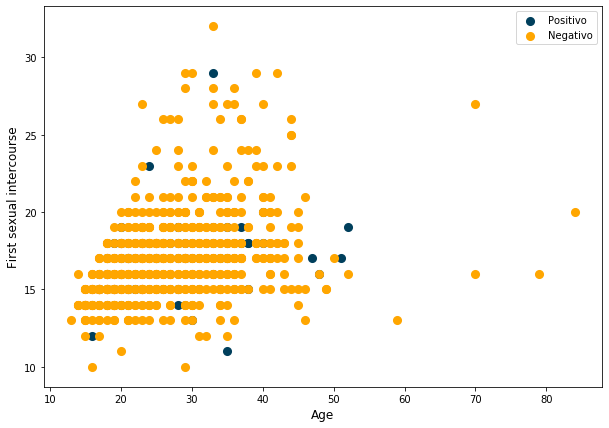

In [9]:
X = df_imp.drop('Biopsy', axis=1)
y = df_imp['Biopsy']

# Exmplo
features = ['Age', 'First sexual intercourse']

plot_data(X, y, features[0], features[1], 'Positivo', 'Negativo', features)

## Stratified Cross- Validation

### Dataset Desbalanceado

In [10]:
# Cross Validation com dataset DESBALANCEADO

def stratified_k_fold(df, k, algoritmo, random_state, grid_params, shuffle=False, shrinking=True):
    print('------')
    print('Algorimto Utilizado: {}'.format(algoritmo))
    print('------')

    # Utilizando todas as features como preditoras
    X = df.drop('Biopsy', axis=1)
    y = df['Biopsy']
    
    # quantidade original de classes
    count_classes = y.value_counts()
    
    # Stratified K Fold
    skf = StratifiedKFold(n_splits=k, shuffle=shuffle, random_state=random_state)
    skf.get_n_splits(X, y)
    print('k = {}, Dataset {} positivas e {} negativas ({:.2f}% x {:.2f}%)'.format(k, count_classes[1], 
                                                                                 count_classes[0], 
                                                                                 ((count_classes[1]/len(y))*100), 
                                                                                 ((count_classes[0]/len(y))*100)))

    
    # Scores (das futuras metricas)
    scores = []
    
    # coleta os parametros que serao testados
    hidden_layers = grid_params.get('hidden_layer_sizes')
    alpha_step = grid_params.get('alpha_step')
    activation = grid_params.get('activation')
    
    
    # Testa varios KERNELS
    for act in activation:
        print("-> Teste Funcao de Ativacao da camada oculta {}".format(act))
        
        for hidden in hidden_layers:
            print("-> Quantidade de neuronios {}".format(hidden))
 
            alphaX = 0.01
            while alphaX <= 0.1:
                print("-> Valor alpha{}".format(alphaX))
                
                print('-> Criando modelo com params hidden={}, act={}, alpha={}'.format(hidden, act, alphaX))
                clf = algoritmo(hidden_layer_sizes=(hidden, ), activation=act, verbose = 1, solver='adam', alpha=alphaX)
                clf.out_activation_ = 'softmax'
                # Folds
                for fold, (train_index, test_index) in enumerate(skf.split(X, y), 1):
                    fold_number = fold
                    X_train, y_train = X.iloc[train_index], y.iloc[train_index]
                    X_test, y_test = X.iloc[test_index], y.iloc[test_index]

                    # quantidade de classes dentro da fold
                    count_classes_fold = y.iloc[test_index].value_counts()
                    # proporções
                    prop_pos = ((count_classes_fold[1]/count_classes_fold.sum())*100)
                    prop_neg = ((count_classes_fold[0]/count_classes_fold.sum())*100)
                    print('Fold {}: Pos: {}, Neg: {}, Total: {}, Proporção: {:.2f}% x {:.2f}%'.format(fold_number, 
                                                                                            count_classes_fold[1],
                                                                                            count_classes_fold[0], 
                                                                                            count_classes_fold.sum(),
                                                                                            prop_pos, prop_neg))  
                    
                    # aplica o classificador
                    clf = clf.fit(X_train, y_train)
                    #display(clf)
                    # predict no dataset de treino 
                    y_train_preds = clf.predict(X_train)
                    # predict no dataset de teste
                    y_pred = clf.predict(X_test)

                    print("\tNumero de instancias classificadas erradas do total de %d instancias : %d"
                            % (y_test.shape[0], (y_test != y_pred).sum()))
                    # print("Number of points predicted as Pos: %d"
                    #  % ((y_pred == 1).sum()))

                    # Scores do model (utilizados dados nao-balanceados) - dados de teste
                    recall = recall_score(y_test, y_pred)
                    accuracy = accuracy_score(y_test, y_pred)
                    precision = precision_score(y_test, y_pred)
                    scores.append([act, hidden, alphaX, fold_number, precision, recall, accuracy])
                        
                alphaX = alphaX + 0.01
                
        
    return np.array(scores)

### Dataset Balanceado

In [11]:
# Cross Validation com dataset DESBALANCEADO

def stratified_k_fold_SMOTE(df, k, algoritmo, random_state, grid_params, shuffle=False, shrinking=True):
    print('------')
    print('Algorimto Utilizado: {}'.format(algoritmo))
    print('------')

    # Utilizando todas as features como preditoras
    X = df.drop('Biopsy', axis=1)
    y = df['Biopsy']
    
    # quantidade original de classes
    count_classes = y.value_counts()
    
    # Stratified K Fold
    skf = StratifiedKFold(n_splits=k, shuffle=shuffle, random_state=random_state)
    skf.get_n_splits(X, y)
    print('k = {}, Dataset {} positivas e {} negativas ({:.2f}% x {:.2f}%)'.format(k, count_classes[1], 
                                                                                 count_classes[0], 
                                                                                 ((count_classes[1]/len(y))*100), 
                                                                                 ((count_classes[0]/len(y))*100)))

        # Normalização MinMax
    minmax_scale = preprocessing.MinMaxScaler(feature_range=(0, 1))
    
    # SMOTETomek
    cc = SMOTETomek(random_state=random_state)
    
    # Scores (das futuras metricas)
    scores = []
    
    # coleta os parametros que serao testados
    hidden_layers = grid_params.get('hidden_layer_sizes')
    alpha_step = grid_params.get('alpha_step')
    activation = grid_params.get('activation')
    
    
    # Testa varios KERNELS
    for act in activation:
        print("-> Teste Funcao de Ativacao da camada oculta: {}".format(act))
        
        for hidden in hidden_layers:
            print("-> Quantidade de neuronios: {}".format(hidden))
 
            alphaX = 0.01
            while alphaX <= 0.1:
                print("-> Valor alpha: {}".format(alphaX))
                
                print('-> Criando modelo com params hidden={}, act={}, alpha={}'.format(hidden, act, alphaX))
                clf = algoritmo(hidden_layer_sizes=(hidden, ), activation=act, verbose = 1, solver='adam', alpha=alphaX)
                clf.out_activation_ = 'softmax'
                # Folds
                for fold, (train_index, test_index) in enumerate(skf.split(X, y), 1):
                    fold_number = fold
                    X_train, y_train = X.iloc[train_index], y.iloc[train_index]
                    X_test, y_test = X.iloc[test_index], y.iloc[test_index]

                    # quantidade de classes dentro da fold
                    count_classes_fold = y.iloc[test_index].value_counts()
                    # proporções
                    prop_pos = ((count_classes_fold[1]/count_classes_fold.sum())*100)
                    prop_neg = ((count_classes_fold[0]/count_classes_fold.sum())*100)
                    print('Fold {}: Pos: {}, Neg: {}, Total: {}, Proporção: {:.2f}% x {:.2f}%'.format(fold_number, 
                                                                                            count_classes_fold[1],
                                                                                            count_classes_fold[0], 
                                                                                            count_classes_fold.sum(),
                                                                                            prop_pos, prop_neg))  
                    
                    # aplica o classificador
                    clf = clf.fit(X_train, y_train)
                    #display(clf)
                    # predict no dataset de treino 
                    y_train_preds = clf.predict(X_train)
                    # predict no dataset de teste
                    y_pred = clf.predict(X_test)

                    print("\tNumero de instancias classificadas erradas do total de %d instancias : %d"
                            % (y_test.shape[0], (y_test != y_pred).sum()))
                    # print("Number of points predicted as Pos: %d"
                    #  % ((y_pred == 1).sum()))

                    # Scores do model (utilizados dados nao-balanceados) - dados de teste
                    recall = recall_score(y_test, y_pred)
                    print('Recall')
                    print(recall)
                    accuracy = accuracy_score(y_test, y_pred)
                    precision = precision_score(y_test, y_pred)
                    scores.append([act, hidden, alphaX, fold_number, precision, recall, accuracy])
                        
                alphaX = alphaX + 0.01
                
        
    return np.array(scores)

## Grid de Parametros para teste

In [12]:
grid_params_all = {'hidden_layer_sizes': [10, 7, 70],
                   'alpha_step': 0.01,
                   'activation': ['tanh', 'relu']
                  }

#grid_params_semi = {'gamma_range': [1e-4, 10e-1],
#               'gamma_step': 0.01,
#               'kernels': ['linear', 'rbf', 'sigmoid'],#, 'precomputed'],
#               'C_range': [1, 10, 100, 1000]
#              }

grid_params_semi = {'hidden_layer_sizes': [10, 7, 70],
                    'alpha_step': 0.01,
                    'activation': ['tanh', 'relu']
                   }

#grid_params_linear = {'kernels': ['linear'],
#                      'C_range': [1, 10, 100, 1000]
#                     }


grid_params_tanh = {'hidden_layer_sizes': [10, 7, 70],
                       'alpha_step': 0.001,
                       'activation': ['tanh'],
                       'solver': ['lbfgs', 'sgd', 'adam']
                      }


grid_params_relu= {'hidden_layer_sizes': [10, 7, 70],
                   'alpha_step': 0.001,
                   'activation': ['relu'],
                   'solver': ['lbfgs', 'sgd', 'adam']
                   }

## Calculando Precisão, Revocação e Acurácia

### Algortimo-> MLP

### Dataset Desbalanceado

In [13]:
k = 10
print('K-Fold com K = {}'.format(k))
scores_unbalanced = pd.DataFrame(stratified_k_fold(df_imp, k, MLPClassifier, random_state, grid_params_all, shuffle=False))

#scores.append([act, hidden, alpha, fold_number, precision, recall, accuracy])
scores_unbalanced = scores_unbalanced.rename(columns = {0: 'FUNATIVACAO', 1: 'QTDCAMADA', 2: 'Alpha', 3:'Fold', 
                                                        4: 'Precision', 5: 'Recall', 6: 'Accuracy'}) 
scores_unbalanced['Algorimto'] = 'MLPClassifier'
float_cols = ['Alpha', 'Fold', 'Precision', 'Recall', 'Accuracy']# 'Gamma'
scores_unbalanced[float_cols] = scores_unbalanced[float_cols].apply(pd.to_numeric, errors='coerce')
print('----'*20)


K-Fold com K = 10
------
Algorimto Utilizado: <class 'sklearn.neural_network._multilayer_perceptron.MLPClassifier'>
------
k = 10, Dataset 55 positivas e 803 negativas (6.41% x 93.59%)
-> Teste Funcao de Ativacao da camada oculta tanh
-> Quantidade de neuronios 10
-> Valor alpha0.01
-> Criando modelo com params hidden=10, act=tanh, alpha=0.01
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.36764715
Iteration 2, loss = 0.33647725
Iteration 3, loss = 0.31382232
Iteration 4, loss = 0.29575444
Iteration 5, loss = 0.28219735
Iteration 6, loss = 0.27190663
Iteration 7, loss = 0.26310598
Iteration 8, loss = 0.25599268
Iteration 9, loss = 0.25050290
Iteration 10, loss = 0.24546905
Iteration 11, loss = 0.24174656
Iteration 12, loss = 0.23859128
Iteration 13, loss = 0.23591267
Iteration 14, loss = 0.23379623
Iteration 15, loss = 0.23178516
Iteration 16, loss = 0.22993637
Iteration 17, loss = 0.22881044
Iteration 18, loss = 0.22724485
Iteration 19, loss = 0.226

Iteration 42, loss = 0.24148225
Iteration 43, loss = 0.24121374
Iteration 44, loss = 0.24091490
Iteration 45, loss = 0.24059624
Iteration 46, loss = 0.24031236
Iteration 47, loss = 0.24002705
Iteration 48, loss = 0.23971661
Iteration 49, loss = 0.23941815
Iteration 50, loss = 0.23915947
Iteration 51, loss = 0.23879090
Iteration 52, loss = 0.23850093
Iteration 53, loss = 0.23820682
Iteration 54, loss = 0.23785867
Iteration 55, loss = 0.23750509
Iteration 56, loss = 0.23715107
Iteration 57, loss = 0.23680680
Iteration 58, loss = 0.23646042
Iteration 59, loss = 0.23605811
Iteration 60, loss = 0.23565784
Iteration 61, loss = 0.23530490
Iteration 62, loss = 0.23487976
Iteration 63, loss = 0.23443364
Iteration 64, loss = 0.23393460
Iteration 65, loss = 0.23350202
Iteration 66, loss = 0.23303692
Iteration 67, loss = 0.23250179
Iteration 68, loss = 0.23195824
Iteration 69, loss = 0.23144554
Iteration 70, loss = 0.23085056
Iteration 71, loss = 0.23027442
Iteration 72, loss = 0.22966537
Iteratio

Iteration 128, loss = 0.16057882
Iteration 129, loss = 0.15982896
Iteration 130, loss = 0.15912816
Iteration 131, loss = 0.15858135
Iteration 132, loss = 0.15793824
Iteration 133, loss = 0.15746588
Iteration 134, loss = 0.15685424
Iteration 135, loss = 0.15602837
Iteration 136, loss = 0.15542657
Iteration 137, loss = 0.15461736
Iteration 138, loss = 0.15400032
Iteration 139, loss = 0.15333643
Iteration 140, loss = 0.15262489
Iteration 141, loss = 0.15175867
Iteration 142, loss = 0.15115498
Iteration 143, loss = 0.15041257
Iteration 144, loss = 0.14977839
Iteration 145, loss = 0.14902787
Iteration 146, loss = 0.14855794
Iteration 147, loss = 0.14777561
Iteration 148, loss = 0.14715014
Iteration 149, loss = 0.14654963
Iteration 150, loss = 0.14581253
Iteration 151, loss = 0.14515260
Iteration 152, loss = 0.14459704
Iteration 153, loss = 0.14390253
Iteration 154, loss = 0.14347371
Iteration 155, loss = 0.14274089
Iteration 156, loss = 0.14203601
Iteration 157, loss = 0.14138187
Iteration 

Iteration 178, loss = 0.17760689
Iteration 179, loss = 0.17712363
Iteration 180, loss = 0.17678035
Iteration 181, loss = 0.17628160
Iteration 182, loss = 0.17598107
Iteration 183, loss = 0.17544930
Iteration 184, loss = 0.17504743
Iteration 185, loss = 0.17463831
Iteration 186, loss = 0.17426687
Iteration 187, loss = 0.17380033
Iteration 188, loss = 0.17340948
Iteration 189, loss = 0.17299480
Iteration 190, loss = 0.17261216
Iteration 191, loss = 0.17220397
Iteration 192, loss = 0.17181653
Iteration 193, loss = 0.17141659
Iteration 194, loss = 0.17103598
Iteration 195, loss = 0.17067346
Iteration 196, loss = 0.17028469
Iteration 197, loss = 0.16993113
Iteration 198, loss = 0.16948565
Iteration 199, loss = 0.16907351
Iteration 200, loss = 0.16878840
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.27594011
Iteration 2, loss = 0.26751341
Iteration 3, loss = 0.26017578
Iteration 4,

Iteration 27, loss = 0.28598314
Iteration 28, loss = 0.28323386
Iteration 29, loss = 0.28033128
Iteration 30, loss = 0.27776783
Iteration 31, loss = 0.27531368
Iteration 32, loss = 0.27286857
Iteration 33, loss = 0.27074916
Iteration 34, loss = 0.26868820
Iteration 35, loss = 0.26659065
Iteration 36, loss = 0.26447879
Iteration 37, loss = 0.26182801
Iteration 38, loss = 0.25805244
Iteration 39, loss = 0.25284097
Iteration 40, loss = 0.24388200
Iteration 41, loss = 0.23599696
Iteration 42, loss = 0.23171515
Iteration 43, loss = 0.23177602
Iteration 44, loss = 0.23102855
Iteration 45, loss = 0.23026177
Iteration 46, loss = 0.22916288
Iteration 47, loss = 0.22759455
Iteration 48, loss = 0.22660823
Iteration 49, loss = 0.22549031
Iteration 50, loss = 0.22463753
Iteration 51, loss = 0.22391251
Iteration 52, loss = 0.22298211
Iteration 53, loss = 0.22225193
Iteration 54, loss = 0.22163394
Iteration 55, loss = 0.22060311
Iteration 56, loss = 0.21978579
Iteration 57, loss = 0.21911790
Iteratio

Iteration 105, loss = 0.20258392
Iteration 106, loss = 0.20223421
Iteration 107, loss = 0.20192309
Iteration 108, loss = 0.20152163
Iteration 109, loss = 0.20114160
Iteration 110, loss = 0.20074374
Iteration 111, loss = 0.20037031
Iteration 112, loss = 0.20000770
Iteration 113, loss = 0.19963888
Iteration 114, loss = 0.19914703
Iteration 115, loss = 0.19872708
Iteration 116, loss = 0.19835638
Iteration 117, loss = 0.19792246
Iteration 118, loss = 0.19762244
Iteration 119, loss = 0.19725116
Iteration 120, loss = 0.19676001
Iteration 121, loss = 0.19643537
Iteration 122, loss = 0.19596865
Iteration 123, loss = 0.19563591
Iteration 124, loss = 0.19517841
Iteration 125, loss = 0.19477017
Iteration 126, loss = 0.19433594
Iteration 127, loss = 0.19395479
Iteration 128, loss = 0.19355859
Iteration 129, loss = 0.19307523
Iteration 130, loss = 0.19264158
Iteration 131, loss = 0.19223192
Iteration 132, loss = 0.19177340
Iteration 133, loss = 0.19131039
Iteration 134, loss = 0.19095075
Iteration 

Iteration 166, loss = 0.11401117
Iteration 167, loss = 0.11288729
Iteration 168, loss = 0.11226852
Iteration 169, loss = 0.11074430
Iteration 170, loss = 0.11036986
Iteration 171, loss = 0.10897345
Iteration 172, loss = 0.10823774
Iteration 173, loss = 0.10716207
Iteration 174, loss = 0.10610845
Iteration 175, loss = 0.10531944
Iteration 176, loss = 0.10435574
Iteration 177, loss = 0.10399701
Iteration 178, loss = 0.10285449
Iteration 179, loss = 0.10239988
Iteration 180, loss = 0.10145825
Iteration 181, loss = 0.10127203
Iteration 182, loss = 0.10099854
Iteration 183, loss = 0.09964274
Iteration 184, loss = 0.09890033
Iteration 185, loss = 0.09896942
Iteration 186, loss = 0.09810771
Iteration 187, loss = 0.09740746
Iteration 188, loss = 0.09720603
Iteration 189, loss = 0.09661073
Iteration 190, loss = 0.09594141
Iteration 191, loss = 0.09544887
Iteration 192, loss = 0.09556806
Iteration 193, loss = 0.09483772
Iteration 194, loss = 0.09425926
Iteration 195, loss = 0.09393850
Iteration 

Iteration 44, loss = 0.21791296
Iteration 45, loss = 0.21725453
Iteration 46, loss = 0.21657711
Iteration 47, loss = 0.21597316
Iteration 48, loss = 0.21527356
Iteration 49, loss = 0.21457964
Iteration 50, loss = 0.21398588
Iteration 51, loss = 0.21340332
Iteration 52, loss = 0.21261002
Iteration 53, loss = 0.21196243
Iteration 54, loss = 0.21131192
Iteration 55, loss = 0.21067414
Iteration 56, loss = 0.21004202
Iteration 57, loss = 0.20934092
Iteration 58, loss = 0.20876113
Iteration 59, loss = 0.20813549
Iteration 60, loss = 0.20756625
Iteration 61, loss = 0.20699987
Iteration 62, loss = 0.20637548
Iteration 63, loss = 0.20580948
Iteration 64, loss = 0.20529410
Iteration 65, loss = 0.20476050
Iteration 66, loss = 0.20420034
Iteration 67, loss = 0.20373675
Iteration 68, loss = 0.20311255
Iteration 69, loss = 0.20257906
Iteration 70, loss = 0.20201913
Iteration 71, loss = 0.20148469
Iteration 72, loss = 0.20099914
Iteration 73, loss = 0.20045838
Iteration 74, loss = 0.19988084
Iteratio

Iteration 94, loss = 0.19319672
Iteration 95, loss = 0.19243623
Iteration 96, loss = 0.19165480
Iteration 97, loss = 0.19092901
Iteration 98, loss = 0.19013920
Iteration 99, loss = 0.18939236
Iteration 100, loss = 0.18859739
Iteration 101, loss = 0.18777364
Iteration 102, loss = 0.18700319
Iteration 103, loss = 0.18630334
Iteration 104, loss = 0.18539693
Iteration 105, loss = 0.18461251
Iteration 106, loss = 0.18380797
Iteration 107, loss = 0.18304561
Iteration 108, loss = 0.18221966
Iteration 109, loss = 0.18144816
Iteration 110, loss = 0.18068431
Iteration 111, loss = 0.17993841
Iteration 112, loss = 0.17903333
Iteration 113, loss = 0.17826534
Iteration 114, loss = 0.17747251
Iteration 115, loss = 0.17668365
Iteration 116, loss = 0.17589273
Iteration 117, loss = 0.17512726
Iteration 118, loss = 0.17430642
Iteration 119, loss = 0.17357626
Iteration 120, loss = 0.17282282
Iteration 121, loss = 0.17204035
Iteration 122, loss = 0.17127087
Iteration 123, loss = 0.17057640
Iteration 124, l

Iteration 151, loss = 0.15759137
Iteration 152, loss = 0.15687184
Iteration 153, loss = 0.15594989
Iteration 154, loss = 0.15522396
Iteration 155, loss = 0.15441699
Iteration 156, loss = 0.15349746
Iteration 157, loss = 0.15289494
Iteration 158, loss = 0.15180213
Iteration 159, loss = 0.15090512
Iteration 160, loss = 0.15006993
Iteration 161, loss = 0.14921965
Iteration 162, loss = 0.14842453
Iteration 163, loss = 0.14738157
Iteration 164, loss = 0.14642765
Iteration 165, loss = 0.14572309
Iteration 166, loss = 0.14468193
Iteration 167, loss = 0.14387793
Iteration 168, loss = 0.14306127
Iteration 169, loss = 0.14241405
Iteration 170, loss = 0.14155252
Iteration 171, loss = 0.14084574
Iteration 172, loss = 0.14008536
Iteration 173, loss = 0.13933315
Iteration 174, loss = 0.13857615
Iteration 175, loss = 0.13780962
Iteration 176, loss = 0.13714648
Iteration 177, loss = 0.13646577
Iteration 178, loss = 0.13585498
Iteration 179, loss = 0.13516549
Iteration 180, loss = 0.13438632
Iteration 

Iteration 11, loss = 0.25081836
Iteration 12, loss = 0.24784820
Iteration 13, loss = 0.24561238
Iteration 14, loss = 0.24399468
Iteration 15, loss = 0.24256934
Iteration 16, loss = 0.24140136
Iteration 17, loss = 0.24043002
Iteration 18, loss = 0.23957369
Iteration 19, loss = 0.23893742
Iteration 20, loss = 0.23823287
Iteration 21, loss = 0.23759573
Iteration 22, loss = 0.23711250
Iteration 23, loss = 0.23648594
Iteration 24, loss = 0.23603760
Iteration 25, loss = 0.23555715
Iteration 26, loss = 0.23504058
Iteration 27, loss = 0.23464842
Iteration 28, loss = 0.23423970
Iteration 29, loss = 0.23390192
Iteration 30, loss = 0.23345948
Iteration 31, loss = 0.23307471
Iteration 32, loss = 0.23263310
Iteration 33, loss = 0.23211354
Iteration 34, loss = 0.23161461
Iteration 35, loss = 0.23093195
Iteration 36, loss = 0.22979206
Iteration 37, loss = 0.22806937
Iteration 38, loss = 0.22691231
Iteration 39, loss = 0.22535540
Iteration 40, loss = 0.22445907
Iteration 41, loss = 0.22375298
Iteratio

Iteration 96, loss = 0.14956993
Iteration 97, loss = 0.14869639
Iteration 98, loss = 0.14783251
Iteration 99, loss = 0.14700520
Iteration 100, loss = 0.14606796
Iteration 101, loss = 0.14526685
Iteration 102, loss = 0.14452856
Iteration 103, loss = 0.14353798
Iteration 104, loss = 0.14271729
Iteration 105, loss = 0.14161923
Iteration 106, loss = 0.14059538
Iteration 107, loss = 0.13927264
Iteration 108, loss = 0.13780049
Iteration 109, loss = 0.13642103
Iteration 110, loss = 0.13541367
Iteration 111, loss = 0.13442642
Iteration 112, loss = 0.13349224
Iteration 113, loss = 0.13258453
Iteration 114, loss = 0.13128860
Iteration 115, loss = 0.13016997
Iteration 116, loss = 0.12915820
Iteration 117, loss = 0.12827925
Iteration 118, loss = 0.12701160
Iteration 119, loss = 0.12587352
Iteration 120, loss = 0.12505065
Iteration 121, loss = 0.12381797
Iteration 122, loss = 0.12289860
Iteration 123, loss = 0.12182442
Iteration 124, loss = 0.12112818
Iteration 125, loss = 0.11994961
Iteration 126,

Iteration 147, loss = 0.17358155
Iteration 148, loss = 0.17276045
Iteration 149, loss = 0.17209356
Iteration 150, loss = 0.17145161
Iteration 151, loss = 0.17075946
Iteration 152, loss = 0.17042682
Iteration 153, loss = 0.16942636
Iteration 154, loss = 0.16887641
Iteration 155, loss = 0.16819981
Iteration 156, loss = 0.16774186
Iteration 157, loss = 0.16705212
Iteration 158, loss = 0.16650358
Iteration 159, loss = 0.16584936
Iteration 160, loss = 0.16526475
Iteration 161, loss = 0.16465360
Iteration 162, loss = 0.16404327
Iteration 163, loss = 0.16344714
Iteration 164, loss = 0.16288993
Iteration 165, loss = 0.16229004
Iteration 166, loss = 0.16178805
Iteration 167, loss = 0.16121313
Iteration 168, loss = 0.16065784
Iteration 169, loss = 0.16017305
Iteration 170, loss = 0.15972548
Iteration 171, loss = 0.15916833
Iteration 172, loss = 0.15866172
Iteration 173, loss = 0.15819225
Iteration 174, loss = 0.15765650
Iteration 175, loss = 0.15716588
Iteration 176, loss = 0.15677982
Iteration 

Iteration 4, loss = 0.83507212
Iteration 5, loss = 0.79321497
Iteration 6, loss = 0.75051106
Iteration 7, loss = 0.70927113
Iteration 8, loss = 0.66733130
Iteration 9, loss = 0.62429921
Iteration 10, loss = 0.57799469
Iteration 11, loss = 0.52921658
Iteration 12, loss = 0.47881961
Iteration 13, loss = 0.42966512
Iteration 14, loss = 0.38470288
Iteration 15, loss = 0.34792569
Iteration 16, loss = 0.31930840
Iteration 17, loss = 0.29882969
Iteration 18, loss = 0.28427451
Iteration 19, loss = 0.27410890
Iteration 20, loss = 0.26582320
Iteration 21, loss = 0.25976860
Iteration 22, loss = 0.25472605
Iteration 23, loss = 0.25096783
Iteration 24, loss = 0.24786073
Iteration 25, loss = 0.24548337
Iteration 26, loss = 0.24354440
Iteration 27, loss = 0.24191013
Iteration 28, loss = 0.24035665
Iteration 29, loss = 0.23903257
Iteration 30, loss = 0.23777243
Iteration 31, loss = 0.23669056
Iteration 32, loss = 0.23570603
Iteration 33, loss = 0.23506882
Iteration 34, loss = 0.23439209
Iteration 35, 

Iteration 84, loss = 0.21241031
Iteration 85, loss = 0.21185740
Iteration 86, loss = 0.21134908
Iteration 87, loss = 0.21075014
Iteration 88, loss = 0.21007939
Iteration 89, loss = 0.20949735
Iteration 90, loss = 0.20887301
Iteration 91, loss = 0.20824882
Iteration 92, loss = 0.20780088
Iteration 93, loss = 0.20692991
Iteration 94, loss = 0.20633094
Iteration 95, loss = 0.20563273
Iteration 96, loss = 0.20507074
Iteration 97, loss = 0.20426146
Iteration 98, loss = 0.20362884
Iteration 99, loss = 0.20284139
Iteration 100, loss = 0.20211440
Iteration 101, loss = 0.20142093
Iteration 102, loss = 0.20087700
Iteration 103, loss = 0.20004389
Iteration 104, loss = 0.19930576
Iteration 105, loss = 0.19853291
Iteration 106, loss = 0.19777098
Iteration 107, loss = 0.19710275
Iteration 108, loss = 0.19643532
Iteration 109, loss = 0.19566620
Iteration 110, loss = 0.19500092
Iteration 111, loss = 0.19427894
Iteration 112, loss = 0.19365464
Iteration 113, loss = 0.19288896
Iteration 114, loss = 0.19

Iteration 133, loss = 0.12846518
Iteration 134, loss = 0.12756687
Iteration 135, loss = 0.12684084
Iteration 136, loss = 0.12611303
Iteration 137, loss = 0.12539283
Iteration 138, loss = 0.12500449
Iteration 139, loss = 0.12410416
Iteration 140, loss = 0.12337683
Iteration 141, loss = 0.12275307
Iteration 142, loss = 0.12216408
Iteration 143, loss = 0.12149443
Iteration 144, loss = 0.12119121
Iteration 145, loss = 0.12057963
Iteration 146, loss = 0.11977504
Iteration 147, loss = 0.11917397
Iteration 148, loss = 0.11858896
Iteration 149, loss = 0.11812374
Iteration 150, loss = 0.11733360
Iteration 151, loss = 0.11705254
Iteration 152, loss = 0.11641880
Iteration 153, loss = 0.11598619
Iteration 154, loss = 0.11543021
Iteration 155, loss = 0.11471723
Iteration 156, loss = 0.11429570
Iteration 157, loss = 0.11414605
Iteration 158, loss = 0.11334796
Iteration 159, loss = 0.11292811
Iteration 160, loss = 0.11237459
Iteration 161, loss = 0.11175940
Iteration 162, loss = 0.11120852
Iteration 

Iteration 191, loss = 0.16724118
Iteration 192, loss = 0.16589688
Iteration 193, loss = 0.16454466
Iteration 194, loss = 0.16375394
Iteration 195, loss = 0.16278844
Iteration 196, loss = 0.16214963
Iteration 197, loss = 0.16098297
Iteration 198, loss = 0.16003941
Iteration 199, loss = 0.15903881
Iteration 200, loss = 0.15807523
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.37114713
Iteration 2, loss = 0.35763110
Iteration 3, loss = 0.34541315
Iteration 4, loss = 0.33358121
Iteration 5, loss = 0.32214149
Iteration 6, loss = 0.31191200
Iteration 7, loss = 0.30098320
Iteration 8, loss = 0.29154731
Iteration 9, loss = 0.28344435
Iteration 10, loss = 0.27525206
Iteration 11, loss = 0.26924489
Iteration 12, loss = 0.26411993
Iteration 13, loss = 0.26081293
Iteration 14, loss = 0.25767794
Iteration 15, loss = 0.25508594
Iteration 16, loss = 0.25375538
Iteration 17, loss = 0.25202727

Iteration 36, loss = 0.23494765
Iteration 37, loss = 0.23438918
Iteration 38, loss = 0.23376562
Iteration 39, loss = 0.23303485
Iteration 40, loss = 0.23216547
Iteration 41, loss = 0.23143305
Iteration 42, loss = 0.23067894
Iteration 43, loss = 0.22971061
Iteration 44, loss = 0.22887788
Iteration 45, loss = 0.22816678
Iteration 46, loss = 0.22742732
Iteration 47, loss = 0.22684542
Iteration 48, loss = 0.22626852
Iteration 49, loss = 0.22556417
Iteration 50, loss = 0.22497805
Iteration 51, loss = 0.22440857
Iteration 52, loss = 0.22381117
Iteration 53, loss = 0.22326024
Iteration 54, loss = 0.22276077
Iteration 55, loss = 0.22226925
Iteration 56, loss = 0.22171485
Iteration 57, loss = 0.22126169
Iteration 58, loss = 0.22072364
Iteration 59, loss = 0.22026140
Iteration 60, loss = 0.21973559
Iteration 61, loss = 0.21928514
Iteration 62, loss = 0.21882492
Iteration 63, loss = 0.21830194
Iteration 64, loss = 0.21770813
Iteration 65, loss = 0.21720537
Iteration 66, loss = 0.21665844
Iteratio

Iteration 118, loss = 0.18555038
Iteration 119, loss = 0.18482368
Iteration 120, loss = 0.18423415
Iteration 121, loss = 0.18360059
Iteration 122, loss = 0.18296823
Iteration 123, loss = 0.18233402
Iteration 124, loss = 0.18173683
Iteration 125, loss = 0.18105191
Iteration 126, loss = 0.18041953
Iteration 127, loss = 0.17980739
Iteration 128, loss = 0.17918529
Iteration 129, loss = 0.17856644
Iteration 130, loss = 0.17796611
Iteration 131, loss = 0.17727860
Iteration 132, loss = 0.17660401
Iteration 133, loss = 0.17611910
Iteration 134, loss = 0.17550001
Iteration 135, loss = 0.17484372
Iteration 136, loss = 0.17419573
Iteration 137, loss = 0.17355271
Iteration 138, loss = 0.17281215
Iteration 139, loss = 0.17225408
Iteration 140, loss = 0.17159462
Iteration 141, loss = 0.17105882
Iteration 142, loss = 0.17050534
Iteration 143, loss = 0.16990367
Iteration 144, loss = 0.16917809
Iteration 145, loss = 0.16850221
Iteration 146, loss = 0.16780434
Iteration 147, loss = 0.16728853
Iteration 

Iteration 14, loss = 0.85895484
Iteration 15, loss = 0.71067449
Iteration 16, loss = 0.56925570
Iteration 17, loss = 0.45307451
Iteration 18, loss = 0.36511543
Iteration 19, loss = 0.31118596
Iteration 20, loss = 0.27625443
Iteration 21, loss = 0.25647087
Iteration 22, loss = 0.24659072
Iteration 23, loss = 0.24013711
Iteration 24, loss = 0.23589766
Iteration 25, loss = 0.23362760
Iteration 26, loss = 0.23157725
Iteration 27, loss = 0.23028110
Iteration 28, loss = 0.22925400
Iteration 29, loss = 0.22835352
Iteration 30, loss = 0.22748360
Iteration 31, loss = 0.22647797
Iteration 32, loss = 0.22552541
Iteration 33, loss = 0.22460791
Iteration 34, loss = 0.22383180
Iteration 35, loss = 0.22302693
Iteration 36, loss = 0.22203018
Iteration 37, loss = 0.22124503
Iteration 38, loss = 0.22052987
Iteration 39, loss = 0.21962057
Iteration 40, loss = 0.21899842
Iteration 41, loss = 0.21823648
Iteration 42, loss = 0.21762094
Iteration 43, loss = 0.21689132
Iteration 44, loss = 0.21633329
Iteratio

Iteration 160, loss = 0.12447868
Iteration 161, loss = 0.12376537
Iteration 162, loss = 0.12330608
Iteration 163, loss = 0.12300540
Iteration 164, loss = 0.12220354
Iteration 165, loss = 0.12164890
Iteration 166, loss = 0.12124613
Iteration 167, loss = 0.12061221
Iteration 168, loss = 0.12019398
Iteration 169, loss = 0.11963270
Iteration 170, loss = 0.11925171
Iteration 171, loss = 0.11864820
Iteration 172, loss = 0.11824310
Iteration 173, loss = 0.11792977
Iteration 174, loss = 0.11722620
Iteration 175, loss = 0.11701414
Iteration 176, loss = 0.11643886
Iteration 177, loss = 0.11599543
Iteration 178, loss = 0.11550001
Iteration 179, loss = 0.11513642
Iteration 180, loss = 0.11466043
Iteration 181, loss = 0.11433185
Iteration 182, loss = 0.11386881
Iteration 183, loss = 0.11356390
Iteration 184, loss = 0.11323173
Iteration 185, loss = 0.11288375
Iteration 186, loss = 0.11239925
Iteration 187, loss = 0.11189964
Iteration 188, loss = 0.11158775
Iteration 189, loss = 0.11134090
Iteration 

Iteration 99, loss = 0.21453059
Iteration 100, loss = 0.21344563
Iteration 101, loss = 0.21244735
Iteration 102, loss = 0.21144525
Iteration 103, loss = 0.21061307
Iteration 104, loss = 0.20930534
Iteration 105, loss = 0.20828249
Iteration 106, loss = 0.20701749
Iteration 107, loss = 0.20585855
Iteration 108, loss = 0.20457782
Iteration 109, loss = 0.20354062
Iteration 110, loss = 0.20213504
Iteration 111, loss = 0.20080860
Iteration 112, loss = 0.19970355
Iteration 113, loss = 0.19795880
Iteration 114, loss = 0.19632544
Iteration 115, loss = 0.19473614
Iteration 116, loss = 0.19356181
Iteration 117, loss = 0.19152805
Iteration 118, loss = 0.19016884
Iteration 119, loss = 0.18904057
Iteration 120, loss = 0.18736857
Iteration 121, loss = 0.18614531
Iteration 122, loss = 0.18471380
Iteration 123, loss = 0.18370235
Iteration 124, loss = 0.18238105
Iteration 125, loss = 0.18146584
Iteration 126, loss = 0.18014504
Iteration 127, loss = 0.17895039
Iteration 128, loss = 0.17831309
Iteration 1

Iteration 52, loss = 0.23090788
Iteration 53, loss = 0.23054471
Iteration 54, loss = 0.23016062
Iteration 55, loss = 0.22979710
Iteration 56, loss = 0.22941378
Iteration 57, loss = 0.22911101
Iteration 58, loss = 0.22877982
Iteration 59, loss = 0.22835794
Iteration 60, loss = 0.22804104
Iteration 61, loss = 0.22768080
Iteration 62, loss = 0.22728149
Iteration 63, loss = 0.22698559
Iteration 64, loss = 0.22660972
Iteration 65, loss = 0.22624014
Iteration 66, loss = 0.22588624
Iteration 67, loss = 0.22547487
Iteration 68, loss = 0.22513125
Iteration 69, loss = 0.22475197
Iteration 70, loss = 0.22441297
Iteration 71, loss = 0.22400546
Iteration 72, loss = 0.22368002
Iteration 73, loss = 0.22324610
Iteration 74, loss = 0.22288707
Iteration 75, loss = 0.22248455
Iteration 76, loss = 0.22207393
Iteration 77, loss = 0.22166248
Iteration 78, loss = 0.22132797
Iteration 79, loss = 0.22083963
Iteration 80, loss = 0.22040894
Iteration 81, loss = 0.21989685
Iteration 82, loss = 0.21939876
Iteratio

Iteration 196, loss = 0.13678568
Iteration 197, loss = 0.13595498
Iteration 198, loss = 0.13542470
Iteration 199, loss = 0.13502363
Iteration 200, loss = 0.13425707
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.25271437
Iteration 2, loss = 0.25053235
Iteration 3, loss = 0.24821916
Iteration 4, loss = 0.24591763
Iteration 5, loss = 0.24402960
Iteration 6, loss = 0.24205638
Iteration 7, loss = 0.23992024
Iteration 8, loss = 0.23854856
Iteration 9, loss = 0.23667177
Iteration 10, loss = 0.23546139
Iteration 11, loss = 0.23445672
Iteration 12, loss = 0.23342154
Iteration 13, loss = 0.23223519
Iteration 14, loss = 0.23125332
Iteration 15, loss = 0.23057108
Iteration 16, loss = 0.23017014
Iteration 17, loss = 0.22949616
Iteration 18, loss = 0.22917879
Iteration 19, loss = 0.22885364
Iteration 20, loss = 0.22842914
Iteration 21, loss = 0.22809331
Iteration 22, loss = 0.22781537
Iter

Iteration 140, loss = 0.13942591
Iteration 141, loss = 0.13861016
Iteration 142, loss = 0.13782956
Iteration 143, loss = 0.13708906
Iteration 144, loss = 0.13640052
Iteration 145, loss = 0.13572189
Iteration 146, loss = 0.13488586
Iteration 147, loss = 0.13423002
Iteration 148, loss = 0.13346728
Iteration 149, loss = 0.13276875
Iteration 150, loss = 0.13199809
Iteration 151, loss = 0.13141765
Iteration 152, loss = 0.13060842
Iteration 153, loss = 0.12997679
Iteration 154, loss = 0.12927242
Iteration 155, loss = 0.12887132
Iteration 156, loss = 0.12770847
Iteration 157, loss = 0.12718975
Iteration 158, loss = 0.12679612
Iteration 159, loss = 0.12583869
Iteration 160, loss = 0.12523017
Iteration 161, loss = 0.12485509
Iteration 162, loss = 0.12425179
Iteration 163, loss = 0.12359603
Iteration 164, loss = 0.12309535
Iteration 165, loss = 0.12282808
Iteration 166, loss = 0.12199168
Iteration 167, loss = 0.12124635
Iteration 168, loss = 0.12074593
Iteration 169, loss = 0.12041902
Iteration 

Iteration 55, loss = 0.20423968
Iteration 56, loss = 0.20337250
Iteration 57, loss = 0.20245407
Iteration 58, loss = 0.20160050
Iteration 59, loss = 0.20081391
Iteration 60, loss = 0.19988652
Iteration 61, loss = 0.19908922
Iteration 62, loss = 0.19819528
Iteration 63, loss = 0.19722017
Iteration 64, loss = 0.19638909
Iteration 65, loss = 0.19541420
Iteration 66, loss = 0.19467063
Iteration 67, loss = 0.19382588
Iteration 68, loss = 0.19266784
Iteration 69, loss = 0.19161016
Iteration 70, loss = 0.19062071
Iteration 71, loss = 0.18974450
Iteration 72, loss = 0.18888754
Iteration 73, loss = 0.18807762
Iteration 74, loss = 0.18717434
Iteration 75, loss = 0.18624461
Iteration 76, loss = 0.18543504
Iteration 77, loss = 0.18465056
Iteration 78, loss = 0.18381481
Iteration 79, loss = 0.18290862
Iteration 80, loss = 0.18209841
Iteration 81, loss = 0.18127805
Iteration 82, loss = 0.18039635
Iteration 83, loss = 0.17958073
Iteration 84, loss = 0.17900561
Iteration 85, loss = 0.17776642
Iteratio

Iteration 2, loss = 1.28284944
Iteration 3, loss = 1.16486629
Iteration 4, loss = 1.04772783
Iteration 5, loss = 0.93904603
Iteration 6, loss = 0.83671958
Iteration 7, loss = 0.74337046
Iteration 8, loss = 0.66365056
Iteration 9, loss = 0.59521014
Iteration 10, loss = 0.53969969
Iteration 11, loss = 0.49286078
Iteration 12, loss = 0.45436462
Iteration 13, loss = 0.42240973
Iteration 14, loss = 0.39538958
Iteration 15, loss = 0.37341586
Iteration 16, loss = 0.35502391
Iteration 17, loss = 0.33887818
Iteration 18, loss = 0.32630720
Iteration 19, loss = 0.31607714
Iteration 20, loss = 0.30723958
Iteration 21, loss = 0.30016036
Iteration 22, loss = 0.29449919
Iteration 23, loss = 0.28919421
Iteration 24, loss = 0.28486816
Iteration 25, loss = 0.28101607
Iteration 26, loss = 0.27773863
Iteration 27, loss = 0.27461681
Iteration 28, loss = 0.27174732
Iteration 29, loss = 0.26923506
Iteration 30, loss = 0.26688686
Iteration 31, loss = 0.26477227
Iteration 32, loss = 0.26266003
Iteration 33, lo

Iteration 155, loss = 0.16228749
Iteration 156, loss = 0.16197590
Iteration 157, loss = 0.16130774
Iteration 158, loss = 0.16055221
Iteration 159, loss = 0.15988738
Iteration 160, loss = 0.15923794
Iteration 161, loss = 0.15870782
Iteration 162, loss = 0.15813961
Iteration 163, loss = 0.15759392
Iteration 164, loss = 0.15686818
Iteration 165, loss = 0.15635595
Iteration 166, loss = 0.15581016
Iteration 167, loss = 0.15518793
Iteration 168, loss = 0.15457592
Iteration 169, loss = 0.15430775
Iteration 170, loss = 0.15338663
Iteration 171, loss = 0.15281680
Iteration 172, loss = 0.15255034
Iteration 173, loss = 0.15188878
Iteration 174, loss = 0.15110391
Iteration 175, loss = 0.15070967
Iteration 176, loss = 0.15021824
Iteration 177, loss = 0.14948264
Iteration 178, loss = 0.14890536
Iteration 179, loss = 0.14831417
Iteration 180, loss = 0.14777988
Iteration 181, loss = 0.14715490
Iteration 182, loss = 0.14662821
Iteration 183, loss = 0.14591172
Iteration 184, loss = 0.14406591
Iteration 

Iteration 85, loss = 0.20356291
Iteration 86, loss = 0.20274773
Iteration 87, loss = 0.20199984
Iteration 88, loss = 0.20125012
Iteration 89, loss = 0.20049825
Iteration 90, loss = 0.19958087
Iteration 91, loss = 0.19884143
Iteration 92, loss = 0.19817735
Iteration 93, loss = 0.19736277
Iteration 94, loss = 0.19669071
Iteration 95, loss = 0.19598685
Iteration 96, loss = 0.19539403
Iteration 97, loss = 0.19467537
Iteration 98, loss = 0.19404152
Iteration 99, loss = 0.19337799
Iteration 100, loss = 0.19310302
Iteration 101, loss = 0.19213101
Iteration 102, loss = 0.19156500
Iteration 103, loss = 0.19093137
Iteration 104, loss = 0.19041397
Iteration 105, loss = 0.18983060
Iteration 106, loss = 0.18910969
Iteration 107, loss = 0.18851573
Iteration 108, loss = 0.18788709
Iteration 109, loss = 0.18730156
Iteration 110, loss = 0.18670287
Iteration 111, loss = 0.18614297
Iteration 112, loss = 0.18543166
Iteration 113, loss = 0.18484872
Iteration 114, loss = 0.18416796
Iteration 115, loss = 0.1

Iteration 46, loss = 0.26007775
Iteration 47, loss = 0.25923462
Iteration 48, loss = 0.25839241
Iteration 49, loss = 0.25754642
Iteration 50, loss = 0.25675017
Iteration 51, loss = 0.25600349
Iteration 52, loss = 0.25522329
Iteration 53, loss = 0.25449606
Iteration 54, loss = 0.25381731
Iteration 55, loss = 0.25318226
Iteration 56, loss = 0.25241873
Iteration 57, loss = 0.25181114
Iteration 58, loss = 0.25118587
Iteration 59, loss = 0.25051136
Iteration 60, loss = 0.24993119
Iteration 61, loss = 0.24937934
Iteration 62, loss = 0.24880377
Iteration 63, loss = 0.24817635
Iteration 64, loss = 0.24761777
Iteration 65, loss = 0.24706257
Iteration 66, loss = 0.24649553
Iteration 67, loss = 0.24594172
Iteration 68, loss = 0.24538913
Iteration 69, loss = 0.24472294
Iteration 70, loss = 0.24405238
Iteration 71, loss = 0.24299205
Iteration 72, loss = 0.24185388
Iteration 73, loss = 0.23954222
Iteration 74, loss = 0.23641792
Iteration 75, loss = 0.23433181
Iteration 76, loss = 0.23301214
Iteratio

Iteration 161, loss = 0.15871089
Iteration 162, loss = 0.15787302
Iteration 163, loss = 0.15705580
Iteration 164, loss = 0.15606361
Iteration 165, loss = 0.15529689
Iteration 166, loss = 0.15441536
Iteration 167, loss = 0.15349641
Iteration 168, loss = 0.15280344
Iteration 169, loss = 0.15197763
Iteration 170, loss = 0.15103723
Iteration 171, loss = 0.15017022
Iteration 172, loss = 0.14945541
Iteration 173, loss = 0.14869864
Iteration 174, loss = 0.14778492
Iteration 175, loss = 0.14699918
Iteration 176, loss = 0.14612316
Iteration 177, loss = 0.14531790
Iteration 178, loss = 0.14461407
Iteration 179, loss = 0.14381707
Iteration 180, loss = 0.14304920
Iteration 181, loss = 0.14233902
Iteration 182, loss = 0.14162492
Iteration 183, loss = 0.14073347
Iteration 184, loss = 0.14010079
Iteration 185, loss = 0.13939257
Iteration 186, loss = 0.13862794
Iteration 187, loss = 0.13787409
Iteration 188, loss = 0.13722476
Iteration 189, loss = 0.13639595
Iteration 190, loss = 0.13583203
Iteration 

Iteration 96, loss = 0.18210285
Iteration 97, loss = 0.18113664
Iteration 98, loss = 0.18039359
Iteration 99, loss = 0.17960142
Iteration 100, loss = 0.17858795
Iteration 101, loss = 0.17735839
Iteration 102, loss = 0.17654912
Iteration 103, loss = 0.17575083
Iteration 104, loss = 0.17477019
Iteration 105, loss = 0.17387590
Iteration 106, loss = 0.17292346
Iteration 107, loss = 0.17200870
Iteration 108, loss = 0.17115468
Iteration 109, loss = 0.17023319
Iteration 110, loss = 0.16928481
Iteration 111, loss = 0.16835023
Iteration 112, loss = 0.16747222
Iteration 113, loss = 0.16658308
Iteration 114, loss = 0.16569465
Iteration 115, loss = 0.16462047
Iteration 116, loss = 0.16359681
Iteration 117, loss = 0.16290559
Iteration 118, loss = 0.16195232
Iteration 119, loss = 0.16109657
Iteration 120, loss = 0.16034534
Iteration 121, loss = 0.15966004
Iteration 122, loss = 0.15864917
Iteration 123, loss = 0.15790169
Iteration 124, loss = 0.15708842
Iteration 125, loss = 0.15667932
Iteration 126,

Iteration 43, loss = 0.23081581
Iteration 44, loss = 0.23019493
Iteration 45, loss = 0.22958817
Iteration 46, loss = 0.22900235
Iteration 47, loss = 0.22842354
Iteration 48, loss = 0.22790015
Iteration 49, loss = 0.22730566
Iteration 50, loss = 0.22681973
Iteration 51, loss = 0.22629588
Iteration 52, loss = 0.22577876
Iteration 53, loss = 0.22528620
Iteration 54, loss = 0.22479282
Iteration 55, loss = 0.22429221
Iteration 56, loss = 0.22381767
Iteration 57, loss = 0.22338822
Iteration 58, loss = 0.22289193
Iteration 59, loss = 0.22241145
Iteration 60, loss = 0.22191521
Iteration 61, loss = 0.22142992
Iteration 62, loss = 0.22096950
Iteration 63, loss = 0.22044366
Iteration 64, loss = 0.21995590
Iteration 65, loss = 0.21944822
Iteration 66, loss = 0.21895121
Iteration 67, loss = 0.21837977
Iteration 68, loss = 0.21783945
Iteration 69, loss = 0.21727416
Iteration 70, loss = 0.21661362
Iteration 71, loss = 0.21601353
Iteration 72, loss = 0.21534839
Iteration 73, loss = 0.21459736
Iteratio

Iteration 181, loss = 0.10647890
Iteration 182, loss = 0.10617057
Iteration 183, loss = 0.10591426
Iteration 184, loss = 0.10574296
Iteration 185, loss = 0.10530304
Iteration 186, loss = 0.10518586
Iteration 187, loss = 0.10485712
Iteration 188, loss = 0.10457345
Iteration 189, loss = 0.10426884
Iteration 190, loss = 0.10419431
Iteration 191, loss = 0.10411222
Iteration 192, loss = 0.10359836
Iteration 193, loss = 0.10343237
Iteration 194, loss = 0.10323372
Iteration 195, loss = 0.10288631
Iteration 196, loss = 0.10266697
Iteration 197, loss = 0.10264407
Iteration 198, loss = 0.10220597
Iteration 199, loss = 0.10202648
Iteration 200, loss = 0.10181864
	Numero de instancias classificadas erradas do total de 85 instancias : 6
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.83178532
Iteration 2, loss = 0.76676851
Iteration 3, loss = 0.70312692
Iteration 4, loss = 0.63972044
Iteration 5, loss = 0.58345236
Iteration 6, loss = 0.53189268
Iteration 7, loss

Iteration 132, loss = 0.14974061
Iteration 133, loss = 0.14923953
Iteration 134, loss = 0.14898092
Iteration 135, loss = 0.14828268
Iteration 136, loss = 0.14769443
Iteration 137, loss = 0.14746416
Iteration 138, loss = 0.14683229
Iteration 139, loss = 0.14626085
Iteration 140, loss = 0.14576016
Iteration 141, loss = 0.14531989
Iteration 142, loss = 0.14487922
Iteration 143, loss = 0.14450732
Iteration 144, loss = 0.14390870
Iteration 145, loss = 0.14331598
Iteration 146, loss = 0.14299798
Iteration 147, loss = 0.14262763
Iteration 148, loss = 0.14201715
Iteration 149, loss = 0.14151693
Iteration 150, loss = 0.14120047
Iteration 151, loss = 0.14059156
Iteration 152, loss = 0.14006965
Iteration 153, loss = 0.13962930
Iteration 154, loss = 0.13895836
Iteration 155, loss = 0.13814149
Iteration 156, loss = 0.13772034
Iteration 157, loss = 0.13716393
Iteration 158, loss = 0.13661298
Iteration 159, loss = 0.13588527
Iteration 160, loss = 0.13537046
Iteration 161, loss = 0.13477451
Iteration 

Iteration 79, loss = 0.21241999
Iteration 80, loss = 0.21162796
Iteration 81, loss = 0.21098232
Iteration 82, loss = 0.21005654
Iteration 83, loss = 0.20946751
Iteration 84, loss = 0.20870047
Iteration 85, loss = 0.20808690
Iteration 86, loss = 0.20716046
Iteration 87, loss = 0.20637452
Iteration 88, loss = 0.20565702
Iteration 89, loss = 0.20518152
Iteration 90, loss = 0.20420729
Iteration 91, loss = 0.20341987
Iteration 92, loss = 0.20282385
Iteration 93, loss = 0.20198613
Iteration 94, loss = 0.20136230
Iteration 95, loss = 0.20055805
Iteration 96, loss = 0.19980755
Iteration 97, loss = 0.19912444
Iteration 98, loss = 0.19849894
Iteration 99, loss = 0.19765105
Iteration 100, loss = 0.19696300
Iteration 101, loss = 0.19617564
Iteration 102, loss = 0.19551035
Iteration 103, loss = 0.19460294
Iteration 104, loss = 0.19386061
Iteration 105, loss = 0.19300745
Iteration 106, loss = 0.19226129
Iteration 107, loss = 0.19139452
Iteration 108, loss = 0.19067484
Iteration 109, loss = 0.1897228

Iteration 40, loss = 0.23309367
Iteration 41, loss = 0.23258681
Iteration 42, loss = 0.23204420
Iteration 43, loss = 0.23151098
Iteration 44, loss = 0.23079509
Iteration 45, loss = 0.23018626
Iteration 46, loss = 0.22958065
Iteration 47, loss = 0.22882559
Iteration 48, loss = 0.22808509
Iteration 49, loss = 0.22755091
Iteration 50, loss = 0.22676675
Iteration 51, loss = 0.22605710
Iteration 52, loss = 0.22528140
Iteration 53, loss = 0.22459134
Iteration 54, loss = 0.22378936
Iteration 55, loss = 0.22299039
Iteration 56, loss = 0.22221645
Iteration 57, loss = 0.22133229
Iteration 58, loss = 0.22037825
Iteration 59, loss = 0.21941099
Iteration 60, loss = 0.21837257
Iteration 61, loss = 0.21732948
Iteration 62, loss = 0.21636244
Iteration 63, loss = 0.21533759
Iteration 64, loss = 0.21452661
Iteration 65, loss = 0.21379634
Iteration 66, loss = 0.21298444
Iteration 67, loss = 0.21220835
Iteration 68, loss = 0.21146955
Iteration 69, loss = 0.21074358
Iteration 70, loss = 0.21016761
Iteratio

Iteration 192, loss = 0.16342989
Iteration 193, loss = 0.16271362
Iteration 194, loss = 0.16197886
Iteration 195, loss = 0.16133575
Iteration 196, loss = 0.16059691
Iteration 197, loss = 0.15998044
Iteration 198, loss = 0.15948751
Iteration 199, loss = 0.15858146
Iteration 200, loss = 0.15807781
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.45136479
Iteration 2, loss = 1.33571123
Iteration 3, loss = 1.21683672
Iteration 4, loss = 1.10083054
Iteration 5, loss = 0.98662191
Iteration 6, loss = 0.88068044
Iteration 7, loss = 0.78509178
Iteration 8, loss = 0.69936831
Iteration 9, loss = 0.62539521
Iteration 10, loss = 0.56255931
Iteration 11, loss = 0.51089378
Iteration 12, loss = 0.46906446
Iteration 13, loss = 0.43701357
Iteration 14, loss = 0.41175933
Iteration 15, loss = 0.39128765
Iteration 16, loss = 0.37396939
Iteration 17, loss = 0.35876390
Iteration 18, loss = 0.34431569


Iteration 132, loss = 0.18265734
Iteration 133, loss = 0.18210954
Iteration 134, loss = 0.18160152
Iteration 135, loss = 0.18099676
Iteration 136, loss = 0.18047983
Iteration 137, loss = 0.17985809
Iteration 138, loss = 0.17937121
Iteration 139, loss = 0.17872129
Iteration 140, loss = 0.17811813
Iteration 141, loss = 0.17761053
Iteration 142, loss = 0.17692418
Iteration 143, loss = 0.17627847
Iteration 144, loss = 0.17574010
Iteration 145, loss = 0.17505602
Iteration 146, loss = 0.17447003
Iteration 147, loss = 0.17375841
Iteration 148, loss = 0.17320066
Iteration 149, loss = 0.17243548
Iteration 150, loss = 0.17176500
Iteration 151, loss = 0.17116892
Iteration 152, loss = 0.17043736
Iteration 153, loss = 0.16980767
Iteration 154, loss = 0.16912764
Iteration 155, loss = 0.16851112
Iteration 156, loss = 0.16791231
Iteration 157, loss = 0.16732024
Iteration 158, loss = 0.16663675
Iteration 159, loss = 0.16595316
Iteration 160, loss = 0.16530465
Iteration 161, loss = 0.16487516
Iteration 

Iteration 74, loss = 0.19805764
Iteration 75, loss = 0.19744506
Iteration 76, loss = 0.19687481
Iteration 77, loss = 0.19625296
Iteration 78, loss = 0.19567504
Iteration 79, loss = 0.19507972
Iteration 80, loss = 0.19443788
Iteration 81, loss = 0.19388309
Iteration 82, loss = 0.19322167
Iteration 83, loss = 0.19254244
Iteration 84, loss = 0.19194428
Iteration 85, loss = 0.19138886
Iteration 86, loss = 0.19075372
Iteration 87, loss = 0.19019956
Iteration 88, loss = 0.18951346
Iteration 89, loss = 0.18896288
Iteration 90, loss = 0.18840684
Iteration 91, loss = 0.18785417
Iteration 92, loss = 0.18713746
Iteration 93, loss = 0.18656625
Iteration 94, loss = 0.18594930
Iteration 95, loss = 0.18536698
Iteration 96, loss = 0.18473493
Iteration 97, loss = 0.18406637
Iteration 98, loss = 0.18338746
Iteration 99, loss = 0.18278668
Iteration 100, loss = 0.18208911
Iteration 101, loss = 0.18154307
Iteration 102, loss = 0.18075317
Iteration 103, loss = 0.17989465
Iteration 104, loss = 0.17920519
Ite

Iteration 28, loss = 0.23701089
Iteration 29, loss = 0.23670907
Iteration 30, loss = 0.23638555
Iteration 31, loss = 0.23609826
Iteration 32, loss = 0.23579409
Iteration 33, loss = 0.23551675
Iteration 34, loss = 0.23527381
Iteration 35, loss = 0.23499679
Iteration 36, loss = 0.23473483
Iteration 37, loss = 0.23452182
Iteration 38, loss = 0.23426715
Iteration 39, loss = 0.23402531
Iteration 40, loss = 0.23371584
Iteration 41, loss = 0.23349210
Iteration 42, loss = 0.23321137
Iteration 43, loss = 0.23296174
Iteration 44, loss = 0.23270300
Iteration 45, loss = 0.23244105
Iteration 46, loss = 0.23217765
Iteration 47, loss = 0.23188502
Iteration 48, loss = 0.23160797
Iteration 49, loss = 0.23132254
Iteration 50, loss = 0.23098516
Iteration 51, loss = 0.23070118
Iteration 52, loss = 0.23042074
Iteration 53, loss = 0.23012586
Iteration 54, loss = 0.22987969
Iteration 55, loss = 0.22959983
Iteration 56, loss = 0.22934423
Iteration 57, loss = 0.22909231
Iteration 58, loss = 0.22883780
Iteratio

Iteration 180, loss = 0.11490293
Iteration 181, loss = 0.11430633
Iteration 182, loss = 0.11371824
Iteration 183, loss = 0.11301113
Iteration 184, loss = 0.11244762
Iteration 185, loss = 0.11180286
Iteration 186, loss = 0.11098322
Iteration 187, loss = 0.11030476
Iteration 188, loss = 0.10948260
Iteration 189, loss = 0.10882723
Iteration 190, loss = 0.10801800
Iteration 191, loss = 0.10712580
Iteration 192, loss = 0.10684378
Iteration 193, loss = 0.10606004
Iteration 194, loss = 0.10518548
Iteration 195, loss = 0.10483114
Iteration 196, loss = 0.10435143
Iteration 197, loss = 0.10365009
Iteration 198, loss = 0.10326117
Iteration 199, loss = 0.10266355
Iteration 200, loss = 0.10215707
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.96198921
Iteration 2, loss = 1.91533608
Iteration 3, loss = 1.87030981
Iteration 4, loss = 1.82613232
Iteration 5, loss = 1.78195281
Iteration 6, los

Iteration 101, loss = 0.22521392
Iteration 102, loss = 0.22470918
Iteration 103, loss = 0.22427328
Iteration 104, loss = 0.22379616
Iteration 105, loss = 0.22337670
Iteration 106, loss = 0.22302089
Iteration 107, loss = 0.22257500
Iteration 108, loss = 0.22219891
Iteration 109, loss = 0.22188439
Iteration 110, loss = 0.22152243
Iteration 111, loss = 0.22118005
Iteration 112, loss = 0.22087054
Iteration 113, loss = 0.22046582
Iteration 114, loss = 0.22016094
Iteration 115, loss = 0.21979598
Iteration 116, loss = 0.21944559
Iteration 117, loss = 0.21905170
Iteration 118, loss = 0.21864614
Iteration 119, loss = 0.21828602
Iteration 120, loss = 0.21786002
Iteration 121, loss = 0.21746407
Iteration 122, loss = 0.21703717
Iteration 123, loss = 0.21670374
Iteration 124, loss = 0.21618921
Iteration 125, loss = 0.21568321
Iteration 126, loss = 0.21520294
Iteration 127, loss = 0.21473202
Iteration 128, loss = 0.21420913
Iteration 129, loss = 0.21364989
Iteration 130, loss = 0.21313538
Iteration 

Iteration 29, loss = 0.22716108
Iteration 30, loss = 0.22687842
Iteration 31, loss = 0.22653600
Iteration 32, loss = 0.22615126
Iteration 33, loss = 0.22581172
Iteration 34, loss = 0.22547407
Iteration 35, loss = 0.22511895
Iteration 36, loss = 0.22473418
Iteration 37, loss = 0.22439405
Iteration 38, loss = 0.22400576
Iteration 39, loss = 0.22366522
Iteration 40, loss = 0.22338981
Iteration 41, loss = 0.22300829
Iteration 42, loss = 0.22266632
Iteration 43, loss = 0.22239160
Iteration 44, loss = 0.22199986
Iteration 45, loss = 0.22170178
Iteration 46, loss = 0.22133383
Iteration 47, loss = 0.22101326
Iteration 48, loss = 0.22068438
Iteration 49, loss = 0.22037933
Iteration 50, loss = 0.22003345
Iteration 51, loss = 0.21968388
Iteration 52, loss = 0.21936329
Iteration 53, loss = 0.21904226
Iteration 54, loss = 0.21866708
Iteration 55, loss = 0.21834510
Iteration 56, loss = 0.21802709
Iteration 57, loss = 0.21763872
Iteration 58, loss = 0.21732227
Iteration 59, loss = 0.21693494
Iteratio

Iteration 166, loss = 0.12440235
Iteration 167, loss = 0.12370730
Iteration 168, loss = 0.12334474
Iteration 169, loss = 0.12293580
Iteration 170, loss = 0.12244792
Iteration 171, loss = 0.12191296
Iteration 172, loss = 0.12148737
Iteration 173, loss = 0.12121783
Iteration 174, loss = 0.12071660
Iteration 175, loss = 0.12018487
Iteration 176, loss = 0.11970564
Iteration 177, loss = 0.11935004
Iteration 178, loss = 0.11885735
Iteration 179, loss = 0.11839647
Iteration 180, loss = 0.11794100
Iteration 181, loss = 0.11752602
Iteration 182, loss = 0.11729069
Iteration 183, loss = 0.11669264
Iteration 184, loss = 0.11625795
Iteration 185, loss = 0.11581778
Iteration 186, loss = 0.11528936
Iteration 187, loss = 0.11483989
Iteration 188, loss = 0.11455513
Iteration 189, loss = 0.11399884
Iteration 190, loss = 0.11368337
Iteration 191, loss = 0.11347961
Iteration 192, loss = 0.11273258
Iteration 193, loss = 0.11222965
Iteration 194, loss = 0.11205069
Iteration 195, loss = 0.11148226
Iteration 

Iteration 100, loss = 0.21039427
Iteration 101, loss = 0.20977835
Iteration 102, loss = 0.20908766
Iteration 103, loss = 0.20846171
Iteration 104, loss = 0.20787285
Iteration 105, loss = 0.20735006
Iteration 106, loss = 0.20659879
Iteration 107, loss = 0.20614236
Iteration 108, loss = 0.20546009
Iteration 109, loss = 0.20496633
Iteration 110, loss = 0.20425843
Iteration 111, loss = 0.20376668
Iteration 112, loss = 0.20319992
Iteration 113, loss = 0.20257849
Iteration 114, loss = 0.20198653
Iteration 115, loss = 0.20146226
Iteration 116, loss = 0.20098287
Iteration 117, loss = 0.20042602
Iteration 118, loss = 0.19987019
Iteration 119, loss = 0.19930343
Iteration 120, loss = 0.19887148
Iteration 121, loss = 0.19824404
Iteration 122, loss = 0.19771918
Iteration 123, loss = 0.19723392
Iteration 124, loss = 0.19667910
Iteration 125, loss = 0.19616963
Iteration 126, loss = 0.19564706
Iteration 127, loss = 0.19512399
Iteration 128, loss = 0.19465386
Iteration 129, loss = 0.19411125
Iteration 

Iteration 45, loss = 0.20719187
Iteration 46, loss = 0.20620924
Iteration 47, loss = 0.20541951
Iteration 48, loss = 0.20471002
Iteration 49, loss = 0.20372491
Iteration 50, loss = 0.20302088
Iteration 51, loss = 0.20233287
Iteration 52, loss = 0.20153272
Iteration 53, loss = 0.20078470
Iteration 54, loss = 0.20013555
Iteration 55, loss = 0.19951686
Iteration 56, loss = 0.19880225
Iteration 57, loss = 0.19820665
Iteration 58, loss = 0.19760303
Iteration 59, loss = 0.19704735
Iteration 60, loss = 0.19635154
Iteration 61, loss = 0.19582433
Iteration 62, loss = 0.19512543
Iteration 63, loss = 0.19455745
Iteration 64, loss = 0.19426509
Iteration 65, loss = 0.19353563
Iteration 66, loss = 0.19296583
Iteration 67, loss = 0.19221449
Iteration 68, loss = 0.19175074
Iteration 69, loss = 0.19107793
Iteration 70, loss = 0.19045784
Iteration 71, loss = 0.19006839
Iteration 72, loss = 0.18917799
Iteration 73, loss = 0.18846069
Iteration 74, loss = 0.18757481
Iteration 75, loss = 0.18687283
Iteratio

Iteration 188, loss = 0.19168564
Iteration 189, loss = 0.19094148
Iteration 190, loss = 0.19038674
Iteration 191, loss = 0.18975331
Iteration 192, loss = 0.18923986
Iteration 193, loss = 0.18858967
Iteration 194, loss = 0.18806498
Iteration 195, loss = 0.18749142
Iteration 196, loss = 0.18691543
Iteration 197, loss = 0.18641183
Iteration 198, loss = 0.18583803
Iteration 199, loss = 0.18521895
Iteration 200, loss = 0.18474075
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.36820101
Iteration 2, loss = 0.32745237
Iteration 3, loss = 0.29850686
Iteration 4, loss = 0.27776968
Iteration 5, loss = 0.26360334
Iteration 6, loss = 0.25458236
Iteration 7, loss = 0.24836456
Iteration 8, loss = 0.24456642
Iteration 9, loss = 0.24189798
Iteration 10, loss = 0.24010090
Iteration 11, loss = 0.23859888
Iteration 12, loss = 0.23764426
Iteration 13, loss = 0.23704539
Iteration 14, loss = 0.23626

Iteration 125, loss = 0.12794470
Iteration 126, loss = 0.12688989
Iteration 127, loss = 0.12614460
Iteration 128, loss = 0.12519317
Iteration 129, loss = 0.12454509
Iteration 130, loss = 0.12331672
Iteration 131, loss = 0.12240903
Iteration 132, loss = 0.12167427
Iteration 133, loss = 0.12064593
Iteration 134, loss = 0.12011663
Iteration 135, loss = 0.11846092
Iteration 136, loss = 0.11748805
Iteration 137, loss = 0.11651383
Iteration 138, loss = 0.11591983
Iteration 139, loss = 0.11477944
Iteration 140, loss = 0.11364545
Iteration 141, loss = 0.11310993
Iteration 142, loss = 0.11227415
Iteration 143, loss = 0.11152491
Iteration 144, loss = 0.11107627
Iteration 145, loss = 0.11027389
Iteration 146, loss = 0.10937557
Iteration 147, loss = 0.11001069
Iteration 148, loss = 0.10823275
Iteration 149, loss = 0.10809265
Iteration 150, loss = 0.10749190
Iteration 151, loss = 0.10682700
Iteration 152, loss = 0.10594802
Iteration 153, loss = 0.10568714
Iteration 154, loss = 0.10522784
Iteration 

Iteration 55, loss = 0.24119633
Iteration 56, loss = 0.24079710
Iteration 57, loss = 0.24034051
Iteration 58, loss = 0.24001029
Iteration 59, loss = 0.23957311
Iteration 60, loss = 0.23921228
Iteration 61, loss = 0.23889031
Iteration 62, loss = 0.23852600
Iteration 63, loss = 0.23819070
Iteration 64, loss = 0.23789307
Iteration 65, loss = 0.23754459
Iteration 66, loss = 0.23725886
Iteration 67, loss = 0.23698290
Iteration 68, loss = 0.23667651
Iteration 69, loss = 0.23634349
Iteration 70, loss = 0.23611929
Iteration 71, loss = 0.23577435
Iteration 72, loss = 0.23542391
Iteration 73, loss = 0.23504337
Iteration 74, loss = 0.23457660
Iteration 75, loss = 0.23405835
Iteration 76, loss = 0.23340803
Iteration 77, loss = 0.23261709
Iteration 78, loss = 0.23216934
Iteration 79, loss = 0.23162380
Iteration 80, loss = 0.23112787
Iteration 81, loss = 0.23074598
Iteration 82, loss = 0.23037031
Iteration 83, loss = 0.22999694
Iteration 84, loss = 0.22961438
Iteration 85, loss = 0.22926544
Iteratio

Iteration 175, loss = 0.16288846
Iteration 176, loss = 0.16256637
Iteration 177, loss = 0.16224130
Iteration 178, loss = 0.16186682
Iteration 179, loss = 0.16152869
Iteration 180, loss = 0.16121694
Iteration 181, loss = 0.16086485
Iteration 182, loss = 0.16054675
Iteration 183, loss = 0.16023393
Iteration 184, loss = 0.15988471
Iteration 185, loss = 0.15956132
Iteration 186, loss = 0.15929394
Iteration 187, loss = 0.15891517
Iteration 188, loss = 0.15862291
Iteration 189, loss = 0.15825181
Iteration 190, loss = 0.15791899
Iteration 191, loss = 0.15765664
Iteration 192, loss = 0.15727898
Iteration 193, loss = 0.15703453
Iteration 194, loss = 0.15664643
Iteration 195, loss = 0.15631428
Iteration 196, loss = 0.15597211
Iteration 197, loss = 0.15567392
Iteration 198, loss = 0.15536873
Iteration 199, loss = 0.15504509
Iteration 200, loss = 0.15469389
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iterat

Iteration 135, loss = 0.15559598
Iteration 136, loss = 0.15493389
Iteration 137, loss = 0.15436414
Iteration 138, loss = 0.15371204
Iteration 139, loss = 0.15322678
Iteration 140, loss = 0.15257132
Iteration 141, loss = 0.15185988
Iteration 142, loss = 0.15119903
Iteration 143, loss = 0.15057311
Iteration 144, loss = 0.15014026
Iteration 145, loss = 0.14937781
Iteration 146, loss = 0.14882454
Iteration 147, loss = 0.14843141
Iteration 148, loss = 0.14798201
Iteration 149, loss = 0.14708451
Iteration 150, loss = 0.14641645
Iteration 151, loss = 0.14630958
Iteration 152, loss = 0.14526887
Iteration 153, loss = 0.14477938
Iteration 154, loss = 0.14425212
Iteration 155, loss = 0.14361094
Iteration 156, loss = 0.14309358
Iteration 157, loss = 0.14255242
Iteration 158, loss = 0.14205215
Iteration 159, loss = 0.14145263
Iteration 160, loss = 0.14089732
Iteration 161, loss = 0.14038858
Iteration 162, loss = 0.13985493
Iteration 163, loss = 0.13939105
Iteration 164, loss = 0.13886286
Iteration 

Iteration 71, loss = 0.19220060
Iteration 72, loss = 0.19144105
Iteration 73, loss = 0.19060933
Iteration 74, loss = 0.18975055
Iteration 75, loss = 0.18873791
Iteration 76, loss = 0.18807276
Iteration 77, loss = 0.18720474
Iteration 78, loss = 0.18625271
Iteration 79, loss = 0.18536900
Iteration 80, loss = 0.18461246
Iteration 81, loss = 0.18379486
Iteration 82, loss = 0.18294362
Iteration 83, loss = 0.18233639
Iteration 84, loss = 0.18142968
Iteration 85, loss = 0.18057682
Iteration 86, loss = 0.17989552
Iteration 87, loss = 0.17923154
Iteration 88, loss = 0.17842804
Iteration 89, loss = 0.17761546
Iteration 90, loss = 0.17688185
Iteration 91, loss = 0.17620891
Iteration 92, loss = 0.17545511
Iteration 93, loss = 0.17464383
Iteration 94, loss = 0.17385053
Iteration 95, loss = 0.17356421
Iteration 96, loss = 0.17246192
Iteration 97, loss = 0.17242355
Iteration 98, loss = 0.17129706
Iteration 99, loss = 0.17075437
Iteration 100, loss = 0.16969295
Iteration 101, loss = 0.16880390
Iterat

Iteration 18, loss = 0.31087255
Iteration 19, loss = 0.29575785
Iteration 20, loss = 0.28368651
Iteration 21, loss = 0.27432668
Iteration 22, loss = 0.26664253
Iteration 23, loss = 0.26001803
Iteration 24, loss = 0.25464434
Iteration 25, loss = 0.25000741
Iteration 26, loss = 0.24572929
Iteration 27, loss = 0.24270328
Iteration 28, loss = 0.24033801
Iteration 29, loss = 0.23809507
Iteration 30, loss = 0.23665372
Iteration 31, loss = 0.23538988
Iteration 32, loss = 0.23447065
Iteration 33, loss = 0.23353224
Iteration 34, loss = 0.23245654
Iteration 35, loss = 0.23120836
Iteration 36, loss = 0.22951013
Iteration 37, loss = 0.22833525
Iteration 38, loss = 0.22779552
Iteration 39, loss = 0.22673825
Iteration 40, loss = 0.22541255
Iteration 41, loss = 0.22426902
Iteration 42, loss = 0.22317445
Iteration 43, loss = 0.22219673
Iteration 44, loss = 0.22096469
Iteration 45, loss = 0.22004894
Iteration 46, loss = 0.21906042
Iteration 47, loss = 0.21813653
Iteration 48, loss = 0.21730673
Iteratio

Iteration 150, loss = 0.15289409
Iteration 151, loss = 0.15225540
Iteration 152, loss = 0.15166403
Iteration 153, loss = 0.15111084
Iteration 154, loss = 0.15062378
Iteration 155, loss = 0.14987736
Iteration 156, loss = 0.14929473
Iteration 157, loss = 0.14883104
Iteration 158, loss = 0.14808637
Iteration 159, loss = 0.14752661
Iteration 160, loss = 0.14662338
Iteration 161, loss = 0.14554494
Iteration 162, loss = 0.14366881
Iteration 163, loss = 0.14247841
Iteration 164, loss = 0.14041178
Iteration 165, loss = 0.13951657
Iteration 166, loss = 0.13814897
Iteration 167, loss = 0.13706365
Iteration 168, loss = 0.13644904
Iteration 169, loss = 0.13529582
Iteration 170, loss = 0.13484450
Iteration 171, loss = 0.13356997
Iteration 172, loss = 0.13284713
Iteration 173, loss = 0.13216008
Iteration 174, loss = 0.13156747
Iteration 175, loss = 0.13052860
Iteration 176, loss = 0.12987020
Iteration 177, loss = 0.12918414
Iteration 178, loss = 0.12847360
Iteration 179, loss = 0.12797950
Iteration 

Iteration 76, loss = 0.22546753
Iteration 77, loss = 0.22520109
Iteration 78, loss = 0.22496362
Iteration 79, loss = 0.22475509
Iteration 80, loss = 0.22451400
Iteration 81, loss = 0.22426179
Iteration 82, loss = 0.22404767
Iteration 83, loss = 0.22381384
Iteration 84, loss = 0.22357964
Iteration 85, loss = 0.22335981
Iteration 86, loss = 0.22318038
Iteration 87, loss = 0.22293050
Iteration 88, loss = 0.22269608
Iteration 89, loss = 0.22249202
Iteration 90, loss = 0.22226634
Iteration 91, loss = 0.22204596
Iteration 92, loss = 0.22182364
Iteration 93, loss = 0.22158862
Iteration 94, loss = 0.22136025
Iteration 95, loss = 0.22113371
Iteration 96, loss = 0.22090358
Iteration 97, loss = 0.22068404
Iteration 98, loss = 0.22045604
Iteration 99, loss = 0.22025393
Iteration 100, loss = 0.22001507
Iteration 101, loss = 0.21979177
Iteration 102, loss = 0.21956009
Iteration 103, loss = 0.21934497
Iteration 104, loss = 0.21913825
Iteration 105, loss = 0.21891593
Iteration 106, loss = 0.21868297
I

Iteration 15, loss = 0.64803948
Iteration 16, loss = 0.57581079
Iteration 17, loss = 0.50152007
Iteration 18, loss = 0.43252102
Iteration 19, loss = 0.37901902
Iteration 20, loss = 0.33933398
Iteration 21, loss = 0.31593631
Iteration 22, loss = 0.29823582
Iteration 23, loss = 0.28429755
Iteration 24, loss = 0.27360791
Iteration 25, loss = 0.26350773
Iteration 26, loss = 0.25582411
Iteration 27, loss = 0.25068138
Iteration 28, loss = 0.24797563
Iteration 29, loss = 0.24629376
Iteration 30, loss = 0.24507311
Iteration 31, loss = 0.24422852
Iteration 32, loss = 0.24347183
Iteration 33, loss = 0.24285694
Iteration 34, loss = 0.24229716
Iteration 35, loss = 0.24186707
Iteration 36, loss = 0.24146334
Iteration 37, loss = 0.24111514
Iteration 38, loss = 0.24080276
Iteration 39, loss = 0.24050700
Iteration 40, loss = 0.24022252
Iteration 41, loss = 0.23997381
Iteration 42, loss = 0.23968386
Iteration 43, loss = 0.23942168
Iteration 44, loss = 0.23918846
Iteration 45, loss = 0.23895934
Iteratio

Iteration 148, loss = 0.14987708
Iteration 149, loss = 0.14958306
Iteration 150, loss = 0.14878648
Iteration 151, loss = 0.14834145
Iteration 152, loss = 0.14770488
Iteration 153, loss = 0.14702634
Iteration 154, loss = 0.14650464
Iteration 155, loss = 0.14590373
Iteration 156, loss = 0.14544644
Iteration 157, loss = 0.14466747
Iteration 158, loss = 0.14430619
Iteration 159, loss = 0.14360585
Iteration 160, loss = 0.14281723
Iteration 161, loss = 0.14230447
Iteration 162, loss = 0.14156777
Iteration 163, loss = 0.14091616
Iteration 164, loss = 0.14033353
Iteration 165, loss = 0.13976953
Iteration 166, loss = 0.13919705
Iteration 167, loss = 0.13876913
Iteration 168, loss = 0.13809576
Iteration 169, loss = 0.13753424
Iteration 170, loss = 0.13718787
Iteration 171, loss = 0.13664488
Iteration 172, loss = 0.13619264
Iteration 173, loss = 0.13556425
Iteration 174, loss = 0.13521205
Iteration 175, loss = 0.13474343
Iteration 176, loss = 0.13412562
Iteration 177, loss = 0.13381819
Iteration 

Iteration 46, loss = 0.23723786
Iteration 47, loss = 0.23691240
Iteration 48, loss = 0.23662649
Iteration 49, loss = 0.23635075
Iteration 50, loss = 0.23603420
Iteration 51, loss = 0.23574923
Iteration 52, loss = 0.23542568
Iteration 53, loss = 0.23516524
Iteration 54, loss = 0.23487870
Iteration 55, loss = 0.23455994
Iteration 56, loss = 0.23425182
Iteration 57, loss = 0.23395667
Iteration 58, loss = 0.23368595
Iteration 59, loss = 0.23340637
Iteration 60, loss = 0.23309797
Iteration 61, loss = 0.23283110
Iteration 62, loss = 0.23249918
Iteration 63, loss = 0.23225015
Iteration 64, loss = 0.23193574
Iteration 65, loss = 0.23164199
Iteration 66, loss = 0.23136725
Iteration 67, loss = 0.23102538
Iteration 68, loss = 0.23070446
Iteration 69, loss = 0.23034140
Iteration 70, loss = 0.23000252
Iteration 71, loss = 0.22968178
Iteration 72, loss = 0.22924782
Iteration 73, loss = 0.22887761
Iteration 74, loss = 0.22863263
Iteration 75, loss = 0.22810074
Iteration 76, loss = 0.22776222
Iteratio

Iteration 126, loss = 0.19853450
Iteration 127, loss = 0.19766355
Iteration 128, loss = 0.19682227
Iteration 129, loss = 0.19595379
Iteration 130, loss = 0.19509928
Iteration 131, loss = 0.19433510
Iteration 132, loss = 0.19344518
Iteration 133, loss = 0.19271012
Iteration 134, loss = 0.19189637
Iteration 135, loss = 0.19106375
Iteration 136, loss = 0.19029418
Iteration 137, loss = 0.18944879
Iteration 138, loss = 0.18866804
Iteration 139, loss = 0.18789197
Iteration 140, loss = 0.18713560
Iteration 141, loss = 0.18629054
Iteration 142, loss = 0.18565988
Iteration 143, loss = 0.18479251
Iteration 144, loss = 0.18402477
Iteration 145, loss = 0.18328500
Iteration 146, loss = 0.18257762
Iteration 147, loss = 0.18175354
Iteration 148, loss = 0.18107419
Iteration 149, loss = 0.18030254
Iteration 150, loss = 0.17949889
Iteration 151, loss = 0.17885439
Iteration 152, loss = 0.17802730
Iteration 153, loss = 0.17725541
Iteration 154, loss = 0.17654592
Iteration 155, loss = 0.17578528
Iteration 

Iteration 24, loss = 0.23513056
Iteration 25, loss = 0.23481875
Iteration 26, loss = 0.23451279
Iteration 27, loss = 0.23423277
Iteration 28, loss = 0.23399960
Iteration 29, loss = 0.23377008
Iteration 30, loss = 0.23354573
Iteration 31, loss = 0.23332398
Iteration 32, loss = 0.23312242
Iteration 33, loss = 0.23287827
Iteration 34, loss = 0.23262764
Iteration 35, loss = 0.23245139
Iteration 36, loss = 0.23217742
Iteration 37, loss = 0.23196366
Iteration 38, loss = 0.23166734
Iteration 39, loss = 0.23149501
Iteration 40, loss = 0.23121287
Iteration 41, loss = 0.23097926
Iteration 42, loss = 0.23073679
Iteration 43, loss = 0.23047751
Iteration 44, loss = 0.23024491
Iteration 45, loss = 0.23005544
Iteration 46, loss = 0.22979195
Iteration 47, loss = 0.22950810
Iteration 48, loss = 0.22917477
Iteration 49, loss = 0.22875985
Iteration 50, loss = 0.22817471
Iteration 51, loss = 0.22742146
Iteration 52, loss = 0.22696269
Iteration 53, loss = 0.22638460
Iteration 54, loss = 0.22565742
Iteratio

Iteration 115, loss = 0.14029925
Iteration 116, loss = 0.13948958
Iteration 117, loss = 0.13923119
Iteration 118, loss = 0.13821504
Iteration 119, loss = 0.13730061
Iteration 120, loss = 0.13678779
Iteration 121, loss = 0.13578607
Iteration 122, loss = 0.13514427
Iteration 123, loss = 0.13489435
Iteration 124, loss = 0.13370032
Iteration 125, loss = 0.13348886
Iteration 126, loss = 0.13249617
Iteration 127, loss = 0.13242920
Iteration 128, loss = 0.13122565
Iteration 129, loss = 0.13047083
Iteration 130, loss = 0.13005037
Iteration 131, loss = 0.12936448
Iteration 132, loss = 0.12861525
Iteration 133, loss = 0.12808134
Iteration 134, loss = 0.12738387
Iteration 135, loss = 0.12694773
Iteration 136, loss = 0.12645698
Iteration 137, loss = 0.12632920
Iteration 138, loss = 0.12524589
Iteration 139, loss = 0.12463695
Iteration 140, loss = 0.12414620
Iteration 141, loss = 0.12353028
Iteration 142, loss = 0.12313833
Iteration 143, loss = 0.12237701
Iteration 144, loss = 0.12159065
Iteration 

Iteration 194, loss = 0.13771975
Iteration 195, loss = 0.13687278
Iteration 196, loss = 0.13690442
Iteration 197, loss = 0.13551522
Iteration 198, loss = 0.13552198
Iteration 199, loss = 0.13472705
Iteration 200, loss = 0.13394438
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.72538241
Iteration 2, loss = 0.65672132
Iteration 3, loss = 0.59348858
Iteration 4, loss = 0.53864674
Iteration 5, loss = 0.49205611
Iteration 6, loss = 0.45150941
Iteration 7, loss = 0.41755485
Iteration 8, loss = 0.39005308
Iteration 9, loss = 0.36747615
Iteration 10, loss = 0.34860580
Iteration 11, loss = 0.33246400
Iteration 12, loss = 0.32008692
Iteration 13, loss = 0.30837450
Iteration 14, loss = 0.29989342
Iteration 15, loss = 0.29132085
Iteration 16, loss = 0.28434635
Iteration 17, loss = 0.27791739
Iteration 18, loss = 0.27285567
Iteration 19, loss = 0.26869834
Iteration 20, loss = 0.26511517
It

Iteration 98, loss = 0.17202659
Iteration 99, loss = 0.16981799
Iteration 100, loss = 0.16796802
Iteration 101, loss = 0.16597775
Iteration 102, loss = 0.16400969
Iteration 103, loss = 0.16177605
Iteration 104, loss = 0.15996735
Iteration 105, loss = 0.15884063
Iteration 106, loss = 0.15659362
Iteration 107, loss = 0.15516107
Iteration 108, loss = 0.15365782
Iteration 109, loss = 0.15234481
Iteration 110, loss = 0.15104277
Iteration 111, loss = 0.14983232
Iteration 112, loss = 0.14867039
Iteration 113, loss = 0.14764596
Iteration 114, loss = 0.14645752
Iteration 115, loss = 0.14541391
Iteration 116, loss = 0.14449241
Iteration 117, loss = 0.14344383
Iteration 118, loss = 0.14257547
Iteration 119, loss = 0.14192496
Iteration 120, loss = 0.14150567
Iteration 121, loss = 0.13993039
Iteration 122, loss = 0.13923176
Iteration 123, loss = 0.13845119
Iteration 124, loss = 0.13752693
Iteration 125, loss = 0.13692722
Iteration 126, loss = 0.13612597
Iteration 127, loss = 0.13548027
Iteration 12

Iteration 189, loss = 0.12789048
Iteration 190, loss = 0.12752936
Iteration 191, loss = 0.12725758
Iteration 192, loss = 0.12677442
Iteration 193, loss = 0.12633523
Iteration 194, loss = 0.12644181
Iteration 195, loss = 0.12550206
Iteration 196, loss = 0.12541399
Iteration 197, loss = 0.12480101
Iteration 198, loss = 0.12430007
Iteration 199, loss = 0.12392513
Iteration 200, loss = 0.12338313
	Numero de instancias classificadas erradas do total de 85 instancias : 3
-> Quantidade de neuronios 7
-> Valor alpha0.01
-> Criando modelo com params hidden=7, act=tanh, alpha=0.01
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.32729528
Iteration 2, loss = 0.31425753
Iteration 3, loss = 0.30396780
Iteration 4, loss = 0.29471300
Iteration 5, loss = 0.28735216
Iteration 6, loss = 0.28069203
Iteration 7, loss = 0.27529970
Iteration 8, loss = 0.27030091
Iteration 9, loss = 0.26629928
Iteration 10, loss = 0.26270314
Iteration 11, loss = 0.25985527
Iteration 12, los

Iteration 99, loss = 0.22350693
Iteration 100, loss = 0.22310886
Iteration 101, loss = 0.22264395
Iteration 102, loss = 0.22196244
Iteration 103, loss = 0.22142537
Iteration 104, loss = 0.22083238
Iteration 105, loss = 0.22024871
Iteration 106, loss = 0.21957241
Iteration 107, loss = 0.21878258
Iteration 108, loss = 0.21792844
Iteration 109, loss = 0.21717546
Iteration 110, loss = 0.21629671
Iteration 111, loss = 0.21540935
Iteration 112, loss = 0.21461572
Iteration 113, loss = 0.21365621
Iteration 114, loss = 0.21273357
Iteration 115, loss = 0.21194095
Iteration 116, loss = 0.21100142
Iteration 117, loss = 0.21013973
Iteration 118, loss = 0.20924564
Iteration 119, loss = 0.20841498
Iteration 120, loss = 0.20755101
Iteration 121, loss = 0.20665717
Iteration 122, loss = 0.20579544
Iteration 123, loss = 0.20494824
Iteration 124, loss = 0.20407312
Iteration 125, loss = 0.20311305
Iteration 126, loss = 0.20228059
Iteration 127, loss = 0.20131230
Iteration 128, loss = 0.20030201
Iteration 1

Iteration 7, loss = 0.62467096
Iteration 8, loss = 0.59178530
Iteration 9, loss = 0.56511327
Iteration 10, loss = 0.54378545
Iteration 11, loss = 0.52665924
Iteration 12, loss = 0.51219896
Iteration 13, loss = 0.49899976
Iteration 14, loss = 0.48709419
Iteration 15, loss = 0.47585304
Iteration 16, loss = 0.46484214
Iteration 17, loss = 0.45300749
Iteration 18, loss = 0.43970953
Iteration 19, loss = 0.42425919
Iteration 20, loss = 0.40625003
Iteration 21, loss = 0.38660410
Iteration 22, loss = 0.36608751
Iteration 23, loss = 0.34608103
Iteration 24, loss = 0.32809786
Iteration 25, loss = 0.31262669
Iteration 26, loss = 0.29998129
Iteration 27, loss = 0.29009120
Iteration 28, loss = 0.28379891
Iteration 29, loss = 0.27974370
Iteration 30, loss = 0.27687904
Iteration 31, loss = 0.27477001
Iteration 32, loss = 0.27331906
Iteration 33, loss = 0.27184362
Iteration 34, loss = 0.27048447
Iteration 35, loss = 0.26900329
Iteration 36, loss = 0.26755775
Iteration 37, loss = 0.26539881
Iteration 3

Iteration 105, loss = 0.13271299
Iteration 106, loss = 0.13168839
Iteration 107, loss = 0.13041208
Iteration 108, loss = 0.12931851
Iteration 109, loss = 0.12823884
Iteration 110, loss = 0.12718646
Iteration 111, loss = 0.12628800
Iteration 112, loss = 0.12531123
Iteration 113, loss = 0.12411741
Iteration 114, loss = 0.12353168
Iteration 115, loss = 0.12220366
Iteration 116, loss = 0.12108181
Iteration 117, loss = 0.12027082
Iteration 118, loss = 0.11935601
Iteration 119, loss = 0.11836501
Iteration 120, loss = 0.11748580
Iteration 121, loss = 0.11660780
Iteration 122, loss = 0.11584423
Iteration 123, loss = 0.11499221
Iteration 124, loss = 0.11449912
Iteration 125, loss = 0.11447276
Iteration 126, loss = 0.11317826
Iteration 127, loss = 0.11256095
Iteration 128, loss = 0.11099188
Iteration 129, loss = 0.11062749
Iteration 130, loss = 0.11009191
Iteration 131, loss = 0.10887959
Iteration 132, loss = 0.10821036
Iteration 133, loss = 0.10755927
Iteration 134, loss = 0.10665956
Iteration 

Iteration 25, loss = 0.23854203
Iteration 26, loss = 0.23817889
Iteration 27, loss = 0.23777964
Iteration 28, loss = 0.23748206
Iteration 29, loss = 0.23712226
Iteration 30, loss = 0.23671796
Iteration 31, loss = 0.23635932
Iteration 32, loss = 0.23603431
Iteration 33, loss = 0.23568604
Iteration 34, loss = 0.23528504
Iteration 35, loss = 0.23486301
Iteration 36, loss = 0.23443596
Iteration 37, loss = 0.23394102
Iteration 38, loss = 0.23354846
Iteration 39, loss = 0.23296350
Iteration 40, loss = 0.23231125
Iteration 41, loss = 0.23139575
Iteration 42, loss = 0.23027146
Iteration 43, loss = 0.22902566
Iteration 44, loss = 0.22759214
Iteration 45, loss = 0.22641014
Iteration 46, loss = 0.22461790
Iteration 47, loss = 0.22355425
Iteration 48, loss = 0.22240619
Iteration 49, loss = 0.22138210
Iteration 50, loss = 0.22039263
Iteration 51, loss = 0.21954197
Iteration 52, loss = 0.21853037
Iteration 53, loss = 0.21764275
Iteration 54, loss = 0.21687555
Iteration 55, loss = 0.21615222
Iteratio

Iteration 141, loss = 0.17106671
Iteration 142, loss = 0.17041142
Iteration 143, loss = 0.16955621
Iteration 144, loss = 0.16893374
Iteration 145, loss = 0.16829124
Iteration 146, loss = 0.16756132
Iteration 147, loss = 0.16688210
Iteration 148, loss = 0.16629350
Iteration 149, loss = 0.16562129
Iteration 150, loss = 0.16492386
Iteration 151, loss = 0.16423500
Iteration 152, loss = 0.16368086
Iteration 153, loss = 0.16289516
Iteration 154, loss = 0.16224846
Iteration 155, loss = 0.16166592
Iteration 156, loss = 0.16097085
Iteration 157, loss = 0.16048591
Iteration 158, loss = 0.15967805
Iteration 159, loss = 0.15895094
Iteration 160, loss = 0.15833386
Iteration 161, loss = 0.15764195
Iteration 162, loss = 0.15702828
Iteration 163, loss = 0.15629153
Iteration 164, loss = 0.15564546
Iteration 165, loss = 0.15497132
Iteration 166, loss = 0.15420219
Iteration 167, loss = 0.15366492
Iteration 168, loss = 0.15287721
Iteration 169, loss = 0.15217339
Iteration 170, loss = 0.15151134
Iteration 

Iteration 57, loss = 0.25260300
Iteration 58, loss = 0.25171168
Iteration 59, loss = 0.25091708
Iteration 60, loss = 0.25013526
Iteration 61, loss = 0.24934208
Iteration 62, loss = 0.24856636
Iteration 63, loss = 0.24790158
Iteration 64, loss = 0.24716050
Iteration 65, loss = 0.24650990
Iteration 66, loss = 0.24583121
Iteration 67, loss = 0.24514719
Iteration 68, loss = 0.24453323
Iteration 69, loss = 0.24390410
Iteration 70, loss = 0.24330950
Iteration 71, loss = 0.24278861
Iteration 72, loss = 0.24216611
Iteration 73, loss = 0.24160193
Iteration 74, loss = 0.24108520
Iteration 75, loss = 0.24055629
Iteration 76, loss = 0.24008406
Iteration 77, loss = 0.23956673
Iteration 78, loss = 0.23904744
Iteration 79, loss = 0.23862019
Iteration 80, loss = 0.23814273
Iteration 81, loss = 0.23769449
Iteration 82, loss = 0.23723661
Iteration 83, loss = 0.23682103
Iteration 84, loss = 0.23638182
Iteration 85, loss = 0.23597702
Iteration 86, loss = 0.23553249
Iteration 87, loss = 0.23516008
Iteratio

Iteration 160, loss = 0.14818156
Iteration 161, loss = 0.14774347
Iteration 162, loss = 0.14720739
Iteration 163, loss = 0.14699067
Iteration 164, loss = 0.14635754
Iteration 165, loss = 0.14585475
Iteration 166, loss = 0.14530946
Iteration 167, loss = 0.14483025
Iteration 168, loss = 0.14453091
Iteration 169, loss = 0.14387776
Iteration 170, loss = 0.14339019
Iteration 171, loss = 0.14303747
Iteration 172, loss = 0.14252282
Iteration 173, loss = 0.14203876
Iteration 174, loss = 0.14160848
Iteration 175, loss = 0.14112934
Iteration 176, loss = 0.14063282
Iteration 177, loss = 0.14018255
Iteration 178, loss = 0.13975943
Iteration 179, loss = 0.13933558
Iteration 180, loss = 0.13886576
Iteration 181, loss = 0.13839761
Iteration 182, loss = 0.13811888
Iteration 183, loss = 0.13756085
Iteration 184, loss = 0.13708885
Iteration 185, loss = 0.13672500
Iteration 186, loss = 0.13629950
Iteration 187, loss = 0.13596482
Iteration 188, loss = 0.13537519
Iteration 189, loss = 0.13504624
Iteration 

Iteration 73, loss = 0.19025598
Iteration 74, loss = 0.18917974
Iteration 75, loss = 0.18756783
Iteration 76, loss = 0.18624822
Iteration 77, loss = 0.18501241
Iteration 78, loss = 0.18359960
Iteration 79, loss = 0.18222047
Iteration 80, loss = 0.18086913
Iteration 81, loss = 0.17948065
Iteration 82, loss = 0.17821383
Iteration 83, loss = 0.17684341
Iteration 84, loss = 0.17558406
Iteration 85, loss = 0.17426657
Iteration 86, loss = 0.17307394
Iteration 87, loss = 0.17173836
Iteration 88, loss = 0.17056926
Iteration 89, loss = 0.16925665
Iteration 90, loss = 0.16818695
Iteration 91, loss = 0.16686775
Iteration 92, loss = 0.16575028
Iteration 93, loss = 0.16474229
Iteration 94, loss = 0.16391534
Iteration 95, loss = 0.16227372
Iteration 96, loss = 0.16100382
Iteration 97, loss = 0.16030236
Iteration 98, loss = 0.15884180
Iteration 99, loss = 0.15800768
Iteration 100, loss = 0.15675972
Iteration 101, loss = 0.15556109
Iteration 102, loss = 0.15441153
Iteration 103, loss = 0.15372130
Iter

Iteration 183, loss = 0.21997946
Iteration 184, loss = 0.21961196
Iteration 185, loss = 0.21922517
Iteration 186, loss = 0.21883493
Iteration 187, loss = 0.21846011
Iteration 188, loss = 0.21804403
Iteration 189, loss = 0.21765139
Iteration 190, loss = 0.21726573
Iteration 191, loss = 0.21682755
Iteration 192, loss = 0.21645266
Iteration 193, loss = 0.21602149
Iteration 194, loss = 0.21558192
Iteration 195, loss = 0.21513249
Iteration 196, loss = 0.21471521
Iteration 197, loss = 0.21427935
Iteration 198, loss = 0.21378135
Iteration 199, loss = 0.21333634
Iteration 200, loss = 0.21287630
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.82900814
Iteration 2, loss = 0.77004111
Iteration 3, loss = 0.71862373
Iteration 4, loss = 0.67425039
Iteration 5, loss = 0.63399273
Iteration 6, loss = 0.59760362
Iteration 7, loss = 0.56401795
Iteration 8, loss = 0.53325561
Iteration 9, loss = 0.

Iteration 89, loss = 0.17042982
Iteration 90, loss = 0.16981944
Iteration 91, loss = 0.16931493
Iteration 92, loss = 0.16870422
Iteration 93, loss = 0.16820841
Iteration 94, loss = 0.16769495
Iteration 95, loss = 0.16706197
Iteration 96, loss = 0.16653415
Iteration 97, loss = 0.16593784
Iteration 98, loss = 0.16549130
Iteration 99, loss = 0.16491727
Iteration 100, loss = 0.16432277
Iteration 101, loss = 0.16381985
Iteration 102, loss = 0.16337703
Iteration 103, loss = 0.16281967
Iteration 104, loss = 0.16234715
Iteration 105, loss = 0.16172908
Iteration 106, loss = 0.16124892
Iteration 107, loss = 0.16086388
Iteration 108, loss = 0.16024178
Iteration 109, loss = 0.15969683
Iteration 110, loss = 0.15925416
Iteration 111, loss = 0.15872120
Iteration 112, loss = 0.15821182
Iteration 113, loss = 0.15768763
Iteration 114, loss = 0.15725116
Iteration 115, loss = 0.15671056
Iteration 116, loss = 0.15618497
Iteration 117, loss = 0.15576686
Iteration 118, loss = 0.15532131
Iteration 119, loss =

Iteration 25, loss = 0.23485120
Iteration 26, loss = 0.23455281
Iteration 27, loss = 0.23422463
Iteration 28, loss = 0.23394139
Iteration 29, loss = 0.23362924
Iteration 30, loss = 0.23338053
Iteration 31, loss = 0.23317634
Iteration 32, loss = 0.23293384
Iteration 33, loss = 0.23274565
Iteration 34, loss = 0.23254744
Iteration 35, loss = 0.23238548
Iteration 36, loss = 0.23220651
Iteration 37, loss = 0.23200231
Iteration 38, loss = 0.23181647
Iteration 39, loss = 0.23166831
Iteration 40, loss = 0.23150413
Iteration 41, loss = 0.23131659
Iteration 42, loss = 0.23115196
Iteration 43, loss = 0.23098315
Iteration 44, loss = 0.23085948
Iteration 45, loss = 0.23064227
Iteration 46, loss = 0.23048459
Iteration 47, loss = 0.23030154
Iteration 48, loss = 0.23013073
Iteration 49, loss = 0.22994561
Iteration 50, loss = 0.22979470
Iteration 51, loss = 0.22956395
Iteration 52, loss = 0.22939748
Iteration 53, loss = 0.22921511
Iteration 54, loss = 0.22899755
Iteration 55, loss = 0.22877262
Iteratio

Iteration 126, loss = 0.14087422
Iteration 127, loss = 0.14005380
Iteration 128, loss = 0.13921190
Iteration 129, loss = 0.13855482
Iteration 130, loss = 0.13779606
Iteration 131, loss = 0.13712641
Iteration 132, loss = 0.13633186
Iteration 133, loss = 0.13573270
Iteration 134, loss = 0.13491495
Iteration 135, loss = 0.13429009
Iteration 136, loss = 0.13353154
Iteration 137, loss = 0.13291226
Iteration 138, loss = 0.13220649
Iteration 139, loss = 0.13143953
Iteration 140, loss = 0.13085525
Iteration 141, loss = 0.13007966
Iteration 142, loss = 0.12996040
Iteration 143, loss = 0.12877358
Iteration 144, loss = 0.12842141
Iteration 145, loss = 0.12788704
Iteration 146, loss = 0.12689167
Iteration 147, loss = 0.12622133
Iteration 148, loss = 0.12576455
Iteration 149, loss = 0.12499720
Iteration 150, loss = 0.12490193
Iteration 151, loss = 0.12388252
Iteration 152, loss = 0.12338216
Iteration 153, loss = 0.12275978
Iteration 154, loss = 0.12243360
Iteration 155, loss = 0.12158263
Iteration 

Iteration 27, loss = 0.46226238
Iteration 28, loss = 0.44949084
Iteration 29, loss = 0.43937564
Iteration 30, loss = 0.43090219
Iteration 31, loss = 0.42357792
Iteration 32, loss = 0.41717452
Iteration 33, loss = 0.41119224
Iteration 34, loss = 0.40572739
Iteration 35, loss = 0.40045696
Iteration 36, loss = 0.39545292
Iteration 37, loss = 0.39096455
Iteration 38, loss = 0.38654592
Iteration 39, loss = 0.38192371
Iteration 40, loss = 0.37735287
Iteration 41, loss = 0.37314729
Iteration 42, loss = 0.36834354
Iteration 43, loss = 0.36308976
Iteration 44, loss = 0.35634206
Iteration 45, loss = 0.34668126
Iteration 46, loss = 0.33347239
Iteration 47, loss = 0.31535130
Iteration 48, loss = 0.29730217
Iteration 49, loss = 0.28068447
Iteration 50, loss = 0.26810038
Iteration 51, loss = 0.26018463
Iteration 52, loss = 0.25541204
Iteration 53, loss = 0.25372878
Iteration 54, loss = 0.25145252
Iteration 55, loss = 0.25074798
Iteration 56, loss = 0.24987401
Iteration 57, loss = 0.24928692
Iteratio

Iteration 153, loss = 0.16534410
Iteration 154, loss = 0.16464382
Iteration 155, loss = 0.16408798
Iteration 156, loss = 0.16348663
Iteration 157, loss = 0.16292688
Iteration 158, loss = 0.16216727
Iteration 159, loss = 0.16189567
Iteration 160, loss = 0.16133264
Iteration 161, loss = 0.16053659
Iteration 162, loss = 0.15997095
Iteration 163, loss = 0.15956079
Iteration 164, loss = 0.15892915
Iteration 165, loss = 0.15830746
Iteration 166, loss = 0.15774332
Iteration 167, loss = 0.15725482
Iteration 168, loss = 0.15666488
Iteration 169, loss = 0.15636573
Iteration 170, loss = 0.15568651
Iteration 171, loss = 0.15509724
Iteration 172, loss = 0.15450554
Iteration 173, loss = 0.15402224
Iteration 174, loss = 0.15349073
Iteration 175, loss = 0.15288362
Iteration 176, loss = 0.15240516
Iteration 177, loss = 0.15194830
Iteration 178, loss = 0.15143188
Iteration 179, loss = 0.15090501
Iteration 180, loss = 0.15051903
Iteration 181, loss = 0.14990074
Iteration 182, loss = 0.14946446
Iteration 

Iteration 52, loss = 0.25253214
Iteration 53, loss = 0.25196566
Iteration 54, loss = 0.25145432
Iteration 55, loss = 0.25090376
Iteration 56, loss = 0.25037002
Iteration 57, loss = 0.24985202
Iteration 58, loss = 0.24936342
Iteration 59, loss = 0.24887294
Iteration 60, loss = 0.24837134
Iteration 61, loss = 0.24787824
Iteration 62, loss = 0.24739335
Iteration 63, loss = 0.24692169
Iteration 64, loss = 0.24645216
Iteration 65, loss = 0.24597192
Iteration 66, loss = 0.24549832
Iteration 67, loss = 0.24499575
Iteration 68, loss = 0.24456013
Iteration 69, loss = 0.24409964
Iteration 70, loss = 0.24364768
Iteration 71, loss = 0.24319326
Iteration 72, loss = 0.24273290
Iteration 73, loss = 0.24227725
Iteration 74, loss = 0.24185496
Iteration 75, loss = 0.24143698
Iteration 76, loss = 0.24097806
Iteration 77, loss = 0.24051393
Iteration 78, loss = 0.24010284
Iteration 79, loss = 0.23969501
Iteration 80, loss = 0.23926719
Iteration 81, loss = 0.23883798
Iteration 82, loss = 0.23838039
Iteratio

Iteration 126, loss = 0.24090072
Iteration 127, loss = 0.24068337
Iteration 128, loss = 0.24043079
Iteration 129, loss = 0.24018266
Iteration 130, loss = 0.23996585
Iteration 131, loss = 0.23971943
Iteration 132, loss = 0.23950250
Iteration 133, loss = 0.23926833
Iteration 134, loss = 0.23903727
Iteration 135, loss = 0.23882339
Iteration 136, loss = 0.23857841
Iteration 137, loss = 0.23838309
Iteration 138, loss = 0.23814954
Iteration 139, loss = 0.23792427
Iteration 140, loss = 0.23771659
Iteration 141, loss = 0.23749171
Iteration 142, loss = 0.23728499
Iteration 143, loss = 0.23705618
Iteration 144, loss = 0.23684756
Iteration 145, loss = 0.23663145
Iteration 146, loss = 0.23640998
Iteration 147, loss = 0.23621521
Iteration 148, loss = 0.23598383
Iteration 149, loss = 0.23577463
Iteration 150, loss = 0.23557290
Iteration 151, loss = 0.23533610
Iteration 152, loss = 0.23514534
Iteration 153, loss = 0.23492787
Iteration 154, loss = 0.23470110
Iteration 155, loss = 0.23447726
Iteration 

Iteration 37, loss = 0.28213410
Iteration 38, loss = 0.28012519
Iteration 39, loss = 0.27818153
Iteration 40, loss = 0.27639335
Iteration 41, loss = 0.27455642
Iteration 42, loss = 0.27299099
Iteration 43, loss = 0.27139377
Iteration 44, loss = 0.26981624
Iteration 45, loss = 0.26834732
Iteration 46, loss = 0.26687414
Iteration 47, loss = 0.26556429
Iteration 48, loss = 0.26428630
Iteration 49, loss = 0.26302165
Iteration 50, loss = 0.26182306
Iteration 51, loss = 0.26068224
Iteration 52, loss = 0.25962707
Iteration 53, loss = 0.25852919
Iteration 54, loss = 0.25747344
Iteration 55, loss = 0.25660040
Iteration 56, loss = 0.25568399
Iteration 57, loss = 0.25471727
Iteration 58, loss = 0.25388120
Iteration 59, loss = 0.25302208
Iteration 60, loss = 0.25226402
Iteration 61, loss = 0.25148219
Iteration 62, loss = 0.25080022
Iteration 63, loss = 0.25004867
Iteration 64, loss = 0.24937235
Iteration 65, loss = 0.24868694
Iteration 66, loss = 0.24813002
Iteration 67, loss = 0.24748417
Iteratio

Iteration 159, loss = 0.20087689
Iteration 160, loss = 0.20031257
Iteration 161, loss = 0.19983318
Iteration 162, loss = 0.19921418
Iteration 163, loss = 0.19868001
Iteration 164, loss = 0.19814764
Iteration 165, loss = 0.19762215
Iteration 166, loss = 0.19711046
Iteration 167, loss = 0.19660105
Iteration 168, loss = 0.19610290
Iteration 169, loss = 0.19557522
Iteration 170, loss = 0.19506292
Iteration 171, loss = 0.19456837
Iteration 172, loss = 0.19406969
Iteration 173, loss = 0.19360114
Iteration 174, loss = 0.19310394
Iteration 175, loss = 0.19262046
Iteration 176, loss = 0.19216009
Iteration 177, loss = 0.19165675
Iteration 178, loss = 0.19125023
Iteration 179, loss = 0.19072279
Iteration 180, loss = 0.19027863
Iteration 181, loss = 0.18980058
Iteration 182, loss = 0.18937300
Iteration 183, loss = 0.18890814
Iteration 184, loss = 0.18844620
Iteration 185, loss = 0.18801106
Iteration 186, loss = 0.18755845
Iteration 187, loss = 0.18710818
Iteration 188, loss = 0.18668277
Iteration 

Iteration 50, loss = 0.22348140
Iteration 51, loss = 0.22327243
Iteration 52, loss = 0.22312768
Iteration 53, loss = 0.22293416
Iteration 54, loss = 0.22276210
Iteration 55, loss = 0.22256984
Iteration 56, loss = 0.22242152
Iteration 57, loss = 0.22228192
Iteration 58, loss = 0.22209937
Iteration 59, loss = 0.22196457
Iteration 60, loss = 0.22180582
Iteration 61, loss = 0.22166837
Iteration 62, loss = 0.22148898
Iteration 63, loss = 0.22132628
Iteration 64, loss = 0.22114905
Iteration 65, loss = 0.22103869
Iteration 66, loss = 0.22082579
Iteration 67, loss = 0.22058731
Iteration 68, loss = 0.22039534
Iteration 69, loss = 0.22016928
Iteration 70, loss = 0.21999246
Iteration 71, loss = 0.21965263
Iteration 72, loss = 0.21940416
Iteration 73, loss = 0.21909937
Iteration 74, loss = 0.21876120
Iteration 75, loss = 0.21838595
Iteration 76, loss = 0.21803360
Iteration 77, loss = 0.21751099
Iteration 78, loss = 0.21712981
Iteration 79, loss = 0.21670369
Iteration 80, loss = 0.21596632
Iteratio

Iteration 78, loss = 0.19847973
Iteration 79, loss = 0.19724788
Iteration 80, loss = 0.19586326
Iteration 81, loss = 0.19428551
Iteration 82, loss = 0.19295615
Iteration 83, loss = 0.19156459
Iteration 84, loss = 0.19024440
Iteration 85, loss = 0.18871954
Iteration 86, loss = 0.18739657
Iteration 87, loss = 0.18596523
Iteration 88, loss = 0.18475104
Iteration 89, loss = 0.18346792
Iteration 90, loss = 0.18223733
Iteration 91, loss = 0.18116206
Iteration 92, loss = 0.18024106
Iteration 93, loss = 0.17929401
Iteration 94, loss = 0.17848544
Iteration 95, loss = 0.17755924
Iteration 96, loss = 0.17715902
Iteration 97, loss = 0.17595961
Iteration 98, loss = 0.17544163
Iteration 99, loss = 0.17485429
Iteration 100, loss = 0.17400198
Iteration 101, loss = 0.17341074
Iteration 102, loss = 0.17273624
Iteration 103, loss = 0.17211940
Iteration 104, loss = 0.17130792
Iteration 105, loss = 0.17061058
Iteration 106, loss = 0.16995257
Iteration 107, loss = 0.16903049
Iteration 108, loss = 0.16819222

Iteration 182, loss = 0.19924564
Iteration 183, loss = 0.19890584
Iteration 184, loss = 0.19856667
Iteration 185, loss = 0.19827747
Iteration 186, loss = 0.19788652
Iteration 187, loss = 0.19753774
Iteration 188, loss = 0.19719503
Iteration 189, loss = 0.19688132
Iteration 190, loss = 0.19653188
Iteration 191, loss = 0.19620493
Iteration 192, loss = 0.19584071
Iteration 193, loss = 0.19549154
Iteration 194, loss = 0.19518838
Iteration 195, loss = 0.19480823
Iteration 196, loss = 0.19447499
Iteration 197, loss = 0.19412665
Iteration 198, loss = 0.19377612
Iteration 199, loss = 0.19345012
Iteration 200, loss = 0.19309943
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.82480962
Iteration 2, loss = 0.77991098
Iteration 3, loss = 0.73329722
Iteration 4, loss = 0.68449485
Iteration 5, loss = 0.63461325
Iteration 6, loss = 0.58153749
Iteration 7, loss = 0.53194415
Iteration 8, loss = 

Iteration 94, loss = 0.15525566
Iteration 95, loss = 0.15392096
Iteration 96, loss = 0.15289789
Iteration 97, loss = 0.15200399
Iteration 98, loss = 0.15118112
Iteration 99, loss = 0.15026225
Iteration 100, loss = 0.14944976
Iteration 101, loss = 0.14866012
Iteration 102, loss = 0.14765842
Iteration 103, loss = 0.14680843
Iteration 104, loss = 0.14639688
Iteration 105, loss = 0.14524315
Iteration 106, loss = 0.14431031
Iteration 107, loss = 0.14342674
Iteration 108, loss = 0.14251514
Iteration 109, loss = 0.14193352
Iteration 110, loss = 0.14148235
Iteration 111, loss = 0.14008877
Iteration 112, loss = 0.13920227
Iteration 113, loss = 0.13828497
Iteration 114, loss = 0.13749988
Iteration 115, loss = 0.13661284
Iteration 116, loss = 0.13582548
Iteration 117, loss = 0.13492822
Iteration 118, loss = 0.13420123
Iteration 119, loss = 0.13354253
Iteration 120, loss = 0.13272535
Iteration 121, loss = 0.13168389
Iteration 122, loss = 0.13088278
Iteration 123, loss = 0.13019220
Iteration 124, l

Iteration 7, loss = 1.27853946
Iteration 8, loss = 1.22674356
Iteration 9, loss = 1.16448959
Iteration 10, loss = 1.08914142
Iteration 11, loss = 1.00034551
Iteration 12, loss = 0.89876781
Iteration 13, loss = 0.79374898
Iteration 14, loss = 0.69462005
Iteration 15, loss = 0.60865125
Iteration 16, loss = 0.54161194
Iteration 17, loss = 0.49201387
Iteration 18, loss = 0.45173182
Iteration 19, loss = 0.42412223
Iteration 20, loss = 0.40041842
Iteration 21, loss = 0.38239131
Iteration 22, loss = 0.36716987
Iteration 23, loss = 0.35523427
Iteration 24, loss = 0.34423281
Iteration 25, loss = 0.33526688
Iteration 26, loss = 0.32725359
Iteration 27, loss = 0.31964655
Iteration 28, loss = 0.31297970
Iteration 29, loss = 0.30727978
Iteration 30, loss = 0.30219071
Iteration 31, loss = 0.29793942
Iteration 32, loss = 0.29413883
Iteration 33, loss = 0.29120918
Iteration 34, loss = 0.28842309
Iteration 35, loss = 0.28591794
Iteration 36, loss = 0.28354262
Iteration 37, loss = 0.28145550
Iteration 3

Iteration 141, loss = 0.20041002
Iteration 142, loss = 0.19967251
Iteration 143, loss = 0.19899639
Iteration 144, loss = 0.19826346
Iteration 145, loss = 0.19758013
Iteration 146, loss = 0.19684779
Iteration 147, loss = 0.19607381
Iteration 148, loss = 0.19525154
Iteration 149, loss = 0.19442828
Iteration 150, loss = 0.19371121
Iteration 151, loss = 0.19274327
Iteration 152, loss = 0.19198125
Iteration 153, loss = 0.19097822
Iteration 154, loss = 0.19015236
Iteration 155, loss = 0.18923164
Iteration 156, loss = 0.18836782
Iteration 157, loss = 0.18749524
Iteration 158, loss = 0.18651883
Iteration 159, loss = 0.18563744
Iteration 160, loss = 0.18474014
Iteration 161, loss = 0.18385984
Iteration 162, loss = 0.18298226
Iteration 163, loss = 0.18204322
Iteration 164, loss = 0.18124059
Iteration 165, loss = 0.18038711
Iteration 166, loss = 0.17945992
Iteration 167, loss = 0.17859885
Iteration 168, loss = 0.17779439
Iteration 169, loss = 0.17695499
Iteration 170, loss = 0.17605721
Iteration 

Iteration 44, loss = 0.23078505
Iteration 45, loss = 0.23015581
Iteration 46, loss = 0.22952640
Iteration 47, loss = 0.22890609
Iteration 48, loss = 0.22825007
Iteration 49, loss = 0.22764026
Iteration 50, loss = 0.22707223
Iteration 51, loss = 0.22653129
Iteration 52, loss = 0.22594051
Iteration 53, loss = 0.22531853
Iteration 54, loss = 0.22474992
Iteration 55, loss = 0.22416243
Iteration 56, loss = 0.22362569
Iteration 57, loss = 0.22306928
Iteration 58, loss = 0.22250191
Iteration 59, loss = 0.22199301
Iteration 60, loss = 0.22137570
Iteration 61, loss = 0.22081946
Iteration 62, loss = 0.22023783
Iteration 63, loss = 0.21969632
Iteration 64, loss = 0.21919276
Iteration 65, loss = 0.21868645
Iteration 66, loss = 0.21802121
Iteration 67, loss = 0.21750657
Iteration 68, loss = 0.21696312
Iteration 69, loss = 0.21645518
Iteration 70, loss = 0.21586079
Iteration 71, loss = 0.21531926
Iteration 72, loss = 0.21478353
Iteration 73, loss = 0.21418508
Iteration 74, loss = 0.21366631
Iteratio

Iteration 130, loss = 0.11395627
Iteration 131, loss = 0.11348112
Iteration 132, loss = 0.11277230
Iteration 133, loss = 0.11242070
Iteration 134, loss = 0.11204023
Iteration 135, loss = 0.11157256
Iteration 136, loss = 0.11119887
Iteration 137, loss = 0.11071714
Iteration 138, loss = 0.11051156
Iteration 139, loss = 0.11006505
Iteration 140, loss = 0.10961437
Iteration 141, loss = 0.10929895
Iteration 142, loss = 0.10909496
Iteration 143, loss = 0.10851830
Iteration 144, loss = 0.10816220
Iteration 145, loss = 0.10788082
Iteration 146, loss = 0.10751761
Iteration 147, loss = 0.10727736
Iteration 148, loss = 0.10717835
Iteration 149, loss = 0.10678132
Iteration 150, loss = 0.10638982
Iteration 151, loss = 0.10601006
Iteration 152, loss = 0.10569997
Iteration 153, loss = 0.10530197
Iteration 154, loss = 0.10529930
Iteration 155, loss = 0.10525910
Iteration 156, loss = 0.10457192
Iteration 157, loss = 0.10455985
Iteration 158, loss = 0.10393896
Iteration 159, loss = 0.10361150
Iteration 

Iteration 55, loss = 0.21726015
Iteration 56, loss = 0.21619305
Iteration 57, loss = 0.21485051
Iteration 58, loss = 0.21392915
Iteration 59, loss = 0.21274543
Iteration 60, loss = 0.21183841
Iteration 61, loss = 0.21076345
Iteration 62, loss = 0.20991906
Iteration 63, loss = 0.20874044
Iteration 64, loss = 0.20778952
Iteration 65, loss = 0.20677326
Iteration 66, loss = 0.20584017
Iteration 67, loss = 0.20480368
Iteration 68, loss = 0.20381146
Iteration 69, loss = 0.20293927
Iteration 70, loss = 0.20186580
Iteration 71, loss = 0.20091882
Iteration 72, loss = 0.19997119
Iteration 73, loss = 0.19893742
Iteration 74, loss = 0.19781867
Iteration 75, loss = 0.19698886
Iteration 76, loss = 0.19602402
Iteration 77, loss = 0.19472687
Iteration 78, loss = 0.19365469
Iteration 79, loss = 0.19274536
Iteration 80, loss = 0.19136935
Iteration 81, loss = 0.19012938
Iteration 82, loss = 0.18890202
Iteration 83, loss = 0.18753561
Iteration 84, loss = 0.18635669
Iteration 85, loss = 0.18383663
Iteratio

Iteration 115, loss = 0.21067133
Iteration 116, loss = 0.20976881
Iteration 117, loss = 0.20878582
Iteration 118, loss = 0.20752856
Iteration 119, loss = 0.20446229
Iteration 120, loss = 0.20003570
Iteration 121, loss = 0.19763679
Iteration 122, loss = 0.19386945
Iteration 123, loss = 0.19026260
Iteration 124, loss = 0.18828430
Iteration 125, loss = 0.18578107
Iteration 126, loss = 0.18428962
Iteration 127, loss = 0.18275390
Iteration 128, loss = 0.18124819
Iteration 129, loss = 0.17907360
Iteration 130, loss = 0.17765927
Iteration 131, loss = 0.17624052
Iteration 132, loss = 0.17508290
Iteration 133, loss = 0.17373539
Iteration 134, loss = 0.17266007
Iteration 135, loss = 0.17148951
Iteration 136, loss = 0.17053059
Iteration 137, loss = 0.16937066
Iteration 138, loss = 0.16886871
Iteration 139, loss = 0.16790258
Iteration 140, loss = 0.16664513
Iteration 141, loss = 0.16570466
Iteration 142, loss = 0.16518371
Iteration 143, loss = 0.16404231
Iteration 144, loss = 0.16338775
Iteration 

Iteration 183, loss = 0.17117194
Iteration 184, loss = 0.17063502
Iteration 185, loss = 0.17024991
Iteration 186, loss = 0.16968212
Iteration 187, loss = 0.16918806
Iteration 188, loss = 0.16875796
Iteration 189, loss = 0.16828463
Iteration 190, loss = 0.16772327
Iteration 191, loss = 0.16713772
Iteration 192, loss = 0.16662224
Iteration 193, loss = 0.16604283
Iteration 194, loss = 0.16552444
Iteration 195, loss = 0.16499134
Iteration 196, loss = 0.16430684
Iteration 197, loss = 0.16376563
Iteration 198, loss = 0.16313616
Iteration 199, loss = 0.16244543
Iteration 200, loss = 0.16182248
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.57688967
Iteration 2, loss = 0.50217450
Iteration 3, loss = 0.43825024
Iteration 4, loss = 0.38946707
Iteration 5, loss = 0.35118913
Iteration 6, loss = 0.32250634
Iteration 7, loss = 0.30263878
Iteration 8, loss = 0.28750848
Iteration 9, loss = 0.

Iteration 87, loss = 0.21485517
Iteration 88, loss = 0.21448520
Iteration 89, loss = 0.21411864
Iteration 90, loss = 0.21375852
Iteration 91, loss = 0.21335749
Iteration 92, loss = 0.21297025
Iteration 93, loss = 0.21258507
Iteration 94, loss = 0.21221270
Iteration 95, loss = 0.21178550
Iteration 96, loss = 0.21152833
Iteration 97, loss = 0.21109848
Iteration 98, loss = 0.21067080
Iteration 99, loss = 0.21029367
Iteration 100, loss = 0.20995823
Iteration 101, loss = 0.20950494
Iteration 102, loss = 0.20914662
Iteration 103, loss = 0.20885576
Iteration 104, loss = 0.20840839
Iteration 105, loss = 0.20801354
Iteration 106, loss = 0.20763892
Iteration 107, loss = 0.20726324
Iteration 108, loss = 0.20690070
Iteration 109, loss = 0.20649671
Iteration 110, loss = 0.20614050
Iteration 111, loss = 0.20580089
Iteration 112, loss = 0.20537554
Iteration 113, loss = 0.20500348
Iteration 114, loss = 0.20462124
Iteration 115, loss = 0.20425780
Iteration 116, loss = 0.20388912
Iteration 117, loss = 0

Iteration 2, loss = 0.90842286
Iteration 3, loss = 0.88289864
Iteration 4, loss = 0.86073450
Iteration 5, loss = 0.83985607
Iteration 6, loss = 0.82063198
Iteration 7, loss = 0.80228852
Iteration 8, loss = 0.78421666
Iteration 9, loss = 0.76642795
Iteration 10, loss = 0.74874075
Iteration 11, loss = 0.73084717
Iteration 12, loss = 0.71335490
Iteration 13, loss = 0.69549864
Iteration 14, loss = 0.67865145
Iteration 15, loss = 0.66142812
Iteration 16, loss = 0.64483602
Iteration 17, loss = 0.62660608
Iteration 18, loss = 0.60622680
Iteration 19, loss = 0.58340064
Iteration 20, loss = 0.55791003
Iteration 21, loss = 0.52912597
Iteration 22, loss = 0.49737442
Iteration 23, loss = 0.46349983
Iteration 24, loss = 0.43144293
Iteration 25, loss = 0.40351472
Iteration 26, loss = 0.38090764
Iteration 27, loss = 0.36305637
Iteration 28, loss = 0.35017607
Iteration 29, loss = 0.34022376
Iteration 30, loss = 0.33343201
Iteration 31, loss = 0.32655728
Iteration 32, loss = 0.32099273
Iteration 33, lo

Iteration 63, loss = 0.22729804
Iteration 64, loss = 0.22689305
Iteration 65, loss = 0.22648047
Iteration 66, loss = 0.22612618
Iteration 67, loss = 0.22568090
Iteration 68, loss = 0.22529993
Iteration 69, loss = 0.22478990
Iteration 70, loss = 0.22441978
Iteration 71, loss = 0.22392387
Iteration 72, loss = 0.22347921
Iteration 73, loss = 0.22293550
Iteration 74, loss = 0.22252202
Iteration 75, loss = 0.22193834
Iteration 76, loss = 0.22141798
Iteration 77, loss = 0.22084664
Iteration 78, loss = 0.22036021
Iteration 79, loss = 0.21978274
Iteration 80, loss = 0.21917453
Iteration 81, loss = 0.21863279
Iteration 82, loss = 0.21809206
Iteration 83, loss = 0.21750361
Iteration 84, loss = 0.21695471
Iteration 85, loss = 0.21644254
Iteration 86, loss = 0.21584519
Iteration 87, loss = 0.21532349
Iteration 88, loss = 0.21479433
Iteration 89, loss = 0.21434614
Iteration 90, loss = 0.21375593
Iteration 91, loss = 0.21320466
Iteration 92, loss = 0.21269228
Iteration 93, loss = 0.21218876
Iteratio

Iteration 157, loss = 0.16602667
Iteration 158, loss = 0.16552777
Iteration 159, loss = 0.16500363
Iteration 160, loss = 0.16449435
Iteration 161, loss = 0.16400648
Iteration 162, loss = 0.16349831
Iteration 163, loss = 0.16299466
Iteration 164, loss = 0.16247974
Iteration 165, loss = 0.16196199
Iteration 166, loss = 0.16139436
Iteration 167, loss = 0.16086843
Iteration 168, loss = 0.16027842
Iteration 169, loss = 0.15972580
Iteration 170, loss = 0.15894251
Iteration 171, loss = 0.15826175
Iteration 172, loss = 0.15736104
Iteration 173, loss = 0.15654470
Iteration 174, loss = 0.15571741
Iteration 175, loss = 0.15496265
Iteration 176, loss = 0.15406349
Iteration 177, loss = 0.15312929
Iteration 178, loss = 0.15237440
Iteration 179, loss = 0.15183350
Iteration 180, loss = 0.15116370
Iteration 181, loss = 0.15040220
Iteration 182, loss = 0.14976398
Iteration 183, loss = 0.14917618
Iteration 184, loss = 0.14859077
Iteration 185, loss = 0.14809841
Iteration 186, loss = 0.14759398
Iteration 

Iteration 73, loss = 0.24106071
Iteration 74, loss = 0.24079668
Iteration 75, loss = 0.24047300
Iteration 76, loss = 0.24019446
Iteration 77, loss = 0.23990184
Iteration 78, loss = 0.23960862
Iteration 79, loss = 0.23935557
Iteration 80, loss = 0.23908183
Iteration 81, loss = 0.23879324
Iteration 82, loss = 0.23855770
Iteration 83, loss = 0.23827885
Iteration 84, loss = 0.23805105
Iteration 85, loss = 0.23778680
Iteration 86, loss = 0.23754714
Iteration 87, loss = 0.23733865
Iteration 88, loss = 0.23706429
Iteration 89, loss = 0.23686683
Iteration 90, loss = 0.23663419
Iteration 91, loss = 0.23640958
Iteration 92, loss = 0.23617744
Iteration 93, loss = 0.23597140
Iteration 94, loss = 0.23575004
Iteration 95, loss = 0.23553157
Iteration 96, loss = 0.23533219
Iteration 97, loss = 0.23511146
Iteration 98, loss = 0.23490822
Iteration 99, loss = 0.23468564
Iteration 100, loss = 0.23447551
Iteration 101, loss = 0.23429247
Iteration 102, loss = 0.23408273
Iteration 103, loss = 0.23387534
Iter

Iteration 176, loss = 0.12839454
Iteration 177, loss = 0.12800671
Iteration 178, loss = 0.12761766
Iteration 179, loss = 0.12718231
Iteration 180, loss = 0.12678670
Iteration 181, loss = 0.12637917
Iteration 182, loss = 0.12605590
Iteration 183, loss = 0.12558103
Iteration 184, loss = 0.12511932
Iteration 185, loss = 0.12458496
Iteration 186, loss = 0.12415886
Iteration 187, loss = 0.12336584
Iteration 188, loss = 0.12316402
Iteration 189, loss = 0.12262229
Iteration 190, loss = 0.12224601
Iteration 191, loss = 0.12204753
Iteration 192, loss = 0.12152880
Iteration 193, loss = 0.12116048
Iteration 194, loss = 0.12086984
Iteration 195, loss = 0.12038688
Iteration 196, loss = 0.12032695
Iteration 197, loss = 0.11982687
Iteration 198, loss = 0.11950366
Iteration 199, loss = 0.11913775
Iteration 200, loss = 0.11877682
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.60650448
Iteratio

Iteration 48, loss = 0.22799972
Iteration 49, loss = 0.22774666
Iteration 50, loss = 0.22756000
Iteration 51, loss = 0.22739404
Iteration 52, loss = 0.22717789
Iteration 53, loss = 0.22698419
Iteration 54, loss = 0.22679118
Iteration 55, loss = 0.22660960
Iteration 56, loss = 0.22640368
Iteration 57, loss = 0.22619991
Iteration 58, loss = 0.22600301
Iteration 59, loss = 0.22578023
Iteration 60, loss = 0.22558843
Iteration 61, loss = 0.22536591
Iteration 62, loss = 0.22510934
Iteration 63, loss = 0.22488845
Iteration 64, loss = 0.22466063
Iteration 65, loss = 0.22439045
Iteration 66, loss = 0.22414983
Iteration 67, loss = 0.22386089
Iteration 68, loss = 0.22356916
Iteration 69, loss = 0.22329335
Iteration 70, loss = 0.22307067
Iteration 71, loss = 0.22263448
Iteration 72, loss = 0.22235029
Iteration 73, loss = 0.22200062
Iteration 74, loss = 0.22163142
Iteration 75, loss = 0.22126348
Iteration 76, loss = 0.22098283
Iteration 77, loss = 0.22060167
Iteration 78, loss = 0.22012120
Iteratio

Iteration 105, loss = 0.23879969
Iteration 106, loss = 0.23862598
Iteration 107, loss = 0.23840842
Iteration 108, loss = 0.23821624
Iteration 109, loss = 0.23805079
Iteration 110, loss = 0.23783026
Iteration 111, loss = 0.23765261
Iteration 112, loss = 0.23745544
Iteration 113, loss = 0.23729396
Iteration 114, loss = 0.23711060
Iteration 115, loss = 0.23691092
Iteration 116, loss = 0.23676688
Iteration 117, loss = 0.23657896
Iteration 118, loss = 0.23640110
Iteration 119, loss = 0.23622895
Iteration 120, loss = 0.23601394
Iteration 121, loss = 0.23582205
Iteration 122, loss = 0.23563429
Iteration 123, loss = 0.23546590
Iteration 124, loss = 0.23528563
Iteration 125, loss = 0.23513726
Iteration 126, loss = 0.23493486
Iteration 127, loss = 0.23478057
Iteration 128, loss = 0.23463855
Iteration 129, loss = 0.23448918
Iteration 130, loss = 0.23434446
Iteration 131, loss = 0.23421197
Iteration 132, loss = 0.23404868
Iteration 133, loss = 0.23392065
Iteration 134, loss = 0.23379219
Iteration 

Iteration 11, loss = 0.79250854
Iteration 12, loss = 0.70346937
Iteration 13, loss = 0.61850465
Iteration 14, loss = 0.54168277
Iteration 15, loss = 0.47286220
Iteration 16, loss = 0.41570349
Iteration 17, loss = 0.36808102
Iteration 18, loss = 0.33266424
Iteration 19, loss = 0.30446482
Iteration 20, loss = 0.28455703
Iteration 21, loss = 0.26847554
Iteration 22, loss = 0.25718038
Iteration 23, loss = 0.24797836
Iteration 24, loss = 0.24230803
Iteration 25, loss = 0.23847851
Iteration 26, loss = 0.23615291
Iteration 27, loss = 0.23439762
Iteration 28, loss = 0.23323161
Iteration 29, loss = 0.23241016
Iteration 30, loss = 0.23179850
Iteration 31, loss = 0.23111873
Iteration 32, loss = 0.23052296
Iteration 33, loss = 0.22991340
Iteration 34, loss = 0.22931255
Iteration 35, loss = 0.22870980
Iteration 36, loss = 0.22800823
Iteration 37, loss = 0.22745166
Iteration 38, loss = 0.22682524
Iteration 39, loss = 0.22622314
Iteration 40, loss = 0.22558195
Iteration 41, loss = 0.22503388
Iteratio

Iteration 140, loss = 0.18269721
Iteration 141, loss = 0.18223159
Iteration 142, loss = 0.18166140
Iteration 143, loss = 0.18117772
Iteration 144, loss = 0.18068536
Iteration 145, loss = 0.18025027
Iteration 146, loss = 0.17972438
Iteration 147, loss = 0.17922419
Iteration 148, loss = 0.17870977
Iteration 149, loss = 0.17820685
Iteration 150, loss = 0.17771706
Iteration 151, loss = 0.17725570
Iteration 152, loss = 0.17675530
Iteration 153, loss = 0.17629408
Iteration 154, loss = 0.17569306
Iteration 155, loss = 0.17515587
Iteration 156, loss = 0.17466384
Iteration 157, loss = 0.17415442
Iteration 158, loss = 0.17364584
Iteration 159, loss = 0.17312565
Iteration 160, loss = 0.17273882
Iteration 161, loss = 0.17210287
Iteration 162, loss = 0.17173991
Iteration 163, loss = 0.17110523
Iteration 164, loss = 0.17068703
Iteration 165, loss = 0.17011885
Iteration 166, loss = 0.16959527
Iteration 167, loss = 0.16911265
Iteration 168, loss = 0.16865960
Iteration 169, loss = 0.16808801
Iteration 

Iteration 63, loss = 0.22509794
Iteration 64, loss = 0.22499823
Iteration 65, loss = 0.22413008
Iteration 66, loss = 0.22203228
Iteration 67, loss = 0.22064259
Iteration 68, loss = 0.21964114
Iteration 69, loss = 0.21876093
Iteration 70, loss = 0.21790842
Iteration 71, loss = 0.21697889
Iteration 72, loss = 0.21622847
Iteration 73, loss = 0.21544749
Iteration 74, loss = 0.21484561
Iteration 75, loss = 0.21428996
Iteration 76, loss = 0.21365493
Iteration 77, loss = 0.21302832
Iteration 78, loss = 0.21253204
Iteration 79, loss = 0.21196310
Iteration 80, loss = 0.21147409
Iteration 81, loss = 0.21097353
Iteration 82, loss = 0.21044221
Iteration 83, loss = 0.20998075
Iteration 84, loss = 0.20948769
Iteration 85, loss = 0.20912123
Iteration 86, loss = 0.20851356
Iteration 87, loss = 0.20817741
Iteration 88, loss = 0.20762247
Iteration 89, loss = 0.20722786
Iteration 90, loss = 0.20674430
Iteration 91, loss = 0.20628819
Iteration 92, loss = 0.20588952
Iteration 93, loss = 0.20539092
Iteratio

Iteration 183, loss = 0.15530453
Iteration 184, loss = 0.15429228
Iteration 185, loss = 0.15344656
Iteration 186, loss = 0.15258293
Iteration 187, loss = 0.15177142
Iteration 188, loss = 0.15133308
Iteration 189, loss = 0.15037528
Iteration 190, loss = 0.14963131
Iteration 191, loss = 0.14885332
Iteration 192, loss = 0.14819427
Iteration 193, loss = 0.14751712
Iteration 194, loss = 0.14700406
Iteration 195, loss = 0.14620329
Iteration 196, loss = 0.14555092
Iteration 197, loss = 0.14490978
Iteration 198, loss = 0.14430330
Iteration 199, loss = 0.14371526
Iteration 200, loss = 0.14301576
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.30224153
Iteration 2, loss = 1.26150041
Iteration 3, loss = 1.22359265
Iteration 4, loss = 1.18769749
Iteration 5, loss = 1.15409079
Iteration 6, loss = 1.12194675
Iteration 7, loss = 1.09051864
Iteration 8, loss = 1.06052946
Iteration 9, loss = 1.

Iteration 86, loss = 0.19073928
Iteration 87, loss = 0.18986419
Iteration 88, loss = 0.18937361
Iteration 89, loss = 0.18845085
Iteration 90, loss = 0.18750433
Iteration 91, loss = 0.18680279
Iteration 92, loss = 0.18601521
Iteration 93, loss = 0.18536803
Iteration 94, loss = 0.18451406
Iteration 95, loss = 0.18372410
Iteration 96, loss = 0.18325764
Iteration 97, loss = 0.18235514
Iteration 98, loss = 0.18150199
Iteration 99, loss = 0.18069746
Iteration 100, loss = 0.17998575
Iteration 101, loss = 0.17933348
Iteration 102, loss = 0.17890477
Iteration 103, loss = 0.17795776
Iteration 104, loss = 0.17737624
Iteration 105, loss = 0.17669458
Iteration 106, loss = 0.17605849
Iteration 107, loss = 0.17533775
Iteration 108, loss = 0.17458075
Iteration 109, loss = 0.17389999
Iteration 110, loss = 0.17333640
Iteration 111, loss = 0.17242644
Iteration 112, loss = 0.17154367
Iteration 113, loss = 0.17019995
Iteration 114, loss = 0.16858224
Iteration 115, loss = 0.16780409
Iteration 116, loss = 0.

Iteration 114, loss = 0.15476691
Iteration 115, loss = 0.15408182
Iteration 116, loss = 0.15297353
Iteration 117, loss = 0.15210977
Iteration 118, loss = 0.15103508
Iteration 119, loss = 0.14987975
Iteration 120, loss = 0.14711576
Iteration 121, loss = 0.14487915
Iteration 122, loss = 0.14311847
Iteration 123, loss = 0.14149402
Iteration 124, loss = 0.14036783
Iteration 125, loss = 0.13908336
Iteration 126, loss = 0.13754998
Iteration 127, loss = 0.13619446
Iteration 128, loss = 0.13506271
Iteration 129, loss = 0.13416590
Iteration 130, loss = 0.13292311
Iteration 131, loss = 0.13201063
Iteration 132, loss = 0.13088612
Iteration 133, loss = 0.13013253
Iteration 134, loss = 0.12891030
Iteration 135, loss = 0.12797104
Iteration 136, loss = 0.12716508
Iteration 137, loss = 0.12664319
Iteration 138, loss = 0.12620400
Iteration 139, loss = 0.12493349
Iteration 140, loss = 0.12400779
Iteration 141, loss = 0.12335135
Iteration 142, loss = 0.12239989
Iteration 143, loss = 0.12229169
Iteration 

Iteration 32, loss = 0.25690700
Iteration 33, loss = 0.25584310
Iteration 34, loss = 0.25476473
Iteration 35, loss = 0.25376901
Iteration 36, loss = 0.25286416
Iteration 37, loss = 0.25192010
Iteration 38, loss = 0.25105837
Iteration 39, loss = 0.25015024
Iteration 40, loss = 0.24936486
Iteration 41, loss = 0.24854683
Iteration 42, loss = 0.24773668
Iteration 43, loss = 0.24694115
Iteration 44, loss = 0.24621003
Iteration 45, loss = 0.24540422
Iteration 46, loss = 0.24473006
Iteration 47, loss = 0.24393973
Iteration 48, loss = 0.24326000
Iteration 49, loss = 0.24258293
Iteration 50, loss = 0.24190273
Iteration 51, loss = 0.24121281
Iteration 52, loss = 0.24052618
Iteration 53, loss = 0.23983405
Iteration 54, loss = 0.23916447
Iteration 55, loss = 0.23846119
Iteration 56, loss = 0.23787420
Iteration 57, loss = 0.23728210
Iteration 58, loss = 0.23668438
Iteration 59, loss = 0.23610917
Iteration 60, loss = 0.23556828
Iteration 61, loss = 0.23502192
Iteration 62, loss = 0.23450460
Iteratio

Iteration 141, loss = 0.24086305
Iteration 142, loss = 0.24072378
Iteration 143, loss = 0.24061015
Iteration 144, loss = 0.24049356
Iteration 145, loss = 0.24037037
Iteration 146, loss = 0.24026027
Iteration 147, loss = 0.24015599
Iteration 148, loss = 0.24005884
Iteration 149, loss = 0.23993381
Iteration 150, loss = 0.23984136
Iteration 151, loss = 0.23973145
Iteration 152, loss = 0.23966097
Iteration 153, loss = 0.23954335
Iteration 154, loss = 0.23945956
Iteration 155, loss = 0.23935973
Iteration 156, loss = 0.23927331
Iteration 157, loss = 0.23919173
Iteration 158, loss = 0.23910850
Iteration 159, loss = 0.23903311
Iteration 160, loss = 0.23894748
Iteration 161, loss = 0.23885645
Iteration 162, loss = 0.23879414
Iteration 163, loss = 0.23871390
Iteration 164, loss = 0.23865120
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporçã

Iteration 69, loss = 0.21624460
Iteration 70, loss = 0.21559024
Iteration 71, loss = 0.21451085
Iteration 72, loss = 0.21273087
Iteration 73, loss = 0.20984005
Iteration 74, loss = 0.20650763
Iteration 75, loss = 0.20410479
Iteration 76, loss = 0.20183636
Iteration 77, loss = 0.20098992
Iteration 78, loss = 0.19867666
Iteration 79, loss = 0.19701240
Iteration 80, loss = 0.19567280
Iteration 81, loss = 0.19410151
Iteration 82, loss = 0.19332024
Iteration 83, loss = 0.19149889
Iteration 84, loss = 0.19018464
Iteration 85, loss = 0.18924988
Iteration 86, loss = 0.18802100
Iteration 87, loss = 0.18704777
Iteration 88, loss = 0.18589355
Iteration 89, loss = 0.18469133
Iteration 90, loss = 0.18361505
Iteration 91, loss = 0.18265481
Iteration 92, loss = 0.18190049
Iteration 93, loss = 0.18043395
Iteration 94, loss = 0.17944930
Iteration 95, loss = 0.17862740
Iteration 96, loss = 0.17767272
Iteration 97, loss = 0.17664688
Iteration 98, loss = 0.17596986
Iteration 99, loss = 0.17481619
Iteratio

Iteration 175, loss = 0.16725831
Iteration 176, loss = 0.16679783
Iteration 177, loss = 0.16634742
Iteration 178, loss = 0.16577292
Iteration 179, loss = 0.16531967
Iteration 180, loss = 0.16484040
Iteration 181, loss = 0.16437633
Iteration 182, loss = 0.16389935
Iteration 183, loss = 0.16339148
Iteration 184, loss = 0.16288335
Iteration 185, loss = 0.16238313
Iteration 186, loss = 0.16202273
Iteration 187, loss = 0.16139699
Iteration 188, loss = 0.16080538
Iteration 189, loss = 0.16038861
Iteration 190, loss = 0.15980686
Iteration 191, loss = 0.15927481
Iteration 192, loss = 0.15865896
Iteration 193, loss = 0.15809110
Iteration 194, loss = 0.15748867
Iteration 195, loss = 0.15690196
Iteration 196, loss = 0.15636099
Iteration 197, loss = 0.15596237
Iteration 198, loss = 0.15538111
Iteration 199, loss = 0.15482448
Iteration 200, loss = 0.15437167
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iterat

Iteration 81, loss = 0.22164531
Iteration 82, loss = 0.22035645
Iteration 83, loss = 0.21908945
Iteration 84, loss = 0.21784518
Iteration 85, loss = 0.21671320
Iteration 86, loss = 0.21513612
Iteration 87, loss = 0.21423876
Iteration 88, loss = 0.21318003
Iteration 89, loss = 0.21202922
Iteration 90, loss = 0.21114326
Iteration 91, loss = 0.21040890
Iteration 92, loss = 0.20953832
Iteration 93, loss = 0.20887420
Iteration 94, loss = 0.20804879
Iteration 95, loss = 0.20725084
Iteration 96, loss = 0.20665225
Iteration 97, loss = 0.20611681
Iteration 98, loss = 0.20523006
Iteration 99, loss = 0.20465337
Iteration 100, loss = 0.20396814
Iteration 101, loss = 0.20327140
Iteration 102, loss = 0.20275574
Iteration 103, loss = 0.20211212
Iteration 104, loss = 0.20140204
Iteration 105, loss = 0.20089219
Iteration 106, loss = 0.20029927
Iteration 107, loss = 0.19966359
Iteration 108, loss = 0.19909848
Iteration 109, loss = 0.19860633
Iteration 110, loss = 0.19812950
Iteration 111, loss = 0.19750

Iteration 196, loss = 0.19063153
Iteration 197, loss = 0.18995965
Iteration 198, loss = 0.18921269
Iteration 199, loss = 0.18862667
Iteration 200, loss = 0.18796555
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.23952201
Iteration 2, loss = 0.23911049
Iteration 3, loss = 0.23883422
Iteration 4, loss = 0.23859243
Iteration 5, loss = 0.23838675
Iteration 6, loss = 0.23819324
Iteration 7, loss = 0.23802914
Iteration 8, loss = 0.23785640
Iteration 9, loss = 0.23767615
Iteration 10, loss = 0.23745336
Iteration 11, loss = 0.23727427
Iteration 12, loss = 0.23707580
Iteration 13, loss = 0.23698265
Iteration 14, loss = 0.23673018
Iteration 15, loss = 0.23656436
Iteration 16, loss = 0.23635948
Iteration 17, loss = 0.23614665
Iteration 18, loss = 0.23593916
Iteration 19, loss = 0.23568397
Iteration 20, loss = 0.23541092
Iteration 21, loss = 0.23505290
Iteration 22, loss = 0.23475072
Iter

Iteration 115, loss = 0.20390355
Iteration 116, loss = 0.20359408
Iteration 117, loss = 0.20326792
Iteration 118, loss = 0.20296798
Iteration 119, loss = 0.20258856
Iteration 120, loss = 0.20250923
Iteration 121, loss = 0.20202366
Iteration 122, loss = 0.20164882
Iteration 123, loss = 0.20126626
Iteration 124, loss = 0.20101429
Iteration 125, loss = 0.20067670
Iteration 126, loss = 0.20031832
Iteration 127, loss = 0.20001228
Iteration 128, loss = 0.19971110
Iteration 129, loss = 0.19938084
Iteration 130, loss = 0.19911025
Iteration 131, loss = 0.19876729
Iteration 132, loss = 0.19848574
Iteration 133, loss = 0.19812319
Iteration 134, loss = 0.19786542
Iteration 135, loss = 0.19752845
Iteration 136, loss = 0.19723633
Iteration 137, loss = 0.19690246
Iteration 138, loss = 0.19656723
Iteration 139, loss = 0.19625341
Iteration 140, loss = 0.19590863
Iteration 141, loss = 0.19552630
Iteration 142, loss = 0.19524169
Iteration 143, loss = 0.19492415
Iteration 144, loss = 0.19450758
Iteration 

Iteration 41, loss = 0.24132481
Iteration 42, loss = 0.24123715
Iteration 43, loss = 0.24116523
Iteration 44, loss = 0.24110791
Iteration 45, loss = 0.24099792
Iteration 46, loss = 0.24090534
Iteration 47, loss = 0.24084174
Iteration 48, loss = 0.24074432
Iteration 49, loss = 0.24067434
Iteration 50, loss = 0.24057188
Iteration 51, loss = 0.24048301
Iteration 52, loss = 0.24039331
Iteration 53, loss = 0.24030598
Iteration 54, loss = 0.24021182
Iteration 55, loss = 0.24011560
Iteration 56, loss = 0.24000627
Iteration 57, loss = 0.23989863
Iteration 58, loss = 0.23978929
Iteration 59, loss = 0.23967764
Iteration 60, loss = 0.23956363
Iteration 61, loss = 0.23944616
Iteration 62, loss = 0.23931357
Iteration 63, loss = 0.23919537
Iteration 64, loss = 0.23906813
Iteration 65, loss = 0.23893281
Iteration 66, loss = 0.23878359
Iteration 67, loss = 0.23863571
Iteration 68, loss = 0.23850122
Iteration 69, loss = 0.23834063
Iteration 70, loss = 0.23817812
Iteration 71, loss = 0.23800277
Iteratio

Iteration 156, loss = 0.18389701
Iteration 157, loss = 0.18356993
Iteration 158, loss = 0.18255860
Iteration 159, loss = 0.18176823
Iteration 160, loss = 0.18124311
Iteration 161, loss = 0.18064091
Iteration 162, loss = 0.17997263
Iteration 163, loss = 0.17993409
Iteration 164, loss = 0.17920225
Iteration 165, loss = 0.17849686
Iteration 166, loss = 0.17809516
Iteration 167, loss = 0.17767678
Iteration 168, loss = 0.17712556
Iteration 169, loss = 0.17671140
Iteration 170, loss = 0.17626869
Iteration 171, loss = 0.17582631
Iteration 172, loss = 0.17540992
Iteration 173, loss = 0.17528680
Iteration 174, loss = 0.17460686
Iteration 175, loss = 0.17421641
Iteration 176, loss = 0.17381394
Iteration 177, loss = 0.17338660
Iteration 178, loss = 0.17318461
Iteration 179, loss = 0.17261326
Iteration 180, loss = 0.17231109
Iteration 181, loss = 0.17185820
Iteration 182, loss = 0.17149382
Iteration 183, loss = 0.17114258
Iteration 184, loss = 0.17080041
Iteration 185, loss = 0.17049539
Iteration 

Iteration 50, loss = 0.23761245
Iteration 51, loss = 0.23741537
Iteration 52, loss = 0.23725577
Iteration 53, loss = 0.23704473
Iteration 54, loss = 0.23687367
Iteration 55, loss = 0.23666748
Iteration 56, loss = 0.23649343
Iteration 57, loss = 0.23630807
Iteration 58, loss = 0.23613321
Iteration 59, loss = 0.23591908
Iteration 60, loss = 0.23574904
Iteration 61, loss = 0.23553828
Iteration 62, loss = 0.23537758
Iteration 63, loss = 0.23515737
Iteration 64, loss = 0.23495838
Iteration 65, loss = 0.23481633
Iteration 66, loss = 0.23460348
Iteration 67, loss = 0.23439644
Iteration 68, loss = 0.23416315
Iteration 69, loss = 0.23399435
Iteration 70, loss = 0.23380549
Iteration 71, loss = 0.23354790
Iteration 72, loss = 0.23334212
Iteration 73, loss = 0.23310571
Iteration 74, loss = 0.23286492
Iteration 75, loss = 0.23258060
Iteration 76, loss = 0.23231497
Iteration 77, loss = 0.23201496
Iteration 78, loss = 0.23172000
Iteration 79, loss = 0.23140931
Iteration 80, loss = 0.23111959
Iteratio

Iteration 172, loss = 0.15752529
Iteration 173, loss = 0.15685828
Iteration 174, loss = 0.15620175
Iteration 175, loss = 0.15541908
Iteration 176, loss = 0.15479745
Iteration 177, loss = 0.15409385
Iteration 178, loss = 0.15349540
Iteration 179, loss = 0.15268653
Iteration 180, loss = 0.15209920
Iteration 181, loss = 0.15140576
Iteration 182, loss = 0.15072552
Iteration 183, loss = 0.15005148
Iteration 184, loss = 0.14947009
Iteration 185, loss = 0.14873326
Iteration 186, loss = 0.14808320
Iteration 187, loss = 0.14750915
Iteration 188, loss = 0.14691677
Iteration 189, loss = 0.14621467
Iteration 190, loss = 0.14562612
Iteration 191, loss = 0.14501663
Iteration 192, loss = 0.14440785
Iteration 193, loss = 0.14370261
Iteration 194, loss = 0.14329278
Iteration 195, loss = 0.14276688
Iteration 196, loss = 0.14193085
Iteration 197, loss = 0.14133645
Iteration 198, loss = 0.14087278
Iteration 199, loss = 0.14025194
Iteration 200, loss = 0.13964858
	Numero de instancias classificadas erradas

Iteration 83, loss = 0.19199819
Iteration 84, loss = 0.19147722
Iteration 85, loss = 0.19108665
Iteration 86, loss = 0.19055857
Iteration 87, loss = 0.18994835
Iteration 88, loss = 0.18949471
Iteration 89, loss = 0.18892507
Iteration 90, loss = 0.18852759
Iteration 91, loss = 0.18799892
Iteration 92, loss = 0.18750341
Iteration 93, loss = 0.18695737
Iteration 94, loss = 0.18650208
Iteration 95, loss = 0.18590359
Iteration 96, loss = 0.18535551
Iteration 97, loss = 0.18486148
Iteration 98, loss = 0.18429825
Iteration 99, loss = 0.18377689
Iteration 100, loss = 0.18317412
Iteration 101, loss = 0.18251774
Iteration 102, loss = 0.18189315
Iteration 103, loss = 0.18132280
Iteration 104, loss = 0.18061563
Iteration 105, loss = 0.17990236
Iteration 106, loss = 0.17944822
Iteration 107, loss = 0.17843597
Iteration 108, loss = 0.17769547
Iteration 109, loss = 0.17717249
Iteration 110, loss = 0.17637942
Iteration 111, loss = 0.17547424
Iteration 112, loss = 0.17487232
Iteration 113, loss = 0.174

Iteration 8, loss = 0.50618958
Iteration 9, loss = 0.48638599
Iteration 10, loss = 0.46587223
Iteration 11, loss = 0.44558799
Iteration 12, loss = 0.42519963
Iteration 13, loss = 0.40588747
Iteration 14, loss = 0.38678027
Iteration 15, loss = 0.36824500
Iteration 16, loss = 0.35129181
Iteration 17, loss = 0.33569581
Iteration 18, loss = 0.32121931
Iteration 19, loss = 0.30797283
Iteration 20, loss = 0.29613492
Iteration 21, loss = 0.28533841
Iteration 22, loss = 0.27532586
Iteration 23, loss = 0.26783475
Iteration 24, loss = 0.26165249
Iteration 25, loss = 0.25751871
Iteration 26, loss = 0.25436198
Iteration 27, loss = 0.25278302
Iteration 28, loss = 0.25156057
Iteration 29, loss = 0.25072375
Iteration 30, loss = 0.25019483
Iteration 31, loss = 0.24972176
Iteration 32, loss = 0.24916727
Iteration 33, loss = 0.24870240
Iteration 34, loss = 0.24825162
Iteration 35, loss = 0.24781474
Iteration 36, loss = 0.24725061
Iteration 37, loss = 0.24655039
Iteration 38, loss = 0.24562301
Iteration 

Iteration 127, loss = 0.18588161
Iteration 128, loss = 0.18529438
Iteration 129, loss = 0.18452378
Iteration 130, loss = 0.18378087
Iteration 131, loss = 0.18319589
Iteration 132, loss = 0.18261127
Iteration 133, loss = 0.18195329
Iteration 134, loss = 0.18140167
Iteration 135, loss = 0.18083359
Iteration 136, loss = 0.18019190
Iteration 137, loss = 0.17957915
Iteration 138, loss = 0.17906159
Iteration 139, loss = 0.17843050
Iteration 140, loss = 0.17786639
Iteration 141, loss = 0.17731326
Iteration 142, loss = 0.17677673
Iteration 143, loss = 0.17626850
Iteration 144, loss = 0.17568644
Iteration 145, loss = 0.17536900
Iteration 146, loss = 0.17456152
Iteration 147, loss = 0.17417235
Iteration 148, loss = 0.17360670
Iteration 149, loss = 0.17300351
Iteration 150, loss = 0.17249551
Iteration 151, loss = 0.17195141
Iteration 152, loss = 0.17134461
Iteration 153, loss = 0.17074618
Iteration 154, loss = 0.17036690
Iteration 155, loss = 0.16982204
Iteration 156, loss = 0.16911188
Iteration 

Iteration 46, loss = 0.24262140
Iteration 47, loss = 0.24240558
Iteration 48, loss = 0.24217226
Iteration 49, loss = 0.24194849
Iteration 50, loss = 0.24174601
Iteration 51, loss = 0.24154745
Iteration 52, loss = 0.24132566
Iteration 53, loss = 0.24112270
Iteration 54, loss = 0.24092895
Iteration 55, loss = 0.24072674
Iteration 56, loss = 0.24052328
Iteration 57, loss = 0.24032258
Iteration 58, loss = 0.24013448
Iteration 59, loss = 0.23992309
Iteration 60, loss = 0.23971909
Iteration 61, loss = 0.23951801
Iteration 62, loss = 0.23931365
Iteration 63, loss = 0.23912462
Iteration 64, loss = 0.23890405
Iteration 65, loss = 0.23868915
Iteration 66, loss = 0.23847460
Iteration 67, loss = 0.23826134
Iteration 68, loss = 0.23804857
Iteration 69, loss = 0.23782150
Iteration 70, loss = 0.23760692
Iteration 71, loss = 0.23736096
Iteration 72, loss = 0.23710835
Iteration 73, loss = 0.23687536
Iteration 74, loss = 0.23660462
Iteration 75, loss = 0.23635726
Iteration 76, loss = 0.23610565
Iteratio

Iteration 146, loss = 0.21176548
Iteration 147, loss = 0.21150778
Iteration 148, loss = 0.21120170
Iteration 149, loss = 0.21098038
Iteration 150, loss = 0.21067197
Iteration 151, loss = 0.21033708
Iteration 152, loss = 0.21001361
Iteration 153, loss = 0.20975917
Iteration 154, loss = 0.20942596
Iteration 155, loss = 0.20921802
Iteration 156, loss = 0.20890578
Iteration 157, loss = 0.20857694
Iteration 158, loss = 0.20829135
Iteration 159, loss = 0.20807412
Iteration 160, loss = 0.20778848
Iteration 161, loss = 0.20746953
Iteration 162, loss = 0.20718726
Iteration 163, loss = 0.20685287
Iteration 164, loss = 0.20656813
Iteration 165, loss = 0.20625939
Iteration 166, loss = 0.20609545
Iteration 167, loss = 0.20577154
Iteration 168, loss = 0.20544286
Iteration 169, loss = 0.20507063
Iteration 170, loss = 0.20491382
Iteration 171, loss = 0.20459269
Iteration 172, loss = 0.20427589
Iteration 173, loss = 0.20392296
Iteration 174, loss = 0.20369984
Iteration 175, loss = 0.20345529
Iteration 

Iteration 49, loss = 0.24524865
Iteration 50, loss = 0.24501529
Iteration 51, loss = 0.24483642
Iteration 52, loss = 0.24459898
Iteration 53, loss = 0.24442405
Iteration 54, loss = 0.24422820
Iteration 55, loss = 0.24403274
Iteration 56, loss = 0.24385718
Iteration 57, loss = 0.24367508
Iteration 58, loss = 0.24349169
Iteration 59, loss = 0.24333616
Iteration 60, loss = 0.24315113
Iteration 61, loss = 0.24299386
Iteration 62, loss = 0.24282055
Iteration 63, loss = 0.24266411
Iteration 64, loss = 0.24252474
Iteration 65, loss = 0.24234963
Iteration 66, loss = 0.24219940
Iteration 67, loss = 0.24205366
Iteration 68, loss = 0.24190985
Iteration 69, loss = 0.24175720
Iteration 70, loss = 0.24164397
Iteration 71, loss = 0.24148837
Iteration 72, loss = 0.24134385
Iteration 73, loss = 0.24120104
Iteration 74, loss = 0.24105998
Iteration 75, loss = 0.24091954
Iteration 76, loss = 0.24080544
Iteration 77, loss = 0.24066920
Iteration 78, loss = 0.24050328
Iteration 79, loss = 0.24039742
Iteratio

Iteration 171, loss = 0.12002659
Iteration 172, loss = 0.11971732
Iteration 173, loss = 0.11922523
Iteration 174, loss = 0.11887001
Iteration 175, loss = 0.11875470
Iteration 176, loss = 0.11829948
Iteration 177, loss = 0.11794731
Iteration 178, loss = 0.11765885
Iteration 179, loss = 0.11732301
Iteration 180, loss = 0.11697751
Iteration 181, loss = 0.11672850
Iteration 182, loss = 0.11632719
Iteration 183, loss = 0.11624370
Iteration 184, loss = 0.11582082
Iteration 185, loss = 0.11554337
Iteration 186, loss = 0.11543791
Iteration 187, loss = 0.11499869
Iteration 188, loss = 0.11467321
Iteration 189, loss = 0.11430555
Iteration 190, loss = 0.11402160
Iteration 191, loss = 0.11369480
Iteration 192, loss = 0.11342358
Iteration 193, loss = 0.11316837
Iteration 194, loss = 0.11293226
Iteration 195, loss = 0.11282028
Iteration 196, loss = 0.11230244
Iteration 197, loss = 0.11209576
Iteration 198, loss = 0.11186989
Iteration 199, loss = 0.11180014
Iteration 200, loss = 0.11135210
	Numero de

Iteration 33, loss = 0.24454747
Iteration 34, loss = 0.24409558
Iteration 35, loss = 0.24369647
Iteration 36, loss = 0.24331836
Iteration 37, loss = 0.24299137
Iteration 38, loss = 0.24261888
Iteration 39, loss = 0.24226913
Iteration 40, loss = 0.24196211
Iteration 41, loss = 0.24162211
Iteration 42, loss = 0.24128164
Iteration 43, loss = 0.24097161
Iteration 44, loss = 0.24063634
Iteration 45, loss = 0.24032137
Iteration 46, loss = 0.24000077
Iteration 47, loss = 0.23965649
Iteration 48, loss = 0.23932595
Iteration 49, loss = 0.23900085
Iteration 50, loss = 0.23865532
Iteration 51, loss = 0.23823876
Iteration 52, loss = 0.23786983
Iteration 53, loss = 0.23747990
Iteration 54, loss = 0.23708301
Iteration 55, loss = 0.23659981
Iteration 56, loss = 0.23612655
Iteration 57, loss = 0.23567932
Iteration 58, loss = 0.23518373
Iteration 59, loss = 0.23459929
Iteration 60, loss = 0.23406179
Iteration 61, loss = 0.23335988
Iteration 62, loss = 0.23278118
Iteration 63, loss = 0.23212606
Iteratio

Iteration 155, loss = 0.18877448
Iteration 156, loss = 0.18835315
Iteration 157, loss = 0.18803753
Iteration 158, loss = 0.18764583
Iteration 159, loss = 0.18728562
Iteration 160, loss = 0.18708098
Iteration 161, loss = 0.18661587
Iteration 162, loss = 0.18627316
Iteration 163, loss = 0.18593985
Iteration 164, loss = 0.18558897
Iteration 165, loss = 0.18523802
Iteration 166, loss = 0.18489308
Iteration 167, loss = 0.18457500
Iteration 168, loss = 0.18423027
Iteration 169, loss = 0.18392517
Iteration 170, loss = 0.18357760
Iteration 171, loss = 0.18322406
Iteration 172, loss = 0.18286496
Iteration 173, loss = 0.18255895
Iteration 174, loss = 0.18221515
Iteration 175, loss = 0.18190004
Iteration 176, loss = 0.18154224
Iteration 177, loss = 0.18116381
Iteration 178, loss = 0.18081593
Iteration 179, loss = 0.18052012
Iteration 180, loss = 0.18015609
Iteration 181, loss = 0.17981845
Iteration 182, loss = 0.17948494
Iteration 183, loss = 0.17912323
Iteration 184, loss = 0.17877996
Iteration 

Iteration 26, loss = 0.21575144
Iteration 27, loss = 0.21391893
Iteration 28, loss = 0.21204628
Iteration 29, loss = 0.21006051
Iteration 30, loss = 0.20819072
Iteration 31, loss = 0.20612386
Iteration 32, loss = 0.20397227
Iteration 33, loss = 0.20126879
Iteration 34, loss = 0.19838301
Iteration 35, loss = 0.19541361
Iteration 36, loss = 0.19253177
Iteration 37, loss = 0.18974821
Iteration 38, loss = 0.18690976
Iteration 39, loss = 0.18374854
Iteration 40, loss = 0.18097515
Iteration 41, loss = 0.17753149
Iteration 42, loss = 0.17402457
Iteration 43, loss = 0.17079299
Iteration 44, loss = 0.16694899
Iteration 45, loss = 0.16415850
Iteration 46, loss = 0.16119983
Iteration 47, loss = 0.15908281
Iteration 48, loss = 0.15666700
Iteration 49, loss = 0.15384175
Iteration 50, loss = 0.15190776
Iteration 51, loss = 0.14988277
Iteration 52, loss = 0.14780920
Iteration 53, loss = 0.14559306
Iteration 54, loss = 0.14424989
Iteration 55, loss = 0.14241407
Iteration 56, loss = 0.14031375
Iteratio

Iteration 112, loss = 0.10160777
Iteration 113, loss = 0.10107261
Iteration 114, loss = 0.10056772
Iteration 115, loss = 0.10017269
Iteration 116, loss = 0.09983464
Iteration 117, loss = 0.09949289
Iteration 118, loss = 0.09892472
Iteration 119, loss = 0.09848134
Iteration 120, loss = 0.09811718
Iteration 121, loss = 0.09775001
Iteration 122, loss = 0.09734289
Iteration 123, loss = 0.09719058
Iteration 124, loss = 0.09661546
Iteration 125, loss = 0.09642808
Iteration 126, loss = 0.09637654
Iteration 127, loss = 0.09601860
Iteration 128, loss = 0.09534999
Iteration 129, loss = 0.09492126
Iteration 130, loss = 0.09509014
Iteration 131, loss = 0.09487974
Iteration 132, loss = 0.09407044
Iteration 133, loss = 0.09381759
Iteration 134, loss = 0.09346745
Iteration 135, loss = 0.09320475
Iteration 136, loss = 0.09292333
Iteration 137, loss = 0.09252917
Iteration 138, loss = 0.09249531
Iteration 139, loss = 0.09203571
Iteration 140, loss = 0.09198316
Iteration 141, loss = 0.09174256
Iteration 

Iteration 160, loss = 0.08268852
Iteration 161, loss = 0.08266294
Iteration 162, loss = 0.08228230
Iteration 163, loss = 0.08187213
Iteration 164, loss = 0.08194839
Iteration 165, loss = 0.08141177
Iteration 166, loss = 0.08168357
Iteration 167, loss = 0.08119696
Iteration 168, loss = 0.08050486
Iteration 169, loss = 0.08063419
Iteration 170, loss = 0.08077751
Iteration 171, loss = 0.07973535
Iteration 172, loss = 0.08000550
Iteration 173, loss = 0.08001776
Iteration 174, loss = 0.07910601
Iteration 175, loss = 0.07931993
Iteration 176, loss = 0.07930548
Iteration 177, loss = 0.07836633
Iteration 178, loss = 0.07849621
Iteration 179, loss = 0.07853097
Iteration 180, loss = 0.07811676
Iteration 181, loss = 0.07769560
Iteration 182, loss = 0.07748925
Iteration 183, loss = 0.07735529
Iteration 184, loss = 0.07727672
Iteration 185, loss = 0.07695620
Iteration 186, loss = 0.07652262
Iteration 187, loss = 0.07650562
Iteration 188, loss = 0.07639172
Iteration 189, loss = 0.07598272
Iteration 

Iteration 42, loss = 0.15259535
Iteration 43, loss = 0.15015664
Iteration 44, loss = 0.14740916
Iteration 45, loss = 0.14440050
Iteration 46, loss = 0.14203679
Iteration 47, loss = 0.14027167
Iteration 48, loss = 0.13758077
Iteration 49, loss = 0.13533572
Iteration 50, loss = 0.13334408
Iteration 51, loss = 0.13132370
Iteration 52, loss = 0.13000701
Iteration 53, loss = 0.12759694
Iteration 54, loss = 0.12592154
Iteration 55, loss = 0.12384528
Iteration 56, loss = 0.12183008
Iteration 57, loss = 0.12017759
Iteration 58, loss = 0.11854986
Iteration 59, loss = 0.11785940
Iteration 60, loss = 0.11575362
Iteration 61, loss = 0.11432436
Iteration 62, loss = 0.11263572
Iteration 63, loss = 0.11147127
Iteration 64, loss = 0.11035246
Iteration 65, loss = 0.10871590
Iteration 66, loss = 0.10749578
Iteration 67, loss = 0.10656469
Iteration 68, loss = 0.10555347
Iteration 69, loss = 0.10386641
Iteration 70, loss = 0.10343744
Iteration 71, loss = 0.10297572
Iteration 72, loss = 0.10102692
Iteratio

Iteration 134, loss = 0.07147738
Iteration 135, loss = 0.07104793
Iteration 136, loss = 0.07073168
Iteration 137, loss = 0.07118223
Iteration 138, loss = 0.07037156
Iteration 139, loss = 0.07014795
Iteration 140, loss = 0.07064281
Iteration 141, loss = 0.07083689
Iteration 142, loss = 0.06914308
Iteration 143, loss = 0.07065537
Iteration 144, loss = 0.06834489
Iteration 145, loss = 0.06922587
Iteration 146, loss = 0.06871810
Iteration 147, loss = 0.06894082
Iteration 148, loss = 0.06815434
Iteration 149, loss = 0.06744781
Iteration 150, loss = 0.06783720
Iteration 151, loss = 0.06763081
Iteration 152, loss = 0.06710166
Iteration 153, loss = 0.06683346
Iteration 154, loss = 0.06675378
Iteration 155, loss = 0.06665172
Iteration 156, loss = 0.06626220
Iteration 157, loss = 0.06612361
Iteration 158, loss = 0.06630839
Iteration 159, loss = 0.06588066
Iteration 160, loss = 0.06541607
Iteration 161, loss = 0.06549931
Iteration 162, loss = 0.06497698
Iteration 163, loss = 0.06495577
Iteration 

Iteration 189, loss = 0.07262270
Iteration 190, loss = 0.07209941
Iteration 191, loss = 0.07210095
Iteration 192, loss = 0.07145937
Iteration 193, loss = 0.07151535
Iteration 194, loss = 0.07138099
Iteration 195, loss = 0.07110589
Iteration 196, loss = 0.07131046
Iteration 197, loss = 0.07087329
Iteration 198, loss = 0.07090739
Iteration 199, loss = 0.07106183
Iteration 200, loss = 0.07030144
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.64894868
Iteration 2, loss = 0.46024554
Iteration 3, loss = 0.34313443
Iteration 4, loss = 0.28093144
Iteration 5, loss = 0.24984742
Iteration 6, loss = 0.23733135
Iteration 7, loss = 0.23252043
Iteration 8, loss = 0.22982878
Iteration 9, loss = 0.22938457
Iteration 10, loss = 0.22871515
Iteration 11, loss = 0.22749243
Iteration 12, loss = 0.22585902
Iteration 13, loss = 0.22407562
Iteration 14, loss = 0.22212117
Iteration 15, loss = 0.219849

Iteration 70, loss = 0.11506334
Iteration 71, loss = 0.11371891
Iteration 72, loss = 0.11258534
Iteration 73, loss = 0.11164591
Iteration 74, loss = 0.11051427
Iteration 75, loss = 0.10965345
Iteration 76, loss = 0.10867158
Iteration 77, loss = 0.10760709
Iteration 78, loss = 0.10688878
Iteration 79, loss = 0.10632285
Iteration 80, loss = 0.10546473
Iteration 81, loss = 0.10463109
Iteration 82, loss = 0.10399381
Iteration 83, loss = 0.10339190
Iteration 84, loss = 0.10266821
Iteration 85, loss = 0.10180451
Iteration 86, loss = 0.10135988
Iteration 87, loss = 0.10095349
Iteration 88, loss = 0.09997837
Iteration 89, loss = 0.09970836
Iteration 90, loss = 0.09881129
Iteration 91, loss = 0.09814242
Iteration 92, loss = 0.09809783
Iteration 93, loss = 0.09721078
Iteration 94, loss = 0.09665081
Iteration 95, loss = 0.09621737
Iteration 96, loss = 0.09568226
Iteration 97, loss = 0.09530803
Iteration 98, loss = 0.09517919
Iteration 99, loss = 0.09449730
Iteration 100, loss = 0.09409586
Iterati

Iteration 138, loss = 0.07711567
Iteration 139, loss = 0.07699387
Iteration 140, loss = 0.07709423
Iteration 141, loss = 0.07641533
Iteration 142, loss = 0.07621884
Iteration 143, loss = 0.07590366
Iteration 144, loss = 0.07560833
Iteration 145, loss = 0.07553638
Iteration 146, loss = 0.07528102
Iteration 147, loss = 0.07481858
Iteration 148, loss = 0.07594438
Iteration 149, loss = 0.07540130
Iteration 150, loss = 0.07488239
Iteration 151, loss = 0.07414523
Iteration 152, loss = 0.07443271
Iteration 153, loss = 0.07377142
Iteration 154, loss = 0.07343213
Iteration 155, loss = 0.07369963
Iteration 156, loss = 0.07338969
Iteration 157, loss = 0.07396627
Iteration 158, loss = 0.07319135
Iteration 159, loss = 0.07271426
Iteration 160, loss = 0.07242923
Iteration 161, loss = 0.07212424
Iteration 162, loss = 0.07210973
Iteration 163, loss = 0.07231937
Iteration 164, loss = 0.07181049
Iteration 165, loss = 0.07178184
Iteration 166, loss = 0.07130398
Iteration 167, loss = 0.07118204
Iteration 

Iteration 22, loss = 0.21696269
Iteration 23, loss = 0.21517321
Iteration 24, loss = 0.21309077
Iteration 25, loss = 0.21111176
Iteration 26, loss = 0.20915944
Iteration 27, loss = 0.20768503
Iteration 28, loss = 0.20564686
Iteration 29, loss = 0.20410646
Iteration 30, loss = 0.20229100
Iteration 31, loss = 0.20079558
Iteration 32, loss = 0.19946571
Iteration 33, loss = 0.19763701
Iteration 34, loss = 0.19574209
Iteration 35, loss = 0.19414275
Iteration 36, loss = 0.19228957
Iteration 37, loss = 0.19034999
Iteration 38, loss = 0.18891600
Iteration 39, loss = 0.18645687
Iteration 40, loss = 0.18462116
Iteration 41, loss = 0.18282499
Iteration 42, loss = 0.18074581
Iteration 43, loss = 0.17854965
Iteration 44, loss = 0.17622932
Iteration 45, loss = 0.17357707
Iteration 46, loss = 0.17106221
Iteration 47, loss = 0.16811983
Iteration 48, loss = 0.16540891
Iteration 49, loss = 0.16314015
Iteration 50, loss = 0.16101615
Iteration 51, loss = 0.15914752
Iteration 52, loss = 0.15720737
Iteratio

Iteration 74, loss = 0.09079867
Iteration 75, loss = 0.09030592
Iteration 76, loss = 0.08903072
Iteration 77, loss = 0.08863281
Iteration 78, loss = 0.08829780
Iteration 79, loss = 0.08728268
Iteration 80, loss = 0.08670206
Iteration 81, loss = 0.08637098
Iteration 82, loss = 0.08555071
Iteration 83, loss = 0.08615432
Iteration 84, loss = 0.08422593
Iteration 85, loss = 0.08425511
Iteration 86, loss = 0.08361995
Iteration 87, loss = 0.08242268
Iteration 88, loss = 0.08201174
Iteration 89, loss = 0.08108433
Iteration 90, loss = 0.08092782
Iteration 91, loss = 0.08066321
Iteration 92, loss = 0.07985782
Iteration 93, loss = 0.07978545
Iteration 94, loss = 0.07893810
Iteration 95, loss = 0.07871118
Iteration 96, loss = 0.07883245
Iteration 97, loss = 0.07782188
Iteration 98, loss = 0.07781521
Iteration 99, loss = 0.07689328
Iteration 100, loss = 0.07685050
Iteration 101, loss = 0.07681696
Iteration 102, loss = 0.07629583
Iteration 103, loss = 0.07601036
Iteration 104, loss = 0.07524806
Ite

Iteration 161, loss = 0.08597136
Iteration 162, loss = 0.08597954
Iteration 163, loss = 0.08564287
Iteration 164, loss = 0.08546205
Iteration 165, loss = 0.08512676
Iteration 166, loss = 0.08502259
Iteration 167, loss = 0.08464861
Iteration 168, loss = 0.08482280
Iteration 169, loss = 0.08423776
Iteration 170, loss = 0.08403987
Iteration 171, loss = 0.08396636
Iteration 172, loss = 0.08390428
Iteration 173, loss = 0.08392936
Iteration 174, loss = 0.08328758
Iteration 175, loss = 0.08317957
Iteration 176, loss = 0.08305724
Iteration 177, loss = 0.08285432
Iteration 178, loss = 0.08273214
Iteration 179, loss = 0.08322713
Iteration 180, loss = 0.08235121
Iteration 181, loss = 0.08249313
Iteration 182, loss = 0.08210730
Iteration 183, loss = 0.08183356
Iteration 184, loss = 0.08159528
Iteration 185, loss = 0.08173339
Iteration 186, loss = 0.08126211
Iteration 187, loss = 0.08156823
Iteration 188, loss = 0.08160747
Iteration 189, loss = 0.08119270
Iteration 190, loss = 0.08063859
Iteration 

Iteration 46, loss = 0.14920490
Iteration 47, loss = 0.14577259
Iteration 48, loss = 0.14253502
Iteration 49, loss = 0.13930415
Iteration 50, loss = 0.13652999
Iteration 51, loss = 0.13441303
Iteration 52, loss = 0.13235761
Iteration 53, loss = 0.13029250
Iteration 54, loss = 0.12809534
Iteration 55, loss = 0.12646697
Iteration 56, loss = 0.12499829
Iteration 57, loss = 0.12263342
Iteration 58, loss = 0.12173124
Iteration 59, loss = 0.12133879
Iteration 60, loss = 0.11832250
Iteration 61, loss = 0.11682613
Iteration 62, loss = 0.11566097
Iteration 63, loss = 0.11492165
Iteration 64, loss = 0.11290412
Iteration 65, loss = 0.11207141
Iteration 66, loss = 0.11139998
Iteration 67, loss = 0.11015178
Iteration 68, loss = 0.10885507
Iteration 69, loss = 0.10743934
Iteration 70, loss = 0.10759254
Iteration 71, loss = 0.10575604
Iteration 72, loss = 0.10500414
Iteration 73, loss = 0.10383330
Iteration 74, loss = 0.10368416
Iteration 75, loss = 0.10261986
Iteration 76, loss = 0.10181583
Iteratio

Iteration 138, loss = 0.09168408
Iteration 139, loss = 0.09146619
Iteration 140, loss = 0.09118579
Iteration 141, loss = 0.09140309
Iteration 142, loss = 0.09119203
Iteration 143, loss = 0.09018420
Iteration 144, loss = 0.09060712
Iteration 145, loss = 0.09042419
Iteration 146, loss = 0.09003773
Iteration 147, loss = 0.08967047
Iteration 148, loss = 0.08940880
Iteration 149, loss = 0.08932216
Iteration 150, loss = 0.08915784
Iteration 151, loss = 0.08882803
Iteration 152, loss = 0.08852772
Iteration 153, loss = 0.08879971
Iteration 154, loss = 0.08815041
Iteration 155, loss = 0.08802495
Iteration 156, loss = 0.08776603
Iteration 157, loss = 0.08746179
Iteration 158, loss = 0.08772686
Iteration 159, loss = 0.08704489
Iteration 160, loss = 0.08703995
Iteration 161, loss = 0.08677098
Iteration 162, loss = 0.08632599
Iteration 163, loss = 0.08611719
Iteration 164, loss = 0.08626732
Iteration 165, loss = 0.08598620
Iteration 166, loss = 0.08625067
Iteration 167, loss = 0.08591376
Iteration 

Iteration 27, loss = 0.21334335
Iteration 28, loss = 0.21144068
Iteration 29, loss = 0.20918920
Iteration 30, loss = 0.20710749
Iteration 31, loss = 0.20468633
Iteration 32, loss = 0.20201144
Iteration 33, loss = 0.19888154
Iteration 34, loss = 0.19603389
Iteration 35, loss = 0.19311768
Iteration 36, loss = 0.19018015
Iteration 37, loss = 0.18715437
Iteration 38, loss = 0.18456655
Iteration 39, loss = 0.18190862
Iteration 40, loss = 0.17888977
Iteration 41, loss = 0.17615958
Iteration 42, loss = 0.17347186
Iteration 43, loss = 0.17136951
Iteration 44, loss = 0.16927036
Iteration 45, loss = 0.16726207
Iteration 46, loss = 0.16469611
Iteration 47, loss = 0.16250091
Iteration 48, loss = 0.16056008
Iteration 49, loss = 0.15859059
Iteration 50, loss = 0.15630348
Iteration 51, loss = 0.15426155
Iteration 52, loss = 0.15213277
Iteration 53, loss = 0.15081441
Iteration 54, loss = 0.14832237
Iteration 55, loss = 0.14661304
Iteration 56, loss = 0.14482242
Iteration 57, loss = 0.14289689
Iteratio

Iteration 114, loss = 0.08247232
Iteration 115, loss = 0.08162286
Iteration 116, loss = 0.08172314
Iteration 117, loss = 0.08170027
Iteration 118, loss = 0.08047092
Iteration 119, loss = 0.08035708
Iteration 120, loss = 0.08004455
Iteration 121, loss = 0.08061478
Iteration 122, loss = 0.07940469
Iteration 123, loss = 0.07943910
Iteration 124, loss = 0.07910459
Iteration 125, loss = 0.07902383
Iteration 126, loss = 0.07865362
Iteration 127, loss = 0.07794305
Iteration 128, loss = 0.07793804
Iteration 129, loss = 0.07738978
Iteration 130, loss = 0.07742696
Iteration 131, loss = 0.07705812
Iteration 132, loss = 0.07702210
Iteration 133, loss = 0.07663211
Iteration 134, loss = 0.07667267
Iteration 135, loss = 0.07606313
Iteration 136, loss = 0.07645927
Iteration 137, loss = 0.07553630
Iteration 138, loss = 0.07599923
Iteration 139, loss = 0.07510360
Iteration 140, loss = 0.07525140
Iteration 141, loss = 0.07545546
Iteration 142, loss = 0.07537638
Iteration 143, loss = 0.07491602
Iteration 

Iteration 189, loss = 0.07981334
Iteration 190, loss = 0.07953909
Iteration 191, loss = 0.07960379
Iteration 192, loss = 0.07922494
Iteration 193, loss = 0.07909921
Iteration 194, loss = 0.07895534
Iteration 195, loss = 0.07897024
Iteration 196, loss = 0.07904399
Iteration 197, loss = 0.07867639
Iteration 198, loss = 0.07863659
Iteration 199, loss = 0.07859376
Iteration 200, loss = 0.07819522
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.26808262
Iteration 2, loss = 0.25061205
Iteration 3, loss = 0.24596254
Iteration 4, loss = 0.24546687
Iteration 5, loss = 0.24399273
Iteration 6, loss = 0.24058702
Iteration 7, loss = 0.23866384
Iteration 8, loss = 0.23577572
Iteration 9, loss = 0.23358024
Iteration 10, loss = 0.23194701
Iteration 11, loss = 0.22982861
Iteration 12, loss = 0.22769830
Iteration 13, loss = 0.22611450
Iteration 14, loss = 0.22371492
Iteration 15, loss = 0.221308

Iteration 70, loss = 0.09970526
Iteration 71, loss = 0.09872799
Iteration 72, loss = 0.09783682
Iteration 73, loss = 0.09627804
Iteration 74, loss = 0.09581497
Iteration 75, loss = 0.09523239
Iteration 76, loss = 0.09662781
Iteration 77, loss = 0.09343605
Iteration 78, loss = 0.09305990
Iteration 79, loss = 0.09259785
Iteration 80, loss = 0.09087163
Iteration 81, loss = 0.09137375
Iteration 82, loss = 0.08964039
Iteration 83, loss = 0.08955653
Iteration 84, loss = 0.08869845
Iteration 85, loss = 0.08816272
Iteration 86, loss = 0.08770998
Iteration 87, loss = 0.08661050
Iteration 88, loss = 0.08707590
Iteration 89, loss = 0.08630025
Iteration 90, loss = 0.08542510
Iteration 91, loss = 0.08474387
Iteration 92, loss = 0.08425415
Iteration 93, loss = 0.08379779
Iteration 94, loss = 0.08330822
Iteration 95, loss = 0.08284528
Iteration 96, loss = 0.08271217
Iteration 97, loss = 0.08218144
Iteration 98, loss = 0.08186069
Iteration 99, loss = 0.08182302
Iteration 100, loss = 0.08104805
Iterati

Iteration 119, loss = 0.10466163
Iteration 120, loss = 0.10394765
Iteration 121, loss = 0.10378226
Iteration 122, loss = 0.10378349
Iteration 123, loss = 0.10320026
Iteration 124, loss = 0.10282096
Iteration 125, loss = 0.10234603
Iteration 126, loss = 0.10194845
Iteration 127, loss = 0.10156822
Iteration 128, loss = 0.10136227
Iteration 129, loss = 0.10106957
Iteration 130, loss = 0.10061528
Iteration 131, loss = 0.10027972
Iteration 132, loss = 0.09980768
Iteration 133, loss = 0.09987803
Iteration 134, loss = 0.09932508
Iteration 135, loss = 0.09898207
Iteration 136, loss = 0.09875533
Iteration 137, loss = 0.09839311
Iteration 138, loss = 0.09812069
Iteration 139, loss = 0.09769299
Iteration 140, loss = 0.09718051
Iteration 141, loss = 0.09699588
Iteration 142, loss = 0.09680329
Iteration 143, loss = 0.09643609
Iteration 144, loss = 0.09620470
Iteration 145, loss = 0.09575073
Iteration 146, loss = 0.09571172
Iteration 147, loss = 0.09530597
Iteration 148, loss = 0.09499262
Iteration 

Iteration 2, loss = 0.30596368
Iteration 3, loss = 0.26732305
Iteration 4, loss = 0.25047837
Iteration 5, loss = 0.24480499
Iteration 6, loss = 0.24319978
Iteration 7, loss = 0.24199287
Iteration 8, loss = 0.24023021
Iteration 9, loss = 0.23779957
Iteration 10, loss = 0.23481328
Iteration 11, loss = 0.23255259
Iteration 12, loss = 0.22994632
Iteration 13, loss = 0.22768352
Iteration 14, loss = 0.22579405
Iteration 15, loss = 0.22419826
Iteration 16, loss = 0.22238979
Iteration 17, loss = 0.22054846
Iteration 18, loss = 0.21826222
Iteration 19, loss = 0.21607516
Iteration 20, loss = 0.21390959
Iteration 21, loss = 0.21211191
Iteration 22, loss = 0.21013113
Iteration 23, loss = 0.20821180
Iteration 24, loss = 0.20610235
Iteration 25, loss = 0.20398188
Iteration 26, loss = 0.20208412
Iteration 27, loss = 0.20005691
Iteration 28, loss = 0.19807790
Iteration 29, loss = 0.19608573
Iteration 30, loss = 0.19418917
Iteration 31, loss = 0.19276833
Iteration 32, loss = 0.19025884
Iteration 33, lo

Iteration 77, loss = 0.10514564
Iteration 78, loss = 0.10456461
Iteration 79, loss = 0.10405059
Iteration 80, loss = 0.10326752
Iteration 81, loss = 0.10264261
Iteration 82, loss = 0.10236343
Iteration 83, loss = 0.10138311
Iteration 84, loss = 0.10087861
Iteration 85, loss = 0.09996593
Iteration 86, loss = 0.09959480
Iteration 87, loss = 0.09927737
Iteration 88, loss = 0.09840744
Iteration 89, loss = 0.09885643
Iteration 90, loss = 0.09763222
Iteration 91, loss = 0.09748254
Iteration 92, loss = 0.09679481
Iteration 93, loss = 0.09633606
Iteration 94, loss = 0.09593983
Iteration 95, loss = 0.09514193
Iteration 96, loss = 0.09476755
Iteration 97, loss = 0.09438781
Iteration 98, loss = 0.09409296
Iteration 99, loss = 0.09379383
Iteration 100, loss = 0.09318459
Iteration 101, loss = 0.09298154
Iteration 102, loss = 0.09298620
Iteration 103, loss = 0.09226161
Iteration 104, loss = 0.09180746
Iteration 105, loss = 0.09152793
Iteration 106, loss = 0.09111853
Iteration 107, loss = 0.09155615


Iteration 168, loss = 0.07339128
Iteration 169, loss = 0.07352320
Iteration 170, loss = 0.07359852
Iteration 171, loss = 0.07304588
Iteration 172, loss = 0.07269587
Iteration 173, loss = 0.07293048
Iteration 174, loss = 0.07289102
Iteration 175, loss = 0.07322908
Iteration 176, loss = 0.07217699
Iteration 177, loss = 0.07218739
Iteration 178, loss = 0.07186021
Iteration 179, loss = 0.07161053
Iteration 180, loss = 0.07190106
Iteration 181, loss = 0.07169066
Iteration 182, loss = 0.07136424
Iteration 183, loss = 0.07128625
Iteration 184, loss = 0.07109205
Iteration 185, loss = 0.07097130
Iteration 186, loss = 0.07095460
Iteration 187, loss = 0.07079876
Iteration 188, loss = 0.07096916
Iteration 189, loss = 0.07052438
Iteration 190, loss = 0.07034999
Iteration 191, loss = 0.07045422
Iteration 192, loss = 0.07008190
Iteration 193, loss = 0.07011608
Iteration 194, loss = 0.06986474
Iteration 195, loss = 0.06992813
Iteration 196, loss = 0.06955632
Iteration 197, loss = 0.06956736
Iteration 

Iteration 13, loss = 0.23811819
Iteration 14, loss = 0.23633172
Iteration 15, loss = 0.23452379
Iteration 16, loss = 0.23269769
Iteration 17, loss = 0.23105289
Iteration 18, loss = 0.22941132
Iteration 19, loss = 0.22793691
Iteration 20, loss = 0.22651613
Iteration 21, loss = 0.22509964
Iteration 22, loss = 0.22380277
Iteration 23, loss = 0.22238353
Iteration 24, loss = 0.22107749
Iteration 25, loss = 0.21962858
Iteration 26, loss = 0.21818538
Iteration 27, loss = 0.21681258
Iteration 28, loss = 0.21540523
Iteration 29, loss = 0.21396056
Iteration 30, loss = 0.21250603
Iteration 31, loss = 0.21099150
Iteration 32, loss = 0.20955127
Iteration 33, loss = 0.20806592
Iteration 34, loss = 0.20652699
Iteration 35, loss = 0.20504490
Iteration 36, loss = 0.20344078
Iteration 37, loss = 0.20184791
Iteration 38, loss = 0.20025481
Iteration 39, loss = 0.19840423
Iteration 40, loss = 0.19664859
Iteration 41, loss = 0.19473632
Iteration 42, loss = 0.19271959
Iteration 43, loss = 0.19063203
Iteratio

Iteration 106, loss = 0.10415208
Iteration 107, loss = 0.10365452
Iteration 108, loss = 0.10335739
Iteration 109, loss = 0.10284925
Iteration 110, loss = 0.10257522
Iteration 111, loss = 0.10209321
Iteration 112, loss = 0.10161773
Iteration 113, loss = 0.10117079
Iteration 114, loss = 0.10120025
Iteration 115, loss = 0.10053720
Iteration 116, loss = 0.10000236
Iteration 117, loss = 0.09984920
Iteration 118, loss = 0.09926921
Iteration 119, loss = 0.09920033
Iteration 120, loss = 0.09864723
Iteration 121, loss = 0.09835713
Iteration 122, loss = 0.09800981
Iteration 123, loss = 0.09775476
Iteration 124, loss = 0.09725909
Iteration 125, loss = 0.09698044
Iteration 126, loss = 0.09680470
Iteration 127, loss = 0.09639598
Iteration 128, loss = 0.09607206
Iteration 129, loss = 0.09584364
Iteration 130, loss = 0.09551036
Iteration 131, loss = 0.09572728
Iteration 132, loss = 0.09525256
Iteration 133, loss = 0.09537228
Iteration 134, loss = 0.09474009
Iteration 135, loss = 0.09419201
Iteration 

Iteration 156, loss = 0.07606254
Iteration 157, loss = 0.07599913
Iteration 158, loss = 0.07578087
Iteration 159, loss = 0.07560121
Iteration 160, loss = 0.07524038
Iteration 161, loss = 0.07469968
Iteration 162, loss = 0.07491943
Iteration 163, loss = 0.07489645
Iteration 164, loss = 0.07432575
Iteration 165, loss = 0.07425528
Iteration 166, loss = 0.07416734
Iteration 167, loss = 0.07412822
Iteration 168, loss = 0.07380225
Iteration 169, loss = 0.07441804
Iteration 170, loss = 0.07423503
Iteration 171, loss = 0.07420740
Iteration 172, loss = 0.07347488
Iteration 173, loss = 0.07369837
Iteration 174, loss = 0.07341069
Iteration 175, loss = 0.07279095
Iteration 176, loss = 0.07284754
Iteration 177, loss = 0.07333301
Iteration 178, loss = 0.07237755
Iteration 179, loss = 0.07271867
Iteration 180, loss = 0.07223838
Iteration 181, loss = 0.07266701
Iteration 182, loss = 0.07287478
Iteration 183, loss = 0.07211873
Iteration 184, loss = 0.07170705
Iteration 185, loss = 0.07191121
Iteration 

Iteration 43, loss = 0.16244390
Iteration 44, loss = 0.16025950
Iteration 45, loss = 0.15843578
Iteration 46, loss = 0.15629368
Iteration 47, loss = 0.15427294
Iteration 48, loss = 0.15195931
Iteration 49, loss = 0.15065048
Iteration 50, loss = 0.14850038
Iteration 51, loss = 0.14600876
Iteration 52, loss = 0.14454060
Iteration 53, loss = 0.14244200
Iteration 54, loss = 0.14054162
Iteration 55, loss = 0.13880915
Iteration 56, loss = 0.13695671
Iteration 57, loss = 0.13513779
Iteration 58, loss = 0.13345425
Iteration 59, loss = 0.13207907
Iteration 60, loss = 0.13018945
Iteration 61, loss = 0.12923095
Iteration 62, loss = 0.12731495
Iteration 63, loss = 0.12608489
Iteration 64, loss = 0.12449381
Iteration 65, loss = 0.12318803
Iteration 66, loss = 0.12223831
Iteration 67, loss = 0.12064080
Iteration 68, loss = 0.11925179
Iteration 69, loss = 0.11854623
Iteration 70, loss = 0.11890448
Iteration 71, loss = 0.11628320
Iteration 72, loss = 0.11600505
Iteration 73, loss = 0.11422248
Iteratio

Iteration 140, loss = 0.06866090
Iteration 141, loss = 0.06887837
Iteration 142, loss = 0.06845785
Iteration 143, loss = 0.06833595
Iteration 144, loss = 0.06934362
Iteration 145, loss = 0.06761438
Iteration 146, loss = 0.06803758
Iteration 147, loss = 0.06776357
Iteration 148, loss = 0.06748805
Iteration 149, loss = 0.06748609
Iteration 150, loss = 0.06764404
Iteration 151, loss = 0.06727469
Iteration 152, loss = 0.06713450
Iteration 153, loss = 0.06742764
Iteration 154, loss = 0.06714833
Iteration 155, loss = 0.06681051
Iteration 156, loss = 0.06653322
Iteration 157, loss = 0.06661321
Iteration 158, loss = 0.06627198
Iteration 159, loss = 0.06626371
Iteration 160, loss = 0.06590510
Iteration 161, loss = 0.06623913
Iteration 162, loss = 0.06584290
Iteration 163, loss = 0.06627665
Iteration 164, loss = 0.06542221
Iteration 165, loss = 0.06541367
Iteration 166, loss = 0.06571600
Iteration 167, loss = 0.06523817
Iteration 168, loss = 0.06565247
Iteration 169, loss = 0.06506765
Iteration 

Iteration 27, loss = 0.21811214
Iteration 28, loss = 0.21665991
Iteration 29, loss = 0.21492046
Iteration 30, loss = 0.21352815
Iteration 31, loss = 0.21188544
Iteration 32, loss = 0.21034499
Iteration 33, loss = 0.20873024
Iteration 34, loss = 0.20702214
Iteration 35, loss = 0.20549750
Iteration 36, loss = 0.20379336
Iteration 37, loss = 0.20200813
Iteration 38, loss = 0.20053049
Iteration 39, loss = 0.19858470
Iteration 40, loss = 0.19719581
Iteration 41, loss = 0.19531362
Iteration 42, loss = 0.19364613
Iteration 43, loss = 0.19194250
Iteration 44, loss = 0.19043121
Iteration 45, loss = 0.18865923
Iteration 46, loss = 0.18707966
Iteration 47, loss = 0.18535649
Iteration 48, loss = 0.18358984
Iteration 49, loss = 0.18188417
Iteration 50, loss = 0.17996394
Iteration 51, loss = 0.17830472
Iteration 52, loss = 0.17630051
Iteration 53, loss = 0.17445267
Iteration 54, loss = 0.17226177
Iteration 55, loss = 0.17009166
Iteration 56, loss = 0.16747401
Iteration 57, loss = 0.16517770
Iteratio

Iteration 78, loss = 0.11278739
Iteration 79, loss = 0.11185386
Iteration 80, loss = 0.11101612
Iteration 81, loss = 0.11050599
Iteration 82, loss = 0.10934778
Iteration 83, loss = 0.10860023
Iteration 84, loss = 0.10843833
Iteration 85, loss = 0.10726966
Iteration 86, loss = 0.10652851
Iteration 87, loss = 0.10681674
Iteration 88, loss = 0.10534248
Iteration 89, loss = 0.10474795
Iteration 90, loss = 0.10411349
Iteration 91, loss = 0.10387637
Iteration 92, loss = 0.10285001
Iteration 93, loss = 0.10276647
Iteration 94, loss = 0.10167616
Iteration 95, loss = 0.10233169
Iteration 96, loss = 0.10105297
Iteration 97, loss = 0.10046959
Iteration 98, loss = 0.10006978
Iteration 99, loss = 0.09963667
Iteration 100, loss = 0.09894843
Iteration 101, loss = 0.09849915
Iteration 102, loss = 0.09785462
Iteration 103, loss = 0.09770273
Iteration 104, loss = 0.09751870
Iteration 105, loss = 0.09703734
Iteration 106, loss = 0.09649049
Iteration 107, loss = 0.09613261
Iteration 108, loss = 0.09580607

Iteration 167, loss = 0.06810542
Iteration 168, loss = 0.06807925
Iteration 169, loss = 0.06767180
Iteration 170, loss = 0.06820692
Iteration 171, loss = 0.06732688
Iteration 172, loss = 0.06807812
Iteration 173, loss = 0.06731898
Iteration 174, loss = 0.06772182
Iteration 175, loss = 0.06739322
Iteration 176, loss = 0.06677176
Iteration 177, loss = 0.06703101
Iteration 178, loss = 0.06656960
Iteration 179, loss = 0.06771504
Iteration 180, loss = 0.06622307
Iteration 181, loss = 0.06657132
Iteration 182, loss = 0.06622646
Iteration 183, loss = 0.06569280
Iteration 184, loss = 0.06634749
Iteration 185, loss = 0.06571702
Iteration 186, loss = 0.06561669
Iteration 187, loss = 0.06581795
Iteration 188, loss = 0.06497041
Iteration 189, loss = 0.06578551
Iteration 190, loss = 0.06484389
Iteration 191, loss = 0.06549877
Iteration 192, loss = 0.06518811
Iteration 193, loss = 0.06489848
Iteration 194, loss = 0.06501010
Iteration 195, loss = 0.06497842
Iteration 196, loss = 0.06413336
Iteration 

Iteration 56, loss = 0.14206679
Iteration 57, loss = 0.14033993
Iteration 58, loss = 0.13903140
Iteration 59, loss = 0.13661479
Iteration 60, loss = 0.13529846
Iteration 61, loss = 0.13343192
Iteration 62, loss = 0.13195311
Iteration 63, loss = 0.12994083
Iteration 64, loss = 0.12840084
Iteration 65, loss = 0.12678824
Iteration 66, loss = 0.12517075
Iteration 67, loss = 0.12318881
Iteration 68, loss = 0.12135875
Iteration 69, loss = 0.12046231
Iteration 70, loss = 0.11816468
Iteration 71, loss = 0.11723292
Iteration 72, loss = 0.11623548
Iteration 73, loss = 0.11511856
Iteration 74, loss = 0.11371826
Iteration 75, loss = 0.11300060
Iteration 76, loss = 0.11227362
Iteration 77, loss = 0.11123627
Iteration 78, loss = 0.11051635
Iteration 79, loss = 0.10908442
Iteration 80, loss = 0.10898915
Iteration 81, loss = 0.10775617
Iteration 82, loss = 0.10715690
Iteration 83, loss = 0.10646330
Iteration 84, loss = 0.10544699
Iteration 85, loss = 0.10480878
Iteration 86, loss = 0.10441802
Iteratio

Iteration 105, loss = 0.09488666
Iteration 106, loss = 0.09429579
Iteration 107, loss = 0.09472637
Iteration 108, loss = 0.09410287
Iteration 109, loss = 0.09386844
Iteration 110, loss = 0.09325800
Iteration 111, loss = 0.09361360
Iteration 112, loss = 0.09270110
Iteration 113, loss = 0.09267272
Iteration 114, loss = 0.09229198
Iteration 115, loss = 0.09254563
Iteration 116, loss = 0.09174165
Iteration 117, loss = 0.09170951
Iteration 118, loss = 0.09105125
Iteration 119, loss = 0.09069074
Iteration 120, loss = 0.09142252
Iteration 121, loss = 0.09010200
Iteration 122, loss = 0.09000329
Iteration 123, loss = 0.09023522
Iteration 124, loss = 0.08951832
Iteration 125, loss = 0.08932766
Iteration 126, loss = 0.08882764
Iteration 127, loss = 0.08879754
Iteration 128, loss = 0.08898171
Iteration 129, loss = 0.08832208
Iteration 130, loss = 0.08880546
Iteration 131, loss = 0.08834458
Iteration 132, loss = 0.08886511
Iteration 133, loss = 0.08820961
Iteration 134, loss = 0.08769798
Iteration 

Iteration 189, loss = 0.06489021
Iteration 190, loss = 0.06475020
Iteration 191, loss = 0.06456687
Iteration 192, loss = 0.06474789
Iteration 193, loss = 0.06483877
Iteration 194, loss = 0.06450590
Iteration 195, loss = 0.06486260
Iteration 196, loss = 0.06391385
Iteration 197, loss = 0.06417155
Iteration 198, loss = 0.06377970
Iteration 199, loss = 0.06395042
Iteration 200, loss = 0.06358323
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.40252894
Iteration 2, loss = 0.29869269
Iteration 3, loss = 0.25357754
Iteration 4, loss = 0.24178116
Iteration 5, loss = 0.23948234
Iteration 6, loss = 0.24000731
Iteration 7, loss = 0.24022674
Iteration 8, loss = 0.23912012
Iteration 9, loss = 0.23701313
Iteration 10, loss = 0.23472949
Iteration 11, loss = 0.23174713
Iteration 12, loss = 0.22916055
Iteration 13, loss = 0.22758382
Iteration 14, loss = 0.22625658
Iteration 15, loss = 0.224844

Iteration 84, loss = 0.09987168
Iteration 85, loss = 0.09926789
Iteration 86, loss = 0.09857864
Iteration 87, loss = 0.09826236
Iteration 88, loss = 0.09715006
Iteration 89, loss = 0.09699778
Iteration 90, loss = 0.09666213
Iteration 91, loss = 0.09546999
Iteration 92, loss = 0.09519616
Iteration 93, loss = 0.09433965
Iteration 94, loss = 0.09439234
Iteration 95, loss = 0.09362292
Iteration 96, loss = 0.09310798
Iteration 97, loss = 0.09244169
Iteration 98, loss = 0.09227082
Iteration 99, loss = 0.09168480
Iteration 100, loss = 0.09120626
Iteration 101, loss = 0.09101131
Iteration 102, loss = 0.09034940
Iteration 103, loss = 0.08989182
Iteration 104, loss = 0.08952144
Iteration 105, loss = 0.08914273
Iteration 106, loss = 0.08869233
Iteration 107, loss = 0.08825702
Iteration 108, loss = 0.08811695
Iteration 109, loss = 0.08783655
Iteration 110, loss = 0.08716831
Iteration 111, loss = 0.08687265
Iteration 112, loss = 0.08648345
Iteration 113, loss = 0.08628507
Iteration 114, loss = 0.08

Iteration 178, loss = 0.07990094
Iteration 179, loss = 0.07972835
Iteration 180, loss = 0.07952604
Iteration 181, loss = 0.07905495
Iteration 182, loss = 0.07918287
Iteration 183, loss = 0.07880118
Iteration 184, loss = 0.07880840
Iteration 185, loss = 0.07865401
Iteration 186, loss = 0.07819063
Iteration 187, loss = 0.07807341
Iteration 188, loss = 0.07784282
Iteration 189, loss = 0.07757172
Iteration 190, loss = 0.07742983
Iteration 191, loss = 0.07732531
Iteration 192, loss = 0.07710050
Iteration 193, loss = 0.07716295
Iteration 194, loss = 0.07655946
Iteration 195, loss = 0.07666145
Iteration 196, loss = 0.07678131
Iteration 197, loss = 0.07651473
Iteration 198, loss = 0.07573662
Iteration 199, loss = 0.07633777
Iteration 200, loss = 0.07662224
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.57518472
Iteration 2, loss = 0.40534203
Iteration 3, loss = 0.30999650
Iteration 4,

Iteration 69, loss = 0.11622034
Iteration 70, loss = 0.11575338
Iteration 71, loss = 0.11388176
Iteration 72, loss = 0.11354940
Iteration 73, loss = 0.11206649
Iteration 74, loss = 0.11072897
Iteration 75, loss = 0.10988466
Iteration 76, loss = 0.10869647
Iteration 77, loss = 0.10787775
Iteration 78, loss = 0.10721766
Iteration 79, loss = 0.10631028
Iteration 80, loss = 0.10565315
Iteration 81, loss = 0.10497231
Iteration 82, loss = 0.10374714
Iteration 83, loss = 0.10325592
Iteration 84, loss = 0.10249122
Iteration 85, loss = 0.10177569
Iteration 86, loss = 0.10107239
Iteration 87, loss = 0.10052051
Iteration 88, loss = 0.10006009
Iteration 89, loss = 0.09950646
Iteration 90, loss = 0.09864629
Iteration 91, loss = 0.09812189
Iteration 92, loss = 0.09788841
Iteration 93, loss = 0.09710624
Iteration 94, loss = 0.09649144
Iteration 95, loss = 0.09601526
Iteration 96, loss = 0.09561626
Iteration 97, loss = 0.09510054
Iteration 98, loss = 0.09456472
Iteration 99, loss = 0.09419312
Iteratio

Iteration 159, loss = 0.09033752
Iteration 160, loss = 0.08995774
Iteration 161, loss = 0.08975436
Iteration 162, loss = 0.08950455
Iteration 163, loss = 0.08914983
Iteration 164, loss = 0.08891704
Iteration 165, loss = 0.08910701
Iteration 166, loss = 0.08865559
Iteration 167, loss = 0.08830226
Iteration 168, loss = 0.08840813
Iteration 169, loss = 0.08810440
Iteration 170, loss = 0.08768540
Iteration 171, loss = 0.08759915
Iteration 172, loss = 0.08716569
Iteration 173, loss = 0.08731668
Iteration 174, loss = 0.08724096
Iteration 175, loss = 0.08667895
Iteration 176, loss = 0.08657689
Iteration 177, loss = 0.08621825
Iteration 178, loss = 0.08649224
Iteration 179, loss = 0.08612238
Iteration 180, loss = 0.08582307
Iteration 181, loss = 0.08597922
Iteration 182, loss = 0.08562980
Iteration 183, loss = 0.08505750
Iteration 184, loss = 0.08571047
Iteration 185, loss = 0.08514834
Iteration 186, loss = 0.08521369
Iteration 187, loss = 0.08532037
Iteration 188, loss = 0.08464770
Iteration 

Iteration 1, loss = 0.46161882
Iteration 2, loss = 0.33760985
Iteration 3, loss = 0.27280366
Iteration 4, loss = 0.25020508
Iteration 5, loss = 0.24046838
Iteration 6, loss = 0.24114325
Iteration 7, loss = 0.24161202
Iteration 8, loss = 0.24157912
Iteration 9, loss = 0.23979926
Iteration 10, loss = 0.23719107
Iteration 11, loss = 0.23412253
Iteration 12, loss = 0.23176025
Iteration 13, loss = 0.22877290
Iteration 14, loss = 0.22723351
Iteration 15, loss = 0.22603285
Iteration 16, loss = 0.22419571
Iteration 17, loss = 0.22220291
Iteration 18, loss = 0.22038588
Iteration 19, loss = 0.21830116
Iteration 20, loss = 0.21612849
Iteration 21, loss = 0.21393859
Iteration 22, loss = 0.21159573
Iteration 23, loss = 0.20898323
Iteration 24, loss = 0.20672564
Iteration 25, loss = 0.20354961
Iteration 26, loss = 0.20070305
Iteration 27, loss = 0.19811177
Iteration 28, loss = 0.19528816
Iteration 29, loss = 0.19290240
Iteration 30, loss = 0.19024181
Iteration 31, loss = 0.18769404
Iteration 32, los

Iteration 56, loss = 0.16130695
Iteration 57, loss = 0.15961323
Iteration 58, loss = 0.15826339
Iteration 59, loss = 0.15659353
Iteration 60, loss = 0.15465837
Iteration 61, loss = 0.15335432
Iteration 62, loss = 0.15165543
Iteration 63, loss = 0.14976717
Iteration 64, loss = 0.14810478
Iteration 65, loss = 0.14710384
Iteration 66, loss = 0.14526921
Iteration 67, loss = 0.14412339
Iteration 68, loss = 0.14266227
Iteration 69, loss = 0.14146208
Iteration 70, loss = 0.14052867
Iteration 71, loss = 0.13884046
Iteration 72, loss = 0.13804492
Iteration 73, loss = 0.13690015
Iteration 74, loss = 0.13565563
Iteration 75, loss = 0.13435144
Iteration 76, loss = 0.13368412
Iteration 77, loss = 0.13215069
Iteration 78, loss = 0.13124702
Iteration 79, loss = 0.13018442
Iteration 80, loss = 0.12928960
Iteration 81, loss = 0.12826806
Iteration 82, loss = 0.12725587
Iteration 83, loss = 0.12628082
Iteration 84, loss = 0.12537945
Iteration 85, loss = 0.12457457
Iteration 86, loss = 0.12377098
Iteratio

Iteration 135, loss = 0.08877255
Iteration 136, loss = 0.08823903
Iteration 137, loss = 0.08817909
Iteration 138, loss = 0.08794247
Iteration 139, loss = 0.08767727
Iteration 140, loss = 0.08733758
Iteration 141, loss = 0.08723610
Iteration 142, loss = 0.08668090
Iteration 143, loss = 0.08653460
Iteration 144, loss = 0.08642610
Iteration 145, loss = 0.08593320
Iteration 146, loss = 0.08571029
Iteration 147, loss = 0.08560150
Iteration 148, loss = 0.08554341
Iteration 149, loss = 0.08526137
Iteration 150, loss = 0.08497534
Iteration 151, loss = 0.08478809
Iteration 152, loss = 0.08454931
Iteration 153, loss = 0.08419381
Iteration 154, loss = 0.08416856
Iteration 155, loss = 0.08385544
Iteration 156, loss = 0.08452621
Iteration 157, loss = 0.08364024
Iteration 158, loss = 0.08338377
Iteration 159, loss = 0.08323585
Iteration 160, loss = 0.08272131
Iteration 161, loss = 0.08253875
Iteration 162, loss = 0.08230138
Iteration 163, loss = 0.08208500
Iteration 164, loss = 0.08194900
Iteration 

Iteration 18, loss = 0.22575181
Iteration 19, loss = 0.22420058
Iteration 20, loss = 0.22241141
Iteration 21, loss = 0.22067213
Iteration 22, loss = 0.21901115
Iteration 23, loss = 0.21748155
Iteration 24, loss = 0.21608430
Iteration 25, loss = 0.21454051
Iteration 26, loss = 0.21316088
Iteration 27, loss = 0.21160869
Iteration 28, loss = 0.21020365
Iteration 29, loss = 0.20831457
Iteration 30, loss = 0.20653239
Iteration 31, loss = 0.20442525
Iteration 32, loss = 0.20241920
Iteration 33, loss = 0.20028570
Iteration 34, loss = 0.19756536
Iteration 35, loss = 0.19492983
Iteration 36, loss = 0.19187897
Iteration 37, loss = 0.18945362
Iteration 38, loss = 0.18628188
Iteration 39, loss = 0.18449020
Iteration 40, loss = 0.18256825
Iteration 41, loss = 0.18056928
Iteration 42, loss = 0.17856082
Iteration 43, loss = 0.17684811
Iteration 44, loss = 0.17501406
Iteration 45, loss = 0.17295308
Iteration 46, loss = 0.17117907
Iteration 47, loss = 0.16907257
Iteration 48, loss = 0.16711506
Iteratio

Iteration 118, loss = 0.09891487
Iteration 119, loss = 0.09880042
Iteration 120, loss = 0.09864150
Iteration 121, loss = 0.09847619
Iteration 122, loss = 0.09780923
Iteration 123, loss = 0.09735687
Iteration 124, loss = 0.09724708
Iteration 125, loss = 0.09671274
Iteration 126, loss = 0.09631260
Iteration 127, loss = 0.09610026
Iteration 128, loss = 0.09577005
Iteration 129, loss = 0.09601582
Iteration 130, loss = 0.09718053
Iteration 131, loss = 0.09499675
Iteration 132, loss = 0.09535657
Iteration 133, loss = 0.09447305
Iteration 134, loss = 0.09404976
Iteration 135, loss = 0.09410115
Iteration 136, loss = 0.09439949
Iteration 137, loss = 0.09377612
Iteration 138, loss = 0.09294768
Iteration 139, loss = 0.09251213
Iteration 140, loss = 0.09230077
Iteration 141, loss = 0.09212310
Iteration 142, loss = 0.09185054
Iteration 143, loss = 0.09212157
Iteration 144, loss = 0.09145715
Iteration 145, loss = 0.09120888
Iteration 146, loss = 0.09124387
Iteration 147, loss = 0.09059508
Iteration 

Iteration 5, loss = 0.25618131
Iteration 6, loss = 0.24709818
Iteration 7, loss = 0.24283667
Iteration 8, loss = 0.24157780
Iteration 9, loss = 0.24008385
Iteration 10, loss = 0.23868808
Iteration 11, loss = 0.23681495
Iteration 12, loss = 0.23479937
Iteration 13, loss = 0.23259257
Iteration 14, loss = 0.23071695
Iteration 15, loss = 0.22907813
Iteration 16, loss = 0.22742062
Iteration 17, loss = 0.22617077
Iteration 18, loss = 0.22507227
Iteration 19, loss = 0.22406169
Iteration 20, loss = 0.22287604
Iteration 21, loss = 0.22173554
Iteration 22, loss = 0.22078652
Iteration 23, loss = 0.21947278
Iteration 24, loss = 0.21835833
Iteration 25, loss = 0.21710913
Iteration 26, loss = 0.21571379
Iteration 27, loss = 0.21442997
Iteration 28, loss = 0.21333151
Iteration 29, loss = 0.21171259
Iteration 30, loss = 0.21028677
Iteration 31, loss = 0.20861687
Iteration 32, loss = 0.20700000
Iteration 33, loss = 0.20523041
Iteration 34, loss = 0.20316463
Iteration 35, loss = 0.20140361
Iteration 36,

Iteration 95, loss = 0.10688518
Iteration 96, loss = 0.10603802
Iteration 97, loss = 0.10539377
Iteration 98, loss = 0.10466631
Iteration 99, loss = 0.10416664
Iteration 100, loss = 0.10354089
Iteration 101, loss = 0.10308833
Iteration 102, loss = 0.10270305
Iteration 103, loss = 0.10232529
Iteration 104, loss = 0.10169763
Iteration 105, loss = 0.10127433
Iteration 106, loss = 0.10077044
Iteration 107, loss = 0.10023438
Iteration 108, loss = 0.09988400
Iteration 109, loss = 0.09929710
Iteration 110, loss = 0.09904418
Iteration 111, loss = 0.09871722
Iteration 112, loss = 0.09829786
Iteration 113, loss = 0.09784564
Iteration 114, loss = 0.09810901
Iteration 115, loss = 0.09700467
Iteration 116, loss = 0.09669361
Iteration 117, loss = 0.09667060
Iteration 118, loss = 0.09683370
Iteration 119, loss = 0.09580549
Iteration 120, loss = 0.09543241
Iteration 121, loss = 0.09552034
Iteration 122, loss = 0.09531077
Iteration 123, loss = 0.09484657
Iteration 124, loss = 0.09414532
Iteration 125, 

Iteration 186, loss = 0.07353904
Iteration 187, loss = 0.07234454
Iteration 188, loss = 0.07378853
Iteration 189, loss = 0.07265000
Iteration 190, loss = 0.07263632
Iteration 191, loss = 0.07365409
Iteration 192, loss = 0.07189303
Iteration 193, loss = 0.07222400
Iteration 194, loss = 0.07175585
Iteration 195, loss = 0.07167496
Iteration 196, loss = 0.07154341
Iteration 197, loss = 0.07145305
Iteration 198, loss = 0.07186291
Iteration 199, loss = 0.07113827
Iteration 200, loss = 0.07085847
	Numero de instancias classificadas erradas do total de 85 instancias : 2
-> Valor alpha0.07
-> Criando modelo com params hidden=70, act=tanh, alpha=0.07
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.53060621
Iteration 2, loss = 0.37346654
Iteration 3, loss = 0.29172454
Iteration 4, loss = 0.25860269
Iteration 5, loss = 0.24690929
Iteration 6, loss = 0.24427695
Iteration 7, loss = 0.24432057
Iteration 8, loss = 0.24424882
Iteration 9, loss = 0.24331473
Iteration 

Iteration 47, loss = 0.19382231
Iteration 48, loss = 0.19138796
Iteration 49, loss = 0.18922022
Iteration 50, loss = 0.18720125
Iteration 51, loss = 0.18480303
Iteration 52, loss = 0.18283575
Iteration 53, loss = 0.18112834
Iteration 54, loss = 0.17928328
Iteration 55, loss = 0.17717058
Iteration 56, loss = 0.17529135
Iteration 57, loss = 0.17336379
Iteration 58, loss = 0.17180942
Iteration 59, loss = 0.16997231
Iteration 60, loss = 0.16835955
Iteration 61, loss = 0.16647132
Iteration 62, loss = 0.16461956
Iteration 63, loss = 0.16270367
Iteration 64, loss = 0.16104183
Iteration 65, loss = 0.15944384
Iteration 66, loss = 0.15811397
Iteration 67, loss = 0.15625019
Iteration 68, loss = 0.15469627
Iteration 69, loss = 0.15325949
Iteration 70, loss = 0.15185803
Iteration 71, loss = 0.15067227
Iteration 72, loss = 0.14900254
Iteration 73, loss = 0.14806720
Iteration 74, loss = 0.14631645
Iteration 75, loss = 0.14493633
Iteration 76, loss = 0.14370217
Iteration 77, loss = 0.14253650
Iteratio

Iteration 138, loss = 0.08564082
Iteration 139, loss = 0.08500561
Iteration 140, loss = 0.08481417
Iteration 141, loss = 0.08445195
Iteration 142, loss = 0.08449273
Iteration 143, loss = 0.08414828
Iteration 144, loss = 0.08433791
Iteration 145, loss = 0.08350676
Iteration 146, loss = 0.08342828
Iteration 147, loss = 0.08323673
Iteration 148, loss = 0.08302486
Iteration 149, loss = 0.08330427
Iteration 150, loss = 0.08250305
Iteration 151, loss = 0.08289665
Iteration 152, loss = 0.08239127
Iteration 153, loss = 0.08232605
Iteration 154, loss = 0.08236405
Iteration 155, loss = 0.08166028
Iteration 156, loss = 0.08221342
Iteration 157, loss = 0.08150218
Iteration 158, loss = 0.08167048
Iteration 159, loss = 0.08121595
Iteration 160, loss = 0.08088109
Iteration 161, loss = 0.08066426
Iteration 162, loss = 0.08103354
Iteration 163, loss = 0.08104418
Iteration 164, loss = 0.08002073
Iteration 165, loss = 0.08015743
Iteration 166, loss = 0.08007385
Iteration 167, loss = 0.07993465
Iteration 

Iteration 23, loss = 0.19718639
Iteration 24, loss = 0.19433819
Iteration 25, loss = 0.19217238
Iteration 26, loss = 0.18995744
Iteration 27, loss = 0.18705216
Iteration 28, loss = 0.18421799
Iteration 29, loss = 0.18178376
Iteration 30, loss = 0.17927321
Iteration 31, loss = 0.17676072
Iteration 32, loss = 0.17408494
Iteration 33, loss = 0.17130374
Iteration 34, loss = 0.16895875
Iteration 35, loss = 0.16630836
Iteration 36, loss = 0.16348477
Iteration 37, loss = 0.16100511
Iteration 38, loss = 0.15800155
Iteration 39, loss = 0.15546623
Iteration 40, loss = 0.15260069
Iteration 41, loss = 0.15004622
Iteration 42, loss = 0.14735029
Iteration 43, loss = 0.14434180
Iteration 44, loss = 0.14236247
Iteration 45, loss = 0.13994802
Iteration 46, loss = 0.13699557
Iteration 47, loss = 0.13459868
Iteration 48, loss = 0.13251613
Iteration 49, loss = 0.12978214
Iteration 50, loss = 0.12891990
Iteration 51, loss = 0.12539184
Iteration 52, loss = 0.12396681
Iteration 53, loss = 0.12233696
Iteratio

Iteration 74, loss = 0.11793986
Iteration 75, loss = 0.11712729
Iteration 76, loss = 0.11588459
Iteration 77, loss = 0.11512761
Iteration 78, loss = 0.11427756
Iteration 79, loss = 0.11386066
Iteration 80, loss = 0.11268184
Iteration 81, loss = 0.11211339
Iteration 82, loss = 0.11124713
Iteration 83, loss = 0.11048523
Iteration 84, loss = 0.10959397
Iteration 85, loss = 0.10888228
Iteration 86, loss = 0.10880319
Iteration 87, loss = 0.10763722
Iteration 88, loss = 0.10680623
Iteration 89, loss = 0.10613445
Iteration 90, loss = 0.10721228
Iteration 91, loss = 0.10547543
Iteration 92, loss = 0.10487052
Iteration 93, loss = 0.10375592
Iteration 94, loss = 0.10381545
Iteration 95, loss = 0.10288080
Iteration 96, loss = 0.10255030
Iteration 97, loss = 0.10164576
Iteration 98, loss = 0.10155187
Iteration 99, loss = 0.10121846
Iteration 100, loss = 0.10092612
Iteration 101, loss = 0.09984284
Iteration 102, loss = 0.09958525
Iteration 103, loss = 0.09912357
Iteration 104, loss = 0.09856566
Ite

Iteration 166, loss = 0.09059072
Iteration 167, loss = 0.09078050
Iteration 168, loss = 0.09113533
Iteration 169, loss = 0.09036140
Iteration 170, loss = 0.09017364
Iteration 171, loss = 0.09035630
Iteration 172, loss = 0.09017538
Iteration 173, loss = 0.09023293
Iteration 174, loss = 0.08950832
Iteration 175, loss = 0.08955714
Iteration 176, loss = 0.08932826
Iteration 177, loss = 0.08904089
Iteration 178, loss = 0.08910707
Iteration 179, loss = 0.08867832
Iteration 180, loss = 0.08925673
Iteration 181, loss = 0.08881479
Iteration 182, loss = 0.08833770
Iteration 183, loss = 0.08846188
Iteration 184, loss = 0.08835125
Iteration 185, loss = 0.08801589
Iteration 186, loss = 0.08766033
Iteration 187, loss = 0.08783237
Iteration 188, loss = 0.08754689
Iteration 189, loss = 0.08730428
Iteration 190, loss = 0.08728986
Iteration 191, loss = 0.08708668
Iteration 192, loss = 0.08723990
Iteration 193, loss = 0.08741242
Iteration 194, loss = 0.08691442
Iteration 195, loss = 0.08677857
Iteration 

Iteration 12, loss = 0.24545326
Iteration 13, loss = 0.24400809
Iteration 14, loss = 0.24236048
Iteration 15, loss = 0.24055799
Iteration 16, loss = 0.23855881
Iteration 17, loss = 0.23694814
Iteration 18, loss = 0.23527688
Iteration 19, loss = 0.23417682
Iteration 20, loss = 0.23265239
Iteration 21, loss = 0.23150205
Iteration 22, loss = 0.23016828
Iteration 23, loss = 0.22904981
Iteration 24, loss = 0.22796049
Iteration 25, loss = 0.22661362
Iteration 26, loss = 0.22564014
Iteration 27, loss = 0.22428839
Iteration 28, loss = 0.22311471
Iteration 29, loss = 0.22195663
Iteration 30, loss = 0.22074658
Iteration 31, loss = 0.21954385
Iteration 32, loss = 0.21835937
Iteration 33, loss = 0.21702187
Iteration 34, loss = 0.21574008
Iteration 35, loss = 0.21482095
Iteration 36, loss = 0.21318465
Iteration 37, loss = 0.21190478
Iteration 38, loss = 0.21049896
Iteration 39, loss = 0.20902157
Iteration 40, loss = 0.20769341
Iteration 41, loss = 0.20558045
Iteration 42, loss = 0.20331398
Iteratio

Iteration 61, loss = 0.15716238
Iteration 62, loss = 0.15574195
Iteration 63, loss = 0.15463112
Iteration 64, loss = 0.15246590
Iteration 65, loss = 0.15081034
Iteration 66, loss = 0.14911380
Iteration 67, loss = 0.14735207
Iteration 68, loss = 0.14611982
Iteration 69, loss = 0.14449774
Iteration 70, loss = 0.14314531
Iteration 71, loss = 0.14190013
Iteration 72, loss = 0.14050802
Iteration 73, loss = 0.13941073
Iteration 74, loss = 0.13819181
Iteration 75, loss = 0.13694037
Iteration 76, loss = 0.13590317
Iteration 77, loss = 0.13489155
Iteration 78, loss = 0.13384381
Iteration 79, loss = 0.13278641
Iteration 80, loss = 0.13175865
Iteration 81, loss = 0.13078710
Iteration 82, loss = 0.12993974
Iteration 83, loss = 0.12918165
Iteration 84, loss = 0.12817268
Iteration 85, loss = 0.12724723
Iteration 86, loss = 0.12652305
Iteration 87, loss = 0.12596020
Iteration 88, loss = 0.12474082
Iteration 89, loss = 0.12414046
Iteration 90, loss = 0.12308616
Iteration 91, loss = 0.12238675
Iteratio

Iteration 145, loss = 0.10106702
Iteration 146, loss = 0.10066967
Iteration 147, loss = 0.10076734
Iteration 148, loss = 0.10054734
Iteration 149, loss = 0.10047766
Iteration 150, loss = 0.09993621
Iteration 151, loss = 0.10089590
Iteration 152, loss = 0.09965342
Iteration 153, loss = 0.09944394
Iteration 154, loss = 0.09941435
Iteration 155, loss = 0.09906287
Iteration 156, loss = 0.09875626
Iteration 157, loss = 0.09883746
Iteration 158, loss = 0.09846242
Iteration 159, loss = 0.09822683
Iteration 160, loss = 0.09819998
Iteration 161, loss = 0.09789026
Iteration 162, loss = 0.09796241
Iteration 163, loss = 0.09755796
Iteration 164, loss = 0.09742222
Iteration 165, loss = 0.09725836
Iteration 166, loss = 0.09723903
Iteration 167, loss = 0.09689434
Iteration 168, loss = 0.09689095
Iteration 169, loss = 0.09668674
Iteration 170, loss = 0.09702837
Iteration 171, loss = 0.09686892
Iteration 172, loss = 0.09616706
Iteration 173, loss = 0.09603584
Iteration 174, loss = 0.09613431
Iteration 

Iteration 193, loss = 0.07751170
Iteration 194, loss = 0.07760992
Iteration 195, loss = 0.07728074
Iteration 196, loss = 0.07803574
Iteration 197, loss = 0.07725358
Iteration 198, loss = 0.07718200
Iteration 199, loss = 0.07675793
Iteration 200, loss = 0.07696841
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.75695315
Iteration 2, loss = 0.50269989
Iteration 3, loss = 0.35883406
Iteration 4, loss = 0.29106662
Iteration 5, loss = 0.26456408
Iteration 6, loss = 0.25548634
Iteration 7, loss = 0.25363825
Iteration 8, loss = 0.25289167
Iteration 9, loss = 0.25223516
Iteration 10, loss = 0.25089744
Iteration 11, loss = 0.24891371
Iteration 12, loss = 0.24640767
Iteration 13, loss = 0.24399483
Iteration 14, loss = 0.24130588
Iteration 15, loss = 0.23878649
Iteration 16, loss = 0.23701984
Iteration 17, loss = 0.23477559
Iteration 18, loss = 0.23308444
Iteration 19, loss = 0.23102249
I

Iteration 42, loss = 0.16218078
Iteration 43, loss = 0.16002952
Iteration 44, loss = 0.15827343
Iteration 45, loss = 0.15566874
Iteration 46, loss = 0.15348074
Iteration 47, loss = 0.15183958
Iteration 48, loss = 0.14903734
Iteration 49, loss = 0.14812823
Iteration 50, loss = 0.14506495
Iteration 51, loss = 0.14262795
Iteration 52, loss = 0.14054626
Iteration 53, loss = 0.13866733
Iteration 54, loss = 0.13697834
Iteration 55, loss = 0.13441485
Iteration 56, loss = 0.13295880
Iteration 57, loss = 0.13108471
Iteration 58, loss = 0.13042208
Iteration 59, loss = 0.12782747
Iteration 60, loss = 0.12733628
Iteration 61, loss = 0.12610353
Iteration 62, loss = 0.12426618
Iteration 63, loss = 0.12283974
Iteration 64, loss = 0.12161075
Iteration 65, loss = 0.12036441
Iteration 66, loss = 0.11931118
Iteration 67, loss = 0.11838437
Iteration 68, loss = 0.11717674
Iteration 69, loss = 0.11615062
Iteration 70, loss = 0.11546539
Iteration 71, loss = 0.11434439
Iteration 72, loss = 0.11338688
Iteratio

Iteration 125, loss = 0.07805700
Iteration 126, loss = 0.07765488
Iteration 127, loss = 0.07836466
Iteration 128, loss = 0.07854143
Iteration 129, loss = 0.07700270
Iteration 130, loss = 0.07658743
Iteration 131, loss = 0.07735330
Iteration 132, loss = 0.07645129
Iteration 133, loss = 0.07640129
Iteration 134, loss = 0.07616419
Iteration 135, loss = 0.07636668
Iteration 136, loss = 0.07581885
Iteration 137, loss = 0.07627919
Iteration 138, loss = 0.07538301
Iteration 139, loss = 0.07571850
Iteration 140, loss = 0.07527251
Iteration 141, loss = 0.07522772
Iteration 142, loss = 0.07522259
Iteration 143, loss = 0.07490566
Iteration 144, loss = 0.07473948
Iteration 145, loss = 0.07574276
Iteration 146, loss = 0.07436604
Iteration 147, loss = 0.07396388
Iteration 148, loss = 0.07433292
Iteration 149, loss = 0.07393705
Iteration 150, loss = 0.07387510
Iteration 151, loss = 0.07371036
Iteration 152, loss = 0.07336817
Iteration 153, loss = 0.07328094
Iteration 154, loss = 0.07379696
Iteration 

Iteration 177, loss = 0.08107544
Iteration 178, loss = 0.08077726
Iteration 179, loss = 0.08076766
Iteration 180, loss = 0.08014010
Iteration 181, loss = 0.07987881
Iteration 182, loss = 0.07973351
Iteration 183, loss = 0.07941491
Iteration 184, loss = 0.07957105
Iteration 185, loss = 0.07946518
Iteration 186, loss = 0.07879490
Iteration 187, loss = 0.07904453
Iteration 188, loss = 0.07882469
Iteration 189, loss = 0.07872101
Iteration 190, loss = 0.07832555
Iteration 191, loss = 0.07844782
Iteration 192, loss = 0.07863009
Iteration 193, loss = 0.07807481
Iteration 194, loss = 0.07782975
Iteration 195, loss = 0.07820170
Iteration 196, loss = 0.07759666
Iteration 197, loss = 0.07750795
Iteration 198, loss = 0.07744676
Iteration 199, loss = 0.07727075
Iteration 200, loss = 0.07703854
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.74110505
Iteration 2, loss = 0.53470932
Iteration 

Iteration 67, loss = 0.15538796
Iteration 68, loss = 0.15393063
Iteration 69, loss = 0.15146577
Iteration 70, loss = 0.14974623
Iteration 71, loss = 0.14818589
Iteration 72, loss = 0.14706330
Iteration 73, loss = 0.14532898
Iteration 74, loss = 0.14446278
Iteration 75, loss = 0.14285712
Iteration 76, loss = 0.14120431
Iteration 77, loss = 0.14061392
Iteration 78, loss = 0.13945700
Iteration 79, loss = 0.13784683
Iteration 80, loss = 0.13670295
Iteration 81, loss = 0.13632489
Iteration 82, loss = 0.13461770
Iteration 83, loss = 0.13371054
Iteration 84, loss = 0.13270274
Iteration 85, loss = 0.13173400
Iteration 86, loss = 0.13070062
Iteration 87, loss = 0.12982942
Iteration 88, loss = 0.12894518
Iteration 89, loss = 0.12803012
Iteration 90, loss = 0.12717045
Iteration 91, loss = 0.12610706
Iteration 92, loss = 0.12545411
Iteration 93, loss = 0.12455991
Iteration 94, loss = 0.12364403
Iteration 95, loss = 0.12296724
Iteration 96, loss = 0.12206612
Iteration 97, loss = 0.12144751
Iteratio

Iteration 121, loss = 0.09229968
Iteration 122, loss = 0.09170098
Iteration 123, loss = 0.09195383
Iteration 124, loss = 0.09210531
Iteration 125, loss = 0.09138144
Iteration 126, loss = 0.09077503
Iteration 127, loss = 0.09032468
Iteration 128, loss = 0.09017078
Iteration 129, loss = 0.08981598
Iteration 130, loss = 0.08972235
Iteration 131, loss = 0.08943310
Iteration 132, loss = 0.08916763
Iteration 133, loss = 0.08911697
Iteration 134, loss = 0.08905347
Iteration 135, loss = 0.08837021
Iteration 136, loss = 0.08825034
Iteration 137, loss = 0.08807931
Iteration 138, loss = 0.08792506
Iteration 139, loss = 0.08760576
Iteration 140, loss = 0.08763178
Iteration 141, loss = 0.08718128
Iteration 142, loss = 0.08742505
Iteration 143, loss = 0.08746631
Iteration 144, loss = 0.08650174
Iteration 145, loss = 0.08641280
Iteration 146, loss = 0.08640573
Iteration 147, loss = 0.08603000
Iteration 148, loss = 0.08611843
Iteration 149, loss = 0.08542611
Iteration 150, loss = 0.08510954
Iteration 

Iteration 172, loss = 0.08133745
Iteration 173, loss = 0.08102058
Iteration 174, loss = 0.08064773
Iteration 175, loss = 0.08053476
Iteration 176, loss = 0.08097312
Iteration 177, loss = 0.08036846
Iteration 178, loss = 0.08043287
Iteration 179, loss = 0.08016048
Iteration 180, loss = 0.08021825
Iteration 181, loss = 0.08051927
Iteration 182, loss = 0.07984232
Iteration 183, loss = 0.08041266
Iteration 184, loss = 0.07929163
Iteration 185, loss = 0.07993955
Iteration 186, loss = 0.07919624
Iteration 187, loss = 0.07904576
Iteration 188, loss = 0.07897012
Iteration 189, loss = 0.07907411
Iteration 190, loss = 0.07866268
Iteration 191, loss = 0.07864060
Iteration 192, loss = 0.07837079
Iteration 193, loss = 0.07848713
Iteration 194, loss = 0.07804431
Iteration 195, loss = 0.07838697
Iteration 196, loss = 0.07799383
Iteration 197, loss = 0.07812971
Iteration 198, loss = 0.07809639
Iteration 199, loss = 0.07817026
Iteration 200, loss = 0.07730687
	Numero de instancias classificadas erradas

Iteration 20, loss = 0.22972007
Iteration 21, loss = 0.22698224
Iteration 22, loss = 0.22525308
Iteration 23, loss = 0.22227167
Iteration 24, loss = 0.21915130
Iteration 25, loss = 0.21626542
Iteration 26, loss = 0.21305443
Iteration 27, loss = 0.20984710
Iteration 28, loss = 0.20601470
Iteration 29, loss = 0.20538474
Iteration 30, loss = 0.20160263
Iteration 31, loss = 0.19884989
Iteration 32, loss = 0.19673806
Iteration 33, loss = 0.19411755
Iteration 34, loss = 0.19177833
Iteration 35, loss = 0.18946113
Iteration 36, loss = 0.18712343
Iteration 37, loss = 0.18454703
Iteration 38, loss = 0.18199904
Iteration 39, loss = 0.17931536
Iteration 40, loss = 0.17710789
Iteration 41, loss = 0.17408443
Iteration 42, loss = 0.17150386
Iteration 43, loss = 0.16907097
Iteration 44, loss = 0.16587881
Iteration 45, loss = 0.16369085
Iteration 46, loss = 0.16052056
Iteration 47, loss = 0.15849934
Iteration 48, loss = 0.15756093
Iteration 49, loss = 0.15376109
Iteration 50, loss = 0.15143069
Iteratio

Iteration 118, loss = 0.08038535
Iteration 119, loss = 0.07919180
Iteration 120, loss = 0.07924881
Iteration 121, loss = 0.07913893
Iteration 122, loss = 0.07878496
Iteration 123, loss = 0.07835827
Iteration 124, loss = 0.07848349
Iteration 125, loss = 0.07793617
Iteration 126, loss = 0.07764720
Iteration 127, loss = 0.07744715
Iteration 128, loss = 0.07715699
Iteration 129, loss = 0.07721865
Iteration 130, loss = 0.07655860
Iteration 131, loss = 0.07691480
Iteration 132, loss = 0.07973166
Iteration 133, loss = 0.07502809
Iteration 134, loss = 0.07770177
Iteration 135, loss = 0.07557103
Iteration 136, loss = 0.07649554
Iteration 137, loss = 0.07524171
Iteration 138, loss = 0.07512424
Iteration 139, loss = 0.07521043
Iteration 140, loss = 0.07450572
Iteration 141, loss = 0.07487347
Iteration 142, loss = 0.07500544
Iteration 143, loss = 0.07412815
Iteration 144, loss = 0.07397081
Iteration 145, loss = 0.07427353
Iteration 146, loss = 0.07388635
Iteration 147, loss = 0.07362587
Iteration 

Iteration 169, loss = 0.08189816
Iteration 170, loss = 0.08168716
Iteration 171, loss = 0.08202403
Iteration 172, loss = 0.08129942
Iteration 173, loss = 0.08162914
Iteration 174, loss = 0.08103447
Iteration 175, loss = 0.08117379
Iteration 176, loss = 0.08152207
Iteration 177, loss = 0.08123215
Iteration 178, loss = 0.08115872
Iteration 179, loss = 0.08172415
Iteration 180, loss = 0.08074745
Iteration 181, loss = 0.08058217
Iteration 182, loss = 0.07969583
Iteration 183, loss = 0.08060218
Iteration 184, loss = 0.07971826
Iteration 185, loss = 0.08069211
Iteration 186, loss = 0.07959060
Iteration 187, loss = 0.07980401
Iteration 188, loss = 0.07951727
Iteration 189, loss = 0.08006425
Iteration 190, loss = 0.07909607
Iteration 191, loss = 0.07918709
Iteration 192, loss = 0.07942709
Iteration 193, loss = 0.07859707
Iteration 194, loss = 0.07861944
Iteration 195, loss = 0.07823346
Iteration 196, loss = 0.07841356
Iteration 197, loss = 0.07879547
Iteration 198, loss = 0.07805143
Iteration 

Iteration 13, loss = 0.23550323
Iteration 14, loss = 0.23322196
Iteration 15, loss = 0.23105217
Iteration 16, loss = 0.22888062
Iteration 17, loss = 0.22665811
Iteration 18, loss = 0.22471824
Iteration 19, loss = 0.22248317
Iteration 20, loss = 0.22051520
Iteration 21, loss = 0.21814797
Iteration 22, loss = 0.21584388
Iteration 23, loss = 0.21352973
Iteration 24, loss = 0.21087911
Iteration 25, loss = 0.20831177
Iteration 26, loss = 0.20527291
Iteration 27, loss = 0.20248604
Iteration 28, loss = 0.19976951
Iteration 29, loss = 0.19626615
Iteration 30, loss = 0.19374706
Iteration 31, loss = 0.19103771
Iteration 32, loss = 0.18804382
Iteration 33, loss = 0.18529328
Iteration 34, loss = 0.18254655
Iteration 35, loss = 0.18013229
Iteration 36, loss = 0.17753009
Iteration 37, loss = 0.17520502
Iteration 38, loss = 0.17261112
Iteration 39, loss = 0.17062088
Iteration 40, loss = 0.16828098
Iteration 41, loss = 0.16615173
Iteration 42, loss = 0.16419932
Iteration 43, loss = 0.16204524
Iteratio

Iteration 63, loss = 0.15974431
Iteration 64, loss = 0.15654233
Iteration 65, loss = 0.15447487
Iteration 66, loss = 0.15281416
Iteration 67, loss = 0.15061368
Iteration 68, loss = 0.14863301
Iteration 69, loss = 0.14763736
Iteration 70, loss = 0.14526775
Iteration 71, loss = 0.14377508
Iteration 72, loss = 0.14214815
Iteration 73, loss = 0.14153872
Iteration 74, loss = 0.13968586
Iteration 75, loss = 0.13826226
Iteration 76, loss = 0.13676434
Iteration 77, loss = 0.13545756
Iteration 78, loss = 0.13383109
Iteration 79, loss = 0.13310287
Iteration 80, loss = 0.13203424
Iteration 81, loss = 0.13064916
Iteration 82, loss = 0.12918656
Iteration 83, loss = 0.12849507
Iteration 84, loss = 0.12794520
Iteration 85, loss = 0.12630766
Iteration 86, loss = 0.12532446
Iteration 87, loss = 0.12440510
Iteration 88, loss = 0.12336790
Iteration 89, loss = 0.12257288
Iteration 90, loss = 0.12160242
Iteration 91, loss = 0.12043287
Iteration 92, loss = 0.11964764
Iteration 93, loss = 0.11895434
Iteratio

Iteration 152, loss = 0.08387808
Iteration 153, loss = 0.08364758
Iteration 154, loss = 0.08379184
Iteration 155, loss = 0.08388068
Iteration 156, loss = 0.08312142
Iteration 157, loss = 0.08350696
Iteration 158, loss = 0.08300797
Iteration 159, loss = 0.08312414
Iteration 160, loss = 0.08279885
Iteration 161, loss = 0.08358703
Iteration 162, loss = 0.08273956
Iteration 163, loss = 0.08298070
Iteration 164, loss = 0.08257441
Iteration 165, loss = 0.08262210
Iteration 166, loss = 0.08318791
Iteration 167, loss = 0.08183525
Iteration 168, loss = 0.08170040
Iteration 169, loss = 0.08165769
Iteration 170, loss = 0.08158391
Iteration 171, loss = 0.08151494
Iteration 172, loss = 0.08112749
Iteration 173, loss = 0.08097847
Iteration 174, loss = 0.08084866
Iteration 175, loss = 0.08078078
Iteration 176, loss = 0.08088848
Iteration 177, loss = 0.08096718
Iteration 178, loss = 0.08032607
Iteration 179, loss = 0.08116583
Iteration 180, loss = 0.08010482
Iteration 181, loss = 0.08057279
Iteration 

Iteration 37, loss = 0.18994073
Iteration 38, loss = 0.18778404
Iteration 39, loss = 0.18582389
Iteration 40, loss = 0.18392131
Iteration 41, loss = 0.18213777
Iteration 42, loss = 0.18021361
Iteration 43, loss = 0.17815003
Iteration 44, loss = 0.17620755
Iteration 45, loss = 0.17438159
Iteration 46, loss = 0.17247340
Iteration 47, loss = 0.17048764
Iteration 48, loss = 0.16847516
Iteration 49, loss = 0.16667660
Iteration 50, loss = 0.16455533
Iteration 51, loss = 0.16259240
Iteration 52, loss = 0.16045190
Iteration 53, loss = 0.15845760
Iteration 54, loss = 0.15629460
Iteration 55, loss = 0.15391349
Iteration 56, loss = 0.15176734
Iteration 57, loss = 0.14927297
Iteration 58, loss = 0.14694627
Iteration 59, loss = 0.14477452
Iteration 60, loss = 0.14258281
Iteration 61, loss = 0.14061068
Iteration 62, loss = 0.13886882
Iteration 63, loss = 0.13714039
Iteration 64, loss = 0.13515123
Iteration 65, loss = 0.13397930
Iteration 66, loss = 0.13180692
Iteration 67, loss = 0.13022385
Iteratio

Iteration 85, loss = 0.11226752
Iteration 86, loss = 0.11197537
Iteration 87, loss = 0.11093742
Iteration 88, loss = 0.11072855
Iteration 89, loss = 0.11006120
Iteration 90, loss = 0.10943379
Iteration 91, loss = 0.10861125
Iteration 92, loss = 0.10798153
Iteration 93, loss = 0.10817438
Iteration 94, loss = 0.10695973
Iteration 95, loss = 0.10664941
Iteration 96, loss = 0.10655055
Iteration 97, loss = 0.10545967
Iteration 98, loss = 0.10529998
Iteration 99, loss = 0.10509768
Iteration 100, loss = 0.10432398
Iteration 101, loss = 0.10375834
Iteration 102, loss = 0.10350029
Iteration 103, loss = 0.10301074
Iteration 104, loss = 0.10306573
Iteration 105, loss = 0.10229449
Iteration 106, loss = 0.10196022
Iteration 107, loss = 0.10141975
Iteration 108, loss = 0.10147877
Iteration 109, loss = 0.10059100
Iteration 110, loss = 0.10118354
Iteration 111, loss = 0.10112254
Iteration 112, loss = 0.09984482
Iteration 113, loss = 0.09939966
Iteration 114, loss = 0.09936491
Iteration 115, loss = 0.0

Iteration 175, loss = 0.08588346
Iteration 176, loss = 0.08619281
Iteration 177, loss = 0.08560374
Iteration 178, loss = 0.08611983
Iteration 179, loss = 0.08575615
Iteration 180, loss = 0.08566842
Iteration 181, loss = 0.08606940
Iteration 182, loss = 0.08555580
Iteration 183, loss = 0.08495039
Iteration 184, loss = 0.08523954
Iteration 185, loss = 0.08480822
Iteration 186, loss = 0.08480696
Iteration 187, loss = 0.08521182
Iteration 188, loss = 0.08422126
Iteration 189, loss = 0.08496252
Iteration 190, loss = 0.08414263
Iteration 191, loss = 0.08401248
Iteration 192, loss = 0.08412748
Iteration 193, loss = 0.08386766
Iteration 194, loss = 0.08401263
Iteration 195, loss = 0.08350984
Iteration 196, loss = 0.08372251
Iteration 197, loss = 0.08349490
Iteration 198, loss = 0.08330328
Iteration 199, loss = 0.08345527
Iteration 200, loss = 0.08353797
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iterat

Iteration 20, loss = 0.20451580
Iteration 21, loss = 0.20158129
Iteration 22, loss = 0.19845710
Iteration 23, loss = 0.19557339
Iteration 24, loss = 0.19218425
Iteration 25, loss = 0.18938402
Iteration 26, loss = 0.18656598
Iteration 27, loss = 0.18404502
Iteration 28, loss = 0.18138670
Iteration 29, loss = 0.17887602
Iteration 30, loss = 0.17622633
Iteration 31, loss = 0.17382390
Iteration 32, loss = 0.17149901
Iteration 33, loss = 0.16900000
Iteration 34, loss = 0.16667752
Iteration 35, loss = 0.16411612
Iteration 36, loss = 0.16200476
Iteration 37, loss = 0.15958246
Iteration 38, loss = 0.15698844
Iteration 39, loss = 0.15532748
Iteration 40, loss = 0.15232338
Iteration 41, loss = 0.15097148
Iteration 42, loss = 0.14786577
Iteration 43, loss = 0.14593989
Iteration 44, loss = 0.14401994
Iteration 45, loss = 0.14246176
Iteration 46, loss = 0.14042541
Iteration 47, loss = 0.13822667
Iteration 48, loss = 0.13657135
Iteration 49, loss = 0.13498859
Iteration 50, loss = 0.13459657
Iteratio

Iteration 117, loss = 0.09485351
Iteration 118, loss = 0.09486691
Iteration 119, loss = 0.09423016
Iteration 120, loss = 0.09434642
Iteration 121, loss = 0.09406922
Iteration 122, loss = 0.09363818
Iteration 123, loss = 0.09364595
Iteration 124, loss = 0.09285759
Iteration 125, loss = 0.09239982
Iteration 126, loss = 0.09216318
Iteration 127, loss = 0.09192908
Iteration 128, loss = 0.09166846
Iteration 129, loss = 0.09162533
Iteration 130, loss = 0.09164446
Iteration 131, loss = 0.09086369
Iteration 132, loss = 0.09166921
Iteration 133, loss = 0.09063113
Iteration 134, loss = 0.09025344
Iteration 135, loss = 0.09023489
Iteration 136, loss = 0.08994970
Iteration 137, loss = 0.09009250
Iteration 138, loss = 0.08994843
Iteration 139, loss = 0.08943043
Iteration 140, loss = 0.08924982
Iteration 141, loss = 0.08877658
Iteration 142, loss = 0.08893230
Iteration 143, loss = 0.08849326
Iteration 144, loss = 0.08870235
Iteration 145, loss = 0.08802560
Iteration 146, loss = 0.08798837
Iteration 

Iteration 8, loss = 0.24018219
Iteration 9, loss = 0.24016318
Iteration 10, loss = 0.23933704
Iteration 11, loss = 0.23789173
Iteration 12, loss = 0.23611070
Iteration 13, loss = 0.23412944
Iteration 14, loss = 0.23257307
Iteration 15, loss = 0.23017461
Iteration 16, loss = 0.22849557
Iteration 17, loss = 0.22720671
Iteration 18, loss = 0.22567223
Iteration 19, loss = 0.22459790
Iteration 20, loss = 0.22291163
Iteration 21, loss = 0.22157254
Iteration 22, loss = 0.22019176
Iteration 23, loss = 0.21892094
Iteration 24, loss = 0.21725245
Iteration 25, loss = 0.21577194
Iteration 26, loss = 0.21417496
Iteration 27, loss = 0.21228416
Iteration 28, loss = 0.21070974
Iteration 29, loss = 0.20913605
Iteration 30, loss = 0.20757870
Iteration 31, loss = 0.20600321
Iteration 32, loss = 0.20428579
Iteration 33, loss = 0.20263093
Iteration 34, loss = 0.20083446
Iteration 35, loss = 0.19877100
Iteration 36, loss = 0.19702999
Iteration 37, loss = 0.19510286
Iteration 38, loss = 0.19317295
Iteration 

Iteration 93, loss = 0.10806767
Iteration 94, loss = 0.10758371
Iteration 95, loss = 0.10701725
Iteration 96, loss = 0.10670267
Iteration 97, loss = 0.10582739
Iteration 98, loss = 0.10547871
Iteration 99, loss = 0.10484418
Iteration 100, loss = 0.10444830
Iteration 101, loss = 0.10417275
Iteration 102, loss = 0.10374414
Iteration 103, loss = 0.10341846
Iteration 104, loss = 0.10272510
Iteration 105, loss = 0.10288456
Iteration 106, loss = 0.10201710
Iteration 107, loss = 0.10170389
Iteration 108, loss = 0.10134276
Iteration 109, loss = 0.10103244
Iteration 110, loss = 0.10060912
Iteration 111, loss = 0.10060081
Iteration 112, loss = 0.10025338
Iteration 113, loss = 0.10034561
Iteration 114, loss = 0.09927819
Iteration 115, loss = 0.09908801
Iteration 116, loss = 0.09929453
Iteration 117, loss = 0.09867373
Iteration 118, loss = 0.09821096
Iteration 119, loss = 0.09804295
Iteration 120, loss = 0.09806872
Iteration 121, loss = 0.09734913
Iteration 122, loss = 0.09754234
Iteration 123, lo

Iteration 149, loss = 0.10255455
Iteration 150, loss = 0.10161026
Iteration 151, loss = 0.10210156
Iteration 152, loss = 0.10215698
Iteration 153, loss = 0.10110456
Iteration 154, loss = 0.10086582
Iteration 155, loss = 0.10059318
Iteration 156, loss = 0.10067557
Iteration 157, loss = 0.10015546
Iteration 158, loss = 0.10022105
Iteration 159, loss = 0.09990930
Iteration 160, loss = 0.09968924
Iteration 161, loss = 0.09970884
Iteration 162, loss = 0.09933671
Iteration 163, loss = 0.09929253
Iteration 164, loss = 0.09887420
Iteration 165, loss = 0.09882307
Iteration 166, loss = 0.09867617
Iteration 167, loss = 0.09877871
Iteration 168, loss = 0.09837790
Iteration 169, loss = 0.09806600
Iteration 170, loss = 0.09815995
Iteration 171, loss = 0.09785071
Iteration 172, loss = 0.09774535
Iteration 173, loss = 0.09783979
Iteration 174, loss = 0.09739509
Iteration 175, loss = 0.09719254
Iteration 176, loss = 0.09698124
Iteration 177, loss = 0.09727918
Iteration 178, loss = 0.09721663
Iteration 

Iteration 72, loss = 0.23025401
Iteration 73, loss = 0.22914714
Iteration 74, loss = 0.22818850
Iteration 75, loss = 0.22706621
Iteration 76, loss = 0.22608549
Iteration 77, loss = 0.22502483
Iteration 78, loss = 0.22394125
Iteration 79, loss = 0.22291457
Iteration 80, loss = 0.22177528
Iteration 81, loss = 0.22078027
Iteration 82, loss = 0.21968589
Iteration 83, loss = 0.21864333
Iteration 84, loss = 0.21755074
Iteration 85, loss = 0.21653763
Iteration 86, loss = 0.21542923
Iteration 87, loss = 0.21448980
Iteration 88, loss = 0.21328611
Iteration 89, loss = 0.21237530
Iteration 90, loss = 0.21127765
Iteration 91, loss = 0.21027791
Iteration 92, loss = 0.20920517
Iteration 93, loss = 0.20825250
Iteration 94, loss = 0.20725175
Iteration 95, loss = 0.20623206
Iteration 96, loss = 0.20526045
Iteration 97, loss = 0.20435087
Iteration 98, loss = 0.20336866
Iteration 99, loss = 0.20247265
Iteration 100, loss = 0.20141666
Iteration 101, loss = 0.20045271
Iteration 102, loss = 0.19956609
Itera

Iteration 191, loss = 0.10563855
Iteration 192, loss = 0.10536632
Iteration 193, loss = 0.10510060
Iteration 194, loss = 0.10481891
Iteration 195, loss = 0.10485194
Iteration 196, loss = 0.10456983
Iteration 197, loss = 0.10453985
Iteration 198, loss = 0.10374060
Iteration 199, loss = 0.10383438
Iteration 200, loss = 0.10354402
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.94638171
Iteration 2, loss = 0.71237233
Iteration 3, loss = 0.54405874
Iteration 4, loss = 0.43583919
Iteration 5, loss = 0.36531085
Iteration 6, loss = 0.32577751
Iteration 7, loss = 0.30540999
Iteration 8, loss = 0.29460032
Iteration 9, loss = 0.28890488
Iteration 10, loss = 0.28596243
Iteration 11, loss = 0.28409905
Iteration 12, loss = 0.28283477
Iteration 13, loss = 0.28147295
Iteration 14, loss = 0.27986606
Iteration 15, loss = 0.27813504
Iteration 16, loss = 0.27614301
Iteration 17, loss = 0.27450350

Iteration 76, loss = 0.17403961
Iteration 77, loss = 0.17273602
Iteration 78, loss = 0.17160521
Iteration 79, loss = 0.17065300
Iteration 80, loss = 0.16975081
Iteration 81, loss = 0.16904097
Iteration 82, loss = 0.16791133
Iteration 83, loss = 0.16692324
Iteration 84, loss = 0.16595963
Iteration 85, loss = 0.16532779
Iteration 86, loss = 0.16427573
Iteration 87, loss = 0.16344769
Iteration 88, loss = 0.16330453
Iteration 89, loss = 0.16110669
Iteration 90, loss = 0.15976609
Iteration 91, loss = 0.15879548
Iteration 92, loss = 0.15752422
Iteration 93, loss = 0.15667134
Iteration 94, loss = 0.15580505
Iteration 95, loss = 0.15425696
Iteration 96, loss = 0.15352052
Iteration 97, loss = 0.15209974
Iteration 98, loss = 0.15121222
Iteration 99, loss = 0.15018515
Iteration 100, loss = 0.14931757
Iteration 101, loss = 0.14825674
Iteration 102, loss = 0.14717340
Iteration 103, loss = 0.14667201
Iteration 104, loss = 0.14592268
Iteration 105, loss = 0.14455577
Iteration 106, loss = 0.14343051
I

Iteration 195, loss = 0.11552170
Iteration 196, loss = 0.11526229
Iteration 197, loss = 0.11493827
Iteration 198, loss = 0.11458743
Iteration 199, loss = 0.11427110
Iteration 200, loss = 0.11397517
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 4.38873276
Iteration 2, loss = 4.15760094
Iteration 3, loss = 3.93699523
Iteration 4, loss = 3.72378886
Iteration 5, loss = 3.51630675
Iteration 6, loss = 3.31704386
Iteration 7, loss = 3.12254260
Iteration 8, loss = 2.93436733
Iteration 9, loss = 2.74919858
Iteration 10, loss = 2.57112269
Iteration 11, loss = 2.39407012
Iteration 12, loss = 2.22327553
Iteration 13, loss = 2.05392940
Iteration 14, loss = 1.88411631
Iteration 15, loss = 1.71762385
Iteration 16, loss = 1.54997287
Iteration 17, loss = 1.38460279
Iteration 18, loss = 1.21846131
Iteration 19, loss = 1.06230520
Iteration 20, loss = 0.91800093
Iteration 21, loss = 0.78726343
Ite

Iteration 92, loss = 0.16379829
Iteration 93, loss = 0.16318043
Iteration 94, loss = 0.16233126
Iteration 95, loss = 0.16189074
Iteration 96, loss = 0.16069508
Iteration 97, loss = 0.16004693
Iteration 98, loss = 0.15924350
Iteration 99, loss = 0.15860586
Iteration 100, loss = 0.15810783
Iteration 101, loss = 0.15694832
Iteration 102, loss = 0.15620101
Iteration 103, loss = 0.15560510
Iteration 104, loss = 0.15497023
Iteration 105, loss = 0.15410967
Iteration 106, loss = 0.15363037
Iteration 107, loss = 0.15273639
Iteration 108, loss = 0.15212719
Iteration 109, loss = 0.15169247
Iteration 110, loss = 0.15067765
Iteration 111, loss = 0.15020290
Iteration 112, loss = 0.14969332
Iteration 113, loss = 0.14878388
Iteration 114, loss = 0.14817368
Iteration 115, loss = 0.14746160
Iteration 116, loss = 0.14678448
Iteration 117, loss = 0.14625187
Iteration 118, loss = 0.14565114
Iteration 119, loss = 0.14494600
Iteration 120, loss = 0.14428497
Iteration 121, loss = 0.14379227
Iteration 122, los

Iteration 180, loss = 0.09012947
Iteration 181, loss = 0.08995081
Iteration 182, loss = 0.08994091
Iteration 183, loss = 0.08977493
Iteration 184, loss = 0.08955713
Iteration 185, loss = 0.08949958
Iteration 186, loss = 0.08969035
Iteration 187, loss = 0.08925032
Iteration 188, loss = 0.08909623
Iteration 189, loss = 0.08891584
Iteration 190, loss = 0.08887958
Iteration 191, loss = 0.08878145
Iteration 192, loss = 0.08922051
Iteration 193, loss = 0.08872064
Iteration 194, loss = 0.08848582
Iteration 195, loss = 0.08842886
Iteration 196, loss = 0.08810934
Iteration 197, loss = 0.08838601
Iteration 198, loss = 0.08837079
Iteration 199, loss = 0.08824844
Iteration 200, loss = 0.08781009
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.61577303
Iteration 2, loss = 0.46294253
Iteration 3, loss = 0.37006711
Iteration 4, loss = 0.31529388
Iteration 5, loss = 0.28829222
Iteration 6, los

Iteration 60, loss = 0.23927551
Iteration 61, loss = 0.23712774
Iteration 62, loss = 0.23481344
Iteration 63, loss = 0.23294392
Iteration 64, loss = 0.23080615
Iteration 65, loss = 0.22888115
Iteration 66, loss = 0.22700757
Iteration 67, loss = 0.22500957
Iteration 68, loss = 0.22329087
Iteration 69, loss = 0.22149135
Iteration 70, loss = 0.21951095
Iteration 71, loss = 0.21794685
Iteration 72, loss = 0.21613450
Iteration 73, loss = 0.21453900
Iteration 74, loss = 0.21279768
Iteration 75, loss = 0.21120020
Iteration 76, loss = 0.20955860
Iteration 77, loss = 0.20788594
Iteration 78, loss = 0.20643211
Iteration 79, loss = 0.20481491
Iteration 80, loss = 0.20305635
Iteration 81, loss = 0.20163906
Iteration 82, loss = 0.20008887
Iteration 83, loss = 0.19841182
Iteration 84, loss = 0.19698477
Iteration 85, loss = 0.19544606
Iteration 86, loss = 0.19409707
Iteration 87, loss = 0.19251721
Iteration 88, loss = 0.19101237
Iteration 89, loss = 0.18970430
Iteration 90, loss = 0.18876539
Iteratio

Iteration 150, loss = 0.10443494
Iteration 151, loss = 0.10406761
Iteration 152, loss = 0.10375700
Iteration 153, loss = 0.10365479
Iteration 154, loss = 0.10345517
Iteration 155, loss = 0.10292812
Iteration 156, loss = 0.10274629
Iteration 157, loss = 0.10224570
Iteration 158, loss = 0.10210753
Iteration 159, loss = 0.10178724
Iteration 160, loss = 0.10156258
Iteration 161, loss = 0.10160561
Iteration 162, loss = 0.10113513
Iteration 163, loss = 0.10127738
Iteration 164, loss = 0.10043541
Iteration 165, loss = 0.10029027
Iteration 166, loss = 0.10007464
Iteration 167, loss = 0.09974884
Iteration 168, loss = 0.09985925
Iteration 169, loss = 0.09934057
Iteration 170, loss = 0.09909367
Iteration 171, loss = 0.09887747
Iteration 172, loss = 0.09858942
Iteration 173, loss = 0.09843885
Iteration 174, loss = 0.09835989
Iteration 175, loss = 0.09808617
Iteration 176, loss = 0.09774662
Iteration 177, loss = 0.09811434
Iteration 178, loss = 0.09729054
Iteration 179, loss = 0.09765616
Iteration 

Iteration 38, loss = 0.23752256
Iteration 39, loss = 0.23628782
Iteration 40, loss = 0.23521808
Iteration 41, loss = 0.23433017
Iteration 42, loss = 0.23340599
Iteration 43, loss = 0.23244018
Iteration 44, loss = 0.23161458
Iteration 45, loss = 0.23059966
Iteration 46, loss = 0.22986497
Iteration 47, loss = 0.22897100
Iteration 48, loss = 0.22803888
Iteration 49, loss = 0.22738736
Iteration 50, loss = 0.22655560
Iteration 51, loss = 0.22574795
Iteration 52, loss = 0.22504748
Iteration 53, loss = 0.22406333
Iteration 54, loss = 0.22332122
Iteration 55, loss = 0.22251826
Iteration 56, loss = 0.22171678
Iteration 57, loss = 0.22105100
Iteration 58, loss = 0.22022934
Iteration 59, loss = 0.21941068
Iteration 60, loss = 0.21877661
Iteration 61, loss = 0.21800961
Iteration 62, loss = 0.21735727
Iteration 63, loss = 0.21669434
Iteration 64, loss = 0.21593786
Iteration 65, loss = 0.21537930
Iteration 66, loss = 0.21466543
Iteration 67, loss = 0.21389073
Iteration 68, loss = 0.21322883
Iteratio

Iteration 130, loss = 0.14225764
Iteration 131, loss = 0.14156206
Iteration 132, loss = 0.14107163
Iteration 133, loss = 0.14049682
Iteration 134, loss = 0.13993007
Iteration 135, loss = 0.13945447
Iteration 136, loss = 0.13886510
Iteration 137, loss = 0.13838751
Iteration 138, loss = 0.13772488
Iteration 139, loss = 0.13781380
Iteration 140, loss = 0.13674320
Iteration 141, loss = 0.13621278
Iteration 142, loss = 0.13564940
Iteration 143, loss = 0.13509010
Iteration 144, loss = 0.13462931
Iteration 145, loss = 0.13410591
Iteration 146, loss = 0.13377782
Iteration 147, loss = 0.13307500
Iteration 148, loss = 0.13290645
Iteration 149, loss = 0.13203194
Iteration 150, loss = 0.13175941
Iteration 151, loss = 0.13089766
Iteration 152, loss = 0.13031525
Iteration 153, loss = 0.12992215
Iteration 154, loss = 0.12936544
Iteration 155, loss = 0.12880316
Iteration 156, loss = 0.12836756
Iteration 157, loss = 0.12784832
Iteration 158, loss = 0.12735668
Iteration 159, loss = 0.12672340
Iteration 

Iteration 24, loss = 0.26869351
Iteration 25, loss = 0.26594101
Iteration 26, loss = 0.26375857
Iteration 27, loss = 0.26068623
Iteration 28, loss = 0.25812347
Iteration 29, loss = 0.25561164
Iteration 30, loss = 0.25285080
Iteration 31, loss = 0.25060235
Iteration 32, loss = 0.24794967
Iteration 33, loss = 0.24549540
Iteration 34, loss = 0.24327083
Iteration 35, loss = 0.24087447
Iteration 36, loss = 0.23840919
Iteration 37, loss = 0.23613574
Iteration 38, loss = 0.23355123
Iteration 39, loss = 0.23159791
Iteration 40, loss = 0.22956259
Iteration 41, loss = 0.22725735
Iteration 42, loss = 0.22503693
Iteration 43, loss = 0.22301746
Iteration 44, loss = 0.22101556
Iteration 45, loss = 0.21895205
Iteration 46, loss = 0.21723972
Iteration 47, loss = 0.21523515
Iteration 48, loss = 0.21333496
Iteration 49, loss = 0.21153458
Iteration 50, loss = 0.20980511
Iteration 51, loss = 0.20825191
Iteration 52, loss = 0.20659629
Iteration 53, loss = 0.20501929
Iteration 54, loss = 0.20347744
Iteratio

Iteration 130, loss = 0.13220196
Iteration 131, loss = 0.13186192
Iteration 132, loss = 0.13137405
Iteration 133, loss = 0.13124779
Iteration 134, loss = 0.13057354
Iteration 135, loss = 0.13016258
Iteration 136, loss = 0.12976352
Iteration 137, loss = 0.12942747
Iteration 138, loss = 0.12890626
Iteration 139, loss = 0.12857333
Iteration 140, loss = 0.12856887
Iteration 141, loss = 0.12770956
Iteration 142, loss = 0.12745152
Iteration 143, loss = 0.12720557
Iteration 144, loss = 0.12671345
Iteration 145, loss = 0.12631594
Iteration 146, loss = 0.12608208
Iteration 147, loss = 0.12583977
Iteration 148, loss = 0.12568668
Iteration 149, loss = 0.12485967
Iteration 150, loss = 0.12464965
Iteration 151, loss = 0.12422653
Iteration 152, loss = 0.12383688
Iteration 153, loss = 0.12352792
Iteration 154, loss = 0.12314412
Iteration 155, loss = 0.12287803
Iteration 156, loss = 0.12250689
Iteration 157, loss = 0.12252120
Iteration 158, loss = 0.12203325
Iteration 159, loss = 0.12150323
Iteration 

Iteration 37, loss = 0.20284474
Iteration 38, loss = 0.20164661
Iteration 39, loss = 0.20031588
Iteration 40, loss = 0.19903895
Iteration 41, loss = 0.19791363
Iteration 42, loss = 0.19654289
Iteration 43, loss = 0.19534797
Iteration 44, loss = 0.19425579
Iteration 45, loss = 0.19302399
Iteration 46, loss = 0.19181311
Iteration 47, loss = 0.19077595
Iteration 48, loss = 0.18954715
Iteration 49, loss = 0.18860283
Iteration 50, loss = 0.18735742
Iteration 51, loss = 0.18636284
Iteration 52, loss = 0.18503451
Iteration 53, loss = 0.18393749
Iteration 54, loss = 0.18275566
Iteration 55, loss = 0.18174212
Iteration 56, loss = 0.18067759
Iteration 57, loss = 0.17971125
Iteration 58, loss = 0.17850568
Iteration 59, loss = 0.17752761
Iteration 60, loss = 0.17640088
Iteration 61, loss = 0.17540999
Iteration 62, loss = 0.17442782
Iteration 63, loss = 0.17328277
Iteration 64, loss = 0.17237492
Iteration 65, loss = 0.17112277
Iteration 66, loss = 0.17000238
Iteration 67, loss = 0.16882240
Iteratio

Iteration 142, loss = 0.13533285
Iteration 143, loss = 0.13484297
Iteration 144, loss = 0.13439387
Iteration 145, loss = 0.13386764
Iteration 146, loss = 0.13341239
Iteration 147, loss = 0.13294726
Iteration 148, loss = 0.13251627
Iteration 149, loss = 0.13208929
Iteration 150, loss = 0.13189697
Iteration 151, loss = 0.13125533
Iteration 152, loss = 0.13088115
Iteration 153, loss = 0.13047508
Iteration 154, loss = 0.12995245
Iteration 155, loss = 0.12945375
Iteration 156, loss = 0.12904828
Iteration 157, loss = 0.12862142
Iteration 158, loss = 0.12826713
Iteration 159, loss = 0.12819468
Iteration 160, loss = 0.12746730
Iteration 161, loss = 0.12720727
Iteration 162, loss = 0.12690495
Iteration 163, loss = 0.12652046
Iteration 164, loss = 0.12604858
Iteration 165, loss = 0.12562876
Iteration 166, loss = 0.12518389
Iteration 167, loss = 0.12489225
Iteration 168, loss = 0.12447994
Iteration 169, loss = 0.12417576
Iteration 170, loss = 0.12461361
Iteration 171, loss = 0.12359022
Iteration 

Iteration 24, loss = 0.86278860
Iteration 25, loss = 0.82809634
Iteration 26, loss = 0.79583395
Iteration 27, loss = 0.76626792
Iteration 28, loss = 0.73888296
Iteration 29, loss = 0.71345247
Iteration 30, loss = 0.69013529
Iteration 31, loss = 0.66860903
Iteration 32, loss = 0.64894231
Iteration 33, loss = 0.63074393
Iteration 34, loss = 0.61423519
Iteration 35, loss = 0.59861256
Iteration 36, loss = 0.58478238
Iteration 37, loss = 0.57175412
Iteration 38, loss = 0.55975898
Iteration 39, loss = 0.54888124
Iteration 40, loss = 0.53867622
Iteration 41, loss = 0.52913527
Iteration 42, loss = 0.52074599
Iteration 43, loss = 0.51316483
Iteration 44, loss = 0.50594719
Iteration 45, loss = 0.49910104
Iteration 46, loss = 0.49247722
Iteration 47, loss = 0.48603755
Iteration 48, loss = 0.47780486
Iteration 49, loss = 0.46829861
Iteration 50, loss = 0.45501659
Iteration 51, loss = 0.43442451
Iteration 52, loss = 0.40766898
Iteration 53, loss = 0.37293964
Iteration 54, loss = 0.33813520
Iteratio

Iteration 129, loss = 0.11646099
Iteration 130, loss = 0.11571497
Iteration 131, loss = 0.11493756
Iteration 132, loss = 0.11399422
Iteration 133, loss = 0.11333562
Iteration 134, loss = 0.11345183
Iteration 135, loss = 0.11219009
Iteration 136, loss = 0.11156164
Iteration 137, loss = 0.11050565
Iteration 138, loss = 0.11006607
Iteration 139, loss = 0.10946032
Iteration 140, loss = 0.10921216
Iteration 141, loss = 0.10853110
Iteration 142, loss = 0.10769562
Iteration 143, loss = 0.10728389
Iteration 144, loss = 0.10705149
Iteration 145, loss = 0.10629911
Iteration 146, loss = 0.10568418
Iteration 147, loss = 0.10554543
Iteration 148, loss = 0.10481792
Iteration 149, loss = 0.10440007
Iteration 150, loss = 0.10380594
Iteration 151, loss = 0.10347952
Iteration 152, loss = 0.10326310
Iteration 153, loss = 0.10267281
Iteration 154, loss = 0.10232826
Iteration 155, loss = 0.10147821
Iteration 156, loss = 0.10099960
Iteration 157, loss = 0.10073408
Iteration 158, loss = 0.10055887
Iteration 

Iteration 33, loss = 0.39953412
Iteration 34, loss = 0.39715786
Iteration 35, loss = 0.39485203
Iteration 36, loss = 0.39262342
Iteration 37, loss = 0.39028909
Iteration 38, loss = 0.38789482
Iteration 39, loss = 0.38574513
Iteration 40, loss = 0.38350936
Iteration 41, loss = 0.38128693
Iteration 42, loss = 0.37902834
Iteration 43, loss = 0.37670209
Iteration 44, loss = 0.37466239
Iteration 45, loss = 0.37253852
Iteration 46, loss = 0.37006114
Iteration 47, loss = 0.36800133
Iteration 48, loss = 0.36588812
Iteration 49, loss = 0.36367930
Iteration 50, loss = 0.36147315
Iteration 51, loss = 0.35938625
Iteration 52, loss = 0.35718495
Iteration 53, loss = 0.35529277
Iteration 54, loss = 0.35306449
Iteration 55, loss = 0.35080375
Iteration 56, loss = 0.34879945
Iteration 57, loss = 0.34677837
Iteration 58, loss = 0.34455886
Iteration 59, loss = 0.34259548
Iteration 60, loss = 0.34059130
Iteration 61, loss = 0.33850295
Iteration 62, loss = 0.33644520
Iteration 63, loss = 0.33441968
Iteratio

Iteration 141, loss = 0.12877300
Iteration 142, loss = 0.12801632
Iteration 143, loss = 0.12707498
Iteration 144, loss = 0.12617877
Iteration 145, loss = 0.12535991
Iteration 146, loss = 0.12496746
Iteration 147, loss = 0.12445736
Iteration 148, loss = 0.12329943
Iteration 149, loss = 0.12270990
Iteration 150, loss = 0.12176746
Iteration 151, loss = 0.12116399
Iteration 152, loss = 0.12002181
Iteration 153, loss = 0.11968964
Iteration 154, loss = 0.11893182
Iteration 155, loss = 0.11805950
Iteration 156, loss = 0.11749747
Iteration 157, loss = 0.11720928
Iteration 158, loss = 0.11625228
Iteration 159, loss = 0.11561178
Iteration 160, loss = 0.11496071
Iteration 161, loss = 0.11448705
Iteration 162, loss = 0.11381702
Iteration 163, loss = 0.11369013
Iteration 164, loss = 0.11272506
Iteration 165, loss = 0.11235021
Iteration 166, loss = 0.11191182
Iteration 167, loss = 0.11120241
Iteration 168, loss = 0.11068466
Iteration 169, loss = 0.11017531
Iteration 170, loss = 0.10977162
Iteration 

Iteration 26, loss = 0.26651289
Iteration 27, loss = 0.26342171
Iteration 28, loss = 0.25983802
Iteration 29, loss = 0.25661740
Iteration 30, loss = 0.25318677
Iteration 31, loss = 0.25009235
Iteration 32, loss = 0.24703863
Iteration 33, loss = 0.24346574
Iteration 34, loss = 0.24037948
Iteration 35, loss = 0.23798835
Iteration 36, loss = 0.23505099
Iteration 37, loss = 0.23217925
Iteration 38, loss = 0.22972620
Iteration 39, loss = 0.22765368
Iteration 40, loss = 0.22503461
Iteration 41, loss = 0.22272800
Iteration 42, loss = 0.22044529
Iteration 43, loss = 0.21834767
Iteration 44, loss = 0.21651185
Iteration 45, loss = 0.21424835
Iteration 46, loss = 0.21231132
Iteration 47, loss = 0.21034714
Iteration 48, loss = 0.20839444
Iteration 49, loss = 0.20647918
Iteration 50, loss = 0.20461773
Iteration 51, loss = 0.20285709
Iteration 52, loss = 0.20113735
Iteration 53, loss = 0.19955666
Iteration 54, loss = 0.19787669
Iteration 55, loss = 0.19614294
Iteration 56, loss = 0.19455701
Iteratio

Iteration 128, loss = 0.10440854
Iteration 129, loss = 0.10394751
Iteration 130, loss = 0.10357503
Iteration 131, loss = 0.10335089
Iteration 132, loss = 0.10271090
Iteration 133, loss = 0.10256649
Iteration 134, loss = 0.10192909
Iteration 135, loss = 0.10162061
Iteration 136, loss = 0.10115913
Iteration 137, loss = 0.10091554
Iteration 138, loss = 0.10074009
Iteration 139, loss = 0.10026717
Iteration 140, loss = 0.10086341
Iteration 141, loss = 0.09990987
Iteration 142, loss = 0.09939703
Iteration 143, loss = 0.09896624
Iteration 144, loss = 0.09873450
Iteration 145, loss = 0.09831047
Iteration 146, loss = 0.09834409
Iteration 147, loss = 0.09794206
Iteration 148, loss = 0.09753149
Iteration 149, loss = 0.09731329
Iteration 150, loss = 0.09696365
Iteration 151, loss = 0.09667453
Iteration 152, loss = 0.09639426
Iteration 153, loss = 0.09669384
Iteration 154, loss = 0.09590463
Iteration 155, loss = 0.09574063
Iteration 156, loss = 0.09551323
Iteration 157, loss = 0.09532693
Iteration 

Iteration 23, loss = 0.29292372
Iteration 24, loss = 0.28942785
Iteration 25, loss = 0.28624877
Iteration 26, loss = 0.28314217
Iteration 27, loss = 0.28025021
Iteration 28, loss = 0.27693705
Iteration 29, loss = 0.27411273
Iteration 30, loss = 0.27136116
Iteration 31, loss = 0.26882945
Iteration 32, loss = 0.26606984
Iteration 33, loss = 0.26346883
Iteration 34, loss = 0.26103153
Iteration 35, loss = 0.25893167
Iteration 36, loss = 0.25651335
Iteration 37, loss = 0.25435087
Iteration 38, loss = 0.25225837
Iteration 39, loss = 0.25013063
Iteration 40, loss = 0.24819192
Iteration 41, loss = 0.24626475
Iteration 42, loss = 0.24457604
Iteration 43, loss = 0.24287491
Iteration 44, loss = 0.24112006
Iteration 45, loss = 0.23960968
Iteration 46, loss = 0.23790848
Iteration 47, loss = 0.23637548
Iteration 48, loss = 0.23493608
Iteration 49, loss = 0.23332114
Iteration 50, loss = 0.23191873
Iteration 51, loss = 0.23045392
Iteration 52, loss = 0.22900749
Iteration 53, loss = 0.22751860
Iteratio

Iteration 124, loss = 0.14688197
Iteration 125, loss = 0.14611378
Iteration 126, loss = 0.14541929
Iteration 127, loss = 0.14515124
Iteration 128, loss = 0.14440458
Iteration 129, loss = 0.14360959
Iteration 130, loss = 0.14315630
Iteration 131, loss = 0.14255778
Iteration 132, loss = 0.14166965
Iteration 133, loss = 0.14113363
Iteration 134, loss = 0.14054897
Iteration 135, loss = 0.14000139
Iteration 136, loss = 0.13930712
Iteration 137, loss = 0.13877695
Iteration 138, loss = 0.13829131
Iteration 139, loss = 0.13788716
Iteration 140, loss = 0.13734856
Iteration 141, loss = 0.13655850
Iteration 142, loss = 0.13633795
Iteration 143, loss = 0.13586989
Iteration 144, loss = 0.13506065
Iteration 145, loss = 0.13471425
Iteration 146, loss = 0.13399277
Iteration 147, loss = 0.13369050
Iteration 148, loss = 0.13332755
Iteration 149, loss = 0.13252255
Iteration 150, loss = 0.13243534
Iteration 151, loss = 0.13179122
Iteration 152, loss = 0.13107194
Iteration 153, loss = 0.13073632
Iteration 

Iteration 35, loss = 0.23611972
Iteration 36, loss = 0.23505314
Iteration 37, loss = 0.23422716
Iteration 38, loss = 0.23327509
Iteration 39, loss = 0.23234488
Iteration 40, loss = 0.23159846
Iteration 41, loss = 0.23059961
Iteration 42, loss = 0.22939192
Iteration 43, loss = 0.22826752
Iteration 44, loss = 0.22729773
Iteration 45, loss = 0.22593626
Iteration 46, loss = 0.22455476
Iteration 47, loss = 0.22309882
Iteration 48, loss = 0.22099365
Iteration 49, loss = 0.21912863
Iteration 50, loss = 0.21709836
Iteration 51, loss = 0.21544760
Iteration 52, loss = 0.21430627
Iteration 53, loss = 0.21290179
Iteration 54, loss = 0.21169505
Iteration 55, loss = 0.21028336
Iteration 56, loss = 0.20935827
Iteration 57, loss = 0.20797245
Iteration 58, loss = 0.20690031
Iteration 59, loss = 0.20579485
Iteration 60, loss = 0.20449391
Iteration 61, loss = 0.20338499
Iteration 62, loss = 0.20220726
Iteration 63, loss = 0.20111190
Iteration 64, loss = 0.19991837
Iteration 65, loss = 0.19889118
Iteratio

Iteration 134, loss = 0.11620003
Iteration 135, loss = 0.11492180
Iteration 136, loss = 0.11469858
Iteration 137, loss = 0.11430458
Iteration 138, loss = 0.11337220
Iteration 139, loss = 0.11291066
Iteration 140, loss = 0.11247651
Iteration 141, loss = 0.11186691
Iteration 142, loss = 0.11160050
Iteration 143, loss = 0.11110383
Iteration 144, loss = 0.11043843
Iteration 145, loss = 0.11002302
Iteration 146, loss = 0.10954230
Iteration 147, loss = 0.10911242
Iteration 148, loss = 0.10850702
Iteration 149, loss = 0.10809087
Iteration 150, loss = 0.10749724
Iteration 151, loss = 0.10712924
Iteration 152, loss = 0.10675338
Iteration 153, loss = 0.10612051
Iteration 154, loss = 0.10592490
Iteration 155, loss = 0.10541723
Iteration 156, loss = 0.10507318
Iteration 157, loss = 0.10446596
Iteration 158, loss = 0.10453547
Iteration 159, loss = 0.10383978
Iteration 160, loss = 0.10322092
Iteration 161, loss = 0.10278191
Iteration 162, loss = 0.10245184
Iteration 163, loss = 0.10198863
Iteration 

Iteration 40, loss = 0.21554329
Iteration 41, loss = 0.21450626
Iteration 42, loss = 0.21340379
Iteration 43, loss = 0.21228726
Iteration 44, loss = 0.21126190
Iteration 45, loss = 0.21025539
Iteration 46, loss = 0.20925021
Iteration 47, loss = 0.20823801
Iteration 48, loss = 0.20728438
Iteration 49, loss = 0.20635506
Iteration 50, loss = 0.20542724
Iteration 51, loss = 0.20447937
Iteration 52, loss = 0.20362224
Iteration 53, loss = 0.20268631
Iteration 54, loss = 0.20191189
Iteration 55, loss = 0.20105463
Iteration 56, loss = 0.20016670
Iteration 57, loss = 0.19941158
Iteration 58, loss = 0.19856679
Iteration 59, loss = 0.19776098
Iteration 60, loss = 0.19699191
Iteration 61, loss = 0.19621911
Iteration 62, loss = 0.19550893
Iteration 63, loss = 0.19465075
Iteration 64, loss = 0.19389747
Iteration 65, loss = 0.19323740
Iteration 66, loss = 0.19246614
Iteration 67, loss = 0.19168656
Iteration 68, loss = 0.19103873
Iteration 69, loss = 0.19027038
Iteration 70, loss = 0.18972365
Iteratio

Iteration 135, loss = 0.14438527
Iteration 136, loss = 0.14376695
Iteration 137, loss = 0.14319511
Iteration 138, loss = 0.14244436
Iteration 139, loss = 0.14187401
Iteration 140, loss = 0.14124928
Iteration 141, loss = 0.14076779
Iteration 142, loss = 0.14001354
Iteration 143, loss = 0.13954317
Iteration 144, loss = 0.13877386
Iteration 145, loss = 0.13837907
Iteration 146, loss = 0.13682662
Iteration 147, loss = 0.13626734
Iteration 148, loss = 0.13569397
Iteration 149, loss = 0.13499882
Iteration 150, loss = 0.13452927
Iteration 151, loss = 0.13387856
Iteration 152, loss = 0.13351354
Iteration 153, loss = 0.13333884
Iteration 154, loss = 0.13211664
Iteration 155, loss = 0.13163433
Iteration 156, loss = 0.13108467
Iteration 157, loss = 0.13059234
Iteration 158, loss = 0.12984226
Iteration 159, loss = 0.12946469
Iteration 160, loss = 0.12908299
Iteration 161, loss = 0.12846232
Iteration 162, loss = 0.12791965
Iteration 163, loss = 0.12748894
Iteration 164, loss = 0.12685920
Iteration 

Iteration 44, loss = 0.33188456
Iteration 45, loss = 0.32908182
Iteration 46, loss = 0.32677692
Iteration 47, loss = 0.32435872
Iteration 48, loss = 0.32206536
Iteration 49, loss = 0.31997673
Iteration 50, loss = 0.31804732
Iteration 51, loss = 0.31617420
Iteration 52, loss = 0.31436922
Iteration 53, loss = 0.31271553
Iteration 54, loss = 0.31098088
Iteration 55, loss = 0.30937615
Iteration 56, loss = 0.30786852
Iteration 57, loss = 0.30639153
Iteration 58, loss = 0.30492485
Iteration 59, loss = 0.30355457
Iteration 60, loss = 0.30211244
Iteration 61, loss = 0.30069782
Iteration 62, loss = 0.29939489
Iteration 63, loss = 0.29798384
Iteration 64, loss = 0.29641790
Iteration 65, loss = 0.29509310
Iteration 66, loss = 0.29358085
Iteration 67, loss = 0.29192987
Iteration 68, loss = 0.29043150
Iteration 69, loss = 0.28876773
Iteration 70, loss = 0.28733314
Iteration 71, loss = 0.28527774
Iteration 72, loss = 0.28305999
Iteration 73, loss = 0.28084511
Iteration 74, loss = 0.27845086
Iteratio

Iteration 144, loss = 0.12491652
Iteration 145, loss = 0.12483731
Iteration 146, loss = 0.12419682
Iteration 147, loss = 0.12364047
Iteration 148, loss = 0.12349488
Iteration 149, loss = 0.12363873
Iteration 150, loss = 0.12284369
Iteration 151, loss = 0.12277335
Iteration 152, loss = 0.12218931
Iteration 153, loss = 0.12175564
Iteration 154, loss = 0.12210439
Iteration 155, loss = 0.12145084
Iteration 156, loss = 0.12114746
Iteration 157, loss = 0.12067970
Iteration 158, loss = 0.12014632
Iteration 159, loss = 0.11995555
Iteration 160, loss = 0.11962270
Iteration 161, loss = 0.11977346
Iteration 162, loss = 0.11902261
Iteration 163, loss = 0.11909673
Iteration 164, loss = 0.11842979
Iteration 165, loss = 0.11818391
Iteration 166, loss = 0.11787278
Iteration 167, loss = 0.11749887
Iteration 168, loss = 0.11714801
Iteration 169, loss = 0.11721070
Iteration 170, loss = 0.11680696
Iteration 171, loss = 0.11679975
Iteration 172, loss = 0.11634885
Iteration 173, loss = 0.11589149
Iteration 

Iteration 27, loss = 0.40520910
Iteration 28, loss = 0.40179769
Iteration 29, loss = 0.39969321
Iteration 30, loss = 0.39682126
Iteration 31, loss = 0.39319351
Iteration 32, loss = 0.38785932
Iteration 33, loss = 0.38303950
Iteration 34, loss = 0.37776917
Iteration 35, loss = 0.37420044
Iteration 36, loss = 0.36907716
Iteration 37, loss = 0.36488844
Iteration 38, loss = 0.36093843
Iteration 39, loss = 0.35742243
Iteration 40, loss = 0.35352103
Iteration 41, loss = 0.35014085
Iteration 42, loss = 0.34693899
Iteration 43, loss = 0.34321158
Iteration 44, loss = 0.33973959
Iteration 45, loss = 0.33671119
Iteration 46, loss = 0.33337502
Iteration 47, loss = 0.32987505
Iteration 48, loss = 0.32706127
Iteration 49, loss = 0.32376106
Iteration 50, loss = 0.32063210
Iteration 51, loss = 0.31763269
Iteration 52, loss = 0.31473457
Iteration 53, loss = 0.31176314
Iteration 54, loss = 0.30866589
Iteration 55, loss = 0.30591193
Iteration 56, loss = 0.30302292
Iteration 57, loss = 0.30046686
Iteratio

Iteration 118, loss = 0.14243763
Iteration 119, loss = 0.14174562
Iteration 120, loss = 0.14103232
Iteration 121, loss = 0.14065490
Iteration 122, loss = 0.13983826
Iteration 123, loss = 0.13930379
Iteration 124, loss = 0.13866320
Iteration 125, loss = 0.13801938
Iteration 126, loss = 0.13730519
Iteration 127, loss = 0.13658231
Iteration 128, loss = 0.13610707
Iteration 129, loss = 0.13544257
Iteration 130, loss = 0.13472825
Iteration 131, loss = 0.13407635
Iteration 132, loss = 0.13333506
Iteration 133, loss = 0.13273779
Iteration 134, loss = 0.13222191
Iteration 135, loss = 0.13134021
Iteration 136, loss = 0.13081647
Iteration 137, loss = 0.13020881
Iteration 138, loss = 0.12963408
Iteration 139, loss = 0.12900957
Iteration 140, loss = 0.12859532
Iteration 141, loss = 0.12814741
Iteration 142, loss = 0.12752617
Iteration 143, loss = 0.12720124
Iteration 144, loss = 0.12729331
Iteration 145, loss = 0.12633112
Iteration 146, loss = 0.12602543
Iteration 147, loss = 0.12557771
Iteration 

Iteration 4, loss = 0.42867500
Iteration 5, loss = 0.36611460
Iteration 6, loss = 0.32785607
Iteration 7, loss = 0.30505094
Iteration 8, loss = 0.29312299
Iteration 9, loss = 0.28459108
Iteration 10, loss = 0.28029767
Iteration 11, loss = 0.27695336
Iteration 12, loss = 0.27486352
Iteration 13, loss = 0.27230213
Iteration 14, loss = 0.27005669
Iteration 15, loss = 0.26783023
Iteration 16, loss = 0.26588049
Iteration 17, loss = 0.26397513
Iteration 18, loss = 0.26171376
Iteration 19, loss = 0.26003184
Iteration 20, loss = 0.25801073
Iteration 21, loss = 0.25663001
Iteration 22, loss = 0.25466592
Iteration 23, loss = 0.25289954
Iteration 24, loss = 0.25146695
Iteration 25, loss = 0.24993615
Iteration 26, loss = 0.24854256
Iteration 27, loss = 0.24705552
Iteration 28, loss = 0.24563010
Iteration 29, loss = 0.24427681
Iteration 30, loss = 0.24310216
Iteration 31, loss = 0.24172210
Iteration 32, loss = 0.24060494
Iteration 33, loss = 0.23937354
Iteration 34, loss = 0.23834844
Iteration 35, 

Iteration 122, loss = 0.12402097
Iteration 123, loss = 0.12357544
Iteration 124, loss = 0.12311767
Iteration 125, loss = 0.12244679
Iteration 126, loss = 0.12157858
Iteration 127, loss = 0.12137106
Iteration 128, loss = 0.12127826
Iteration 129, loss = 0.12002968
Iteration 130, loss = 0.11940232
Iteration 131, loss = 0.11905667
Iteration 132, loss = 0.11850096
Iteration 133, loss = 0.11835473
Iteration 134, loss = 0.11740393
Iteration 135, loss = 0.11710110
Iteration 136, loss = 0.11656998
Iteration 137, loss = 0.11596247
Iteration 138, loss = 0.11560355
Iteration 139, loss = 0.11530165
Iteration 140, loss = 0.11465280
Iteration 141, loss = 0.11486959
Iteration 142, loss = 0.11373203
Iteration 143, loss = 0.11346307
Iteration 144, loss = 0.11323243
Iteration 145, loss = 0.11273406
Iteration 146, loss = 0.11248464
Iteration 147, loss = 0.11217026
Iteration 148, loss = 0.11176518
Iteration 149, loss = 0.11133680
Iteration 150, loss = 0.11092692
Iteration 151, loss = 0.11092832
Iteration 

Iteration 24, loss = 0.25768612
Iteration 25, loss = 0.25609119
Iteration 26, loss = 0.25463118
Iteration 27, loss = 0.25326020
Iteration 28, loss = 0.25195016
Iteration 29, loss = 0.25028347
Iteration 30, loss = 0.24905085
Iteration 31, loss = 0.24786238
Iteration 32, loss = 0.24672279
Iteration 33, loss = 0.24543216
Iteration 34, loss = 0.24416914
Iteration 35, loss = 0.24320096
Iteration 36, loss = 0.24189273
Iteration 37, loss = 0.24085971
Iteration 38, loss = 0.23981918
Iteration 39, loss = 0.23857258
Iteration 40, loss = 0.23762905
Iteration 41, loss = 0.23660061
Iteration 42, loss = 0.23550852
Iteration 43, loss = 0.23449083
Iteration 44, loss = 0.23355992
Iteration 45, loss = 0.23263862
Iteration 46, loss = 0.23159556
Iteration 47, loss = 0.23070424
Iteration 48, loss = 0.22981608
Iteration 49, loss = 0.22883406
Iteration 50, loss = 0.22788845
Iteration 51, loss = 0.22709939
Iteration 52, loss = 0.22618146
Iteration 53, loss = 0.22546433
Iteration 54, loss = 0.22455906
Iteratio

Iteration 123, loss = 0.18227070
Iteration 124, loss = 0.18158321
Iteration 125, loss = 0.18099948
Iteration 126, loss = 0.18025690
Iteration 127, loss = 0.17961348
Iteration 128, loss = 0.17899554
Iteration 129, loss = 0.17833844
Iteration 130, loss = 0.17765868
Iteration 131, loss = 0.17703463
Iteration 132, loss = 0.17646743
Iteration 133, loss = 0.17589234
Iteration 134, loss = 0.17516502
Iteration 135, loss = 0.17459840
Iteration 136, loss = 0.17407610
Iteration 137, loss = 0.17344732
Iteration 138, loss = 0.17292340
Iteration 139, loss = 0.17225674
Iteration 140, loss = 0.17171877
Iteration 141, loss = 0.17110435
Iteration 142, loss = 0.17055575
Iteration 143, loss = 0.16999369
Iteration 144, loss = 0.16945878
Iteration 145, loss = 0.16889361
Iteration 146, loss = 0.16834810
Iteration 147, loss = 0.16778730
Iteration 148, loss = 0.16726653
Iteration 149, loss = 0.16669771
Iteration 150, loss = 0.16619009
Iteration 151, loss = 0.16570160
Iteration 152, loss = 0.16519248
Iteration 

Iteration 25, loss = 0.22098944
Iteration 26, loss = 0.21942931
Iteration 27, loss = 0.21823694
Iteration 28, loss = 0.21661379
Iteration 29, loss = 0.21592500
Iteration 30, loss = 0.21395501
Iteration 31, loss = 0.21231846
Iteration 32, loss = 0.21086366
Iteration 33, loss = 0.20949923
Iteration 34, loss = 0.20780749
Iteration 35, loss = 0.20621400
Iteration 36, loss = 0.20504236
Iteration 37, loss = 0.20344926
Iteration 38, loss = 0.20217916
Iteration 39, loss = 0.20072783
Iteration 40, loss = 0.19989178
Iteration 41, loss = 0.19809734
Iteration 42, loss = 0.19665149
Iteration 43, loss = 0.19536485
Iteration 44, loss = 0.19429947
Iteration 45, loss = 0.19304319
Iteration 46, loss = 0.19158145
Iteration 47, loss = 0.19019490
Iteration 48, loss = 0.18903562
Iteration 49, loss = 0.18771503
Iteration 50, loss = 0.18655459
Iteration 51, loss = 0.18541642
Iteration 52, loss = 0.18397169
Iteration 53, loss = 0.18287046
Iteration 54, loss = 0.18147030
Iteration 55, loss = 0.18042184
Iteratio

Iteration 112, loss = 0.18812163
Iteration 113, loss = 0.18749881
Iteration 114, loss = 0.18711529
Iteration 115, loss = 0.18635375
Iteration 116, loss = 0.18573331
Iteration 117, loss = 0.18507948
Iteration 118, loss = 0.18460892
Iteration 119, loss = 0.18391782
Iteration 120, loss = 0.18331398
Iteration 121, loss = 0.18273744
Iteration 122, loss = 0.18210902
Iteration 123, loss = 0.18164006
Iteration 124, loss = 0.18091603
Iteration 125, loss = 0.18034573
Iteration 126, loss = 0.17995958
Iteration 127, loss = 0.17910752
Iteration 128, loss = 0.17876902
Iteration 129, loss = 0.17792064
Iteration 130, loss = 0.17742218
Iteration 131, loss = 0.17683300
Iteration 132, loss = 0.17623423
Iteration 133, loss = 0.17562507
Iteration 134, loss = 0.17499939
Iteration 135, loss = 0.17447871
Iteration 136, loss = 0.17387927
Iteration 137, loss = 0.17326744
Iteration 138, loss = 0.17266097
Iteration 139, loss = 0.17213101
Iteration 140, loss = 0.17156429
Iteration 141, loss = 0.17101898
Iteration 

Iteration 19, loss = 0.28320127
Iteration 20, loss = 0.27863369
Iteration 21, loss = 0.27337729
Iteration 22, loss = 0.26935107
Iteration 23, loss = 0.26560248
Iteration 24, loss = 0.26254576
Iteration 25, loss = 0.25911329
Iteration 26, loss = 0.25634577
Iteration 27, loss = 0.25352128
Iteration 28, loss = 0.25054410
Iteration 29, loss = 0.24771561
Iteration 30, loss = 0.24468948
Iteration 31, loss = 0.24158217
Iteration 32, loss = 0.23846277
Iteration 33, loss = 0.23569431
Iteration 34, loss = 0.23345784
Iteration 35, loss = 0.23099347
Iteration 36, loss = 0.22869467
Iteration 37, loss = 0.22659115
Iteration 38, loss = 0.22449644
Iteration 39, loss = 0.22279726
Iteration 40, loss = 0.22114436
Iteration 41, loss = 0.21956107
Iteration 42, loss = 0.21806451
Iteration 43, loss = 0.21678195
Iteration 44, loss = 0.21537855
Iteration 45, loss = 0.21431847
Iteration 46, loss = 0.21299902
Iteration 47, loss = 0.21192307
Iteration 48, loss = 0.21021398
Iteration 49, loss = 0.20909005
Iteratio

Iteration 114, loss = 0.17172316
Iteration 115, loss = 0.17040678
Iteration 116, loss = 0.16901460
Iteration 117, loss = 0.16773116
Iteration 118, loss = 0.16657874
Iteration 119, loss = 0.16536249
Iteration 120, loss = 0.16419266
Iteration 121, loss = 0.16323967
Iteration 122, loss = 0.16226619
Iteration 123, loss = 0.16132659
Iteration 124, loss = 0.16047563
Iteration 125, loss = 0.15960744
Iteration 126, loss = 0.15881784
Iteration 127, loss = 0.15805498
Iteration 128, loss = 0.15729257
Iteration 129, loss = 0.15671639
Iteration 130, loss = 0.15587471
Iteration 131, loss = 0.15517150
Iteration 132, loss = 0.15442284
Iteration 133, loss = 0.15385169
Iteration 134, loss = 0.15321570
Iteration 135, loss = 0.15249225
Iteration 136, loss = 0.15187747
Iteration 137, loss = 0.15120162
Iteration 138, loss = 0.15073585
Iteration 139, loss = 0.14997804
Iteration 140, loss = 0.14946234
Iteration 141, loss = 0.14883739
Iteration 142, loss = 0.14822033
Iteration 143, loss = 0.14778810
Iteration 

Iteration 16, loss = 0.31040224
Iteration 17, loss = 0.30432593
Iteration 18, loss = 0.29888872
Iteration 19, loss = 0.29364346
Iteration 20, loss = 0.28769836
Iteration 21, loss = 0.28322461
Iteration 22, loss = 0.27827406
Iteration 23, loss = 0.27430858
Iteration 24, loss = 0.26910852
Iteration 25, loss = 0.26474486
Iteration 26, loss = 0.26058902
Iteration 27, loss = 0.25695307
Iteration 28, loss = 0.25302654
Iteration 29, loss = 0.24880710
Iteration 30, loss = 0.24526751
Iteration 31, loss = 0.24186961
Iteration 32, loss = 0.23919703
Iteration 33, loss = 0.23572571
Iteration 34, loss = 0.23248906
Iteration 35, loss = 0.23008613
Iteration 36, loss = 0.22722850
Iteration 37, loss = 0.22447584
Iteration 38, loss = 0.22184186
Iteration 39, loss = 0.21952934
Iteration 40, loss = 0.21733215
Iteration 41, loss = 0.21440860
Iteration 42, loss = 0.21203537
Iteration 43, loss = 0.20957471
Iteration 44, loss = 0.20744572
Iteration 45, loss = 0.20523343
Iteration 46, loss = 0.20339179
Iteratio

Iteration 102, loss = 0.21037279
Iteration 103, loss = 0.20954424
Iteration 104, loss = 0.20872407
Iteration 105, loss = 0.20785809
Iteration 106, loss = 0.20708388
Iteration 107, loss = 0.20634624
Iteration 108, loss = 0.20546916
Iteration 109, loss = 0.20470581
Iteration 110, loss = 0.20387532
Iteration 111, loss = 0.20308901
Iteration 112, loss = 0.20230662
Iteration 113, loss = 0.20147975
Iteration 114, loss = 0.20071806
Iteration 115, loss = 0.19995088
Iteration 116, loss = 0.19925933
Iteration 117, loss = 0.19843818
Iteration 118, loss = 0.19773680
Iteration 119, loss = 0.19697604
Iteration 120, loss = 0.19628264
Iteration 121, loss = 0.19553781
Iteration 122, loss = 0.19478601
Iteration 123, loss = 0.19415778
Iteration 124, loss = 0.19337181
Iteration 125, loss = 0.19278356
Iteration 126, loss = 0.19202566
Iteration 127, loss = 0.19134989
Iteration 128, loss = 0.19062755
Iteration 129, loss = 0.18999359
Iteration 130, loss = 0.18927479
Iteration 131, loss = 0.18861134
Iteration 

Iteration 165, loss = 0.15637592
Iteration 166, loss = 0.15593487
Iteration 167, loss = 0.15550388
Iteration 168, loss = 0.15509740
Iteration 169, loss = 0.15475461
Iteration 170, loss = 0.15429250
Iteration 171, loss = 0.15383412
Iteration 172, loss = 0.15340587
Iteration 173, loss = 0.15301266
Iteration 174, loss = 0.15256280
Iteration 175, loss = 0.15225880
Iteration 176, loss = 0.15176232
Iteration 177, loss = 0.15133406
Iteration 178, loss = 0.15099279
Iteration 179, loss = 0.15056270
Iteration 180, loss = 0.15014665
Iteration 181, loss = 0.14978952
Iteration 182, loss = 0.14935903
Iteration 183, loss = 0.14900800
Iteration 184, loss = 0.14860597
Iteration 185, loss = 0.14821205
Iteration 186, loss = 0.14784254
Iteration 187, loss = 0.14752153
Iteration 188, loss = 0.14710731
Iteration 189, loss = 0.14674781
Iteration 190, loss = 0.14637829
Iteration 191, loss = 0.14601818
Iteration 192, loss = 0.14566584
Iteration 193, loss = 0.14534726
Iteration 194, loss = 0.14494803
Iteration 

Iteration 56, loss = 0.24427548
Iteration 57, loss = 0.24219993
Iteration 58, loss = 0.24021578
Iteration 59, loss = 0.23824187
Iteration 60, loss = 0.23604964
Iteration 61, loss = 0.23405472
Iteration 62, loss = 0.23184009
Iteration 63, loss = 0.22948539
Iteration 64, loss = 0.22766566
Iteration 65, loss = 0.22538376
Iteration 66, loss = 0.22341041
Iteration 67, loss = 0.22126555
Iteration 68, loss = 0.21925711
Iteration 69, loss = 0.21717294
Iteration 70, loss = 0.21453019
Iteration 71, loss = 0.21164982
Iteration 72, loss = 0.20865041
Iteration 73, loss = 0.20667306
Iteration 74, loss = 0.20459633
Iteration 75, loss = 0.20253470
Iteration 76, loss = 0.20068201
Iteration 77, loss = 0.19884177
Iteration 78, loss = 0.19685094
Iteration 79, loss = 0.19505820
Iteration 80, loss = 0.19372054
Iteration 81, loss = 0.19185138
Iteration 82, loss = 0.19042101
Iteration 83, loss = 0.18909599
Iteration 84, loss = 0.18749492
Iteration 85, loss = 0.18586587
Iteration 86, loss = 0.18457217
Iteratio

Iteration 129, loss = 0.17283024
Iteration 130, loss = 0.17190721
Iteration 131, loss = 0.17111180
Iteration 132, loss = 0.17024235
Iteration 133, loss = 0.16955411
Iteration 134, loss = 0.16865502
Iteration 135, loss = 0.16786968
Iteration 136, loss = 0.16699210
Iteration 137, loss = 0.16619881
Iteration 138, loss = 0.16538655
Iteration 139, loss = 0.16457231
Iteration 140, loss = 0.16379625
Iteration 141, loss = 0.16292649
Iteration 142, loss = 0.16214497
Iteration 143, loss = 0.16141346
Iteration 144, loss = 0.16060702
Iteration 145, loss = 0.15987611
Iteration 146, loss = 0.15913172
Iteration 147, loss = 0.15834845
Iteration 148, loss = 0.15765730
Iteration 149, loss = 0.15706776
Iteration 150, loss = 0.15621434
Iteration 151, loss = 0.15554602
Iteration 152, loss = 0.15494929
Iteration 153, loss = 0.15427267
Iteration 154, loss = 0.15365477
Iteration 155, loss = 0.15296833
Iteration 156, loss = 0.15239112
Iteration 157, loss = 0.15180442
Iteration 158, loss = 0.15120364
Iteration 

Iteration 22, loss = 0.28855192
Iteration 23, loss = 0.28573010
Iteration 24, loss = 0.28289203
Iteration 25, loss = 0.28048133
Iteration 26, loss = 0.27753310
Iteration 27, loss = 0.27507355
Iteration 28, loss = 0.27261324
Iteration 29, loss = 0.27008094
Iteration 30, loss = 0.26765174
Iteration 31, loss = 0.26528431
Iteration 32, loss = 0.26302497
Iteration 33, loss = 0.26054998
Iteration 34, loss = 0.25830108
Iteration 35, loss = 0.25628295
Iteration 36, loss = 0.25392687
Iteration 37, loss = 0.25217375
Iteration 38, loss = 0.24984158
Iteration 39, loss = 0.24804749
Iteration 40, loss = 0.24599490
Iteration 41, loss = 0.24407656
Iteration 42, loss = 0.24244651
Iteration 43, loss = 0.24060124
Iteration 44, loss = 0.23876450
Iteration 45, loss = 0.23724657
Iteration 46, loss = 0.23552316
Iteration 47, loss = 0.23416190
Iteration 48, loss = 0.23246001
Iteration 49, loss = 0.23102505
Iteration 50, loss = 0.22959725
Iteration 51, loss = 0.22820698
Iteration 52, loss = 0.22683796
Iteratio

Iteration 136, loss = 0.12538914
Iteration 137, loss = 0.12492970
Iteration 138, loss = 0.12427439
Iteration 139, loss = 0.12365618
Iteration 140, loss = 0.12374470
Iteration 141, loss = 0.12315210
Iteration 142, loss = 0.12229109
Iteration 143, loss = 0.12190404
Iteration 144, loss = 0.12132198
Iteration 145, loss = 0.12080834
Iteration 146, loss = 0.12012684
Iteration 147, loss = 0.11957664
Iteration 148, loss = 0.11926268
Iteration 149, loss = 0.11884524
Iteration 150, loss = 0.11852823
Iteration 151, loss = 0.11787549
Iteration 152, loss = 0.11762652
Iteration 153, loss = 0.11716972
Iteration 154, loss = 0.11669934
Iteration 155, loss = 0.11667335
Iteration 156, loss = 0.11587088
Iteration 157, loss = 0.11594283
Iteration 158, loss = 0.11483273
Iteration 159, loss = 0.11440672
Iteration 160, loss = 0.11417352
Iteration 161, loss = 0.11366927
Iteration 162, loss = 0.11316975
Iteration 163, loss = 0.11302777
Iteration 164, loss = 0.11246962
Iteration 165, loss = 0.11239132
Iteration 

Iteration 32, loss = 0.26434595
Iteration 33, loss = 0.26249105
Iteration 34, loss = 0.26079863
Iteration 35, loss = 0.25885005
Iteration 36, loss = 0.25700510
Iteration 37, loss = 0.25524820
Iteration 38, loss = 0.25321816
Iteration 39, loss = 0.25166813
Iteration 40, loss = 0.24994886
Iteration 41, loss = 0.24797984
Iteration 42, loss = 0.24628033
Iteration 43, loss = 0.24439864
Iteration 44, loss = 0.24271532
Iteration 45, loss = 0.24105853
Iteration 46, loss = 0.23915702
Iteration 47, loss = 0.23742518
Iteration 48, loss = 0.23585840
Iteration 49, loss = 0.23399192
Iteration 50, loss = 0.23237407
Iteration 51, loss = 0.23060196
Iteration 52, loss = 0.22877663
Iteration 53, loss = 0.22740283
Iteration 54, loss = 0.22545659
Iteration 55, loss = 0.22380016
Iteration 56, loss = 0.22211325
Iteration 57, loss = 0.22041572
Iteration 58, loss = 0.21885396
Iteration 59, loss = 0.21735673
Iteration 60, loss = 0.21558037
Iteration 61, loss = 0.21404621
Iteration 62, loss = 0.21243053
Iteratio

Iteration 146, loss = 0.12366492
Iteration 147, loss = 0.12323877
Iteration 148, loss = 0.12295744
Iteration 149, loss = 0.12250734
Iteration 150, loss = 0.12210925
Iteration 151, loss = 0.12215297
Iteration 152, loss = 0.12179084
Iteration 153, loss = 0.12126823
Iteration 154, loss = 0.12085376
Iteration 155, loss = 0.12034964
Iteration 156, loss = 0.11999594
Iteration 157, loss = 0.11963065
Iteration 158, loss = 0.11927244
Iteration 159, loss = 0.11904225
Iteration 160, loss = 0.11868478
Iteration 161, loss = 0.11824801
Iteration 162, loss = 0.11788385
Iteration 163, loss = 0.11759883
Iteration 164, loss = 0.11717557
Iteration 165, loss = 0.11682817
Iteration 166, loss = 0.11647165
Iteration 167, loss = 0.11607838
Iteration 168, loss = 0.11591526
Iteration 169, loss = 0.11554520
Iteration 170, loss = 0.11519553
Iteration 171, loss = 0.11491444
Iteration 172, loss = 0.11453989
Iteration 173, loss = 0.11480080
Iteration 174, loss = 0.11381297
Iteration 175, loss = 0.11379410
Iteration 

Iteration 62, loss = 0.20980877
Iteration 63, loss = 0.20879450
Iteration 64, loss = 0.20760112
Iteration 65, loss = 0.20675990
Iteration 66, loss = 0.20561889
Iteration 67, loss = 0.20464706
Iteration 68, loss = 0.20371760
Iteration 69, loss = 0.20270652
Iteration 70, loss = 0.20191205
Iteration 71, loss = 0.20087675
Iteration 72, loss = 0.20001176
Iteration 73, loss = 0.19924418
Iteration 74, loss = 0.19823679
Iteration 75, loss = 0.19734963
Iteration 76, loss = 0.19649372
Iteration 77, loss = 0.19567599
Iteration 78, loss = 0.19483833
Iteration 79, loss = 0.19403761
Iteration 80, loss = 0.19326681
Iteration 81, loss = 0.19232607
Iteration 82, loss = 0.19156077
Iteration 83, loss = 0.19075964
Iteration 84, loss = 0.18994400
Iteration 85, loss = 0.18925652
Iteration 86, loss = 0.18841228
Iteration 87, loss = 0.18763882
Iteration 88, loss = 0.18685949
Iteration 89, loss = 0.18612101
Iteration 90, loss = 0.18530750
Iteration 91, loss = 0.18479002
Iteration 92, loss = 0.18402881
Iteratio

Iteration 163, loss = 0.14736230
Iteration 164, loss = 0.14695827
Iteration 165, loss = 0.14644764
Iteration 166, loss = 0.14601585
Iteration 167, loss = 0.14560750
Iteration 168, loss = 0.14535586
Iteration 169, loss = 0.14475718
Iteration 170, loss = 0.14434472
Iteration 171, loss = 0.14392968
Iteration 172, loss = 0.14351467
Iteration 173, loss = 0.14308817
Iteration 174, loss = 0.14282816
Iteration 175, loss = 0.14235177
Iteration 176, loss = 0.14195289
Iteration 177, loss = 0.14154833
Iteration 178, loss = 0.14121128
Iteration 179, loss = 0.14076528
Iteration 180, loss = 0.14034258
Iteration 181, loss = 0.13996058
Iteration 182, loss = 0.13958864
Iteration 183, loss = 0.13918647
Iteration 184, loss = 0.13888242
Iteration 185, loss = 0.13858732
Iteration 186, loss = 0.13814921
Iteration 187, loss = 0.13773104
Iteration 188, loss = 0.13748291
Iteration 189, loss = 0.13716806
Iteration 190, loss = 0.13674903
Iteration 191, loss = 0.13653043
Iteration 192, loss = 0.13608532
Iteration 

Iteration 76, loss = 0.21581345
Iteration 77, loss = 0.21479089
Iteration 78, loss = 0.21364071
Iteration 79, loss = 0.21239742
Iteration 80, loss = 0.21130091
Iteration 81, loss = 0.21022443
Iteration 82, loss = 0.20912704
Iteration 83, loss = 0.20802699
Iteration 84, loss = 0.20682247
Iteration 85, loss = 0.20567387
Iteration 86, loss = 0.20457544
Iteration 87, loss = 0.20365970
Iteration 88, loss = 0.20242509
Iteration 89, loss = 0.20133660
Iteration 90, loss = 0.20032195
Iteration 91, loss = 0.19922267
Iteration 92, loss = 0.19818783
Iteration 93, loss = 0.19720325
Iteration 94, loss = 0.19621672
Iteration 95, loss = 0.19515230
Iteration 96, loss = 0.19416768
Iteration 97, loss = 0.19324790
Iteration 98, loss = 0.19227160
Iteration 99, loss = 0.19124351
Iteration 100, loss = 0.19023971
Iteration 101, loss = 0.18933021
Iteration 102, loss = 0.18834508
Iteration 103, loss = 0.18741646
Iteration 104, loss = 0.18653707
Iteration 105, loss = 0.18561525
Iteration 106, loss = 0.18468864
I

Iteration 184, loss = 0.14722931
Iteration 185, loss = 0.14674115
Iteration 186, loss = 0.14630095
Iteration 187, loss = 0.14585391
Iteration 188, loss = 0.14547877
Iteration 189, loss = 0.14503223
Iteration 190, loss = 0.14466426
Iteration 191, loss = 0.14416737
Iteration 192, loss = 0.14380561
Iteration 193, loss = 0.14339890
Iteration 194, loss = 0.14294860
Iteration 195, loss = 0.14257729
Iteration 196, loss = 0.14213010
Iteration 197, loss = 0.14175336
Iteration 198, loss = 0.14133972
Iteration 199, loss = 0.14099862
Iteration 200, loss = 0.14069142
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.20855598
Iteration 2, loss = 1.04534018
Iteration 3, loss = 0.90957881
Iteration 4, loss = 0.79124142
Iteration 5, loss = 0.69302138
Iteration 6, loss = 0.61382707
Iteration 7, loss = 0.54662681
Iteration 8, loss = 0.49558543
Iteration 9, loss = 0.45266214
Iteration 10, loss = 0.4

Iteration 92, loss = 0.24586101
Iteration 93, loss = 0.24386757
Iteration 94, loss = 0.24147384
Iteration 95, loss = 0.23971698
Iteration 96, loss = 0.23757802
Iteration 97, loss = 0.23564909
Iteration 98, loss = 0.23349907
Iteration 99, loss = 0.23174923
Iteration 100, loss = 0.22979619
Iteration 101, loss = 0.22794269
Iteration 102, loss = 0.22620304
Iteration 103, loss = 0.22439551
Iteration 104, loss = 0.22255847
Iteration 105, loss = 0.22113637
Iteration 106, loss = 0.21931698
Iteration 107, loss = 0.21764184
Iteration 108, loss = 0.21589669
Iteration 109, loss = 0.21433587
Iteration 110, loss = 0.21305175
Iteration 111, loss = 0.21143446
Iteration 112, loss = 0.21003646
Iteration 113, loss = 0.20851793
Iteration 114, loss = 0.20725094
Iteration 115, loss = 0.20594901
Iteration 116, loss = 0.20457143
Iteration 117, loss = 0.20339619
Iteration 118, loss = 0.20227548
Iteration 119, loss = 0.20090617
Iteration 120, loss = 0.19995641
Iteration 121, loss = 0.19861320
Iteration 122, los

Iteration 2, loss = 0.33728359
Iteration 3, loss = 0.30729001
Iteration 4, loss = 0.28941543
Iteration 5, loss = 0.28230876
Iteration 6, loss = 0.27954445
Iteration 7, loss = 0.27641829
Iteration 8, loss = 0.27370871
Iteration 9, loss = 0.27015216
Iteration 10, loss = 0.26619721
Iteration 11, loss = 0.26229559
Iteration 12, loss = 0.25842089
Iteration 13, loss = 0.25435992
Iteration 14, loss = 0.25126497
Iteration 15, loss = 0.24833677
Iteration 16, loss = 0.24604417
Iteration 17, loss = 0.24380852
Iteration 18, loss = 0.24168476
Iteration 19, loss = 0.23980888
Iteration 20, loss = 0.23809051
Iteration 21, loss = 0.23673279
Iteration 22, loss = 0.23551876
Iteration 23, loss = 0.23451951
Iteration 24, loss = 0.23355483
Iteration 25, loss = 0.23243685
Iteration 26, loss = 0.23143015
Iteration 27, loss = 0.23054657
Iteration 28, loss = 0.22979185
Iteration 29, loss = 0.22889323
Iteration 30, loss = 0.22814975
Iteration 31, loss = 0.22733217
Iteration 32, loss = 0.22658276
Iteration 33, lo

Iteration 94, loss = 0.16652188
Iteration 95, loss = 0.16519398
Iteration 96, loss = 0.16374172
Iteration 97, loss = 0.16296207
Iteration 98, loss = 0.16186685
Iteration 99, loss = 0.16102036
Iteration 100, loss = 0.15999356
Iteration 101, loss = 0.15896154
Iteration 102, loss = 0.15784151
Iteration 103, loss = 0.15704876
Iteration 104, loss = 0.15508325
Iteration 105, loss = 0.15385639
Iteration 106, loss = 0.15319856
Iteration 107, loss = 0.15221844
Iteration 108, loss = 0.15057033
Iteration 109, loss = 0.14946808
Iteration 110, loss = 0.14844499
Iteration 111, loss = 0.14719920
Iteration 112, loss = 0.14622069
Iteration 113, loss = 0.14570241
Iteration 114, loss = 0.14423842
Iteration 115, loss = 0.14339160
Iteration 116, loss = 0.14280863
Iteration 117, loss = 0.14148360
Iteration 118, loss = 0.14067281
Iteration 119, loss = 0.13977063
Iteration 120, loss = 0.13873082
Iteration 121, loss = 0.13793830
Iteration 122, loss = 0.13705359
Iteration 123, loss = 0.13616291
Iteration 124, l

Iteration 197, loss = 0.09479740
Iteration 198, loss = 0.09489781
Iteration 199, loss = 0.09488911
Iteration 200, loss = 0.09495246
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 7.39474209
Iteration 2, loss = 6.81318152
Iteration 3, loss = 6.22159375
Iteration 4, loss = 5.63057281
Iteration 5, loss = 5.02800811
Iteration 6, loss = 4.41845130
Iteration 7, loss = 3.80577409
Iteration 8, loss = 3.20694470
Iteration 9, loss = 2.61962765
Iteration 10, loss = 2.06428381
Iteration 11, loss = 1.56677488
Iteration 12, loss = 1.15633043
Iteration 13, loss = 0.84746078
Iteration 14, loss = 0.63029256
Iteration 15, loss = 0.49254089
Iteration 16, loss = 0.41634376
Iteration 17, loss = 0.37394867
Iteration 18, loss = 0.34816789
Iteration 19, loss = 0.33414009
Iteration 20, loss = 0.32627826
Iteration 21, loss = 0.32168162
Iteration 22, loss = 0.31733152
Iteration 23, loss = 0.31481346
Itera

Iteration 96, loss = 0.21135162
Iteration 97, loss = 0.21043438
Iteration 98, loss = 0.20949526
Iteration 99, loss = 0.20851651
Iteration 100, loss = 0.20761933
Iteration 101, loss = 0.20676524
Iteration 102, loss = 0.20591047
Iteration 103, loss = 0.20494187
Iteration 104, loss = 0.20413679
Iteration 105, loss = 0.20330405
Iteration 106, loss = 0.20231743
Iteration 107, loss = 0.20146577
Iteration 108, loss = 0.20060867
Iteration 109, loss = 0.19968027
Iteration 110, loss = 0.19883381
Iteration 111, loss = 0.19794566
Iteration 112, loss = 0.19704412
Iteration 113, loss = 0.19612876
Iteration 114, loss = 0.19533171
Iteration 115, loss = 0.19438813
Iteration 116, loss = 0.19348818
Iteration 117, loss = 0.19265389
Iteration 118, loss = 0.19170406
Iteration 119, loss = 0.19089278
Iteration 120, loss = 0.19000559
Iteration 121, loss = 0.18919726
Iteration 122, loss = 0.18833838
Iteration 123, loss = 0.18766017
Iteration 124, loss = 0.18660526
Iteration 125, loss = 0.18583799
Iteration 126,

Iteration 2, loss = 2.43742810
Iteration 3, loss = 1.95625069
Iteration 4, loss = 1.53510555
Iteration 5, loss = 1.18628753
Iteration 6, loss = 0.92230525
Iteration 7, loss = 0.72458343
Iteration 8, loss = 0.59619023
Iteration 9, loss = 0.51215765
Iteration 10, loss = 0.45695948
Iteration 11, loss = 0.42038381
Iteration 12, loss = 0.39760640
Iteration 13, loss = 0.38091661
Iteration 14, loss = 0.36897181
Iteration 15, loss = 0.35944654
Iteration 16, loss = 0.35207142
Iteration 17, loss = 0.34626005
Iteration 18, loss = 0.33978099
Iteration 19, loss = 0.33553995
Iteration 20, loss = 0.33083167
Iteration 21, loss = 0.32663633
Iteration 22, loss = 0.32267537
Iteration 23, loss = 0.31919044
Iteration 24, loss = 0.31578640
Iteration 25, loss = 0.31251554
Iteration 26, loss = 0.30928854
Iteration 27, loss = 0.30627083
Iteration 28, loss = 0.30290921
Iteration 29, loss = 0.30010345
Iteration 30, loss = 0.29730227
Iteration 31, loss = 0.29408999
Iteration 32, loss = 0.29080667
Iteration 33, lo

Iteration 108, loss = 0.17108798
Iteration 109, loss = 0.17036030
Iteration 110, loss = 0.16971220
Iteration 111, loss = 0.16906998
Iteration 112, loss = 0.16836916
Iteration 113, loss = 0.16771704
Iteration 114, loss = 0.16705942
Iteration 115, loss = 0.16637601
Iteration 116, loss = 0.16570451
Iteration 117, loss = 0.16509129
Iteration 118, loss = 0.16446618
Iteration 119, loss = 0.16385472
Iteration 120, loss = 0.16325482
Iteration 121, loss = 0.16264974
Iteration 122, loss = 0.16204594
Iteration 123, loss = 0.16141657
Iteration 124, loss = 0.16087111
Iteration 125, loss = 0.16033605
Iteration 126, loss = 0.15972177
Iteration 127, loss = 0.15918334
Iteration 128, loss = 0.15860597
Iteration 129, loss = 0.15795302
Iteration 130, loss = 0.15727203
Iteration 131, loss = 0.15654499
Iteration 132, loss = 0.15589589
Iteration 133, loss = 0.15507621
Iteration 134, loss = 0.15434609
Iteration 135, loss = 0.15345646
Iteration 136, loss = 0.15262781
Iteration 137, loss = 0.15168435
Iteration 

Iteration 4, loss = 0.29907020
Iteration 5, loss = 0.28936438
Iteration 6, loss = 0.28592454
Iteration 7, loss = 0.28156165
Iteration 8, loss = 0.27433729
Iteration 9, loss = 0.26651525
Iteration 10, loss = 0.25990178
Iteration 11, loss = 0.25446693
Iteration 12, loss = 0.25031484
Iteration 13, loss = 0.24665575
Iteration 14, loss = 0.24276626
Iteration 15, loss = 0.24014621
Iteration 16, loss = 0.23860782
Iteration 17, loss = 0.23644830
Iteration 18, loss = 0.23425250
Iteration 19, loss = 0.23185137
Iteration 20, loss = 0.23034802
Iteration 21, loss = 0.22836352
Iteration 22, loss = 0.22660649
Iteration 23, loss = 0.22498963
Iteration 24, loss = 0.22310989
Iteration 25, loss = 0.22115129
Iteration 26, loss = 0.21974331
Iteration 27, loss = 0.21818621
Iteration 28, loss = 0.21646300
Iteration 29, loss = 0.21507738
Iteration 30, loss = 0.21374986
Iteration 31, loss = 0.21288029
Iteration 32, loss = 0.21111322
Iteration 33, loss = 0.20982706
Iteration 34, loss = 0.20871618
Iteration 35, 

Iteration 70, loss = 0.19606686
Iteration 71, loss = 0.19495111
Iteration 72, loss = 0.19379305
Iteration 73, loss = 0.19277646
Iteration 74, loss = 0.19158561
Iteration 75, loss = 0.19054962
Iteration 76, loss = 0.18925830
Iteration 77, loss = 0.18809087
Iteration 78, loss = 0.18678465
Iteration 79, loss = 0.18583647
Iteration 80, loss = 0.18436893
Iteration 81, loss = 0.18314824
Iteration 82, loss = 0.18190566
Iteration 83, loss = 0.18079777
Iteration 84, loss = 0.17943122
Iteration 85, loss = 0.17821269
Iteration 86, loss = 0.17671080
Iteration 87, loss = 0.17556176
Iteration 88, loss = 0.17365230
Iteration 89, loss = 0.17157879
Iteration 90, loss = 0.16965844
Iteration 91, loss = 0.16785536
Iteration 92, loss = 0.16538707
Iteration 93, loss = 0.16291794
Iteration 94, loss = 0.16039546
Iteration 95, loss = 0.15872741
Iteration 96, loss = 0.15619814
Iteration 97, loss = 0.15493384
Iteration 98, loss = 0.15309416
Iteration 99, loss = 0.15155892
Iteration 100, loss = 0.15019690
Iterati

Iteration 9, loss = 1.16087836
Iteration 10, loss = 0.84585445
Iteration 11, loss = 0.64266490
Iteration 12, loss = 0.51929197
Iteration 13, loss = 0.44979487
Iteration 14, loss = 0.41300343
Iteration 15, loss = 0.39175759
Iteration 16, loss = 0.37971461
Iteration 17, loss = 0.37357677
Iteration 18, loss = 0.36818000
Iteration 19, loss = 0.36485069
Iteration 20, loss = 0.36119456
Iteration 21, loss = 0.35808549
Iteration 22, loss = 0.35478429
Iteration 23, loss = 0.35182404
Iteration 24, loss = 0.34881406
Iteration 25, loss = 0.34588806
Iteration 26, loss = 0.34270993
Iteration 27, loss = 0.33957366
Iteration 28, loss = 0.33659923
Iteration 29, loss = 0.33357793
Iteration 30, loss = 0.33047744
Iteration 31, loss = 0.32709921
Iteration 32, loss = 0.32432677
Iteration 33, loss = 0.32150815
Iteration 34, loss = 0.31823599
Iteration 35, loss = 0.31509542
Iteration 36, loss = 0.31237362
Iteration 37, loss = 0.30952932
Iteration 38, loss = 0.30608844
Iteration 39, loss = 0.30298984
Iteration

Iteration 100, loss = 0.16351195
Iteration 101, loss = 0.16237041
Iteration 102, loss = 0.16132871
Iteration 103, loss = 0.16018717
Iteration 104, loss = 0.15911357
Iteration 105, loss = 0.15802729
Iteration 106, loss = 0.15709457
Iteration 107, loss = 0.15610420
Iteration 108, loss = 0.15486129
Iteration 109, loss = 0.15395185
Iteration 110, loss = 0.15302935
Iteration 111, loss = 0.15219839
Iteration 112, loss = 0.15128392
Iteration 113, loss = 0.15039671
Iteration 114, loss = 0.14955260
Iteration 115, loss = 0.14875128
Iteration 116, loss = 0.14789438
Iteration 117, loss = 0.14702420
Iteration 118, loss = 0.14639085
Iteration 119, loss = 0.14565226
Iteration 120, loss = 0.14473846
Iteration 121, loss = 0.14404707
Iteration 122, loss = 0.14330813
Iteration 123, loss = 0.14277681
Iteration 124, loss = 0.14187645
Iteration 125, loss = 0.14145868
Iteration 126, loss = 0.14054489
Iteration 127, loss = 0.13990662
Iteration 128, loss = 0.13922126
Iteration 129, loss = 0.13876989
Iteration 

Iteration 19, loss = 0.30429217
Iteration 20, loss = 0.30044827
Iteration 21, loss = 0.29646597
Iteration 22, loss = 0.29347141
Iteration 23, loss = 0.29048472
Iteration 24, loss = 0.28765618
Iteration 25, loss = 0.28481220
Iteration 26, loss = 0.28224541
Iteration 27, loss = 0.27982024
Iteration 28, loss = 0.27727939
Iteration 29, loss = 0.27528403
Iteration 30, loss = 0.27284445
Iteration 31, loss = 0.27049366
Iteration 32, loss = 0.26840071
Iteration 33, loss = 0.26663668
Iteration 34, loss = 0.26453787
Iteration 35, loss = 0.26243733
Iteration 36, loss = 0.26044857
Iteration 37, loss = 0.25890197
Iteration 38, loss = 0.25677267
Iteration 39, loss = 0.25481325
Iteration 40, loss = 0.25349274
Iteration 41, loss = 0.25189281
Iteration 42, loss = 0.24997297
Iteration 43, loss = 0.24832533
Iteration 44, loss = 0.24677374
Iteration 45, loss = 0.24552742
Iteration 46, loss = 0.24410432
Iteration 47, loss = 0.24248478
Iteration 48, loss = 0.24086452
Iteration 49, loss = 0.23917382
Iteratio

Iteration 80, loss = 0.19125356
Iteration 81, loss = 0.19010228
Iteration 82, loss = 0.18903566
Iteration 83, loss = 0.18794355
Iteration 84, loss = 0.18688447
Iteration 85, loss = 0.18581145
Iteration 86, loss = 0.18472900
Iteration 87, loss = 0.18375906
Iteration 88, loss = 0.18256948
Iteration 89, loss = 0.18161298
Iteration 90, loss = 0.18051153
Iteration 91, loss = 0.17950288
Iteration 92, loss = 0.17853592
Iteration 93, loss = 0.17759470
Iteration 94, loss = 0.17653085
Iteration 95, loss = 0.17554846
Iteration 96, loss = 0.17457318
Iteration 97, loss = 0.17364672
Iteration 98, loss = 0.17271040
Iteration 99, loss = 0.17166598
Iteration 100, loss = 0.17076005
Iteration 101, loss = 0.16992046
Iteration 102, loss = 0.16894012
Iteration 103, loss = 0.16811137
Iteration 104, loss = 0.16721311
Iteration 105, loss = 0.16637359
Iteration 106, loss = 0.16544147
Iteration 107, loss = 0.16458983
Iteration 108, loss = 0.16376810
Iteration 109, loss = 0.16290750
Iteration 110, loss = 0.162052

Iteration 166, loss = 0.11440776
Iteration 167, loss = 0.11428855
Iteration 168, loss = 0.11387062
Iteration 169, loss = 0.11343993
Iteration 170, loss = 0.11329058
Iteration 171, loss = 0.11295689
Iteration 172, loss = 0.11268609
Iteration 173, loss = 0.11229786
Iteration 174, loss = 0.11212914
Iteration 175, loss = 0.11189194
Iteration 176, loss = 0.11185615
Iteration 177, loss = 0.11130634
Iteration 178, loss = 0.11108001
Iteration 179, loss = 0.11084526
Iteration 180, loss = 0.11058644
Iteration 181, loss = 0.11047215
Iteration 182, loss = 0.11019114
Iteration 183, loss = 0.11073614
Iteration 184, loss = 0.10998706
Iteration 185, loss = 0.10940785
Iteration 186, loss = 0.10930608
Iteration 187, loss = 0.10913993
Iteration 188, loss = 0.10890872
Iteration 189, loss = 0.10881458
Iteration 190, loss = 0.10847020
Iteration 191, loss = 0.10811162
Iteration 192, loss = 0.10797310
Iteration 193, loss = 0.10771331
Iteration 194, loss = 0.10755270
Iteration 195, loss = 0.10739025
Iteration 

Iteration 78, loss = 0.17897347
Iteration 79, loss = 0.17763698
Iteration 80, loss = 0.17689549
Iteration 81, loss = 0.17609312
Iteration 82, loss = 0.17496931
Iteration 83, loss = 0.17422182
Iteration 84, loss = 0.17310245
Iteration 85, loss = 0.17218916
Iteration 86, loss = 0.17150694
Iteration 87, loss = 0.17038189
Iteration 88, loss = 0.16962599
Iteration 89, loss = 0.16875574
Iteration 90, loss = 0.16775404
Iteration 91, loss = 0.16687482
Iteration 92, loss = 0.16619590
Iteration 93, loss = 0.16512478
Iteration 94, loss = 0.16438610
Iteration 95, loss = 0.16360287
Iteration 96, loss = 0.16278008
Iteration 97, loss = 0.16186165
Iteration 98, loss = 0.16109616
Iteration 99, loss = 0.16023392
Iteration 100, loss = 0.15947888
Iteration 101, loss = 0.15875678
Iteration 102, loss = 0.15778377
Iteration 103, loss = 0.15711911
Iteration 104, loss = 0.15634774
Iteration 105, loss = 0.15564203
Iteration 106, loss = 0.15456448
Iteration 107, loss = 0.15398556
Iteration 108, loss = 0.15343273

Iteration 181, loss = 0.11227172
Iteration 182, loss = 0.11234814
Iteration 183, loss = 0.11167113
Iteration 184, loss = 0.11156385
Iteration 185, loss = 0.11151706
Iteration 186, loss = 0.11110933
Iteration 187, loss = 0.11113693
Iteration 188, loss = 0.11065910
Iteration 189, loss = 0.11031274
Iteration 190, loss = 0.11004001
Iteration 191, loss = 0.11020274
Iteration 192, loss = 0.10964640
Iteration 193, loss = 0.10927195
Iteration 194, loss = 0.10914607
Iteration 195, loss = 0.10901220
Iteration 196, loss = 0.10900951
Iteration 197, loss = 0.10846857
Iteration 198, loss = 0.10833172
Iteration 199, loss = 0.10806963
Iteration 200, loss = 0.10818128
	Numero de instancias classificadas erradas do total de 85 instancias : 5
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = inf
Iteration 4, loss = inf
Iteration 5, loss = inf
Iteration 6, loss = inf
Iteration 7, loss = 9.04503830
Iteration 8, loss = 8.516262

Iteration 85, loss = 0.17793154
Iteration 86, loss = 0.17684484
Iteration 87, loss = 0.17585311
Iteration 88, loss = 0.17488492
Iteration 89, loss = 0.17407236
Iteration 90, loss = 0.17311568
Iteration 91, loss = 0.17213921
Iteration 92, loss = 0.17122120
Iteration 93, loss = 0.17028510
Iteration 94, loss = 0.16948066
Iteration 95, loss = 0.16859000
Iteration 96, loss = 0.16778219
Iteration 97, loss = 0.16689092
Iteration 98, loss = 0.16610863
Iteration 99, loss = 0.16522191
Iteration 100, loss = 0.16434604
Iteration 101, loss = 0.16353445
Iteration 102, loss = 0.16267566
Iteration 103, loss = 0.16180312
Iteration 104, loss = 0.16099938
Iteration 105, loss = 0.16029677
Iteration 106, loss = 0.15937188
Iteration 107, loss = 0.15862860
Iteration 108, loss = 0.15786407
Iteration 109, loss = 0.15714927
Iteration 110, loss = 0.15633852
Iteration 111, loss = 0.15569045
Iteration 112, loss = 0.15494734
Iteration 113, loss = 0.15427645
Iteration 114, loss = 0.15352652
Iteration 115, loss = 0.1

Iteration 199, loss = 0.15910995
Iteration 200, loss = 0.15869223
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.83958717
Iteration 2, loss = 1.52012946
Iteration 3, loss = 1.24727209
Iteration 4, loss = 1.04052639
Iteration 5, loss = 0.86269274
Iteration 6, loss = 0.73219264
Iteration 7, loss = 0.63739319
Iteration 8, loss = 0.56722924
Iteration 9, loss = 0.51775237
Iteration 10, loss = 0.48168133
Iteration 11, loss = 0.45860826
Iteration 12, loss = 0.43920819
Iteration 13, loss = 0.42543555
Iteration 14, loss = 0.41448074
Iteration 15, loss = 0.40602282
Iteration 16, loss = 0.39778312
Iteration 17, loss = 0.39258931
Iteration 18, loss = 0.38617432
Iteration 19, loss = 0.38210273
Iteration 20, loss = 0.37752029
Iteration 21, loss = 0.37322381
Iteration 22, loss = 0.36908322
Iteration 23, loss = 0.36561511
Iteration 24, loss = 0.36243767
Iteration 25, loss = 0.35862548
Iterati

Iteration 95, loss = 0.18564963
Iteration 96, loss = 0.18492253
Iteration 97, loss = 0.18395582
Iteration 98, loss = 0.18309530
Iteration 99, loss = 0.18211857
Iteration 100, loss = 0.18125962
Iteration 101, loss = 0.18045517
Iteration 102, loss = 0.17967571
Iteration 103, loss = 0.17886274
Iteration 104, loss = 0.17800821
Iteration 105, loss = 0.17743904
Iteration 106, loss = 0.17651876
Iteration 107, loss = 0.17560879
Iteration 108, loss = 0.17501717
Iteration 109, loss = 0.17445475
Iteration 110, loss = 0.17357384
Iteration 111, loss = 0.17307333
Iteration 112, loss = 0.17198369
Iteration 113, loss = 0.17115782
Iteration 114, loss = 0.17057642
Iteration 115, loss = 0.16982763
Iteration 116, loss = 0.16906174
Iteration 117, loss = 0.16871548
Iteration 118, loss = 0.16775992
Iteration 119, loss = 0.16712971
Iteration 120, loss = 0.16635641
Iteration 121, loss = 0.16618994
Iteration 122, loss = 0.16528979
Iteration 123, loss = 0.16453024
Iteration 124, loss = 0.16373593
Iteration 125, 

Iteration 7, loss = 0.65472176
Iteration 8, loss = 0.57685081
Iteration 9, loss = 0.51842536
Iteration 10, loss = 0.47430067
Iteration 11, loss = 0.44191090
Iteration 12, loss = 0.41616480
Iteration 13, loss = 0.39697768
Iteration 14, loss = 0.38180695
Iteration 15, loss = 0.36977939
Iteration 16, loss = 0.36029308
Iteration 17, loss = 0.35319297
Iteration 18, loss = 0.34670663
Iteration 19, loss = 0.34164759
Iteration 20, loss = 0.33717012
Iteration 21, loss = 0.33326957
Iteration 22, loss = 0.32984912
Iteration 23, loss = 0.32687519
Iteration 24, loss = 0.32380795
Iteration 25, loss = 0.32129340
Iteration 26, loss = 0.31875041
Iteration 27, loss = 0.31632188
Iteration 28, loss = 0.31415848
Iteration 29, loss = 0.31171964
Iteration 30, loss = 0.30977439
Iteration 31, loss = 0.30767621
Iteration 32, loss = 0.30554441
Iteration 33, loss = 0.30376549
Iteration 34, loss = 0.30153546
Iteration 35, loss = 0.29966375
Iteration 36, loss = 0.29756032
Iteration 37, loss = 0.29582025
Iteration 3

Iteration 113, loss = 0.18432829
Iteration 114, loss = 0.18362038
Iteration 115, loss = 0.18296770
Iteration 116, loss = 0.18226080
Iteration 117, loss = 0.18166227
Iteration 118, loss = 0.18125300
Iteration 119, loss = 0.18049450
Iteration 120, loss = 0.17983569
Iteration 121, loss = 0.17927993
Iteration 122, loss = 0.17853187
Iteration 123, loss = 0.17783184
Iteration 124, loss = 0.17755940
Iteration 125, loss = 0.17672249
Iteration 126, loss = 0.17607259
Iteration 127, loss = 0.17541685
Iteration 128, loss = 0.17482373
Iteration 129, loss = 0.17426605
Iteration 130, loss = 0.17368291
Iteration 131, loss = 0.17312092
Iteration 132, loss = 0.17251940
Iteration 133, loss = 0.17190312
Iteration 134, loss = 0.17139667
Iteration 135, loss = 0.17076345
Iteration 136, loss = 0.17022419
Iteration 137, loss = 0.16977696
Iteration 138, loss = 0.16909704
Iteration 139, loss = 0.16850467
Iteration 140, loss = 0.16817350
Iteration 141, loss = 0.16752437
Iteration 142, loss = 0.16685357
Iteration 

Iteration 37, loss = 0.24920999
Iteration 38, loss = 0.24850211
Iteration 39, loss = 0.24785193
Iteration 40, loss = 0.24718935
Iteration 41, loss = 0.24655190
Iteration 42, loss = 0.24598894
Iteration 43, loss = 0.24524856
Iteration 44, loss = 0.24462070
Iteration 45, loss = 0.24402126
Iteration 46, loss = 0.24336515
Iteration 47, loss = 0.24274550
Iteration 48, loss = 0.24213799
Iteration 49, loss = 0.24162239
Iteration 50, loss = 0.24098218
Iteration 51, loss = 0.24041277
Iteration 52, loss = 0.23972621
Iteration 53, loss = 0.23917486
Iteration 54, loss = 0.23858218
Iteration 55, loss = 0.23788040
Iteration 56, loss = 0.23705450
Iteration 57, loss = 0.23637278
Iteration 58, loss = 0.23566110
Iteration 59, loss = 0.23500185
Iteration 60, loss = 0.23417610
Iteration 61, loss = 0.23326453
Iteration 62, loss = 0.23254098
Iteration 63, loss = 0.23192159
Iteration 64, loss = 0.23110621
Iteration 65, loss = 0.23050162
Iteration 66, loss = 0.22967602
Iteration 67, loss = 0.22879137
Iteratio

Iteration 147, loss = 0.16636167
Iteration 148, loss = 0.16577662
Iteration 149, loss = 0.16518846
Iteration 150, loss = 0.16482930
Iteration 151, loss = 0.16388470
Iteration 152, loss = 0.16338046
Iteration 153, loss = 0.16286892
Iteration 154, loss = 0.16229681
Iteration 155, loss = 0.16176760
Iteration 156, loss = 0.16112434
Iteration 157, loss = 0.16058174
Iteration 158, loss = 0.16037722
Iteration 159, loss = 0.15962412
Iteration 160, loss = 0.15892928
Iteration 161, loss = 0.15841496
Iteration 162, loss = 0.15815434
Iteration 163, loss = 0.15746797
Iteration 164, loss = 0.15680267
Iteration 165, loss = 0.15649911
Iteration 166, loss = 0.15580255
Iteration 167, loss = 0.15523193
Iteration 168, loss = 0.15472302
Iteration 169, loss = 0.15431555
Iteration 170, loss = 0.15383479
Iteration 171, loss = 0.15341497
Iteration 172, loss = 0.15277027
Iteration 173, loss = 0.15232243
Iteration 174, loss = 0.15179720
Iteration 175, loss = 0.15163579
Iteration 176, loss = 0.15085488
Iteration 

Iteration 56, loss = 0.20244738
Iteration 57, loss = 0.20130923
Iteration 58, loss = 0.20024688
Iteration 59, loss = 0.19917421
Iteration 60, loss = 0.19823636
Iteration 61, loss = 0.19717421
Iteration 62, loss = 0.19650199
Iteration 63, loss = 0.19557067
Iteration 64, loss = 0.19441050
Iteration 65, loss = 0.19351335
Iteration 66, loss = 0.19288334
Iteration 67, loss = 0.19173765
Iteration 68, loss = 0.19083809
Iteration 69, loss = 0.19003280
Iteration 70, loss = 0.18920340
Iteration 71, loss = 0.18848957
Iteration 72, loss = 0.18765158
Iteration 73, loss = 0.18670308
Iteration 74, loss = 0.18593789
Iteration 75, loss = 0.18512368
Iteration 76, loss = 0.18438301
Iteration 77, loss = 0.18374645
Iteration 78, loss = 0.18279468
Iteration 79, loss = 0.18201993
Iteration 80, loss = 0.18125471
Iteration 81, loss = 0.18049781
Iteration 82, loss = 0.17971334
Iteration 83, loss = 0.17892884
Iteration 84, loss = 0.17820197
Iteration 85, loss = 0.17768071
Iteration 86, loss = 0.17677388
Iteratio

Iteration 168, loss = 0.12173329
Iteration 169, loss = 0.12092340
Iteration 170, loss = 0.12054869
Iteration 171, loss = 0.11966724
Iteration 172, loss = 0.11923829
Iteration 173, loss = 0.11876199
Iteration 174, loss = 0.11788973
Iteration 175, loss = 0.11750718
Iteration 176, loss = 0.11693102
Iteration 177, loss = 0.11601686
Iteration 178, loss = 0.11564603
Iteration 179, loss = 0.11485898
Iteration 180, loss = 0.11399214
Iteration 181, loss = 0.11328865
Iteration 182, loss = 0.11297504
Iteration 183, loss = 0.11217056
Iteration 184, loss = 0.11157496
Iteration 185, loss = 0.11094739
Iteration 186, loss = 0.11078346
Iteration 187, loss = 0.11078928
Iteration 188, loss = 0.10931854
Iteration 189, loss = 0.10856972
Iteration 190, loss = 0.10833407
Iteration 191, loss = 0.10757865
Iteration 192, loss = 0.10715127
Iteration 193, loss = 0.10698291
Iteration 194, loss = 0.10688746
Iteration 195, loss = 0.10574798
Iteration 196, loss = 0.10530919
Iteration 197, loss = 0.10513536
Iteration 

Iteration 75, loss = 0.19352982
Iteration 76, loss = 0.19155127
Iteration 77, loss = 0.19058812
Iteration 78, loss = 0.18898421
Iteration 79, loss = 0.18771458
Iteration 80, loss = 0.18649434
Iteration 81, loss = 0.18563704
Iteration 82, loss = 0.18431177
Iteration 83, loss = 0.18307423
Iteration 84, loss = 0.18249256
Iteration 85, loss = 0.18123928
Iteration 86, loss = 0.17988179
Iteration 87, loss = 0.17877736
Iteration 88, loss = 0.17767922
Iteration 89, loss = 0.17676735
Iteration 90, loss = 0.17572494
Iteration 91, loss = 0.17473695
Iteration 92, loss = 0.17486859
Iteration 93, loss = 0.17295013
Iteration 94, loss = 0.17235315
Iteration 95, loss = 0.17116742
Iteration 96, loss = 0.17011539
Iteration 97, loss = 0.16917550
Iteration 98, loss = 0.16836325
Iteration 99, loss = 0.16732435
Iteration 100, loss = 0.16629659
Iteration 101, loss = 0.16546017
Iteration 102, loss = 0.16487800
Iteration 103, loss = 0.16375143
Iteration 104, loss = 0.16292931
Iteration 105, loss = 0.16212295
It

Iteration 188, loss = 0.12223415
Iteration 189, loss = 0.12206648
Iteration 190, loss = 0.12160516
Iteration 191, loss = 0.12150784
Iteration 192, loss = 0.12104428
Iteration 193, loss = 0.12062468
Iteration 194, loss = 0.12036199
Iteration 195, loss = 0.11996725
Iteration 196, loss = 0.11965128
Iteration 197, loss = 0.11915968
Iteration 198, loss = 0.11878571
Iteration 199, loss = 0.11870879
Iteration 200, loss = 0.11824304
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.33879645
Iteration 2, loss = 0.32634644
Iteration 3, loss = 0.31893521
Iteration 4, loss = 0.31191870
Iteration 5, loss = 0.30688915
Iteration 6, loss = 0.30287955
Iteration 7, loss = 0.30033106
Iteration 8, loss = 0.29682554
Iteration 9, loss = 0.29432370
Iteration 10, loss = 0.29154515
Iteration 11, loss = 0.28853362
Iteration 12, loss = 0.28621774
Iteration 13, loss = 0.28327366
Iteration 14, loss = 0.28067

Iteration 66, loss = 0.20413713
Iteration 67, loss = 0.20280675
Iteration 68, loss = 0.20169276
Iteration 69, loss = 0.20064065
Iteration 70, loss = 0.19944683
Iteration 71, loss = 0.19802009
Iteration 72, loss = 0.19685816
Iteration 73, loss = 0.19605040
Iteration 74, loss = 0.19460103
Iteration 75, loss = 0.19350811
Iteration 76, loss = 0.19256022
Iteration 77, loss = 0.19131449
Iteration 78, loss = 0.19028663
Iteration 79, loss = 0.18919895
Iteration 80, loss = 0.18817699
Iteration 81, loss = 0.18726227
Iteration 82, loss = 0.18617259
Iteration 83, loss = 0.18527172
Iteration 84, loss = 0.18433336
Iteration 85, loss = 0.18372881
Iteration 86, loss = 0.18225966
Iteration 87, loss = 0.18165679
Iteration 88, loss = 0.18059264
Iteration 89, loss = 0.17924858
Iteration 90, loss = 0.17832104
Iteration 91, loss = 0.17718507
Iteration 92, loss = 0.17623983
Iteration 93, loss = 0.17528657
Iteration 94, loss = 0.17448274
Iteration 95, loss = 0.17352969
Iteration 96, loss = 0.17323240
Iteratio

Iteration 167, loss = 0.16698068
Iteration 168, loss = 0.16607096
Iteration 169, loss = 0.16527943
Iteration 170, loss = 0.16463153
Iteration 171, loss = 0.16367090
Iteration 172, loss = 0.16302140
Iteration 173, loss = 0.16213994
Iteration 174, loss = 0.16133179
Iteration 175, loss = 0.16058060
Iteration 176, loss = 0.15978054
Iteration 177, loss = 0.15897559
Iteration 178, loss = 0.15822308
Iteration 179, loss = 0.15755251
Iteration 180, loss = 0.15668876
Iteration 181, loss = 0.15591133
Iteration 182, loss = 0.15519245
Iteration 183, loss = 0.15453344
Iteration 184, loss = 0.15369760
Iteration 185, loss = 0.15296589
Iteration 186, loss = 0.15220834
Iteration 187, loss = 0.15157270
Iteration 188, loss = 0.15071938
Iteration 189, loss = 0.15000307
Iteration 190, loss = 0.14930371
Iteration 191, loss = 0.14867672
Iteration 192, loss = 0.14794786
Iteration 193, loss = 0.14719646
Iteration 194, loss = 0.14662955
Iteration 195, loss = 0.14579940
Iteration 196, loss = 0.14523067
Iteration 

Iteration 80, loss = 0.18905808
Iteration 81, loss = 0.18832352
Iteration 82, loss = 0.18762190
Iteration 83, loss = 0.18694944
Iteration 84, loss = 0.18632973
Iteration 85, loss = 0.18557770
Iteration 86, loss = 0.18498097
Iteration 87, loss = 0.18413930
Iteration 88, loss = 0.18365774
Iteration 89, loss = 0.18277639
Iteration 90, loss = 0.18215897
Iteration 91, loss = 0.18129980
Iteration 92, loss = 0.18068054
Iteration 93, loss = 0.17991447
Iteration 94, loss = 0.17922698
Iteration 95, loss = 0.17859599
Iteration 96, loss = 0.17787633
Iteration 97, loss = 0.17712507
Iteration 98, loss = 0.17639677
Iteration 99, loss = 0.17565308
Iteration 100, loss = 0.17497934
Iteration 101, loss = 0.17446765
Iteration 102, loss = 0.17353221
Iteration 103, loss = 0.17295585
Iteration 104, loss = 0.17253430
Iteration 105, loss = 0.17162341
Iteration 106, loss = 0.17088419
Iteration 107, loss = 0.17021694
Iteration 108, loss = 0.16940765
Iteration 109, loss = 0.16872947
Iteration 110, loss = 0.168031

Iteration 178, loss = 0.15016067
Iteration 179, loss = 0.14979483
Iteration 180, loss = 0.14933287
Iteration 181, loss = 0.14896998
Iteration 182, loss = 0.14852776
Iteration 183, loss = 0.14811215
Iteration 184, loss = 0.14773590
Iteration 185, loss = 0.14736296
Iteration 186, loss = 0.14695069
Iteration 187, loss = 0.14659496
Iteration 188, loss = 0.14620839
Iteration 189, loss = 0.14584658
Iteration 190, loss = 0.14546380
Iteration 191, loss = 0.14513424
Iteration 192, loss = 0.14473082
Iteration 193, loss = 0.14442270
Iteration 194, loss = 0.14402125
Iteration 195, loss = 0.14370351
Iteration 196, loss = 0.14336307
Iteration 197, loss = 0.14300499
Iteration 198, loss = 0.14272155
Iteration 199, loss = 0.14238660
Iteration 200, loss = 0.14202616
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.55870642
Iteration 2, loss = 0.52755099
Iteration 3, loss = 0.49938678
Iteration 4,

Iteration 76, loss = 0.20138008
Iteration 77, loss = 0.20028871
Iteration 78, loss = 0.19936124
Iteration 79, loss = 0.19833303
Iteration 80, loss = 0.19740392
Iteration 81, loss = 0.19636372
Iteration 82, loss = 0.19537138
Iteration 83, loss = 0.19439452
Iteration 84, loss = 0.19338916
Iteration 85, loss = 0.19253179
Iteration 86, loss = 0.19149326
Iteration 87, loss = 0.19051814
Iteration 88, loss = 0.18993255
Iteration 89, loss = 0.18870767
Iteration 90, loss = 0.18784179
Iteration 91, loss = 0.18683847
Iteration 92, loss = 0.18590394
Iteration 93, loss = 0.18506175
Iteration 94, loss = 0.18415891
Iteration 95, loss = 0.18326623
Iteration 96, loss = 0.18244558
Iteration 97, loss = 0.18148306
Iteration 98, loss = 0.18061922
Iteration 99, loss = 0.17979015
Iteration 100, loss = 0.17892341
Iteration 101, loss = 0.17824813
Iteration 102, loss = 0.17724865
Iteration 103, loss = 0.17639746
Iteration 104, loss = 0.17566231
Iteration 105, loss = 0.17494480
Iteration 106, loss = 0.17422196
I

Iteration 192, loss = 0.11162981
Iteration 193, loss = 0.11128430
Iteration 194, loss = 0.11097423
Iteration 195, loss = 0.11061888
Iteration 196, loss = 0.11037235
Iteration 197, loss = 0.11002991
Iteration 198, loss = 0.10974555
Iteration 199, loss = 0.10944705
Iteration 200, loss = 0.10950716
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.79030806
Iteration 2, loss = 0.67275278
Iteration 3, loss = 0.57740275
Iteration 4, loss = 0.50956881
Iteration 5, loss = 0.46349719
Iteration 6, loss = 0.42806348
Iteration 7, loss = 0.40736863
Iteration 8, loss = 0.39053604
Iteration 9, loss = 0.37990894
Iteration 10, loss = 0.37195427
Iteration 11, loss = 0.36561948
Iteration 12, loss = 0.36005803
Iteration 13, loss = 0.35473831
Iteration 14, loss = 0.34946002
Iteration 15, loss = 0.34428608
Iteration 16, loss = 0.33952831
Iteration 17, loss = 0.33408177
Iteration 18, loss = 0.32938255


Iteration 109, loss = 0.23769025
Iteration 110, loss = 0.23734921
Iteration 111, loss = 0.23701808
Iteration 112, loss = 0.23668435
Iteration 113, loss = 0.23635037
Iteration 114, loss = 0.23602033
Iteration 115, loss = 0.23569401
Iteration 116, loss = 0.23535114
Iteration 117, loss = 0.23503438
Iteration 118, loss = 0.23470610
Iteration 119, loss = 0.23442065
Iteration 120, loss = 0.23405359
Iteration 121, loss = 0.23373079
Iteration 122, loss = 0.23340889
Iteration 123, loss = 0.23309096
Iteration 124, loss = 0.23275698
Iteration 125, loss = 0.23245142
Iteration 126, loss = 0.23212384
Iteration 127, loss = 0.23179955
Iteration 128, loss = 0.23148433
Iteration 129, loss = 0.23118604
Iteration 130, loss = 0.23084911
Iteration 131, loss = 0.23053445
Iteration 132, loss = 0.23025115
Iteration 133, loss = 0.22991439
Iteration 134, loss = 0.22960903
Iteration 135, loss = 0.22928734
Iteration 136, loss = 0.22897836
Iteration 137, loss = 0.22869589
Iteration 138, loss = 0.22837089
Iteration 

Iteration 27, loss = 0.25006173
Iteration 28, loss = 0.24888757
Iteration 29, loss = 0.24727041
Iteration 30, loss = 0.24588634
Iteration 31, loss = 0.24430673
Iteration 32, loss = 0.24302894
Iteration 33, loss = 0.24141958
Iteration 34, loss = 0.23986127
Iteration 35, loss = 0.23824619
Iteration 36, loss = 0.23695179
Iteration 37, loss = 0.23522643
Iteration 38, loss = 0.23350210
Iteration 39, loss = 0.23180472
Iteration 40, loss = 0.23045692
Iteration 41, loss = 0.22885329
Iteration 42, loss = 0.22743470
Iteration 43, loss = 0.22611165
Iteration 44, loss = 0.22470421
Iteration 45, loss = 0.22327930
Iteration 46, loss = 0.22193701
Iteration 47, loss = 0.22059664
Iteration 48, loss = 0.21927215
Iteration 49, loss = 0.21806056
Iteration 50, loss = 0.21676088
Iteration 51, loss = 0.21571714
Iteration 52, loss = 0.21471260
Iteration 53, loss = 0.21371296
Iteration 54, loss = 0.21241636
Iteration 55, loss = 0.21137564
Iteration 56, loss = 0.21040691
Iteration 57, loss = 0.20934819
Iteratio

Iteration 148, loss = 0.13354546
Iteration 149, loss = 0.13290306
Iteration 150, loss = 0.13255898
Iteration 151, loss = 0.13178165
Iteration 152, loss = 0.13135291
Iteration 153, loss = 0.13073139
Iteration 154, loss = 0.13018340
Iteration 155, loss = 0.13008275
Iteration 156, loss = 0.12914673
Iteration 157, loss = 0.12865214
Iteration 158, loss = 0.12816964
Iteration 159, loss = 0.12760208
Iteration 160, loss = 0.12714374
Iteration 161, loss = 0.12676167
Iteration 162, loss = 0.12624207
Iteration 163, loss = 0.12563742
Iteration 164, loss = 0.12543935
Iteration 165, loss = 0.12498083
Iteration 166, loss = 0.12430907
Iteration 167, loss = 0.12385028
Iteration 168, loss = 0.12354871
Iteration 169, loss = 0.12262548
Iteration 170, loss = 0.12236825
Iteration 171, loss = 0.12201146
Iteration 172, loss = 0.12184926
Iteration 173, loss = 0.12094482
Iteration 174, loss = 0.12039919
Iteration 175, loss = 0.12064995
Iteration 176, loss = 0.12005173
Iteration 177, loss = 0.11919666
Iteration 

Iteration 71, loss = 0.22572212
Iteration 72, loss = 0.22452135
Iteration 73, loss = 0.22332216
Iteration 74, loss = 0.22220187
Iteration 75, loss = 0.22096281
Iteration 76, loss = 0.21992579
Iteration 77, loss = 0.21887212
Iteration 78, loss = 0.21787965
Iteration 79, loss = 0.21686317
Iteration 80, loss = 0.21604014
Iteration 81, loss = 0.21499840
Iteration 82, loss = 0.21408733
Iteration 83, loss = 0.21319904
Iteration 84, loss = 0.21231834
Iteration 85, loss = 0.21145767
Iteration 86, loss = 0.21051106
Iteration 87, loss = 0.20962745
Iteration 88, loss = 0.20872790
Iteration 89, loss = 0.20789455
Iteration 90, loss = 0.20704627
Iteration 91, loss = 0.20624525
Iteration 92, loss = 0.20556884
Iteration 93, loss = 0.20459436
Iteration 94, loss = 0.20387353
Iteration 95, loss = 0.20307808
Iteration 96, loss = 0.20243121
Iteration 97, loss = 0.20152491
Iteration 98, loss = 0.20080746
Iteration 99, loss = 0.19996631
Iteration 100, loss = 0.19923843
Iteration 101, loss = 0.19855096
Iterat

Iteration 182, loss = 0.12806711
Iteration 183, loss = 0.12740610
Iteration 184, loss = 0.12697975
Iteration 185, loss = 0.12667058
Iteration 186, loss = 0.12629350
Iteration 187, loss = 0.12560749
Iteration 188, loss = 0.12508362
Iteration 189, loss = 0.12465410
Iteration 190, loss = 0.12445037
Iteration 191, loss = 0.12386466
Iteration 192, loss = 0.12338970
Iteration 193, loss = 0.12295136
Iteration 194, loss = 0.12261513
Iteration 195, loss = 0.12216009
Iteration 196, loss = 0.12189185
Iteration 197, loss = 0.12142048
Iteration 198, loss = 0.12098341
Iteration 199, loss = 0.12078106
Iteration 200, loss = 0.12037086
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.11923336
Iteration 2, loss = 0.96673622
Iteration 3, loss = 0.82741857
Iteration 4, loss = 0.70562113
Iteration 5, loss = 0.60106414
Iteration 6, loss = 0.51410256
Iteration 7, loss = 0.44599442
Iteration 8, loss = 

Iteration 83, loss = 0.17527000
Iteration 84, loss = 0.17424890
Iteration 85, loss = 0.17305460
Iteration 86, loss = 0.17226172
Iteration 87, loss = 0.17130519
Iteration 88, loss = 0.17071892
Iteration 89, loss = 0.16929707
Iteration 90, loss = 0.16832676
Iteration 91, loss = 0.16740580
Iteration 92, loss = 0.16622221
Iteration 93, loss = 0.16540596
Iteration 94, loss = 0.16445372
Iteration 95, loss = 0.16338802
Iteration 96, loss = 0.16263215
Iteration 97, loss = 0.16168378
Iteration 98, loss = 0.16078904
Iteration 99, loss = 0.16001851
Iteration 100, loss = 0.15899874
Iteration 101, loss = 0.15843741
Iteration 102, loss = 0.15746781
Iteration 103, loss = 0.15655044
Iteration 104, loss = 0.15579780
Iteration 105, loss = 0.15506930
Iteration 106, loss = 0.15416923
Iteration 107, loss = 0.15328327
Iteration 108, loss = 0.15232776
Iteration 109, loss = 0.15144305
Iteration 110, loss = 0.15042447
Iteration 111, loss = 0.14954754
Iteration 112, loss = 0.14851999
Iteration 113, loss = 0.147

Iteration 183, loss = 0.09829470
Iteration 184, loss = 0.09803396
Iteration 185, loss = 0.09782939
Iteration 186, loss = 0.09764477
Iteration 187, loss = 0.09743491
Iteration 188, loss = 0.09727562
Iteration 189, loss = 0.09691502
Iteration 190, loss = 0.09670831
Iteration 191, loss = 0.09658177
Iteration 192, loss = 0.09625812
Iteration 193, loss = 0.09618455
Iteration 194, loss = 0.09592162
Iteration 195, loss = 0.09566576
Iteration 196, loss = 0.09545920
Iteration 197, loss = 0.09525770
Iteration 198, loss = 0.09509399
Iteration 199, loss = 0.09499414
Iteration 200, loss = 0.09473752
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 2.71715413
Iteration 2, loss = 2.25444816
Iteration 3, loss = 1.84011449
Iteration 4, loss = 1.46838047
Iteration 5, loss = 1.15924323
Iteration 6, loss = 0.92073030
Iteration 7, loss = 0.73608218
Iteration 8, loss = 0.59395479
Iteration 9, loss = 0.

Iteration 93, loss = 0.16580574
Iteration 94, loss = 0.16495117
Iteration 95, loss = 0.16401322
Iteration 96, loss = 0.16310270
Iteration 97, loss = 0.16237566
Iteration 98, loss = 0.16154146
Iteration 99, loss = 0.16069700
Iteration 100, loss = 0.15982396
Iteration 101, loss = 0.15917284
Iteration 102, loss = 0.15834887
Iteration 103, loss = 0.15759285
Iteration 104, loss = 0.15683082
Iteration 105, loss = 0.15607122
Iteration 106, loss = 0.15532344
Iteration 107, loss = 0.15480600
Iteration 108, loss = 0.15377097
Iteration 109, loss = 0.15338573
Iteration 110, loss = 0.15234708
Iteration 111, loss = 0.15158591
Iteration 112, loss = 0.15078749
Iteration 113, loss = 0.15000106
Iteration 114, loss = 0.14927036
Iteration 115, loss = 0.14866678
Iteration 116, loss = 0.14777128
Iteration 117, loss = 0.14704066
Iteration 118, loss = 0.14634121
Iteration 119, loss = 0.14555923
Iteration 120, loss = 0.14490705
Iteration 121, loss = 0.14485827
Iteration 122, loss = 0.14361760
Iteration 123, lo

Iteration 16, loss = 0.67770897
Iteration 17, loss = 0.65181137
Iteration 18, loss = 0.62942456
Iteration 19, loss = 0.61005816
Iteration 20, loss = 0.59417314
Iteration 21, loss = 0.58137859
Iteration 22, loss = 0.57140152
Iteration 23, loss = 0.56426007
Iteration 24, loss = 0.55877864
Iteration 25, loss = 0.55439605
Iteration 26, loss = 0.55097213
Iteration 27, loss = 0.54789352
Iteration 28, loss = 0.54518535
Iteration 29, loss = 0.54305765
Iteration 30, loss = 0.54096772
Iteration 31, loss = 0.53888759
Iteration 32, loss = 0.53705265
Iteration 33, loss = 0.53514922
Iteration 34, loss = 0.53335234
Iteration 35, loss = 0.53168429
Iteration 36, loss = 0.53003414
Iteration 37, loss = 0.52845035
Iteration 38, loss = 0.52692852
Iteration 39, loss = 0.52546594
Iteration 40, loss = 0.52396082
Iteration 41, loss = 0.52250622
Iteration 42, loss = 0.52122724
Iteration 43, loss = 0.51973895
Iteration 44, loss = 0.51833608
Iteration 45, loss = 0.51701637
Iteration 46, loss = 0.51560734
Iteratio

Iteration 147, loss = 0.17525153
Iteration 148, loss = 0.17433127
Iteration 149, loss = 0.17339745
Iteration 150, loss = 0.17246966
Iteration 151, loss = 0.17163401
Iteration 152, loss = 0.17081200
Iteration 153, loss = 0.17003589
Iteration 154, loss = 0.16917211
Iteration 155, loss = 0.16837970
Iteration 156, loss = 0.16763091
Iteration 157, loss = 0.16688519
Iteration 158, loss = 0.16626416
Iteration 159, loss = 0.16533249
Iteration 160, loss = 0.16466154
Iteration 161, loss = 0.16388324
Iteration 162, loss = 0.16325530
Iteration 163, loss = 0.16256683
Iteration 164, loss = 0.16188896
Iteration 165, loss = 0.16126422
Iteration 166, loss = 0.16061520
Iteration 167, loss = 0.15997949
Iteration 168, loss = 0.15937475
Iteration 169, loss = 0.15875030
Iteration 170, loss = 0.15817181
Iteration 171, loss = 0.15761156
Iteration 172, loss = 0.15701811
Iteration 173, loss = 0.15642955
Iteration 174, loss = 0.15605530
Iteration 175, loss = 0.15534407
Iteration 176, loss = 0.15480685
Iteration 

Iteration 46, loss = 0.33889596
Iteration 47, loss = 0.33521026
Iteration 48, loss = 0.33210614
Iteration 49, loss = 0.32847814
Iteration 50, loss = 0.32534017
Iteration 51, loss = 0.32181356
Iteration 52, loss = 0.31851090
Iteration 53, loss = 0.31535708
Iteration 54, loss = 0.31208573
Iteration 55, loss = 0.30878083
Iteration 56, loss = 0.30547322
Iteration 57, loss = 0.30256946
Iteration 58, loss = 0.29915866
Iteration 59, loss = 0.29626102
Iteration 60, loss = 0.29301259
Iteration 61, loss = 0.29023995
Iteration 62, loss = 0.28707630
Iteration 63, loss = 0.28451616
Iteration 64, loss = 0.28127342
Iteration 65, loss = 0.27855861
Iteration 66, loss = 0.27574524
Iteration 67, loss = 0.27311964
Iteration 68, loss = 0.27063105
Iteration 69, loss = 0.26788115
Iteration 70, loss = 0.26530688
Iteration 71, loss = 0.26262068
Iteration 72, loss = 0.26007873
Iteration 73, loss = 0.25770285
Iteration 74, loss = 0.25538996
Iteration 75, loss = 0.25255655
Iteration 76, loss = 0.25036399
Iteratio

Iteration 139, loss = 0.16531874
Iteration 140, loss = 0.16423502
Iteration 141, loss = 0.16315384
Iteration 142, loss = 0.16200822
Iteration 143, loss = 0.16077494
Iteration 144, loss = 0.15988525
Iteration 145, loss = 0.15880710
Iteration 146, loss = 0.15789598
Iteration 147, loss = 0.15671381
Iteration 148, loss = 0.15599004
Iteration 149, loss = 0.15487880
Iteration 150, loss = 0.15427937
Iteration 151, loss = 0.15331343
Iteration 152, loss = 0.15231528
Iteration 153, loss = 0.15147283
Iteration 154, loss = 0.15073144
Iteration 155, loss = 0.15000701
Iteration 156, loss = 0.14920444
Iteration 157, loss = 0.14854064
Iteration 158, loss = 0.14783627
Iteration 159, loss = 0.14714188
Iteration 160, loss = 0.14649010
Iteration 161, loss = 0.14579344
Iteration 162, loss = 0.14518918
Iteration 163, loss = 0.14476930
Iteration 164, loss = 0.14398569
Iteration 165, loss = 0.14341641
Iteration 166, loss = 0.14300824
Iteration 167, loss = 0.14233635
Iteration 168, loss = 0.14182891
Iteration 

Iteration 18, loss = 2.02912377
Iteration 19, loss = 1.93773381
Iteration 20, loss = 1.85362838
Iteration 21, loss = 1.78425877
Iteration 22, loss = 1.71880809
Iteration 23, loss = 1.66277521
Iteration 24, loss = 1.61189642
Iteration 25, loss = 1.56667351
Iteration 26, loss = 1.52601428
Iteration 27, loss = 1.49145954
Iteration 28, loss = 1.45698253
Iteration 29, loss = 1.42943193
Iteration 30, loss = 1.40317045
Iteration 31, loss = 1.38016729
Iteration 32, loss = 1.35976254
Iteration 33, loss = 1.34082800
Iteration 34, loss = 1.32379401
Iteration 35, loss = 1.30859165
Iteration 36, loss = 1.29388362
Iteration 37, loss = 1.28036046
Iteration 38, loss = 1.26897507
Iteration 39, loss = 1.25717870
Iteration 40, loss = 1.24656052
Iteration 41, loss = 1.23665688
Iteration 42, loss = 1.22721108
Iteration 43, loss = 1.21799221
Iteration 44, loss = 1.20936920
Iteration 45, loss = 1.20133188
Iteration 46, loss = 1.19333708
Iteration 47, loss = 1.18578999
Iteration 48, loss = 1.17847063
Iteratio

Iteration 123, loss = 0.13982333
Iteration 124, loss = 0.13912932
Iteration 125, loss = 0.13856217
Iteration 126, loss = 0.13793058
Iteration 127, loss = 0.13743325
Iteration 128, loss = 0.13681221
Iteration 129, loss = 0.13634940
Iteration 130, loss = 0.13569221
Iteration 131, loss = 0.13518625
Iteration 132, loss = 0.13515965
Iteration 133, loss = 0.13411055
Iteration 134, loss = 0.13364367
Iteration 135, loss = 0.13379763
Iteration 136, loss = 0.13272483
Iteration 137, loss = 0.13213484
Iteration 138, loss = 0.13180319
Iteration 139, loss = 0.13105929
Iteration 140, loss = 0.13081945
Iteration 141, loss = 0.13056447
Iteration 142, loss = 0.12967921
Iteration 143, loss = 0.12920967
Iteration 144, loss = 0.12894602
Iteration 145, loss = 0.12844614
Iteration 146, loss = 0.12795737
Iteration 147, loss = 0.12747852
Iteration 148, loss = 0.12694752
Iteration 149, loss = 0.12661301
Iteration 150, loss = 0.12610967
Iteration 151, loss = 0.12570300
Iteration 152, loss = 0.12522105
Iteration 

Iteration 3, loss = 0.41929600
Iteration 4, loss = 0.39000407
Iteration 5, loss = 0.37641121
Iteration 6, loss = 0.37026999
Iteration 7, loss = 0.36251348
Iteration 8, loss = 0.35492704
Iteration 9, loss = 0.34630251
Iteration 10, loss = 0.33675703
Iteration 11, loss = 0.32720931
Iteration 12, loss = 0.31921562
Iteration 13, loss = 0.31038766
Iteration 14, loss = 0.30314022
Iteration 15, loss = 0.29604190
Iteration 16, loss = 0.29023646
Iteration 17, loss = 0.28496495
Iteration 18, loss = 0.27902094
Iteration 19, loss = 0.27340487
Iteration 20, loss = 0.26824021
Iteration 21, loss = 0.26330856
Iteration 22, loss = 0.25899975
Iteration 23, loss = 0.25498444
Iteration 24, loss = 0.25078200
Iteration 25, loss = 0.24726691
Iteration 26, loss = 0.24336995
Iteration 27, loss = 0.23982557
Iteration 28, loss = 0.23703817
Iteration 29, loss = 0.23434443
Iteration 30, loss = 0.23130162
Iteration 31, loss = 0.22873849
Iteration 32, loss = 0.22575531
Iteration 33, loss = 0.22322209
Iteration 34, l

Iteration 110, loss = 0.20179312
Iteration 111, loss = 0.20136165
Iteration 112, loss = 0.20055300
Iteration 113, loss = 0.20005872
Iteration 114, loss = 0.19955799
Iteration 115, loss = 0.19914338
Iteration 116, loss = 0.19838161
Iteration 117, loss = 0.19791826
Iteration 118, loss = 0.19732049
Iteration 119, loss = 0.19680881
Iteration 120, loss = 0.19621574
Iteration 121, loss = 0.19555809
Iteration 122, loss = 0.19496545
Iteration 123, loss = 0.19440945
Iteration 124, loss = 0.19386417
Iteration 125, loss = 0.19341560
Iteration 126, loss = 0.19264243
Iteration 127, loss = 0.19209254
Iteration 128, loss = 0.19168249
Iteration 129, loss = 0.19093123
Iteration 130, loss = 0.19025719
Iteration 131, loss = 0.18983505
Iteration 132, loss = 0.18918167
Iteration 133, loss = 0.18853053
Iteration 134, loss = 0.18795394
Iteration 135, loss = 0.18738048
Iteration 136, loss = 0.18664929
Iteration 137, loss = 0.18597473
Iteration 138, loss = 0.18543351
Iteration 139, loss = 0.18483144
Iteration 

Iteration 191, loss = 0.11840295
Iteration 192, loss = 0.11812403
Iteration 193, loss = 0.11803492
Iteration 194, loss = 0.11752212
Iteration 195, loss = 0.11724887
Iteration 196, loss = 0.11698356
Iteration 197, loss = 0.11692352
Iteration 198, loss = 0.11654051
Iteration 199, loss = 0.11625063
Iteration 200, loss = 0.11599131
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.57491134
Iteration 2, loss = 1.36923039
Iteration 3, loss = 1.17919076
Iteration 4, loss = 1.01425275
Iteration 5, loss = 0.87109988
Iteration 6, loss = 0.74945160
Iteration 7, loss = 0.65403619
Iteration 8, loss = 0.57723980
Iteration 9, loss = 0.51649815
Iteration 10, loss = 0.47250092
Iteration 11, loss = 0.43896208
Iteration 12, loss = 0.41292265
Iteration 13, loss = 0.39382660
Iteration 14, loss = 0.37953037
Iteration 15, loss = 0.36845277
Iteration 16, loss = 0.36007304
Iteration 17, loss = 0.35324473

Iteration 100, loss = 0.21715219
Iteration 101, loss = 0.21623978
Iteration 102, loss = 0.21531908
Iteration 103, loss = 0.21426302
Iteration 104, loss = 0.21320528
Iteration 105, loss = 0.21235750
Iteration 106, loss = 0.21146003
Iteration 107, loss = 0.21045799
Iteration 108, loss = 0.20967069
Iteration 109, loss = 0.20862146
Iteration 110, loss = 0.20769396
Iteration 111, loss = 0.20681732
Iteration 112, loss = 0.20583800
Iteration 113, loss = 0.20510816
Iteration 114, loss = 0.20418893
Iteration 115, loss = 0.20326795
Iteration 116, loss = 0.20236531
Iteration 117, loss = 0.20148557
Iteration 118, loss = 0.20067651
Iteration 119, loss = 0.19975438
Iteration 120, loss = 0.19893946
Iteration 121, loss = 0.19815319
Iteration 122, loss = 0.19721020
Iteration 123, loss = 0.19652694
Iteration 124, loss = 0.19559476
Iteration 125, loss = 0.19476034
Iteration 126, loss = 0.19393223
Iteration 127, loss = 0.19322982
Iteration 128, loss = 0.19242846
Iteration 129, loss = 0.19161056
Iteration 

Iteration 183, loss = 0.18728635
Iteration 184, loss = 0.18672128
Iteration 185, loss = 0.18634094
Iteration 186, loss = 0.18571452
Iteration 187, loss = 0.18522571
Iteration 188, loss = 0.18469592
Iteration 189, loss = 0.18419055
Iteration 190, loss = 0.18367093
Iteration 191, loss = 0.18315698
Iteration 192, loss = 0.18267585
Iteration 193, loss = 0.18219903
Iteration 194, loss = 0.18167544
Iteration 195, loss = 0.18131471
Iteration 196, loss = 0.18072080
Iteration 197, loss = 0.18024522
Iteration 198, loss = 0.17976110
Iteration 199, loss = 0.17926724
Iteration 200, loss = 0.17880115
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.28905157
Iteration 2, loss = 0.28171779
Iteration 3, loss = 0.27773606
Iteration 4, loss = 0.27373810
Iteration 5, loss = 0.26899066
Iteration 6, loss = 0.26539729
Iteration 7, loss = 0.26184601
Iteration 8, loss = 0.25782151
Iteration 9, loss = 0.

Iteration 30, loss = 0.43066557
Iteration 31, loss = 0.42441271
Iteration 32, loss = 0.41984596
Iteration 33, loss = 0.41512292
Iteration 34, loss = 0.41103341
Iteration 35, loss = 0.40708785
Iteration 36, loss = 0.40322414
Iteration 37, loss = 0.39950674
Iteration 38, loss = 0.39622193
Iteration 39, loss = 0.39277485
Iteration 40, loss = 0.38909628
Iteration 41, loss = 0.38579959
Iteration 42, loss = 0.38259500
Iteration 43, loss = 0.37955343
Iteration 44, loss = 0.37631996
Iteration 45, loss = 0.37316299
Iteration 46, loss = 0.37027320
Iteration 47, loss = 0.36737173
Iteration 48, loss = 0.36425750
Iteration 49, loss = 0.36155358
Iteration 50, loss = 0.35895683
Iteration 51, loss = 0.35583092
Iteration 52, loss = 0.35337404
Iteration 53, loss = 0.35109002
Iteration 54, loss = 0.34830106
Iteration 55, loss = 0.34572221
Iteration 56, loss = 0.34330454
Iteration 57, loss = 0.34093358
Iteration 58, loss = 0.33867284
Iteration 59, loss = 0.33612995
Iteration 60, loss = 0.33397097
Iteratio

Iteration 151, loss = 0.24624855
Iteration 152, loss = 0.24537787
Iteration 153, loss = 0.24443842
Iteration 154, loss = 0.24337347
Iteration 155, loss = 0.24246049
Iteration 156, loss = 0.24159287
Iteration 157, loss = 0.24070762
Iteration 158, loss = 0.23979552
Iteration 159, loss = 0.23885855
Iteration 160, loss = 0.23800198
Iteration 161, loss = 0.23709815
Iteration 162, loss = 0.23624297
Iteration 163, loss = 0.23539931
Iteration 164, loss = 0.23455548
Iteration 165, loss = 0.23372405
Iteration 166, loss = 0.23287593
Iteration 167, loss = 0.23204830
Iteration 168, loss = 0.23128963
Iteration 169, loss = 0.23051161
Iteration 170, loss = 0.22977985
Iteration 171, loss = 0.22893725
Iteration 172, loss = 0.22816378
Iteration 173, loss = 0.22744256
Iteration 174, loss = 0.22668911
Iteration 175, loss = 0.22599584
Iteration 176, loss = 0.22525417
Iteration 177, loss = 0.22452575
Iteration 178, loss = 0.22388339
Iteration 179, loss = 0.22318276
Iteration 180, loss = 0.22243161
Iteration 

Iteration 67, loss = 0.16833960
Iteration 68, loss = 0.16643974
Iteration 69, loss = 0.16455121
Iteration 70, loss = 0.16297340
Iteration 71, loss = 0.16178926
Iteration 72, loss = 0.15989902
Iteration 73, loss = 0.15849901
Iteration 74, loss = 0.15719097
Iteration 75, loss = 0.15599052
Iteration 76, loss = 0.15473219
Iteration 77, loss = 0.15341333
Iteration 78, loss = 0.15234243
Iteration 79, loss = 0.15171372
Iteration 80, loss = 0.15038278
Iteration 81, loss = 0.14924464
Iteration 82, loss = 0.14844858
Iteration 83, loss = 0.14729111
Iteration 84, loss = 0.14625094
Iteration 85, loss = 0.14518166
Iteration 86, loss = 0.14455339
Iteration 87, loss = 0.14351333
Iteration 88, loss = 0.14248765
Iteration 89, loss = 0.14181175
Iteration 90, loss = 0.14094672
Iteration 91, loss = 0.14031329
Iteration 92, loss = 0.13951291
Iteration 93, loss = 0.13869947
Iteration 94, loss = 0.13802821
Iteration 95, loss = 0.13700699
Iteration 96, loss = 0.13629865
Iteration 97, loss = 0.13562692
Iteratio

Iteration 183, loss = 0.11990047
Iteration 184, loss = 0.11941242
Iteration 185, loss = 0.11908305
Iteration 186, loss = 0.11876357
Iteration 187, loss = 0.11838537
Iteration 188, loss = 0.11803521
Iteration 189, loss = 0.11773664
Iteration 190, loss = 0.11736219
Iteration 191, loss = 0.11713035
Iteration 192, loss = 0.11676304
Iteration 193, loss = 0.11651824
Iteration 194, loss = 0.11631889
Iteration 195, loss = 0.11587120
Iteration 196, loss = 0.11568292
Iteration 197, loss = 0.11527823
Iteration 198, loss = 0.11527003
Iteration 199, loss = 0.11482834
Iteration 200, loss = 0.11452066
	Numero de instancias classificadas erradas do total de 85 instancias : 3
-> Valor alpha0.07
-> Criando modelo com params hidden=7, act=relu, alpha=0.07
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.49487040
Iteration 2, loss = 0.45986354
Iteration 3, loss = 0.42364089
Iteration 4, loss = 0.39881360
Iteration 5, loss = 0.38267325
Iteration 6, loss = 0.37235702
Itera

Iteration 90, loss = 0.22109478
Iteration 91, loss = 0.22056641
Iteration 92, loss = 0.22002447
Iteration 93, loss = 0.21953968
Iteration 94, loss = 0.21896843
Iteration 95, loss = 0.21847817
Iteration 96, loss = 0.21802263
Iteration 97, loss = 0.21742911
Iteration 98, loss = 0.21691748
Iteration 99, loss = 0.21642273
Iteration 100, loss = 0.21590541
Iteration 101, loss = 0.21535634
Iteration 102, loss = 0.21486938
Iteration 103, loss = 0.21438390
Iteration 104, loss = 0.21391197
Iteration 105, loss = 0.21334807
Iteration 106, loss = 0.21288035
Iteration 107, loss = 0.21235636
Iteration 108, loss = 0.21187120
Iteration 109, loss = 0.21139970
Iteration 110, loss = 0.21087914
Iteration 111, loss = 0.21039117
Iteration 112, loss = 0.20993087
Iteration 113, loss = 0.20942622
Iteration 114, loss = 0.20893780
Iteration 115, loss = 0.20851020
Iteration 116, loss = 0.20802173
Iteration 117, loss = 0.20753149
Iteration 118, loss = 0.20704120
Iteration 119, loss = 0.20658804
Iteration 120, loss 

Iteration 3, loss = 1.63925644
Iteration 4, loss = 1.28641203
Iteration 5, loss = 0.99750785
Iteration 6, loss = 0.77645085
Iteration 7, loss = 0.61148714
Iteration 8, loss = 0.49833627
Iteration 9, loss = 0.42230070
Iteration 10, loss = 0.37280059
Iteration 11, loss = 0.33884682
Iteration 12, loss = 0.31626790
Iteration 13, loss = 0.30080283
Iteration 14, loss = 0.29074780
Iteration 15, loss = 0.28393333
Iteration 16, loss = 0.27908280
Iteration 17, loss = 0.27532571
Iteration 18, loss = 0.27234490
Iteration 19, loss = 0.26973963
Iteration 20, loss = 0.26751602
Iteration 21, loss = 0.26580659
Iteration 22, loss = 0.26415829
Iteration 23, loss = 0.26272305
Iteration 24, loss = 0.26100754
Iteration 25, loss = 0.25946086
Iteration 26, loss = 0.25784069
Iteration 27, loss = 0.25618122
Iteration 28, loss = 0.25458884
Iteration 29, loss = 0.25318148
Iteration 30, loss = 0.25139759
Iteration 31, loss = 0.24994596
Iteration 32, loss = 0.24832372
Iteration 33, loss = 0.24681913
Iteration 34, l

Iteration 109, loss = 0.11758637
Iteration 110, loss = 0.11701215
Iteration 111, loss = 0.11700338
Iteration 112, loss = 0.11554679
Iteration 113, loss = 0.11546394
Iteration 114, loss = 0.11465161
Iteration 115, loss = 0.11460059
Iteration 116, loss = 0.11345302
Iteration 117, loss = 0.11267673
Iteration 118, loss = 0.11217730
Iteration 119, loss = 0.11172409
Iteration 120, loss = 0.11099218
Iteration 121, loss = 0.11062361
Iteration 122, loss = 0.11021718
Iteration 123, loss = 0.10946151
Iteration 124, loss = 0.10891735
Iteration 125, loss = 0.10855131
Iteration 126, loss = 0.10798475
Iteration 127, loss = 0.10749823
Iteration 128, loss = 0.10705640
Iteration 129, loss = 0.10662874
Iteration 130, loss = 0.10620673
Iteration 131, loss = 0.10608391
Iteration 132, loss = 0.10556104
Iteration 133, loss = 0.10503187
Iteration 134, loss = 0.10459128
Iteration 135, loss = 0.10426850
Iteration 136, loss = 0.10403910
Iteration 137, loss = 0.10376364
Iteration 138, loss = 0.10285965
Iteration 

Iteration 185, loss = 0.14508726
Iteration 186, loss = 0.14465880
Iteration 187, loss = 0.14438242
Iteration 188, loss = 0.14376833
Iteration 189, loss = 0.14317582
Iteration 190, loss = 0.14274955
Iteration 191, loss = 0.14228282
Iteration 192, loss = 0.14171965
Iteration 193, loss = 0.14131893
Iteration 194, loss = 0.14105604
Iteration 195, loss = 0.14035414
Iteration 196, loss = 0.13986723
Iteration 197, loss = 0.13944179
Iteration 198, loss = 0.13906671
Iteration 199, loss = 0.13864642
Iteration 200, loss = 0.13809080
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.58866308
Iteration 2, loss = 1.51608412
Iteration 3, loss = 1.43894810
Iteration 4, loss = 1.37491489
Iteration 5, loss = 1.30485513
Iteration 6, loss = 1.23197343
Iteration 7, loss = 1.16523600
Iteration 8, loss = 1.10080647
Iteration 9, loss = 1.03574706
Iteration 10, loss = 0.96910226
Iteration 11, loss = 0.90

Iteration 78, loss = 0.17678956
Iteration 79, loss = 0.17561576
Iteration 80, loss = 0.17449333
Iteration 81, loss = 0.17352992
Iteration 82, loss = 0.17267035
Iteration 83, loss = 0.17154252
Iteration 84, loss = 0.17057020
Iteration 85, loss = 0.16968885
Iteration 86, loss = 0.16864352
Iteration 87, loss = 0.16773622
Iteration 88, loss = 0.16683475
Iteration 89, loss = 0.16598810
Iteration 90, loss = 0.16512916
Iteration 91, loss = 0.16408527
Iteration 92, loss = 0.16321986
Iteration 93, loss = 0.16238874
Iteration 94, loss = 0.16159312
Iteration 95, loss = 0.16084237
Iteration 96, loss = 0.15974309
Iteration 97, loss = 0.15891612
Iteration 98, loss = 0.15825610
Iteration 99, loss = 0.15732142
Iteration 100, loss = 0.15655355
Iteration 101, loss = 0.15577439
Iteration 102, loss = 0.15496806
Iteration 103, loss = 0.15425519
Iteration 104, loss = 0.15337180
Iteration 105, loss = 0.15292141
Iteration 106, loss = 0.15185901
Iteration 107, loss = 0.15113016
Iteration 108, loss = 0.15050259

Iteration 180, loss = 0.15565078
Iteration 181, loss = 0.15517917
Iteration 182, loss = 0.15474264
Iteration 183, loss = 0.15435523
Iteration 184, loss = 0.15396544
Iteration 185, loss = 0.15355436
Iteration 186, loss = 0.15319936
Iteration 187, loss = 0.15278304
Iteration 188, loss = 0.15234770
Iteration 189, loss = 0.15197425
Iteration 190, loss = 0.15163274
Iteration 191, loss = 0.15119923
Iteration 192, loss = 0.15082351
Iteration 193, loss = 0.15046395
Iteration 194, loss = 0.15005222
Iteration 195, loss = 0.14969849
Iteration 196, loss = 0.14935057
Iteration 197, loss = 0.14895727
Iteration 198, loss = 0.14859058
Iteration 199, loss = 0.14823065
Iteration 200, loss = 0.14787018
	Numero de instancias classificadas erradas do total de 85 instancias : 6
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 1.14043722
Iteration 2, loss = 0.97058305
Iteration 3, loss = 0.82588791
Iteration 4, loss = 0.70724400
Iteration 5, loss = 0.61422213
Iteration 6, lo

Iteration 72, loss = 0.24749516
Iteration 73, loss = 0.24630519
Iteration 74, loss = 0.24495344
Iteration 75, loss = 0.24372540
Iteration 76, loss = 0.24257522
Iteration 77, loss = 0.24127437
Iteration 78, loss = 0.24012276
Iteration 79, loss = 0.23891671
Iteration 80, loss = 0.23781671
Iteration 81, loss = 0.23661744
Iteration 82, loss = 0.23535397
Iteration 83, loss = 0.23419635
Iteration 84, loss = 0.23319090
Iteration 85, loss = 0.23198843
Iteration 86, loss = 0.23097145
Iteration 87, loss = 0.22980148
Iteration 88, loss = 0.22874900
Iteration 89, loss = 0.22763903
Iteration 90, loss = 0.22661006
Iteration 91, loss = 0.22552069
Iteration 92, loss = 0.22456138
Iteration 93, loss = 0.22356815
Iteration 94, loss = 0.22250361
Iteration 95, loss = 0.22144975
Iteration 96, loss = 0.22048927
Iteration 97, loss = 0.21948867
Iteration 98, loss = 0.21851323
Iteration 99, loss = 0.21758607
Iteration 100, loss = 0.21665687
Iteration 101, loss = 0.21578864
Iteration 102, loss = 0.21479608
Itera

Iteration 185, loss = 0.20075807
Iteration 186, loss = 0.20044297
Iteration 187, loss = 0.20008937
Iteration 188, loss = 0.19974946
Iteration 189, loss = 0.19944640
Iteration 190, loss = 0.19910399
Iteration 191, loss = 0.19877317
Iteration 192, loss = 0.19845443
Iteration 193, loss = 0.19807926
Iteration 194, loss = 0.19778356
Iteration 195, loss = 0.19746456
Iteration 196, loss = 0.19716749
Iteration 197, loss = 0.19680658
Iteration 198, loss = 0.19649368
Iteration 199, loss = 0.19623536
Iteration 200, loss = 0.19585340
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 6.18668824
Iteration 2, loss = 5.69941835
Iteration 3, loss = 5.23119474
Iteration 4, loss = 4.76018841
Iteration 5, loss = 4.30127271
Iteration 6, loss = 3.84436534
Iteration 7, loss = 3.40013437
Iteration 8, loss = 2.95248773
Iteration 9, loss = 2.52109885
Iteration 10, loss = 2.08714488
Iteration 11, loss = 1.69

Iteration 107, loss = 0.15104257
Iteration 108, loss = 0.15050545
Iteration 109, loss = 0.14994568
Iteration 110, loss = 0.14949868
Iteration 111, loss = 0.14859847
Iteration 112, loss = 0.14819986
Iteration 113, loss = 0.14749517
Iteration 114, loss = 0.14686714
Iteration 115, loss = 0.14638623
Iteration 116, loss = 0.14567916
Iteration 117, loss = 0.14508848
Iteration 118, loss = 0.14492476
Iteration 119, loss = 0.14384039
Iteration 120, loss = 0.14394620
Iteration 121, loss = 0.14313233
Iteration 122, loss = 0.14236562
Iteration 123, loss = 0.14203476
Iteration 124, loss = 0.14140507
Iteration 125, loss = 0.14057350
Iteration 126, loss = 0.14022584
Iteration 127, loss = 0.13966645
Iteration 128, loss = 0.13922737
Iteration 129, loss = 0.13865356
Iteration 130, loss = 0.13810022
Iteration 131, loss = 0.13765070
Iteration 132, loss = 0.13695426
Iteration 133, loss = 0.13641334
Iteration 134, loss = 0.13613698
Iteration 135, loss = 0.13551805
Iteration 136, loss = 0.13524327
Iteration 

Iteration 16, loss = 0.25907509
Iteration 17, loss = 0.25683998
Iteration 18, loss = 0.25477743
Iteration 19, loss = 0.25292459
Iteration 20, loss = 0.25080405
Iteration 21, loss = 0.24917557
Iteration 22, loss = 0.24756631
Iteration 23, loss = 0.24550112
Iteration 24, loss = 0.24377007
Iteration 25, loss = 0.24156562
Iteration 26, loss = 0.23995631
Iteration 27, loss = 0.23798185
Iteration 28, loss = 0.23612420
Iteration 29, loss = 0.23478751
Iteration 30, loss = 0.23422586
Iteration 31, loss = 0.23267313
Iteration 32, loss = 0.23109567
Iteration 33, loss = 0.22961051
Iteration 34, loss = 0.22847553
Iteration 35, loss = 0.22746267
Iteration 36, loss = 0.22584545
Iteration 37, loss = 0.22449148
Iteration 38, loss = 0.22334363
Iteration 39, loss = 0.22222557
Iteration 40, loss = 0.22116203
Iteration 41, loss = 0.21999835
Iteration 42, loss = 0.21900087
Iteration 43, loss = 0.21795871
Iteration 44, loss = 0.21686053
Iteration 45, loss = 0.21590818
Iteration 46, loss = 0.21481372
Iteratio

Iteration 119, loss = 0.21558774
Iteration 120, loss = 0.21518047
Iteration 121, loss = 0.21481549
Iteration 122, loss = 0.21454012
Iteration 123, loss = 0.21410126
Iteration 124, loss = 0.21374156
Iteration 125, loss = 0.21337504
Iteration 126, loss = 0.21308658
Iteration 127, loss = 0.21265931
Iteration 128, loss = 0.21231565
Iteration 129, loss = 0.21197457
Iteration 130, loss = 0.21165169
Iteration 131, loss = 0.21128727
Iteration 132, loss = 0.21090057
Iteration 133, loss = 0.21051600
Iteration 134, loss = 0.21013969
Iteration 135, loss = 0.20977618
Iteration 136, loss = 0.20944103
Iteration 137, loss = 0.20908061
Iteration 138, loss = 0.20870785
Iteration 139, loss = 0.20834815
Iteration 140, loss = 0.20799226
Iteration 141, loss = 0.20762947
Iteration 142, loss = 0.20726895
Iteration 143, loss = 0.20695265
Iteration 144, loss = 0.20655511
Iteration 145, loss = 0.20627714
Iteration 146, loss = 0.20588183
Iteration 147, loss = 0.20556856
Iteration 148, loss = 0.20518225
Iteration 

Iteration 8, loss = 1.23990611
Iteration 9, loss = 1.12114026
Iteration 10, loss = 1.01438593
Iteration 11, loss = 0.91743106
Iteration 12, loss = 0.83067585
Iteration 13, loss = 0.75519837
Iteration 14, loss = 0.68628498
Iteration 15, loss = 0.62532698
Iteration 16, loss = 0.57184082
Iteration 17, loss = 0.52757611
Iteration 18, loss = 0.48742673
Iteration 19, loss = 0.45392031
Iteration 20, loss = 0.42527236
Iteration 21, loss = 0.40039286
Iteration 22, loss = 0.37926029
Iteration 23, loss = 0.36181417
Iteration 24, loss = 0.34632602
Iteration 25, loss = 0.33323258
Iteration 26, loss = 0.32238097
Iteration 27, loss = 0.31303543
Iteration 28, loss = 0.30481452
Iteration 29, loss = 0.29764040
Iteration 30, loss = 0.29161420
Iteration 31, loss = 0.28642939
Iteration 32, loss = 0.28194756
Iteration 33, loss = 0.27800832
Iteration 34, loss = 0.27455088
Iteration 35, loss = 0.27117180
Iteration 36, loss = 0.26861852
Iteration 37, loss = 0.26619830
Iteration 38, loss = 0.26419145
Iteration 

Iteration 112, loss = 0.42356531
Iteration 113, loss = 0.42246457
Iteration 114, loss = 0.42140594
Iteration 115, loss = 0.42031149
Iteration 116, loss = 0.41928917
Iteration 117, loss = 0.41827276
Iteration 118, loss = 0.41733077
Iteration 119, loss = 0.41638512
Iteration 120, loss = 0.41546145
Iteration 121, loss = 0.41455836
Iteration 122, loss = 0.41373867
Iteration 123, loss = 0.41286640
Iteration 124, loss = 0.41204809
Iteration 125, loss = 0.41123689
Iteration 126, loss = 0.40997363
Iteration 127, loss = 0.38490257
Iteration 128, loss = 0.33699394
Iteration 129, loss = 0.29354354
Iteration 130, loss = 0.26709630
Iteration 131, loss = 0.25522312
Iteration 132, loss = 0.25134406
Iteration 133, loss = 0.24953775
Iteration 134, loss = 0.24901130
Iteration 135, loss = 0.24775144
Iteration 136, loss = 0.24581973
Iteration 137, loss = 0.24365538
Iteration 138, loss = 0.24143129
Iteration 139, loss = 0.23987436
Iteration 140, loss = 0.23833797
Iteration 141, loss = 0.23686425
Iteration 

Iteration 15, loss = 0.73600021
Iteration 16, loss = 0.66145199
Iteration 17, loss = 0.59501747
Iteration 18, loss = 0.53798894
Iteration 19, loss = 0.49047562
Iteration 20, loss = 0.44944847
Iteration 21, loss = 0.41584967
Iteration 22, loss = 0.38672343
Iteration 23, loss = 0.36231596
Iteration 24, loss = 0.34351862
Iteration 25, loss = 0.32761896
Iteration 26, loss = 0.31385771
Iteration 27, loss = 0.30239971
Iteration 28, loss = 0.29413972
Iteration 29, loss = 0.28641535
Iteration 30, loss = 0.28047095
Iteration 31, loss = 0.27528444
Iteration 32, loss = 0.27107822
Iteration 33, loss = 0.26738094
Iteration 34, loss = 0.26406896
Iteration 35, loss = 0.26131022
Iteration 36, loss = 0.25897789
Iteration 37, loss = 0.25700708
Iteration 38, loss = 0.25527160
Iteration 39, loss = 0.25382601
Iteration 40, loss = 0.25232439
Iteration 41, loss = 0.25104965
Iteration 42, loss = 0.24996690
Iteration 43, loss = 0.24893827
Iteration 44, loss = 0.24802673
Iteration 45, loss = 0.24717056
Iteratio

Iteration 129, loss = 0.13713141
Iteration 130, loss = 0.13617915
Iteration 131, loss = 0.13573344
Iteration 132, loss = 0.13536315
Iteration 133, loss = 0.13424998
Iteration 134, loss = 0.13341562
Iteration 135, loss = 0.13306722
Iteration 136, loss = 0.13240886
Iteration 137, loss = 0.13164077
Iteration 138, loss = 0.13095328
Iteration 139, loss = 0.13042072
Iteration 140, loss = 0.12968656
Iteration 141, loss = 0.12910520
Iteration 142, loss = 0.12857179
Iteration 143, loss = 0.12781231
Iteration 144, loss = 0.12759185
Iteration 145, loss = 0.12675698
Iteration 146, loss = 0.12614236
Iteration 147, loss = 0.12549558
Iteration 148, loss = 0.12549903
Iteration 149, loss = 0.12455352
Iteration 150, loss = 0.12383269
Iteration 151, loss = 0.12333983
Iteration 152, loss = 0.12294610
Iteration 153, loss = 0.12241368
Iteration 154, loss = 0.12183213
Iteration 155, loss = 0.12130872
Iteration 156, loss = 0.12068686
Iteration 157, loss = 0.12047713
Iteration 158, loss = 0.12006288
Iteration 

Iteration 186, loss = 0.12966866
Iteration 187, loss = 0.12919155
Iteration 188, loss = 0.12864792
Iteration 189, loss = 0.12855061
Iteration 190, loss = 0.12780636
Iteration 191, loss = 0.12745353
Iteration 192, loss = 0.12680648
Iteration 193, loss = 0.12630499
Iteration 194, loss = 0.12577406
Iteration 195, loss = 0.12529709
Iteration 196, loss = 0.12474782
Iteration 197, loss = 0.12420349
Iteration 198, loss = 0.12387850
Iteration 199, loss = 0.12317720
Iteration 200, loss = 0.12257047
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.32728017
Iteration 2, loss = 0.31441238
Iteration 3, loss = 0.30182502
Iteration 4, loss = 0.29792887
Iteration 5, loss = 0.29286651
Iteration 6, loss = 0.29027289
Iteration 7, loss = 0.28800014
Iteration 8, loss = 0.28523792
Iteration 9, loss = 0.28224760
Iteration 10, loss = 0.27969758
Iteration 11, loss = 0.27730752
Iteration 12, loss = 0.274

Iteration 85, loss = 0.21698838
Iteration 86, loss = 0.21610348
Iteration 87, loss = 0.21523723
Iteration 88, loss = 0.21446564
Iteration 89, loss = 0.21369289
Iteration 90, loss = 0.21287559
Iteration 91, loss = 0.21210447
Iteration 92, loss = 0.21147923
Iteration 93, loss = 0.21060391
Iteration 94, loss = 0.20979136
Iteration 95, loss = 0.20908224
Iteration 96, loss = 0.20834483
Iteration 97, loss = 0.20760503
Iteration 98, loss = 0.20685151
Iteration 99, loss = 0.20614080
Iteration 100, loss = 0.20535494
Iteration 101, loss = 0.20468009
Iteration 102, loss = 0.20400292
Iteration 103, loss = 0.20326788
Iteration 104, loss = 0.20252581
Iteration 105, loss = 0.20182477
Iteration 106, loss = 0.20115485
Iteration 107, loss = 0.20049151
Iteration 108, loss = 0.19982603
Iteration 109, loss = 0.19924228
Iteration 110, loss = 0.19845469
Iteration 111, loss = 0.19786468
Iteration 112, loss = 0.19720872
Iteration 113, loss = 0.19655463
Iteration 114, loss = 0.19589701
Iteration 115, loss = 0.1

Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 7.94660751
Iteration 2, loss = 7.36907017
Iteration 3, loss = 6.79915902
Iteration 4, loss = 6.24179085
Iteration 5, loss = 5.68955068
Iteration 6, loss = 5.15481564
Iteration 7, loss = 4.63772384
Iteration 8, loss = 4.13236922
Iteration 9, loss = 3.64749296
Iteration 10, loss = 3.18502063
Iteration 11, loss = 2.75399535
Iteration 12, loss = 2.35559854
Iteration 13, loss = 1.99818697
Iteration 14, loss = 1.68077895
Iteration 15, loss = 1.40926055
Iteration 16, loss = 1.18238733
Iteration 17, loss = 0.99804533
Iteration 18, loss = 0.85249237
Iteration 19, loss = 0.73532792
Iteration 20, loss = 0.64201675
Iteration 21, loss = 0.57143030
Iteration 22, loss = 0.51753620
Iteration 23, loss = 0.47382759
Iteration 24, loss = 0.44113519
Iteration 25, loss = 0.41568773
Iteration 26, loss = 0.39502058
Iteration 27, loss = 0.37695248
Iteration 28, loss = 0.36485762
Iteration 29, loss = 0.35363092
Iteration 30, loss 

Iteration 102, loss = 0.19853470
Iteration 103, loss = 0.19768740
Iteration 104, loss = 0.19698970
Iteration 105, loss = 0.19615043
Iteration 106, loss = 0.19551859
Iteration 107, loss = 0.19489244
Iteration 108, loss = 0.19394720
Iteration 109, loss = 0.19342665
Iteration 110, loss = 0.19265604
Iteration 111, loss = 0.19185036
Iteration 112, loss = 0.19130983
Iteration 113, loss = 0.19049254
Iteration 114, loss = 0.18968085
Iteration 115, loss = 0.18898708
Iteration 116, loss = 0.18815041
Iteration 117, loss = 0.18736714
Iteration 118, loss = 0.18668139
Iteration 119, loss = 0.18595397
Iteration 120, loss = 0.18540904
Iteration 121, loss = 0.18444537
Iteration 122, loss = 0.18366495
Iteration 123, loss = 0.18279570
Iteration 124, loss = 0.18206302
Iteration 125, loss = 0.18149299
Iteration 126, loss = 0.18065989
Iteration 127, loss = 0.17989970
Iteration 128, loss = 0.17903974
Iteration 129, loss = 0.17839713
Iteration 130, loss = 0.17761231
Iteration 131, loss = 0.17669932
Iteration 

Iteration 31, loss = 0.27108831
Iteration 32, loss = 0.26965874
Iteration 33, loss = 0.26798665
Iteration 34, loss = 0.26664589
Iteration 35, loss = 0.26525506
Iteration 36, loss = 0.26378780
Iteration 37, loss = 0.26248554
Iteration 38, loss = 0.26116368
Iteration 39, loss = 0.25991697
Iteration 40, loss = 0.25872547
Iteration 41, loss = 0.25739475
Iteration 42, loss = 0.25622596
Iteration 43, loss = 0.25499868
Iteration 44, loss = 0.25386374
Iteration 45, loss = 0.25270005
Iteration 46, loss = 0.25148058
Iteration 47, loss = 0.25031705
Iteration 48, loss = 0.24928707
Iteration 49, loss = 0.24790291
Iteration 50, loss = 0.24674229
Iteration 51, loss = 0.24576164
Iteration 52, loss = 0.24449764
Iteration 53, loss = 0.24337876
Iteration 54, loss = 0.24216329
Iteration 55, loss = 0.24100955
Iteration 56, loss = 0.24000548
Iteration 57, loss = 0.23894218
Iteration 58, loss = 0.23793612
Iteration 59, loss = 0.23684220
Iteration 60, loss = 0.23576599
Iteration 61, loss = 0.23472797
Iteratio

Iteration 141, loss = 0.17944503
Iteration 142, loss = 0.17905469
Iteration 143, loss = 0.17862515
Iteration 144, loss = 0.17824150
Iteration 145, loss = 0.17783463
Iteration 146, loss = 0.17744345
Iteration 147, loss = 0.17702771
Iteration 148, loss = 0.17664413
Iteration 149, loss = 0.17626599
Iteration 150, loss = 0.17593828
Iteration 151, loss = 0.17546936
Iteration 152, loss = 0.17509032
Iteration 153, loss = 0.17468126
Iteration 154, loss = 0.17429864
Iteration 155, loss = 0.17391483
Iteration 156, loss = 0.17357473
Iteration 157, loss = 0.17315527
Iteration 158, loss = 0.17277757
Iteration 159, loss = 0.17247260
Iteration 160, loss = 0.17200518
Iteration 161, loss = 0.17160051
Iteration 162, loss = 0.17125222
Iteration 163, loss = 0.17080197
Iteration 164, loss = 0.17041749
Iteration 165, loss = 0.17003589
Iteration 166, loss = 0.16963337
Iteration 167, loss = 0.16925513
Iteration 168, loss = 0.16885535
Iteration 169, loss = 0.16842953
Iteration 170, loss = 0.16803804
Iteration 

Iteration 48, loss = 0.20886795
Iteration 49, loss = 0.20801424
Iteration 50, loss = 0.20723975
Iteration 51, loss = 0.20672946
Iteration 52, loss = 0.20570397
Iteration 53, loss = 0.20501126
Iteration 54, loss = 0.20405405
Iteration 55, loss = 0.20326560
Iteration 56, loss = 0.20245390
Iteration 57, loss = 0.20159713
Iteration 58, loss = 0.20089179
Iteration 59, loss = 0.20021281
Iteration 60, loss = 0.19940442
Iteration 61, loss = 0.19864196
Iteration 62, loss = 0.19784138
Iteration 63, loss = 0.19702650
Iteration 64, loss = 0.19622824
Iteration 65, loss = 0.19562353
Iteration 66, loss = 0.19491495
Iteration 67, loss = 0.19426724
Iteration 68, loss = 0.19358407
Iteration 69, loss = 0.19296621
Iteration 70, loss = 0.19231819
Iteration 71, loss = 0.19155033
Iteration 72, loss = 0.19090446
Iteration 73, loss = 0.19032424
Iteration 74, loss = 0.18973952
Iteration 75, loss = 0.18906194
Iteration 76, loss = 0.18835562
Iteration 77, loss = 0.18819186
Iteration 78, loss = 0.18698792
Iteratio

Iteration 153, loss = 0.11297030
Iteration 154, loss = 0.11304154
Iteration 155, loss = 0.11211671
Iteration 156, loss = 0.11170465
Iteration 157, loss = 0.11127355
Iteration 158, loss = 0.11081794
Iteration 159, loss = 0.11007427
Iteration 160, loss = 0.11007634
Iteration 161, loss = 0.10919166
Iteration 162, loss = 0.10901329
Iteration 163, loss = 0.10823028
Iteration 164, loss = 0.10771971
Iteration 165, loss = 0.10764583
Iteration 166, loss = 0.10859599
Iteration 167, loss = 0.10636669
Iteration 168, loss = 0.10539594
Iteration 169, loss = 0.10627052
Iteration 170, loss = 0.10571707
Iteration 171, loss = 0.10452654
Iteration 172, loss = 0.10412182
Iteration 173, loss = 0.10361865
Iteration 174, loss = 0.10326480
Iteration 175, loss = 0.10311419
Iteration 176, loss = 0.10275328
Iteration 177, loss = 0.10228391
Iteration 178, loss = 0.10242966
Iteration 179, loss = 0.10170136
Iteration 180, loss = 0.10154087
Iteration 181, loss = 0.10085838
Iteration 182, loss = 0.10109636
Iteration 

Iteration 53, loss = 0.21363340
Iteration 54, loss = 0.21272603
Iteration 55, loss = 0.21197339
Iteration 56, loss = 0.21112283
Iteration 57, loss = 0.21026108
Iteration 58, loss = 0.20942261
Iteration 59, loss = 0.20850571
Iteration 60, loss = 0.20787129
Iteration 61, loss = 0.20696529
Iteration 62, loss = 0.20608226
Iteration 63, loss = 0.20522550
Iteration 64, loss = 0.20438893
Iteration 65, loss = 0.20357141
Iteration 66, loss = 0.20264573
Iteration 67, loss = 0.20186854
Iteration 68, loss = 0.20088018
Iteration 69, loss = 0.20007254
Iteration 70, loss = 0.19903269
Iteration 71, loss = 0.19821349
Iteration 72, loss = 0.19787339
Iteration 73, loss = 0.19674867
Iteration 74, loss = 0.19568957
Iteration 75, loss = 0.19480121
Iteration 76, loss = 0.19397491
Iteration 77, loss = 0.19312666
Iteration 78, loss = 0.19232519
Iteration 79, loss = 0.19143396
Iteration 80, loss = 0.19036411
Iteration 81, loss = 0.18958230
Iteration 82, loss = 0.18882003
Iteration 83, loss = 0.18772849
Iteratio

Iteration 160, loss = 0.17559027
Iteration 161, loss = 0.17489454
Iteration 162, loss = 0.17387391
Iteration 163, loss = 0.17302937
Iteration 164, loss = 0.17236575
Iteration 165, loss = 0.17181101
Iteration 166, loss = 0.17086545
Iteration 167, loss = 0.17017755
Iteration 168, loss = 0.16931077
Iteration 169, loss = 0.16853441
Iteration 170, loss = 0.16786976
Iteration 171, loss = 0.16714770
Iteration 172, loss = 0.16648893
Iteration 173, loss = 0.16585906
Iteration 174, loss = 0.16504427
Iteration 175, loss = 0.16430724
Iteration 176, loss = 0.16398766
Iteration 177, loss = 0.16295519
Iteration 178, loss = 0.16266964
Iteration 179, loss = 0.16193915
Iteration 180, loss = 0.16109155
Iteration 181, loss = 0.16050954
Iteration 182, loss = 0.15975183
Iteration 183, loss = 0.15904554
Iteration 184, loss = 0.15873439
Iteration 185, loss = 0.15803327
Iteration 186, loss = 0.15706433
Iteration 187, loss = 0.15665570
Iteration 188, loss = 0.15599555
Iteration 189, loss = 0.15549165
Iteration 

Iteration 51, loss = 0.22547663
Iteration 52, loss = 0.22467348
Iteration 53, loss = 0.22397187
Iteration 54, loss = 0.22331741
Iteration 55, loss = 0.22251108
Iteration 56, loss = 0.22178617
Iteration 57, loss = 0.22101592
Iteration 58, loss = 0.22029587
Iteration 59, loss = 0.21960007
Iteration 60, loss = 0.21881451
Iteration 61, loss = 0.21808860
Iteration 62, loss = 0.21733589
Iteration 63, loss = 0.21663763
Iteration 64, loss = 0.21585464
Iteration 65, loss = 0.21512450
Iteration 66, loss = 0.21426827
Iteration 67, loss = 0.21344898
Iteration 68, loss = 0.21264818
Iteration 69, loss = 0.21176295
Iteration 70, loss = 0.21092681
Iteration 71, loss = 0.20996101
Iteration 72, loss = 0.20910277
Iteration 73, loss = 0.20824154
Iteration 74, loss = 0.20729958
Iteration 75, loss = 0.20620539
Iteration 76, loss = 0.20538766
Iteration 77, loss = 0.20429479
Iteration 78, loss = 0.20354311
Iteration 79, loss = 0.20260288
Iteration 80, loss = 0.20153211
Iteration 81, loss = 0.20073167
Iteratio

Iteration 107, loss = 0.08837043
Iteration 108, loss = 0.08768296
Iteration 109, loss = 0.08787366
Iteration 110, loss = 0.08738539
Iteration 111, loss = 0.08740754
Iteration 112, loss = 0.08557031
Iteration 113, loss = 0.08691865
Iteration 114, loss = 0.08485457
Iteration 115, loss = 0.08766044
Iteration 116, loss = 0.08447632
Iteration 117, loss = 0.08648846
Iteration 118, loss = 0.08447520
Iteration 119, loss = 0.08457841
Iteration 120, loss = 0.08281572
Iteration 121, loss = 0.08353306
Iteration 122, loss = 0.08273298
Iteration 123, loss = 0.08335229
Iteration 124, loss = 0.08291996
Iteration 125, loss = 0.08234350
Iteration 126, loss = 0.08137781
Iteration 127, loss = 0.08164133
Iteration 128, loss = 0.08096279
Iteration 129, loss = 0.08049391
Iteration 130, loss = 0.08084056
Iteration 131, loss = 0.08045903
Iteration 132, loss = 0.07972031
Iteration 133, loss = 0.07953229
Iteration 134, loss = 0.07948487
Iteration 135, loss = 0.07904155
Iteration 136, loss = 0.07888118
Iteration 

Iteration 176, loss = 0.07412831
Iteration 177, loss = 0.07385836
Iteration 178, loss = 0.07373402
Iteration 179, loss = 0.07339959
Iteration 180, loss = 0.07335705
Iteration 181, loss = 0.07379499
Iteration 182, loss = 0.07277534
Iteration 183, loss = 0.07306202
Iteration 184, loss = 0.07243776
Iteration 185, loss = 0.07346497
Iteration 186, loss = 0.07246213
Iteration 187, loss = 0.07293631
Iteration 188, loss = 0.07246047
Iteration 189, loss = 0.07251164
Iteration 190, loss = 0.07215604
Iteration 191, loss = 0.07223191
Iteration 192, loss = 0.07236988
Iteration 193, loss = 0.07174697
Iteration 194, loss = 0.07204611
Iteration 195, loss = 0.07258235
Iteration 196, loss = 0.07123053
Iteration 197, loss = 0.07113765
Iteration 198, loss = 0.07155088
Iteration 199, loss = 0.07098618
Iteration 200, loss = 0.07092304
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.38921237
Iteratio

Iteration 40, loss = 0.16092874
Iteration 41, loss = 0.15966889
Iteration 42, loss = 0.15752658
Iteration 43, loss = 0.15593217
Iteration 44, loss = 0.15429298
Iteration 45, loss = 0.15236691
Iteration 46, loss = 0.15112155
Iteration 47, loss = 0.14918366
Iteration 48, loss = 0.14777103
Iteration 49, loss = 0.14701400
Iteration 50, loss = 0.14480147
Iteration 51, loss = 0.14333117
Iteration 52, loss = 0.14239276
Iteration 53, loss = 0.14116892
Iteration 54, loss = 0.13959225
Iteration 55, loss = 0.13804873
Iteration 56, loss = 0.13657883
Iteration 57, loss = 0.13513021
Iteration 58, loss = 0.13426273
Iteration 59, loss = 0.13244942
Iteration 60, loss = 0.13098868
Iteration 61, loss = 0.12986274
Iteration 62, loss = 0.12809759
Iteration 63, loss = 0.12687049
Iteration 64, loss = 0.12567847
Iteration 65, loss = 0.12458402
Iteration 66, loss = 0.12388069
Iteration 67, loss = 0.12262483
Iteration 68, loss = 0.12144638
Iteration 69, loss = 0.12033130
Iteration 70, loss = 0.11921597
Iteratio

Iteration 146, loss = 0.06562430
Iteration 147, loss = 0.06481207
Iteration 148, loss = 0.06445691
Iteration 149, loss = 0.06421870
Iteration 150, loss = 0.06400802
Iteration 151, loss = 0.06536500
Iteration 152, loss = 0.06425728
Iteration 153, loss = 0.06419202
Iteration 154, loss = 0.06357942
Iteration 155, loss = 0.06451826
Iteration 156, loss = 0.06368715
Iteration 157, loss = 0.06452148
Iteration 158, loss = 0.06305313
Iteration 159, loss = 0.06357103
Iteration 160, loss = 0.06271189
Iteration 161, loss = 0.06269145
Iteration 162, loss = 0.06265617
Iteration 163, loss = 0.06259833
Iteration 164, loss = 0.06265153
Iteration 165, loss = 0.06225331
Iteration 166, loss = 0.06212953
Iteration 167, loss = 0.06328610
Iteration 168, loss = 0.06170272
Iteration 169, loss = 0.06231946
Iteration 170, loss = 0.06268442
Iteration 171, loss = 0.06179455
Iteration 172, loss = 0.06185001
Iteration 173, loss = 0.06174778
Iteration 174, loss = 0.06131784
Iteration 175, loss = 0.06114327
Iteration 

Iteration 11, loss = 0.26656052
Iteration 12, loss = 0.25489167
Iteration 13, loss = 0.24834799
Iteration 14, loss = 0.24134916
Iteration 15, loss = 0.23723974
Iteration 16, loss = 0.23615594
Iteration 17, loss = 0.23348262
Iteration 18, loss = 0.23120673
Iteration 19, loss = 0.22806990
Iteration 20, loss = 0.22529252
Iteration 21, loss = 0.22203393
Iteration 22, loss = 0.21911682
Iteration 23, loss = 0.21647845
Iteration 24, loss = 0.21337111
Iteration 25, loss = 0.21071305
Iteration 26, loss = 0.20723716
Iteration 27, loss = 0.20425207
Iteration 28, loss = 0.20187691
Iteration 29, loss = 0.19920637
Iteration 30, loss = 0.19615389
Iteration 31, loss = 0.19365165
Iteration 32, loss = 0.19110589
Iteration 33, loss = 0.18855002
Iteration 34, loss = 0.18551435
Iteration 35, loss = 0.18205567
Iteration 36, loss = 0.17884302
Iteration 37, loss = 0.17614874
Iteration 38, loss = 0.17324222
Iteration 39, loss = 0.17103081
Iteration 40, loss = 0.16855456
Iteration 41, loss = 0.16585863
Iteratio

Iteration 102, loss = 0.09047591
Iteration 103, loss = 0.09031671
Iteration 104, loss = 0.08961423
Iteration 105, loss = 0.08895587
Iteration 106, loss = 0.08849364
Iteration 107, loss = 0.08817569
Iteration 108, loss = 0.08776260
Iteration 109, loss = 0.08708777
Iteration 110, loss = 0.08699478
Iteration 111, loss = 0.08702450
Iteration 112, loss = 0.08604364
Iteration 113, loss = 0.08591414
Iteration 114, loss = 0.08517445
Iteration 115, loss = 0.08486566
Iteration 116, loss = 0.08450410
Iteration 117, loss = 0.08420560
Iteration 118, loss = 0.08376440
Iteration 119, loss = 0.08357812
Iteration 120, loss = 0.08381589
Iteration 121, loss = 0.08268097
Iteration 122, loss = 0.08229048
Iteration 123, loss = 0.08194571
Iteration 124, loss = 0.08190963
Iteration 125, loss = 0.08130881
Iteration 126, loss = 0.08094126
Iteration 127, loss = 0.08061040
Iteration 128, loss = 0.08017014
Iteration 129, loss = 0.07981949
Iteration 130, loss = 0.07962552
Iteration 131, loss = 0.07930987
Iteration 

Iteration 182, loss = 0.07086628
Iteration 183, loss = 0.07071504
Iteration 184, loss = 0.07047145
Iteration 185, loss = 0.07036363
Iteration 186, loss = 0.06994721
Iteration 187, loss = 0.06972990
Iteration 188, loss = 0.06996187
Iteration 189, loss = 0.06940876
Iteration 190, loss = 0.06935843
Iteration 191, loss = 0.06897200
Iteration 192, loss = 0.06888548
Iteration 193, loss = 0.06878046
Iteration 194, loss = 0.06858441
Iteration 195, loss = 0.06872375
Iteration 196, loss = 0.06831978
Iteration 197, loss = 0.06867385
Iteration 198, loss = 0.06842857
Iteration 199, loss = 0.06770132
Iteration 200, loss = 0.06762225
	Numero de instancias classificadas erradas do total de 85 instancias : 6
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 5.08923988
Iteration 2, loss = 3.23965379
Iteration 3, loss = 1.67491554
Iteration 4, loss = 0.75780708
Iteration 5, loss = 0.44285434
Iteration 6, loss = 0.38924687
Iteration 7, loss = 0.40449956
Iteration 8, loss =

Iteration 56, loss = 0.13672427
Iteration 57, loss = 0.13459359
Iteration 58, loss = 0.13301479
Iteration 59, loss = 0.13134647
Iteration 60, loss = 0.12950985
Iteration 61, loss = 0.12795358
Iteration 62, loss = 0.12622339
Iteration 63, loss = 0.12472267
Iteration 64, loss = 0.12343208
Iteration 65, loss = 0.12179799
Iteration 66, loss = 0.12050864
Iteration 67, loss = 0.11951086
Iteration 68, loss = 0.11770700
Iteration 69, loss = 0.11619320
Iteration 70, loss = 0.11477603
Iteration 71, loss = 0.11356277
Iteration 72, loss = 0.11282385
Iteration 73, loss = 0.11199408
Iteration 74, loss = 0.11070288
Iteration 75, loss = 0.10874047
Iteration 76, loss = 0.10755514
Iteration 77, loss = 0.10651109
Iteration 78, loss = 0.10582666
Iteration 79, loss = 0.10414497
Iteration 80, loss = 0.10347304
Iteration 81, loss = 0.10232623
Iteration 82, loss = 0.10151725
Iteration 83, loss = 0.10054017
Iteration 84, loss = 0.09964580
Iteration 85, loss = 0.09904319
Iteration 86, loss = 0.09786575
Iteratio

Iteration 133, loss = 0.08094907
Iteration 134, loss = 0.08037122
Iteration 135, loss = 0.08026599
Iteration 136, loss = 0.08005146
Iteration 137, loss = 0.07985353
Iteration 138, loss = 0.07951716
Iteration 139, loss = 0.07934996
Iteration 140, loss = 0.07896408
Iteration 141, loss = 0.07876553
Iteration 142, loss = 0.07871816
Iteration 143, loss = 0.07845676
Iteration 144, loss = 0.07819283
Iteration 145, loss = 0.07808837
Iteration 146, loss = 0.07777715
Iteration 147, loss = 0.07736278
Iteration 148, loss = 0.07717490
Iteration 149, loss = 0.07709546
Iteration 150, loss = 0.07687507
Iteration 151, loss = 0.07668281
Iteration 152, loss = 0.07683341
Iteration 153, loss = 0.07621256
Iteration 154, loss = 0.07604396
Iteration 155, loss = 0.07622061
Iteration 156, loss = 0.07560396
Iteration 157, loss = 0.07543571
Iteration 158, loss = 0.07504396
Iteration 159, loss = 0.07494999
Iteration 160, loss = 0.07519565
Iteration 161, loss = 0.07455123
Iteration 162, loss = 0.07432436
Iteration 

Iteration 11, loss = 0.22345488
Iteration 12, loss = 0.22121127
Iteration 13, loss = 0.21877796
Iteration 14, loss = 0.21563473
Iteration 15, loss = 0.21226905
Iteration 16, loss = 0.20945302
Iteration 17, loss = 0.20724372
Iteration 18, loss = 0.20520259
Iteration 19, loss = 0.20287709
Iteration 20, loss = 0.20095099
Iteration 21, loss = 0.19812498
Iteration 22, loss = 0.19635883
Iteration 23, loss = 0.19405483
Iteration 24, loss = 0.19223321
Iteration 25, loss = 0.18981841
Iteration 26, loss = 0.18786830
Iteration 27, loss = 0.18581047
Iteration 28, loss = 0.18360004
Iteration 29, loss = 0.18196586
Iteration 30, loss = 0.17971545
Iteration 31, loss = 0.17780863
Iteration 32, loss = 0.17578280
Iteration 33, loss = 0.17384502
Iteration 34, loss = 0.17194237
Iteration 35, loss = 0.17006641
Iteration 36, loss = 0.16811134
Iteration 37, loss = 0.16624778
Iteration 38, loss = 0.16456793
Iteration 39, loss = 0.16269359
Iteration 40, loss = 0.16108625
Iteration 41, loss = 0.15932036
Iteratio

Iteration 88, loss = 0.08932442
Iteration 89, loss = 0.08948270
Iteration 90, loss = 0.08901354
Iteration 91, loss = 0.08800704
Iteration 92, loss = 0.08758453
Iteration 93, loss = 0.08707396
Iteration 94, loss = 0.08669155
Iteration 95, loss = 0.08618458
Iteration 96, loss = 0.08567451
Iteration 97, loss = 0.08528841
Iteration 98, loss = 0.08482615
Iteration 99, loss = 0.08453994
Iteration 100, loss = 0.08422761
Iteration 101, loss = 0.08367379
Iteration 102, loss = 0.08331588
Iteration 103, loss = 0.08301140
Iteration 104, loss = 0.08260350
Iteration 105, loss = 0.08215824
Iteration 106, loss = 0.08189494
Iteration 107, loss = 0.08153388
Iteration 108, loss = 0.08120054
Iteration 109, loss = 0.08107006
Iteration 110, loss = 0.08080294
Iteration 111, loss = 0.08042987
Iteration 112, loss = 0.08018096
Iteration 113, loss = 0.07991187
Iteration 114, loss = 0.07943615
Iteration 115, loss = 0.07922204
Iteration 116, loss = 0.07877231
Iteration 117, loss = 0.07870430
Iteration 118, loss = 

Iteration 186, loss = 0.06539915
Iteration 187, loss = 0.06530627
Iteration 188, loss = 0.06445902
Iteration 189, loss = 0.06350464
Iteration 190, loss = 0.06312613
Iteration 191, loss = 0.06283410
Iteration 192, loss = 0.06305750
Iteration 193, loss = 0.06242192
Iteration 194, loss = 0.06342143
Iteration 195, loss = 0.06244198
Iteration 196, loss = 0.06225448
Iteration 197, loss = 0.06219498
Iteration 198, loss = 0.06188604
Iteration 199, loss = 0.06169286
Iteration 200, loss = 0.06141881
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 3.22254665
Iteration 2, loss = 1.79030647
Iteration 3, loss = 0.80527402
Iteration 4, loss = 0.39929623
Iteration 5, loss = 0.31509973
Iteration 6, loss = 0.32305178
Iteration 7, loss = 0.33802882
Iteration 8, loss = 0.34610377
Iteration 9, loss = 0.34394338
Iteration 10, loss = 0.33604009
Iteration 11, loss = 0.32377747
Iteration 12, loss = 0.310

Iteration 64, loss = 0.12793497
Iteration 65, loss = 0.12637511
Iteration 66, loss = 0.12520772
Iteration 67, loss = 0.12376614
Iteration 68, loss = 0.12246208
Iteration 69, loss = 0.12147538
Iteration 70, loss = 0.12020302
Iteration 71, loss = 0.11881245
Iteration 72, loss = 0.11773063
Iteration 73, loss = 0.11646545
Iteration 74, loss = 0.11538383
Iteration 75, loss = 0.11442819
Iteration 76, loss = 0.11356691
Iteration 77, loss = 0.11274175
Iteration 78, loss = 0.11165375
Iteration 79, loss = 0.11086891
Iteration 80, loss = 0.11028818
Iteration 81, loss = 0.10880142
Iteration 82, loss = 0.10833775
Iteration 83, loss = 0.10732447
Iteration 84, loss = 0.10633162
Iteration 85, loss = 0.10646164
Iteration 86, loss = 0.10519930
Iteration 87, loss = 0.10461362
Iteration 88, loss = 0.10386872
Iteration 89, loss = 0.10275028
Iteration 90, loss = 0.10238833
Iteration 91, loss = 0.10159902
Iteration 92, loss = 0.10102003
Iteration 93, loss = 0.10100545
Iteration 94, loss = 0.09991056
Iteratio

Iteration 151, loss = 0.07878009
Iteration 152, loss = 0.07774146
Iteration 153, loss = 0.07809870
Iteration 154, loss = 0.07763517
Iteration 155, loss = 0.07721430
Iteration 156, loss = 0.07699258
Iteration 157, loss = 0.07684191
Iteration 158, loss = 0.07664985
Iteration 159, loss = 0.07646506
Iteration 160, loss = 0.07631346
Iteration 161, loss = 0.07612219
Iteration 162, loss = 0.07574748
Iteration 163, loss = 0.07554826
Iteration 164, loss = 0.07564979
Iteration 165, loss = 0.07639751
Iteration 166, loss = 0.07520904
Iteration 167, loss = 0.07508450
Iteration 168, loss = 0.07432727
Iteration 169, loss = 0.07445576
Iteration 170, loss = 0.07412423
Iteration 171, loss = 0.07450130
Iteration 172, loss = 0.07434262
Iteration 173, loss = 0.07367791
Iteration 174, loss = 0.07370185
Iteration 175, loss = 0.07349740
Iteration 176, loss = 0.07289665
Iteration 177, loss = 0.07264995
Iteration 178, loss = 0.07240508
Iteration 179, loss = 0.07245661
Iteration 180, loss = 0.07195543
Iteration 

Iteration 12, loss = 0.23421248
Iteration 13, loss = 0.23143375
Iteration 14, loss = 0.22830149
Iteration 15, loss = 0.22584754
Iteration 16, loss = 0.22236818
Iteration 17, loss = 0.21944342
Iteration 18, loss = 0.21762757
Iteration 19, loss = 0.21528787
Iteration 20, loss = 0.21232603
Iteration 21, loss = 0.20955741
Iteration 22, loss = 0.20705222
Iteration 23, loss = 0.20485339
Iteration 24, loss = 0.20356519
Iteration 25, loss = 0.20062231
Iteration 26, loss = 0.19755364
Iteration 27, loss = 0.19574946
Iteration 28, loss = 0.19304958
Iteration 29, loss = 0.19123412
Iteration 30, loss = 0.18905079
Iteration 31, loss = 0.18657020
Iteration 32, loss = 0.18413343
Iteration 33, loss = 0.18210884
Iteration 34, loss = 0.18007238
Iteration 35, loss = 0.17792340
Iteration 36, loss = 0.17603927
Iteration 37, loss = 0.17364904
Iteration 38, loss = 0.17286685
Iteration 39, loss = 0.16949336
Iteration 40, loss = 0.16761861
Iteration 41, loss = 0.16572274
Iteration 42, loss = 0.16421649
Iteratio

Iteration 89, loss = 0.11237651
Iteration 90, loss = 0.11165243
Iteration 91, loss = 0.11112870
Iteration 92, loss = 0.11040923
Iteration 93, loss = 0.11020033
Iteration 94, loss = 0.10936139
Iteration 95, loss = 0.10864770
Iteration 96, loss = 0.10818605
Iteration 97, loss = 0.10752018
Iteration 98, loss = 0.10696564
Iteration 99, loss = 0.10643861
Iteration 100, loss = 0.10585787
Iteration 101, loss = 0.10517165
Iteration 102, loss = 0.10497434
Iteration 103, loss = 0.10436584
Iteration 104, loss = 0.10347796
Iteration 105, loss = 0.10330731
Iteration 106, loss = 0.10225520
Iteration 107, loss = 0.10182757
Iteration 108, loss = 0.10150343
Iteration 109, loss = 0.10085498
Iteration 110, loss = 0.10008089
Iteration 111, loss = 0.09937165
Iteration 112, loss = 0.09882414
Iteration 113, loss = 0.09828223
Iteration 114, loss = 0.09763476
Iteration 115, loss = 0.09716897
Iteration 116, loss = 0.09682403
Iteration 117, loss = 0.09643444
Iteration 118, loss = 0.09570450
Iteration 119, loss =

Iteration 163, loss = 0.07012465
Iteration 164, loss = 0.06996908
Iteration 165, loss = 0.06992372
Iteration 166, loss = 0.06930724
Iteration 167, loss = 0.06958213
Iteration 168, loss = 0.06929730
Iteration 169, loss = 0.06900826
Iteration 170, loss = 0.06878661
Iteration 171, loss = 0.06848856
Iteration 172, loss = 0.06833039
Iteration 173, loss = 0.06812085
Iteration 174, loss = 0.06805151
Iteration 175, loss = 0.06795388
Iteration 176, loss = 0.06784800
Iteration 177, loss = 0.06776963
Iteration 178, loss = 0.06762446
Iteration 179, loss = 0.06716384
Iteration 180, loss = 0.06746154
Iteration 181, loss = 0.06678666
Iteration 182, loss = 0.06659370
Iteration 183, loss = 0.06661044
Iteration 184, loss = 0.06633702
Iteration 185, loss = 0.06608596
Iteration 186, loss = 0.06631544
Iteration 187, loss = 0.06687363
Iteration 188, loss = 0.06569425
Iteration 189, loss = 0.06586611
Iteration 190, loss = 0.06546078
Iteration 191, loss = 0.06522751
Iteration 192, loss = 0.06556516
Iteration 

Iteration 38, loss = 0.14140083
Iteration 39, loss = 0.13896948
Iteration 40, loss = 0.13660670
Iteration 41, loss = 0.13488407
Iteration 42, loss = 0.13295246
Iteration 43, loss = 0.13103910
Iteration 44, loss = 0.13010122
Iteration 45, loss = 0.12730059
Iteration 46, loss = 0.12647013
Iteration 47, loss = 0.12469593
Iteration 48, loss = 0.12323181
Iteration 49, loss = 0.12090835
Iteration 50, loss = 0.11971281
Iteration 51, loss = 0.11834559
Iteration 52, loss = 0.11630417
Iteration 53, loss = 0.11500644
Iteration 54, loss = 0.11317735
Iteration 55, loss = 0.11245579
Iteration 56, loss = 0.11030958
Iteration 57, loss = 0.11120911
Iteration 58, loss = 0.10962977
Iteration 59, loss = 0.10773366
Iteration 60, loss = 0.10721419
Iteration 61, loss = 0.10446048
Iteration 62, loss = 0.10379843
Iteration 63, loss = 0.10212282
Iteration 64, loss = 0.10252966
Iteration 65, loss = 0.09964257
Iteration 66, loss = 0.10282525
Iteration 67, loss = 0.10096125
Iteration 68, loss = 0.09902904
Iteratio

Iteration 118, loss = 0.10678363
Iteration 119, loss = 0.10606929
Iteration 120, loss = 0.10541838
Iteration 121, loss = 0.10481376
Iteration 122, loss = 0.10413289
Iteration 123, loss = 0.10355934
Iteration 124, loss = 0.10303457
Iteration 125, loss = 0.10242903
Iteration 126, loss = 0.10184631
Iteration 127, loss = 0.10137116
Iteration 128, loss = 0.10105308
Iteration 129, loss = 0.10029501
Iteration 130, loss = 0.09995227
Iteration 131, loss = 0.09959575
Iteration 132, loss = 0.09893109
Iteration 133, loss = 0.09868567
Iteration 134, loss = 0.09810863
Iteration 135, loss = 0.09774559
Iteration 136, loss = 0.09724577
Iteration 137, loss = 0.09689994
Iteration 138, loss = 0.09646825
Iteration 139, loss = 0.09615952
Iteration 140, loss = 0.09604700
Iteration 141, loss = 0.09549152
Iteration 142, loss = 0.09471783
Iteration 143, loss = 0.09443590
Iteration 144, loss = 0.09424215
Iteration 145, loss = 0.09403118
Iteration 146, loss = 0.09337524
Iteration 147, loss = 0.09321761
Iteration 

Iteration 196, loss = 0.07149218
Iteration 197, loss = 0.07142165
Iteration 198, loss = 0.07175739
Iteration 199, loss = 0.07144729
Iteration 200, loss = 0.07123156
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.27790476
Iteration 2, loss = 0.26158340
Iteration 3, loss = 0.24895401
Iteration 4, loss = 0.24536931
Iteration 5, loss = 0.23652764
Iteration 6, loss = 0.23284319
Iteration 7, loss = 0.22865687
Iteration 8, loss = 0.22387892
Iteration 9, loss = 0.21970424
Iteration 10, loss = 0.21553052
Iteration 11, loss = 0.21125606
Iteration 12, loss = 0.20794390
Iteration 13, loss = 0.20407650
Iteration 14, loss = 0.20040778
Iteration 15, loss = 0.19934731
Iteration 16, loss = 0.19374485
Iteration 17, loss = 0.19261839
Iteration 18, loss = 0.18799810
Iteration 19, loss = 0.18579643
Iteration 20, loss = 0.18324158
Iteration 21, loss = 0.18037776
Iteration 22, loss = 0.17784698
Iter

Iteration 83, loss = 0.09630846
Iteration 84, loss = 0.09665402
Iteration 85, loss = 0.09558981
Iteration 86, loss = 0.09433891
Iteration 87, loss = 0.09384834
Iteration 88, loss = 0.09328581
Iteration 89, loss = 0.09262559
Iteration 90, loss = 0.09216373
Iteration 91, loss = 0.09199213
Iteration 92, loss = 0.09112543
Iteration 93, loss = 0.09093590
Iteration 94, loss = 0.09036927
Iteration 95, loss = 0.09053574
Iteration 96, loss = 0.08908433
Iteration 97, loss = 0.08935636
Iteration 98, loss = 0.08857099
Iteration 99, loss = 0.08822839
Iteration 100, loss = 0.08770228
Iteration 101, loss = 0.08732347
Iteration 102, loss = 0.08712057
Iteration 103, loss = 0.08645426
Iteration 104, loss = 0.08715888
Iteration 105, loss = 0.08582790
Iteration 106, loss = 0.08537377
Iteration 107, loss = 0.08572335
Iteration 108, loss = 0.08530566
Iteration 109, loss = 0.08467295
Iteration 110, loss = 0.08453476
Iteration 111, loss = 0.08422971
Iteration 112, loss = 0.08368475
Iteration 113, loss = 0.084

Iteration 140, loss = 0.07662145
Iteration 141, loss = 0.07717505
Iteration 142, loss = 0.07581785
Iteration 143, loss = 0.07577325
Iteration 144, loss = 0.07531391
Iteration 145, loss = 0.07534391
Iteration 146, loss = 0.07472584
Iteration 147, loss = 0.07489307
Iteration 148, loss = 0.07525371
Iteration 149, loss = 0.07468941
Iteration 150, loss = 0.07446934
Iteration 151, loss = 0.07441731
Iteration 152, loss = 0.07399035
Iteration 153, loss = 0.07475849
Iteration 154, loss = 0.07383845
Iteration 155, loss = 0.07352490
Iteration 156, loss = 0.07336442
Iteration 157, loss = 0.07290909
Iteration 158, loss = 0.07237151
Iteration 159, loss = 0.07293602
Iteration 160, loss = 0.07314836
Iteration 161, loss = 0.07254713
Iteration 162, loss = 0.07221645
Iteration 163, loss = 0.07261973
Iteration 164, loss = 0.07132511
Iteration 165, loss = 0.07210104
Iteration 166, loss = 0.07035125
Iteration 167, loss = 0.07257483
Iteration 168, loss = 0.07035110
Iteration 169, loss = 0.07220126
Iteration 

Iteration 3, loss = 1.28576157
Iteration 4, loss = 0.48854570
Iteration 5, loss = 0.26611591
Iteration 6, loss = 0.25876477
Iteration 7, loss = 0.28320657
Iteration 8, loss = 0.30065212
Iteration 9, loss = 0.30761422
Iteration 10, loss = 0.30557243
Iteration 11, loss = 0.29797975
Iteration 12, loss = 0.28451899
Iteration 13, loss = 0.27317685
Iteration 14, loss = 0.25811858
Iteration 15, loss = 0.24462915
Iteration 16, loss = 0.23334515
Iteration 17, loss = 0.22371401
Iteration 18, loss = 0.21730137
Iteration 19, loss = 0.21302281
Iteration 20, loss = 0.21003421
Iteration 21, loss = 0.20801571
Iteration 22, loss = 0.20596238
Iteration 23, loss = 0.20364041
Iteration 24, loss = 0.20123459
Iteration 25, loss = 0.19893149
Iteration 26, loss = 0.19675679
Iteration 27, loss = 0.19449479
Iteration 28, loss = 0.19237920
Iteration 29, loss = 0.19058363
Iteration 30, loss = 0.18865515
Iteration 31, loss = 0.18675037
Iteration 32, loss = 0.18464918
Iteration 33, loss = 0.18295038
Iteration 34, l

Iteration 82, loss = 0.10439043
Iteration 83, loss = 0.10375307
Iteration 84, loss = 0.10314028
Iteration 85, loss = 0.10233090
Iteration 86, loss = 0.10161707
Iteration 87, loss = 0.10091358
Iteration 88, loss = 0.10064052
Iteration 89, loss = 0.09970738
Iteration 90, loss = 0.09921461
Iteration 91, loss = 0.09829824
Iteration 92, loss = 0.09753820
Iteration 93, loss = 0.09715910
Iteration 94, loss = 0.09648554
Iteration 95, loss = 0.09596651
Iteration 96, loss = 0.09514488
Iteration 97, loss = 0.09475517
Iteration 98, loss = 0.09418689
Iteration 99, loss = 0.09358138
Iteration 100, loss = 0.09319242
Iteration 101, loss = 0.09278682
Iteration 102, loss = 0.09221707
Iteration 103, loss = 0.09194819
Iteration 104, loss = 0.09121154
Iteration 105, loss = 0.09078649
Iteration 106, loss = 0.09043150
Iteration 107, loss = 0.08966360
Iteration 108, loss = 0.08960348
Iteration 109, loss = 0.08895369
Iteration 110, loss = 0.08857826
Iteration 111, loss = 0.08802921
Iteration 112, loss = 0.0875

Iteration 180, loss = 0.08135442
Iteration 181, loss = 0.08115083
Iteration 182, loss = 0.08129112
Iteration 183, loss = 0.08099255
Iteration 184, loss = 0.08061925
Iteration 185, loss = 0.08039898
Iteration 186, loss = 0.08016908
Iteration 187, loss = 0.08006201
Iteration 188, loss = 0.08000856
Iteration 189, loss = 0.07975006
Iteration 190, loss = 0.07961033
Iteration 191, loss = 0.07969367
Iteration 192, loss = 0.07943072
Iteration 193, loss = 0.07933785
Iteration 194, loss = 0.07893157
Iteration 195, loss = 0.07885619
Iteration 196, loss = 0.07884130
Iteration 197, loss = 0.07888284
Iteration 198, loss = 0.07853491
Iteration 199, loss = 0.07830464
Iteration 200, loss = 0.07799653
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.63945827
Iteration 2, loss = 0.52096652
Iteration 3, loss = 0.40815036
Iteration 4, loss = 0.31271653
Iteration 5, loss = 0.28744159
Iteration 6, los

Iteration 54, loss = 0.11973289
Iteration 55, loss = 0.11761829
Iteration 56, loss = 0.11743740
Iteration 57, loss = 0.11680977
Iteration 58, loss = 0.11555744
Iteration 59, loss = 0.11581627
Iteration 60, loss = 0.11415825
Iteration 61, loss = 0.11597038
Iteration 62, loss = 0.11654978
Iteration 63, loss = 0.11324321
Iteration 64, loss = 0.11225227
Iteration 65, loss = 0.11029591
Iteration 66, loss = 0.11000869
Iteration 67, loss = 0.10860649
Iteration 68, loss = 0.10925487
Iteration 69, loss = 0.10823729
Iteration 70, loss = 0.10709303
Iteration 71, loss = 0.10587594
Iteration 72, loss = 0.10504138
Iteration 73, loss = 0.10528310
Iteration 74, loss = 0.10397161
Iteration 75, loss = 0.10357578
Iteration 76, loss = 0.10254878
Iteration 77, loss = 0.10195597
Iteration 78, loss = 0.10160297
Iteration 79, loss = 0.10262413
Iteration 80, loss = 0.10035686
Iteration 81, loss = 0.10140132
Iteration 82, loss = 0.09962295
Iteration 83, loss = 0.09923745
Iteration 84, loss = 0.09868414
Iteratio

Iteration 146, loss = 0.07936491
Iteration 147, loss = 0.07945143
Iteration 148, loss = 0.07899103
Iteration 149, loss = 0.07876394
Iteration 150, loss = 0.07850502
Iteration 151, loss = 0.07857160
Iteration 152, loss = 0.07786748
Iteration 153, loss = 0.07834901
Iteration 154, loss = 0.07766943
Iteration 155, loss = 0.07770353
Iteration 156, loss = 0.07810327
Iteration 157, loss = 0.07716021
Iteration 158, loss = 0.07804170
Iteration 159, loss = 0.07721011
Iteration 160, loss = 0.07730833
Iteration 161, loss = 0.07628449
Iteration 162, loss = 0.07657810
Iteration 163, loss = 0.07662120
Iteration 164, loss = 0.07613606
Iteration 165, loss = 0.07692095
Iteration 166, loss = 0.07561797
Iteration 167, loss = 0.07560809
Iteration 168, loss = 0.07506117
Iteration 169, loss = 0.07560516
Iteration 170, loss = 0.07496567
Iteration 171, loss = 0.07553129
Iteration 172, loss = 0.07468664
Iteration 173, loss = 0.07531306
Iteration 174, loss = 0.07452453
Iteration 175, loss = 0.07455694
Iteration 

Iteration 8, loss = 0.32500581
Iteration 9, loss = 0.32237808
Iteration 10, loss = 0.27761559
Iteration 11, loss = 0.27421149
Iteration 12, loss = 0.27369138
Iteration 13, loss = 0.26081620
Iteration 14, loss = 0.24870340
Iteration 15, loss = 0.24417291
Iteration 16, loss = 0.23826891
Iteration 17, loss = 0.23039999
Iteration 18, loss = 0.22467523
Iteration 19, loss = 0.22135159
Iteration 20, loss = 0.21563201
Iteration 21, loss = 0.21028365
Iteration 22, loss = 0.20700238
Iteration 23, loss = 0.20297440
Iteration 24, loss = 0.19903242
Iteration 25, loss = 0.19540148
Iteration 26, loss = 0.19163615
Iteration 27, loss = 0.18775719
Iteration 28, loss = 0.18473751
Iteration 29, loss = 0.18152704
Iteration 30, loss = 0.17826276
Iteration 31, loss = 0.17558521
Iteration 32, loss = 0.17239618
Iteration 33, loss = 0.16995248
Iteration 34, loss = 0.16721847
Iteration 35, loss = 0.16495656
Iteration 36, loss = 0.16212645
Iteration 37, loss = 0.15969806
Iteration 38, loss = 0.15730693
Iteration 

Iteration 70, loss = 0.13718589
Iteration 71, loss = 0.13586546
Iteration 72, loss = 0.13400329
Iteration 73, loss = 0.13313739
Iteration 74, loss = 0.13132350
Iteration 75, loss = 0.13005660
Iteration 76, loss = 0.12894692
Iteration 77, loss = 0.12760555
Iteration 78, loss = 0.12662742
Iteration 79, loss = 0.12539198
Iteration 80, loss = 0.12426866
Iteration 81, loss = 0.12299652
Iteration 82, loss = 0.12208824
Iteration 83, loss = 0.12086340
Iteration 84, loss = 0.12023367
Iteration 85, loss = 0.11874182
Iteration 86, loss = 0.11836363
Iteration 87, loss = 0.11671117
Iteration 88, loss = 0.11605875
Iteration 89, loss = 0.11529916
Iteration 90, loss = 0.11371174
Iteration 91, loss = 0.11328817
Iteration 92, loss = 0.11202122
Iteration 93, loss = 0.11148323
Iteration 94, loss = 0.11025787
Iteration 95, loss = 0.10952236
Iteration 96, loss = 0.10874122
Iteration 97, loss = 0.10804990
Iteration 98, loss = 0.10722764
Iteration 99, loss = 0.10704577
Iteration 100, loss = 0.10572510
Iterati

Iteration 151, loss = 0.07903420
Iteration 152, loss = 0.07801947
Iteration 153, loss = 0.07852466
Iteration 154, loss = 0.08075931
Iteration 155, loss = 0.07710831
Iteration 156, loss = 0.07874830
Iteration 157, loss = 0.07984777
Iteration 158, loss = 0.07811585
Iteration 159, loss = 0.07778372
Iteration 160, loss = 0.07677097
Iteration 161, loss = 0.07814758
Iteration 162, loss = 0.07681811
Iteration 163, loss = 0.07762053
Iteration 164, loss = 0.07691885
Iteration 165, loss = 0.07609947
Iteration 166, loss = 0.07632624
Iteration 167, loss = 0.07550335
Iteration 168, loss = 0.07591149
Iteration 169, loss = 0.07537507
Iteration 170, loss = 0.07531016
Iteration 171, loss = 0.07501531
Iteration 172, loss = 0.07518298
Iteration 173, loss = 0.07486636
Iteration 174, loss = 0.07533325
Iteration 175, loss = 0.07466873
Iteration 176, loss = 0.07436855
Iteration 177, loss = 0.07476033
Iteration 178, loss = 0.07427881
Iteration 179, loss = 0.07468745
Iteration 180, loss = 0.07436364
Iteration 

Iteration 25, loss = 0.18358178
Iteration 26, loss = 0.18036737
Iteration 27, loss = 0.17874636
Iteration 28, loss = 0.17519180
Iteration 29, loss = 0.17363388
Iteration 30, loss = 0.16963920
Iteration 31, loss = 0.16838860
Iteration 32, loss = 0.16687754
Iteration 33, loss = 0.16287623
Iteration 34, loss = 0.16029708
Iteration 35, loss = 0.15817528
Iteration 36, loss = 0.15596576
Iteration 37, loss = 0.15387245
Iteration 38, loss = 0.15190717
Iteration 39, loss = 0.15054188
Iteration 40, loss = 0.14899991
Iteration 41, loss = 0.14683611
Iteration 42, loss = 0.14449244
Iteration 43, loss = 0.14337831
Iteration 44, loss = 0.14144596
Iteration 45, loss = 0.14065097
Iteration 46, loss = 0.13807665
Iteration 47, loss = 0.13653151
Iteration 48, loss = 0.13539371
Iteration 49, loss = 0.13379430
Iteration 50, loss = 0.13290145
Iteration 51, loss = 0.13082261
Iteration 52, loss = 0.12941378
Iteration 53, loss = 0.12813559
Iteration 54, loss = 0.12685164
Iteration 55, loss = 0.12547055
Iteratio

Iteration 109, loss = 0.10278918
Iteration 110, loss = 0.10353643
Iteration 111, loss = 0.10273992
Iteration 112, loss = 0.10261842
Iteration 113, loss = 0.10178732
Iteration 114, loss = 0.10110601
Iteration 115, loss = 0.10051348
Iteration 116, loss = 0.09962093
Iteration 117, loss = 0.10085686
Iteration 118, loss = 0.09924571
Iteration 119, loss = 0.09962060
Iteration 120, loss = 0.09846584
Iteration 121, loss = 0.09779242
Iteration 122, loss = 0.09800959
Iteration 123, loss = 0.09689955
Iteration 124, loss = 0.09676257
Iteration 125, loss = 0.09675308
Iteration 126, loss = 0.09588525
Iteration 127, loss = 0.09561514
Iteration 128, loss = 0.09527481
Iteration 129, loss = 0.09521406
Iteration 130, loss = 0.09468131
Iteration 131, loss = 0.09509969
Iteration 132, loss = 0.09387196
Iteration 133, loss = 0.09412104
Iteration 134, loss = 0.09351510
Iteration 135, loss = 0.09417704
Iteration 136, loss = 0.09413993
Iteration 137, loss = 0.09397564
Iteration 138, loss = 0.09214995
Iteration 

Iteration 180, loss = 0.06908321
Iteration 181, loss = 0.06922241
Iteration 182, loss = 0.06869344
Iteration 183, loss = 0.06829390
Iteration 184, loss = 0.06955254
Iteration 185, loss = 0.06912705
Iteration 186, loss = 0.06866580
Iteration 187, loss = 0.06818120
Iteration 188, loss = 0.06820368
Iteration 189, loss = 0.06782255
Iteration 190, loss = 0.06803813
Iteration 191, loss = 0.06725612
Iteration 192, loss = 0.06760029
Iteration 193, loss = 0.06738974
Iteration 194, loss = 0.06788266
Iteration 195, loss = 0.06688391
Iteration 196, loss = 0.06703809
Iteration 197, loss = 0.06714280
Iteration 198, loss = 0.06660647
Iteration 199, loss = 0.06690907
Iteration 200, loss = 0.06656633
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.61995278
Iteration 2, loss = 0.62962551
Iteration 3, loss = 0.31687878
Iteration 4, loss = 0.29044760
Iteration 5, loss = 0.30639982
Iteration 6, los

Iteration 53, loss = 0.13095415
Iteration 54, loss = 0.13006466
Iteration 55, loss = 0.12883644
Iteration 56, loss = 0.12804551
Iteration 57, loss = 0.12776793
Iteration 58, loss = 0.12633625
Iteration 59, loss = 0.12534111
Iteration 60, loss = 0.12420308
Iteration 61, loss = 0.12353102
Iteration 62, loss = 0.12242346
Iteration 63, loss = 0.12111394
Iteration 64, loss = 0.12033027
Iteration 65, loss = 0.11956787
Iteration 66, loss = 0.11847511
Iteration 67, loss = 0.11799697
Iteration 68, loss = 0.11750664
Iteration 69, loss = 0.11786619
Iteration 70, loss = 0.11628581
Iteration 71, loss = 0.11664350
Iteration 72, loss = 0.11433361
Iteration 73, loss = 0.11371593
Iteration 74, loss = 0.11294129
Iteration 75, loss = 0.11250300
Iteration 76, loss = 0.11188241
Iteration 77, loss = 0.11088731
Iteration 78, loss = 0.10992942
Iteration 79, loss = 0.10953311
Iteration 80, loss = 0.11022671
Iteration 81, loss = 0.10913286
Iteration 82, loss = 0.10870164
Iteration 83, loss = 0.10924875
Iteratio

Iteration 131, loss = 0.07856530
Iteration 132, loss = 0.07822600
Iteration 133, loss = 0.07870167
Iteration 134, loss = 0.07804878
Iteration 135, loss = 0.07785618
Iteration 136, loss = 0.07761319
Iteration 137, loss = 0.07727916
Iteration 138, loss = 0.07704423
Iteration 139, loss = 0.07703230
Iteration 140, loss = 0.07698279
Iteration 141, loss = 0.07642133
Iteration 142, loss = 0.07618225
Iteration 143, loss = 0.07620818
Iteration 144, loss = 0.07610515
Iteration 145, loss = 0.07635817
Iteration 146, loss = 0.07576107
Iteration 147, loss = 0.07581332
Iteration 148, loss = 0.07572360
Iteration 149, loss = 0.07517581
Iteration 150, loss = 0.07501351
Iteration 151, loss = 0.07516276
Iteration 152, loss = 0.07474388
Iteration 153, loss = 0.07458636
Iteration 154, loss = 0.07448924
Iteration 155, loss = 0.07396995
Iteration 156, loss = 0.07381473
Iteration 157, loss = 0.07364288
Iteration 158, loss = 0.07340359
Iteration 159, loss = 0.07355583
Iteration 160, loss = 0.07345388
Iteration 

Iteration 15, loss = 0.32756282
Iteration 16, loss = 0.31314953
Iteration 17, loss = 0.29697316
Iteration 18, loss = 0.28307999
Iteration 19, loss = 0.27157225
Iteration 20, loss = 0.26100911
Iteration 21, loss = 0.25394431
Iteration 22, loss = 0.24672227
Iteration 23, loss = 0.24235935
Iteration 24, loss = 0.23838874
Iteration 25, loss = 0.23555617
Iteration 26, loss = 0.23191463
Iteration 27, loss = 0.22884840
Iteration 28, loss = 0.22495562
Iteration 29, loss = 0.22182602
Iteration 30, loss = 0.21836733
Iteration 31, loss = 0.21506769
Iteration 32, loss = 0.21195105
Iteration 33, loss = 0.20938748
Iteration 34, loss = 0.20601879
Iteration 35, loss = 0.20329208
Iteration 36, loss = 0.20019508
Iteration 37, loss = 0.19753486
Iteration 38, loss = 0.19465397
Iteration 39, loss = 0.19197654
Iteration 40, loss = 0.18924735
Iteration 41, loss = 0.18723474
Iteration 42, loss = 0.18471986
Iteration 43, loss = 0.18231140
Iteration 44, loss = 0.18017855
Iteration 45, loss = 0.17825861
Iteratio

Iteration 83, loss = 0.10730003
Iteration 84, loss = 0.10584241
Iteration 85, loss = 0.10634932
Iteration 86, loss = 0.10551044
Iteration 87, loss = 0.10502115
Iteration 88, loss = 0.10425278
Iteration 89, loss = 0.10376723
Iteration 90, loss = 0.10345715
Iteration 91, loss = 0.10308971
Iteration 92, loss = 0.10169272
Iteration 93, loss = 0.10196340
Iteration 94, loss = 0.10089352
Iteration 95, loss = 0.10173196
Iteration 96, loss = 0.10006910
Iteration 97, loss = 0.09970633
Iteration 98, loss = 0.09942098
Iteration 99, loss = 0.09899855
Iteration 100, loss = 0.09942370
Iteration 101, loss = 0.09902188
Iteration 102, loss = 0.09775138
Iteration 103, loss = 0.09840873
Iteration 104, loss = 0.09704540
Iteration 105, loss = 0.09681241
Iteration 106, loss = 0.09666331
Iteration 107, loss = 0.09602213
Iteration 108, loss = 0.09614250
Iteration 109, loss = 0.09518417
Iteration 110, loss = 0.09668478
Iteration 111, loss = 0.09458539
Iteration 112, loss = 0.09772802
Iteration 113, loss = 0.097

Iteration 156, loss = 0.08074022
Iteration 157, loss = 0.07982013
Iteration 158, loss = 0.07963157
Iteration 159, loss = 0.07918545
Iteration 160, loss = 0.07929661
Iteration 161, loss = 0.07893590
Iteration 162, loss = 0.07912571
Iteration 163, loss = 0.07870766
Iteration 164, loss = 0.07827525
Iteration 165, loss = 0.07845378
Iteration 166, loss = 0.07804800
Iteration 167, loss = 0.07787264
Iteration 168, loss = 0.07773202
Iteration 169, loss = 0.07764756
Iteration 170, loss = 0.07769077
Iteration 171, loss = 0.07763362
Iteration 172, loss = 0.07820773
Iteration 173, loss = 0.07744750
Iteration 174, loss = 0.07795661
Iteration 175, loss = 0.07682253
Iteration 176, loss = 0.07746229
Iteration 177, loss = 0.07661163
Iteration 178, loss = 0.07690933
Iteration 179, loss = 0.07615227
Iteration 180, loss = 0.07605700
Iteration 181, loss = 0.07663108
Iteration 182, loss = 0.07563718
Iteration 183, loss = 0.07625946
Iteration 184, loss = 0.07557778
Iteration 185, loss = 0.07573109
Iteration 

Iteration 21, loss = 0.19413556
Iteration 22, loss = 0.19181928
Iteration 23, loss = 0.18985095
Iteration 24, loss = 0.18661045
Iteration 25, loss = 0.18503571
Iteration 26, loss = 0.18243616
Iteration 27, loss = 0.18094810
Iteration 28, loss = 0.17885704
Iteration 29, loss = 0.17616296
Iteration 30, loss = 0.17392250
Iteration 31, loss = 0.17106759
Iteration 32, loss = 0.16902323
Iteration 33, loss = 0.16727658
Iteration 34, loss = 0.16496445
Iteration 35, loss = 0.16265311
Iteration 36, loss = 0.16207327
Iteration 37, loss = 0.16113851
Iteration 38, loss = 0.15898981
Iteration 39, loss = 0.15665281
Iteration 40, loss = 0.15447986
Iteration 41, loss = 0.15238040
Iteration 42, loss = 0.15141062
Iteration 43, loss = 0.14930720
Iteration 44, loss = 0.14730491
Iteration 45, loss = 0.14647434
Iteration 46, loss = 0.14457691
Iteration 47, loss = 0.14327169
Iteration 48, loss = 0.14125348
Iteration 49, loss = 0.14108899
Iteration 50, loss = 0.13861320
Iteration 51, loss = 0.13765906
Iteratio

Iteration 110, loss = 0.08710836
Iteration 111, loss = 0.08680912
Iteration 112, loss = 0.08697183
Iteration 113, loss = 0.08611880
Iteration 114, loss = 0.08592541
Iteration 115, loss = 0.08609182
Iteration 116, loss = 0.08575950
Iteration 117, loss = 0.08531807
Iteration 118, loss = 0.08464109
Iteration 119, loss = 0.08464140
Iteration 120, loss = 0.08430969
Iteration 121, loss = 0.08401177
Iteration 122, loss = 0.08373866
Iteration 123, loss = 0.08361838
Iteration 124, loss = 0.08338082
Iteration 125, loss = 0.08351933
Iteration 126, loss = 0.08298421
Iteration 127, loss = 0.08246953
Iteration 128, loss = 0.08231023
Iteration 129, loss = 0.08247095
Iteration 130, loss = 0.08187724
Iteration 131, loss = 0.08142994
Iteration 132, loss = 0.08133927
Iteration 133, loss = 0.08123582
Iteration 134, loss = 0.08106359
Iteration 135, loss = 0.08072299
Iteration 136, loss = 0.08134735
Iteration 137, loss = 0.08040809
Iteration 138, loss = 0.08070029
Iteration 139, loss = 0.08014632
Iteration 

Iteration 188, loss = 0.07803578
Iteration 189, loss = 0.07824016
Iteration 190, loss = 0.07808019
Iteration 191, loss = 0.07809344
Iteration 192, loss = 0.07751779
Iteration 193, loss = 0.07758238
Iteration 194, loss = 0.07735438
Iteration 195, loss = 0.07742211
Iteration 196, loss = 0.07709085
Iteration 197, loss = 0.07714199
Iteration 198, loss = 0.07713422
Iteration 199, loss = 0.07708581
Iteration 200, loss = 0.07666272
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.29374251
Iteration 2, loss = 0.27941910
Iteration 3, loss = 0.26909481
Iteration 4, loss = 0.26045817
Iteration 5, loss = 0.25350052
Iteration 6, loss = 0.24601628
Iteration 7, loss = 0.23931904
Iteration 8, loss = 0.23457955
Iteration 9, loss = 0.22872317
Iteration 10, loss = 0.22384923
Iteration 11, loss = 0.21961289
Iteration 12, loss = 0.21511490
Iteration 13, loss = 0.21242458
Iteration 14, loss = 0.20882

Iteration 56, loss = 0.15946457
Iteration 57, loss = 0.15784041
Iteration 58, loss = 0.15608336
Iteration 59, loss = 0.15421108
Iteration 60, loss = 0.15268552
Iteration 61, loss = 0.15095062
Iteration 62, loss = 0.14918959
Iteration 63, loss = 0.14776443
Iteration 64, loss = 0.14629159
Iteration 65, loss = 0.14483708
Iteration 66, loss = 0.14326673
Iteration 67, loss = 0.14158181
Iteration 68, loss = 0.14017202
Iteration 69, loss = 0.13873855
Iteration 70, loss = 0.13720339
Iteration 71, loss = 0.13599819
Iteration 72, loss = 0.13461720
Iteration 73, loss = 0.13315888
Iteration 74, loss = 0.13183860
Iteration 75, loss = 0.13065353
Iteration 76, loss = 0.12911981
Iteration 77, loss = 0.12797887
Iteration 78, loss = 0.12709284
Iteration 79, loss = 0.12581459
Iteration 80, loss = 0.12491001
Iteration 81, loss = 0.12326537
Iteration 82, loss = 0.12308527
Iteration 83, loss = 0.12143833
Iteration 84, loss = 0.12045209
Iteration 85, loss = 0.11962240
Iteration 86, loss = 0.11843613
Iteratio

Iteration 126, loss = 0.09434498
Iteration 127, loss = 0.09412455
Iteration 128, loss = 0.09369199
Iteration 129, loss = 0.09345476
Iteration 130, loss = 0.09334380
Iteration 131, loss = 0.09267849
Iteration 132, loss = 0.09247888
Iteration 133, loss = 0.09207637
Iteration 134, loss = 0.09178365
Iteration 135, loss = 0.09158094
Iteration 136, loss = 0.09149726
Iteration 137, loss = 0.09120385
Iteration 138, loss = 0.09077094
Iteration 139, loss = 0.09053695
Iteration 140, loss = 0.09023007
Iteration 141, loss = 0.08989979
Iteration 142, loss = 0.08974918
Iteration 143, loss = 0.08934984
Iteration 144, loss = 0.08903826
Iteration 145, loss = 0.08927460
Iteration 146, loss = 0.08870535
Iteration 147, loss = 0.08826097
Iteration 148, loss = 0.08859222
Iteration 149, loss = 0.08842834
Iteration 150, loss = 0.08775736
Iteration 151, loss = 0.08734796
Iteration 152, loss = 0.08740076
Iteration 153, loss = 0.08695741
Iteration 154, loss = 0.08672372
Iteration 155, loss = 0.08658467
Iteration 

Iteration 179, loss = 0.07426061
Iteration 180, loss = 0.07439181
Iteration 181, loss = 0.07409188
Iteration 182, loss = 0.07447874
Iteration 183, loss = 0.07364775
Iteration 184, loss = 0.07449526
Iteration 185, loss = 0.07338906
Iteration 186, loss = 0.07376873
Iteration 187, loss = 0.07349050
Iteration 188, loss = 0.07314846
Iteration 189, loss = 0.07296993
Iteration 190, loss = 0.07299596
Iteration 191, loss = 0.07280284
Iteration 192, loss = 0.07295585
Iteration 193, loss = 0.07251160
Iteration 194, loss = 0.07259798
Iteration 195, loss = 0.07200005
Iteration 196, loss = 0.07176118
Iteration 197, loss = 0.07184250
Iteration 198, loss = 0.07184581
Iteration 199, loss = 0.07230078
Iteration 200, loss = 0.07150672
	Numero de instancias classificadas erradas do total de 85 instancias : 3
-> Valor alpha0.07
-> Criando modelo com params hidden=70, act=relu, alpha=0.07
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.70787288
Iteration 2, loss = 0.35836

Iteration 48, loss = 0.14702918
Iteration 49, loss = 0.14613043
Iteration 50, loss = 0.14400881
Iteration 51, loss = 0.14280284
Iteration 52, loss = 0.14097767
Iteration 53, loss = 0.14101563
Iteration 54, loss = 0.13803973
Iteration 55, loss = 0.13739905
Iteration 56, loss = 0.13480248
Iteration 57, loss = 0.13558002
Iteration 58, loss = 0.13338629
Iteration 59, loss = 0.13181484
Iteration 60, loss = 0.13094278
Iteration 61, loss = 0.12925725
Iteration 62, loss = 0.12880982
Iteration 63, loss = 0.12727117
Iteration 64, loss = 0.12621294
Iteration 65, loss = 0.12576088
Iteration 66, loss = 0.12390361
Iteration 67, loss = 0.12542418
Iteration 68, loss = 0.12325578
Iteration 69, loss = 0.12186648
Iteration 70, loss = 0.12010612
Iteration 71, loss = 0.11927769
Iteration 72, loss = 0.11907930
Iteration 73, loss = 0.11871116
Iteration 74, loss = 0.11878261
Iteration 75, loss = 0.11619214
Iteration 76, loss = 0.11533504
Iteration 77, loss = 0.11499838
Iteration 78, loss = 0.11374900
Iteratio

Iteration 115, loss = 0.08642139
Iteration 116, loss = 0.08586657
Iteration 117, loss = 0.08585171
Iteration 118, loss = 0.08570489
Iteration 119, loss = 0.08536377
Iteration 120, loss = 0.08511415
Iteration 121, loss = 0.08505433
Iteration 122, loss = 0.08502155
Iteration 123, loss = 0.08453748
Iteration 124, loss = 0.08358976
Iteration 125, loss = 0.08356743
Iteration 126, loss = 0.08399163
Iteration 127, loss = 0.08294294
Iteration 128, loss = 0.08340149
Iteration 129, loss = 0.08223221
Iteration 130, loss = 0.08369725
Iteration 131, loss = 0.08222140
Iteration 132, loss = 0.08346000
Iteration 133, loss = 0.08232535
Iteration 134, loss = 0.08157393
Iteration 135, loss = 0.08180786
Iteration 136, loss = 0.08100658
Iteration 137, loss = 0.08165450
Iteration 138, loss = 0.08016084
Iteration 139, loss = 0.08069976
Iteration 140, loss = 0.08034760
Iteration 141, loss = 0.07981543
Iteration 142, loss = 0.07971334
Iteration 143, loss = 0.07944022
Iteration 144, loss = 0.07948469
Iteration 

Iteration 182, loss = 0.08175941
Iteration 183, loss = 0.08360500
Iteration 184, loss = 0.08121180
Iteration 185, loss = 0.08392180
Iteration 186, loss = 0.08317582
Iteration 187, loss = 0.08273090
Iteration 188, loss = 0.08241309
Iteration 189, loss = 0.08182317
Iteration 190, loss = 0.08051669
Iteration 191, loss = 0.08286934
Iteration 192, loss = 0.07975275
Iteration 193, loss = 0.08061564
Iteration 194, loss = 0.07984042
Iteration 195, loss = 0.08006390
Iteration 196, loss = 0.08263526
Iteration 197, loss = 0.08096961
Iteration 198, loss = 0.07980746
Iteration 199, loss = 0.07877210
Iteration 200, loss = 0.08066316
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.42648972
Iteration 2, loss = 0.31378312
Iteration 3, loss = 0.31331874
Iteration 4, loss = 0.31512535
Iteration 5, loss = 0.30259716
Iteration 6, loss = 0.28160212
Iteration 7, loss = 0.27000847
Iteration 8, loss = 

Iteration 35, loss = 0.15052616
Iteration 36, loss = 0.14766322
Iteration 37, loss = 0.14713896
Iteration 38, loss = 0.14417056
Iteration 39, loss = 0.14513046
Iteration 40, loss = 0.14244653
Iteration 41, loss = 0.14079892
Iteration 42, loss = 0.13790914
Iteration 43, loss = 0.13690459
Iteration 44, loss = 0.13584961
Iteration 45, loss = 0.13399688
Iteration 46, loss = 0.13267423
Iteration 47, loss = 0.13180378
Iteration 48, loss = 0.12992201
Iteration 49, loss = 0.12968569
Iteration 50, loss = 0.12757358
Iteration 51, loss = 0.12737729
Iteration 52, loss = 0.12673423
Iteration 53, loss = 0.12481550
Iteration 54, loss = 0.12359975
Iteration 55, loss = 0.12251049
Iteration 56, loss = 0.12170927
Iteration 57, loss = 0.12057525
Iteration 58, loss = 0.11961357
Iteration 59, loss = 0.11898632
Iteration 60, loss = 0.11806873
Iteration 61, loss = 0.11866852
Iteration 62, loss = 0.11734679
Iteration 63, loss = 0.11531067
Iteration 64, loss = 0.11512838
Iteration 65, loss = 0.11379041
Iteratio

Iteration 108, loss = 0.09089160
Iteration 109, loss = 0.09006189
Iteration 110, loss = 0.09057973
Iteration 111, loss = 0.08977597
Iteration 112, loss = 0.08925712
Iteration 113, loss = 0.08940007
Iteration 114, loss = 0.08893094
Iteration 115, loss = 0.08855874
Iteration 116, loss = 0.08820160
Iteration 117, loss = 0.08798068
Iteration 118, loss = 0.08765785
Iteration 119, loss = 0.08914478
Iteration 120, loss = 0.08872197
Iteration 121, loss = 0.08780249
Iteration 122, loss = 0.08671227
Iteration 123, loss = 0.08731345
Iteration 124, loss = 0.08893306
Iteration 125, loss = 0.08832538
Iteration 126, loss = 0.08689143
Iteration 127, loss = 0.08568241
Iteration 128, loss = 0.08559016
Iteration 129, loss = 0.08529581
Iteration 130, loss = 0.08482419
Iteration 131, loss = 0.08554062
Iteration 132, loss = 0.08522384
Iteration 133, loss = 0.08487977
Iteration 134, loss = 0.08383426
Iteration 135, loss = 0.08430709
Iteration 136, loss = 0.08362759
Iteration 137, loss = 0.08364069
Iteration 

Iteration 174, loss = 0.07825829
Iteration 175, loss = 0.07859093
Iteration 176, loss = 0.07806690
Iteration 177, loss = 0.07808554
Iteration 178, loss = 0.07791878
Iteration 179, loss = 0.07772605
Iteration 180, loss = 0.07789759
Iteration 181, loss = 0.07764156
Iteration 182, loss = 0.07721504
Iteration 183, loss = 0.07725720
Iteration 184, loss = 0.07709993
Iteration 185, loss = 0.07691215
Iteration 186, loss = 0.07687087
Iteration 187, loss = 0.07635896
Iteration 188, loss = 0.07689845
Iteration 189, loss = 0.07629205
Iteration 190, loss = 0.07715696
Iteration 191, loss = 0.07627145
Iteration 192, loss = 0.07599706
Iteration 193, loss = 0.07621896
Iteration 194, loss = 0.07595291
Iteration 195, loss = 0.07572999
Iteration 196, loss = 0.07557739
Iteration 197, loss = 0.07571424
Iteration 198, loss = 0.07536309
Iteration 199, loss = 0.07538017
Iteration 200, loss = 0.07512332
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Fold 9: Pos: 5, Neg: 80, Total: 85,

Iteration 37, loss = 0.17113231
Iteration 38, loss = 0.16862055
Iteration 39, loss = 0.16626882
Iteration 40, loss = 0.16414330
Iteration 41, loss = 0.16203024
Iteration 42, loss = 0.16062908
Iteration 43, loss = 0.15868182
Iteration 44, loss = 0.15639381
Iteration 45, loss = 0.15508284
Iteration 46, loss = 0.15330312
Iteration 47, loss = 0.15240840
Iteration 48, loss = 0.15032166
Iteration 49, loss = 0.14896638
Iteration 50, loss = 0.14752275
Iteration 51, loss = 0.14634267
Iteration 52, loss = 0.14501633
Iteration 53, loss = 0.14379607
Iteration 54, loss = 0.14247566
Iteration 55, loss = 0.14133447
Iteration 56, loss = 0.14030689
Iteration 57, loss = 0.13898972
Iteration 58, loss = 0.13789540
Iteration 59, loss = 0.13692221
Iteration 60, loss = 0.13599327
Iteration 61, loss = 0.13513570
Iteration 62, loss = 0.13392910
Iteration 63, loss = 0.13297026
Iteration 64, loss = 0.13209021
Iteration 65, loss = 0.13133883
Iteration 66, loss = 0.13032337
Iteration 67, loss = 0.12939738
Iteratio

Iteration 103, loss = 0.10312039
Iteration 104, loss = 0.10276315
Iteration 105, loss = 0.10253683
Iteration 106, loss = 0.10208959
Iteration 107, loss = 0.10174389
Iteration 108, loss = 0.10145989
Iteration 109, loss = 0.10101550
Iteration 110, loss = 0.10079847
Iteration 111, loss = 0.10053090
Iteration 112, loss = 0.10006804
Iteration 113, loss = 0.10076684
Iteration 114, loss = 0.09926837
Iteration 115, loss = 0.09915104
Iteration 116, loss = 0.09887370
Iteration 117, loss = 0.09836908
Iteration 118, loss = 0.09821308
Iteration 119, loss = 0.09790717
Iteration 120, loss = 0.09760115
Iteration 121, loss = 0.09765377
Iteration 122, loss = 0.09711029
Iteration 123, loss = 0.09667473
Iteration 124, loss = 0.09643973
Iteration 125, loss = 0.09624262
Iteration 126, loss = 0.09619794
Iteration 127, loss = 0.09593867
Iteration 128, loss = 0.09595516
Iteration 129, loss = 0.09530139
Iteration 130, loss = 0.09511367
Iteration 131, loss = 0.09488767
Iteration 132, loss = 0.09452397
Iteration 

Iteration 11, loss = 0.21759155
Iteration 12, loss = 0.21267521
Iteration 13, loss = 0.20979408
Iteration 14, loss = 0.20608832
Iteration 15, loss = 0.20306037
Iteration 16, loss = 0.19969323
Iteration 17, loss = 0.19673606
Iteration 18, loss = 0.19543646
Iteration 19, loss = 0.19104934
Iteration 20, loss = 0.18853697
Iteration 21, loss = 0.18585346
Iteration 22, loss = 0.18266279
Iteration 23, loss = 0.18214171
Iteration 24, loss = 0.17780690
Iteration 25, loss = 0.17630741
Iteration 26, loss = 0.17261515
Iteration 27, loss = 0.17036253
Iteration 28, loss = 0.16787767
Iteration 29, loss = 0.16645406
Iteration 30, loss = 0.16359476
Iteration 31, loss = 0.16168957
Iteration 32, loss = 0.15908924
Iteration 33, loss = 0.15690816
Iteration 34, loss = 0.15480789
Iteration 35, loss = 0.15463896
Iteration 36, loss = 0.15038211
Iteration 37, loss = 0.15038756
Iteration 38, loss = 0.14740159
Iteration 39, loss = 0.14871692
Iteration 40, loss = 0.14306919
Iteration 41, loss = 0.14370881
Iteratio

Iteration 80, loss = 0.11071905
Iteration 81, loss = 0.11027975
Iteration 82, loss = 0.10963341
Iteration 83, loss = 0.10882511
Iteration 84, loss = 0.10847126
Iteration 85, loss = 0.10789279
Iteration 86, loss = 0.10791303
Iteration 87, loss = 0.10700922
Iteration 88, loss = 0.10618759
Iteration 89, loss = 0.10557208
Iteration 90, loss = 0.10519666
Iteration 91, loss = 0.10477243
Iteration 92, loss = 0.10424950
Iteration 93, loss = 0.10378414
Iteration 94, loss = 0.10351375
Iteration 95, loss = 0.10289534
Iteration 96, loss = 0.10237329
Iteration 97, loss = 0.10210863
Iteration 98, loss = 0.10145259
Iteration 99, loss = 0.10107844
Iteration 100, loss = 0.10085342
Iteration 101, loss = 0.10026064
Iteration 102, loss = 0.10016853
Iteration 103, loss = 0.09938683
Iteration 104, loss = 0.09930393
Iteration 105, loss = 0.09953357
Iteration 106, loss = 0.09861172
Iteration 107, loss = 0.09853550
Iteration 108, loss = 0.09871904
Iteration 109, loss = 0.09787751
Iteration 110, loss = 0.098385

Iteration 181, loss = 0.07007312
Iteration 182, loss = 0.07019130
Iteration 183, loss = 0.06999295
Iteration 184, loss = 0.06997101
Iteration 185, loss = 0.06970489
Iteration 186, loss = 0.07025298
Iteration 187, loss = 0.06950383
Iteration 188, loss = 0.06993898
Iteration 189, loss = 0.06913032
Iteration 190, loss = 0.06973160
Iteration 191, loss = 0.06906733
Iteration 192, loss = 0.06885073
Iteration 193, loss = 0.06880895
Iteration 194, loss = 0.06985221
Iteration 195, loss = 0.06839002
Iteration 196, loss = 0.06909962
Iteration 197, loss = 0.06878290
Iteration 198, loss = 0.06867432
Iteration 199, loss = 0.06836950
Iteration 200, loss = 0.06836247
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 8.34743182
Iteration 2, loss = 6.38035080
Iteration 3, loss = 4.48686753
Iteration 4, loss = 2.65530780
Iteration 5, loss = 1.16658157
Iteration 6, loss = 0.43513093
Iteration 7, loss 

Iteration 48, loss = 0.16648776
Iteration 49, loss = 0.16469428
Iteration 50, loss = 0.16302399
Iteration 51, loss = 0.16121381
Iteration 52, loss = 0.15975046
Iteration 53, loss = 0.15800191
Iteration 54, loss = 0.15639811
Iteration 55, loss = 0.15482430
Iteration 56, loss = 0.15329315
Iteration 57, loss = 0.15170834
Iteration 58, loss = 0.15021563
Iteration 59, loss = 0.14868055
Iteration 60, loss = 0.14714261
Iteration 61, loss = 0.14576916
Iteration 62, loss = 0.14443739
Iteration 63, loss = 0.14286423
Iteration 64, loss = 0.14156215
Iteration 65, loss = 0.14028344
Iteration 66, loss = 0.13897200
Iteration 67, loss = 0.13834635
Iteration 68, loss = 0.13667219
Iteration 69, loss = 0.13544307
Iteration 70, loss = 0.13421433
Iteration 71, loss = 0.13417787
Iteration 72, loss = 0.13201690
Iteration 73, loss = 0.13097004
Iteration 74, loss = 0.13017921
Iteration 75, loss = 0.12945184
Iteration 76, loss = 0.12837801
Iteration 77, loss = 0.12738572
Iteration 78, loss = 0.12690431
Iteratio

Iteration 129, loss = 0.08359900
Iteration 130, loss = 0.08304732
Iteration 131, loss = 0.08281877
Iteration 132, loss = 0.08247690
Iteration 133, loss = 0.08220849
Iteration 134, loss = 0.08263761
Iteration 135, loss = 0.08170989
Iteration 136, loss = 0.08225403
Iteration 137, loss = 0.08133045
Iteration 138, loss = 0.08110037
Iteration 139, loss = 0.08106964
Iteration 140, loss = 0.08082829
Iteration 141, loss = 0.08112139
Iteration 142, loss = 0.08125501
Iteration 143, loss = 0.08062691
Iteration 144, loss = 0.08053509
Iteration 145, loss = 0.07991652
Iteration 146, loss = 0.08011069
Iteration 147, loss = 0.07985240
Iteration 148, loss = 0.07982494
Iteration 149, loss = 0.07961516
Iteration 150, loss = 0.07915085
Iteration 151, loss = 0.07895008
Iteration 152, loss = 0.07873290
Iteration 153, loss = 0.07893567
Iteration 154, loss = 0.07904679
Iteration 155, loss = 0.07858478
Iteration 156, loss = 0.07816464
Iteration 157, loss = 0.07782665
Iteration 158, loss = 0.07782267
Iteration 

Iteration 1, loss = 3.74696551
Iteration 2, loss = 2.09844935
Iteration 3, loss = 0.90153756
Iteration 4, loss = 0.37297533
Iteration 5, loss = 0.27906820
Iteration 6, loss = 0.28315020
Iteration 7, loss = 0.31043891
Iteration 8, loss = 0.32162634
Iteration 9, loss = 0.32518788
Iteration 10, loss = 0.32113213
Iteration 11, loss = 0.31194122
Iteration 12, loss = 0.30134004
Iteration 13, loss = 0.28574731
Iteration 14, loss = 0.27280844
Iteration 15, loss = 0.25834518
Iteration 16, loss = 0.24873511
Iteration 17, loss = 0.23972124
Iteration 18, loss = 0.23200887
Iteration 19, loss = 0.22621788
Iteration 20, loss = 0.22427749
Iteration 21, loss = 0.22096215
Iteration 22, loss = 0.21711605
Iteration 23, loss = 0.21379115
Iteration 24, loss = 0.21089956
Iteration 25, loss = 0.20807490
Iteration 26, loss = 0.20559894
Iteration 27, loss = 0.20288242
Iteration 28, loss = 0.20062131
Iteration 29, loss = 0.19812152
Iteration 30, loss = 0.19569998
Iteration 31, loss = 0.19341504
Iteration 32, los

Iteration 70, loss = 0.11250939
Iteration 71, loss = 0.11186359
Iteration 72, loss = 0.11116660
Iteration 73, loss = 0.11078086
Iteration 74, loss = 0.11051398
Iteration 75, loss = 0.10950190
Iteration 76, loss = 0.10914404
Iteration 77, loss = 0.10823275
Iteration 78, loss = 0.10776257
Iteration 79, loss = 0.10708471
Iteration 80, loss = 0.10658855
Iteration 81, loss = 0.10621382
Iteration 82, loss = 0.10559485
Iteration 83, loss = 0.10506125
Iteration 84, loss = 0.10446807
Iteration 85, loss = 0.10469029
Iteration 86, loss = 0.10378927
Iteration 87, loss = 0.10328979
Iteration 88, loss = 0.10289064
Iteration 89, loss = 0.10279586
Iteration 90, loss = 0.10177359
Iteration 91, loss = 0.10196160
Iteration 92, loss = 0.10128118
Iteration 93, loss = 0.10081240
Iteration 94, loss = 0.10030183
Iteration 95, loss = 0.10005795
Iteration 96, loss = 0.09968091
Iteration 97, loss = 0.09948989
Iteration 98, loss = 0.09897523
Iteration 99, loss = 0.09838007
Iteration 100, loss = 0.09857031
Iterati

Iteration 136, loss = 0.09232682
Iteration 137, loss = 0.09183082
Iteration 138, loss = 0.09191476
Iteration 139, loss = 0.09156713
Iteration 140, loss = 0.09125233
Iteration 141, loss = 0.09069946
Iteration 142, loss = 0.09065786
Iteration 143, loss = 0.09043007
Iteration 144, loss = 0.09060620
Iteration 145, loss = 0.09030540
Iteration 146, loss = 0.08983475
Iteration 147, loss = 0.08949654
Iteration 148, loss = 0.08959315
Iteration 149, loss = 0.08898056
Iteration 150, loss = 0.08870913
Iteration 151, loss = 0.08893170
Iteration 152, loss = 0.08857325
Iteration 153, loss = 0.08851082
Iteration 154, loss = 0.08821431
Iteration 155, loss = 0.08797546
Iteration 156, loss = 0.08833083
Iteration 157, loss = 0.08805836
Iteration 158, loss = 0.08732171
Iteration 159, loss = 0.08712075
Iteration 160, loss = 0.08706956
Iteration 161, loss = 0.08673141
Iteration 162, loss = 0.08671339
Iteration 163, loss = 0.08645754
Iteration 164, loss = 0.08690194
Iteration 165, loss = 0.08719131
Iteration 

Iteration 1, loss = 3.09983365
Iteration 2, loss = 1.79758776
Iteration 3, loss = 0.86123983
Iteration 4, loss = 0.42615085
Iteration 5, loss = 0.30931836
Iteration 6, loss = 0.29385522
Iteration 7, loss = 0.30254353
Iteration 8, loss = 0.31281104
Iteration 9, loss = 0.31509166
Iteration 10, loss = 0.31212525
Iteration 11, loss = 0.30572213
Iteration 12, loss = 0.29798513
Iteration 13, loss = 0.28972976
Iteration 14, loss = 0.27968670
Iteration 15, loss = 0.27080906
Iteration 16, loss = 0.26316388
Iteration 17, loss = 0.25651408
Iteration 18, loss = 0.25101522
Iteration 19, loss = 0.24809600
Iteration 20, loss = 0.24418620
Iteration 21, loss = 0.24044402
Iteration 22, loss = 0.23715269
Iteration 23, loss = 0.23394375
Iteration 24, loss = 0.23121051
Iteration 25, loss = 0.22855115
Iteration 26, loss = 0.22595645
Iteration 27, loss = 0.22369544
Iteration 28, loss = 0.22093430
Iteration 29, loss = 0.21873289
Iteration 30, loss = 0.21637409
Iteration 31, loss = 0.21394807
Iteration 32, los

Iteration 61, loss = 0.13360147
Iteration 62, loss = 0.13225147
Iteration 63, loss = 0.13076219
Iteration 64, loss = 0.12966331
Iteration 65, loss = 0.12812982
Iteration 66, loss = 0.12674347
Iteration 67, loss = 0.12587485
Iteration 68, loss = 0.12434159
Iteration 69, loss = 0.12294017
Iteration 70, loss = 0.12188814
Iteration 71, loss = 0.12040142
Iteration 72, loss = 0.11942556
Iteration 73, loss = 0.11834331
Iteration 74, loss = 0.11733499
Iteration 75, loss = 0.11626289
Iteration 76, loss = 0.11569755
Iteration 77, loss = 0.11422920
Iteration 78, loss = 0.11307088
Iteration 79, loss = 0.11248101
Iteration 80, loss = 0.11128979
Iteration 81, loss = 0.11058401
Iteration 82, loss = 0.10950031
Iteration 83, loss = 0.10894004
Iteration 84, loss = 0.10856297
Iteration 85, loss = 0.10734426
Iteration 86, loss = 0.10681401
Iteration 87, loss = 0.10592686
Iteration 88, loss = 0.10526721
Iteration 89, loss = 0.10458706
Iteration 90, loss = 0.10389904
Iteration 91, loss = 0.10331650
Iteratio

Iteration 122, loss = 0.08744257
Iteration 123, loss = 0.08694560
Iteration 124, loss = 0.08683290
Iteration 125, loss = 0.08616878
Iteration 126, loss = 0.08565812
Iteration 127, loss = 0.08563327
Iteration 128, loss = 0.08519917
Iteration 129, loss = 0.08462314
Iteration 130, loss = 0.08440984
Iteration 131, loss = 0.08478872
Iteration 132, loss = 0.08546962
Iteration 133, loss = 0.08466000
Iteration 134, loss = 0.08350986
Iteration 135, loss = 0.08300628
Iteration 136, loss = 0.08285348
Iteration 137, loss = 0.08307183
Iteration 138, loss = 0.08215305
Iteration 139, loss = 0.08363818
Iteration 140, loss = 0.08217381
Iteration 141, loss = 0.08258654
Iteration 142, loss = 0.08172837
Iteration 143, loss = 0.08196712
Iteration 144, loss = 0.08221064
Iteration 145, loss = 0.08155266
Iteration 146, loss = 0.08041837
Iteration 147, loss = 0.08002992
Iteration 148, loss = 0.08012797
Iteration 149, loss = 0.07944679
Iteration 150, loss = 0.07945662
Iteration 151, loss = 0.07900158
Iteration 

Iteration 183, loss = 0.08243855
Iteration 184, loss = 0.08431701
Iteration 185, loss = 0.08266344
Iteration 186, loss = 0.08213017
Iteration 187, loss = 0.08187121
Iteration 188, loss = 0.08190498
Iteration 189, loss = 0.08135344
Iteration 190, loss = 0.08194740
Iteration 191, loss = 0.08111411
Iteration 192, loss = 0.08093534
Iteration 193, loss = 0.08087979
Iteration 194, loss = 0.08080473
Iteration 195, loss = 0.08058432
Iteration 196, loss = 0.08043167
Iteration 197, loss = 0.08014213
Iteration 198, loss = 0.07979735
Iteration 199, loss = 0.08188927
Iteration 200, loss = 0.07986484
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 5.78488869
Iteration 2, loss = 4.35313489
Iteration 3, loss = 2.97236124
Iteration 4, loss = 1.73974393
Iteration 5, loss = 0.88387167
Iteration 6, loss = 0.47091281
Iteration 7, loss = 0.35023134
Iteration 8, loss = 0.33310091
Iteration 9, loss = 0.

Iteration 47, loss = 0.16267784
Iteration 48, loss = 0.16072972
Iteration 49, loss = 0.15908573
Iteration 50, loss = 0.15688648
Iteration 51, loss = 0.15515510
Iteration 52, loss = 0.15355876
Iteration 53, loss = 0.15181453
Iteration 54, loss = 0.15006416
Iteration 55, loss = 0.14864061
Iteration 56, loss = 0.14648920
Iteration 57, loss = 0.14486024
Iteration 58, loss = 0.14313707
Iteration 59, loss = 0.14152721
Iteration 60, loss = 0.13982353
Iteration 61, loss = 0.13842509
Iteration 62, loss = 0.13696756
Iteration 63, loss = 0.13563726
Iteration 64, loss = 0.13442216
Iteration 65, loss = 0.13317660
Iteration 66, loss = 0.13200246
Iteration 67, loss = 0.13056895
Iteration 68, loss = 0.12956030
Iteration 69, loss = 0.12862466
Iteration 70, loss = 0.12735517
Iteration 71, loss = 0.12618245
Iteration 72, loss = 0.12589280
Iteration 73, loss = 0.12430506
Iteration 74, loss = 0.12332858
Iteration 75, loss = 0.12227198
Iteration 76, loss = 0.12178160
Iteration 77, loss = 0.12058915
Iteratio

Iteration 112, loss = 0.09449413
Iteration 113, loss = 0.09487980
Iteration 114, loss = 0.09404735
Iteration 115, loss = 0.09307832
Iteration 116, loss = 0.09423923
Iteration 117, loss = 0.09237237
Iteration 118, loss = 0.09229473
Iteration 119, loss = 0.09178453
Iteration 120, loss = 0.09148241
Iteration 121, loss = 0.09108127
Iteration 122, loss = 0.09104751
Iteration 123, loss = 0.09089056
Iteration 124, loss = 0.09119896
Iteration 125, loss = 0.09022719
Iteration 126, loss = 0.09018048
Iteration 127, loss = 0.09028854
Iteration 128, loss = 0.08947668
Iteration 129, loss = 0.08930315
Iteration 130, loss = 0.08895199
Iteration 131, loss = 0.08875923
Iteration 132, loss = 0.08909846
Iteration 133, loss = 0.08820751
Iteration 134, loss = 0.08828270
Iteration 135, loss = 0.08792546
Iteration 136, loss = 0.08779676
Iteration 137, loss = 0.08747815
Iteration 138, loss = 0.08778319
Iteration 139, loss = 0.08713086
Iteration 140, loss = 0.08768082
Iteration 141, loss = 0.08690881
Iteration 

Iteration 188, loss = 0.07906526
Iteration 189, loss = 0.07891272
Iteration 190, loss = 0.07869286
Iteration 191, loss = 0.07835220
Iteration 192, loss = 0.07833014
Iteration 193, loss = 0.07845789
Iteration 194, loss = 0.07849537
Iteration 195, loss = 0.07782789
Iteration 196, loss = 0.07834909
Iteration 197, loss = 0.07787539
Iteration 198, loss = 0.07812577
Iteration 199, loss = 0.07768145
Iteration 200, loss = 0.07792395
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.29664117
Iteration 2, loss = 0.28467643
Iteration 3, loss = 0.27768566
Iteration 4, loss = 0.25305465
Iteration 5, loss = 0.25045042
Iteration 6, loss = 0.24272001
Iteration 7, loss = 0.23376118
Iteration 8, loss = 0.23065861
Iteration 9, loss = 0.22500254
Iteration 10, loss = 0.21882825
Iteration 11, loss = 0.21432650
Iteration 12, loss = 0.20961663
Iteration 13, loss = 0.20605897
Iteration 14, loss = 0.20249

Iteration 61, loss = 0.14915604
Iteration 62, loss = 0.14780764
Iteration 63, loss = 0.14628627
Iteration 64, loss = 0.14500477
Iteration 65, loss = 0.14349404
Iteration 66, loss = 0.14213239
Iteration 67, loss = 0.14082993
Iteration 68, loss = 0.13965874
Iteration 69, loss = 0.13822779
Iteration 70, loss = 0.13705798
Iteration 71, loss = 0.13568144
Iteration 72, loss = 0.13462421
Iteration 73, loss = 0.13322159
Iteration 74, loss = 0.13202267
Iteration 75, loss = 0.13102755
Iteration 76, loss = 0.12964335
Iteration 77, loss = 0.12857072
Iteration 78, loss = 0.12769967
Iteration 79, loss = 0.12620585
Iteration 80, loss = 0.12515330
Iteration 81, loss = 0.12399633
Iteration 82, loss = 0.12278599
Iteration 83, loss = 0.12202906
Iteration 84, loss = 0.12087346
Iteration 85, loss = 0.11958178
Iteration 86, loss = 0.11894596
Iteration 87, loss = 0.11771112
Iteration 88, loss = 0.11670573
Iteration 89, loss = 0.11609945
Iteration 90, loss = 0.11487798
Iteration 91, loss = 0.11424907
Iteratio

Iteration 145, loss = 0.09024262
Iteration 146, loss = 0.09060403
Iteration 147, loss = 0.08986259
Iteration 148, loss = 0.08987999
Iteration 149, loss = 0.08944919
Iteration 150, loss = 0.08951186
Iteration 151, loss = 0.08885254
Iteration 152, loss = 0.08930881
Iteration 153, loss = 0.08888170
Iteration 154, loss = 0.08870377
Iteration 155, loss = 0.08848458
Iteration 156, loss = 0.08828070
Iteration 157, loss = 0.08824702
Iteration 158, loss = 0.08787099
Iteration 159, loss = 0.08777552
Iteration 160, loss = 0.08755896
Iteration 161, loss = 0.08770683
Iteration 162, loss = 0.08729942
Iteration 163, loss = 0.08707652
Iteration 164, loss = 0.08668355
Iteration 165, loss = 0.08665006
Iteration 166, loss = 0.08754040
Iteration 167, loss = 0.08661567
Iteration 168, loss = 0.08657613
Iteration 169, loss = 0.08593664
Iteration 170, loss = 0.08636251
Iteration 171, loss = 0.08633910
Iteration 172, loss = 0.08778953
Iteration 173, loss = 0.08537859
Iteration 174, loss = 0.08660382
Iteration 

Iteration 5, loss = 0.37318159
Iteration 6, loss = 0.36078676
Iteration 7, loss = 0.36772059
Iteration 8, loss = 0.37582429
Iteration 9, loss = 0.37636503
Iteration 10, loss = 0.37079104
Iteration 11, loss = 0.36149303
Iteration 12, loss = 0.34848760
Iteration 13, loss = 0.33497742
Iteration 14, loss = 0.32046006
Iteration 15, loss = 0.30589616
Iteration 16, loss = 0.29500027
Iteration 17, loss = 0.28333197
Iteration 18, loss = 0.27284793
Iteration 19, loss = 0.26715802
Iteration 20, loss = 0.25912643
Iteration 21, loss = 0.25509548
Iteration 22, loss = 0.24777543
Iteration 23, loss = 0.24158908
Iteration 24, loss = 0.23576773
Iteration 25, loss = 0.22977775
Iteration 26, loss = 0.22415280
Iteration 27, loss = 0.21911975
Iteration 28, loss = 0.21456069
Iteration 29, loss = 0.20983256
Iteration 30, loss = 0.20559759
Iteration 31, loss = 0.20144609
Iteration 32, loss = 0.19831355
Iteration 33, loss = 0.19458280
Iteration 34, loss = 0.19143934
Iteration 35, loss = 0.18903693
Iteration 36,

Iteration 80, loss = 0.11925458
Iteration 81, loss = 0.11859155
Iteration 82, loss = 0.11819216
Iteration 83, loss = 0.11767786
Iteration 84, loss = 0.11734574
Iteration 85, loss = 0.11681918
Iteration 86, loss = 0.11652593
Iteration 87, loss = 0.11624648
Iteration 88, loss = 0.11556476
Iteration 89, loss = 0.11533773
Iteration 90, loss = 0.11491763
Iteration 91, loss = 0.11467248
Iteration 92, loss = 0.11423845
Iteration 93, loss = 0.11379913
Iteration 94, loss = 0.11362867
Iteration 95, loss = 0.11310689
Iteration 96, loss = 0.11281731
Iteration 97, loss = 0.11257908
Iteration 98, loss = 0.11205873
Iteration 99, loss = 0.11176013
Iteration 100, loss = 0.11151535
Iteration 101, loss = 0.11102271
Iteration 102, loss = 0.11115687
Iteration 103, loss = 0.11060704
Iteration 104, loss = 0.11013885
Iteration 105, loss = 0.11086453
Iteration 106, loss = 0.10970640
Iteration 107, loss = 0.10907890
Iteration 108, loss = 0.10922396
Iteration 109, loss = 0.10884182
Iteration 110, loss = 0.108266

Iteration 135, loss = 0.08376756
Iteration 136, loss = 0.08360085
Iteration 137, loss = 0.08384031
Iteration 138, loss = 0.08332339
Iteration 139, loss = 0.08276663
Iteration 140, loss = 0.08245641
Iteration 141, loss = 0.08286744
Iteration 142, loss = 0.08200795
Iteration 143, loss = 0.08261490
Iteration 144, loss = 0.08193467
Iteration 145, loss = 0.08231682
Iteration 146, loss = 0.08282312
Iteration 147, loss = 0.08211540
Iteration 148, loss = 0.08090077
Iteration 149, loss = 0.08074121
Iteration 150, loss = 0.08057135
Iteration 151, loss = 0.08081171
Iteration 152, loss = 0.08052810
Iteration 153, loss = 0.08028797
Iteration 154, loss = 0.08037502
Iteration 155, loss = 0.07984943
Iteration 156, loss = 0.08064272
Iteration 157, loss = 0.07941366
Iteration 158, loss = 0.07972605
Iteration 159, loss = 0.07891622
Iteration 160, loss = 0.07868364
Iteration 161, loss = 0.07883193
Iteration 162, loss = 0.07827373
Iteration 163, loss = 0.07865879
Iteration 164, loss = 0.07809230
Iteration 

Iteration 8, loss = 0.28096615
Iteration 9, loss = 0.26698125
Iteration 10, loss = 0.25954458
Iteration 11, loss = 0.25405449
Iteration 12, loss = 0.24947189
Iteration 13, loss = 0.24271897
Iteration 14, loss = 0.23664577
Iteration 15, loss = 0.23232239
Iteration 16, loss = 0.22850638
Iteration 17, loss = 0.22437249
Iteration 18, loss = 0.21956867
Iteration 19, loss = 0.21545221
Iteration 20, loss = 0.21225272
Iteration 21, loss = 0.20866030
Iteration 22, loss = 0.20527307
Iteration 23, loss = 0.20132119
Iteration 24, loss = 0.19823134
Iteration 25, loss = 0.19499856
Iteration 26, loss = 0.19185342
Iteration 27, loss = 0.18807452
Iteration 28, loss = 0.18477422
Iteration 29, loss = 0.18188649
Iteration 30, loss = 0.17896703
Iteration 31, loss = 0.17585585
Iteration 32, loss = 0.17326539
Iteration 33, loss = 0.17031067
Iteration 34, loss = 0.16772680
Iteration 35, loss = 0.16496428
Iteration 36, loss = 0.16263862
Iteration 37, loss = 0.16000163
Iteration 38, loss = 0.15809931
Iteration 

In [14]:
display(scores_unbalanced.head())

#Salva os Scores
scores_unbalanced.to_excel('scores_unbalanced-Dataset_Completo_Normalizado_MLP.xlsx', 
                           encoding='utf-8-sig')

,FUNATIVACAO,QTDCAMADA,Alpha,Fold,Precision,Recall,Accuracy,Algorimto
0,tanh,10,0.01,1,0.5,0.4,0.941860,MLPClassifier
1,tanh,10,0.01,2,0.0,0.0,0.941860,MLPClassifier
2,tanh,10,0.01,3,1.0,0.2,0.953488,MLPClassifier
3,tanh,10,0.01,4,0.0,0.0,0.930233,MLPClassifier
4,tanh,10,0.01,5,0.5,0.5,0.930233,MLPClassifier


### Dataset Balanceado

In [15]:
k = 10
print('K-Fold com K = {}'.format(k))
scores_balanced = pd.DataFrame(stratified_k_fold_SMOTE(df_imp, k, MLPClassifier, random_state, grid_params_semi,shuffle=False))

#scores.append([act, hidden, alpha, fold_number, precision, recall, accuracy])
scores_balanced = scores_balanced.rename(columns = {0: 'FUNATIVACAO', 1: 'QTDCAMADA', 2: 'Alpha', 3:'Fold', 
                                                        4: 'Precision', 5: 'Recall', 6: 'Accuracy'}) 
scores_balanced['Algorimto'] = 'MLPClassifier'
float_cols = ['Alpha', 'Fold', 'Precision', 'Recall', 'Accuracy']# 'Gamma'
scores_balanced[float_cols] = scores_balanced[float_cols].apply(pd.to_numeric, errors='coerce')
print('----'*20)

K-Fold com K = 10
------
Algorimto Utilizado: <class 'sklearn.neural_network._multilayer_perceptron.MLPClassifier'>
------
k = 10, Dataset 55 positivas e 803 negativas (6.41% x 93.59%)
-> Teste Funcao de Ativacao da camada oculta: tanh
-> Quantidade de neuronios: 10
-> Valor alpha: 0.01
-> Criando modelo com params hidden=10, act=tanh, alpha=0.01
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.91531864
Iteration 2, loss = 0.81012384
Iteration 3, loss = 0.71426321
Iteration 4, loss = 0.63179114
Iteration 5, loss = 0.56258085
Iteration 6, loss = 0.50350813
Iteration 7, loss = 0.45477762
Iteration 8, loss = 0.41274406
Iteration 9, loss = 0.37867644
Iteration 10, loss = 0.34882445
Iteration 11, loss = 0.32360972
Iteration 12, loss = 0.30346278
Iteration 13, loss = 0.28663337
Iteration 14, loss = 0.27380140
Iteration 15, loss = 0.26412771
Iteration 16, loss = 0.25743179
Iteration 17, loss = 0.25205611
Iteration 18, loss = 0.24830121
Iteration 19, loss = 0

Iteration 109, loss = 0.17739335
Iteration 110, loss = 0.17676487
Iteration 111, loss = 0.17603185
Iteration 112, loss = 0.17537753
Iteration 113, loss = 0.17462483
Iteration 114, loss = 0.17398162
Iteration 115, loss = 0.17339364
Iteration 116, loss = 0.17252583
Iteration 117, loss = 0.17188830
Iteration 118, loss = 0.17110132
Iteration 119, loss = 0.17034948
Iteration 120, loss = 0.16958968
Iteration 121, loss = 0.16897691
Iteration 122, loss = 0.16811822
Iteration 123, loss = 0.16743426
Iteration 124, loss = 0.16666296
Iteration 125, loss = 0.16593669
Iteration 126, loss = 0.16522347
Iteration 127, loss = 0.16448861
Iteration 128, loss = 0.16369988
Iteration 129, loss = 0.16301229
Iteration 130, loss = 0.16235620
Iteration 131, loss = 0.16162513
Iteration 132, loss = 0.16087763
Iteration 133, loss = 0.16020043
Iteration 134, loss = 0.15952167
Iteration 135, loss = 0.15874245
Iteration 136, loss = 0.15809895
Iteration 137, loss = 0.15740328
Iteration 138, loss = 0.15682128
Iteration 

Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.05122141
Iteration 2, loss = 0.98442595
Iteration 3, loss = 0.91944441
Iteration 4, loss = 0.85715980
Iteration 5, loss = 0.79764955
Iteration 6, loss = 0.74318883
Iteration 7, loss = 0.69263917
Iteration 8, loss = 0.64665381
Iteration 9, loss = 0.60415942
Iteration 10, loss = 0.56647597
Iteration 11, loss = 0.53315186
Iteration 12, loss = 0.50222428
Iteration 13, loss = 0.47481702
Iteration 14, loss = 0.45065023
Iteration 15, loss = 0.42961933
Iteration 16, loss = 0.41081642
Iteration 17, loss = 0.39541051
Iteration 18, loss = 0.38179372
Iteration 19, loss = 0.36991020
Iteration 20, loss = 0.36003592
Iteration 21, loss = 0.35124265
Iteration 22, loss = 0.34315544
Iteration 23, loss = 0.33651668
Iteration 24, loss = 0.32985481
Iteration 25, loss = 0.32416416
Iteration 26, loss = 0.31874230
Iteration 27, loss = 0.31372775
Iteration 28, loss = 0.30894077
Iteration 29, loss = 0.30422554
Iteration 30, loss 

Iteration 110, loss = 0.19923952
Iteration 111, loss = 0.19851617
Iteration 112, loss = 0.19767905
Iteration 113, loss = 0.19698076
Iteration 114, loss = 0.19615080
Iteration 115, loss = 0.19530013
Iteration 116, loss = 0.19454050
Iteration 117, loss = 0.19360830
Iteration 118, loss = 0.19288628
Iteration 119, loss = 0.19196354
Iteration 120, loss = 0.19121868
Iteration 121, loss = 0.19043226
Iteration 122, loss = 0.18979865
Iteration 123, loss = 0.18904402
Iteration 124, loss = 0.18842338
Iteration 125, loss = 0.18774933
Iteration 126, loss = 0.18707140
Iteration 127, loss = 0.18644285
Iteration 128, loss = 0.18592209
Iteration 129, loss = 0.18512224
Iteration 130, loss = 0.18450522
Iteration 131, loss = 0.18386038
Iteration 132, loss = 0.18323978
Iteration 133, loss = 0.18255843
Iteration 134, loss = 0.18195617
Iteration 135, loss = 0.18133759
Iteration 136, loss = 0.18064818
Iteration 137, loss = 0.18010976
Iteration 138, loss = 0.17945940
Iteration 139, loss = 0.17889433
Iteration 

	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.3333333333333333
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.34902436
Iteration 2, loss = 0.33523760
Iteration 3, loss = 0.32222097
Iteration 4, loss = 0.30946495
Iteration 5, loss = 0.29818197
Iteration 6, loss = 0.28829711
Iteration 7, loss = 0.27940669
Iteration 8, loss = 0.27148471
Iteration 9, loss = 0.26475371
Iteration 10, loss = 0.25938270
Iteration 11, loss = 0.25375126
Iteration 12, loss = 0.24987256
Iteration 13, loss = 0.24632867
Iteration 14, loss = 0.24320646
Iteration 15, loss = 0.24052295
Iteration 16, loss = 0.23857952
Iteration 17, loss = 0.23647954
Iteration 18, loss = 0.23491557
Iteration 19, loss = 0.23364424
Iteration 20, loss = 0.23215841
Iteration 21, loss = 0.23127005
Iteration 22, loss = 0.23045559
Iteration 23, loss = 0.22974252
Iteration 24, loss = 0.22924900
Iteration 25, loss = 0.22861262
Iteration 26, loss = 0.22803331
Iteration 27, l

Iteration 91, loss = 0.20685295
Iteration 92, loss = 0.20565140
Iteration 93, loss = 0.20450786
Iteration 94, loss = 0.20334937
Iteration 95, loss = 0.20250790
Iteration 96, loss = 0.20148974
Iteration 97, loss = 0.20055319
Iteration 98, loss = 0.19964533
Iteration 99, loss = 0.19885352
Iteration 100, loss = 0.19767944
Iteration 101, loss = 0.19616070
Iteration 102, loss = 0.19457332
Iteration 103, loss = 0.19352611
Iteration 104, loss = 0.19281906
Iteration 105, loss = 0.19194202
Iteration 106, loss = 0.19105342
Iteration 107, loss = 0.19019347
Iteration 108, loss = 0.18937951
Iteration 109, loss = 0.18874412
Iteration 110, loss = 0.18796565
Iteration 111, loss = 0.18732838
Iteration 112, loss = 0.18668491
Iteration 113, loss = 0.18599358
Iteration 114, loss = 0.18535959
Iteration 115, loss = 0.18462767
Iteration 116, loss = 0.18411341
Iteration 117, loss = 0.18347620
Iteration 118, loss = 0.18295599
Iteration 119, loss = 0.18228033
Iteration 120, loss = 0.18162413
Iteration 121, loss

Iteration 200, loss = 0.12675680
	Numero de instancias classificadas erradas do total de 85 instancias : 5
Recall
0.0
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 2.05169305
Iteration 2, loss = 1.94040767
Iteration 3, loss = 1.82924263
Iteration 4, loss = 1.72014154
Iteration 5, loss = 1.61368853
Iteration 6, loss = 1.51256853
Iteration 7, loss = 1.41540406
Iteration 8, loss = 1.32209417
Iteration 9, loss = 1.23431429
Iteration 10, loss = 1.14820931
Iteration 11, loss = 1.06433282
Iteration 12, loss = 0.97739184
Iteration 13, loss = 0.89026251
Iteration 14, loss = 0.80352101
Iteration 15, loss = 0.71655457
Iteration 16, loss = 0.63601357
Iteration 17, loss = 0.56148501
Iteration 18, loss = 0.49701686
Iteration 19, loss = 0.44286903
Iteration 20, loss = 0.39718162
Iteration 21, loss = 0.35923194
Iteration 22, loss = 0.33089658
Iteration 23, loss = 0.30853182
Iteration 24, loss = 0.29332617
Iteration 25, loss = 0.28258242
Iteration 26, loss = 0.27395

Iteration 83, loss = 0.25080354
Iteration 84, loss = 0.25030461
Iteration 85, loss = 0.24982348
Iteration 86, loss = 0.24932622
Iteration 87, loss = 0.24885405
Iteration 88, loss = 0.24838952
Iteration 89, loss = 0.24793897
Iteration 90, loss = 0.24749699
Iteration 91, loss = 0.24706577
Iteration 92, loss = 0.24659591
Iteration 93, loss = 0.24623443
Iteration 94, loss = 0.24580081
Iteration 95, loss = 0.24534374
Iteration 96, loss = 0.24496603
Iteration 97, loss = 0.24457104
Iteration 98, loss = 0.24417241
Iteration 99, loss = 0.24379572
Iteration 100, loss = 0.24340607
Iteration 101, loss = 0.24304782
Iteration 102, loss = 0.24266703
Iteration 103, loss = 0.24232827
Iteration 104, loss = 0.24194843
Iteration 105, loss = 0.24158893
Iteration 106, loss = 0.24125987
Iteration 107, loss = 0.24089558
Iteration 108, loss = 0.24056603
Iteration 109, loss = 0.24019892
Iteration 110, loss = 0.23988160
Iteration 111, loss = 0.23953592
Iteration 112, loss = 0.23922085
Iteration 113, loss = 0.238

Iteration 180, loss = 0.15149190
Iteration 181, loss = 0.15122774
Iteration 182, loss = 0.15034554
Iteration 183, loss = 0.14988548
Iteration 184, loss = 0.14928392
Iteration 185, loss = 0.14884078
Iteration 186, loss = 0.14828755
Iteration 187, loss = 0.14777280
Iteration 188, loss = 0.14717372
Iteration 189, loss = 0.14665559
Iteration 190, loss = 0.14621078
Iteration 191, loss = 0.14567563
Iteration 192, loss = 0.14507958
Iteration 193, loss = 0.14456202
Iteration 194, loss = 0.14407229
Iteration 195, loss = 0.14360119
Iteration 196, loss = 0.14331378
Iteration 197, loss = 0.14261999
Iteration 198, loss = 0.14207637
Iteration 199, loss = 0.14168038
Iteration 200, loss = 0.14112812
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.0
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.25137101
Iteration 2, loss = 0.24682136
Iteration 3, loss = 0.24370245
Iteration 4, loss = 0.24210844
Iteration 5, loss = 0.24043824
Itera

Iteration 62, loss = 0.22868120
Iteration 63, loss = 0.22804935
Iteration 64, loss = 0.22735958
Iteration 65, loss = 0.22677767
Iteration 66, loss = 0.22594223
Iteration 67, loss = 0.22525135
Iteration 68, loss = 0.22441310
Iteration 69, loss = 0.22360003
Iteration 70, loss = 0.22322591
Iteration 71, loss = 0.22204180
Iteration 72, loss = 0.22118432
Iteration 73, loss = 0.22047904
Iteration 74, loss = 0.21978631
Iteration 75, loss = 0.21899986
Iteration 76, loss = 0.21852990
Iteration 77, loss = 0.21757456
Iteration 78, loss = 0.21697008
Iteration 79, loss = 0.21630785
Iteration 80, loss = 0.21583911
Iteration 81, loss = 0.21493509
Iteration 82, loss = 0.21427396
Iteration 83, loss = 0.21368188
Iteration 84, loss = 0.21317528
Iteration 85, loss = 0.21244273
Iteration 86, loss = 0.21180438
Iteration 87, loss = 0.21131164
Iteration 88, loss = 0.21056374
Iteration 89, loss = 0.20994134
Iteration 90, loss = 0.20952804
Iteration 91, loss = 0.20871521
Iteration 92, loss = 0.20809354
Iteratio

Iteration 157, loss = 0.16487597
Iteration 158, loss = 0.16408558
Iteration 159, loss = 0.16348566
Iteration 160, loss = 0.16275024
Iteration 161, loss = 0.16211340
Iteration 162, loss = 0.16121288
Iteration 163, loss = 0.16042387
Iteration 164, loss = 0.15952219
Iteration 165, loss = 0.15868730
Iteration 166, loss = 0.15770847
Iteration 167, loss = 0.15697365
Iteration 168, loss = 0.15592108
Iteration 169, loss = 0.15507103
Iteration 170, loss = 0.15422786
Iteration 171, loss = 0.15338685
Iteration 172, loss = 0.15281550
Iteration 173, loss = 0.15189399
Iteration 174, loss = 0.15083246
Iteration 175, loss = 0.15004621
Iteration 176, loss = 0.14928110
Iteration 177, loss = 0.14846947
Iteration 178, loss = 0.14767375
Iteration 179, loss = 0.14690662
Iteration 180, loss = 0.14624099
Iteration 181, loss = 0.14537037
Iteration 182, loss = 0.14465656
Iteration 183, loss = 0.14383176
Iteration 184, loss = 0.14306673
Iteration 185, loss = 0.14217374
Iteration 186, loss = 0.14120043
Iteration 

Iteration 59, loss = 0.23631637
Iteration 60, loss = 0.23617080
Iteration 61, loss = 0.23601733
Iteration 62, loss = 0.23588880
Iteration 63, loss = 0.23574919
Iteration 64, loss = 0.23563052
Iteration 65, loss = 0.23550622
Iteration 66, loss = 0.23541076
Iteration 67, loss = 0.23529734
Iteration 68, loss = 0.23518699
Iteration 69, loss = 0.23507938
Iteration 70, loss = 0.23498045
Iteration 71, loss = 0.23487673
Iteration 72, loss = 0.23476103
Iteration 73, loss = 0.23466686
Iteration 74, loss = 0.23456486
Iteration 75, loss = 0.23446177
Iteration 76, loss = 0.23434623
Iteration 77, loss = 0.23425917
Iteration 78, loss = 0.23414027
Iteration 79, loss = 0.23404525
Iteration 80, loss = 0.23394447
Iteration 81, loss = 0.23383888
Iteration 82, loss = 0.23371396
Iteration 83, loss = 0.23360357
Iteration 84, loss = 0.23349528
Iteration 85, loss = 0.23338722
Iteration 86, loss = 0.23326181
Iteration 87, loss = 0.23315013
Iteration 88, loss = 0.23305506
Iteration 89, loss = 0.23293157
Iteratio

Iteration 144, loss = 0.15881924
Iteration 145, loss = 0.15743964
Iteration 146, loss = 0.15648017
Iteration 147, loss = 0.15543869
Iteration 148, loss = 0.15437188
Iteration 149, loss = 0.15322861
Iteration 150, loss = 0.15211224
Iteration 151, loss = 0.15115371
Iteration 152, loss = 0.14981875
Iteration 153, loss = 0.14877146
Iteration 154, loss = 0.14751503
Iteration 155, loss = 0.14629241
Iteration 156, loss = 0.14516563
Iteration 157, loss = 0.14399796
Iteration 158, loss = 0.14302236
Iteration 159, loss = 0.14213262
Iteration 160, loss = 0.14107461
Iteration 161, loss = 0.14018379
Iteration 162, loss = 0.13936780
Iteration 163, loss = 0.13832865
Iteration 164, loss = 0.13740376
Iteration 165, loss = 0.13643878
Iteration 166, loss = 0.13564609
Iteration 167, loss = 0.13465599
Iteration 168, loss = 0.13398236
Iteration 169, loss = 0.13312030
Iteration 170, loss = 0.13224615
Iteration 171, loss = 0.13152124
Iteration 172, loss = 0.13074603
Iteration 173, loss = 0.12987338
Iteration 

Iteration 24, loss = 0.24688206
Iteration 25, loss = 0.24517943
Iteration 26, loss = 0.24367211
Iteration 27, loss = 0.24242778
Iteration 28, loss = 0.24104678
Iteration 29, loss = 0.24006366
Iteration 30, loss = 0.23912359
Iteration 31, loss = 0.23833482
Iteration 32, loss = 0.23748640
Iteration 33, loss = 0.23667747
Iteration 34, loss = 0.23595967
Iteration 35, loss = 0.23522339
Iteration 36, loss = 0.23454078
Iteration 37, loss = 0.23386465
Iteration 38, loss = 0.23334236
Iteration 39, loss = 0.23269383
Iteration 40, loss = 0.23217649
Iteration 41, loss = 0.23163112
Iteration 42, loss = 0.23116160
Iteration 43, loss = 0.23060944
Iteration 44, loss = 0.23013294
Iteration 45, loss = 0.22960830
Iteration 46, loss = 0.22913284
Iteration 47, loss = 0.22863665
Iteration 48, loss = 0.22816304
Iteration 49, loss = 0.22769730
Iteration 50, loss = 0.22714762
Iteration 51, loss = 0.22660278
Iteration 52, loss = 0.22607648
Iteration 53, loss = 0.22550893
Iteration 54, loss = 0.22473017
Iteratio

Iteration 75, loss = 0.16483482
Iteration 76, loss = 0.16335450
Iteration 77, loss = 0.16203282
Iteration 78, loss = 0.16055389
Iteration 79, loss = 0.15955322
Iteration 80, loss = 0.15769746
Iteration 81, loss = 0.15632042
Iteration 82, loss = 0.15505737
Iteration 83, loss = 0.15383252
Iteration 84, loss = 0.15235388
Iteration 85, loss = 0.15084931
Iteration 86, loss = 0.14963118
Iteration 87, loss = 0.14834360
Iteration 88, loss = 0.14702831
Iteration 89, loss = 0.14595968
Iteration 90, loss = 0.14536039
Iteration 91, loss = 0.14402798
Iteration 92, loss = 0.14225023
Iteration 93, loss = 0.14105999
Iteration 94, loss = 0.13999272
Iteration 95, loss = 0.13896062
Iteration 96, loss = 0.13779057
Iteration 97, loss = 0.13690750
Iteration 98, loss = 0.13592860
Iteration 99, loss = 0.13474563
Iteration 100, loss = 0.13391179
Iteration 101, loss = 0.13293517
Iteration 102, loss = 0.13186503
Iteration 103, loss = 0.13086360
Iteration 104, loss = 0.13009563
Iteration 105, loss = 0.12915494
It

Iteration 161, loss = 0.15288426
Iteration 162, loss = 0.15243026
Iteration 163, loss = 0.15200076
Iteration 164, loss = 0.15157477
Iteration 165, loss = 0.15112317
Iteration 166, loss = 0.15070719
Iteration 167, loss = 0.15031802
Iteration 168, loss = 0.14987951
Iteration 169, loss = 0.14936865
Iteration 170, loss = 0.14898475
Iteration 171, loss = 0.14863981
Iteration 172, loss = 0.14811096
Iteration 173, loss = 0.14806692
Iteration 174, loss = 0.14737741
Iteration 175, loss = 0.14689052
Iteration 176, loss = 0.14654957
Iteration 177, loss = 0.14616799
Iteration 178, loss = 0.14572855
Iteration 179, loss = 0.14533809
Iteration 180, loss = 0.14496549
Iteration 181, loss = 0.14455927
Iteration 182, loss = 0.14419284
Iteration 183, loss = 0.14374829
Iteration 184, loss = 0.14337843
Iteration 185, loss = 0.14303220
Iteration 186, loss = 0.14272677
Iteration 187, loss = 0.14237999
Iteration 188, loss = 0.14187652
Iteration 189, loss = 0.14147514
Iteration 190, loss = 0.14127009
Iteration 

Iteration 50, loss = 0.20160331
Iteration 51, loss = 0.20109609
Iteration 52, loss = 0.20039226
Iteration 53, loss = 0.19985372
Iteration 54, loss = 0.19919292
Iteration 55, loss = 0.19865304
Iteration 56, loss = 0.19808417
Iteration 57, loss = 0.19745657
Iteration 58, loss = 0.19679540
Iteration 59, loss = 0.19623513
Iteration 60, loss = 0.19557499
Iteration 61, loss = 0.19495453
Iteration 62, loss = 0.19429057
Iteration 63, loss = 0.19369833
Iteration 64, loss = 0.19303980
Iteration 65, loss = 0.19240383
Iteration 66, loss = 0.19184267
Iteration 67, loss = 0.19114404
Iteration 68, loss = 0.19060462
Iteration 69, loss = 0.18995767
Iteration 70, loss = 0.18933313
Iteration 71, loss = 0.18861360
Iteration 72, loss = 0.18793449
Iteration 73, loss = 0.18743981
Iteration 74, loss = 0.18662362
Iteration 75, loss = 0.18595084
Iteration 76, loss = 0.18538924
Iteration 77, loss = 0.18463655
Iteration 78, loss = 0.18398080
Iteration 79, loss = 0.18324314
Iteration 80, loss = 0.18260919
Iteratio

Iteration 153, loss = 0.11061896
Iteration 154, loss = 0.11024215
Iteration 155, loss = 0.10942897
Iteration 156, loss = 0.10880376
Iteration 157, loss = 0.10826089
Iteration 158, loss = 0.10770445
Iteration 159, loss = 0.10726684
Iteration 160, loss = 0.10658558
Iteration 161, loss = 0.10601942
Iteration 162, loss = 0.10607537
Iteration 163, loss = 0.10498936
Iteration 164, loss = 0.10450667
Iteration 165, loss = 0.10409798
Iteration 166, loss = 0.10366968
Iteration 167, loss = 0.10332920
Iteration 168, loss = 0.10259515
Iteration 169, loss = 0.10214053
Iteration 170, loss = 0.10162974
Iteration 171, loss = 0.10131098
Iteration 172, loss = 0.10095784
Iteration 173, loss = 0.10051903
Iteration 174, loss = 0.09995226
Iteration 175, loss = 0.09949788
Iteration 176, loss = 0.09907280
Iteration 177, loss = 0.09864182
Iteration 178, loss = 0.09829901
Iteration 179, loss = 0.09781818
Iteration 180, loss = 0.09757003
Iteration 181, loss = 0.09714589
Iteration 182, loss = 0.09699076
Iteration 

Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.47014209
Iteration 2, loss = 1.35375365
Iteration 3, loss = 1.24695835
Iteration 4, loss = 1.14703483
Iteration 5, loss = 1.05524466
Iteration 6, loss = 0.96922873
Iteration 7, loss = 0.88990153
Iteration 8, loss = 0.81726321
Iteration 9, loss = 0.74959078
Iteration 10, loss = 0.68937241
Iteration 11, loss = 0.63619240
Iteration 12, loss = 0.58885132
Iteration 13, loss = 0.54794500
Iteration 14, loss = 0.51217127
Iteration 15, loss = 0.47761174
Iteration 16, loss = 0.44602913
Iteration 17, loss = 0.41469022
Iteration 18, loss = 0.38432580
Iteration 19, loss = 0.35409995
Iteration 20, loss = 0.32855194
Iteration 21, loss = 0.30442386
Iteration 22, loss = 0.28545344
Iteration 23, loss = 0.27180159
Iteration 24, loss = 0.26368751
Iteration 25, loss = 0.25713368
Iteration 26, loss = 0.25332129
Iteration 27, loss = 0.25055424
Iteration 28, loss = 0.24863639
Iteration 29, loss = 0.24666046
Iteration 30, loss 

Iteration 132, loss = 0.14423177
Iteration 133, loss = 0.14332080
Iteration 134, loss = 0.14348112
Iteration 135, loss = 0.14239310
Iteration 136, loss = 0.14139189
Iteration 137, loss = 0.14094074
Iteration 138, loss = 0.14028313
Iteration 139, loss = 0.13965339
Iteration 140, loss = 0.13887002
Iteration 141, loss = 0.13829815
Iteration 142, loss = 0.13763102
Iteration 143, loss = 0.13699814
Iteration 144, loss = 0.13642780
Iteration 145, loss = 0.13581243
Iteration 146, loss = 0.13504842
Iteration 147, loss = 0.13452667
Iteration 148, loss = 0.13404583
Iteration 149, loss = 0.13322778
Iteration 150, loss = 0.13283606
Iteration 151, loss = 0.13223689
Iteration 152, loss = 0.13128644
Iteration 153, loss = 0.13084964
Iteration 154, loss = 0.13027157
Iteration 155, loss = 0.12964940
Iteration 156, loss = 0.12886188
Iteration 157, loss = 0.12839133
Iteration 158, loss = 0.12754645
Iteration 159, loss = 0.12681847
Iteration 160, loss = 0.12578281
Iteration 161, loss = 0.12541159
Iteration 

Iteration 20, loss = 0.43628802
Iteration 21, loss = 0.42462805
Iteration 22, loss = 0.41440769
Iteration 23, loss = 0.40535556
Iteration 24, loss = 0.39721184
Iteration 25, loss = 0.38872689
Iteration 26, loss = 0.37869990
Iteration 27, loss = 0.36531248
Iteration 28, loss = 0.34723543
Iteration 29, loss = 0.32434719
Iteration 30, loss = 0.29897534
Iteration 31, loss = 0.27712430
Iteration 32, loss = 0.26571116
Iteration 33, loss = 0.26054610
Iteration 34, loss = 0.25802176
Iteration 35, loss = 0.25621778
Iteration 36, loss = 0.25500496
Iteration 37, loss = 0.25404236
Iteration 38, loss = 0.25317442
Iteration 39, loss = 0.25249032
Iteration 40, loss = 0.25191223
Iteration 41, loss = 0.25130870
Iteration 42, loss = 0.25076670
Iteration 43, loss = 0.25028252
Iteration 44, loss = 0.24969233
Iteration 45, loss = 0.24920117
Iteration 46, loss = 0.24870639
Iteration 47, loss = 0.24819338
Iteration 48, loss = 0.24773667
Iteration 49, loss = 0.24724233
Iteration 50, loss = 0.24677821
Iteratio

Iteration 133, loss = 0.19248487
Iteration 134, loss = 0.19156824
Iteration 135, loss = 0.19052712
Iteration 136, loss = 0.18958961
Iteration 137, loss = 0.18860499
Iteration 138, loss = 0.18752107
Iteration 139, loss = 0.18656726
Iteration 140, loss = 0.18557342
Iteration 141, loss = 0.18448316
Iteration 142, loss = 0.18352624
Iteration 143, loss = 0.18249330
Iteration 144, loss = 0.18143045
Iteration 145, loss = 0.18051816
Iteration 146, loss = 0.17946170
Iteration 147, loss = 0.17859529
Iteration 148, loss = 0.17764223
Iteration 149, loss = 0.17664574
Iteration 150, loss = 0.17576717
Iteration 151, loss = 0.17484041
Iteration 152, loss = 0.17398608
Iteration 153, loss = 0.17308925
Iteration 154, loss = 0.17230584
Iteration 155, loss = 0.17134954
Iteration 156, loss = 0.17051480
Iteration 157, loss = 0.16972667
Iteration 158, loss = 0.16880013
Iteration 159, loss = 0.16791094
Iteration 160, loss = 0.16704248
Iteration 161, loss = 0.16623711
Iteration 162, loss = 0.16543380
Iteration 

Iteration 7, loss = 0.92149579
Iteration 8, loss = 0.87370777
Iteration 9, loss = 0.82167825
Iteration 10, loss = 0.76567872
Iteration 11, loss = 0.70801359
Iteration 12, loss = 0.64734303
Iteration 13, loss = 0.58852405
Iteration 14, loss = 0.53308569
Iteration 15, loss = 0.48473437
Iteration 16, loss = 0.44225997
Iteration 17, loss = 0.40709814
Iteration 18, loss = 0.37794520
Iteration 19, loss = 0.35645256
Iteration 20, loss = 0.33902764
Iteration 21, loss = 0.32546194
Iteration 22, loss = 0.31480281
Iteration 23, loss = 0.30612160
Iteration 24, loss = 0.29888588
Iteration 25, loss = 0.29282807
Iteration 26, loss = 0.28703855
Iteration 27, loss = 0.28213811
Iteration 28, loss = 0.27765959
Iteration 29, loss = 0.27328211
Iteration 30, loss = 0.26919002
Iteration 31, loss = 0.26532720
Iteration 32, loss = 0.26184769
Iteration 33, loss = 0.25900347
Iteration 34, loss = 0.25693622
Iteration 35, loss = 0.25510519
Iteration 36, loss = 0.25387404
Iteration 37, loss = 0.25265644
Iteration 3

Iteration 105, loss = 0.15019321
Iteration 106, loss = 0.14948238
Iteration 107, loss = 0.14852231
Iteration 108, loss = 0.14764169
Iteration 109, loss = 0.14707095
Iteration 110, loss = 0.14603629
Iteration 111, loss = 0.14529052
Iteration 112, loss = 0.14455187
Iteration 113, loss = 0.14370326
Iteration 114, loss = 0.14282892
Iteration 115, loss = 0.14208964
Iteration 116, loss = 0.14133677
Iteration 117, loss = 0.14051908
Iteration 118, loss = 0.13983412
Iteration 119, loss = 0.13938372
Iteration 120, loss = 0.13880746
Iteration 121, loss = 0.13782498
Iteration 122, loss = 0.13699261
Iteration 123, loss = 0.13628507
Iteration 124, loss = 0.13557965
Iteration 125, loss = 0.13512636
Iteration 126, loss = 0.13451629
Iteration 127, loss = 0.13375155
Iteration 128, loss = 0.13363959
Iteration 129, loss = 0.13249531
Iteration 130, loss = 0.13180025
Iteration 131, loss = 0.13143766
Iteration 132, loss = 0.13057440
Iteration 133, loss = 0.12996168
Iteration 134, loss = 0.12969300
Iteration 

	Numero de instancias classificadas erradas do total de 86 instancias : 8
Recall
0.0
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.89949453
Iteration 2, loss = 0.83988941
Iteration 3, loss = 0.78285115
Iteration 4, loss = 0.72971476
Iteration 5, loss = 0.67889040
Iteration 6, loss = 0.63124114
Iteration 7, loss = 0.58781229
Iteration 8, loss = 0.54560400
Iteration 9, loss = 0.50665037
Iteration 10, loss = 0.47169011
Iteration 11, loss = 0.43906424
Iteration 12, loss = 0.40960734
Iteration 13, loss = 0.38238155
Iteration 14, loss = 0.35947044
Iteration 15, loss = 0.33721010
Iteration 16, loss = 0.31889684
Iteration 17, loss = 0.30292908
Iteration 18, loss = 0.28821061
Iteration 19, loss = 0.27673867
Iteration 20, loss = 0.26878422
Iteration 21, loss = 0.26190946
Iteration 22, loss = 0.25642380
Iteration 23, loss = 0.25199904
Iteration 24, loss = 0.24897887
Iteration 25, loss = 0.24661131
Iteration 26, loss = 0.24473919
Iteration 27, loss = 0.2434045

Iteration 94, loss = 0.19143540
Iteration 95, loss = 0.19057656
Iteration 96, loss = 0.18974436
Iteration 97, loss = 0.18880395
Iteration 98, loss = 0.18782979
Iteration 99, loss = 0.18702337
Iteration 100, loss = 0.18618690
Iteration 101, loss = 0.18500788
Iteration 102, loss = 0.18410944
Iteration 103, loss = 0.18336490
Iteration 104, loss = 0.18266590
Iteration 105, loss = 0.18198576
Iteration 106, loss = 0.18128342
Iteration 107, loss = 0.18046213
Iteration 108, loss = 0.17979099
Iteration 109, loss = 0.17933287
Iteration 110, loss = 0.17843923
Iteration 111, loss = 0.17783568
Iteration 112, loss = 0.17718816
Iteration 113, loss = 0.17658160
Iteration 114, loss = 0.17593473
Iteration 115, loss = 0.17521379
Iteration 116, loss = 0.17456616
Iteration 117, loss = 0.17401346
Iteration 118, loss = 0.17341916
Iteration 119, loss = 0.17280186
Iteration 120, loss = 0.17207362
Iteration 121, loss = 0.17147049
Iteration 122, loss = 0.17086135
Iteration 123, loss = 0.17025706
Iteration 124, l

Iteration 196, loss = 0.10102069
Iteration 197, loss = 0.10043688
Iteration 198, loss = 0.10022141
Iteration 199, loss = 0.09986180
Iteration 200, loss = 0.09956591
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.3333333333333333
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.46258394
Iteration 2, loss = 0.43983225
Iteration 3, loss = 0.41993683
Iteration 4, loss = 0.40209821
Iteration 5, loss = 0.38675473
Iteration 6, loss = 0.37300715
Iteration 7, loss = 0.36017563
Iteration 8, loss = 0.34792583
Iteration 9, loss = 0.33638578
Iteration 10, loss = 0.32500711
Iteration 11, loss = 0.31460726
Iteration 12, loss = 0.30396804
Iteration 13, loss = 0.29484146
Iteration 14, loss = 0.28656618
Iteration 15, loss = 0.27939179
Iteration 16, loss = 0.27363984
Iteration 17, loss = 0.26869528
Iteration 18, loss = 0.26453659
Iteration 19, loss = 0.26122209
Iteration 20, loss = 0.25755152
Iteration 21, loss = 0.25386944
Iteration 

Iteration 91, loss = 0.18288232
Iteration 92, loss = 0.18189276
Iteration 93, loss = 0.18105357
Iteration 94, loss = 0.18024191
Iteration 95, loss = 0.17954345
Iteration 96, loss = 0.17850920
Iteration 97, loss = 0.17772203
Iteration 98, loss = 0.17685086
Iteration 99, loss = 0.17596427
Iteration 100, loss = 0.17517847
Iteration 101, loss = 0.17415265
Iteration 102, loss = 0.17332859
Iteration 103, loss = 0.17262605
Iteration 104, loss = 0.17148205
Iteration 105, loss = 0.17069054
Iteration 106, loss = 0.16970764
Iteration 107, loss = 0.16886342
Iteration 108, loss = 0.16798488
Iteration 109, loss = 0.16722859
Iteration 110, loss = 0.16624100
Iteration 111, loss = 0.16540367
Iteration 112, loss = 0.16459198
Iteration 113, loss = 0.16378716
Iteration 114, loss = 0.16295418
Iteration 115, loss = 0.16223057
Iteration 116, loss = 0.16119941
Iteration 117, loss = 0.16046626
Iteration 118, loss = 0.15958457
Iteration 119, loss = 0.15883498
Iteration 120, loss = 0.15801504
Iteration 121, loss

Iteration 178, loss = 0.12389593
Iteration 179, loss = 0.12325753
Iteration 180, loss = 0.12276441
Iteration 181, loss = 0.12221782
Iteration 182, loss = 0.12177070
Iteration 183, loss = 0.12134338
Iteration 184, loss = 0.12078834
Iteration 185, loss = 0.12045035
Iteration 186, loss = 0.11988058
Iteration 187, loss = 0.11943143
Iteration 188, loss = 0.11910574
Iteration 189, loss = 0.11854452
Iteration 190, loss = 0.11807183
Iteration 191, loss = 0.11766459
Iteration 192, loss = 0.11737171
Iteration 193, loss = 0.11692332
Iteration 194, loss = 0.11656345
Iteration 195, loss = 0.11609364
Iteration 196, loss = 0.11569774
Iteration 197, loss = 0.11560271
Iteration 198, loss = 0.11515311
Iteration 199, loss = 0.11460503
Iteration 200, loss = 0.11420648
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.2
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.60573229
Iteration 2, loss = 0.55872122
Iteration 3, loss = 0.51358556
I

Iteration 64, loss = 0.21113612
Iteration 65, loss = 0.21015918
Iteration 66, loss = 0.20912196
Iteration 67, loss = 0.20781240
Iteration 68, loss = 0.20665441
Iteration 69, loss = 0.20555467
Iteration 70, loss = 0.20373939
Iteration 71, loss = 0.20218101
Iteration 72, loss = 0.20102868
Iteration 73, loss = 0.19960305
Iteration 74, loss = 0.19848016
Iteration 75, loss = 0.19715190
Iteration 76, loss = 0.19595323
Iteration 77, loss = 0.19489911
Iteration 78, loss = 0.19383236
Iteration 79, loss = 0.19331023
Iteration 80, loss = 0.19178262
Iteration 81, loss = 0.19079333
Iteration 82, loss = 0.19005260
Iteration 83, loss = 0.18891530
Iteration 84, loss = 0.18780634
Iteration 85, loss = 0.18707497
Iteration 86, loss = 0.18610795
Iteration 87, loss = 0.18515957
Iteration 88, loss = 0.18415912
Iteration 89, loss = 0.18328122
Iteration 90, loss = 0.18238641
Iteration 91, loss = 0.18147838
Iteration 92, loss = 0.18070870
Iteration 93, loss = 0.17973678
Iteration 94, loss = 0.17870322
Iteratio

Iteration 175, loss = 0.17184802
Iteration 176, loss = 0.17143845
Iteration 177, loss = 0.17093725
Iteration 178, loss = 0.17040935
Iteration 179, loss = 0.16997230
Iteration 180, loss = 0.16946775
Iteration 181, loss = 0.16895773
Iteration 182, loss = 0.16854610
Iteration 183, loss = 0.16804442
Iteration 184, loss = 0.16755135
Iteration 185, loss = 0.16715711
Iteration 186, loss = 0.16678131
Iteration 187, loss = 0.16626650
Iteration 188, loss = 0.16583626
Iteration 189, loss = 0.16545784
Iteration 190, loss = 0.16487822
Iteration 191, loss = 0.16450647
Iteration 192, loss = 0.16402414
Iteration 193, loss = 0.16364542
Iteration 194, loss = 0.16316999
Iteration 195, loss = 0.16271969
Iteration 196, loss = 0.16241000
Iteration 197, loss = 0.16190759
Iteration 198, loss = 0.16157017
Iteration 199, loss = 0.16105184
Iteration 200, loss = 0.16061909
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.0
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93

Iteration 47, loss = 0.23371776
Iteration 48, loss = 0.23346884
Iteration 49, loss = 0.23324424
Iteration 50, loss = 0.23302230
Iteration 51, loss = 0.23280223
Iteration 52, loss = 0.23255014
Iteration 53, loss = 0.23233470
Iteration 54, loss = 0.23209442
Iteration 55, loss = 0.23186098
Iteration 56, loss = 0.23160361
Iteration 57, loss = 0.23138264
Iteration 58, loss = 0.23116379
Iteration 59, loss = 0.23091498
Iteration 60, loss = 0.23066818
Iteration 61, loss = 0.23043934
Iteration 62, loss = 0.23021920
Iteration 63, loss = 0.22996359
Iteration 64, loss = 0.22971870
Iteration 65, loss = 0.22948544
Iteration 66, loss = 0.22927364
Iteration 67, loss = 0.22901702
Iteration 68, loss = 0.22877179
Iteration 69, loss = 0.22851717
Iteration 70, loss = 0.22828738
Iteration 71, loss = 0.22804084
Iteration 72, loss = 0.22777575
Iteration 73, loss = 0.22753032
Iteration 74, loss = 0.22726878
Iteration 75, loss = 0.22700805
Iteration 76, loss = 0.22676705
Iteration 77, loss = 0.22645835
Iteratio

Iteration 133, loss = 0.19118335
Iteration 134, loss = 0.19073544
Iteration 135, loss = 0.19016697
Iteration 136, loss = 0.18962505
Iteration 137, loss = 0.18914154
Iteration 138, loss = 0.18858485
Iteration 139, loss = 0.18811729
Iteration 140, loss = 0.18761352
Iteration 141, loss = 0.18692701
Iteration 142, loss = 0.18633703
Iteration 143, loss = 0.18575394
Iteration 144, loss = 0.18510426
Iteration 145, loss = 0.18436357
Iteration 146, loss = 0.18372358
Iteration 147, loss = 0.18303585
Iteration 148, loss = 0.18244627
Iteration 149, loss = 0.18169751
Iteration 150, loss = 0.18108821
Iteration 151, loss = 0.18043214
Iteration 152, loss = 0.17977368
Iteration 153, loss = 0.17910871
Iteration 154, loss = 0.17846415
Iteration 155, loss = 0.17778487
Iteration 156, loss = 0.17714723
Iteration 157, loss = 0.17649739
Iteration 158, loss = 0.17586920
Iteration 159, loss = 0.17524453
Iteration 160, loss = 0.17460066
Iteration 161, loss = 0.17396249
Iteration 162, loss = 0.17336737
Iteration 

Iteration 36, loss = 0.22784184
Iteration 37, loss = 0.22685448
Iteration 38, loss = 0.22595906
Iteration 39, loss = 0.22490948
Iteration 40, loss = 0.22404193
Iteration 41, loss = 0.22306227
Iteration 42, loss = 0.22209055
Iteration 43, loss = 0.22099125
Iteration 44, loss = 0.22013759
Iteration 45, loss = 0.21910500
Iteration 46, loss = 0.21805767
Iteration 47, loss = 0.21720527
Iteration 48, loss = 0.21606992
Iteration 49, loss = 0.21516571
Iteration 50, loss = 0.21424849
Iteration 51, loss = 0.21331394
Iteration 52, loss = 0.21228869
Iteration 53, loss = 0.21152156
Iteration 54, loss = 0.21046856
Iteration 55, loss = 0.20951886
Iteration 56, loss = 0.20869971
Iteration 57, loss = 0.20766767
Iteration 58, loss = 0.20679362
Iteration 59, loss = 0.20586285
Iteration 60, loss = 0.20501762
Iteration 61, loss = 0.20406797
Iteration 62, loss = 0.20315151
Iteration 63, loss = 0.20227520
Iteration 64, loss = 0.20142136
Iteration 65, loss = 0.20059157
Iteration 66, loss = 0.19971896
Iteratio

Iteration 129, loss = 0.21561712
Iteration 130, loss = 0.21526251
Iteration 131, loss = 0.21489898
Iteration 132, loss = 0.21457212
Iteration 133, loss = 0.21424160
Iteration 134, loss = 0.21383072
Iteration 135, loss = 0.21347620
Iteration 136, loss = 0.21310353
Iteration 137, loss = 0.21274026
Iteration 138, loss = 0.21231514
Iteration 139, loss = 0.21195567
Iteration 140, loss = 0.21157440
Iteration 141, loss = 0.21114819
Iteration 142, loss = 0.21074393
Iteration 143, loss = 0.21029980
Iteration 144, loss = 0.20994120
Iteration 145, loss = 0.20947737
Iteration 146, loss = 0.20898744
Iteration 147, loss = 0.20860381
Iteration 148, loss = 0.20813414
Iteration 149, loss = 0.20767969
Iteration 150, loss = 0.20724726
Iteration 151, loss = 0.20673564
Iteration 152, loss = 0.20625381
Iteration 153, loss = 0.20579570
Iteration 154, loss = 0.20536109
Iteration 155, loss = 0.20479754
Iteration 156, loss = 0.20428524
Iteration 157, loss = 0.20385163
Iteration 158, loss = 0.20322570
Iteration 

Iteration 25, loss = 0.23944050
Iteration 26, loss = 0.23895591
Iteration 27, loss = 0.23841541
Iteration 28, loss = 0.23789947
Iteration 29, loss = 0.23741152
Iteration 30, loss = 0.23691525
Iteration 31, loss = 0.23646181
Iteration 32, loss = 0.23594153
Iteration 33, loss = 0.23543747
Iteration 34, loss = 0.23499205
Iteration 35, loss = 0.23447183
Iteration 36, loss = 0.23403476
Iteration 37, loss = 0.23350422
Iteration 38, loss = 0.23301594
Iteration 39, loss = 0.23253896
Iteration 40, loss = 0.23204592
Iteration 41, loss = 0.23153489
Iteration 42, loss = 0.23108900
Iteration 43, loss = 0.23052064
Iteration 44, loss = 0.23002525
Iteration 45, loss = 0.22955900
Iteration 46, loss = 0.22902363
Iteration 47, loss = 0.22849246
Iteration 48, loss = 0.22794466
Iteration 49, loss = 0.22741489
Iteration 50, loss = 0.22687375
Iteration 51, loss = 0.22635129
Iteration 52, loss = 0.22577262
Iteration 53, loss = 0.22526695
Iteration 54, loss = 0.22471116
Iteration 55, loss = 0.22409016
Iteratio

Iteration 123, loss = 0.22624651
Iteration 124, loss = 0.22567285
Iteration 125, loss = 0.22502052
Iteration 126, loss = 0.22433157
Iteration 127, loss = 0.22361009
Iteration 128, loss = 0.22291996
Iteration 129, loss = 0.22219798
Iteration 130, loss = 0.22143114
Iteration 131, loss = 0.22062914
Iteration 132, loss = 0.21987249
Iteration 133, loss = 0.21908343
Iteration 134, loss = 0.21842490
Iteration 135, loss = 0.21769507
Iteration 136, loss = 0.21701311
Iteration 137, loss = 0.21620232
Iteration 138, loss = 0.21553414
Iteration 139, loss = 0.21475282
Iteration 140, loss = 0.21404294
Iteration 141, loss = 0.21324647
Iteration 142, loss = 0.21245301
Iteration 143, loss = 0.21168300
Iteration 144, loss = 0.21096100
Iteration 145, loss = 0.21017550
Iteration 146, loss = 0.20933789
Iteration 147, loss = 0.20851773
Iteration 148, loss = 0.20774203
Iteration 149, loss = 0.20696718
Iteration 150, loss = 0.20607441
Iteration 151, loss = 0.20524164
Iteration 152, loss = 0.20445450
Iteration 

Iteration 25, loss = 0.22017945
Iteration 26, loss = 0.21919048
Iteration 27, loss = 0.21821106
Iteration 28, loss = 0.21741256
Iteration 29, loss = 0.21637020
Iteration 30, loss = 0.21548324
Iteration 31, loss = 0.21465065
Iteration 32, loss = 0.21380232
Iteration 33, loss = 0.21268522
Iteration 34, loss = 0.21174812
Iteration 35, loss = 0.21072190
Iteration 36, loss = 0.20961646
Iteration 37, loss = 0.20859201
Iteration 38, loss = 0.20757838
Iteration 39, loss = 0.20616261
Iteration 40, loss = 0.20508248
Iteration 41, loss = 0.20426293
Iteration 42, loss = 0.20264258
Iteration 43, loss = 0.20138003
Iteration 44, loss = 0.20032642
Iteration 45, loss = 0.19907646
Iteration 46, loss = 0.19787874
Iteration 47, loss = 0.19659597
Iteration 48, loss = 0.19522764
Iteration 49, loss = 0.19416164
Iteration 50, loss = 0.19306154
Iteration 51, loss = 0.19148575
Iteration 52, loss = 0.19023258
Iteration 53, loss = 0.18923339
Iteration 54, loss = 0.18793075
Iteration 55, loss = 0.18659690
Iteratio

Iteration 124, loss = 0.18721448
Iteration 125, loss = 0.18663454
Iteration 126, loss = 0.18606415
Iteration 127, loss = 0.18550351
Iteration 128, loss = 0.18499336
Iteration 129, loss = 0.18438941
Iteration 130, loss = 0.18382423
Iteration 131, loss = 0.18331360
Iteration 132, loss = 0.18272528
Iteration 133, loss = 0.18215258
Iteration 134, loss = 0.18156562
Iteration 135, loss = 0.18102344
Iteration 136, loss = 0.18053630
Iteration 137, loss = 0.17995914
Iteration 138, loss = 0.17932933
Iteration 139, loss = 0.17879592
Iteration 140, loss = 0.17818829
Iteration 141, loss = 0.17765419
Iteration 142, loss = 0.17709458
Iteration 143, loss = 0.17652059
Iteration 144, loss = 0.17588213
Iteration 145, loss = 0.17532445
Iteration 146, loss = 0.17475682
Iteration 147, loss = 0.17410726
Iteration 148, loss = 0.17354957
Iteration 149, loss = 0.17292730
Iteration 150, loss = 0.17221424
Iteration 151, loss = 0.17155278
Iteration 152, loss = 0.17082792
Iteration 153, loss = 0.17017481
Iteration 

Iteration 8, loss = 0.40830523
Iteration 9, loss = 0.38281895
Iteration 10, loss = 0.35913589
Iteration 11, loss = 0.33853717
Iteration 12, loss = 0.32092934
Iteration 13, loss = 0.30661528
Iteration 14, loss = 0.29503721
Iteration 15, loss = 0.28631839
Iteration 16, loss = 0.27897776
Iteration 17, loss = 0.27309355
Iteration 18, loss = 0.26831369
Iteration 19, loss = 0.26467951
Iteration 20, loss = 0.26129987
Iteration 21, loss = 0.25860493
Iteration 22, loss = 0.25634255
Iteration 23, loss = 0.25422945
Iteration 24, loss = 0.25244519
Iteration 25, loss = 0.25074598
Iteration 26, loss = 0.24934532
Iteration 27, loss = 0.24786890
Iteration 28, loss = 0.24641601
Iteration 29, loss = 0.24491861
Iteration 30, loss = 0.24330852
Iteration 31, loss = 0.24187844
Iteration 32, loss = 0.24026227
Iteration 33, loss = 0.23889747
Iteration 34, loss = 0.23780569
Iteration 35, loss = 0.23687423
Iteration 36, loss = 0.23614608
Iteration 37, loss = 0.23562472
Iteration 38, loss = 0.23522077
Iteration 

Iteration 111, loss = 0.18465525
Iteration 112, loss = 0.18441742
Iteration 113, loss = 0.18354588
Iteration 114, loss = 0.18294123
Iteration 115, loss = 0.18245012
Iteration 116, loss = 0.18199720
Iteration 117, loss = 0.18131275
Iteration 118, loss = 0.18091353
Iteration 119, loss = 0.18028968
Iteration 120, loss = 0.17980313
Iteration 121, loss = 0.17934178
Iteration 122, loss = 0.17884348
Iteration 123, loss = 0.17834730
Iteration 124, loss = 0.17790713
Iteration 125, loss = 0.17746615
Iteration 126, loss = 0.17696292
Iteration 127, loss = 0.17651548
Iteration 128, loss = 0.17608620
Iteration 129, loss = 0.17561345
Iteration 130, loss = 0.17519061
Iteration 131, loss = 0.17471250
Iteration 132, loss = 0.17430191
Iteration 133, loss = 0.17386038
Iteration 134, loss = 0.17346115
Iteration 135, loss = 0.17296674
Iteration 136, loss = 0.17252530
Iteration 137, loss = 0.17211725
Iteration 138, loss = 0.17170038
Iteration 139, loss = 0.17125141
Iteration 140, loss = 0.17079665
Iteration 

Iteration 1, loss = 0.99542041
Iteration 2, loss = 0.93230189
Iteration 3, loss = 0.87568976
Iteration 4, loss = 0.82793523
Iteration 5, loss = 0.78374560
Iteration 6, loss = 0.74207999
Iteration 7, loss = 0.70199753
Iteration 8, loss = 0.65989652
Iteration 9, loss = 0.61361211
Iteration 10, loss = 0.56188349
Iteration 11, loss = 0.50685499
Iteration 12, loss = 0.44880887
Iteration 13, loss = 0.39444152
Iteration 14, loss = 0.35070948
Iteration 15, loss = 0.31751914
Iteration 16, loss = 0.29603196
Iteration 17, loss = 0.28071746
Iteration 18, loss = 0.27040077
Iteration 19, loss = 0.26229271
Iteration 20, loss = 0.25705055
Iteration 21, loss = 0.25197111
Iteration 22, loss = 0.24787286
Iteration 23, loss = 0.24478774
Iteration 24, loss = 0.24335898
Iteration 25, loss = 0.24254066
Iteration 26, loss = 0.24178283
Iteration 27, loss = 0.24082591
Iteration 28, loss = 0.24002218
Iteration 29, loss = 0.23912727
Iteration 30, loss = 0.23830715
Iteration 31, loss = 0.23754428
Iteration 32, los

Iteration 124, loss = 0.17188648
Iteration 125, loss = 0.17145637
Iteration 126, loss = 0.17089218
Iteration 127, loss = 0.17037118
Iteration 128, loss = 0.16987982
Iteration 129, loss = 0.16936923
Iteration 130, loss = 0.16895817
Iteration 131, loss = 0.16841272
Iteration 132, loss = 0.16792051
Iteration 133, loss = 0.16741807
Iteration 134, loss = 0.16697152
Iteration 135, loss = 0.16656456
Iteration 136, loss = 0.16600673
Iteration 137, loss = 0.16546690
Iteration 138, loss = 0.16512452
Iteration 139, loss = 0.16469052
Iteration 140, loss = 0.16434282
Iteration 141, loss = 0.16364181
Iteration 142, loss = 0.16314408
Iteration 143, loss = 0.16269333
Iteration 144, loss = 0.16226446
Iteration 145, loss = 0.16176157
Iteration 146, loss = 0.16128703
Iteration 147, loss = 0.16080962
Iteration 148, loss = 0.16040492
Iteration 149, loss = 0.15987817
Iteration 150, loss = 0.15936726
Iteration 151, loss = 0.15888686
Iteration 152, loss = 0.15859527
Iteration 153, loss = 0.15807104
Iteration 

Iteration 29, loss = 0.23821423
Iteration 30, loss = 0.23764905
Iteration 31, loss = 0.23722191
Iteration 32, loss = 0.23693776
Iteration 33, loss = 0.23671206
Iteration 34, loss = 0.23650036
Iteration 35, loss = 0.23627762
Iteration 36, loss = 0.23609777
Iteration 37, loss = 0.23590959
Iteration 38, loss = 0.23573862
Iteration 39, loss = 0.23556554
Iteration 40, loss = 0.23539987
Iteration 41, loss = 0.23522708
Iteration 42, loss = 0.23503909
Iteration 43, loss = 0.23486133
Iteration 44, loss = 0.23467931
Iteration 45, loss = 0.23451140
Iteration 46, loss = 0.23430323
Iteration 47, loss = 0.23411260
Iteration 48, loss = 0.23389786
Iteration 49, loss = 0.23362016
Iteration 50, loss = 0.23332278
Iteration 51, loss = 0.23303036
Iteration 52, loss = 0.23250245
Iteration 53, loss = 0.23216921
Iteration 54, loss = 0.23179692
Iteration 55, loss = 0.23150331
Iteration 56, loss = 0.23133916
Iteration 57, loss = 0.23099442
Iteration 58, loss = 0.23069652
Iteration 59, loss = 0.23039416
Iteratio

Iteration 137, loss = 0.17642983
Iteration 138, loss = 0.17568853
Iteration 139, loss = 0.17502459
Iteration 140, loss = 0.17440783
Iteration 141, loss = 0.17380326
Iteration 142, loss = 0.17312401
Iteration 143, loss = 0.17247050
Iteration 144, loss = 0.17188352
Iteration 145, loss = 0.17119549
Iteration 146, loss = 0.17058786
Iteration 147, loss = 0.16992783
Iteration 148, loss = 0.16923413
Iteration 149, loss = 0.16859991
Iteration 150, loss = 0.16798654
Iteration 151, loss = 0.16742400
Iteration 152, loss = 0.16670237
Iteration 153, loss = 0.16611235
Iteration 154, loss = 0.16547906
Iteration 155, loss = 0.16481497
Iteration 156, loss = 0.16422760
Iteration 157, loss = 0.16364390
Iteration 158, loss = 0.16303174
Iteration 159, loss = 0.16236453
Iteration 160, loss = 0.16174773
Iteration 161, loss = 0.16115391
Iteration 162, loss = 0.16067067
Iteration 163, loss = 0.15993347
Iteration 164, loss = 0.15935681
Iteration 165, loss = 0.15873757
Iteration 166, loss = 0.15811008
Iteration 

Iteration 45, loss = 0.21628372
Iteration 46, loss = 0.21572343
Iteration 47, loss = 0.21519838
Iteration 48, loss = 0.21464825
Iteration 49, loss = 0.21408754
Iteration 50, loss = 0.21349393
Iteration 51, loss = 0.21295164
Iteration 52, loss = 0.21233251
Iteration 53, loss = 0.21165131
Iteration 54, loss = 0.21106114
Iteration 55, loss = 0.21046484
Iteration 56, loss = 0.20981135
Iteration 57, loss = 0.20926409
Iteration 58, loss = 0.20832757
Iteration 59, loss = 0.20733622
Iteration 60, loss = 0.20622794
Iteration 61, loss = 0.20491307
Iteration 62, loss = 0.20346343
Iteration 63, loss = 0.20242140
Iteration 64, loss = 0.20096022
Iteration 65, loss = 0.19977385
Iteration 66, loss = 0.19884822
Iteration 67, loss = 0.19763545
Iteration 68, loss = 0.19656189
Iteration 69, loss = 0.19558776
Iteration 70, loss = 0.19449783
Iteration 71, loss = 0.19346463
Iteration 72, loss = 0.19240948
Iteration 73, loss = 0.19167383
Iteration 74, loss = 0.19042143
Iteration 75, loss = 0.18952180
Iteratio

Iteration 132, loss = 0.17482076
Iteration 133, loss = 0.17416828
Iteration 134, loss = 0.17349702
Iteration 135, loss = 0.17290856
Iteration 136, loss = 0.17226990
Iteration 137, loss = 0.17154263
Iteration 138, loss = 0.17086348
Iteration 139, loss = 0.17022426
Iteration 140, loss = 0.16963613
Iteration 141, loss = 0.16892257
Iteration 142, loss = 0.16820524
Iteration 143, loss = 0.16749876
Iteration 144, loss = 0.16683111
Iteration 145, loss = 0.16613904
Iteration 146, loss = 0.16551263
Iteration 147, loss = 0.16485060
Iteration 148, loss = 0.16412093
Iteration 149, loss = 0.16340073
Iteration 150, loss = 0.16280357
Iteration 151, loss = 0.16216012
Iteration 152, loss = 0.16140564
Iteration 153, loss = 0.16075599
Iteration 154, loss = 0.16003760
Iteration 155, loss = 0.15930603
Iteration 156, loss = 0.15871932
Iteration 157, loss = 0.15796882
Iteration 158, loss = 0.15741945
Iteration 159, loss = 0.15655898
Iteration 160, loss = 0.15584231
Iteration 161, loss = 0.15499134
Iteration 

Iteration 39, loss = 0.23476315
Iteration 40, loss = 0.23431540
Iteration 41, loss = 0.23390410
Iteration 42, loss = 0.23357236
Iteration 43, loss = 0.23323773
Iteration 44, loss = 0.23284461
Iteration 45, loss = 0.23243984
Iteration 46, loss = 0.23201995
Iteration 47, loss = 0.23145139
Iteration 48, loss = 0.23112623
Iteration 49, loss = 0.23070711
Iteration 50, loss = 0.23037578
Iteration 51, loss = 0.22999930
Iteration 52, loss = 0.22968534
Iteration 53, loss = 0.22934366
Iteration 54, loss = 0.22895726
Iteration 55, loss = 0.22863043
Iteration 56, loss = 0.22830198
Iteration 57, loss = 0.22790489
Iteration 58, loss = 0.22755323
Iteration 59, loss = 0.22718886
Iteration 60, loss = 0.22683203
Iteration 61, loss = 0.22651258
Iteration 62, loss = 0.22604025
Iteration 63, loss = 0.22569559
Iteration 64, loss = 0.22533031
Iteration 65, loss = 0.22483135
Iteration 66, loss = 0.22442193
Iteration 67, loss = 0.22404575
Iteration 68, loss = 0.22358167
Iteration 69, loss = 0.22314999
Iteratio

Iteration 147, loss = 0.12802688
Iteration 148, loss = 0.12754152
Iteration 149, loss = 0.12704163
Iteration 150, loss = 0.12687598
Iteration 151, loss = 0.12620610
Iteration 152, loss = 0.12538881
Iteration 153, loss = 0.12493437
Iteration 154, loss = 0.12455878
Iteration 155, loss = 0.12397995
Iteration 156, loss = 0.12352683
Iteration 157, loss = 0.12312969
Iteration 158, loss = 0.12272280
Iteration 159, loss = 0.12214327
Iteration 160, loss = 0.12186370
Iteration 161, loss = 0.12153548
Iteration 162, loss = 0.12114943
Iteration 163, loss = 0.12101664
Iteration 164, loss = 0.12044753
Iteration 165, loss = 0.11981000
Iteration 166, loss = 0.11944613
Iteration 167, loss = 0.11909311
Iteration 168, loss = 0.11885585
Iteration 169, loss = 0.11839202
Iteration 170, loss = 0.11825589
Iteration 171, loss = 0.11769010
Iteration 172, loss = 0.11730669
Iteration 173, loss = 0.11694899
Iteration 174, loss = 0.11665919
Iteration 175, loss = 0.11640890
Iteration 176, loss = 0.11621246
Iteration 

Iteration 37, loss = 0.22913740
Iteration 38, loss = 0.22881301
Iteration 39, loss = 0.22842035
Iteration 40, loss = 0.22800487
Iteration 41, loss = 0.22763463
Iteration 42, loss = 0.22722937
Iteration 43, loss = 0.22686774
Iteration 44, loss = 0.22649364
Iteration 45, loss = 0.22615697
Iteration 46, loss = 0.22575307
Iteration 47, loss = 0.22533836
Iteration 48, loss = 0.22493433
Iteration 49, loss = 0.22458249
Iteration 50, loss = 0.22418203
Iteration 51, loss = 0.22376589
Iteration 52, loss = 0.22336861
Iteration 53, loss = 0.22297165
Iteration 54, loss = 0.22263402
Iteration 55, loss = 0.22217042
Iteration 56, loss = 0.22173912
Iteration 57, loss = 0.22136742
Iteration 58, loss = 0.22092612
Iteration 59, loss = 0.22050417
Iteration 60, loss = 0.22007036
Iteration 61, loss = 0.21962520
Iteration 62, loss = 0.21926482
Iteration 63, loss = 0.21877919
Iteration 64, loss = 0.21833353
Iteration 65, loss = 0.21787273
Iteration 66, loss = 0.21739612
Iteration 67, loss = 0.21693766
Iteratio

Iteration 142, loss = 0.17416036
Iteration 143, loss = 0.17360180
Iteration 144, loss = 0.17295755
Iteration 145, loss = 0.17239339
Iteration 146, loss = 0.17186504
Iteration 147, loss = 0.17138910
Iteration 148, loss = 0.17082445
Iteration 149, loss = 0.17028560
Iteration 150, loss = 0.16981749
Iteration 151, loss = 0.16933445
Iteration 152, loss = 0.16883583
Iteration 153, loss = 0.16831936
Iteration 154, loss = 0.16781345
Iteration 155, loss = 0.16732608
Iteration 156, loss = 0.16681290
Iteration 157, loss = 0.16636768
Iteration 158, loss = 0.16584617
Iteration 159, loss = 0.16536126
Iteration 160, loss = 0.16493559
Iteration 161, loss = 0.16441772
Iteration 162, loss = 0.16396425
Iteration 163, loss = 0.16349543
Iteration 164, loss = 0.16300135
Iteration 165, loss = 0.16255264
Iteration 166, loss = 0.16210000
Iteration 167, loss = 0.16164845
Iteration 168, loss = 0.16120041
Iteration 169, loss = 0.16071071
Iteration 170, loss = 0.16030301
Iteration 171, loss = 0.15985032
Iteration 

Iteration 26, loss = 0.24123246
Iteration 27, loss = 0.24051729
Iteration 28, loss = 0.23959618
Iteration 29, loss = 0.23885074
Iteration 30, loss = 0.23808790
Iteration 31, loss = 0.23737277
Iteration 32, loss = 0.23667265
Iteration 33, loss = 0.23597771
Iteration 34, loss = 0.23527870
Iteration 35, loss = 0.23460048
Iteration 36, loss = 0.23395196
Iteration 37, loss = 0.23326551
Iteration 38, loss = 0.23258857
Iteration 39, loss = 0.23192818
Iteration 40, loss = 0.23125183
Iteration 41, loss = 0.23058776
Iteration 42, loss = 0.22987210
Iteration 43, loss = 0.22919927
Iteration 44, loss = 0.22847991
Iteration 45, loss = 0.22773227
Iteration 46, loss = 0.22702886
Iteration 47, loss = 0.22629718
Iteration 48, loss = 0.22549622
Iteration 49, loss = 0.22471380
Iteration 50, loss = 0.22392925
Iteration 51, loss = 0.22320394
Iteration 52, loss = 0.22228740
Iteration 53, loss = 0.22144747
Iteration 54, loss = 0.22054295
Iteration 55, loss = 0.21975641
Iteration 56, loss = 0.21883696
Iteratio

Iteration 136, loss = 0.16302537
Iteration 137, loss = 0.16244085
Iteration 138, loss = 0.16186302
Iteration 139, loss = 0.16122852
Iteration 140, loss = 0.16064587
Iteration 141, loss = 0.16009736
Iteration 142, loss = 0.15951250
Iteration 143, loss = 0.15895962
Iteration 144, loss = 0.15838209
Iteration 145, loss = 0.15776210
Iteration 146, loss = 0.15727819
Iteration 147, loss = 0.15676555
Iteration 148, loss = 0.15610159
Iteration 149, loss = 0.15552827
Iteration 150, loss = 0.15508225
Iteration 151, loss = 0.15443515
Iteration 152, loss = 0.15390340
Iteration 153, loss = 0.15336703
Iteration 154, loss = 0.15284346
Iteration 155, loss = 0.15229967
Iteration 156, loss = 0.15176888
Iteration 157, loss = 0.15121565
Iteration 158, loss = 0.15073173
Iteration 159, loss = 0.15015246
Iteration 160, loss = 0.14971358
Iteration 161, loss = 0.14933164
Iteration 162, loss = 0.14875193
Iteration 163, loss = 0.14842401
Iteration 164, loss = 0.14783059
Iteration 165, loss = 0.14710442
Iteration 

Iteration 28, loss = 0.23689814
Iteration 29, loss = 0.23630298
Iteration 30, loss = 0.23569825
Iteration 31, loss = 0.23488230
Iteration 32, loss = 0.23418329
Iteration 33, loss = 0.23300347
Iteration 34, loss = 0.23190164
Iteration 35, loss = 0.23061673
Iteration 36, loss = 0.22884417
Iteration 37, loss = 0.22799526
Iteration 38, loss = 0.22639947
Iteration 39, loss = 0.22518268
Iteration 40, loss = 0.22394291
Iteration 41, loss = 0.22252419
Iteration 42, loss = 0.22131155
Iteration 43, loss = 0.21985952
Iteration 44, loss = 0.21830816
Iteration 45, loss = 0.21697760
Iteration 46, loss = 0.21545902
Iteration 47, loss = 0.21396172
Iteration 48, loss = 0.21275834
Iteration 49, loss = 0.21134122
Iteration 50, loss = 0.20972307
Iteration 51, loss = 0.20833924
Iteration 52, loss = 0.20677031
Iteration 53, loss = 0.20492574
Iteration 54, loss = 0.20327664
Iteration 55, loss = 0.20178655
Iteration 56, loss = 0.20046146
Iteration 57, loss = 0.19920234
Iteration 58, loss = 0.19791494
Iteratio

Iteration 132, loss = 0.16781332
Iteration 133, loss = 0.16682465
Iteration 134, loss = 0.16605349
Iteration 135, loss = 0.16525186
Iteration 136, loss = 0.16448537
Iteration 137, loss = 0.16369008
Iteration 138, loss = 0.16294196
Iteration 139, loss = 0.16219950
Iteration 140, loss = 0.16148550
Iteration 141, loss = 0.16070585
Iteration 142, loss = 0.15997262
Iteration 143, loss = 0.15915644
Iteration 144, loss = 0.15842413
Iteration 145, loss = 0.15772925
Iteration 146, loss = 0.15712476
Iteration 147, loss = 0.15633401
Iteration 148, loss = 0.15558187
Iteration 149, loss = 0.15486147
Iteration 150, loss = 0.15422117
Iteration 151, loss = 0.15364395
Iteration 152, loss = 0.15269382
Iteration 153, loss = 0.15206492
Iteration 154, loss = 0.15122624
Iteration 155, loss = 0.15053439
Iteration 156, loss = 0.14981514
Iteration 157, loss = 0.14925129
Iteration 158, loss = 0.14846112
Iteration 159, loss = 0.14783097
Iteration 160, loss = 0.14719288
Iteration 161, loss = 0.14665415
Iteration 

Iteration 43, loss = 0.23455320
Iteration 44, loss = 0.23367006
Iteration 45, loss = 0.23300617
Iteration 46, loss = 0.23227943
Iteration 47, loss = 0.23170279
Iteration 48, loss = 0.23070764
Iteration 49, loss = 0.22994964
Iteration 50, loss = 0.22927346
Iteration 51, loss = 0.22854505
Iteration 52, loss = 0.22792858
Iteration 53, loss = 0.22723933
Iteration 54, loss = 0.22652540
Iteration 55, loss = 0.22591869
Iteration 56, loss = 0.22528878
Iteration 57, loss = 0.22464028
Iteration 58, loss = 0.22395491
Iteration 59, loss = 0.22334450
Iteration 60, loss = 0.22273246
Iteration 61, loss = 0.22214975
Iteration 62, loss = 0.22148190
Iteration 63, loss = 0.22090636
Iteration 64, loss = 0.22026690
Iteration 65, loss = 0.21972487
Iteration 66, loss = 0.21907485
Iteration 67, loss = 0.21848705
Iteration 68, loss = 0.21792395
Iteration 69, loss = 0.21733762
Iteration 70, loss = 0.21671666
Iteration 71, loss = 0.21621976
Iteration 72, loss = 0.21560338
Iteration 73, loss = 0.21502602
Iteratio

Iteration 151, loss = 0.12536872
Iteration 152, loss = 0.12477192
Iteration 153, loss = 0.12413847
Iteration 154, loss = 0.12353922
Iteration 155, loss = 0.12323842
Iteration 156, loss = 0.12219982
Iteration 157, loss = 0.12166067
Iteration 158, loss = 0.12152294
Iteration 159, loss = 0.12051825
Iteration 160, loss = 0.11991608
Iteration 161, loss = 0.11955807
Iteration 162, loss = 0.11896556
Iteration 163, loss = 0.11837611
Iteration 164, loss = 0.11813421
Iteration 165, loss = 0.11744506
Iteration 166, loss = 0.11720172
Iteration 167, loss = 0.11652528
Iteration 168, loss = 0.11594283
Iteration 169, loss = 0.11555586
Iteration 170, loss = 0.11522022
Iteration 171, loss = 0.11453798
Iteration 172, loss = 0.11420278
Iteration 173, loss = 0.11381584
Iteration 174, loss = 0.11343413
Iteration 175, loss = 0.11297877
Iteration 176, loss = 0.11251943
Iteration 177, loss = 0.11233904
Iteration 178, loss = 0.11165620
Iteration 179, loss = 0.11126997
Iteration 180, loss = 0.11097055
Iteration 

Iteration 67, loss = 0.23446266
Iteration 68, loss = 0.23435335
Iteration 69, loss = 0.23424353
Iteration 70, loss = 0.23414388
Iteration 71, loss = 0.23400079
Iteration 72, loss = 0.23383567
Iteration 73, loss = 0.23371985
Iteration 74, loss = 0.23350955
Iteration 75, loss = 0.23323428
Iteration 76, loss = 0.23302221
Iteration 77, loss = 0.23280473
Iteration 78, loss = 0.23253971
Iteration 79, loss = 0.23239097
Iteration 80, loss = 0.23214339
Iteration 81, loss = 0.23196713
Iteration 82, loss = 0.23180779
Iteration 83, loss = 0.23161366
Iteration 84, loss = 0.23143280
Iteration 85, loss = 0.23125163
Iteration 86, loss = 0.23106849
Iteration 87, loss = 0.23086865
Iteration 88, loss = 0.23069415
Iteration 89, loss = 0.23046646
Iteration 90, loss = 0.23021535
Iteration 91, loss = 0.22993792
Iteration 92, loss = 0.22967498
Iteration 93, loss = 0.22937066
Iteration 94, loss = 0.22900873
Iteration 95, loss = 0.22862231
Iteration 96, loss = 0.22814891
Iteration 97, loss = 0.22759627
Iteratio

Iteration 176, loss = 0.13692171
Iteration 177, loss = 0.13656432
Iteration 178, loss = 0.13568996
Iteration 179, loss = 0.13511129
Iteration 180, loss = 0.13463315
Iteration 181, loss = 0.13407258
Iteration 182, loss = 0.13343520
Iteration 183, loss = 0.13295932
Iteration 184, loss = 0.13233177
Iteration 185, loss = 0.13185415
Iteration 186, loss = 0.13141988
Iteration 187, loss = 0.13081551
Iteration 188, loss = 0.13031739
Iteration 189, loss = 0.13001521
Iteration 190, loss = 0.12934305
Iteration 191, loss = 0.12883486
Iteration 192, loss = 0.12842939
Iteration 193, loss = 0.12818779
Iteration 194, loss = 0.12772925
Iteration 195, loss = 0.12734294
Iteration 196, loss = 0.12672645
Iteration 197, loss = 0.12633805
Iteration 198, loss = 0.12578274
Iteration 199, loss = 0.12534380
Iteration 200, loss = 0.12502968
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.16666666666666666
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1,

Iteration 79, loss = 0.21763839
Iteration 80, loss = 0.21740357
Iteration 81, loss = 0.21671071
Iteration 82, loss = 0.21623239
Iteration 83, loss = 0.21566363
Iteration 84, loss = 0.21516113
Iteration 85, loss = 0.21469449
Iteration 86, loss = 0.21416175
Iteration 87, loss = 0.21359420
Iteration 88, loss = 0.21299726
Iteration 89, loss = 0.21245079
Iteration 90, loss = 0.21182608
Iteration 91, loss = 0.21114123
Iteration 92, loss = 0.21055813
Iteration 93, loss = 0.21000212
Iteration 94, loss = 0.20932973
Iteration 95, loss = 0.20882557
Iteration 96, loss = 0.20811007
Iteration 97, loss = 0.20747043
Iteration 98, loss = 0.20688906
Iteration 99, loss = 0.20636427
Iteration 100, loss = 0.20560939
Iteration 101, loss = 0.20511797
Iteration 102, loss = 0.20432382
Iteration 103, loss = 0.20372687
Iteration 104, loss = 0.20304640
Iteration 105, loss = 0.20237887
Iteration 106, loss = 0.20168159
Iteration 107, loss = 0.20101664
Iteration 108, loss = 0.20036200
Iteration 109, loss = 0.1996560

Iteration 197, loss = 0.09544958
Iteration 198, loss = 0.09510305
Iteration 199, loss = 0.09472837
Iteration 200, loss = 0.09500404
	Numero de instancias classificadas erradas do total de 85 instancias : 4
Recall
0.4
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.61244931
Iteration 2, loss = 0.56938889
Iteration 3, loss = 0.53259046
Iteration 4, loss = 0.49899880
Iteration 5, loss = 0.46943609
Iteration 6, loss = 0.44174412
Iteration 7, loss = 0.41747324
Iteration 8, loss = 0.39538163
Iteration 9, loss = 0.37539998
Iteration 10, loss = 0.35736481
Iteration 11, loss = 0.34165917
Iteration 12, loss = 0.32789415
Iteration 13, loss = 0.31559821
Iteration 14, loss = 0.30530557
Iteration 15, loss = 0.29642424
Iteration 16, loss = 0.28943946
Iteration 17, loss = 0.28319019
Iteration 18, loss = 0.27821321
Iteration 19, loss = 0.27403373
Iteration 20, loss = 0.27051394
Iteration 21, loss = 0.26755942
Iteration 22, loss = 0.26505973
Iteration 23, loss = 0.26

Iteration 107, loss = 0.18311804
Iteration 108, loss = 0.18262707
Iteration 109, loss = 0.18224816
Iteration 110, loss = 0.18177905
Iteration 111, loss = 0.18127587
Iteration 112, loss = 0.18086006
Iteration 113, loss = 0.18057985
Iteration 114, loss = 0.17998776
Iteration 115, loss = 0.17955704
Iteration 116, loss = 0.17938303
Iteration 117, loss = 0.17883919
Iteration 118, loss = 0.17825511
Iteration 119, loss = 0.17787027
Iteration 120, loss = 0.17757929
Iteration 121, loss = 0.17716630
Iteration 122, loss = 0.17667686
Iteration 123, loss = 0.17627568
Iteration 124, loss = 0.17585055
Iteration 125, loss = 0.17564063
Iteration 126, loss = 0.17507930
Iteration 127, loss = 0.17507047
Iteration 128, loss = 0.17433573
Iteration 129, loss = 0.17393470
Iteration 130, loss = 0.17359519
Iteration 131, loss = 0.17324639
Iteration 132, loss = 0.17272399
Iteration 133, loss = 0.17241872
Iteration 134, loss = 0.17216509
Iteration 135, loss = 0.17165184
Iteration 136, loss = 0.17123392
Iteration 

Iteration 17, loss = 0.23786738
Iteration 18, loss = 0.23707838
Iteration 19, loss = 0.23649984
Iteration 20, loss = 0.23582548
Iteration 21, loss = 0.23536284
Iteration 22, loss = 0.23481175
Iteration 23, loss = 0.23436727
Iteration 24, loss = 0.23382291
Iteration 25, loss = 0.23348750
Iteration 26, loss = 0.23309738
Iteration 27, loss = 0.23271440
Iteration 28, loss = 0.23234008
Iteration 29, loss = 0.23209851
Iteration 30, loss = 0.23178400
Iteration 31, loss = 0.23143970
Iteration 32, loss = 0.23118090
Iteration 33, loss = 0.23094203
Iteration 34, loss = 0.23067464
Iteration 35, loss = 0.23031166
Iteration 36, loss = 0.22990343
Iteration 37, loss = 0.22938097
Iteration 38, loss = 0.22888333
Iteration 39, loss = 0.22854035
Iteration 40, loss = 0.22809497
Iteration 41, loss = 0.22776106
Iteration 42, loss = 0.22737788
Iteration 43, loss = 0.22693833
Iteration 44, loss = 0.22664022
Iteration 45, loss = 0.22620569
Iteration 46, loss = 0.22584936
Iteration 47, loss = 0.22535773
Iteratio

Iteration 113, loss = 0.22652794
Iteration 114, loss = 0.22629568
Iteration 115, loss = 0.22594675
Iteration 116, loss = 0.22562070
Iteration 117, loss = 0.22532716
Iteration 118, loss = 0.22507851
Iteration 119, loss = 0.22464874
Iteration 120, loss = 0.22422579
Iteration 121, loss = 0.22384598
Iteration 122, loss = 0.22347360
Iteration 123, loss = 0.22305744
Iteration 124, loss = 0.22266066
Iteration 125, loss = 0.22218197
Iteration 126, loss = 0.22174456
Iteration 127, loss = 0.22129407
Iteration 128, loss = 0.22092622
Iteration 129, loss = 0.22048325
Iteration 130, loss = 0.22004997
Iteration 131, loss = 0.21950058
Iteration 132, loss = 0.21899274
Iteration 133, loss = 0.21854713
Iteration 134, loss = 0.21797809
Iteration 135, loss = 0.21736177
Iteration 136, loss = 0.21692055
Iteration 137, loss = 0.21601768
Iteration 138, loss = 0.21524815
Iteration 139, loss = 0.21451633
Iteration 140, loss = 0.21367569
Iteration 141, loss = 0.21290355
Iteration 142, loss = 0.21199745
Iteration 

Iteration 10, loss = 0.39768721
Iteration 11, loss = 0.37854248
Iteration 12, loss = 0.36066269
Iteration 13, loss = 0.34424794
Iteration 14, loss = 0.32899795
Iteration 15, loss = 0.31570186
Iteration 16, loss = 0.30359440
Iteration 17, loss = 0.29383020
Iteration 18, loss = 0.28601193
Iteration 19, loss = 0.27952024
Iteration 20, loss = 0.27462336
Iteration 21, loss = 0.27062304
Iteration 22, loss = 0.26722657
Iteration 23, loss = 0.26452599
Iteration 24, loss = 0.26217809
Iteration 25, loss = 0.26022942
Iteration 26, loss = 0.25832396
Iteration 27, loss = 0.25642958
Iteration 28, loss = 0.25449691
Iteration 29, loss = 0.25242065
Iteration 30, loss = 0.25006864
Iteration 31, loss = 0.24762491
Iteration 32, loss = 0.24531794
Iteration 33, loss = 0.24364189
Iteration 34, loss = 0.24115832
Iteration 35, loss = 0.23881067
Iteration 36, loss = 0.23708304
Iteration 37, loss = 0.23572265
Iteration 38, loss = 0.23442346
Iteration 39, loss = 0.23324527
Iteration 40, loss = 0.23184404
Iteratio

Iteration 115, loss = 0.19512003
Iteration 116, loss = 0.19393225
Iteration 117, loss = 0.19303280
Iteration 118, loss = 0.19186684
Iteration 119, loss = 0.19072743
Iteration 120, loss = 0.18944746
Iteration 121, loss = 0.18822185
Iteration 122, loss = 0.18697000
Iteration 123, loss = 0.18582639
Iteration 124, loss = 0.18462221
Iteration 125, loss = 0.18350064
Iteration 126, loss = 0.18231866
Iteration 127, loss = 0.18121172
Iteration 128, loss = 0.18045200
Iteration 129, loss = 0.17909502
Iteration 130, loss = 0.17799284
Iteration 131, loss = 0.17682050
Iteration 132, loss = 0.17582921
Iteration 133, loss = 0.17475438
Iteration 134, loss = 0.17376830
Iteration 135, loss = 0.17290551
Iteration 136, loss = 0.17176721
Iteration 137, loss = 0.17078172
Iteration 138, loss = 0.16971643
Iteration 139, loss = 0.16872029
Iteration 140, loss = 0.16787247
Iteration 141, loss = 0.16693396
Iteration 142, loss = 0.16604599
Iteration 143, loss = 0.16498718
Iteration 144, loss = 0.16421982
Iteration 

Iteration 15, loss = 1.92043063
Iteration 16, loss = 1.85296232
Iteration 17, loss = 1.77895212
Iteration 18, loss = 1.69442131
Iteration 19, loss = 1.58920179
Iteration 20, loss = 1.45223153
Iteration 21, loss = 1.27677872
Iteration 22, loss = 1.07940616
Iteration 23, loss = 0.88782698
Iteration 24, loss = 0.73221053
Iteration 25, loss = 0.62213889
Iteration 26, loss = 0.53922281
Iteration 27, loss = 0.47670516
Iteration 28, loss = 0.42368610
Iteration 29, loss = 0.37880360
Iteration 30, loss = 0.34152091
Iteration 31, loss = 0.31294835
Iteration 32, loss = 0.29169626
Iteration 33, loss = 0.27873045
Iteration 34, loss = 0.27016815
Iteration 35, loss = 0.26507679
Iteration 36, loss = 0.26178367
Iteration 37, loss = 0.25808779
Iteration 38, loss = 0.25414551
Iteration 39, loss = 0.24908658
Iteration 40, loss = 0.24262427
Iteration 41, loss = 0.23632735
Iteration 42, loss = 0.23531710
Iteration 43, loss = 0.23471785
Iteration 44, loss = 0.23387272
Iteration 45, loss = 0.23255735
Iteratio

Iteration 114, loss = 0.14177798
Iteration 115, loss = 0.14088841
Iteration 116, loss = 0.14007503
Iteration 117, loss = 0.13898059
Iteration 118, loss = 0.13836697
Iteration 119, loss = 0.13728001
Iteration 120, loss = 0.13676529
Iteration 121, loss = 0.13573526
Iteration 122, loss = 0.13479502
Iteration 123, loss = 0.13407459
Iteration 124, loss = 0.13332316
Iteration 125, loss = 0.13248915
Iteration 126, loss = 0.13173225
Iteration 127, loss = 0.13096985
Iteration 128, loss = 0.13027947
Iteration 129, loss = 0.12960851
Iteration 130, loss = 0.12887225
Iteration 131, loss = 0.12805192
Iteration 132, loss = 0.12765030
Iteration 133, loss = 0.12700609
Iteration 134, loss = 0.12619722
Iteration 135, loss = 0.12569005
Iteration 136, loss = 0.12479335
Iteration 137, loss = 0.12409956
Iteration 138, loss = 0.12344299
Iteration 139, loss = 0.12288496
Iteration 140, loss = 0.12225991
Iteration 141, loss = 0.12154119
Iteration 142, loss = 0.12108602
Iteration 143, loss = 0.12047294
Iteration 

Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.37345702
Iteration 2, loss = 0.34767595
Iteration 3, loss = 0.32793026
Iteration 4, loss = 0.31232304
Iteration 5, loss = 0.29930377
Iteration 6, loss = 0.28845903
Iteration 7, loss = 0.27970504
Iteration 8, loss = 0.27166780
Iteration 9, loss = 0.26575071
Iteration 10, loss = 0.26013921
Iteration 11, loss = 0.25602123
Iteration 12, loss = 0.25237945
Iteration 13, loss = 0.24964745
Iteration 14, loss = 0.24672747
Iteration 15, loss = 0.24423661
Iteration 16, loss = 0.24302645
Iteration 17, loss = 0.24066411
Iteration 18, loss = 0.23974268
Iteration 19, loss = 0.23842275
Iteration 20, loss = 0.23749954
Iteration 21, loss = 0.23668397
Iteration 22, loss = 0.23591478
Iteration 23, loss = 0.23522961
Iteration 24, loss = 0.23441749
Iteration 25, loss = 0.23370361
Iteration 26, loss = 0.23274890
Iteration 27, loss = 0.23189901
Iteration 28, loss = 0.23117874
Iteration 29, loss = 0.23029070
Iteration 30, loss 

Iteration 127, loss = 0.21082334
Iteration 128, loss = 0.21023872
Iteration 129, loss = 0.20966512
Iteration 130, loss = 0.20911402
Iteration 131, loss = 0.20854603
Iteration 132, loss = 0.20800557
Iteration 133, loss = 0.20739594
Iteration 134, loss = 0.20686824
Iteration 135, loss = 0.20630211
Iteration 136, loss = 0.20569799
Iteration 137, loss = 0.20518449
Iteration 138, loss = 0.20456745
Iteration 139, loss = 0.20398566
Iteration 140, loss = 0.20337559
Iteration 141, loss = 0.20273096
Iteration 142, loss = 0.20217076
Iteration 143, loss = 0.20157659
Iteration 144, loss = 0.20092527
Iteration 145, loss = 0.20030105
Iteration 146, loss = 0.19969399
Iteration 147, loss = 0.19917557
Iteration 148, loss = 0.19852353
Iteration 149, loss = 0.19797937
Iteration 150, loss = 0.19729506
Iteration 151, loss = 0.19668641
Iteration 152, loss = 0.19609454
Iteration 153, loss = 0.19548617
Iteration 154, loss = 0.19488730
Iteration 155, loss = 0.19425675
Iteration 156, loss = 0.19363131
Iteration 

Iteration 34, loss = 0.22283606
Iteration 35, loss = 0.22122591
Iteration 36, loss = 0.22024564
Iteration 37, loss = 0.21946713
Iteration 38, loss = 0.21856252
Iteration 39, loss = 0.21774606
Iteration 40, loss = 0.21689317
Iteration 41, loss = 0.21607782
Iteration 42, loss = 0.21525562
Iteration 43, loss = 0.21452170
Iteration 44, loss = 0.21383010
Iteration 45, loss = 0.21308633
Iteration 46, loss = 0.21230401
Iteration 47, loss = 0.21144762
Iteration 48, loss = 0.21072666
Iteration 49, loss = 0.20995436
Iteration 50, loss = 0.20916887
Iteration 51, loss = 0.20834663
Iteration 52, loss = 0.20754784
Iteration 53, loss = 0.20685598
Iteration 54, loss = 0.20610252
Iteration 55, loss = 0.20519434
Iteration 56, loss = 0.20447881
Iteration 57, loss = 0.20367873
Iteration 58, loss = 0.20295686
Iteration 59, loss = 0.20224133
Iteration 60, loss = 0.20154810
Iteration 61, loss = 0.20081191
Iteration 62, loss = 0.20009527
Iteration 63, loss = 0.19944632
Iteration 64, loss = 0.19875244
Iteratio

Iteration 143, loss = 0.19816014
Iteration 144, loss = 0.19794212
Iteration 145, loss = 0.19759757
Iteration 146, loss = 0.19735378
Iteration 147, loss = 0.19713382
Iteration 148, loss = 0.19681743
Iteration 149, loss = 0.19650773
Iteration 150, loss = 0.19624536
Iteration 151, loss = 0.19597869
Iteration 152, loss = 0.19572139
Iteration 153, loss = 0.19545816
Iteration 154, loss = 0.19514597
Iteration 155, loss = 0.19498530
Iteration 156, loss = 0.19465608
Iteration 157, loss = 0.19435702
Iteration 158, loss = 0.19408342
Iteration 159, loss = 0.19384148
Iteration 160, loss = 0.19356572
Iteration 161, loss = 0.19329231
Iteration 162, loss = 0.19299174
Iteration 163, loss = 0.19274417
Iteration 164, loss = 0.19249031
Iteration 165, loss = 0.19217605
Iteration 166, loss = 0.19192182
Iteration 167, loss = 0.19163876
Iteration 168, loss = 0.19136035
Iteration 169, loss = 0.19106809
Iteration 170, loss = 0.19079321
Iteration 171, loss = 0.19048213
Iteration 172, loss = 0.19024370
Iteration 

Iteration 61, loss = 0.20439976
Iteration 62, loss = 0.20370908
Iteration 63, loss = 0.20308291
Iteration 64, loss = 0.20248157
Iteration 65, loss = 0.20181157
Iteration 66, loss = 0.20126984
Iteration 67, loss = 0.20044163
Iteration 68, loss = 0.19979245
Iteration 69, loss = 0.19910059
Iteration 70, loss = 0.19855144
Iteration 71, loss = 0.19775974
Iteration 72, loss = 0.19710470
Iteration 73, loss = 0.19639363
Iteration 74, loss = 0.19578323
Iteration 75, loss = 0.19514136
Iteration 76, loss = 0.19440104
Iteration 77, loss = 0.19396543
Iteration 78, loss = 0.19298434
Iteration 79, loss = 0.19233686
Iteration 80, loss = 0.19161365
Iteration 81, loss = 0.19096129
Iteration 82, loss = 0.19006369
Iteration 83, loss = 0.18928619
Iteration 84, loss = 0.18850246
Iteration 85, loss = 0.18760135
Iteration 86, loss = 0.18677905
Iteration 87, loss = 0.18588848
Iteration 88, loss = 0.18498844
Iteration 89, loss = 0.18396135
Iteration 90, loss = 0.18305050
Iteration 91, loss = 0.18210419
Iteratio

Iteration 97, loss = 0.22729055
Iteration 98, loss = 0.22712361
Iteration 99, loss = 0.22694416
Iteration 100, loss = 0.22678003
Iteration 101, loss = 0.22656344
Iteration 102, loss = 0.22638719
Iteration 103, loss = 0.22617555
Iteration 104, loss = 0.22592393
Iteration 105, loss = 0.22563752
Iteration 106, loss = 0.22537471
Iteration 107, loss = 0.22503729
Iteration 108, loss = 0.22464048
Iteration 109, loss = 0.22415502
Iteration 110, loss = 0.22368421
Iteration 111, loss = 0.22312900
Iteration 112, loss = 0.22241610
Iteration 113, loss = 0.22191628
Iteration 114, loss = 0.22114985
Iteration 115, loss = 0.22014152
Iteration 116, loss = 0.21956052
Iteration 117, loss = 0.21901383
Iteration 118, loss = 0.21835484
Iteration 119, loss = 0.21784474
Iteration 120, loss = 0.21731908
Iteration 121, loss = 0.21680420
Iteration 122, loss = 0.21625914
Iteration 123, loss = 0.21583843
Iteration 124, loss = 0.21541604
Iteration 125, loss = 0.21487827
Iteration 126, loss = 0.21443488
Iteration 127

Iteration 14, loss = 0.23332309
Iteration 15, loss = 0.23307141
Iteration 16, loss = 0.23276315
Iteration 17, loss = 0.23261621
Iteration 18, loss = 0.23218648
Iteration 19, loss = 0.23194566
Iteration 20, loss = 0.23166407
Iteration 21, loss = 0.23136178
Iteration 22, loss = 0.23112978
Iteration 23, loss = 0.23091412
Iteration 24, loss = 0.23062517
Iteration 25, loss = 0.23034604
Iteration 26, loss = 0.23009953
Iteration 27, loss = 0.22984024
Iteration 28, loss = 0.22954092
Iteration 29, loss = 0.22923156
Iteration 30, loss = 0.22901176
Iteration 31, loss = 0.22868783
Iteration 32, loss = 0.22839164
Iteration 33, loss = 0.22809883
Iteration 34, loss = 0.22778873
Iteration 35, loss = 0.22743844
Iteration 36, loss = 0.22717177
Iteration 37, loss = 0.22678548
Iteration 38, loss = 0.22642151
Iteration 39, loss = 0.22597404
Iteration 40, loss = 0.22539188
Iteration 41, loss = 0.22450713
Iteration 42, loss = 0.22350328
Iteration 43, loss = 0.22253887
Iteration 44, loss = 0.22193911
Iteratio

Iteration 125, loss = 0.19412483
Iteration 126, loss = 0.19351243
Iteration 127, loss = 0.19296861
Iteration 128, loss = 0.19242143
Iteration 129, loss = 0.19187580
Iteration 130, loss = 0.19134095
Iteration 131, loss = 0.19073006
Iteration 132, loss = 0.19023408
Iteration 133, loss = 0.18963879
Iteration 134, loss = 0.18916754
Iteration 135, loss = 0.18854545
Iteration 136, loss = 0.18802373
Iteration 137, loss = 0.18746663
Iteration 138, loss = 0.18695513
Iteration 139, loss = 0.18640071
Iteration 140, loss = 0.18584025
Iteration 141, loss = 0.18530119
Iteration 142, loss = 0.18474359
Iteration 143, loss = 0.18418042
Iteration 144, loss = 0.18365434
Iteration 145, loss = 0.18319657
Iteration 146, loss = 0.18258808
Iteration 147, loss = 0.18205687
Iteration 148, loss = 0.18148537
Iteration 149, loss = 0.18093128
Iteration 150, loss = 0.18041343
Iteration 151, loss = 0.17990895
Iteration 152, loss = 0.17935080
Iteration 153, loss = 0.17877448
Iteration 154, loss = 0.17822189
Iteration 

Iteration 30, loss = 0.26846446
Iteration 31, loss = 0.25431975
Iteration 32, loss = 0.24587280
Iteration 33, loss = 0.23873435
Iteration 34, loss = 0.23526724
Iteration 35, loss = 0.23324322
Iteration 36, loss = 0.23181090
Iteration 37, loss = 0.23090834
Iteration 38, loss = 0.23021929
Iteration 39, loss = 0.22947412
Iteration 40, loss = 0.22889217
Iteration 41, loss = 0.22824312
Iteration 42, loss = 0.22775506
Iteration 43, loss = 0.22720706
Iteration 44, loss = 0.22662444
Iteration 45, loss = 0.22619303
Iteration 46, loss = 0.22567064
Iteration 47, loss = 0.22513874
Iteration 48, loss = 0.22472386
Iteration 49, loss = 0.22415920
Iteration 50, loss = 0.22369069
Iteration 51, loss = 0.22334057
Iteration 52, loss = 0.22279391
Iteration 53, loss = 0.22234793
Iteration 54, loss = 0.22205047
Iteration 55, loss = 0.22159355
Iteration 56, loss = 0.22111905
Iteration 57, loss = 0.22070138
Iteration 58, loss = 0.22031554
Iteration 59, loss = 0.21995642
Iteration 60, loss = 0.21948060
Iteratio

Iteration 134, loss = 0.21011378
Iteration 135, loss = 0.20929392
Iteration 136, loss = 0.20839667
Iteration 137, loss = 0.20748832
Iteration 138, loss = 0.20660656
Iteration 139, loss = 0.20592125
Iteration 140, loss = 0.20504708
Iteration 141, loss = 0.20426425
Iteration 142, loss = 0.20364213
Iteration 143, loss = 0.20279075
Iteration 144, loss = 0.20216220
Iteration 145, loss = 0.20147300
Iteration 146, loss = 0.20078877
Iteration 147, loss = 0.20011226
Iteration 148, loss = 0.19945962
Iteration 149, loss = 0.19882234
Iteration 150, loss = 0.19815190
Iteration 151, loss = 0.19751094
Iteration 152, loss = 0.19696037
Iteration 153, loss = 0.19634085
Iteration 154, loss = 0.19569614
Iteration 155, loss = 0.19509153
Iteration 156, loss = 0.19444126
Iteration 157, loss = 0.19392299
Iteration 158, loss = 0.19322794
Iteration 159, loss = 0.19264558
Iteration 160, loss = 0.19199057
Iteration 161, loss = 0.19149721
Iteration 162, loss = 0.19084883
Iteration 163, loss = 0.19019696
Iteration 

Iteration 36, loss = 0.23813638
Iteration 37, loss = 0.23773352
Iteration 38, loss = 0.23733530
Iteration 39, loss = 0.23688345
Iteration 40, loss = 0.23650763
Iteration 41, loss = 0.23616989
Iteration 42, loss = 0.23582060
Iteration 43, loss = 0.23545765
Iteration 44, loss = 0.23514061
Iteration 45, loss = 0.23485853
Iteration 46, loss = 0.23452884
Iteration 47, loss = 0.23426673
Iteration 48, loss = 0.23396372
Iteration 49, loss = 0.23365528
Iteration 50, loss = 0.23337018
Iteration 51, loss = 0.23309998
Iteration 52, loss = 0.23286846
Iteration 53, loss = 0.23259540
Iteration 54, loss = 0.23232212
Iteration 55, loss = 0.23205563
Iteration 56, loss = 0.23178879
Iteration 57, loss = 0.23153874
Iteration 58, loss = 0.23126921
Iteration 59, loss = 0.23101686
Iteration 60, loss = 0.23077691
Iteration 61, loss = 0.23045227
Iteration 62, loss = 0.23008833
Iteration 63, loss = 0.22976950
Iteration 64, loss = 0.22947597
Iteration 65, loss = 0.22914809
Iteration 66, loss = 0.22886705
Iteratio

Iteration 151, loss = 0.20256735
Iteration 152, loss = 0.20243196
Iteration 153, loss = 0.20222174
Iteration 154, loss = 0.20204548
Iteration 155, loss = 0.20189037
Iteration 156, loss = 0.20170016
Iteration 157, loss = 0.20155979
Iteration 158, loss = 0.20136995
Iteration 159, loss = 0.20134711
Iteration 160, loss = 0.20101098
Iteration 161, loss = 0.20087099
Iteration 162, loss = 0.20071515
Iteration 163, loss = 0.20050763
Iteration 164, loss = 0.20034902
Iteration 165, loss = 0.20017235
Iteration 166, loss = 0.19998947
Iteration 167, loss = 0.19983745
Iteration 168, loss = 0.19965828
Iteration 169, loss = 0.19952172
Iteration 170, loss = 0.19928284
Iteration 171, loss = 0.19914686
Iteration 172, loss = 0.19892303
Iteration 173, loss = 0.19874179
Iteration 174, loss = 0.19856417
Iteration 175, loss = 0.19841608
Iteration 176, loss = 0.19817953
Iteration 177, loss = 0.19798463
Iteration 178, loss = 0.19781985
Iteration 179, loss = 0.19755834
Iteration 180, loss = 0.19739044
Iteration 

Iteration 34, loss = 0.23575990
Iteration 35, loss = 0.23519057
Iteration 36, loss = 0.23464722
Iteration 37, loss = 0.23404570
Iteration 38, loss = 0.23351284
Iteration 39, loss = 0.23295951
Iteration 40, loss = 0.23240815
Iteration 41, loss = 0.23183767
Iteration 42, loss = 0.23126201
Iteration 43, loss = 0.23078090
Iteration 44, loss = 0.23021542
Iteration 45, loss = 0.22952563
Iteration 46, loss = 0.22901550
Iteration 47, loss = 0.22840619
Iteration 48, loss = 0.22782239
Iteration 49, loss = 0.22719788
Iteration 50, loss = 0.22660385
Iteration 51, loss = 0.22600032
Iteration 52, loss = 0.22537465
Iteration 53, loss = 0.22478064
Iteration 54, loss = 0.22412161
Iteration 55, loss = 0.22341846
Iteration 56, loss = 0.22278702
Iteration 57, loss = 0.22214698
Iteration 58, loss = 0.22141653
Iteration 59, loss = 0.22074889
Iteration 60, loss = 0.22000305
Iteration 61, loss = 0.21923004
Iteration 62, loss = 0.21846226
Iteration 63, loss = 0.21769483
Iteration 64, loss = 0.21686996
Iteratio

Iteration 141, loss = 0.16366231
Iteration 142, loss = 0.16288968
Iteration 143, loss = 0.16219576
Iteration 144, loss = 0.16068237
Iteration 145, loss = 0.15945845
Iteration 146, loss = 0.15873527
Iteration 147, loss = 0.15776560
Iteration 148, loss = 0.15697902
Iteration 149, loss = 0.15592697
Iteration 150, loss = 0.15482078
Iteration 151, loss = 0.15387565
Iteration 152, loss = 0.15319724
Iteration 153, loss = 0.15218079
Iteration 154, loss = 0.15138663
Iteration 155, loss = 0.15092060
Iteration 156, loss = 0.14950398
Iteration 157, loss = 0.14872617
Iteration 158, loss = 0.14795585
Iteration 159, loss = 0.14706491
Iteration 160, loss = 0.14621043
Iteration 161, loss = 0.14529986
Iteration 162, loss = 0.14452908
Iteration 163, loss = 0.14379476
Iteration 164, loss = 0.14286926
Iteration 165, loss = 0.14237660
Iteration 166, loss = 0.14142594
Iteration 167, loss = 0.14053540
Iteration 168, loss = 0.13989682
Iteration 169, loss = 0.13911298
Iteration 170, loss = 0.13841297
Iteration 

Iteration 39, loss = 0.33741425
Iteration 40, loss = 0.33434354
Iteration 41, loss = 0.33142278
Iteration 42, loss = 0.32847014
Iteration 43, loss = 0.32571701
Iteration 44, loss = 0.32292841
Iteration 45, loss = 0.32042666
Iteration 46, loss = 0.31778607
Iteration 47, loss = 0.31540198
Iteration 48, loss = 0.31301444
Iteration 49, loss = 0.31073212
Iteration 50, loss = 0.30855717
Iteration 51, loss = 0.30636564
Iteration 52, loss = 0.30423239
Iteration 53, loss = 0.30221151
Iteration 54, loss = 0.30017655
Iteration 55, loss = 0.29832121
Iteration 56, loss = 0.29639045
Iteration 57, loss = 0.29460349
Iteration 58, loss = 0.29283087
Iteration 59, loss = 0.29113261
Iteration 60, loss = 0.28943815
Iteration 61, loss = 0.28783200
Iteration 62, loss = 0.28625840
Iteration 63, loss = 0.28483633
Iteration 64, loss = 0.28324631
Iteration 65, loss = 0.28177785
Iteration 66, loss = 0.28036042
Iteration 67, loss = 0.27900928
Iteration 68, loss = 0.27766109
Iteration 69, loss = 0.27640531
Iteratio

Iteration 137, loss = 0.18899504
Iteration 138, loss = 0.18816147
Iteration 139, loss = 0.18744112
Iteration 140, loss = 0.18667525
Iteration 141, loss = 0.18615718
Iteration 142, loss = 0.18519893
Iteration 143, loss = 0.18455025
Iteration 144, loss = 0.18376823
Iteration 145, loss = 0.18305682
Iteration 146, loss = 0.18236572
Iteration 147, loss = 0.18164020
Iteration 148, loss = 0.18098117
Iteration 149, loss = 0.18030289
Iteration 150, loss = 0.17972009
Iteration 151, loss = 0.17903867
Iteration 152, loss = 0.17840752
Iteration 153, loss = 0.17770542
Iteration 154, loss = 0.17708817
Iteration 155, loss = 0.17641066
Iteration 156, loss = 0.17586312
Iteration 157, loss = 0.17522322
Iteration 158, loss = 0.17456777
Iteration 159, loss = 0.17408990
Iteration 160, loss = 0.17333286
Iteration 161, loss = 0.17274747
Iteration 162, loss = 0.17221821
Iteration 163, loss = 0.17174189
Iteration 164, loss = 0.17105888
Iteration 165, loss = 0.17047803
Iteration 166, loss = 0.16998421
Iteration 

Iteration 39, loss = 0.22935451
Iteration 40, loss = 0.22899532
Iteration 41, loss = 0.22859750
Iteration 42, loss = 0.22823678
Iteration 43, loss = 0.22786794
Iteration 44, loss = 0.22747595
Iteration 45, loss = 0.22713317
Iteration 46, loss = 0.22679349
Iteration 47, loss = 0.22642199
Iteration 48, loss = 0.22611153
Iteration 49, loss = 0.22570846
Iteration 50, loss = 0.22548935
Iteration 51, loss = 0.22507083
Iteration 52, loss = 0.22478420
Iteration 53, loss = 0.22445947
Iteration 54, loss = 0.22407610
Iteration 55, loss = 0.22373929
Iteration 56, loss = 0.22344047
Iteration 57, loss = 0.22308678
Iteration 58, loss = 0.22276869
Iteration 59, loss = 0.22238196
Iteration 60, loss = 0.22208545
Iteration 61, loss = 0.22172037
Iteration 62, loss = 0.22141899
Iteration 63, loss = 0.22104147
Iteration 64, loss = 0.22068966
Iteration 65, loss = 0.22034195
Iteration 66, loss = 0.22001934
Iteration 67, loss = 0.21961708
Iteration 68, loss = 0.21927084
Iteration 69, loss = 0.21893841
Iteratio

Iteration 138, loss = 0.22951021
Iteration 139, loss = 0.22909302
Iteration 140, loss = 0.22869089
Iteration 141, loss = 0.22828196
Iteration 142, loss = 0.22794732
Iteration 143, loss = 0.22751225
Iteration 144, loss = 0.22718667
Iteration 145, loss = 0.22677438
Iteration 146, loss = 0.22638375
Iteration 147, loss = 0.22599970
Iteration 148, loss = 0.22561208
Iteration 149, loss = 0.22518991
Iteration 150, loss = 0.22473095
Iteration 151, loss = 0.22423715
Iteration 152, loss = 0.22363436
Iteration 153, loss = 0.22317738
Iteration 154, loss = 0.22270146
Iteration 155, loss = 0.22220703
Iteration 156, loss = 0.22175878
Iteration 157, loss = 0.22130615
Iteration 158, loss = 0.22085066
Iteration 159, loss = 0.22025798
Iteration 160, loss = 0.21966085
Iteration 161, loss = 0.21904771
Iteration 162, loss = 0.21820209
Iteration 163, loss = 0.21763308
Iteration 164, loss = 0.21692583
Iteration 165, loss = 0.21630381
Iteration 166, loss = 0.21562229
Iteration 167, loss = 0.21493072
Iteration 

Iteration 47, loss = 0.23617655
Iteration 48, loss = 0.23393991
Iteration 49, loss = 0.23286830
Iteration 50, loss = 0.23198857
Iteration 51, loss = 0.23098135
Iteration 52, loss = 0.23023372
Iteration 53, loss = 0.22933591
Iteration 54, loss = 0.22872078
Iteration 55, loss = 0.22790692
Iteration 56, loss = 0.22730242
Iteration 57, loss = 0.22661324
Iteration 58, loss = 0.22591720
Iteration 59, loss = 0.22534582
Iteration 60, loss = 0.22476981
Iteration 61, loss = 0.22393577
Iteration 62, loss = 0.22330334
Iteration 63, loss = 0.22255518
Iteration 64, loss = 0.22188822
Iteration 65, loss = 0.22117873
Iteration 66, loss = 0.22042230
Iteration 67, loss = 0.21958865
Iteration 68, loss = 0.21882842
Iteration 69, loss = 0.21815896
Iteration 70, loss = 0.21723357
Iteration 71, loss = 0.21662294
Iteration 72, loss = 0.21556126
Iteration 73, loss = 0.21463657
Iteration 74, loss = 0.21380818
Iteration 75, loss = 0.21292401
Iteration 76, loss = 0.21186917
Iteration 77, loss = 0.21100921
Iteratio

Iteration 136, loss = 0.23997605
Iteration 137, loss = 0.23951629
Iteration 138, loss = 0.23911502
Iteration 139, loss = 0.23869099
Iteration 140, loss = 0.23825494
Iteration 141, loss = 0.23784219
Iteration 142, loss = 0.23744523
Iteration 143, loss = 0.23699802
Iteration 144, loss = 0.23653631
Iteration 145, loss = 0.23610459
Iteration 146, loss = 0.23564474
Iteration 147, loss = 0.23517684
Iteration 148, loss = 0.23470739
Iteration 149, loss = 0.23417642
Iteration 150, loss = 0.23371875
Iteration 151, loss = 0.23314396
Iteration 152, loss = 0.23258974
Iteration 153, loss = 0.23201874
Iteration 154, loss = 0.23136468
Iteration 155, loss = 0.23073980
Iteration 156, loss = 0.23000000
Iteration 157, loss = 0.22922078
Iteration 158, loss = 0.22837616
Iteration 159, loss = 0.22740746
Iteration 160, loss = 0.22631579
Iteration 161, loss = 0.22502559
Iteration 162, loss = 0.22343889
Iteration 163, loss = 0.22128358
Iteration 164, loss = 0.21831714
Iteration 165, loss = 0.21472863
Iteration 

Iteration 57, loss = 0.23279741
Iteration 58, loss = 0.23158403
Iteration 59, loss = 0.23088623
Iteration 60, loss = 0.23026967
Iteration 61, loss = 0.22946013
Iteration 62, loss = 0.22862541
Iteration 63, loss = 0.22791542
Iteration 64, loss = 0.22722840
Iteration 65, loss = 0.22664526
Iteration 66, loss = 0.22595283
Iteration 67, loss = 0.22528769
Iteration 68, loss = 0.22474142
Iteration 69, loss = 0.22438651
Iteration 70, loss = 0.22348398
Iteration 71, loss = 0.22290782
Iteration 72, loss = 0.22234835
Iteration 73, loss = 0.22193073
Iteration 74, loss = 0.22129522
Iteration 75, loss = 0.22081958
Iteration 76, loss = 0.22036263
Iteration 77, loss = 0.21978626
Iteration 78, loss = 0.21937287
Iteration 79, loss = 0.21882714
Iteration 80, loss = 0.21832426
Iteration 81, loss = 0.21797172
Iteration 82, loss = 0.21747609
Iteration 83, loss = 0.21701043
Iteration 84, loss = 0.21656399
Iteration 85, loss = 0.21615952
Iteration 86, loss = 0.21583592
Iteration 87, loss = 0.21536119
Iteratio

Iteration 159, loss = 0.13514383
Iteration 160, loss = 0.13425527
Iteration 161, loss = 0.13337657
Iteration 162, loss = 0.13257919
Iteration 163, loss = 0.13194793
Iteration 164, loss = 0.13126181
Iteration 165, loss = 0.13053401
Iteration 166, loss = 0.12985320
Iteration 167, loss = 0.12920749
Iteration 168, loss = 0.12875255
Iteration 169, loss = 0.12797882
Iteration 170, loss = 0.12724601
Iteration 171, loss = 0.12668648
Iteration 172, loss = 0.12606083
Iteration 173, loss = 0.12540948
Iteration 174, loss = 0.12487608
Iteration 175, loss = 0.12445374
Iteration 176, loss = 0.12377547
Iteration 177, loss = 0.12316142
Iteration 178, loss = 0.12262090
Iteration 179, loss = 0.12216101
Iteration 180, loss = 0.12155160
Iteration 181, loss = 0.12118261
Iteration 182, loss = 0.12036455
Iteration 183, loss = 0.11981568
Iteration 184, loss = 0.11934637
Iteration 185, loss = 0.11876476
Iteration 186, loss = 0.11826754
Iteration 187, loss = 0.11770528
Iteration 188, loss = 0.11711836
Iteration 

Iteration 76, loss = 0.23441333
Iteration 77, loss = 0.23408688
Iteration 78, loss = 0.23384904
Iteration 79, loss = 0.23335239
Iteration 80, loss = 0.23313392
Iteration 81, loss = 0.23303239
Iteration 82, loss = 0.23287146
Iteration 83, loss = 0.23273009
Iteration 84, loss = 0.23258199
Iteration 85, loss = 0.23247511
Iteration 86, loss = 0.23229408
Iteration 87, loss = 0.23217701
Iteration 88, loss = 0.23208016
Iteration 89, loss = 0.23196494
Iteration 90, loss = 0.23183523
Iteration 91, loss = 0.23173472
Iteration 92, loss = 0.23161772
Iteration 93, loss = 0.23153039
Iteration 94, loss = 0.23144208
Iteration 95, loss = 0.23133836
Iteration 96, loss = 0.23124321
Iteration 97, loss = 0.23115580
Iteration 98, loss = 0.23109319
Iteration 99, loss = 0.23097393
Iteration 100, loss = 0.23091156
Iteration 101, loss = 0.23082473
Iteration 102, loss = 0.23074946
Iteration 103, loss = 0.23067150
Iteration 104, loss = 0.23060120
Iteration 105, loss = 0.23053162
Iteration 106, loss = 0.23047053
I

Iteration 88, loss = 0.20846043
Iteration 89, loss = 0.20796971
Iteration 90, loss = 0.20746145
Iteration 91, loss = 0.20697299
Iteration 92, loss = 0.20649458
Iteration 93, loss = 0.20597412
Iteration 94, loss = 0.20545779
Iteration 95, loss = 0.20499725
Iteration 96, loss = 0.20447265
Iteration 97, loss = 0.20399688
Iteration 98, loss = 0.20352937
Iteration 99, loss = 0.20306018
Iteration 100, loss = 0.20254670
Iteration 101, loss = 0.20207090
Iteration 102, loss = 0.20159354
Iteration 103, loss = 0.20108648
Iteration 104, loss = 0.20061635
Iteration 105, loss = 0.20016732
Iteration 106, loss = 0.19965506
Iteration 107, loss = 0.19918226
Iteration 108, loss = 0.19873216
Iteration 109, loss = 0.19824976
Iteration 110, loss = 0.19775641
Iteration 111, loss = 0.19731930
Iteration 112, loss = 0.19681081
Iteration 113, loss = 0.19635605
Iteration 114, loss = 0.19590571
Iteration 115, loss = 0.19542730
Iteration 116, loss = 0.19496288
Iteration 117, loss = 0.19452522
Iteration 118, loss = 

Iteration 189, loss = 0.16259984
Iteration 190, loss = 0.16213853
Iteration 191, loss = 0.16177320
Iteration 192, loss = 0.16127330
Iteration 193, loss = 0.16066764
Iteration 194, loss = 0.16004678
Iteration 195, loss = 0.15977646
Iteration 196, loss = 0.15901715
Iteration 197, loss = 0.15864783
Iteration 198, loss = 0.15829960
Iteration 199, loss = 0.15751011
Iteration 200, loss = 0.15710605
	Numero de instancias classificadas erradas do total de 85 instancias : 6
Recall
0.0
-> Valor alpha: 0.05
-> Criando modelo com params hidden=7, act=tanh, alpha=0.05
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.41170781
Iteration 2, loss = 0.40377716
Iteration 3, loss = 0.39623559
Iteration 4, loss = 0.38898226
Iteration 5, loss = 0.38202380
Iteration 6, loss = 0.37509750
Iteration 7, loss = 0.36844799
Iteration 8, loss = 0.36212576
Iteration 9, loss = 0.35583225
Iteration 10, loss = 0.34988126
Iteration 11, loss = 0.34383756
Iteration 12, loss = 0.33871007
I

Iteration 109, loss = 0.16870655
Iteration 110, loss = 0.16708971
Iteration 111, loss = 0.16606760
Iteration 112, loss = 0.16494806
Iteration 113, loss = 0.16357504
Iteration 114, loss = 0.16278149
Iteration 115, loss = 0.16172616
Iteration 116, loss = 0.16028894
Iteration 117, loss = 0.15965446
Iteration 118, loss = 0.15910252
Iteration 119, loss = 0.15741923
Iteration 120, loss = 0.15652120
Iteration 121, loss = 0.15554576
Iteration 122, loss = 0.15489519
Iteration 123, loss = 0.15390799
Iteration 124, loss = 0.15281605
Iteration 125, loss = 0.15194492
Iteration 126, loss = 0.15110796
Iteration 127, loss = 0.15021064
Iteration 128, loss = 0.14938437
Iteration 129, loss = 0.14864565
Iteration 130, loss = 0.14779783
Iteration 131, loss = 0.14697355
Iteration 132, loss = 0.14622461
Iteration 133, loss = 0.14541695
Iteration 134, loss = 0.14460409
Iteration 135, loss = 0.14388265
Iteration 136, loss = 0.14326789
Iteration 137, loss = 0.14237830
Iteration 138, loss = 0.14176673
Iteration 

Iteration 21, loss = 0.24138444
Iteration 22, loss = 0.24087221
Iteration 23, loss = 0.24038023
Iteration 24, loss = 0.23991925
Iteration 25, loss = 0.23944254
Iteration 26, loss = 0.23902302
Iteration 27, loss = 0.23850214
Iteration 28, loss = 0.23814398
Iteration 29, loss = 0.23763387
Iteration 30, loss = 0.23726632
Iteration 31, loss = 0.23683271
Iteration 32, loss = 0.23646804
Iteration 33, loss = 0.23606413
Iteration 34, loss = 0.23572526
Iteration 35, loss = 0.23536241
Iteration 36, loss = 0.23506637
Iteration 37, loss = 0.23476072
Iteration 38, loss = 0.23441435
Iteration 39, loss = 0.23411310
Iteration 40, loss = 0.23384032
Iteration 41, loss = 0.23351531
Iteration 42, loss = 0.23325900
Iteration 43, loss = 0.23292641
Iteration 44, loss = 0.23259645
Iteration 45, loss = 0.23229799
Iteration 46, loss = 0.23202406
Iteration 47, loss = 0.23166983
Iteration 48, loss = 0.23134026
Iteration 49, loss = 0.23102617
Iteration 50, loss = 0.23066153
Iteration 51, loss = 0.23030960
Iteratio

Iteration 120, loss = 0.17201793
Iteration 121, loss = 0.17122249
Iteration 122, loss = 0.17038768
Iteration 123, loss = 0.16978887
Iteration 124, loss = 0.16904484
Iteration 125, loss = 0.16828260
Iteration 126, loss = 0.16790472
Iteration 127, loss = 0.16701923
Iteration 128, loss = 0.16623280
Iteration 129, loss = 0.16538899
Iteration 130, loss = 0.16469249
Iteration 131, loss = 0.16401267
Iteration 132, loss = 0.16334839
Iteration 133, loss = 0.16260151
Iteration 134, loss = 0.16194798
Iteration 135, loss = 0.16123073
Iteration 136, loss = 0.16056060
Iteration 137, loss = 0.15998216
Iteration 138, loss = 0.15925984
Iteration 139, loss = 0.15856037
Iteration 140, loss = 0.15795415
Iteration 141, loss = 0.15728989
Iteration 142, loss = 0.15667680
Iteration 143, loss = 0.15612131
Iteration 144, loss = 0.15536936
Iteration 145, loss = 0.15485002
Iteration 146, loss = 0.15414764
Iteration 147, loss = 0.15353647
Iteration 148, loss = 0.15304720
Iteration 149, loss = 0.15236334
Iteration 

Iteration 31, loss = 0.21983498
Iteration 32, loss = 0.21928931
Iteration 33, loss = 0.21851823
Iteration 34, loss = 0.21779275
Iteration 35, loss = 0.21719375
Iteration 36, loss = 0.21666925
Iteration 37, loss = 0.21598849
Iteration 38, loss = 0.21536168
Iteration 39, loss = 0.21474029
Iteration 40, loss = 0.21409914
Iteration 41, loss = 0.21348452
Iteration 42, loss = 0.21293540
Iteration 43, loss = 0.21238854
Iteration 44, loss = 0.21184761
Iteration 45, loss = 0.21135989
Iteration 46, loss = 0.21086125
Iteration 47, loss = 0.21034727
Iteration 48, loss = 0.20985260
Iteration 49, loss = 0.20940543
Iteration 50, loss = 0.20892855
Iteration 51, loss = 0.20845926
Iteration 52, loss = 0.20801237
Iteration 53, loss = 0.20756001
Iteration 54, loss = 0.20713392
Iteration 55, loss = 0.20666877
Iteration 56, loss = 0.20614776
Iteration 57, loss = 0.20563337
Iteration 58, loss = 0.20518932
Iteration 59, loss = 0.20466686
Iteration 60, loss = 0.20419444
Iteration 61, loss = 0.20365847
Iteratio

Iteration 143, loss = 0.20975869
Iteration 144, loss = 0.20919894
Iteration 145, loss = 0.20853643
Iteration 146, loss = 0.20792287
Iteration 147, loss = 0.20724779
Iteration 148, loss = 0.20665698
Iteration 149, loss = 0.20600586
Iteration 150, loss = 0.20541544
Iteration 151, loss = 0.20490737
Iteration 152, loss = 0.20427969
Iteration 153, loss = 0.20366159
Iteration 154, loss = 0.20309043
Iteration 155, loss = 0.20257524
Iteration 156, loss = 0.20198893
Iteration 157, loss = 0.20143887
Iteration 158, loss = 0.20099023
Iteration 159, loss = 0.20045838
Iteration 160, loss = 0.19984801
Iteration 161, loss = 0.19932602
Iteration 162, loss = 0.19883586
Iteration 163, loss = 0.19826205
Iteration 164, loss = 0.19776875
Iteration 165, loss = 0.19727333
Iteration 166, loss = 0.19673270
Iteration 167, loss = 0.19621519
Iteration 168, loss = 0.19572778
Iteration 169, loss = 0.19523350
Iteration 170, loss = 0.19474646
Iteration 171, loss = 0.19424028
Iteration 172, loss = 0.19371249
Iteration 

Iteration 59, loss = 0.24774539
Iteration 60, loss = 0.24727644
Iteration 61, loss = 0.24687308
Iteration 62, loss = 0.24637595
Iteration 63, loss = 0.24595399
Iteration 64, loss = 0.24550201
Iteration 65, loss = 0.24513932
Iteration 66, loss = 0.24469570
Iteration 67, loss = 0.24432335
Iteration 68, loss = 0.24394970
Iteration 69, loss = 0.24356913
Iteration 70, loss = 0.24319638
Iteration 71, loss = 0.24284314
Iteration 72, loss = 0.24247833
Iteration 73, loss = 0.24217689
Iteration 74, loss = 0.24183094
Iteration 75, loss = 0.24152186
Iteration 76, loss = 0.24117716
Iteration 77, loss = 0.24088534
Iteration 78, loss = 0.24054557
Iteration 79, loss = 0.24021985
Iteration 80, loss = 0.23993255
Iteration 81, loss = 0.23962142
Iteration 82, loss = 0.23935538
Iteration 83, loss = 0.23905888
Iteration 84, loss = 0.23872645
Iteration 85, loss = 0.23844863
Iteration 86, loss = 0.23813911
Iteration 87, loss = 0.23785984
Iteration 88, loss = 0.23754417
Iteration 89, loss = 0.23725806
Iteratio

Iteration 165, loss = 0.19913946
Iteration 166, loss = 0.19822350
Iteration 167, loss = 0.19758829
Iteration 168, loss = 0.19718414
Iteration 169, loss = 0.19663561
Iteration 170, loss = 0.19604776
Iteration 171, loss = 0.19558880
Iteration 172, loss = 0.19535491
Iteration 173, loss = 0.19458990
Iteration 174, loss = 0.19398404
Iteration 175, loss = 0.19356015
Iteration 176, loss = 0.19302967
Iteration 177, loss = 0.19237301
Iteration 178, loss = 0.19192164
Iteration 179, loss = 0.19146704
Iteration 180, loss = 0.19086688
Iteration 181, loss = 0.19036542
Iteration 182, loss = 0.18984613
Iteration 183, loss = 0.18962714
Iteration 184, loss = 0.18891143
Iteration 185, loss = 0.18841055
Iteration 186, loss = 0.18781127
Iteration 187, loss = 0.18736165
Iteration 188, loss = 0.18681462
Iteration 189, loss = 0.18634857
Iteration 190, loss = 0.18579656
Iteration 191, loss = 0.18542900
Iteration 192, loss = 0.18489429
Iteration 193, loss = 0.18446680
Iteration 194, loss = 0.18385988
Iteration 

Iteration 74, loss = 0.22544194
Iteration 75, loss = 0.22532232
Iteration 76, loss = 0.22523662
Iteration 77, loss = 0.22506960
Iteration 78, loss = 0.22492253
Iteration 79, loss = 0.22479324
Iteration 80, loss = 0.22470377
Iteration 81, loss = 0.22453326
Iteration 82, loss = 0.22439058
Iteration 83, loss = 0.22421080
Iteration 84, loss = 0.22405749
Iteration 85, loss = 0.22378360
Iteration 86, loss = 0.22354549
Iteration 87, loss = 0.22323914
Iteration 88, loss = 0.22279416
Iteration 89, loss = 0.22232088
Iteration 90, loss = 0.22188386
Iteration 91, loss = 0.22146615
Iteration 92, loss = 0.22116132
Iteration 93, loss = 0.22077751
Iteration 94, loss = 0.22048167
Iteration 95, loss = 0.22007692
Iteration 96, loss = 0.21984635
Iteration 97, loss = 0.21930284
Iteration 98, loss = 0.21901913
Iteration 99, loss = 0.21857802
Iteration 100, loss = 0.21821718
Iteration 101, loss = 0.21786801
Iteration 102, loss = 0.21746433
Iteration 103, loss = 0.21697404
Iteration 104, loss = 0.21655312
Ite

Iteration 187, loss = 0.14486484
Iteration 188, loss = 0.14421053
Iteration 189, loss = 0.14365465
Iteration 190, loss = 0.14311122
Iteration 191, loss = 0.14242239
Iteration 192, loss = 0.14184148
Iteration 193, loss = 0.14118360
Iteration 194, loss = 0.14060934
Iteration 195, loss = 0.14007584
Iteration 196, loss = 0.13964199
Iteration 197, loss = 0.13894620
Iteration 198, loss = 0.13834062
Iteration 199, loss = 0.13779562
Iteration 200, loss = 0.13727324
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.3333333333333333
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.11704717
Iteration 2, loss = 1.04245176
Iteration 3, loss = 0.96796973
Iteration 4, loss = 0.89489386
Iteration 5, loss = 0.82305451
Iteration 6, loss = 0.75258283
Iteration 7, loss = 0.68675567
Iteration 8, loss = 0.62475698
Iteration 9, loss = 0.56962573
Iteration 10, loss = 0.51970161
Iteration 11, loss = 0.47785082
Iteration 12, loss = 0.44299651
I

Iteration 96, loss = 0.19181714
Iteration 97, loss = 0.19110565
Iteration 98, loss = 0.19050744
Iteration 99, loss = 0.18935879
Iteration 100, loss = 0.18849433
Iteration 101, loss = 0.18785602
Iteration 102, loss = 0.18708802
Iteration 103, loss = 0.18620518
Iteration 104, loss = 0.18544968
Iteration 105, loss = 0.18459919
Iteration 106, loss = 0.18385227
Iteration 107, loss = 0.18310254
Iteration 108, loss = 0.18230972
Iteration 109, loss = 0.18145755
Iteration 110, loss = 0.18062114
Iteration 111, loss = 0.17981398
Iteration 112, loss = 0.17920564
Iteration 113, loss = 0.17827643
Iteration 114, loss = 0.17748571
Iteration 115, loss = 0.17674998
Iteration 116, loss = 0.17602144
Iteration 117, loss = 0.17516921
Iteration 118, loss = 0.17437166
Iteration 119, loss = 0.17364887
Iteration 120, loss = 0.17287691
Iteration 121, loss = 0.17207645
Iteration 122, loss = 0.17141657
Iteration 123, loss = 0.17069563
Iteration 124, loss = 0.16981831
Iteration 125, loss = 0.16903802
Iteration 126,

Iteration 10, loss = 0.27804622
Iteration 11, loss = 0.27394994
Iteration 12, loss = 0.27028643
Iteration 13, loss = 0.26723979
Iteration 14, loss = 0.26432236
Iteration 15, loss = 0.26210676
Iteration 16, loss = 0.25978299
Iteration 17, loss = 0.25795732
Iteration 18, loss = 0.25620268
Iteration 19, loss = 0.25442321
Iteration 20, loss = 0.25297738
Iteration 21, loss = 0.25167605
Iteration 22, loss = 0.25043362
Iteration 23, loss = 0.24935075
Iteration 24, loss = 0.24827402
Iteration 25, loss = 0.24733393
Iteration 26, loss = 0.24636188
Iteration 27, loss = 0.24546444
Iteration 28, loss = 0.24473042
Iteration 29, loss = 0.24392272
Iteration 30, loss = 0.24320371
Iteration 31, loss = 0.24261757
Iteration 32, loss = 0.24192057
Iteration 33, loss = 0.24127400
Iteration 34, loss = 0.24074699
Iteration 35, loss = 0.24020309
Iteration 36, loss = 0.23963688
Iteration 37, loss = 0.23921838
Iteration 38, loss = 0.23872045
Iteration 39, loss = 0.23831949
Iteration 40, loss = 0.23795174
Iteratio

Iteration 106, loss = 0.18450973
Iteration 107, loss = 0.18217454
Iteration 108, loss = 0.18068004
Iteration 109, loss = 0.17869177
Iteration 110, loss = 0.17662335
Iteration 111, loss = 0.17475691
Iteration 112, loss = 0.17266651
Iteration 113, loss = 0.17093982
Iteration 114, loss = 0.16918015
Iteration 115, loss = 0.16812464
Iteration 116, loss = 0.16666619
Iteration 117, loss = 0.16542271
Iteration 118, loss = 0.16414468
Iteration 119, loss = 0.16294835
Iteration 120, loss = 0.16190105
Iteration 121, loss = 0.16106271
Iteration 122, loss = 0.15965070
Iteration 123, loss = 0.15861872
Iteration 124, loss = 0.15753871
Iteration 125, loss = 0.15683100
Iteration 126, loss = 0.15566824
Iteration 127, loss = 0.15479091
Iteration 128, loss = 0.15406291
Iteration 129, loss = 0.15295826
Iteration 130, loss = 0.15210239
Iteration 131, loss = 0.15137590
Iteration 132, loss = 0.15039729
Iteration 133, loss = 0.14955292
Iteration 134, loss = 0.14876502
Iteration 135, loss = 0.14798344
Iteration 

Iteration 5, loss = 1.24684926
Iteration 6, loss = 1.18494189
Iteration 7, loss = 1.11988204
Iteration 8, loss = 1.04673201
Iteration 9, loss = 0.96492355
Iteration 10, loss = 0.87069098
Iteration 11, loss = 0.76962608
Iteration 12, loss = 0.66375660
Iteration 13, loss = 0.56364100
Iteration 14, loss = 0.48376328
Iteration 15, loss = 0.42192152
Iteration 16, loss = 0.37973531
Iteration 17, loss = 0.35155375
Iteration 18, loss = 0.33076566
Iteration 19, loss = 0.31451642
Iteration 20, loss = 0.30273502
Iteration 21, loss = 0.29353182
Iteration 22, loss = 0.28634360
Iteration 23, loss = 0.28079631
Iteration 24, loss = 0.27647983
Iteration 25, loss = 0.27345711
Iteration 26, loss = 0.27105101
Iteration 27, loss = 0.26914462
Iteration 28, loss = 0.26760069
Iteration 29, loss = 0.26627395
Iteration 30, loss = 0.26508499
Iteration 31, loss = 0.26401750
Iteration 32, loss = 0.26314643
Iteration 33, loss = 0.26219455
Iteration 34, loss = 0.26127229
Iteration 35, loss = 0.26035059
Iteration 36,

Iteration 109, loss = 0.24481385
Iteration 110, loss = 0.24455059
Iteration 111, loss = 0.24428041
Iteration 112, loss = 0.24400699
Iteration 113, loss = 0.24373143
Iteration 114, loss = 0.24348817
Iteration 115, loss = 0.24323403
Iteration 116, loss = 0.24298239
Iteration 117, loss = 0.24271188
Iteration 118, loss = 0.24246042
Iteration 119, loss = 0.24219343
Iteration 120, loss = 0.24193548
Iteration 121, loss = 0.24166917
Iteration 122, loss = 0.24137443
Iteration 123, loss = 0.24112370
Iteration 124, loss = 0.24085613
Iteration 125, loss = 0.24055672
Iteration 126, loss = 0.24030509
Iteration 127, loss = 0.23996432
Iteration 128, loss = 0.23966654
Iteration 129, loss = 0.23934842
Iteration 130, loss = 0.23902091
Iteration 131, loss = 0.23867602
Iteration 132, loss = 0.23834385
Iteration 133, loss = 0.23803712
Iteration 134, loss = 0.23756108
Iteration 135, loss = 0.23718318
Iteration 136, loss = 0.23678380
Iteration 137, loss = 0.23637756
Iteration 138, loss = 0.23593718
Iteration 

Iteration 20, loss = 0.40048528
Iteration 21, loss = 0.38785088
Iteration 22, loss = 0.37529800
Iteration 23, loss = 0.36271740
Iteration 24, loss = 0.35197351
Iteration 25, loss = 0.34179376
Iteration 26, loss = 0.33345494
Iteration 27, loss = 0.32689805
Iteration 28, loss = 0.32176258
Iteration 29, loss = 0.31756162
Iteration 30, loss = 0.31382354
Iteration 31, loss = 0.31091162
Iteration 32, loss = 0.30800581
Iteration 33, loss = 0.30544021
Iteration 34, loss = 0.30289829
Iteration 35, loss = 0.30060142
Iteration 36, loss = 0.29832745
Iteration 37, loss = 0.29635194
Iteration 38, loss = 0.29422630
Iteration 39, loss = 0.29225113
Iteration 40, loss = 0.29036098
Iteration 41, loss = 0.28854703
Iteration 42, loss = 0.28674868
Iteration 43, loss = 0.28500495
Iteration 44, loss = 0.28338089
Iteration 45, loss = 0.28179671
Iteration 46, loss = 0.28020426
Iteration 47, loss = 0.27870557
Iteration 48, loss = 0.27726112
Iteration 49, loss = 0.27589942
Iteration 50, loss = 0.27454455
Iteratio

Iteration 91, loss = 0.20721004
Iteration 92, loss = 0.20627069
Iteration 93, loss = 0.20420227
Iteration 94, loss = 0.20234655
Iteration 95, loss = 0.20085493
Iteration 96, loss = 0.19953274
Iteration 97, loss = 0.19752788
Iteration 98, loss = 0.19568519
Iteration 99, loss = 0.19410349
Iteration 100, loss = 0.19283368
Iteration 101, loss = 0.19105090
Iteration 102, loss = 0.18986328
Iteration 103, loss = 0.18832911
Iteration 104, loss = 0.18726447
Iteration 105, loss = 0.18582994
Iteration 106, loss = 0.18461197
Iteration 107, loss = 0.18345721
Iteration 108, loss = 0.18255154
Iteration 109, loss = 0.18115140
Iteration 110, loss = 0.18018509
Iteration 111, loss = 0.17922590
Iteration 112, loss = 0.17797176
Iteration 113, loss = 0.17709903
Iteration 114, loss = 0.17636893
Iteration 115, loss = 0.17526310
Iteration 116, loss = 0.17416074
Iteration 117, loss = 0.17378281
Iteration 118, loss = 0.17256983
Iteration 119, loss = 0.17171013
Iteration 120, loss = 0.17087697
Iteration 121, loss

Iteration 186, loss = 0.20621124
Iteration 187, loss = 0.20588453
Iteration 188, loss = 0.20546497
Iteration 189, loss = 0.20507170
Iteration 190, loss = 0.20459149
Iteration 191, loss = 0.20415618
Iteration 192, loss = 0.20355191
Iteration 193, loss = 0.20312485
Iteration 194, loss = 0.20251453
Iteration 195, loss = 0.20173935
Iteration 196, loss = 0.20121298
Iteration 197, loss = 0.20070025
Iteration 198, loss = 0.20002196
Iteration 199, loss = 0.19957680
Iteration 200, loss = 0.19888758
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.0
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.77010240
Iteration 2, loss = 0.73652261
Iteration 3, loss = 0.70104972
Iteration 4, loss = 0.66245703
Iteration 5, loss = 0.62163232
Iteration 6, loss = 0.58112393
Iteration 7, loss = 0.54284092
Iteration 8, loss = 0.50905195
Iteration 9, loss = 0.48029564
Iteration 10, loss = 0.45707038
Iteration 11, loss = 0.43845323
Iteration 12, l

Iteration 111, loss = 0.14417091
Iteration 112, loss = 0.14165550
Iteration 113, loss = 0.14146927
Iteration 114, loss = 0.13958130
Iteration 115, loss = 0.13882227
Iteration 116, loss = 0.13740859
Iteration 117, loss = 0.13561678
Iteration 118, loss = 0.13487328
Iteration 119, loss = 0.13402851
Iteration 120, loss = 0.13265109
Iteration 121, loss = 0.13174123
Iteration 122, loss = 0.13114987
Iteration 123, loss = 0.13005088
Iteration 124, loss = 0.12918219
Iteration 125, loss = 0.12858285
Iteration 126, loss = 0.12785233
Iteration 127, loss = 0.12706672
Iteration 128, loss = 0.12608427
Iteration 129, loss = 0.12555248
Iteration 130, loss = 0.12457362
Iteration 131, loss = 0.12402612
Iteration 132, loss = 0.12346097
Iteration 133, loss = 0.12265360
Iteration 134, loss = 0.12206310
Iteration 135, loss = 0.12156285
Iteration 136, loss = 0.12115063
Iteration 137, loss = 0.12018432
Iteration 138, loss = 0.11968932
Iteration 139, loss = 0.11916148
Iteration 140, loss = 0.11851382
Iteration 

Iteration 16, loss = 1.17795118
Iteration 17, loss = 1.09458998
Iteration 18, loss = 1.00646549
Iteration 19, loss = 0.91583871
Iteration 20, loss = 0.83290217
Iteration 21, loss = 0.75675145
Iteration 22, loss = 0.68936912
Iteration 23, loss = 0.63191441
Iteration 24, loss = 0.57857697
Iteration 25, loss = 0.53390876
Iteration 26, loss = 0.49731642
Iteration 27, loss = 0.47032004
Iteration 28, loss = 0.45090399
Iteration 29, loss = 0.43759018
Iteration 30, loss = 0.42756178
Iteration 31, loss = 0.42005312
Iteration 32, loss = 0.41394496
Iteration 33, loss = 0.40861939
Iteration 34, loss = 0.40383809
Iteration 35, loss = 0.39854775
Iteration 36, loss = 0.39207992
Iteration 37, loss = 0.38201271
Iteration 38, loss = 0.36450470
Iteration 39, loss = 0.33331347
Iteration 40, loss = 0.29762354
Iteration 41, loss = 0.27236371
Iteration 42, loss = 0.26123157
Iteration 43, loss = 0.25763834
Iteration 44, loss = 0.25672387
Iteration 45, loss = 0.25594974
Iteration 46, loss = 0.25556775
Iteratio

Iteration 126, loss = 0.20658260
Iteration 127, loss = 0.20534588
Iteration 128, loss = 0.20401832
Iteration 129, loss = 0.20283815
Iteration 130, loss = 0.20148355
Iteration 131, loss = 0.20038263
Iteration 132, loss = 0.19920281
Iteration 133, loss = 0.19805949
Iteration 134, loss = 0.19702870
Iteration 135, loss = 0.19584452
Iteration 136, loss = 0.19473440
Iteration 137, loss = 0.19372683
Iteration 138, loss = 0.19273891
Iteration 139, loss = 0.19187785
Iteration 140, loss = 0.19086540
Iteration 141, loss = 0.18983723
Iteration 142, loss = 0.18890616
Iteration 143, loss = 0.18795675
Iteration 144, loss = 0.18717206
Iteration 145, loss = 0.18625921
Iteration 146, loss = 0.18525692
Iteration 147, loss = 0.18447859
Iteration 148, loss = 0.18350246
Iteration 149, loss = 0.18261283
Iteration 150, loss = 0.18180467
Iteration 151, loss = 0.18095216
Iteration 152, loss = 0.18028016
Iteration 153, loss = 0.17934272
Iteration 154, loss = 0.17856715
Iteration 155, loss = 0.17776838
Iteration 

Iteration 20, loss = 0.25272434
Iteration 21, loss = 0.24852971
Iteration 22, loss = 0.24549447
Iteration 23, loss = 0.24326160
Iteration 24, loss = 0.24189881
Iteration 25, loss = 0.24028218
Iteration 26, loss = 0.23888211
Iteration 27, loss = 0.23717058
Iteration 28, loss = 0.23510781
Iteration 29, loss = 0.23350157
Iteration 30, loss = 0.23202833
Iteration 31, loss = 0.23107095
Iteration 32, loss = 0.23018000
Iteration 33, loss = 0.22915269
Iteration 34, loss = 0.22829619
Iteration 35, loss = 0.22729301
Iteration 36, loss = 0.22657727
Iteration 37, loss = 0.22575045
Iteration 38, loss = 0.22502865
Iteration 39, loss = 0.22415870
Iteration 40, loss = 0.22349655
Iteration 41, loss = 0.22267652
Iteration 42, loss = 0.22201760
Iteration 43, loss = 0.22128729
Iteration 44, loss = 0.22061380
Iteration 45, loss = 0.21997023
Iteration 46, loss = 0.21932944
Iteration 47, loss = 0.21856673
Iteration 48, loss = 0.21789598
Iteration 49, loss = 0.21732130
Iteration 50, loss = 0.21660550
Iteratio

Iteration 120, loss = 0.16979416
Iteration 121, loss = 0.16873250
Iteration 122, loss = 0.16771891
Iteration 123, loss = 0.16661925
Iteration 124, loss = 0.16553011
Iteration 125, loss = 0.16466430
Iteration 126, loss = 0.16391915
Iteration 127, loss = 0.16287259
Iteration 128, loss = 0.16205369
Iteration 129, loss = 0.16123075
Iteration 130, loss = 0.16022163
Iteration 131, loss = 0.15924097
Iteration 132, loss = 0.15850348
Iteration 133, loss = 0.15764002
Iteration 134, loss = 0.15666405
Iteration 135, loss = 0.15537409
Iteration 136, loss = 0.15446425
Iteration 137, loss = 0.15340527
Iteration 138, loss = 0.15256170
Iteration 139, loss = 0.15176507
Iteration 140, loss = 0.15102870
Iteration 141, loss = 0.15032244
Iteration 142, loss = 0.14958218
Iteration 143, loss = 0.14903780
Iteration 144, loss = 0.14839185
Iteration 145, loss = 0.14774534
Iteration 146, loss = 0.14712122
Iteration 147, loss = 0.14649439
Iteration 148, loss = 0.14588749
Iteration 149, loss = 0.14538666
Iteration 

Iteration 29, loss = 0.23658375
Iteration 30, loss = 0.23608476
Iteration 31, loss = 0.23558177
Iteration 32, loss = 0.23515014
Iteration 33, loss = 0.23474564
Iteration 34, loss = 0.23433359
Iteration 35, loss = 0.23393849
Iteration 36, loss = 0.23359507
Iteration 37, loss = 0.23325709
Iteration 38, loss = 0.23298456
Iteration 39, loss = 0.23264882
Iteration 40, loss = 0.23229627
Iteration 41, loss = 0.23207483
Iteration 42, loss = 0.23180428
Iteration 43, loss = 0.23154852
Iteration 44, loss = 0.23131934
Iteration 45, loss = 0.23107709
Iteration 46, loss = 0.23089500
Iteration 47, loss = 0.23065991
Iteration 48, loss = 0.23047801
Iteration 49, loss = 0.23028787
Iteration 50, loss = 0.23007210
Iteration 51, loss = 0.22990951
Iteration 52, loss = 0.22972308
Iteration 53, loss = 0.22955052
Iteration 54, loss = 0.22937447
Iteration 55, loss = 0.22917097
Iteration 56, loss = 0.22902423
Iteration 57, loss = 0.22880766
Iteration 58, loss = 0.22860578
Iteration 59, loss = 0.22841075
Iteratio

Iteration 133, loss = 0.13476313
Iteration 134, loss = 0.13461557
Iteration 135, loss = 0.13321517
Iteration 136, loss = 0.13257037
Iteration 137, loss = 0.13217128
Iteration 138, loss = 0.13132423
Iteration 139, loss = 0.13045970
Iteration 140, loss = 0.12993994
Iteration 141, loss = 0.12923919
Iteration 142, loss = 0.12832995
Iteration 143, loss = 0.12802219
Iteration 144, loss = 0.12727518
Iteration 145, loss = 0.12639095
Iteration 146, loss = 0.12595031
Iteration 147, loss = 0.12537669
Iteration 148, loss = 0.12475169
Iteration 149, loss = 0.12405209
Iteration 150, loss = 0.12342888
Iteration 151, loss = 0.12309928
Iteration 152, loss = 0.12243064
Iteration 153, loss = 0.12187505
Iteration 154, loss = 0.12140248
Iteration 155, loss = 0.12102604
Iteration 156, loss = 0.12016735
Iteration 157, loss = 0.11969330
Iteration 158, loss = 0.11931885
Iteration 159, loss = 0.11856485
Iteration 160, loss = 0.11810876
Iteration 161, loss = 0.11759011
Iteration 162, loss = 0.11711271
Iteration 

Iteration 55, loss = 0.25826307
Iteration 56, loss = 0.25784724
Iteration 57, loss = 0.25742618
Iteration 58, loss = 0.25699300
Iteration 59, loss = 0.25658991
Iteration 60, loss = 0.25621293
Iteration 61, loss = 0.25580908
Iteration 62, loss = 0.25540846
Iteration 63, loss = 0.25501007
Iteration 64, loss = 0.25463325
Iteration 65, loss = 0.25424550
Iteration 66, loss = 0.25381450
Iteration 67, loss = 0.25343066
Iteration 68, loss = 0.25302645
Iteration 69, loss = 0.25259844
Iteration 70, loss = 0.25220109
Iteration 71, loss = 0.25174209
Iteration 72, loss = 0.25132579
Iteration 73, loss = 0.25086663
Iteration 74, loss = 0.25040119
Iteration 75, loss = 0.24995526
Iteration 76, loss = 0.24940096
Iteration 77, loss = 0.24894602
Iteration 78, loss = 0.24839102
Iteration 79, loss = 0.24785466
Iteration 80, loss = 0.24729228
Iteration 81, loss = 0.24675207
Iteration 82, loss = 0.24609413
Iteration 83, loss = 0.24558189
Iteration 84, loss = 0.24501092
Iteration 85, loss = 0.24448769
Iteratio

Iteration 168, loss = 0.13000318
Iteration 169, loss = 0.12938067
Iteration 170, loss = 0.12884345
Iteration 171, loss = 0.12833399
Iteration 172, loss = 0.12784753
Iteration 173, loss = 0.12720030
Iteration 174, loss = 0.12674303
Iteration 175, loss = 0.12608973
Iteration 176, loss = 0.12542226
Iteration 177, loss = 0.12478104
Iteration 178, loss = 0.12429026
Iteration 179, loss = 0.12382842
Iteration 180, loss = 0.12342474
Iteration 181, loss = 0.12273202
Iteration 182, loss = 0.12225592
Iteration 183, loss = 0.12182758
Iteration 184, loss = 0.12130145
Iteration 185, loss = 0.12136458
Iteration 186, loss = 0.12046257
Iteration 187, loss = 0.11989917
Iteration 188, loss = 0.11950862
Iteration 189, loss = 0.11921307
Iteration 190, loss = 0.11861661
Iteration 191, loss = 0.11818580
Iteration 192, loss = 0.11775560
Iteration 193, loss = 0.11742056
Iteration 194, loss = 0.11696065
Iteration 195, loss = 0.11659978
Iteration 196, loss = 0.11611502
Iteration 197, loss = 0.11573946
Iteration 

Iteration 66, loss = 0.21770962
Iteration 67, loss = 0.21726433
Iteration 68, loss = 0.21682692
Iteration 69, loss = 0.21646320
Iteration 70, loss = 0.21602071
Iteration 71, loss = 0.21567021
Iteration 72, loss = 0.21505610
Iteration 73, loss = 0.21465216
Iteration 74, loss = 0.21417462
Iteration 75, loss = 0.21377997
Iteration 76, loss = 0.21324028
Iteration 77, loss = 0.21282968
Iteration 78, loss = 0.21228070
Iteration 79, loss = 0.21166806
Iteration 80, loss = 0.21128531
Iteration 81, loss = 0.21066724
Iteration 82, loss = 0.21015436
Iteration 83, loss = 0.20966813
Iteration 84, loss = 0.20897212
Iteration 85, loss = 0.20839223
Iteration 86, loss = 0.20780193
Iteration 87, loss = 0.20719105
Iteration 88, loss = 0.20646932
Iteration 89, loss = 0.20578121
Iteration 90, loss = 0.20517658
Iteration 91, loss = 0.20463532
Iteration 92, loss = 0.20395968
Iteration 93, loss = 0.20327375
Iteration 94, loss = 0.20259077
Iteration 95, loss = 0.20201248
Iteration 96, loss = 0.20130998
Iteratio

Iteration 91, loss = 0.21171048
Iteration 92, loss = 0.21121554
Iteration 93, loss = 0.21085187
Iteration 94, loss = 0.21044139
Iteration 95, loss = 0.21010341
Iteration 96, loss = 0.20962021
Iteration 97, loss = 0.20923617
Iteration 98, loss = 0.20885948
Iteration 99, loss = 0.20850859
Iteration 100, loss = 0.20825973
Iteration 101, loss = 0.20769482
Iteration 102, loss = 0.20739924
Iteration 103, loss = 0.20714110
Iteration 104, loss = 0.20649493
Iteration 105, loss = 0.20612387
Iteration 106, loss = 0.20568168
Iteration 107, loss = 0.20525064
Iteration 108, loss = 0.20489690
Iteration 109, loss = 0.20459232
Iteration 110, loss = 0.20410890
Iteration 111, loss = 0.20368630
Iteration 112, loss = 0.20357572
Iteration 113, loss = 0.20300423
Iteration 114, loss = 0.20257033
Iteration 115, loss = 0.20210967
Iteration 116, loss = 0.20170443
Iteration 117, loss = 0.20129020
Iteration 118, loss = 0.20091367
Iteration 119, loss = 0.20055815
Iteration 120, loss = 0.20020745
Iteration 121, loss

Iteration 179, loss = 0.21249678
Iteration 180, loss = 0.21213309
Iteration 181, loss = 0.21178685
Iteration 182, loss = 0.21137129
Iteration 183, loss = 0.21099084
Iteration 184, loss = 0.21063777
Iteration 185, loss = 0.21023131
Iteration 186, loss = 0.20981018
Iteration 187, loss = 0.20944149
Iteration 188, loss = 0.20900906
Iteration 189, loss = 0.20862616
Iteration 190, loss = 0.20819672
Iteration 191, loss = 0.20780071
Iteration 192, loss = 0.20740890
Iteration 193, loss = 0.20701093
Iteration 194, loss = 0.20656132
Iteration 195, loss = 0.20609544
Iteration 196, loss = 0.20569317
Iteration 197, loss = 0.20528112
Iteration 198, loss = 0.20481878
Iteration 199, loss = 0.20438715
Iteration 200, loss = 0.20396632
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.0
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.39667851
Iteration 2, loss = 0.36619106
Iteration 3, loss = 0.33967835
Iteration 4, loss = 0.31712206
Ite

Iteration 90, loss = 0.19761829
Iteration 91, loss = 0.19697519
Iteration 92, loss = 0.19637636
Iteration 93, loss = 0.19581434
Iteration 94, loss = 0.19523283
Iteration 95, loss = 0.19455905
Iteration 96, loss = 0.19406105
Iteration 97, loss = 0.19335144
Iteration 98, loss = 0.19280605
Iteration 99, loss = 0.19210963
Iteration 100, loss = 0.19156809
Iteration 101, loss = 0.19092866
Iteration 102, loss = 0.19026099
Iteration 103, loss = 0.18965935
Iteration 104, loss = 0.18908105
Iteration 105, loss = 0.18841239
Iteration 106, loss = 0.18779269
Iteration 107, loss = 0.18718484
Iteration 108, loss = 0.18639494
Iteration 109, loss = 0.18577007
Iteration 110, loss = 0.18507293
Iteration 111, loss = 0.18437436
Iteration 112, loss = 0.18383045
Iteration 113, loss = 0.18298636
Iteration 114, loss = 0.18249532
Iteration 115, loss = 0.18168826
Iteration 116, loss = 0.18120145
Iteration 117, loss = 0.18035437
Iteration 118, loss = 0.17986957
Iteration 119, loss = 0.17910137
Iteration 120, loss 

Iteration 175, loss = 0.19040732
Iteration 176, loss = 0.18987345
Iteration 177, loss = 0.18934573
Iteration 178, loss = 0.18879038
Iteration 179, loss = 0.18829255
Iteration 180, loss = 0.18775281
Iteration 181, loss = 0.18730848
Iteration 182, loss = 0.18681945
Iteration 183, loss = 0.18629417
Iteration 184, loss = 0.18579902
Iteration 185, loss = 0.18533603
Iteration 186, loss = 0.18494831
Iteration 187, loss = 0.18443221
Iteration 188, loss = 0.18395538
Iteration 189, loss = 0.18349394
Iteration 190, loss = 0.18315747
Iteration 191, loss = 0.18265011
Iteration 192, loss = 0.18212059
Iteration 193, loss = 0.18169006
Iteration 194, loss = 0.18122242
Iteration 195, loss = 0.18078668
Iteration 196, loss = 0.18038515
Iteration 197, loss = 0.17995121
Iteration 198, loss = 0.17935081
Iteration 199, loss = 0.17900213
Iteration 200, loss = 0.17841563
	Numero de instancias classificadas erradas do total de 85 instancias : 5
Recall
0.0
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 9

Iteration 54, loss = 0.25689298
Iteration 55, loss = 0.25648743
Iteration 56, loss = 0.25612690
Iteration 57, loss = 0.25573979
Iteration 58, loss = 0.25537989
Iteration 59, loss = 0.25501673
Iteration 60, loss = 0.25467607
Iteration 61, loss = 0.25431167
Iteration 62, loss = 0.25399235
Iteration 63, loss = 0.25365591
Iteration 64, loss = 0.25332454
Iteration 65, loss = 0.25301681
Iteration 66, loss = 0.25272069
Iteration 67, loss = 0.25238879
Iteration 68, loss = 0.25208693
Iteration 69, loss = 0.25179171
Iteration 70, loss = 0.25151806
Iteration 71, loss = 0.25118490
Iteration 72, loss = 0.25092127
Iteration 73, loss = 0.25064586
Iteration 74, loss = 0.25035909
Iteration 75, loss = 0.25009888
Iteration 76, loss = 0.24980628
Iteration 77, loss = 0.24957770
Iteration 78, loss = 0.24929194
Iteration 79, loss = 0.24901721
Iteration 80, loss = 0.24873564
Iteration 81, loss = 0.24850130
Iteration 82, loss = 0.24821540
Iteration 83, loss = 0.24791716
Iteration 84, loss = 0.24763422
Iteratio

Iteration 152, loss = 0.17444731
Iteration 153, loss = 0.17393056
Iteration 154, loss = 0.17350567
Iteration 155, loss = 0.17293795
Iteration 156, loss = 0.17238631
Iteration 157, loss = 0.17191196
Iteration 158, loss = 0.17129229
Iteration 159, loss = 0.17080471
Iteration 160, loss = 0.17028085
Iteration 161, loss = 0.16976738
Iteration 162, loss = 0.16927898
Iteration 163, loss = 0.16879608
Iteration 164, loss = 0.16832520
Iteration 165, loss = 0.16793436
Iteration 166, loss = 0.16733021
Iteration 167, loss = 0.16680530
Iteration 168, loss = 0.16635000
Iteration 169, loss = 0.16595073
Iteration 170, loss = 0.16544266
Iteration 171, loss = 0.16492940
Iteration 172, loss = 0.16455768
Iteration 173, loss = 0.16405942
Iteration 174, loss = 0.16367506
Iteration 175, loss = 0.16309824
Iteration 176, loss = 0.16261653
Iteration 177, loss = 0.16219149
Iteration 178, loss = 0.16176759
Iteration 179, loss = 0.16137635
Iteration 180, loss = 0.16081996
Iteration 181, loss = 0.16036541
Iteration 

Iteration 33, loss = 0.23684695
Iteration 34, loss = 0.23645052
Iteration 35, loss = 0.23608967
Iteration 36, loss = 0.23572776
Iteration 37, loss = 0.23542795
Iteration 38, loss = 0.23506441
Iteration 39, loss = 0.23483929
Iteration 40, loss = 0.23442690
Iteration 41, loss = 0.23414022
Iteration 42, loss = 0.23377991
Iteration 43, loss = 0.23349327
Iteration 44, loss = 0.23319278
Iteration 45, loss = 0.23285479
Iteration 46, loss = 0.23252544
Iteration 47, loss = 0.23225521
Iteration 48, loss = 0.23191682
Iteration 49, loss = 0.23158251
Iteration 50, loss = 0.23127817
Iteration 51, loss = 0.23097189
Iteration 52, loss = 0.23065452
Iteration 53, loss = 0.23032687
Iteration 54, loss = 0.23009178
Iteration 55, loss = 0.22975175
Iteration 56, loss = 0.22933897
Iteration 57, loss = 0.22905827
Iteration 58, loss = 0.22872950
Iteration 59, loss = 0.22836093
Iteration 60, loss = 0.22807786
Iteration 61, loss = 0.22767418
Iteration 62, loss = 0.22733010
Iteration 63, loss = 0.22702690
Iteratio

Iteration 120, loss = 0.19224465
Iteration 121, loss = 0.19143181
Iteration 122, loss = 0.19073370
Iteration 123, loss = 0.19001711
Iteration 124, loss = 0.18913602
Iteration 125, loss = 0.18844052
Iteration 126, loss = 0.18759846
Iteration 127, loss = 0.18686839
Iteration 128, loss = 0.18610289
Iteration 129, loss = 0.18530937
Iteration 130, loss = 0.18460880
Iteration 131, loss = 0.18386591
Iteration 132, loss = 0.18309540
Iteration 133, loss = 0.18234220
Iteration 134, loss = 0.18162555
Iteration 135, loss = 0.18086937
Iteration 136, loss = 0.18007398
Iteration 137, loss = 0.17941024
Iteration 138, loss = 0.17865326
Iteration 139, loss = 0.17791098
Iteration 140, loss = 0.17723791
Iteration 141, loss = 0.17645766
Iteration 142, loss = 0.17578065
Iteration 143, loss = 0.17495283
Iteration 144, loss = 0.17427734
Iteration 145, loss = 0.17355071
Iteration 146, loss = 0.17290407
Iteration 147, loss = 0.17215973
Iteration 148, loss = 0.17149679
Iteration 149, loss = 0.17081382
Iteration 

Iteration 26, loss = 0.28221280
Iteration 27, loss = 0.27915711
Iteration 28, loss = 0.27618322
Iteration 29, loss = 0.27374173
Iteration 30, loss = 0.27127814
Iteration 31, loss = 0.26890746
Iteration 32, loss = 0.26664955
Iteration 33, loss = 0.26436503
Iteration 34, loss = 0.26176454
Iteration 35, loss = 0.25859049
Iteration 36, loss = 0.25450678
Iteration 37, loss = 0.25035583
Iteration 38, loss = 0.24596002
Iteration 39, loss = 0.24294179
Iteration 40, loss = 0.24157946
Iteration 41, loss = 0.23948323
Iteration 42, loss = 0.23884669
Iteration 43, loss = 0.23798736
Iteration 44, loss = 0.23735453
Iteration 45, loss = 0.23701449
Iteration 46, loss = 0.23675461
Iteration 47, loss = 0.23640000
Iteration 48, loss = 0.23619049
Iteration 49, loss = 0.23597671
Iteration 50, loss = 0.23575839
Iteration 51, loss = 0.23554203
Iteration 52, loss = 0.23532455
Iteration 53, loss = 0.23514424
Iteration 54, loss = 0.23492803
Iteration 55, loss = 0.23470662
Iteration 56, loss = 0.23452567
Iteratio

Iteration 130, loss = 0.19977641
Iteration 131, loss = 0.19892111
Iteration 132, loss = 0.19814129
Iteration 133, loss = 0.19746293
Iteration 134, loss = 0.19661151
Iteration 135, loss = 0.19576938
Iteration 136, loss = 0.19503626
Iteration 137, loss = 0.19425795
Iteration 138, loss = 0.19331965
Iteration 139, loss = 0.19243064
Iteration 140, loss = 0.19165342
Iteration 141, loss = 0.19083035
Iteration 142, loss = 0.19010634
Iteration 143, loss = 0.18918324
Iteration 144, loss = 0.18816600
Iteration 145, loss = 0.18717441
Iteration 146, loss = 0.18634825
Iteration 147, loss = 0.18531414
Iteration 148, loss = 0.18431772
Iteration 149, loss = 0.18363019
Iteration 150, loss = 0.18247484
Iteration 151, loss = 0.18155398
Iteration 152, loss = 0.18044493
Iteration 153, loss = 0.17946230
Iteration 154, loss = 0.17829051
Iteration 155, loss = 0.17727533
Iteration 156, loss = 0.17607327
Iteration 157, loss = 0.17487481
Iteration 158, loss = 0.17361663
Iteration 159, loss = 0.17248015
Iteration 

Iteration 9, loss = 0.62607491
Iteration 10, loss = 0.59413503
Iteration 11, loss = 0.56441277
Iteration 12, loss = 0.53857727
Iteration 13, loss = 0.51407453
Iteration 14, loss = 0.48970306
Iteration 15, loss = 0.46623730
Iteration 16, loss = 0.44246366
Iteration 17, loss = 0.41780592
Iteration 18, loss = 0.39309574
Iteration 19, loss = 0.36917384
Iteration 20, loss = 0.34609044
Iteration 21, loss = 0.32488413
Iteration 22, loss = 0.30424888
Iteration 23, loss = 0.28901853
Iteration 24, loss = 0.27915006
Iteration 25, loss = 0.27238209
Iteration 26, loss = 0.26782853
Iteration 27, loss = 0.26398714
Iteration 28, loss = 0.26069709
Iteration 29, loss = 0.25859828
Iteration 30, loss = 0.25682937
Iteration 31, loss = 0.25525276
Iteration 32, loss = 0.25411850
Iteration 33, loss = 0.25282595
Iteration 34, loss = 0.25195642
Iteration 35, loss = 0.25113468
Iteration 36, loss = 0.25050843
Iteration 37, loss = 0.24972208
Iteration 38, loss = 0.24924340
Iteration 39, loss = 0.24855716
Iteration

Iteration 100, loss = 0.10059935
Iteration 101, loss = 0.09982914
Iteration 102, loss = 0.09919432
Iteration 103, loss = 0.09868309
Iteration 104, loss = 0.09804439
Iteration 105, loss = 0.09754615
Iteration 106, loss = 0.09702305
Iteration 107, loss = 0.09647155
Iteration 108, loss = 0.09599930
Iteration 109, loss = 0.09547630
Iteration 110, loss = 0.09506354
Iteration 111, loss = 0.09460012
Iteration 112, loss = 0.09457074
Iteration 113, loss = 0.09364371
Iteration 114, loss = 0.09344126
Iteration 115, loss = 0.09275222
Iteration 116, loss = 0.09231039
Iteration 117, loss = 0.09264689
Iteration 118, loss = 0.09142959
Iteration 119, loss = 0.09120851
Iteration 120, loss = 0.09090403
Iteration 121, loss = 0.09056623
Iteration 122, loss = 0.09005148
Iteration 123, loss = 0.08986368
Iteration 124, loss = 0.08934259
Iteration 125, loss = 0.08955275
Iteration 126, loss = 0.08889064
Iteration 127, loss = 0.08871105
Iteration 128, loss = 0.08788358
Iteration 129, loss = 0.08805127
Iteration 

Iteration 174, loss = 0.07715155
Iteration 175, loss = 0.07656973
Iteration 176, loss = 0.07688627
Iteration 177, loss = 0.07637592
Iteration 178, loss = 0.07617312
Iteration 179, loss = 0.07635451
Iteration 180, loss = 0.07585369
Iteration 181, loss = 0.07566223
Iteration 182, loss = 0.07554225
Iteration 183, loss = 0.07544291
Iteration 184, loss = 0.07541843
Iteration 185, loss = 0.07553778
Iteration 186, loss = 0.07491160
Iteration 187, loss = 0.07547242
Iteration 188, loss = 0.07504056
Iteration 189, loss = 0.07462058
Iteration 190, loss = 0.07457148
Iteration 191, loss = 0.07405913
Iteration 192, loss = 0.07500717
Iteration 193, loss = 0.07421161
Iteration 194, loss = 0.07447534
Iteration 195, loss = 0.07409232
Iteration 196, loss = 0.07358452
Iteration 197, loss = 0.07355273
Iteration 198, loss = 0.07413924
Iteration 199, loss = 0.07323855
Iteration 200, loss = 0.07296177
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.6
Fold 3: Pos: 5, Neg: 81,

Iteration 63, loss = 0.14540766
Iteration 64, loss = 0.14432818
Iteration 65, loss = 0.14294768
Iteration 66, loss = 0.14142430
Iteration 67, loss = 0.14079184
Iteration 68, loss = 0.13937316
Iteration 69, loss = 0.13790331
Iteration 70, loss = 0.13684454
Iteration 71, loss = 0.13544943
Iteration 72, loss = 0.13398219
Iteration 73, loss = 0.13305702
Iteration 74, loss = 0.13190803
Iteration 75, loss = 0.13080402
Iteration 76, loss = 0.12970324
Iteration 77, loss = 0.12900985
Iteration 78, loss = 0.12831340
Iteration 79, loss = 0.12686833
Iteration 80, loss = 0.12568680
Iteration 81, loss = 0.12458254
Iteration 82, loss = 0.12372926
Iteration 83, loss = 0.12274696
Iteration 84, loss = 0.12177553
Iteration 85, loss = 0.12117578
Iteration 86, loss = 0.12021285
Iteration 87, loss = 0.11907901
Iteration 88, loss = 0.11826608
Iteration 89, loss = 0.11731224
Iteration 90, loss = 0.11647850
Iteration 91, loss = 0.11559293
Iteration 92, loss = 0.11489272
Iteration 93, loss = 0.11403422
Iteratio

Iteration 144, loss = 0.06845481
Iteration 145, loss = 0.06813980
Iteration 146, loss = 0.06818463
Iteration 147, loss = 0.06793286
Iteration 148, loss = 0.06758619
Iteration 149, loss = 0.06769818
Iteration 150, loss = 0.06737911
Iteration 151, loss = 0.06762603
Iteration 152, loss = 0.06717274
Iteration 153, loss = 0.06741015
Iteration 154, loss = 0.06712399
Iteration 155, loss = 0.06653718
Iteration 156, loss = 0.06721071
Iteration 157, loss = 0.06666298
Iteration 158, loss = 0.06640902
Iteration 159, loss = 0.06620108
Iteration 160, loss = 0.06595373
Iteration 161, loss = 0.06644684
Iteration 162, loss = 0.06583445
Iteration 163, loss = 0.06540164
Iteration 164, loss = 0.06558935
Iteration 165, loss = 0.06536041
Iteration 166, loss = 0.06501597
Iteration 167, loss = 0.06504000
Iteration 168, loss = 0.06484440
Iteration 169, loss = 0.06466883
Iteration 170, loss = 0.06510029
Iteration 171, loss = 0.06475638
Iteration 172, loss = 0.06493001
Iteration 173, loss = 0.06432667
Iteration 

Iteration 21, loss = 0.20141663
Iteration 22, loss = 0.19936322
Iteration 23, loss = 0.19749404
Iteration 24, loss = 0.19455523
Iteration 25, loss = 0.19205664
Iteration 26, loss = 0.19017778
Iteration 27, loss = 0.18730085
Iteration 28, loss = 0.18433344
Iteration 29, loss = 0.18140788
Iteration 30, loss = 0.17887227
Iteration 31, loss = 0.17619852
Iteration 32, loss = 0.17383833
Iteration 33, loss = 0.17221010
Iteration 34, loss = 0.16918921
Iteration 35, loss = 0.16722581
Iteration 36, loss = 0.16426779
Iteration 37, loss = 0.16249105
Iteration 38, loss = 0.15935963
Iteration 39, loss = 0.15728571
Iteration 40, loss = 0.15506684
Iteration 41, loss = 0.15248837
Iteration 42, loss = 0.14996245
Iteration 43, loss = 0.14734934
Iteration 44, loss = 0.14561669
Iteration 45, loss = 0.14289564
Iteration 46, loss = 0.14042920
Iteration 47, loss = 0.13874217
Iteration 48, loss = 0.13589146
Iteration 49, loss = 0.13350877
Iteration 50, loss = 0.13105328
Iteration 51, loss = 0.12949780
Iteratio

Iteration 91, loss = 0.09873046
Iteration 92, loss = 0.09823647
Iteration 93, loss = 0.09750872
Iteration 94, loss = 0.09699867
Iteration 95, loss = 0.09618995
Iteration 96, loss = 0.09615540
Iteration 97, loss = 0.09543918
Iteration 98, loss = 0.09451367
Iteration 99, loss = 0.09386914
Iteration 100, loss = 0.09339401
Iteration 101, loss = 0.09291756
Iteration 102, loss = 0.09251421
Iteration 103, loss = 0.09215690
Iteration 104, loss = 0.09166996
Iteration 105, loss = 0.09221544
Iteration 106, loss = 0.09086968
Iteration 107, loss = 0.09023660
Iteration 108, loss = 0.09015849
Iteration 109, loss = 0.08968720
Iteration 110, loss = 0.08926083
Iteration 111, loss = 0.08876589
Iteration 112, loss = 0.08839222
Iteration 113, loss = 0.08805232
Iteration 114, loss = 0.08792672
Iteration 115, loss = 0.08735694
Iteration 116, loss = 0.08723325
Iteration 117, loss = 0.08681474
Iteration 118, loss = 0.08678142
Iteration 119, loss = 0.08625024
Iteration 120, loss = 0.08610715
Iteration 121, loss

Iteration 164, loss = 0.06738474
Iteration 165, loss = 0.06699107
Iteration 166, loss = 0.06660673
Iteration 167, loss = 0.06776234
Iteration 168, loss = 0.06722874
Iteration 169, loss = 0.06682350
Iteration 170, loss = 0.06601123
Iteration 171, loss = 0.06592553
Iteration 172, loss = 0.06597737
Iteration 173, loss = 0.06540569
Iteration 174, loss = 0.06724711
Iteration 175, loss = 0.06545368
Iteration 176, loss = 0.06614528
Iteration 177, loss = 0.06549908
Iteration 178, loss = 0.06456956
Iteration 179, loss = 0.06519233
Iteration 180, loss = 0.06459086
Iteration 181, loss = 0.06570805
Iteration 182, loss = 0.06450952
Iteration 183, loss = 0.06459053
Iteration 184, loss = 0.06422608
Iteration 185, loss = 0.06449646
Iteration 186, loss = 0.06366848
Iteration 187, loss = 0.06375717
Iteration 188, loss = 0.06383940
Iteration 189, loss = 0.06390282
Iteration 190, loss = 0.06335170
Iteration 191, loss = 0.06343173
Iteration 192, loss = 0.06297567
Iteration 193, loss = 0.06271826
Iteration 

Iteration 42, loss = 0.15714029
Iteration 43, loss = 0.15521097
Iteration 44, loss = 0.15335443
Iteration 45, loss = 0.15162483
Iteration 46, loss = 0.14977557
Iteration 47, loss = 0.14771781
Iteration 48, loss = 0.14597206
Iteration 49, loss = 0.14437972
Iteration 50, loss = 0.14256888
Iteration 51, loss = 0.14090189
Iteration 52, loss = 0.13912756
Iteration 53, loss = 0.13761954
Iteration 54, loss = 0.13591163
Iteration 55, loss = 0.13409055
Iteration 56, loss = 0.13261106
Iteration 57, loss = 0.13148954
Iteration 58, loss = 0.12989878
Iteration 59, loss = 0.12829192
Iteration 60, loss = 0.12668884
Iteration 61, loss = 0.12594190
Iteration 62, loss = 0.12415228
Iteration 63, loss = 0.12319631
Iteration 64, loss = 0.12168374
Iteration 65, loss = 0.12039954
Iteration 66, loss = 0.11947657
Iteration 67, loss = 0.11805421
Iteration 68, loss = 0.11746021
Iteration 69, loss = 0.11614133
Iteration 70, loss = 0.11469848
Iteration 71, loss = 0.11414999
Iteration 72, loss = 0.11257028
Iteratio

Iteration 124, loss = 0.09985894
Iteration 125, loss = 0.09934913
Iteration 126, loss = 0.09908798
Iteration 127, loss = 0.09898302
Iteration 128, loss = 0.09880513
Iteration 129, loss = 0.09804374
Iteration 130, loss = 0.09752593
Iteration 131, loss = 0.09742645
Iteration 132, loss = 0.09711866
Iteration 133, loss = 0.09667454
Iteration 134, loss = 0.09665983
Iteration 135, loss = 0.09618151
Iteration 136, loss = 0.09584038
Iteration 137, loss = 0.09568060
Iteration 138, loss = 0.09537970
Iteration 139, loss = 0.09508675
Iteration 140, loss = 0.09482083
Iteration 141, loss = 0.09469154
Iteration 142, loss = 0.09433944
Iteration 143, loss = 0.09417060
Iteration 144, loss = 0.09387109
Iteration 145, loss = 0.09354554
Iteration 146, loss = 0.09325752
Iteration 147, loss = 0.09317663
Iteration 148, loss = 0.09280088
Iteration 149, loss = 0.09261597
Iteration 150, loss = 0.09239873
Iteration 151, loss = 0.09210281
Iteration 152, loss = 0.09187002
Iteration 153, loss = 0.09161705
Iteration 

Iteration 3, loss = 0.56323416
Iteration 4, loss = 0.40501756
Iteration 5, loss = 0.32241604
Iteration 6, loss = 0.27841547
Iteration 7, loss = 0.25631281
Iteration 8, loss = 0.24763023
Iteration 9, loss = 0.24395339
Iteration 10, loss = 0.24205531
Iteration 11, loss = 0.24106331
Iteration 12, loss = 0.23982356
Iteration 13, loss = 0.23808435
Iteration 14, loss = 0.23620904
Iteration 15, loss = 0.23373839
Iteration 16, loss = 0.23177383
Iteration 17, loss = 0.22975968
Iteration 18, loss = 0.22767630
Iteration 19, loss = 0.22591461
Iteration 20, loss = 0.22413359
Iteration 21, loss = 0.22204020
Iteration 22, loss = 0.22023802
Iteration 23, loss = 0.21858415
Iteration 24, loss = 0.21715937
Iteration 25, loss = 0.21541596
Iteration 26, loss = 0.21392858
Iteration 27, loss = 0.21247161
Iteration 28, loss = 0.21100566
Iteration 29, loss = 0.20951535
Iteration 30, loss = 0.20782058
Iteration 31, loss = 0.20607697
Iteration 32, loss = 0.20452360
Iteration 33, loss = 0.20244858
Iteration 34, l

Iteration 88, loss = 0.07990187
Iteration 89, loss = 0.08000907
Iteration 90, loss = 0.07959548
Iteration 91, loss = 0.07921874
Iteration 92, loss = 0.07824546
Iteration 93, loss = 0.07755987
Iteration 94, loss = 0.07721624
Iteration 95, loss = 0.07730105
Iteration 96, loss = 0.07639102
Iteration 97, loss = 0.07816680
Iteration 98, loss = 0.07571350
Iteration 99, loss = 0.07651547
Iteration 100, loss = 0.07565494
Iteration 101, loss = 0.07514183
Iteration 102, loss = 0.07505347
Iteration 103, loss = 0.07423989
Iteration 104, loss = 0.07402788
Iteration 105, loss = 0.07378281
Iteration 106, loss = 0.07349696
Iteration 107, loss = 0.07346999
Iteration 108, loss = 0.07373678
Iteration 109, loss = 0.07269944
Iteration 110, loss = 0.07238141
Iteration 111, loss = 0.07218699
Iteration 112, loss = 0.07279148
Iteration 113, loss = 0.07174972
Iteration 114, loss = 0.07211443
Iteration 115, loss = 0.07113114
Iteration 116, loss = 0.07104101
Iteration 117, loss = 0.07092027
Iteration 118, loss = 

Iteration 174, loss = 0.07969415
Iteration 175, loss = 0.07973147
Iteration 176, loss = 0.07943931
Iteration 177, loss = 0.07923871
Iteration 178, loss = 0.07886260
Iteration 179, loss = 0.07875913
Iteration 180, loss = 0.07873267
Iteration 181, loss = 0.07840517
Iteration 182, loss = 0.07875110
Iteration 183, loss = 0.07864559
Iteration 184, loss = 0.07827887
Iteration 185, loss = 0.07742990
Iteration 186, loss = 0.07741802
Iteration 187, loss = 0.07752284
Iteration 188, loss = 0.07697490
Iteration 189, loss = 0.07696806
Iteration 190, loss = 0.07693026
Iteration 191, loss = 0.07628653
Iteration 192, loss = 0.07706982
Iteration 193, loss = 0.07648998
Iteration 194, loss = 0.07582264
Iteration 195, loss = 0.07612795
Iteration 196, loss = 0.07574645
Iteration 197, loss = 0.07601040
Iteration 198, loss = 0.07551612
Iteration 199, loss = 0.07545927
Iteration 200, loss = 0.07525388
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.6666666666666666
Fold 7: P

Iteration 59, loss = 0.13364843
Iteration 60, loss = 0.13154016
Iteration 61, loss = 0.12975105
Iteration 62, loss = 0.12796290
Iteration 63, loss = 0.12623757
Iteration 64, loss = 0.12445453
Iteration 65, loss = 0.12277105
Iteration 66, loss = 0.12145210
Iteration 67, loss = 0.11969930
Iteration 68, loss = 0.11846863
Iteration 69, loss = 0.11705294
Iteration 70, loss = 0.11578897
Iteration 71, loss = 0.11440539
Iteration 72, loss = 0.11364878
Iteration 73, loss = 0.11238377
Iteration 74, loss = 0.11104390
Iteration 75, loss = 0.10992009
Iteration 76, loss = 0.10897357
Iteration 77, loss = 0.10796282
Iteration 78, loss = 0.10692088
Iteration 79, loss = 0.10578830
Iteration 80, loss = 0.10508225
Iteration 81, loss = 0.10422939
Iteration 82, loss = 0.10313696
Iteration 83, loss = 0.10266688
Iteration 84, loss = 0.10213256
Iteration 85, loss = 0.10062700
Iteration 86, loss = 0.10022829
Iteration 87, loss = 0.09973763
Iteration 88, loss = 0.09872227
Iteration 89, loss = 0.09807351
Iteratio

Iteration 146, loss = 0.07883981
Iteration 147, loss = 0.07861805
Iteration 148, loss = 0.07877277
Iteration 149, loss = 0.07809377
Iteration 150, loss = 0.07790934
Iteration 151, loss = 0.07777362
Iteration 152, loss = 0.07745454
Iteration 153, loss = 0.07713135
Iteration 154, loss = 0.07726692
Iteration 155, loss = 0.07662429
Iteration 156, loss = 0.07650112
Iteration 157, loss = 0.07643406
Iteration 158, loss = 0.07701984
Iteration 159, loss = 0.07555221
Iteration 160, loss = 0.07598185
Iteration 161, loss = 0.07529069
Iteration 162, loss = 0.07508254
Iteration 163, loss = 0.07512250
Iteration 164, loss = 0.07518053
Iteration 165, loss = 0.07445372
Iteration 166, loss = 0.07435340
Iteration 167, loss = 0.07413122
Iteration 168, loss = 0.07385337
Iteration 169, loss = 0.07371666
Iteration 170, loss = 0.07356031
Iteration 171, loss = 0.07328091
Iteration 172, loss = 0.07311297
Iteration 173, loss = 0.07315897
Iteration 174, loss = 0.07278810
Iteration 175, loss = 0.07282344
Iteration 

Iteration 29, loss = 0.20855664
Iteration 30, loss = 0.20516348
Iteration 31, loss = 0.20260696
Iteration 32, loss = 0.20030402
Iteration 33, loss = 0.19790042
Iteration 34, loss = 0.19605653
Iteration 35, loss = 0.19347040
Iteration 36, loss = 0.19135703
Iteration 37, loss = 0.18898448
Iteration 38, loss = 0.18675095
Iteration 39, loss = 0.18488247
Iteration 40, loss = 0.18256714
Iteration 41, loss = 0.18024074
Iteration 42, loss = 0.17807311
Iteration 43, loss = 0.17567452
Iteration 44, loss = 0.17343263
Iteration 45, loss = 0.17133827
Iteration 46, loss = 0.16891981
Iteration 47, loss = 0.16654179
Iteration 48, loss = 0.16437542
Iteration 49, loss = 0.16242282
Iteration 50, loss = 0.15994432
Iteration 51, loss = 0.15810475
Iteration 52, loss = 0.15577780
Iteration 53, loss = 0.15345753
Iteration 54, loss = 0.15125811
Iteration 55, loss = 0.14901662
Iteration 56, loss = 0.14672757
Iteration 57, loss = 0.14442323
Iteration 58, loss = 0.14233606
Iteration 59, loss = 0.14057244
Iteratio

Iteration 110, loss = 0.10158056
Iteration 111, loss = 0.10109197
Iteration 112, loss = 0.10062762
Iteration 113, loss = 0.10047657
Iteration 114, loss = 0.10077698
Iteration 115, loss = 0.09958681
Iteration 116, loss = 0.09890286
Iteration 117, loss = 0.09846676
Iteration 118, loss = 0.09825715
Iteration 119, loss = 0.09799924
Iteration 120, loss = 0.09746009
Iteration 121, loss = 0.09720225
Iteration 122, loss = 0.09676153
Iteration 123, loss = 0.09648216
Iteration 124, loss = 0.09624298
Iteration 125, loss = 0.09587446
Iteration 126, loss = 0.09528607
Iteration 127, loss = 0.09498850
Iteration 128, loss = 0.09469781
Iteration 129, loss = 0.09435190
Iteration 130, loss = 0.09420063
Iteration 131, loss = 0.09376408
Iteration 132, loss = 0.09348497
Iteration 133, loss = 0.09316864
Iteration 134, loss = 0.09310733
Iteration 135, loss = 0.09273216
Iteration 136, loss = 0.09248744
Iteration 137, loss = 0.09207310
Iteration 138, loss = 0.09198444
Iteration 139, loss = 0.09170231
Iteration 

Iteration 199, loss = 0.05794279
Iteration 200, loss = 0.05707142
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.4
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.48774655
Iteration 2, loss = 0.32984651
Iteration 3, loss = 0.26402735
Iteration 4, loss = 0.24788697
Iteration 5, loss = 0.24621162
Iteration 6, loss = 0.24836380
Iteration 7, loss = 0.24785323
Iteration 8, loss = 0.24499916
Iteration 9, loss = 0.24033853
Iteration 10, loss = 0.23500127
Iteration 11, loss = 0.23068740
Iteration 12, loss = 0.22735651
Iteration 13, loss = 0.22427880
Iteration 14, loss = 0.22262547
Iteration 15, loss = 0.22075284
Iteration 16, loss = 0.21862040
Iteration 17, loss = 0.21633606
Iteration 18, loss = 0.21423971
Iteration 19, loss = 0.21221823
Iteration 20, loss = 0.21008726
Iteration 21, loss = 0.20809587
Iteration 22, loss = 0.20615657
Iteration 23, loss = 0.20414744
Iteration 24, loss = 0.20209368
Iteration 25, loss = 0.20008

Iteration 82, loss = 0.09933149
Iteration 83, loss = 0.09886220
Iteration 84, loss = 0.09848959
Iteration 85, loss = 0.09753678
Iteration 86, loss = 0.09637976
Iteration 87, loss = 0.09545680
Iteration 88, loss = 0.09479569
Iteration 89, loss = 0.09445946
Iteration 90, loss = 0.09341415
Iteration 91, loss = 0.09328250
Iteration 92, loss = 0.09244722
Iteration 93, loss = 0.09147424
Iteration 94, loss = 0.09104568
Iteration 95, loss = 0.09039826
Iteration 96, loss = 0.09071609
Iteration 97, loss = 0.08918746
Iteration 98, loss = 0.08885852
Iteration 99, loss = 0.08901479
Iteration 100, loss = 0.08765033
Iteration 101, loss = 0.08749269
Iteration 102, loss = 0.08755630
Iteration 103, loss = 0.08655495
Iteration 104, loss = 0.08607798
Iteration 105, loss = 0.08561200
Iteration 106, loss = 0.08529727
Iteration 107, loss = 0.08517945
Iteration 108, loss = 0.08519442
Iteration 109, loss = 0.08439240
Iteration 110, loss = 0.08383927
Iteration 111, loss = 0.08341589
Iteration 112, loss = 0.0833

Iteration 173, loss = 0.08405918
Iteration 174, loss = 0.08384427
Iteration 175, loss = 0.08393894
Iteration 176, loss = 0.08339305
Iteration 177, loss = 0.08327235
Iteration 178, loss = 0.08339584
Iteration 179, loss = 0.08321548
Iteration 180, loss = 0.08361160
Iteration 181, loss = 0.08302728
Iteration 182, loss = 0.08276160
Iteration 183, loss = 0.08242875
Iteration 184, loss = 0.08250246
Iteration 185, loss = 0.08197382
Iteration 186, loss = 0.08157802
Iteration 187, loss = 0.08165027
Iteration 188, loss = 0.08175215
Iteration 189, loss = 0.08125210
Iteration 190, loss = 0.08108147
Iteration 191, loss = 0.08137054
Iteration 192, loss = 0.08067217
Iteration 193, loss = 0.08066937
Iteration 194, loss = 0.08044767
Iteration 195, loss = 0.08031170
Iteration 196, loss = 0.08010648
Iteration 197, loss = 0.08002430
Iteration 198, loss = 0.07983478
Iteration 199, loss = 0.07961951
Iteration 200, loss = 0.07968795
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Re

Iteration 63, loss = 0.11878726
Iteration 64, loss = 0.11788279
Iteration 65, loss = 0.11581983
Iteration 66, loss = 0.11470424
Iteration 67, loss = 0.11319180
Iteration 68, loss = 0.11176989
Iteration 69, loss = 0.11089334
Iteration 70, loss = 0.10934521
Iteration 71, loss = 0.10854448
Iteration 72, loss = 0.10723676
Iteration 73, loss = 0.10652243
Iteration 74, loss = 0.10504084
Iteration 75, loss = 0.10513195
Iteration 76, loss = 0.10357599
Iteration 77, loss = 0.10290347
Iteration 78, loss = 0.10195351
Iteration 79, loss = 0.10115344
Iteration 80, loss = 0.10065679
Iteration 81, loss = 0.09963339
Iteration 82, loss = 0.09908755
Iteration 83, loss = 0.09954041
Iteration 84, loss = 0.09787491
Iteration 85, loss = 0.09693854
Iteration 86, loss = 0.09646900
Iteration 87, loss = 0.09621838
Iteration 88, loss = 0.09549921
Iteration 89, loss = 0.09443956
Iteration 90, loss = 0.09436125
Iteration 91, loss = 0.09393565
Iteration 92, loss = 0.09326398
Iteration 93, loss = 0.09252436
Iteratio

Iteration 144, loss = 0.08587973
Iteration 145, loss = 0.08563177
Iteration 146, loss = 0.08516156
Iteration 147, loss = 0.08506531
Iteration 148, loss = 0.08491859
Iteration 149, loss = 0.08451666
Iteration 150, loss = 0.08445130
Iteration 151, loss = 0.08416071
Iteration 152, loss = 0.08382266
Iteration 153, loss = 0.08369894
Iteration 154, loss = 0.08348622
Iteration 155, loss = 0.08329452
Iteration 156, loss = 0.08301019
Iteration 157, loss = 0.08284426
Iteration 158, loss = 0.08263625
Iteration 159, loss = 0.08240748
Iteration 160, loss = 0.08225152
Iteration 161, loss = 0.08202363
Iteration 162, loss = 0.08190550
Iteration 163, loss = 0.08169604
Iteration 164, loss = 0.08140274
Iteration 165, loss = 0.08116499
Iteration 166, loss = 0.08139390
Iteration 167, loss = 0.08085005
Iteration 168, loss = 0.08055054
Iteration 169, loss = 0.08036397
Iteration 170, loss = 0.08027938
Iteration 171, loss = 0.08004675
Iteration 172, loss = 0.07975529
Iteration 173, loss = 0.07991023
Iteration 

Iteration 30, loss = 0.20733363
Iteration 31, loss = 0.20598614
Iteration 32, loss = 0.20438380
Iteration 33, loss = 0.20282901
Iteration 34, loss = 0.20120347
Iteration 35, loss = 0.19965461
Iteration 36, loss = 0.19799309
Iteration 37, loss = 0.19602395
Iteration 38, loss = 0.19437657
Iteration 39, loss = 0.19238753
Iteration 40, loss = 0.18989226
Iteration 41, loss = 0.18768370
Iteration 42, loss = 0.18594304
Iteration 43, loss = 0.18314066
Iteration 44, loss = 0.18071397
Iteration 45, loss = 0.17807856
Iteration 46, loss = 0.17551176
Iteration 47, loss = 0.17244644
Iteration 48, loss = 0.16977498
Iteration 49, loss = 0.16827694
Iteration 50, loss = 0.16519419
Iteration 51, loss = 0.16388236
Iteration 52, loss = 0.16072280
Iteration 53, loss = 0.15826085
Iteration 54, loss = 0.15643514
Iteration 55, loss = 0.15426811
Iteration 56, loss = 0.15120536
Iteration 57, loss = 0.14931015
Iteration 58, loss = 0.14683357
Iteration 59, loss = 0.14518383
Iteration 60, loss = 0.14289157
Iteratio

Iteration 121, loss = 0.08834026
Iteration 122, loss = 0.08824240
Iteration 123, loss = 0.08769796
Iteration 124, loss = 0.08800957
Iteration 125, loss = 0.08786742
Iteration 126, loss = 0.08708179
Iteration 127, loss = 0.08699033
Iteration 128, loss = 0.08691653
Iteration 129, loss = 0.08660274
Iteration 130, loss = 0.08635618
Iteration 131, loss = 0.08606509
Iteration 132, loss = 0.08634414
Iteration 133, loss = 0.08570355
Iteration 134, loss = 0.08549066
Iteration 135, loss = 0.08560623
Iteration 136, loss = 0.08505219
Iteration 137, loss = 0.08493881
Iteration 138, loss = 0.08475725
Iteration 139, loss = 0.08467296
Iteration 140, loss = 0.08457480
Iteration 141, loss = 0.08424087
Iteration 142, loss = 0.08406090
Iteration 143, loss = 0.08453326
Iteration 144, loss = 0.08363825
Iteration 145, loss = 0.08349980
Iteration 146, loss = 0.08357503
Iteration 147, loss = 0.08341649
Iteration 148, loss = 0.08318223
Iteration 149, loss = 0.08306656
Iteration 150, loss = 0.08243010
Iteration 

Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.47848248
Iteration 2, loss = 0.33006685
Iteration 3, loss = 0.26313643
Iteration 4, loss = 0.24221427
Iteration 5, loss = 0.23762339
Iteration 6, loss = 0.23751185
Iteration 7, loss = 0.23823343
Iteration 8, loss = 0.23751424
Iteration 9, loss = 0.23516902
Iteration 10, loss = 0.23314804
Iteration 11, loss = 0.22980489
Iteration 12, loss = 0.22695004
Iteration 13, loss = 0.22484902
Iteration 14, loss = 0.22313066
Iteration 15, loss = 0.22180471
Iteration 16, loss = 0.22013191
Iteration 17, loss = 0.21841000
Iteration 18, loss = 0.21659681
Iteration 19, loss = 0.21486860
Iteration 20, loss = 0.21304134
Iteration 21, loss = 0.21127266
Iteration 22, loss = 0.20978479
Iteration 23, loss = 0.20778538
Iteration 24, loss = 0.20601337
Iteration 25, loss = 0.20423462
Iteration 26, loss = 0.20243635
Iteration 27, loss = 0.20048501
Iteration 28, loss = 0.19898112
Iteration 29, loss = 0.19661361
Iteration 30, loss 

Iteration 88, loss = 0.09746148
Iteration 89, loss = 0.09675379
Iteration 90, loss = 0.09612909
Iteration 91, loss = 0.09590379
Iteration 92, loss = 0.09486059
Iteration 93, loss = 0.09421407
Iteration 94, loss = 0.09367968
Iteration 95, loss = 0.09315650
Iteration 96, loss = 0.09305633
Iteration 97, loss = 0.09298437
Iteration 98, loss = 0.09237433
Iteration 99, loss = 0.09047767
Iteration 100, loss = 0.09129596
Iteration 101, loss = 0.09051358
Iteration 102, loss = 0.08978916
Iteration 103, loss = 0.08957426
Iteration 104, loss = 0.08844432
Iteration 105, loss = 0.08828282
Iteration 106, loss = 0.08843755
Iteration 107, loss = 0.08753619
Iteration 108, loss = 0.08695141
Iteration 109, loss = 0.08665064
Iteration 110, loss = 0.08641035
Iteration 111, loss = 0.08587137
Iteration 112, loss = 0.08594642
Iteration 113, loss = 0.08564974
Iteration 114, loss = 0.08501136
Iteration 115, loss = 0.08465681
Iteration 116, loss = 0.08460014
Iteration 117, loss = 0.08511140
Iteration 118, loss = 

Iteration 168, loss = 0.07198415
Iteration 169, loss = 0.07175967
Iteration 170, loss = 0.07161843
Iteration 171, loss = 0.07129014
Iteration 172, loss = 0.07144540
Iteration 173, loss = 0.07092362
Iteration 174, loss = 0.07121759
Iteration 175, loss = 0.07062491
Iteration 176, loss = 0.07043317
Iteration 177, loss = 0.07033547
Iteration 178, loss = 0.07009589
Iteration 179, loss = 0.07064513
Iteration 180, loss = 0.07001397
Iteration 181, loss = 0.06967591
Iteration 182, loss = 0.06957313
Iteration 183, loss = 0.06955298
Iteration 184, loss = 0.06932357
Iteration 185, loss = 0.06887221
Iteration 186, loss = 0.06874296
Iteration 187, loss = 0.06863457
Iteration 188, loss = 0.06993454
Iteration 189, loss = 0.06911369
Iteration 190, loss = 0.06858181
Iteration 191, loss = 0.06774789
Iteration 192, loss = 0.06844140
Iteration 193, loss = 0.06838572
Iteration 194, loss = 0.06810800
Iteration 195, loss = 0.06703630
Iteration 196, loss = 0.06785014
Iteration 197, loss = 0.06741760
Iteration 

Iteration 53, loss = 0.16023324
Iteration 54, loss = 0.15845239
Iteration 55, loss = 0.15619208
Iteration 56, loss = 0.15458031
Iteration 57, loss = 0.15210536
Iteration 58, loss = 0.15033417
Iteration 59, loss = 0.14849595
Iteration 60, loss = 0.14633679
Iteration 61, loss = 0.14472014
Iteration 62, loss = 0.14302619
Iteration 63, loss = 0.14145347
Iteration 64, loss = 0.13941957
Iteration 65, loss = 0.13761443
Iteration 66, loss = 0.13557608
Iteration 67, loss = 0.13406432
Iteration 68, loss = 0.13199599
Iteration 69, loss = 0.13035026
Iteration 70, loss = 0.12928011
Iteration 71, loss = 0.12808398
Iteration 72, loss = 0.12673359
Iteration 73, loss = 0.12565114
Iteration 74, loss = 0.12465361
Iteration 75, loss = 0.12364377
Iteration 76, loss = 0.12262516
Iteration 77, loss = 0.12169955
Iteration 78, loss = 0.12111869
Iteration 79, loss = 0.12025724
Iteration 80, loss = 0.11916428
Iteration 81, loss = 0.11819189
Iteration 82, loss = 0.11756469
Iteration 83, loss = 0.11664790
Iteratio

Iteration 141, loss = 0.09028678
Iteration 142, loss = 0.08985988
Iteration 143, loss = 0.09016779
Iteration 144, loss = 0.08944042
Iteration 145, loss = 0.08927268
Iteration 146, loss = 0.08915495
Iteration 147, loss = 0.08884767
Iteration 148, loss = 0.08892721
Iteration 149, loss = 0.08838137
Iteration 150, loss = 0.08830141
Iteration 151, loss = 0.08792972
Iteration 152, loss = 0.08791162
Iteration 153, loss = 0.08758475
Iteration 154, loss = 0.08729739
Iteration 155, loss = 0.08726911
Iteration 156, loss = 0.08723723
Iteration 157, loss = 0.08682230
Iteration 158, loss = 0.08663294
Iteration 159, loss = 0.08697632
Iteration 160, loss = 0.08638170
Iteration 161, loss = 0.08615234
Iteration 162, loss = 0.08592134
Iteration 163, loss = 0.08623101
Iteration 164, loss = 0.08590708
Iteration 165, loss = 0.08573564
Iteration 166, loss = 0.08551017
Iteration 167, loss = 0.08518195
Iteration 168, loss = 0.08503611
Iteration 169, loss = 0.08484693
Iteration 170, loss = 0.08468034
Iteration 

Iteration 18, loss = 0.23644610
Iteration 19, loss = 0.23431937
Iteration 20, loss = 0.23239570
Iteration 21, loss = 0.23075960
Iteration 22, loss = 0.22873757
Iteration 23, loss = 0.22713635
Iteration 24, loss = 0.22571453
Iteration 25, loss = 0.22429739
Iteration 26, loss = 0.22301160
Iteration 27, loss = 0.22187329
Iteration 28, loss = 0.22064053
Iteration 29, loss = 0.21959056
Iteration 30, loss = 0.21809258
Iteration 31, loss = 0.21659728
Iteration 32, loss = 0.21532218
Iteration 33, loss = 0.21388477
Iteration 34, loss = 0.21266739
Iteration 35, loss = 0.21110406
Iteration 36, loss = 0.20998658
Iteration 37, loss = 0.20849301
Iteration 38, loss = 0.20721601
Iteration 39, loss = 0.20583188
Iteration 40, loss = 0.20467016
Iteration 41, loss = 0.20309260
Iteration 42, loss = 0.20183319
Iteration 43, loss = 0.20039955
Iteration 44, loss = 0.19887631
Iteration 45, loss = 0.19744621
Iteration 46, loss = 0.19604081
Iteration 47, loss = 0.19443811
Iteration 48, loss = 0.19295836
Iteratio

Iteration 106, loss = 0.09096703
Iteration 107, loss = 0.09134274
Iteration 108, loss = 0.09014897
Iteration 109, loss = 0.09045462
Iteration 110, loss = 0.09060108
Iteration 111, loss = 0.08955325
Iteration 112, loss = 0.08905386
Iteration 113, loss = 0.09009693
Iteration 114, loss = 0.08881552
Iteration 115, loss = 0.08872000
Iteration 116, loss = 0.08796793
Iteration 117, loss = 0.08793220
Iteration 118, loss = 0.08814825
Iteration 119, loss = 0.08697913
Iteration 120, loss = 0.08847922
Iteration 121, loss = 0.08685929
Iteration 122, loss = 0.08682290
Iteration 123, loss = 0.08680222
Iteration 124, loss = 0.08643607
Iteration 125, loss = 0.08627826
Iteration 126, loss = 0.08560580
Iteration 127, loss = 0.08554470
Iteration 128, loss = 0.08561907
Iteration 129, loss = 0.08526635
Iteration 130, loss = 0.08489202
Iteration 131, loss = 0.08494508
Iteration 132, loss = 0.08437107
Iteration 133, loss = 0.08432189
Iteration 134, loss = 0.08482388
Iteration 135, loss = 0.08383409
Iteration 

Iteration 191, loss = 0.07686843
Iteration 192, loss = 0.07658165
Iteration 193, loss = 0.07642726
Iteration 194, loss = 0.07626242
Iteration 195, loss = 0.07609975
Iteration 196, loss = 0.07601019
Iteration 197, loss = 0.07620604
Iteration 198, loss = 0.07567942
Iteration 199, loss = 0.07573237
Iteration 200, loss = 0.07544910
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.6
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.28001726
Iteration 2, loss = 0.95582352
Iteration 3, loss = 0.69801526
Iteration 4, loss = 0.51533720
Iteration 5, loss = 0.39756334
Iteration 6, loss = 0.32640065
Iteration 7, loss = 0.28687989
Iteration 8, loss = 0.26392877
Iteration 9, loss = 0.25347900
Iteration 10, loss = 0.24708631
Iteration 11, loss = 0.24388267
Iteration 12, loss = 0.24189336
Iteration 13, loss = 0.24005736
Iteration 14, loss = 0.23834524
Iteration 15, loss = 0.23684784
Iteration 16, loss = 0.23538853
Iteration 17, loss =

Iteration 37, loss = 0.17156012
Iteration 38, loss = 0.16883221
Iteration 39, loss = 0.16722407
Iteration 40, loss = 0.16419941
Iteration 41, loss = 0.16116940
Iteration 42, loss = 0.15841905
Iteration 43, loss = 0.15599606
Iteration 44, loss = 0.15347348
Iteration 45, loss = 0.15060644
Iteration 46, loss = 0.14837537
Iteration 47, loss = 0.14515671
Iteration 48, loss = 0.14210429
Iteration 49, loss = 0.13935699
Iteration 50, loss = 0.13681819
Iteration 51, loss = 0.13456985
Iteration 52, loss = 0.13217645
Iteration 53, loss = 0.13027538
Iteration 54, loss = 0.12808673
Iteration 55, loss = 0.12621610
Iteration 56, loss = 0.12419952
Iteration 57, loss = 0.12232128
Iteration 58, loss = 0.12044094
Iteration 59, loss = 0.11863151
Iteration 60, loss = 0.11706677
Iteration 61, loss = 0.11556761
Iteration 62, loss = 0.11391804
Iteration 63, loss = 0.11293504
Iteration 64, loss = 0.11124772
Iteration 65, loss = 0.11000136
Iteration 66, loss = 0.10881253
Iteration 67, loss = 0.10718748
Iteratio

Iteration 99, loss = 0.10085618
Iteration 100, loss = 0.10069571
Iteration 101, loss = 0.10021374
Iteration 102, loss = 0.09962026
Iteration 103, loss = 0.09934937
Iteration 104, loss = 0.09855812
Iteration 105, loss = 0.09831710
Iteration 106, loss = 0.09790170
Iteration 107, loss = 0.09760869
Iteration 108, loss = 0.09778746
Iteration 109, loss = 0.09663457
Iteration 110, loss = 0.09637448
Iteration 111, loss = 0.09601473
Iteration 112, loss = 0.09545010
Iteration 113, loss = 0.09522203
Iteration 114, loss = 0.09495815
Iteration 115, loss = 0.09575574
Iteration 116, loss = 0.09434148
Iteration 117, loss = 0.09395127
Iteration 118, loss = 0.09348110
Iteration 119, loss = 0.09319207
Iteration 120, loss = 0.09280030
Iteration 121, loss = 0.09289875
Iteration 122, loss = 0.09249002
Iteration 123, loss = 0.09193259
Iteration 124, loss = 0.09175088
Iteration 125, loss = 0.09131006
Iteration 126, loss = 0.09164950
Iteration 127, loss = 0.09071965
Iteration 128, loss = 0.09149038
Iteration 1

Iteration 161, loss = 0.08600367
Iteration 162, loss = 0.08607754
Iteration 163, loss = 0.08574573
Iteration 164, loss = 0.08525498
Iteration 165, loss = 0.08510041
Iteration 166, loss = 0.08502704
Iteration 167, loss = 0.08511024
Iteration 168, loss = 0.08444298
Iteration 169, loss = 0.08482248
Iteration 170, loss = 0.08495389
Iteration 171, loss = 0.08461399
Iteration 172, loss = 0.08404511
Iteration 173, loss = 0.08405937
Iteration 174, loss = 0.08356061
Iteration 175, loss = 0.08334171
Iteration 176, loss = 0.08339396
Iteration 177, loss = 0.08330498
Iteration 178, loss = 0.08322574
Iteration 179, loss = 0.08298185
Iteration 180, loss = 0.08315905
Iteration 181, loss = 0.08284988
Iteration 182, loss = 0.08334940
Iteration 183, loss = 0.08248628
Iteration 184, loss = 0.08255598
Iteration 185, loss = 0.08238217
Iteration 186, loss = 0.08180987
Iteration 187, loss = 0.08294570
Iteration 188, loss = 0.08246072
Iteration 189, loss = 0.08203126
Iteration 190, loss = 0.08161086
Iteration 

Iteration 51, loss = 0.15743113
Iteration 52, loss = 0.15612467
Iteration 53, loss = 0.15364202
Iteration 54, loss = 0.15152859
Iteration 55, loss = 0.14982286
Iteration 56, loss = 0.14767313
Iteration 57, loss = 0.14578658
Iteration 58, loss = 0.14396500
Iteration 59, loss = 0.14234972
Iteration 60, loss = 0.14013626
Iteration 61, loss = 0.13850914
Iteration 62, loss = 0.13716418
Iteration 63, loss = 0.13514723
Iteration 64, loss = 0.13334763
Iteration 65, loss = 0.13298631
Iteration 66, loss = 0.13096540
Iteration 67, loss = 0.12957039
Iteration 68, loss = 0.12839843
Iteration 69, loss = 0.12681870
Iteration 70, loss = 0.12587720
Iteration 71, loss = 0.12432805
Iteration 72, loss = 0.12382242
Iteration 73, loss = 0.12207688
Iteration 74, loss = 0.12109323
Iteration 75, loss = 0.12032337
Iteration 76, loss = 0.11875055
Iteration 77, loss = 0.11803442
Iteration 78, loss = 0.11683645
Iteration 79, loss = 0.11628447
Iteration 80, loss = 0.11564822
Iteration 81, loss = 0.11434686
Iteratio

Iteration 134, loss = 0.08296075
Iteration 135, loss = 0.08313144
Iteration 136, loss = 0.08259040
Iteration 137, loss = 0.08203726
Iteration 138, loss = 0.08200639
Iteration 139, loss = 0.08180973
Iteration 140, loss = 0.08144641
Iteration 141, loss = 0.08161849
Iteration 142, loss = 0.08118159
Iteration 143, loss = 0.08100041
Iteration 144, loss = 0.08115419
Iteration 145, loss = 0.08045042
Iteration 146, loss = 0.08048070
Iteration 147, loss = 0.08010407
Iteration 148, loss = 0.08010023
Iteration 149, loss = 0.08042088
Iteration 150, loss = 0.08011937
Iteration 151, loss = 0.07960219
Iteration 152, loss = 0.07910415
Iteration 153, loss = 0.07969899
Iteration 154, loss = 0.07879449
Iteration 155, loss = 0.07878337
Iteration 156, loss = 0.07887528
Iteration 157, loss = 0.07846175
Iteration 158, loss = 0.07828418
Iteration 159, loss = 0.07796942
Iteration 160, loss = 0.07800224
Iteration 161, loss = 0.07857460
Iteration 162, loss = 0.07745206
Iteration 163, loss = 0.07730018
Iteration 

Iteration 22, loss = 0.23249980
Iteration 23, loss = 0.23110446
Iteration 24, loss = 0.22982989
Iteration 25, loss = 0.22837959
Iteration 26, loss = 0.22689242
Iteration 27, loss = 0.22552265
Iteration 28, loss = 0.22394548
Iteration 29, loss = 0.22266311
Iteration 30, loss = 0.22075307
Iteration 31, loss = 0.21915111
Iteration 32, loss = 0.21718854
Iteration 33, loss = 0.21505705
Iteration 34, loss = 0.21256161
Iteration 35, loss = 0.20957647
Iteration 36, loss = 0.20676812
Iteration 37, loss = 0.20411410
Iteration 38, loss = 0.20179167
Iteration 39, loss = 0.19905604
Iteration 40, loss = 0.19677413
Iteration 41, loss = 0.19476426
Iteration 42, loss = 0.19193366
Iteration 43, loss = 0.18991554
Iteration 44, loss = 0.18772730
Iteration 45, loss = 0.18525661
Iteration 46, loss = 0.18240716
Iteration 47, loss = 0.18003684
Iteration 48, loss = 0.17738722
Iteration 49, loss = 0.17492062
Iteration 50, loss = 0.17279051
Iteration 51, loss = 0.17018495
Iteration 52, loss = 0.16732636
Iteratio

Iteration 115, loss = 0.09124245
Iteration 116, loss = 0.09063924
Iteration 117, loss = 0.09003759
Iteration 118, loss = 0.09017677
Iteration 119, loss = 0.08958955
Iteration 120, loss = 0.08895519
Iteration 121, loss = 0.08896603
Iteration 122, loss = 0.08794126
Iteration 123, loss = 0.08777409
Iteration 124, loss = 0.08755784
Iteration 125, loss = 0.08806678
Iteration 126, loss = 0.08675256
Iteration 127, loss = 0.08638602
Iteration 128, loss = 0.08665746
Iteration 129, loss = 0.08588848
Iteration 130, loss = 0.08609963
Iteration 131, loss = 0.08522854
Iteration 132, loss = 0.08502047
Iteration 133, loss = 0.08479884
Iteration 134, loss = 0.08475545
Iteration 135, loss = 0.08430913
Iteration 136, loss = 0.08371977
Iteration 137, loss = 0.08348461
Iteration 138, loss = 0.08343272
Iteration 139, loss = 0.08325778
Iteration 140, loss = 0.08345197
Iteration 141, loss = 0.08250824
Iteration 142, loss = 0.08266852
Iteration 143, loss = 0.08199811
Iteration 144, loss = 0.08212327
Iteration 

Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.00042947
Iteration 2, loss = 0.64468748
Iteration 3, loss = 0.43043304
Iteration 4, loss = 0.31480199
Iteration 5, loss = 0.26321559
Iteration 6, loss = 0.24456715
Iteration 7, loss = 0.23632769
Iteration 8, loss = 0.23386684
Iteration 9, loss = 0.23369963
Iteration 10, loss = 0.23355241
Iteration 11, loss = 0.23255753
Iteration 12, loss = 0.23070510
Iteration 13, loss = 0.22859191
Iteration 14, loss = 0.22627535
Iteration 15, loss = 0.22339734
Iteration 16, loss = 0.22155501
Iteration 17, loss = 0.21939557
Iteration 18, loss = 0.21732384
Iteration 19, loss = 0.21515086
Iteration 20, loss = 0.21328303
Iteration 21, loss = 0.21134526
Iteration 22, loss = 0.20919432
Iteration 23, loss = 0.20721268
Iteration 24, loss = 0.20514157
Iteration 25, loss = 0.20307100
Iteration 26, loss = 0.20095252
Iteration 27, loss = 0.19896375
Iteration 28, loss = 0.19670174
Iteration 29, loss = 0.19449066
Iteration 30, loss 

Iteration 80, loss = 0.13069701
Iteration 81, loss = 0.12953682
Iteration 82, loss = 0.12859788
Iteration 83, loss = 0.12804628
Iteration 84, loss = 0.12715389
Iteration 85, loss = 0.12623069
Iteration 86, loss = 0.12550174
Iteration 87, loss = 0.12473853
Iteration 88, loss = 0.12413111
Iteration 89, loss = 0.12332906
Iteration 90, loss = 0.12249233
Iteration 91, loss = 0.12180699
Iteration 92, loss = 0.12132412
Iteration 93, loss = 0.12045421
Iteration 94, loss = 0.11976222
Iteration 95, loss = 0.11920770
Iteration 96, loss = 0.11845741
Iteration 97, loss = 0.11769922
Iteration 98, loss = 0.11724136
Iteration 99, loss = 0.11662277
Iteration 100, loss = 0.11627649
Iteration 101, loss = 0.11536360
Iteration 102, loss = 0.11467777
Iteration 103, loss = 0.11409647
Iteration 104, loss = 0.11356645
Iteration 105, loss = 0.11311808
Iteration 106, loss = 0.11262228
Iteration 107, loss = 0.11195813
Iteration 108, loss = 0.11147015
Iteration 109, loss = 0.11100774
Iteration 110, loss = 0.110448

Iteration 172, loss = 0.08896903
Iteration 173, loss = 0.08898543
Iteration 174, loss = 0.08853853
Iteration 175, loss = 0.08931804
Iteration 176, loss = 0.08821054
Iteration 177, loss = 0.08812974
Iteration 178, loss = 0.08795567
Iteration 179, loss = 0.08768629
Iteration 180, loss = 0.08760188
Iteration 181, loss = 0.08728536
Iteration 182, loss = 0.08758400
Iteration 183, loss = 0.08758063
Iteration 184, loss = 0.08679683
Iteration 185, loss = 0.08676353
Iteration 186, loss = 0.08654369
Iteration 187, loss = 0.08663005
Iteration 188, loss = 0.08624471
Iteration 189, loss = 0.08610746
Iteration 190, loss = 0.08625166
Iteration 191, loss = 0.08603477
Iteration 192, loss = 0.08591374
Iteration 193, loss = 0.08555950
Iteration 194, loss = 0.08571277
Iteration 195, loss = 0.08544966
Iteration 196, loss = 0.08567002
Iteration 197, loss = 0.08514715
Iteration 198, loss = 0.08500684
Iteration 199, loss = 0.08600255
Iteration 200, loss = 0.08496214
	Numero de instancias classificadas erradas

Iteration 43, loss = 0.17697041
Iteration 44, loss = 0.17525544
Iteration 45, loss = 0.17285517
Iteration 46, loss = 0.17008215
Iteration 47, loss = 0.16763797
Iteration 48, loss = 0.16517881
Iteration 49, loss = 0.16299376
Iteration 50, loss = 0.16017190
Iteration 51, loss = 0.15777412
Iteration 52, loss = 0.15513782
Iteration 53, loss = 0.15269209
Iteration 54, loss = 0.15044155
Iteration 55, loss = 0.14845444
Iteration 56, loss = 0.14667664
Iteration 57, loss = 0.14381295
Iteration 58, loss = 0.14178324
Iteration 59, loss = 0.14047591
Iteration 60, loss = 0.13842386
Iteration 61, loss = 0.13686818
Iteration 62, loss = 0.13450739
Iteration 63, loss = 0.13339366
Iteration 64, loss = 0.13141104
Iteration 65, loss = 0.12971801
Iteration 66, loss = 0.12872714
Iteration 67, loss = 0.12701681
Iteration 68, loss = 0.12506385
Iteration 69, loss = 0.12324934
Iteration 70, loss = 0.12192554
Iteration 71, loss = 0.12056071
Iteration 72, loss = 0.11879619
Iteration 73, loss = 0.11762545
Iteratio

Iteration 124, loss = 0.08582914
Iteration 125, loss = 0.08538252
Iteration 126, loss = 0.08489804
Iteration 127, loss = 0.08478917
Iteration 128, loss = 0.08452481
Iteration 129, loss = 0.08439469
Iteration 130, loss = 0.08435909
Iteration 131, loss = 0.08392609
Iteration 132, loss = 0.08350223
Iteration 133, loss = 0.08328573
Iteration 134, loss = 0.08297694
Iteration 135, loss = 0.08295561
Iteration 136, loss = 0.08268373
Iteration 137, loss = 0.08230262
Iteration 138, loss = 0.08205792
Iteration 139, loss = 0.08193222
Iteration 140, loss = 0.08164474
Iteration 141, loss = 0.08120646
Iteration 142, loss = 0.08171736
Iteration 143, loss = 0.08125926
Iteration 144, loss = 0.08151205
Iteration 145, loss = 0.08036014
Iteration 146, loss = 0.08092944
Iteration 147, loss = 0.08023222
Iteration 148, loss = 0.08003146
Iteration 149, loss = 0.08002764
Iteration 150, loss = 0.08006325
Iteration 151, loss = 0.07992387
Iteration 152, loss = 0.07916378
Iteration 153, loss = 0.07905111
Iteration 

Iteration 197, loss = 0.08190706
Iteration 198, loss = 0.08231224
Iteration 199, loss = 0.08160090
Iteration 200, loss = 0.08159024
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.4
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.49303635
Iteration 2, loss = 0.33297827
Iteration 3, loss = 0.26900640
Iteration 4, loss = 0.25005378
Iteration 5, loss = 0.25128692
Iteration 6, loss = 0.25209301
Iteration 7, loss = 0.25112946
Iteration 8, loss = 0.24715462
Iteration 9, loss = 0.24379275
Iteration 10, loss = 0.23849872
Iteration 11, loss = 0.23419121
Iteration 12, loss = 0.23212382
Iteration 13, loss = 0.22955095
Iteration 14, loss = 0.22790052
Iteration 15, loss = 0.22571171
Iteration 16, loss = 0.22334644
Iteration 17, loss = 0.22108119
Iteration 18, loss = 0.21881207
Iteration 19, loss = 0.21663493
Iteration 20, loss = 0.21410738
Iteration 21, loss = 0.21186435
Iteration 22, loss = 0.20927492
Iteration 23, loss = 0.206

Iteration 73, loss = 0.11976662
Iteration 74, loss = 0.11864862
Iteration 75, loss = 0.11772291
Iteration 76, loss = 0.11663881
Iteration 77, loss = 0.11565742
Iteration 78, loss = 0.11474152
Iteration 79, loss = 0.11374455
Iteration 80, loss = 0.11308607
Iteration 81, loss = 0.11170714
Iteration 82, loss = 0.11145023
Iteration 83, loss = 0.11062255
Iteration 84, loss = 0.10971822
Iteration 85, loss = 0.10836537
Iteration 86, loss = 0.10775830
Iteration 87, loss = 0.10691210
Iteration 88, loss = 0.10604709
Iteration 89, loss = 0.10534050
Iteration 90, loss = 0.10461591
Iteration 91, loss = 0.10377692
Iteration 92, loss = 0.10354343
Iteration 93, loss = 0.10268775
Iteration 94, loss = 0.10229123
Iteration 95, loss = 0.10130485
Iteration 96, loss = 0.10099760
Iteration 97, loss = 0.10036687
Iteration 98, loss = 0.09933167
Iteration 99, loss = 0.09930052
Iteration 100, loss = 0.09934406
Iteration 101, loss = 0.09813871
Iteration 102, loss = 0.09802325
Iteration 103, loss = 0.09719626
Iter

Iteration 157, loss = 0.09567654
Iteration 158, loss = 0.09561440
Iteration 159, loss = 0.09483871
Iteration 160, loss = 0.09471078
Iteration 161, loss = 0.09466076
Iteration 162, loss = 0.09430792
Iteration 163, loss = 0.09433917
Iteration 164, loss = 0.09389000
Iteration 165, loss = 0.09377158
Iteration 166, loss = 0.09360135
Iteration 167, loss = 0.09325187
Iteration 168, loss = 0.09320138
Iteration 169, loss = 0.09311865
Iteration 170, loss = 0.09301452
Iteration 171, loss = 0.09300263
Iteration 172, loss = 0.09289809
Iteration 173, loss = 0.09255441
Iteration 174, loss = 0.09229681
Iteration 175, loss = 0.09223301
Iteration 176, loss = 0.09212136
Iteration 177, loss = 0.09235009
Iteration 178, loss = 0.09178831
Iteration 179, loss = 0.09191879
Iteration 180, loss = 0.09164288
Iteration 181, loss = 0.09146097
Iteration 182, loss = 0.09135925
Iteration 183, loss = 0.09102072
Iteration 184, loss = 0.09106519
Iteration 185, loss = 0.09079404
Iteration 186, loss = 0.09073274
Iteration 

Iteration 41, loss = 0.17637261
Iteration 42, loss = 0.17401682
Iteration 43, loss = 0.17155683
Iteration 44, loss = 0.16935490
Iteration 45, loss = 0.16717677
Iteration 46, loss = 0.16489584
Iteration 47, loss = 0.16246889
Iteration 48, loss = 0.16047093
Iteration 49, loss = 0.15827888
Iteration 50, loss = 0.15662293
Iteration 51, loss = 0.15438649
Iteration 52, loss = 0.15247227
Iteration 53, loss = 0.15023527
Iteration 54, loss = 0.14816687
Iteration 55, loss = 0.14687958
Iteration 56, loss = 0.14512346
Iteration 57, loss = 0.14250127
Iteration 58, loss = 0.14153931
Iteration 59, loss = 0.13935424
Iteration 60, loss = 0.13755786
Iteration 61, loss = 0.13615515
Iteration 62, loss = 0.13431482
Iteration 63, loss = 0.13274681
Iteration 64, loss = 0.13110790
Iteration 65, loss = 0.12952373
Iteration 66, loss = 0.12847701
Iteration 67, loss = 0.12690645
Iteration 68, loss = 0.12545444
Iteration 69, loss = 0.12451441
Iteration 70, loss = 0.12329826
Iteration 71, loss = 0.12269957
Iteratio

Iteration 127, loss = 0.09189782
Iteration 128, loss = 0.09180636
Iteration 129, loss = 0.09141996
Iteration 130, loss = 0.09190288
Iteration 131, loss = 0.09122392
Iteration 132, loss = 0.09114974
Iteration 133, loss = 0.09036158
Iteration 134, loss = 0.09080516
Iteration 135, loss = 0.08981159
Iteration 136, loss = 0.09030023
Iteration 137, loss = 0.08977369
Iteration 138, loss = 0.08967779
Iteration 139, loss = 0.08955184
Iteration 140, loss = 0.08927305
Iteration 141, loss = 0.08880495
Iteration 142, loss = 0.08865241
Iteration 143, loss = 0.08891314
Iteration 144, loss = 0.08816699
Iteration 145, loss = 0.08793518
Iteration 146, loss = 0.08771672
Iteration 147, loss = 0.08820674
Iteration 148, loss = 0.08739447
Iteration 149, loss = 0.08715759
Iteration 150, loss = 0.08707878
Iteration 151, loss = 0.08702152
Iteration 152, loss = 0.08654607
Iteration 153, loss = 0.08655115
Iteration 154, loss = 0.08707799
Iteration 155, loss = 0.08630405
Iteration 156, loss = 0.08591951
Iteration 

Iteration 16, loss = 0.23790022
Iteration 17, loss = 0.23545879
Iteration 18, loss = 0.23373525
Iteration 19, loss = 0.23179686
Iteration 20, loss = 0.22970563
Iteration 21, loss = 0.22797493
Iteration 22, loss = 0.22603881
Iteration 23, loss = 0.22424392
Iteration 24, loss = 0.22239630
Iteration 25, loss = 0.22048628
Iteration 26, loss = 0.21865075
Iteration 27, loss = 0.21668152
Iteration 28, loss = 0.21453941
Iteration 29, loss = 0.21259544
Iteration 30, loss = 0.21049009
Iteration 31, loss = 0.20873087
Iteration 32, loss = 0.20710664
Iteration 33, loss = 0.20518091
Iteration 34, loss = 0.20344864
Iteration 35, loss = 0.20176837
Iteration 36, loss = 0.20034020
Iteration 37, loss = 0.19857621
Iteration 38, loss = 0.19702762
Iteration 39, loss = 0.19555160
Iteration 40, loss = 0.19431278
Iteration 41, loss = 0.19196429
Iteration 42, loss = 0.19053218
Iteration 43, loss = 0.18886948
Iteration 44, loss = 0.18726296
Iteration 45, loss = 0.18538846
Iteration 46, loss = 0.18378303
Iteratio

Iteration 99, loss = 0.11631769
Iteration 100, loss = 0.11527350
Iteration 101, loss = 0.11439866
Iteration 102, loss = 0.11366975
Iteration 103, loss = 0.11324179
Iteration 104, loss = 0.11268010
Iteration 105, loss = 0.11212023
Iteration 106, loss = 0.11110765
Iteration 107, loss = 0.11077160
Iteration 108, loss = 0.11039666
Iteration 109, loss = 0.10945232
Iteration 110, loss = 0.10919558
Iteration 111, loss = 0.10838218
Iteration 112, loss = 0.10800198
Iteration 113, loss = 0.10765937
Iteration 114, loss = 0.10743470
Iteration 115, loss = 0.10672307
Iteration 116, loss = 0.10659721
Iteration 117, loss = 0.10570222
Iteration 118, loss = 0.10529866
Iteration 119, loss = 0.10494606
Iteration 120, loss = 0.10429808
Iteration 121, loss = 0.10406867
Iteration 122, loss = 0.10371975
Iteration 123, loss = 0.10322438
Iteration 124, loss = 0.10274651
Iteration 125, loss = 0.10253163
Iteration 126, loss = 0.10204398
Iteration 127, loss = 0.10175353
Iteration 128, loss = 0.10133164
Iteration 1

Iteration 144, loss = 0.08429623
Iteration 145, loss = 0.08395236
Iteration 146, loss = 0.08518956
Iteration 147, loss = 0.08360386
Iteration 148, loss = 0.08344307
Iteration 149, loss = 0.08242510
Iteration 150, loss = 0.08317557
Iteration 151, loss = 0.08353979
Iteration 152, loss = 0.08324393
Iteration 153, loss = 0.08195980
Iteration 154, loss = 0.08349359
Iteration 155, loss = 0.08252199
Iteration 156, loss = 0.08195326
Iteration 157, loss = 0.08212059
Iteration 158, loss = 0.08139550
Iteration 159, loss = 0.08133998
Iteration 160, loss = 0.08189530
Iteration 161, loss = 0.08101621
Iteration 162, loss = 0.08097761
Iteration 163, loss = 0.08111887
Iteration 164, loss = 0.08117729
Iteration 165, loss = 0.08087813
Iteration 166, loss = 0.08150569
Iteration 167, loss = 0.08071978
Iteration 168, loss = 0.08010939
Iteration 169, loss = 0.08014227
Iteration 170, loss = 0.07999418
Iteration 171, loss = 0.07978322
Iteration 172, loss = 0.08029255
Iteration 173, loss = 0.07937379
Iteration 

Iteration 28, loss = 0.20727290
Iteration 29, loss = 0.20562301
Iteration 30, loss = 0.20345839
Iteration 31, loss = 0.20161827
Iteration 32, loss = 0.19950254
Iteration 33, loss = 0.19721333
Iteration 34, loss = 0.19507577
Iteration 35, loss = 0.19281912
Iteration 36, loss = 0.19053154
Iteration 37, loss = 0.18831737
Iteration 38, loss = 0.18582966
Iteration 39, loss = 0.18374325
Iteration 40, loss = 0.18179436
Iteration 41, loss = 0.17912511
Iteration 42, loss = 0.17696677
Iteration 43, loss = 0.17460891
Iteration 44, loss = 0.17265253
Iteration 45, loss = 0.17066368
Iteration 46, loss = 0.16917841
Iteration 47, loss = 0.16672064
Iteration 48, loss = 0.16538678
Iteration 49, loss = 0.16350987
Iteration 50, loss = 0.16129522
Iteration 51, loss = 0.15954648
Iteration 52, loss = 0.15775945
Iteration 53, loss = 0.15605048
Iteration 54, loss = 0.15408433
Iteration 55, loss = 0.15221926
Iteration 56, loss = 0.15092305
Iteration 57, loss = 0.14980529
Iteration 58, loss = 0.14716408
Iteratio

Iteration 82, loss = 0.12895113
Iteration 83, loss = 0.12691471
Iteration 84, loss = 0.12629369
Iteration 85, loss = 0.12581287
Iteration 86, loss = 0.12503331
Iteration 87, loss = 0.12411066
Iteration 88, loss = 0.12350306
Iteration 89, loss = 0.12294722
Iteration 90, loss = 0.12215582
Iteration 91, loss = 0.12137447
Iteration 92, loss = 0.12072460
Iteration 93, loss = 0.12012119
Iteration 94, loss = 0.11978989
Iteration 95, loss = 0.11910776
Iteration 96, loss = 0.11858618
Iteration 97, loss = 0.11791879
Iteration 98, loss = 0.11753905
Iteration 99, loss = 0.11681529
Iteration 100, loss = 0.11664499
Iteration 101, loss = 0.11665080
Iteration 102, loss = 0.11572837
Iteration 103, loss = 0.11488675
Iteration 104, loss = 0.11471771
Iteration 105, loss = 0.11399938
Iteration 106, loss = 0.11391508
Iteration 107, loss = 0.11330915
Iteration 108, loss = 0.11291792
Iteration 109, loss = 0.11242781
Iteration 110, loss = 0.11206965
Iteration 111, loss = 0.11140111
Iteration 112, loss = 0.1111

Iteration 174, loss = 0.07228760
Iteration 175, loss = 0.07197622
Iteration 176, loss = 0.07186201
Iteration 177, loss = 0.07173406
Iteration 178, loss = 0.07162514
Iteration 179, loss = 0.07186847
Iteration 180, loss = 0.07138650
Iteration 181, loss = 0.07252885
Iteration 182, loss = 0.07095608
Iteration 183, loss = 0.07105906
Iteration 184, loss = 0.07109017
Iteration 185, loss = 0.07052678
Iteration 186, loss = 0.07086775
Iteration 187, loss = 0.07063698
Iteration 188, loss = 0.07022867
Iteration 189, loss = 0.07057353
Iteration 190, loss = 0.07124707
Iteration 191, loss = 0.07017096
Iteration 192, loss = 0.07022207
Iteration 193, loss = 0.07046424
Iteration 194, loss = 0.07006216
Iteration 195, loss = 0.06983592
Iteration 196, loss = 0.06997398
Iteration 197, loss = 0.06987672
Iteration 198, loss = 0.06960070
Iteration 199, loss = 0.06948152
Iteration 200, loss = 0.06981414
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.5
Fold 6: Pos: 6, Neg: 80,

Iteration 54, loss = 0.16783912
Iteration 55, loss = 0.16618066
Iteration 56, loss = 0.16433686
Iteration 57, loss = 0.16288230
Iteration 58, loss = 0.16184294
Iteration 59, loss = 0.15951289
Iteration 60, loss = 0.15779945
Iteration 61, loss = 0.15611840
Iteration 62, loss = 0.15427062
Iteration 63, loss = 0.15268379
Iteration 64, loss = 0.15053813
Iteration 65, loss = 0.14872701
Iteration 66, loss = 0.14686010
Iteration 67, loss = 0.14496611
Iteration 68, loss = 0.14305392
Iteration 69, loss = 0.14147382
Iteration 70, loss = 0.13999254
Iteration 71, loss = 0.13897233
Iteration 72, loss = 0.13709504
Iteration 73, loss = 0.13589177
Iteration 74, loss = 0.13442980
Iteration 75, loss = 0.13338448
Iteration 76, loss = 0.13199836
Iteration 77, loss = 0.13079731
Iteration 78, loss = 0.12966183
Iteration 79, loss = 0.12850413
Iteration 80, loss = 0.12740556
Iteration 81, loss = 0.12650079
Iteration 82, loss = 0.12563819
Iteration 83, loss = 0.12414434
Iteration 84, loss = 0.12303519
Iteratio

Iteration 147, loss = 0.07750754
Iteration 148, loss = 0.07751134
Iteration 149, loss = 0.07720216
Iteration 150, loss = 0.07704147
Iteration 151, loss = 0.07727982
Iteration 152, loss = 0.07723795
Iteration 153, loss = 0.07825913
Iteration 154, loss = 0.07652252
Iteration 155, loss = 0.07664988
Iteration 156, loss = 0.07669825
Iteration 157, loss = 0.07615429
Iteration 158, loss = 0.07697238
Iteration 159, loss = 0.07628263
Iteration 160, loss = 0.07678074
Iteration 161, loss = 0.07574983
Iteration 162, loss = 0.07536755
Iteration 163, loss = 0.07578713
Iteration 164, loss = 0.07585651
Iteration 165, loss = 0.07522505
Iteration 166, loss = 0.07539797
Iteration 167, loss = 0.07494037
Iteration 168, loss = 0.07553854
Iteration 169, loss = 0.07456990
Iteration 170, loss = 0.07471891
Iteration 171, loss = 0.07437963
Iteration 172, loss = 0.07432172
Iteration 173, loss = 0.07409550
Iteration 174, loss = 0.07403786
Iteration 175, loss = 0.07388048
Iteration 176, loss = 0.07359407
Iteration 

Iteration 199, loss = 0.07752226
Iteration 200, loss = 0.07758865
	Numero de instancias classificadas erradas do total de 85 instancias : 5
Recall
0.4
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.87654147
Iteration 2, loss = 0.55567388
Iteration 3, loss = 0.37199887
Iteration 4, loss = 0.29087728
Iteration 5, loss = 0.25942545
Iteration 6, loss = 0.25069452
Iteration 7, loss = 0.25069266
Iteration 8, loss = 0.25038788
Iteration 9, loss = 0.24937012
Iteration 10, loss = 0.24726517
Iteration 11, loss = 0.24475903
Iteration 12, loss = 0.24134904
Iteration 13, loss = 0.23798483
Iteration 14, loss = 0.23505088
Iteration 15, loss = 0.23183914
Iteration 16, loss = 0.22977758
Iteration 17, loss = 0.22723888
Iteration 18, loss = 0.22553611
Iteration 19, loss = 0.22364551
Iteration 20, loss = 0.22200938
Iteration 21, loss = 0.22016347
Iteration 22, loss = 0.21840198
Iteration 23, loss = 0.21675550
Iteration 24, loss = 0.21500807
Iteration 25, loss = 0.2134

Iteration 54, loss = 0.14517983
Iteration 55, loss = 0.14293400
Iteration 56, loss = 0.14114617
Iteration 57, loss = 0.13979395
Iteration 58, loss = 0.13594516
Iteration 59, loss = 0.13436464
Iteration 60, loss = 0.13253615
Iteration 61, loss = 0.13077576
Iteration 62, loss = 0.12964842
Iteration 63, loss = 0.12800406
Iteration 64, loss = 0.12689799
Iteration 65, loss = 0.12664691
Iteration 66, loss = 0.12437356
Iteration 67, loss = 0.12309029
Iteration 68, loss = 0.12276489
Iteration 69, loss = 0.12066842
Iteration 70, loss = 0.12080700
Iteration 71, loss = 0.11988916
Iteration 72, loss = 0.11804358
Iteration 73, loss = 0.11635973
Iteration 74, loss = 0.11579635
Iteration 75, loss = 0.11454505
Iteration 76, loss = 0.11448610
Iteration 77, loss = 0.11330767
Iteration 78, loss = 0.11218333
Iteration 79, loss = 0.11191019
Iteration 80, loss = 0.11069848
Iteration 81, loss = 0.11009204
Iteration 82, loss = 0.10880626
Iteration 83, loss = 0.10848229
Iteration 84, loss = 0.10760539
Iteratio

Iteration 124, loss = 0.09464052
Iteration 125, loss = 0.09443204
Iteration 126, loss = 0.09392595
Iteration 127, loss = 0.09343412
Iteration 128, loss = 0.09325277
Iteration 129, loss = 0.09313407
Iteration 130, loss = 0.09277553
Iteration 131, loss = 0.09286367
Iteration 132, loss = 0.09349544
Iteration 133, loss = 0.09231072
Iteration 134, loss = 0.09290028
Iteration 135, loss = 0.09243363
Iteration 136, loss = 0.09198364
Iteration 137, loss = 0.09160695
Iteration 138, loss = 0.09119526
Iteration 139, loss = 0.09161837
Iteration 140, loss = 0.09098576
Iteration 141, loss = 0.09099678
Iteration 142, loss = 0.09055448
Iteration 143, loss = 0.09061413
Iteration 144, loss = 0.09031466
Iteration 145, loss = 0.09071966
Iteration 146, loss = 0.09000951
Iteration 147, loss = 0.08972286
Iteration 148, loss = 0.08964918
Iteration 149, loss = 0.08945246
Iteration 150, loss = 0.08928860
Iteration 151, loss = 0.08927770
Iteration 152, loss = 0.08900986
Iteration 153, loss = 0.08910031
Iteration 

Iteration 8, loss = 0.24289792
Iteration 9, loss = 0.24224797
Iteration 10, loss = 0.24159946
Iteration 11, loss = 0.24024606
Iteration 12, loss = 0.23899322
Iteration 13, loss = 0.23705113
Iteration 14, loss = 0.23510228
Iteration 15, loss = 0.23317972
Iteration 16, loss = 0.23115644
Iteration 17, loss = 0.22951862
Iteration 18, loss = 0.22837193
Iteration 19, loss = 0.22663982
Iteration 20, loss = 0.22512299
Iteration 21, loss = 0.22317216
Iteration 22, loss = 0.22100882
Iteration 23, loss = 0.21888335
Iteration 24, loss = 0.21675549
Iteration 25, loss = 0.21502539
Iteration 26, loss = 0.21349197
Iteration 27, loss = 0.21174822
Iteration 28, loss = 0.20991789
Iteration 29, loss = 0.20826591
Iteration 30, loss = 0.20680407
Iteration 31, loss = 0.20487664
Iteration 32, loss = 0.20320265
Iteration 33, loss = 0.20101798
Iteration 34, loss = 0.19911129
Iteration 35, loss = 0.19730041
Iteration 36, loss = 0.19507916
Iteration 37, loss = 0.19318400
Iteration 38, loss = 0.19115412
Iteration 

Iteration 67, loss = 0.11247554
Iteration 68, loss = 0.11153208
Iteration 69, loss = 0.10994536
Iteration 70, loss = 0.10865490
Iteration 71, loss = 0.10771663
Iteration 72, loss = 0.10617455
Iteration 73, loss = 0.10511817
Iteration 74, loss = 0.10433939
Iteration 75, loss = 0.10299173
Iteration 76, loss = 0.10225748
Iteration 77, loss = 0.10099176
Iteration 78, loss = 0.10072300
Iteration 79, loss = 0.09895454
Iteration 80, loss = 0.09881235
Iteration 81, loss = 0.09723433
Iteration 82, loss = 0.09681168
Iteration 83, loss = 0.09605151
Iteration 84, loss = 0.09517836
Iteration 85, loss = 0.09488358
Iteration 86, loss = 0.09380303
Iteration 87, loss = 0.09379172
Iteration 88, loss = 0.09293243
Iteration 89, loss = 0.09223890
Iteration 90, loss = 0.09176414
Iteration 91, loss = 0.09117576
Iteration 92, loss = 0.09056228
Iteration 93, loss = 0.09059631
Iteration 94, loss = 0.09052993
Iteration 95, loss = 0.08941892
Iteration 96, loss = 0.08864896
Iteration 97, loss = 0.08911144
Iteratio

Iteration 160, loss = 0.09121585
Iteration 161, loss = 0.09118950
Iteration 162, loss = 0.09084574
Iteration 163, loss = 0.09058790
Iteration 164, loss = 0.09094929
Iteration 165, loss = 0.08994130
Iteration 166, loss = 0.09023353
Iteration 167, loss = 0.08976950
Iteration 168, loss = 0.08969317
Iteration 169, loss = 0.08953210
Iteration 170, loss = 0.08912908
Iteration 171, loss = 0.08924871
Iteration 172, loss = 0.08940262
Iteration 173, loss = 0.08918875
Iteration 174, loss = 0.08867888
Iteration 175, loss = 0.08814816
Iteration 176, loss = 0.08828515
Iteration 177, loss = 0.08835184
Iteration 178, loss = 0.08777979
Iteration 179, loss = 0.08785991
Iteration 180, loss = 0.08744964
Iteration 181, loss = 0.08809623
Iteration 182, loss = 0.08710095
Iteration 183, loss = 0.08720877
Iteration 184, loss = 0.08673825
Iteration 185, loss = 0.08659054
Iteration 186, loss = 0.08667837
Iteration 187, loss = 0.08640045
Iteration 188, loss = 0.08637539
Iteration 189, loss = 0.08612439
Iteration 

Iteration 43, loss = 0.14024819
Iteration 44, loss = 0.13767324
Iteration 45, loss = 0.13463788
Iteration 46, loss = 0.13271225
Iteration 47, loss = 0.13013369
Iteration 48, loss = 0.12829585
Iteration 49, loss = 0.12623773
Iteration 50, loss = 0.12437261
Iteration 51, loss = 0.12284529
Iteration 52, loss = 0.12101570
Iteration 53, loss = 0.11918949
Iteration 54, loss = 0.11783137
Iteration 55, loss = 0.11626118
Iteration 56, loss = 0.11464051
Iteration 57, loss = 0.11377063
Iteration 58, loss = 0.11158767
Iteration 59, loss = 0.11155185
Iteration 60, loss = 0.10973279
Iteration 61, loss = 0.10904882
Iteration 62, loss = 0.10748319
Iteration 63, loss = 0.10695717
Iteration 64, loss = 0.10517815
Iteration 65, loss = 0.10426462
Iteration 66, loss = 0.10331716
Iteration 67, loss = 0.10263727
Iteration 68, loss = 0.10186157
Iteration 69, loss = 0.10062921
Iteration 70, loss = 0.09987298
Iteration 71, loss = 0.09954539
Iteration 72, loss = 0.09938836
Iteration 73, loss = 0.09756123
Iteratio

Iteration 127, loss = 0.09486912
Iteration 128, loss = 0.09410649
Iteration 129, loss = 0.09406298
Iteration 130, loss = 0.09376256
Iteration 131, loss = 0.09334843
Iteration 132, loss = 0.09326748
Iteration 133, loss = 0.09305215
Iteration 134, loss = 0.09266723
Iteration 135, loss = 0.09245486
Iteration 136, loss = 0.09212973
Iteration 137, loss = 0.09190640
Iteration 138, loss = 0.09168304
Iteration 139, loss = 0.09163778
Iteration 140, loss = 0.09110370
Iteration 141, loss = 0.09154294
Iteration 142, loss = 0.09114678
Iteration 143, loss = 0.09073980
Iteration 144, loss = 0.09131707
Iteration 145, loss = 0.09065791
Iteration 146, loss = 0.09004120
Iteration 147, loss = 0.08991975
Iteration 148, loss = 0.08959389
Iteration 149, loss = 0.08955161
Iteration 150, loss = 0.08995074
Iteration 151, loss = 0.08954656
Iteration 152, loss = 0.08925645
Iteration 153, loss = 0.08869573
Iteration 154, loss = 0.08868845
Iteration 155, loss = 0.08867639
Iteration 156, loss = 0.08884945
Iteration 

Iteration 179, loss = 0.09308294
Iteration 180, loss = 0.09232058
Iteration 181, loss = 0.09233615
Iteration 182, loss = 0.09188314
Iteration 183, loss = 0.09176913
Iteration 184, loss = 0.09167830
Iteration 185, loss = 0.09156557
Iteration 186, loss = 0.09240571
Iteration 187, loss = 0.09147850
Iteration 188, loss = 0.09131485
Iteration 189, loss = 0.09118477
Iteration 190, loss = 0.09094161
Iteration 191, loss = 0.09091304
Iteration 192, loss = 0.09080408
Iteration 193, loss = 0.09047322
Iteration 194, loss = 0.09056770
Iteration 195, loss = 0.09076988
Iteration 196, loss = 0.09021487
Iteration 197, loss = 0.09003686
Iteration 198, loss = 0.09003669
Iteration 199, loss = 0.08992894
Iteration 200, loss = 0.08970835
	Numero de instancias classificadas erradas do total de 85 instancias : 3
Recall
0.4
-> Valor alpha: 0.09999999999999999
-> Criando modelo com params hidden=70, act=tanh, alpha=0.09999999999999999
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, lo

Iteration 54, loss = 0.13628991
Iteration 55, loss = 0.13477977
Iteration 56, loss = 0.13298813
Iteration 57, loss = 0.13157914
Iteration 58, loss = 0.12993499
Iteration 59, loss = 0.12867765
Iteration 60, loss = 0.12723213
Iteration 61, loss = 0.12624135
Iteration 62, loss = 0.12489492
Iteration 63, loss = 0.12324451
Iteration 64, loss = 0.12241745
Iteration 65, loss = 0.12121910
Iteration 66, loss = 0.12061185
Iteration 67, loss = 0.11917351
Iteration 68, loss = 0.11799296
Iteration 69, loss = 0.11763602
Iteration 70, loss = 0.11638743
Iteration 71, loss = 0.11561434
Iteration 72, loss = 0.11487122
Iteration 73, loss = 0.11369948
Iteration 74, loss = 0.11321535
Iteration 75, loss = 0.11231418
Iteration 76, loss = 0.11240684
Iteration 77, loss = 0.11078467
Iteration 78, loss = 0.11040153
Iteration 79, loss = 0.10969151
Iteration 80, loss = 0.10867522
Iteration 81, loss = 0.10844825
Iteration 82, loss = 0.10767595
Iteration 83, loss = 0.10709848
Iteration 84, loss = 0.10735877
Iteratio

Iteration 137, loss = 0.07926716
Iteration 138, loss = 0.07924968
Iteration 139, loss = 0.07914571
Iteration 140, loss = 0.07847496
Iteration 141, loss = 0.07801070
Iteration 142, loss = 0.07788444
Iteration 143, loss = 0.07761886
Iteration 144, loss = 0.07740764
Iteration 145, loss = 0.07695378
Iteration 146, loss = 0.07699845
Iteration 147, loss = 0.07680187
Iteration 148, loss = 0.07927902
Iteration 149, loss = 0.07750658
Iteration 150, loss = 0.07820926
Iteration 151, loss = 0.07688028
Iteration 152, loss = 0.07787106
Iteration 153, loss = 0.07579273
Iteration 154, loss = 0.07653472
Iteration 155, loss = 0.07481079
Iteration 156, loss = 0.07544844
Iteration 157, loss = 0.07547861
Iteration 158, loss = 0.07433002
Iteration 159, loss = 0.07494049
Iteration 160, loss = 0.07410659
Iteration 161, loss = 0.07411372
Iteration 162, loss = 0.07414626
Iteration 163, loss = 0.07354880
Iteration 164, loss = 0.07396724
Iteration 165, loss = 0.07331860
Iteration 166, loss = 0.07398275
Iteration 

Iteration 20, loss = 0.21069855
Iteration 21, loss = 0.20872588
Iteration 22, loss = 0.20642045
Iteration 23, loss = 0.20422820
Iteration 24, loss = 0.20184126
Iteration 25, loss = 0.19965875
Iteration 26, loss = 0.19709995
Iteration 27, loss = 0.19467245
Iteration 28, loss = 0.19199368
Iteration 29, loss = 0.18902167
Iteration 30, loss = 0.18608647
Iteration 31, loss = 0.18322862
Iteration 32, loss = 0.18073218
Iteration 33, loss = 0.17829098
Iteration 34, loss = 0.17563818
Iteration 35, loss = 0.17297662
Iteration 36, loss = 0.17020144
Iteration 37, loss = 0.16759611
Iteration 38, loss = 0.16509773
Iteration 39, loss = 0.16270175
Iteration 40, loss = 0.15961998
Iteration 41, loss = 0.15830666
Iteration 42, loss = 0.15504426
Iteration 43, loss = 0.15313953
Iteration 44, loss = 0.14966871
Iteration 45, loss = 0.14772762
Iteration 46, loss = 0.14571526
Iteration 47, loss = 0.14312804
Iteration 48, loss = 0.14050028
Iteration 49, loss = 0.13888168
Iteration 50, loss = 0.13756330
Iteratio

Iteration 72, loss = 0.13564149
Iteration 73, loss = 0.13454601
Iteration 74, loss = 0.13339923
Iteration 75, loss = 0.13222620
Iteration 76, loss = 0.13127924
Iteration 77, loss = 0.13026390
Iteration 78, loss = 0.12892200
Iteration 79, loss = 0.12795540
Iteration 80, loss = 0.12663493
Iteration 81, loss = 0.12591581
Iteration 82, loss = 0.12497645
Iteration 83, loss = 0.12391882
Iteration 84, loss = 0.12356375
Iteration 85, loss = 0.12260545
Iteration 86, loss = 0.12158981
Iteration 87, loss = 0.12073926
Iteration 88, loss = 0.11980139
Iteration 89, loss = 0.11939797
Iteration 90, loss = 0.11848288
Iteration 91, loss = 0.11788383
Iteration 92, loss = 0.11713910
Iteration 93, loss = 0.11630316
Iteration 94, loss = 0.11571555
Iteration 95, loss = 0.11512902
Iteration 96, loss = 0.11457076
Iteration 97, loss = 0.11414992
Iteration 98, loss = 0.11307077
Iteration 99, loss = 0.11258407
Iteration 100, loss = 0.11179757
Iteration 101, loss = 0.11124204
Iteration 102, loss = 0.11062594
Itera

Iteration 162, loss = 0.08900170
Iteration 163, loss = 0.08913740
Iteration 164, loss = 0.08869423
Iteration 165, loss = 0.08862088
Iteration 166, loss = 0.08853151
Iteration 167, loss = 0.08839774
Iteration 168, loss = 0.08851855
Iteration 169, loss = 0.08779307
Iteration 170, loss = 0.08800540
Iteration 171, loss = 0.08775281
Iteration 172, loss = 0.08771354
Iteration 173, loss = 0.08743273
Iteration 174, loss = 0.08744976
Iteration 175, loss = 0.08709527
Iteration 176, loss = 0.08722601
Iteration 177, loss = 0.08721117
Iteration 178, loss = 0.08664889
Iteration 179, loss = 0.08657997
Iteration 180, loss = 0.08676346
Iteration 181, loss = 0.08634857
Iteration 182, loss = 0.08661299
Iteration 183, loss = 0.08625555
Iteration 184, loss = 0.08597196
Iteration 185, loss = 0.08600401
Iteration 186, loss = 0.08578854
Iteration 187, loss = 0.08570894
Iteration 188, loss = 0.08582342
Iteration 189, loss = 0.08548888
Iteration 190, loss = 0.08528934
Iteration 191, loss = 0.08535776
Iteration 

Iteration 50, loss = 0.15197893
Iteration 51, loss = 0.14977723
Iteration 52, loss = 0.14754334
Iteration 53, loss = 0.14517909
Iteration 54, loss = 0.14311678
Iteration 55, loss = 0.14072625
Iteration 56, loss = 0.13860509
Iteration 57, loss = 0.13697507
Iteration 58, loss = 0.13529258
Iteration 59, loss = 0.13338664
Iteration 60, loss = 0.13207055
Iteration 61, loss = 0.12965329
Iteration 62, loss = 0.12863614
Iteration 63, loss = 0.12601371
Iteration 64, loss = 0.12508830
Iteration 65, loss = 0.12256564
Iteration 66, loss = 0.12235256
Iteration 67, loss = 0.12108025
Iteration 68, loss = 0.12007719
Iteration 69, loss = 0.11838802
Iteration 70, loss = 0.11729819
Iteration 71, loss = 0.11616444
Iteration 72, loss = 0.11470620
Iteration 73, loss = 0.11473302
Iteration 74, loss = 0.11323573
Iteration 75, loss = 0.11310502
Iteration 76, loss = 0.11107042
Iteration 77, loss = 0.11115374
Iteration 78, loss = 0.10974982
Iteration 79, loss = 0.10897029
Iteration 80, loss = 0.10824695
Iteratio

Iteration 139, loss = 0.09857149
Iteration 140, loss = 0.09829603
Iteration 141, loss = 0.09805998
Iteration 142, loss = 0.09780054
Iteration 143, loss = 0.09788634
Iteration 144, loss = 0.09745306
Iteration 145, loss = 0.09727067
Iteration 146, loss = 0.09682206
Iteration 147, loss = 0.09663635
Iteration 148, loss = 0.09639667
Iteration 149, loss = 0.09629387
Iteration 150, loss = 0.09637304
Iteration 151, loss = 0.09578091
Iteration 152, loss = 0.09565539
Iteration 153, loss = 0.09532254
Iteration 154, loss = 0.09531813
Iteration 155, loss = 0.09491667
Iteration 156, loss = 0.09464512
Iteration 157, loss = 0.09461027
Iteration 158, loss = 0.09446002
Iteration 159, loss = 0.09449350
Iteration 160, loss = 0.09490513
Iteration 161, loss = 0.09407436
Iteration 162, loss = 0.09359263
Iteration 163, loss = 0.09356125
Iteration 164, loss = 0.09314487
Iteration 165, loss = 0.09326466
Iteration 166, loss = 0.09258919
Iteration 167, loss = 0.09265571
Iteration 168, loss = 0.09250590
Iteration 

Iteration 73, loss = 0.17126237
Iteration 74, loss = 0.17019420
Iteration 75, loss = 0.16914003
Iteration 76, loss = 0.16808332
Iteration 77, loss = 0.16687270
Iteration 78, loss = 0.16567455
Iteration 79, loss = 0.16432487
Iteration 80, loss = 0.16301087
Iteration 81, loss = 0.16192726
Iteration 82, loss = 0.16061861
Iteration 83, loss = 0.15950107
Iteration 84, loss = 0.15823375
Iteration 85, loss = 0.15695524
Iteration 86, loss = 0.15553411
Iteration 87, loss = 0.15416373
Iteration 88, loss = 0.15261667
Iteration 89, loss = 0.15129136
Iteration 90, loss = 0.14952695
Iteration 91, loss = 0.14799909
Iteration 92, loss = 0.14670254
Iteration 93, loss = 0.14526991
Iteration 94, loss = 0.14403736
Iteration 95, loss = 0.14271086
Iteration 96, loss = 0.14088829
Iteration 97, loss = 0.13984469
Iteration 98, loss = 0.13827366
Iteration 99, loss = 0.13684302
Iteration 100, loss = 0.13558588
Iteration 101, loss = 0.13422881
Iteration 102, loss = 0.13314215
Iteration 103, loss = 0.13175193
Iter

Iteration 172, loss = 0.10634910
Iteration 173, loss = 0.10609778
Iteration 174, loss = 0.10597072
Iteration 175, loss = 0.10540355
Iteration 176, loss = 0.10509341
Iteration 177, loss = 0.10450136
Iteration 178, loss = 0.10514401
Iteration 179, loss = 0.10399627
Iteration 180, loss = 0.10339467
Iteration 181, loss = 0.10329120
Iteration 182, loss = 0.10289903
Iteration 183, loss = 0.10259786
Iteration 184, loss = 0.10232003
Iteration 185, loss = 0.10180864
Iteration 186, loss = 0.10158477
Iteration 187, loss = 0.10134934
Iteration 188, loss = 0.10117489
Iteration 189, loss = 0.10122648
Iteration 190, loss = 0.10072746
Iteration 191, loss = 0.10011597
Iteration 192, loss = 0.10007404
Iteration 193, loss = 0.10045431
Iteration 194, loss = 0.09930701
Iteration 195, loss = 0.09955748
Iteration 196, loss = 0.09894565
Iteration 197, loss = 0.09873959
Iteration 198, loss = 0.09834384
Iteration 199, loss = 0.09816013
Iteration 200, loss = 0.09828459
	Numero de instancias classificadas erradas

Iteration 76, loss = 0.18631132
Iteration 77, loss = 0.18447203
Iteration 78, loss = 0.18245928
Iteration 79, loss = 0.18065484
Iteration 80, loss = 0.17898855
Iteration 81, loss = 0.17720702
Iteration 82, loss = 0.17551078
Iteration 83, loss = 0.17397202
Iteration 84, loss = 0.17253372
Iteration 85, loss = 0.17078099
Iteration 86, loss = 0.16927397
Iteration 87, loss = 0.16777666
Iteration 88, loss = 0.16648890
Iteration 89, loss = 0.16482467
Iteration 90, loss = 0.16347699
Iteration 91, loss = 0.16215041
Iteration 92, loss = 0.16087054
Iteration 93, loss = 0.15939201
Iteration 94, loss = 0.15830451
Iteration 95, loss = 0.15696562
Iteration 96, loss = 0.15568895
Iteration 97, loss = 0.15449883
Iteration 98, loss = 0.15337458
Iteration 99, loss = 0.15218816
Iteration 100, loss = 0.15113144
Iteration 101, loss = 0.14994478
Iteration 102, loss = 0.14882891
Iteration 103, loss = 0.14770214
Iteration 104, loss = 0.14688809
Iteration 105, loss = 0.14568249
Iteration 106, loss = 0.14466628
I

Iteration 160, loss = 0.11785340
Iteration 161, loss = 0.11761902
Iteration 162, loss = 0.11693664
Iteration 163, loss = 0.11638657
Iteration 164, loss = 0.11599907
Iteration 165, loss = 0.11535841
Iteration 166, loss = 0.11494246
Iteration 167, loss = 0.11437502
Iteration 168, loss = 0.11406341
Iteration 169, loss = 0.11391325
Iteration 170, loss = 0.11262268
Iteration 171, loss = 0.11243043
Iteration 172, loss = 0.11229016
Iteration 173, loss = 0.11149326
Iteration 174, loss = 0.11113250
Iteration 175, loss = 0.11065899
Iteration 176, loss = 0.11041897
Iteration 177, loss = 0.10958431
Iteration 178, loss = 0.10931195
Iteration 179, loss = 0.10877542
Iteration 180, loss = 0.10828949
Iteration 181, loss = 0.10811894
Iteration 182, loss = 0.10762002
Iteration 183, loss = 0.10712800
Iteration 184, loss = 0.10673072
Iteration 185, loss = 0.10631820
Iteration 186, loss = 0.10585532
Iteration 187, loss = 0.10574786
Iteration 188, loss = 0.10513886
Iteration 189, loss = 0.10482336
Iteration 

Iteration 56, loss = 0.23034281
Iteration 57, loss = 0.22910616
Iteration 58, loss = 0.22779442
Iteration 59, loss = 0.22663497
Iteration 60, loss = 0.22556823
Iteration 61, loss = 0.22422613
Iteration 62, loss = 0.22286025
Iteration 63, loss = 0.22177737
Iteration 64, loss = 0.22067149
Iteration 65, loss = 0.21940209
Iteration 66, loss = 0.21827870
Iteration 67, loss = 0.21701724
Iteration 68, loss = 0.21619762
Iteration 69, loss = 0.21501165
Iteration 70, loss = 0.21374809
Iteration 71, loss = 0.21273275
Iteration 72, loss = 0.21166603
Iteration 73, loss = 0.21064535
Iteration 74, loss = 0.20960495
Iteration 75, loss = 0.20848407
Iteration 76, loss = 0.20752971
Iteration 77, loss = 0.20665458
Iteration 78, loss = 0.20554217
Iteration 79, loss = 0.20457752
Iteration 80, loss = 0.20355681
Iteration 81, loss = 0.20249040
Iteration 82, loss = 0.20176174
Iteration 83, loss = 0.20078191
Iteration 84, loss = 0.19964236
Iteration 85, loss = 0.19864278
Iteration 86, loss = 0.19784281
Iteratio

Iteration 155, loss = 0.15955681
Iteration 156, loss = 0.15896528
Iteration 157, loss = 0.15842486
Iteration 158, loss = 0.15784533
Iteration 159, loss = 0.15731245
Iteration 160, loss = 0.15680846
Iteration 161, loss = 0.15619554
Iteration 162, loss = 0.15562315
Iteration 163, loss = 0.15509912
Iteration 164, loss = 0.15452953
Iteration 165, loss = 0.15395872
Iteration 166, loss = 0.15334875
Iteration 167, loss = 0.15278182
Iteration 168, loss = 0.15214995
Iteration 169, loss = 0.15161693
Iteration 170, loss = 0.15109653
Iteration 171, loss = 0.15047713
Iteration 172, loss = 0.15009319
Iteration 173, loss = 0.14967348
Iteration 174, loss = 0.14886471
Iteration 175, loss = 0.14830363
Iteration 176, loss = 0.14782021
Iteration 177, loss = 0.14716792
Iteration 178, loss = 0.14659420
Iteration 179, loss = 0.14606183
Iteration 180, loss = 0.14555673
Iteration 181, loss = 0.14486277
Iteration 182, loss = 0.14441942
Iteration 183, loss = 0.14376153
Iteration 184, loss = 0.14312441
Iteration 

Iteration 39, loss = 0.29524905
Iteration 40, loss = 0.29312195
Iteration 41, loss = 0.29121993
Iteration 42, loss = 0.28911421
Iteration 43, loss = 0.28720934
Iteration 44, loss = 0.28526891
Iteration 45, loss = 0.28341874
Iteration 46, loss = 0.28160465
Iteration 47, loss = 0.27982001
Iteration 48, loss = 0.27811899
Iteration 49, loss = 0.27657402
Iteration 50, loss = 0.27479068
Iteration 51, loss = 0.27336741
Iteration 52, loss = 0.27162725
Iteration 53, loss = 0.27008084
Iteration 54, loss = 0.26866387
Iteration 55, loss = 0.26696684
Iteration 56, loss = 0.26561245
Iteration 57, loss = 0.26429829
Iteration 58, loss = 0.26275765
Iteration 59, loss = 0.26128401
Iteration 60, loss = 0.26002907
Iteration 61, loss = 0.25855643
Iteration 62, loss = 0.25729791
Iteration 63, loss = 0.25600442
Iteration 64, loss = 0.25467229
Iteration 65, loss = 0.25355699
Iteration 66, loss = 0.25205553
Iteration 67, loss = 0.25091268
Iteration 68, loss = 0.24971459
Iteration 69, loss = 0.24842948
Iteratio

Iteration 125, loss = 0.13650937
Iteration 126, loss = 0.13610655
Iteration 127, loss = 0.13569152
Iteration 128, loss = 0.13532810
Iteration 129, loss = 0.13488136
Iteration 130, loss = 0.13450488
Iteration 131, loss = 0.13407983
Iteration 132, loss = 0.13369509
Iteration 133, loss = 0.13328577
Iteration 134, loss = 0.13286892
Iteration 135, loss = 0.13263196
Iteration 136, loss = 0.13216132
Iteration 137, loss = 0.13176754
Iteration 138, loss = 0.13145780
Iteration 139, loss = 0.13103704
Iteration 140, loss = 0.13068219
Iteration 141, loss = 0.13032324
Iteration 142, loss = 0.13000601
Iteration 143, loss = 0.12964844
Iteration 144, loss = 0.12931127
Iteration 145, loss = 0.12894596
Iteration 146, loss = 0.12870100
Iteration 147, loss = 0.12835933
Iteration 148, loss = 0.12802745
Iteration 149, loss = 0.12773799
Iteration 150, loss = 0.12738376
Iteration 151, loss = 0.12708515
Iteration 152, loss = 0.12682754
Iteration 153, loss = 0.12656528
Iteration 154, loss = 0.12623167
Iteration 

Iteration 8, loss = 0.32373793
Iteration 9, loss = 0.31813252
Iteration 10, loss = 0.31371478
Iteration 11, loss = 0.31027800
Iteration 12, loss = 0.30650654
Iteration 13, loss = 0.30253808
Iteration 14, loss = 0.29863568
Iteration 15, loss = 0.29529038
Iteration 16, loss = 0.29168090
Iteration 17, loss = 0.28844938
Iteration 18, loss = 0.28472885
Iteration 19, loss = 0.28143810
Iteration 20, loss = 0.27777116
Iteration 21, loss = 0.27358476
Iteration 22, loss = 0.26992180
Iteration 23, loss = 0.26464190
Iteration 24, loss = 0.26083432
Iteration 25, loss = 0.25711610
Iteration 26, loss = 0.25383138
Iteration 27, loss = 0.25040776
Iteration 28, loss = 0.24843501
Iteration 29, loss = 0.24490891
Iteration 30, loss = 0.24252002
Iteration 31, loss = 0.23984859
Iteration 32, loss = 0.23770397
Iteration 33, loss = 0.23536716
Iteration 34, loss = 0.23332226
Iteration 35, loss = 0.23110594
Iteration 36, loss = 0.22934424
Iteration 37, loss = 0.22715537
Iteration 38, loss = 0.22541291
Iteration 

Iteration 105, loss = 0.13430051
Iteration 106, loss = 0.13347681
Iteration 107, loss = 0.13264784
Iteration 108, loss = 0.13179899
Iteration 109, loss = 0.13099253
Iteration 110, loss = 0.13038734
Iteration 111, loss = 0.12931416
Iteration 112, loss = 0.12919291
Iteration 113, loss = 0.12805101
Iteration 114, loss = 0.12759079
Iteration 115, loss = 0.12661701
Iteration 116, loss = 0.12575807
Iteration 117, loss = 0.12469495
Iteration 118, loss = 0.12404134
Iteration 119, loss = 0.12395534
Iteration 120, loss = 0.12260903
Iteration 121, loss = 0.12206884
Iteration 122, loss = 0.12130432
Iteration 123, loss = 0.12057970
Iteration 124, loss = 0.12001412
Iteration 125, loss = 0.11905196
Iteration 126, loss = 0.11850770
Iteration 127, loss = 0.11825925
Iteration 128, loss = 0.11704311
Iteration 129, loss = 0.11660721
Iteration 130, loss = 0.11571082
Iteration 131, loss = 0.11513015
Iteration 132, loss = 0.11451365
Iteration 133, loss = 0.11405392
Iteration 134, loss = 0.11337571
Iteration 

Iteration 1, loss = 8.12958844
Iteration 2, loss = 7.51120420
Iteration 3, loss = 6.89632591
Iteration 4, loss = 6.28786771
Iteration 5, loss = 5.68426860
Iteration 6, loss = 5.08922183
Iteration 7, loss = 4.50902344
Iteration 8, loss = 3.93565214
Iteration 9, loss = 3.39458761
Iteration 10, loss = 2.87379155
Iteration 11, loss = 2.38216065
Iteration 12, loss = 1.94255075
Iteration 13, loss = 1.55320700
Iteration 14, loss = 1.24428897
Iteration 15, loss = 1.00440719
Iteration 16, loss = 0.82245728
Iteration 17, loss = 0.69310087
Iteration 18, loss = 0.60149434
Iteration 19, loss = 0.53483457
Iteration 20, loss = 0.49133190
Iteration 21, loss = 0.45903649
Iteration 22, loss = 0.43599723
Iteration 23, loss = 0.41830945
Iteration 24, loss = 0.40552176
Iteration 25, loss = 0.39524089
Iteration 26, loss = 0.38828873
Iteration 27, loss = 0.38164707
Iteration 28, loss = 0.37637045
Iteration 29, loss = 0.37180434
Iteration 30, loss = 0.36788934
Iteration 31, loss = 0.36417028
Iteration 32, los

Iteration 79, loss = 0.17335209
Iteration 80, loss = 0.17252597
Iteration 81, loss = 0.17175089
Iteration 82, loss = 0.17041404
Iteration 83, loss = 0.16964062
Iteration 84, loss = 0.16864396
Iteration 85, loss = 0.16779798
Iteration 86, loss = 0.16689471
Iteration 87, loss = 0.16629807
Iteration 88, loss = 0.16498722
Iteration 89, loss = 0.16432102
Iteration 90, loss = 0.16353202
Iteration 91, loss = 0.16256301
Iteration 92, loss = 0.16168550
Iteration 93, loss = 0.16084890
Iteration 94, loss = 0.15987821
Iteration 95, loss = 0.15904248
Iteration 96, loss = 0.15913596
Iteration 97, loss = 0.15746457
Iteration 98, loss = 0.15668055
Iteration 99, loss = 0.15602285
Iteration 100, loss = 0.15514268
Iteration 101, loss = 0.15436524
Iteration 102, loss = 0.15373429
Iteration 103, loss = 0.15291168
Iteration 104, loss = 0.15228755
Iteration 105, loss = 0.15141257
Iteration 106, loss = 0.15092520
Iteration 107, loss = 0.15052752
Iteration 108, loss = 0.14925307
Iteration 109, loss = 0.1484534

Iteration 159, loss = 0.15281381
Iteration 160, loss = 0.15222692
Iteration 161, loss = 0.15181921
Iteration 162, loss = 0.15136695
Iteration 163, loss = 0.15138896
Iteration 164, loss = 0.15084729
Iteration 165, loss = 0.15021875
Iteration 166, loss = 0.14977399
Iteration 167, loss = 0.14915676
Iteration 168, loss = 0.14885215
Iteration 169, loss = 0.14857007
Iteration 170, loss = 0.14806987
Iteration 171, loss = 0.14761418
Iteration 172, loss = 0.14716966
Iteration 173, loss = 0.14723967
Iteration 174, loss = 0.14651306
Iteration 175, loss = 0.14618345
Iteration 176, loss = 0.14580203
Iteration 177, loss = 0.14540447
Iteration 178, loss = 0.14500231
Iteration 179, loss = 0.14466262
Iteration 180, loss = 0.14419524
Iteration 181, loss = 0.14385923
Iteration 182, loss = 0.14346747
Iteration 183, loss = 0.14317016
Iteration 184, loss = 0.14275772
Iteration 185, loss = 0.14240115
Iteration 186, loss = 0.14210149
Iteration 187, loss = 0.14163886
Iteration 188, loss = 0.14145611
Iteration 

Iteration 20, loss = 0.25593055
Iteration 21, loss = 0.25431027
Iteration 22, loss = 0.25283694
Iteration 23, loss = 0.25147406
Iteration 24, loss = 0.24988524
Iteration 25, loss = 0.24844007
Iteration 26, loss = 0.24718716
Iteration 27, loss = 0.24538949
Iteration 28, loss = 0.24417298
Iteration 29, loss = 0.24270254
Iteration 30, loss = 0.24150804
Iteration 31, loss = 0.24002023
Iteration 32, loss = 0.23868007
Iteration 33, loss = 0.23731703
Iteration 34, loss = 0.23604890
Iteration 35, loss = 0.23482675
Iteration 36, loss = 0.23354047
Iteration 37, loss = 0.23237511
Iteration 38, loss = 0.23120040
Iteration 39, loss = 0.22984778
Iteration 40, loss = 0.22864518
Iteration 41, loss = 0.22752263
Iteration 42, loss = 0.22623263
Iteration 43, loss = 0.22505504
Iteration 44, loss = 0.22385317
Iteration 45, loss = 0.22275506
Iteration 46, loss = 0.22171472
Iteration 47, loss = 0.22069222
Iteration 48, loss = 0.21996857
Iteration 49, loss = 0.21837428
Iteration 50, loss = 0.21722735
Iteratio

Iteration 124, loss = 0.16480959
Iteration 125, loss = 0.16396875
Iteration 126, loss = 0.16315833
Iteration 127, loss = 0.16241859
Iteration 128, loss = 0.16161307
Iteration 129, loss = 0.16114721
Iteration 130, loss = 0.16004414
Iteration 131, loss = 0.15928814
Iteration 132, loss = 0.15868665
Iteration 133, loss = 0.15815053
Iteration 134, loss = 0.15708324
Iteration 135, loss = 0.15638608
Iteration 136, loss = 0.15562713
Iteration 137, loss = 0.15491807
Iteration 138, loss = 0.15427051
Iteration 139, loss = 0.15366802
Iteration 140, loss = 0.15284471
Iteration 141, loss = 0.15221851
Iteration 142, loss = 0.15152274
Iteration 143, loss = 0.15084614
Iteration 144, loss = 0.15021351
Iteration 145, loss = 0.14951912
Iteration 146, loss = 0.14903327
Iteration 147, loss = 0.14838193
Iteration 148, loss = 0.14766007
Iteration 149, loss = 0.14698927
Iteration 150, loss = 0.14640037
Iteration 151, loss = 0.14580386
Iteration 152, loss = 0.14514395
Iteration 153, loss = 0.14456215
Iteration 

Iteration 1, loss = 3.10083327
Iteration 2, loss = 2.49176662
Iteration 3, loss = 1.93472621
Iteration 4, loss = 1.45510370
Iteration 5, loss = 1.06344854
Iteration 6, loss = 0.77624486
Iteration 7, loss = 0.57979387
Iteration 8, loss = 0.45546580
Iteration 9, loss = 0.38372874
Iteration 10, loss = 0.34131547
Iteration 11, loss = 0.32030067
Iteration 12, loss = 0.30826688
Iteration 13, loss = 0.30212042
Iteration 14, loss = 0.29737156
Iteration 15, loss = 0.29463328
Iteration 16, loss = 0.29187687
Iteration 17, loss = 0.28916440
Iteration 18, loss = 0.28664638
Iteration 19, loss = 0.28422722
Iteration 20, loss = 0.28172618
Iteration 21, loss = 0.27927397
Iteration 22, loss = 0.27689910
Iteration 23, loss = 0.27453597
Iteration 24, loss = 0.27214111
Iteration 25, loss = 0.27001113
Iteration 26, loss = 0.26773673
Iteration 27, loss = 0.26563303
Iteration 28, loss = 0.26367728
Iteration 29, loss = 0.26131173
Iteration 30, loss = 0.25959748
Iteration 31, loss = 0.25748243
Iteration 32, los

Iteration 92, loss = 0.24916278
Iteration 93, loss = 0.24861150
Iteration 94, loss = 0.24808228
Iteration 95, loss = 0.24766722
Iteration 96, loss = 0.24719494
Iteration 97, loss = 0.24668789
Iteration 98, loss = 0.24627164
Iteration 99, loss = 0.24592445
Iteration 100, loss = 0.24550318
Iteration 101, loss = 0.24509195
Iteration 102, loss = 0.24481242
Iteration 103, loss = 0.24440674
Iteration 104, loss = 0.24415466
Iteration 105, loss = 0.24375621
Iteration 106, loss = 0.24345227
Iteration 107, loss = 0.24314932
Iteration 108, loss = 0.24286530
Iteration 109, loss = 0.24255883
Iteration 110, loss = 0.24226803
Iteration 111, loss = 0.24197297
Iteration 112, loss = 0.24167907
Iteration 113, loss = 0.24144416
Iteration 114, loss = 0.24112893
Iteration 115, loss = 0.24085896
Iteration 116, loss = 0.24058992
Iteration 117, loss = 0.24032563
Iteration 118, loss = 0.24005993
Iteration 119, loss = 0.23980347
Iteration 120, loss = 0.23955188
Iteration 121, loss = 0.23928458
Iteration 122, los

Iteration 178, loss = 0.12579253
Iteration 179, loss = 0.12557197
Iteration 180, loss = 0.12525476
Iteration 181, loss = 0.12481884
Iteration 182, loss = 0.12446877
Iteration 183, loss = 0.12410277
Iteration 184, loss = 0.12375541
Iteration 185, loss = 0.12347460
Iteration 186, loss = 0.12322986
Iteration 187, loss = 0.12326283
Iteration 188, loss = 0.12259969
Iteration 189, loss = 0.12242485
Iteration 190, loss = 0.12197273
Iteration 191, loss = 0.12168663
Iteration 192, loss = 0.12147340
Iteration 193, loss = 0.12115566
Iteration 194, loss = 0.12086127
Iteration 195, loss = 0.12058456
Iteration 196, loss = 0.12040530
Iteration 197, loss = 0.12006913
Iteration 198, loss = 0.11985350
Iteration 199, loss = 0.11949324
Iteration 200, loss = 0.11942870
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.16666666666666666
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.32310339
Iteration 2, loss = 0.30338651
Iteration 3, los

Iteration 58, loss = 0.16830286
Iteration 59, loss = 0.16720348
Iteration 60, loss = 0.16597391
Iteration 61, loss = 0.16487702
Iteration 62, loss = 0.16433032
Iteration 63, loss = 0.16295828
Iteration 64, loss = 0.16147874
Iteration 65, loss = 0.16120237
Iteration 66, loss = 0.15960254
Iteration 67, loss = 0.15827884
Iteration 68, loss = 0.15785974
Iteration 69, loss = 0.15706302
Iteration 70, loss = 0.15545720
Iteration 71, loss = 0.15424340
Iteration 72, loss = 0.15335740
Iteration 73, loss = 0.15228575
Iteration 74, loss = 0.15201290
Iteration 75, loss = 0.15063100
Iteration 76, loss = 0.14942668
Iteration 77, loss = 0.14852250
Iteration 78, loss = 0.14764281
Iteration 79, loss = 0.14686298
Iteration 80, loss = 0.14612933
Iteration 81, loss = 0.14490282
Iteration 82, loss = 0.14406536
Iteration 83, loss = 0.14317207
Iteration 84, loss = 0.14246468
Iteration 85, loss = 0.14153638
Iteration 86, loss = 0.14064457
Iteration 87, loss = 0.14026670
Iteration 88, loss = 0.13916831
Iteratio

Iteration 159, loss = 0.12578284
Iteration 160, loss = 0.12503130
Iteration 161, loss = 0.12454614
Iteration 162, loss = 0.12457576
Iteration 163, loss = 0.12382117
Iteration 164, loss = 0.12385767
Iteration 165, loss = 0.12279694
Iteration 166, loss = 0.12234424
Iteration 167, loss = 0.12204530
Iteration 168, loss = 0.12182260
Iteration 169, loss = 0.12102771
Iteration 170, loss = 0.12100899
Iteration 171, loss = 0.12073378
Iteration 172, loss = 0.11985587
Iteration 173, loss = 0.11979683
Iteration 174, loss = 0.11947451
Iteration 175, loss = 0.11875903
Iteration 176, loss = 0.11847774
Iteration 177, loss = 0.11815353
Iteration 178, loss = 0.11767541
Iteration 179, loss = 0.11757859
Iteration 180, loss = 0.11709236
Iteration 181, loss = 0.11687550
Iteration 182, loss = 0.11668912
Iteration 183, loss = 0.11579136
Iteration 184, loss = 0.11570140
Iteration 185, loss = 0.11551964
Iteration 186, loss = 0.11478113
Iteration 187, loss = 0.11455075
Iteration 188, loss = 0.11440186
Iteration 

Iteration 41, loss = 0.18308081
Iteration 42, loss = 0.18210512
Iteration 43, loss = 0.18104908
Iteration 44, loss = 0.17981978
Iteration 45, loss = 0.17903822
Iteration 46, loss = 0.17761568
Iteration 47, loss = 0.17641966
Iteration 48, loss = 0.17626430
Iteration 49, loss = 0.17400913
Iteration 50, loss = 0.17287294
Iteration 51, loss = 0.17181889
Iteration 52, loss = 0.17085994
Iteration 53, loss = 0.16971636
Iteration 54, loss = 0.16866194
Iteration 55, loss = 0.16789040
Iteration 56, loss = 0.16655701
Iteration 57, loss = 0.16568534
Iteration 58, loss = 0.16465105
Iteration 59, loss = 0.16354258
Iteration 60, loss = 0.16292577
Iteration 61, loss = 0.16160127
Iteration 62, loss = 0.16023164
Iteration 63, loss = 0.15923121
Iteration 64, loss = 0.15827791
Iteration 65, loss = 0.15741232
Iteration 66, loss = 0.15647641
Iteration 67, loss = 0.15547308
Iteration 68, loss = 0.15425222
Iteration 69, loss = 0.15335125
Iteration 70, loss = 0.15231829
Iteration 71, loss = 0.15152132
Iteratio

Iteration 126, loss = 0.15233612
Iteration 127, loss = 0.15176499
Iteration 128, loss = 0.15122260
Iteration 129, loss = 0.15065342
Iteration 130, loss = 0.15013980
Iteration 131, loss = 0.14960880
Iteration 132, loss = 0.14906968
Iteration 133, loss = 0.14858405
Iteration 134, loss = 0.14811558
Iteration 135, loss = 0.14760087
Iteration 136, loss = 0.14707675
Iteration 137, loss = 0.14659166
Iteration 138, loss = 0.14611699
Iteration 139, loss = 0.14558602
Iteration 140, loss = 0.14512674
Iteration 141, loss = 0.14471393
Iteration 142, loss = 0.14423144
Iteration 143, loss = 0.14380823
Iteration 144, loss = 0.14334321
Iteration 145, loss = 0.14289282
Iteration 146, loss = 0.14241831
Iteration 147, loss = 0.14203672
Iteration 148, loss = 0.14156201
Iteration 149, loss = 0.14116209
Iteration 150, loss = 0.14073303
Iteration 151, loss = 0.14030667
Iteration 152, loss = 0.13989970
Iteration 153, loss = 0.13950006
Iteration 154, loss = 0.13910747
Iteration 155, loss = 0.13871527
Iteration 

Iteration 27, loss = 0.20748408
Iteration 28, loss = 0.20565945
Iteration 29, loss = 0.20381242
Iteration 30, loss = 0.20204964
Iteration 31, loss = 0.20040774
Iteration 32, loss = 0.19881619
Iteration 33, loss = 0.19731869
Iteration 34, loss = 0.19584400
Iteration 35, loss = 0.19415828
Iteration 36, loss = 0.19310462
Iteration 37, loss = 0.19140065
Iteration 38, loss = 0.19029775
Iteration 39, loss = 0.18903690
Iteration 40, loss = 0.18762731
Iteration 41, loss = 0.18636494
Iteration 42, loss = 0.18499479
Iteration 43, loss = 0.18391272
Iteration 44, loss = 0.18271709
Iteration 45, loss = 0.18150545
Iteration 46, loss = 0.18039181
Iteration 47, loss = 0.17932808
Iteration 48, loss = 0.17832370
Iteration 49, loss = 0.17730170
Iteration 50, loss = 0.17584855
Iteration 51, loss = 0.17477367
Iteration 52, loss = 0.17415090
Iteration 53, loss = 0.17304603
Iteration 54, loss = 0.17170994
Iteration 55, loss = 0.17082092
Iteration 56, loss = 0.16942401
Iteration 57, loss = 0.16849754
Iteratio

Iteration 103, loss = 0.22436493
Iteration 104, loss = 0.22381290
Iteration 105, loss = 0.22320617
Iteration 106, loss = 0.22265315
Iteration 107, loss = 0.22210159
Iteration 108, loss = 0.22155782
Iteration 109, loss = 0.22099848
Iteration 110, loss = 0.22049119
Iteration 111, loss = 0.21992782
Iteration 112, loss = 0.21942992
Iteration 113, loss = 0.21885786
Iteration 114, loss = 0.21832226
Iteration 115, loss = 0.21782880
Iteration 116, loss = 0.21730085
Iteration 117, loss = 0.21680009
Iteration 118, loss = 0.21627373
Iteration 119, loss = 0.21579110
Iteration 120, loss = 0.21520139
Iteration 121, loss = 0.21470377
Iteration 122, loss = 0.21417825
Iteration 123, loss = 0.21364366
Iteration 124, loss = 0.21319856
Iteration 125, loss = 0.21267698
Iteration 126, loss = 0.21216748
Iteration 127, loss = 0.21166011
Iteration 128, loss = 0.21119532
Iteration 129, loss = 0.21067191
Iteration 130, loss = 0.21021453
Iteration 131, loss = 0.20966817
Iteration 132, loss = 0.20920070
Iteration 

Iteration 179, loss = 0.12683410
Iteration 180, loss = 0.12633424
Iteration 181, loss = 0.12607353
Iteration 182, loss = 0.12556137
Iteration 183, loss = 0.12539922
Iteration 184, loss = 0.12503136
Iteration 185, loss = 0.12476697
Iteration 186, loss = 0.12443507
Iteration 187, loss = 0.12418920
Iteration 188, loss = 0.12382183
Iteration 189, loss = 0.12329093
Iteration 190, loss = 0.12315029
Iteration 191, loss = 0.12267348
Iteration 192, loss = 0.12240009
Iteration 193, loss = 0.12209891
Iteration 194, loss = 0.12184217
Iteration 195, loss = 0.12136967
Iteration 196, loss = 0.12107089
Iteration 197, loss = 0.12077486
Iteration 198, loss = 0.12048479
Iteration 199, loss = 0.12008301
Iteration 200, loss = 0.12011675
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.16666666666666666
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 2.38165025
Iteration 2, loss = 2.16088246
Iteration 3, loss = 1.94163160
Iteration 4, loss 

Iteration 61, loss = 0.20625588
Iteration 62, loss = 0.20481679
Iteration 63, loss = 0.20337223
Iteration 64, loss = 0.20185966
Iteration 65, loss = 0.19987486
Iteration 66, loss = 0.19840716
Iteration 67, loss = 0.19679735
Iteration 68, loss = 0.19501385
Iteration 69, loss = 0.19343212
Iteration 70, loss = 0.19192357
Iteration 71, loss = 0.19045158
Iteration 72, loss = 0.18904153
Iteration 73, loss = 0.18780571
Iteration 74, loss = 0.18656549
Iteration 75, loss = 0.18522617
Iteration 76, loss = 0.18406592
Iteration 77, loss = 0.18272288
Iteration 78, loss = 0.18169564
Iteration 79, loss = 0.18037916
Iteration 80, loss = 0.17918820
Iteration 81, loss = 0.17798785
Iteration 82, loss = 0.17685278
Iteration 83, loss = 0.17607295
Iteration 84, loss = 0.17465400
Iteration 85, loss = 0.17354982
Iteration 86, loss = 0.17261871
Iteration 87, loss = 0.17153443
Iteration 88, loss = 0.17060679
Iteration 89, loss = 0.16965570
Iteration 90, loss = 0.16873380
Iteration 91, loss = 0.16771725
Iteratio

Iteration 154, loss = 0.12985609
Iteration 155, loss = 0.12923415
Iteration 156, loss = 0.12882513
Iteration 157, loss = 0.12821189
Iteration 158, loss = 0.12776725
Iteration 159, loss = 0.12730835
Iteration 160, loss = 0.12694504
Iteration 161, loss = 0.12641424
Iteration 162, loss = 0.12608076
Iteration 163, loss = 0.12557510
Iteration 164, loss = 0.12494668
Iteration 165, loss = 0.12451482
Iteration 166, loss = 0.12416830
Iteration 167, loss = 0.12363881
Iteration 168, loss = 0.12314912
Iteration 169, loss = 0.12280832
Iteration 170, loss = 0.12254965
Iteration 171, loss = 0.12180834
Iteration 172, loss = 0.12142941
Iteration 173, loss = 0.12103178
Iteration 174, loss = 0.12058239
Iteration 175, loss = 0.12026667
Iteration 176, loss = 0.11975398
Iteration 177, loss = 0.11931841
Iteration 178, loss = 0.11900411
Iteration 179, loss = 0.11848247
Iteration 180, loss = 0.11818452
Iteration 181, loss = 0.11770852
Iteration 182, loss = 0.11718540
Iteration 183, loss = 0.11702774
Iteration 

Iteration 46, loss = 0.21881089
Iteration 47, loss = 0.21781032
Iteration 48, loss = 0.21681626
Iteration 49, loss = 0.21595737
Iteration 50, loss = 0.21532927
Iteration 51, loss = 0.21398726
Iteration 52, loss = 0.21307108
Iteration 53, loss = 0.21204181
Iteration 54, loss = 0.21153467
Iteration 55, loss = 0.21028037
Iteration 56, loss = 0.20937686
Iteration 57, loss = 0.20846467
Iteration 58, loss = 0.20754352
Iteration 59, loss = 0.20670473
Iteration 60, loss = 0.20583555
Iteration 61, loss = 0.20504367
Iteration 62, loss = 0.20421728
Iteration 63, loss = 0.20322456
Iteration 64, loss = 0.20250404
Iteration 65, loss = 0.20157885
Iteration 66, loss = 0.20069253
Iteration 67, loss = 0.19986710
Iteration 68, loss = 0.19900386
Iteration 69, loss = 0.19837016
Iteration 70, loss = 0.19737766
Iteration 71, loss = 0.19649993
Iteration 72, loss = 0.19571952
Iteration 73, loss = 0.19502448
Iteration 74, loss = 0.19416839
Iteration 75, loss = 0.19333449
Iteration 76, loss = 0.19251523
Iteratio

Iteration 136, loss = 0.14287115
Iteration 137, loss = 0.14211030
Iteration 138, loss = 0.14129777
Iteration 139, loss = 0.14047994
Iteration 140, loss = 0.13949823
Iteration 141, loss = 0.13889603
Iteration 142, loss = 0.13893350
Iteration 143, loss = 0.13817067
Iteration 144, loss = 0.13680258
Iteration 145, loss = 0.13569742
Iteration 146, loss = 0.13512684
Iteration 147, loss = 0.13450893
Iteration 148, loss = 0.13358700
Iteration 149, loss = 0.13291407
Iteration 150, loss = 0.13285202
Iteration 151, loss = 0.13212871
Iteration 152, loss = 0.13097260
Iteration 153, loss = 0.13035849
Iteration 154, loss = 0.12969857
Iteration 155, loss = 0.12926523
Iteration 156, loss = 0.12863563
Iteration 157, loss = 0.12795008
Iteration 158, loss = 0.12730169
Iteration 159, loss = 0.12668396
Iteration 160, loss = 0.12614158
Iteration 161, loss = 0.12572450
Iteration 162, loss = 0.12529712
Iteration 163, loss = 0.12459455
Iteration 164, loss = 0.12407813
Iteration 165, loss = 0.12353097
Iteration 

Iteration 17, loss = 0.26117040
Iteration 18, loss = 0.25975494
Iteration 19, loss = 0.25838450
Iteration 20, loss = 0.25690881
Iteration 21, loss = 0.25591498
Iteration 22, loss = 0.25399403
Iteration 23, loss = 0.25246981
Iteration 24, loss = 0.25115156
Iteration 25, loss = 0.24959078
Iteration 26, loss = 0.24867680
Iteration 27, loss = 0.24706879
Iteration 28, loss = 0.24543532
Iteration 29, loss = 0.24424457
Iteration 30, loss = 0.24272894
Iteration 31, loss = 0.24132268
Iteration 32, loss = 0.23996926
Iteration 33, loss = 0.23847763
Iteration 34, loss = 0.23722447
Iteration 35, loss = 0.23584797
Iteration 36, loss = 0.23437319
Iteration 37, loss = 0.23312007
Iteration 38, loss = 0.23182158
Iteration 39, loss = 0.23028953
Iteration 40, loss = 0.22906844
Iteration 41, loss = 0.22773344
Iteration 42, loss = 0.22635218
Iteration 43, loss = 0.22519308
Iteration 44, loss = 0.22355885
Iteration 45, loss = 0.22228947
Iteration 46, loss = 0.22094038
Iteration 47, loss = 0.21965293
Iteratio

Iteration 111, loss = 0.18161114
Iteration 112, loss = 0.18081911
Iteration 113, loss = 0.17999353
Iteration 114, loss = 0.17914242
Iteration 115, loss = 0.17841942
Iteration 116, loss = 0.17754253
Iteration 117, loss = 0.17679970
Iteration 118, loss = 0.17596301
Iteration 119, loss = 0.17524849
Iteration 120, loss = 0.17443149
Iteration 121, loss = 0.17366411
Iteration 122, loss = 0.17292853
Iteration 123, loss = 0.17224547
Iteration 124, loss = 0.17143076
Iteration 125, loss = 0.17077174
Iteration 126, loss = 0.17001359
Iteration 127, loss = 0.16931415
Iteration 128, loss = 0.16862268
Iteration 129, loss = 0.16789558
Iteration 130, loss = 0.16725037
Iteration 131, loss = 0.16652821
Iteration 132, loss = 0.16585042
Iteration 133, loss = 0.16521522
Iteration 134, loss = 0.16449489
Iteration 135, loss = 0.16388145
Iteration 136, loss = 0.16321128
Iteration 137, loss = 0.16254082
Iteration 138, loss = 0.16194108
Iteration 139, loss = 0.16129092
Iteration 140, loss = 0.16073210
Iteration 

Iteration 3, loss = 0.27672289
Iteration 4, loss = 0.27448427
Iteration 5, loss = 0.27296018
Iteration 6, loss = 0.27144923
Iteration 7, loss = 0.26976432
Iteration 8, loss = 0.26763315
Iteration 9, loss = 0.26550244
Iteration 10, loss = 0.26319912
Iteration 11, loss = 0.26133741
Iteration 12, loss = 0.25956367
Iteration 13, loss = 0.25806435
Iteration 14, loss = 0.25634005
Iteration 15, loss = 0.25508013
Iteration 16, loss = 0.25341880
Iteration 17, loss = 0.25202352
Iteration 18, loss = 0.25052572
Iteration 19, loss = 0.24918263
Iteration 20, loss = 0.24783560
Iteration 21, loss = 0.24644550
Iteration 22, loss = 0.24521516
Iteration 23, loss = 0.24409052
Iteration 24, loss = 0.24254653
Iteration 25, loss = 0.24157067
Iteration 26, loss = 0.24016503
Iteration 27, loss = 0.23877013
Iteration 28, loss = 0.23753391
Iteration 29, loss = 0.23642066
Iteration 30, loss = 0.23511766
Iteration 31, loss = 0.23395419
Iteration 32, loss = 0.23298804
Iteration 33, loss = 0.23139585
Iteration 34, l

Iteration 93, loss = 0.19269667
Iteration 94, loss = 0.19127104
Iteration 95, loss = 0.18990050
Iteration 96, loss = 0.18863492
Iteration 97, loss = 0.18737033
Iteration 98, loss = 0.18615379
Iteration 99, loss = 0.18506489
Iteration 100, loss = 0.18371001
Iteration 101, loss = 0.18250809
Iteration 102, loss = 0.18159399
Iteration 103, loss = 0.18019908
Iteration 104, loss = 0.17898186
Iteration 105, loss = 0.17788638
Iteration 106, loss = 0.17681715
Iteration 107, loss = 0.17579113
Iteration 108, loss = 0.17464223
Iteration 109, loss = 0.17376689
Iteration 110, loss = 0.17271898
Iteration 111, loss = 0.17169107
Iteration 112, loss = 0.17072820
Iteration 113, loss = 0.16974405
Iteration 114, loss = 0.16856944
Iteration 115, loss = 0.16746398
Iteration 116, loss = 0.16635447
Iteration 117, loss = 0.16544761
Iteration 118, loss = 0.16442403
Iteration 119, loss = 0.16320492
Iteration 120, loss = 0.16234294
Iteration 121, loss = 0.16113424
Iteration 122, loss = 0.16013439
Iteration 123, lo

Iteration 178, loss = 0.11074993
Iteration 179, loss = 0.11042783
Iteration 180, loss = 0.11018306
Iteration 181, loss = 0.10990351
Iteration 182, loss = 0.10964070
Iteration 183, loss = 0.10944551
Iteration 184, loss = 0.10915617
Iteration 185, loss = 0.10894501
Iteration 186, loss = 0.10866988
Iteration 187, loss = 0.10840312
Iteration 188, loss = 0.10819231
Iteration 189, loss = 0.10792867
Iteration 190, loss = 0.10773488
Iteration 191, loss = 0.10748647
Iteration 192, loss = 0.10727601
Iteration 193, loss = 0.10713217
Iteration 194, loss = 0.10682123
Iteration 195, loss = 0.10659630
Iteration 196, loss = 0.10632550
Iteration 197, loss = 0.10613428
Iteration 198, loss = 0.10591681
Iteration 199, loss = 0.10569978
Iteration 200, loss = 0.10560763
	Numero de instancias classificadas erradas do total de 85 instancias : 5
Recall
0.2
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 1.04018092
Iteration 2, loss = 0.92483134
Iteration 3, loss = 0.82662757


Iteration 68, loss = 0.22027956
Iteration 69, loss = 0.21924100
Iteration 70, loss = 0.21756883
Iteration 71, loss = 0.21637373
Iteration 72, loss = 0.21577999
Iteration 73, loss = 0.21418715
Iteration 74, loss = 0.21321638
Iteration 75, loss = 0.21171798
Iteration 76, loss = 0.21052906
Iteration 77, loss = 0.20917832
Iteration 78, loss = 0.20795794
Iteration 79, loss = 0.20711111
Iteration 80, loss = 0.20562926
Iteration 81, loss = 0.20422918
Iteration 82, loss = 0.20305384
Iteration 83, loss = 0.20192517
Iteration 84, loss = 0.20068731
Iteration 85, loss = 0.19965424
Iteration 86, loss = 0.19842044
Iteration 87, loss = 0.19714751
Iteration 88, loss = 0.19662556
Iteration 89, loss = 0.19511435
Iteration 90, loss = 0.19366280
Iteration 91, loss = 0.19255096
Iteration 92, loss = 0.19113026
Iteration 93, loss = 0.18989583
Iteration 94, loss = 0.18974817
Iteration 95, loss = 0.18784232
Iteration 96, loss = 0.18645593
Iteration 97, loss = 0.18554840
Iteration 98, loss = 0.18447214
Iteratio

Iteration 156, loss = 0.12475525
Iteration 157, loss = 0.12442148
Iteration 158, loss = 0.12407175
Iteration 159, loss = 0.12377813
Iteration 160, loss = 0.12342293
Iteration 161, loss = 0.12299877
Iteration 162, loss = 0.12270284
Iteration 163, loss = 0.12235938
Iteration 164, loss = 0.12204913
Iteration 165, loss = 0.12183501
Iteration 166, loss = 0.12137591
Iteration 167, loss = 0.12110161
Iteration 168, loss = 0.12076114
Iteration 169, loss = 0.12054159
Iteration 170, loss = 0.12033885
Iteration 171, loss = 0.11994503
Iteration 172, loss = 0.11965589
Iteration 173, loss = 0.11931684
Iteration 174, loss = 0.11900788
Iteration 175, loss = 0.11875575
Iteration 176, loss = 0.11843933
Iteration 177, loss = 0.11811634
Iteration 178, loss = 0.11789172
Iteration 179, loss = 0.11757959
Iteration 180, loss = 0.11737102
Iteration 181, loss = 0.11700673
Iteration 182, loss = 0.11679424
Iteration 183, loss = 0.11653721
Iteration 184, loss = 0.11622752
Iteration 185, loss = 0.11625256
Iteration 

Iteration 72, loss = 0.22619384
Iteration 73, loss = 0.22397395
Iteration 74, loss = 0.22139454
Iteration 75, loss = 0.21929913
Iteration 76, loss = 0.21704650
Iteration 77, loss = 0.21488228
Iteration 78, loss = 0.21276295
Iteration 79, loss = 0.21059164
Iteration 80, loss = 0.20874006
Iteration 81, loss = 0.20690194
Iteration 82, loss = 0.20480950
Iteration 83, loss = 0.20316434
Iteration 84, loss = 0.20107023
Iteration 85, loss = 0.19933638
Iteration 86, loss = 0.19759237
Iteration 87, loss = 0.19567946
Iteration 88, loss = 0.19405005
Iteration 89, loss = 0.19252927
Iteration 90, loss = 0.19079091
Iteration 91, loss = 0.18898077
Iteration 92, loss = 0.18752519
Iteration 93, loss = 0.18608888
Iteration 94, loss = 0.18447406
Iteration 95, loss = 0.18323980
Iteration 96, loss = 0.18157419
Iteration 97, loss = 0.18013106
Iteration 98, loss = 0.17879493
Iteration 99, loss = 0.17750028
Iteration 100, loss = 0.17625635
Iteration 101, loss = 0.17500860
Iteration 102, loss = 0.17371935
Itera

Iteration 182, loss = 0.10484374
Iteration 183, loss = 0.10435103
Iteration 184, loss = 0.10441107
Iteration 185, loss = 0.10364447
Iteration 186, loss = 0.10363154
Iteration 187, loss = 0.10393143
Iteration 188, loss = 0.10341895
Iteration 189, loss = 0.10268991
Iteration 190, loss = 0.10239981
Iteration 191, loss = 0.10217786
Iteration 192, loss = 0.10183571
Iteration 193, loss = 0.10153938
Iteration 194, loss = 0.10140389
Iteration 195, loss = 0.10102865
Iteration 196, loss = 0.10080777
Iteration 197, loss = 0.10058900
Iteration 198, loss = 0.10036962
Iteration 199, loss = 0.10015608
Iteration 200, loss = 0.09998322
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Recall
0.3333333333333333
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.36738459
Iteration 2, loss = 0.32615757
Iteration 3, loss = 0.30179087
Iteration 4, loss = 0.28705056
Iteration 5, loss = 0.27896516
Iteration 6, loss = 0.27620025
Iteration 7, loss = 0.273

Iteration 67, loss = 0.17875825
Iteration 68, loss = 0.17772408
Iteration 69, loss = 0.17635823
Iteration 70, loss = 0.17526826
Iteration 71, loss = 0.17440084
Iteration 72, loss = 0.17325939
Iteration 73, loss = 0.17231276
Iteration 74, loss = 0.17118672
Iteration 75, loss = 0.17022777
Iteration 76, loss = 0.16913316
Iteration 77, loss = 0.16846339
Iteration 78, loss = 0.16721592
Iteration 79, loss = 0.16629938
Iteration 80, loss = 0.16527857
Iteration 81, loss = 0.16504436
Iteration 82, loss = 0.16327015
Iteration 83, loss = 0.16238864
Iteration 84, loss = 0.16173316
Iteration 85, loss = 0.16048516
Iteration 86, loss = 0.15956691
Iteration 87, loss = 0.15871524
Iteration 88, loss = 0.15819193
Iteration 89, loss = 0.15739044
Iteration 90, loss = 0.15624823
Iteration 91, loss = 0.15540394
Iteration 92, loss = 0.15484230
Iteration 93, loss = 0.15363583
Iteration 94, loss = 0.15287156
Iteration 95, loss = 0.15220611
Iteration 96, loss = 0.15124533
Iteration 97, loss = 0.15041459
Iteratio

Iteration 180, loss = 0.09401022
Iteration 181, loss = 0.09402225
Iteration 182, loss = 0.09364588
Iteration 183, loss = 0.09327432
Iteration 184, loss = 0.09333207
Iteration 185, loss = 0.09318768
Iteration 186, loss = 0.09278754
Iteration 187, loss = 0.09261253
Iteration 188, loss = 0.09244212
Iteration 189, loss = 0.09241695
Iteration 190, loss = 0.09229040
Iteration 191, loss = 0.09205584
Iteration 192, loss = 0.09200003
Iteration 193, loss = 0.09217347
Iteration 194, loss = 0.09151795
Iteration 195, loss = 0.09208471
Iteration 196, loss = 0.09195513
Iteration 197, loss = 0.09105951
Iteration 198, loss = 0.09100076
Iteration 199, loss = 0.09083696
Iteration 200, loss = 0.09059123
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.3333333333333333
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 3.45348923
Iteration 2, loss = 3.08947357
Iteration 3, loss = 2.71973978
Iteration 4, loss = 2.35463504
Iteration 5, loss = 1

Iteration 76, loss = 0.28632246
Iteration 77, loss = 0.28536973
Iteration 78, loss = 0.28442151
Iteration 79, loss = 0.28348640
Iteration 80, loss = 0.28254322
Iteration 81, loss = 0.28159304
Iteration 82, loss = 0.28068226
Iteration 83, loss = 0.27974064
Iteration 84, loss = 0.27886333
Iteration 85, loss = 0.27794496
Iteration 86, loss = 0.27712733
Iteration 87, loss = 0.27620927
Iteration 88, loss = 0.27531690
Iteration 89, loss = 0.27450989
Iteration 90, loss = 0.27363431
Iteration 91, loss = 0.27273282
Iteration 92, loss = 0.27194240
Iteration 93, loss = 0.27106127
Iteration 94, loss = 0.27022364
Iteration 95, loss = 0.26937890
Iteration 96, loss = 0.26852482
Iteration 97, loss = 0.26765662
Iteration 98, loss = 0.26687105
Iteration 99, loss = 0.26604239
Iteration 100, loss = 0.26512159
Iteration 101, loss = 0.26435200
Iteration 102, loss = 0.26347923
Iteration 103, loss = 0.26265338
Iteration 104, loss = 0.26177618
Iteration 105, loss = 0.26099548
Iteration 106, loss = 0.26004811
I

Iteration 200, loss = 0.11000325
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.6
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.11757921
Iteration 2, loss = 0.93173220
Iteration 3, loss = 0.77218845
Iteration 4, loss = 0.63743967
Iteration 5, loss = 0.53411192
Iteration 6, loss = 0.45343340
Iteration 7, loss = 0.39197942
Iteration 8, loss = 0.34794180
Iteration 9, loss = 0.31868495
Iteration 10, loss = 0.30144767
Iteration 11, loss = 0.29060711
Iteration 12, loss = 0.28602094
Iteration 13, loss = 0.28228074
Iteration 14, loss = 0.28007975
Iteration 15, loss = 0.27834964
Iteration 16, loss = 0.27657003
Iteration 17, loss = 0.27460655
Iteration 18, loss = 0.27252477
Iteration 19, loss = 0.27039755
Iteration 20, loss = 0.26830808
Iteration 21, loss = 0.26622539
Iteration 22, loss = 0.26418405
Iteration 23, loss = 0.26211107
Iteration 24, loss = 0.26004666
Iteration 25, loss = 0.25826266
Iteration 26, loss = 0.255978

Iteration 102, loss = 0.16740762
Iteration 103, loss = 0.16666388
Iteration 104, loss = 0.16584354
Iteration 105, loss = 0.16514242
Iteration 106, loss = 0.16445027
Iteration 107, loss = 0.16367382
Iteration 108, loss = 0.16309420
Iteration 109, loss = 0.16220793
Iteration 110, loss = 0.16145243
Iteration 111, loss = 0.16081150
Iteration 112, loss = 0.16018427
Iteration 113, loss = 0.15946832
Iteration 114, loss = 0.15870609
Iteration 115, loss = 0.15802471
Iteration 116, loss = 0.15711460
Iteration 117, loss = 0.15654463
Iteration 118, loss = 0.15575398
Iteration 119, loss = 0.15506271
Iteration 120, loss = 0.15494916
Iteration 121, loss = 0.15363208
Iteration 122, loss = 0.15279301
Iteration 123, loss = 0.15211206
Iteration 124, loss = 0.15135967
Iteration 125, loss = 0.15053537
Iteration 126, loss = 0.14978515
Iteration 127, loss = 0.14955118
Iteration 128, loss = 0.14840218
Iteration 129, loss = 0.14761235
Iteration 130, loss = 0.14677361
Iteration 131, loss = 0.14602206
Iteration 

Iteration 7, loss = 1.01091434
Iteration 8, loss = 0.89271286
Iteration 9, loss = 0.78278388
Iteration 10, loss = 0.68721241
Iteration 11, loss = 0.59620594
Iteration 12, loss = 0.51992558
Iteration 13, loss = 0.45349002
Iteration 14, loss = 0.39654689
Iteration 15, loss = 0.35370553
Iteration 16, loss = 0.32165561
Iteration 17, loss = 0.30132378
Iteration 18, loss = 0.28873398
Iteration 19, loss = 0.28054587
Iteration 20, loss = 0.27589255
Iteration 21, loss = 0.27255101
Iteration 22, loss = 0.26982692
Iteration 23, loss = 0.26797865
Iteration 24, loss = 0.26599905
Iteration 25, loss = 0.26381721
Iteration 26, loss = 0.26185151
Iteration 27, loss = 0.25951045
Iteration 28, loss = 0.25716548
Iteration 29, loss = 0.25518853
Iteration 30, loss = 0.25340922
Iteration 31, loss = 0.25128376
Iteration 32, loss = 0.24950052
Iteration 33, loss = 0.24743823
Iteration 34, loss = 0.24575597
Iteration 35, loss = 0.24428861
Iteration 36, loss = 0.24276590
Iteration 37, loss = 0.24089928
Iteration 3

Iteration 131, loss = 0.13308828
Iteration 132, loss = 0.13255164
Iteration 133, loss = 0.13190579
Iteration 134, loss = 0.13151578
Iteration 135, loss = 0.13080415
Iteration 136, loss = 0.13030180
Iteration 137, loss = 0.12984111
Iteration 138, loss = 0.12926470
Iteration 139, loss = 0.12894706
Iteration 140, loss = 0.12827735
Iteration 141, loss = 0.12787569
Iteration 142, loss = 0.12722953
Iteration 143, loss = 0.12682718
Iteration 144, loss = 0.12630684
Iteration 145, loss = 0.12584023
Iteration 146, loss = 0.12535549
Iteration 147, loss = 0.12515301
Iteration 148, loss = 0.12450994
Iteration 149, loss = 0.12398518
Iteration 150, loss = 0.12360500
Iteration 151, loss = 0.12320381
Iteration 152, loss = 0.12274151
Iteration 153, loss = 0.12232640
Iteration 154, loss = 0.12186910
Iteration 155, loss = 0.12148581
Iteration 156, loss = 0.12126083
Iteration 157, loss = 0.12096948
Iteration 158, loss = 0.12034576
Iteration 159, loss = 0.11991719
Iteration 160, loss = 0.11957415
Iteration 

Iteration 21, loss = 0.42138387
Iteration 22, loss = 0.38664836
Iteration 23, loss = 0.35965143
Iteration 24, loss = 0.33999147
Iteration 25, loss = 0.32579401
Iteration 26, loss = 0.31549487
Iteration 27, loss = 0.30675596
Iteration 28, loss = 0.30079118
Iteration 29, loss = 0.29560608
Iteration 30, loss = 0.29144282
Iteration 31, loss = 0.28780983
Iteration 32, loss = 0.28471642
Iteration 33, loss = 0.28184419
Iteration 34, loss = 0.27872977
Iteration 35, loss = 0.27624961
Iteration 36, loss = 0.27396401
Iteration 37, loss = 0.27198110
Iteration 38, loss = 0.26970879
Iteration 39, loss = 0.26762898
Iteration 40, loss = 0.26539239
Iteration 41, loss = 0.26314957
Iteration 42, loss = 0.26077417
Iteration 43, loss = 0.25828477
Iteration 44, loss = 0.25594016
Iteration 45, loss = 0.25367037
Iteration 46, loss = 0.25119701
Iteration 47, loss = 0.24902070
Iteration 48, loss = 0.24674693
Iteration 49, loss = 0.24432638
Iteration 50, loss = 0.24219355
Iteration 51, loss = 0.24040997
Iteratio

Iteration 129, loss = 0.10705662
Iteration 130, loss = 0.10722820
Iteration 131, loss = 0.10641953
Iteration 132, loss = 0.10588311
Iteration 133, loss = 0.10547497
Iteration 134, loss = 0.10522225
Iteration 135, loss = 0.10467381
Iteration 136, loss = 0.10460622
Iteration 137, loss = 0.10423451
Iteration 138, loss = 0.10422992
Iteration 139, loss = 0.10393913
Iteration 140, loss = 0.10321671
Iteration 141, loss = 0.10276841
Iteration 142, loss = 0.10259078
Iteration 143, loss = 0.10200629
Iteration 144, loss = 0.10174021
Iteration 145, loss = 0.10146717
Iteration 146, loss = 0.10103120
Iteration 147, loss = 0.10119104
Iteration 148, loss = 0.10059027
Iteration 149, loss = 0.10077299
Iteration 150, loss = 0.10021768
Iteration 151, loss = 0.09960695
Iteration 152, loss = 0.09954696
Iteration 153, loss = 0.09962676
Iteration 154, loss = 0.09872195
Iteration 155, loss = 0.09895677
Iteration 156, loss = 0.09860058
Iteration 157, loss = 0.09845584
Iteration 158, loss = 0.09785669
Iteration 

Iteration 33, loss = 0.25506570
Iteration 34, loss = 0.25418725
Iteration 35, loss = 0.25327835
Iteration 36, loss = 0.25244939
Iteration 37, loss = 0.25154791
Iteration 38, loss = 0.25065457
Iteration 39, loss = 0.24986167
Iteration 40, loss = 0.24899769
Iteration 41, loss = 0.24816968
Iteration 42, loss = 0.24731175
Iteration 43, loss = 0.24656550
Iteration 44, loss = 0.24568556
Iteration 45, loss = 0.24488878
Iteration 46, loss = 0.24417335
Iteration 47, loss = 0.24305896
Iteration 48, loss = 0.24163587
Iteration 49, loss = 0.23882433
Iteration 50, loss = 0.23537883
Iteration 51, loss = 0.23224612
Iteration 52, loss = 0.22931474
Iteration 53, loss = 0.22833189
Iteration 54, loss = 0.22624189
Iteration 55, loss = 0.22381787
Iteration 56, loss = 0.22209184
Iteration 57, loss = 0.22032185
Iteration 58, loss = 0.21873421
Iteration 59, loss = 0.21713998
Iteration 60, loss = 0.21530532
Iteration 61, loss = 0.21406173
Iteration 62, loss = 0.21238155
Iteration 63, loss = 0.21082680
Iteratio

Iteration 134, loss = 0.14996253
Iteration 135, loss = 0.14906333
Iteration 136, loss = 0.14857428
Iteration 137, loss = 0.14776216
Iteration 138, loss = 0.14699605
Iteration 139, loss = 0.14640411
Iteration 140, loss = 0.14552637
Iteration 141, loss = 0.14490533
Iteration 142, loss = 0.14439681
Iteration 143, loss = 0.14405207
Iteration 144, loss = 0.14309256
Iteration 145, loss = 0.14228591
Iteration 146, loss = 0.14169306
Iteration 147, loss = 0.14096394
Iteration 148, loss = 0.14033269
Iteration 149, loss = 0.13954776
Iteration 150, loss = 0.13892310
Iteration 151, loss = 0.13834555
Iteration 152, loss = 0.13777325
Iteration 153, loss = 0.13703064
Iteration 154, loss = 0.13635025
Iteration 155, loss = 0.13567972
Iteration 156, loss = 0.13498138
Iteration 157, loss = 0.13433283
Iteration 158, loss = 0.13362185
Iteration 159, loss = 0.13285396
Iteration 160, loss = 0.13247100
Iteration 161, loss = 0.13140576
Iteration 162, loss = 0.13053314
Iteration 163, loss = 0.12965319
Iteration 

Iteration 35, loss = 0.24720720
Iteration 36, loss = 0.24548646
Iteration 37, loss = 0.24402566
Iteration 38, loss = 0.24249195
Iteration 39, loss = 0.24120194
Iteration 40, loss = 0.23996619
Iteration 41, loss = 0.23859941
Iteration 42, loss = 0.23757618
Iteration 43, loss = 0.23615869
Iteration 44, loss = 0.23502162
Iteration 45, loss = 0.23374827
Iteration 46, loss = 0.23271009
Iteration 47, loss = 0.23168400
Iteration 48, loss = 0.23060245
Iteration 49, loss = 0.22961662
Iteration 50, loss = 0.22846598
Iteration 51, loss = 0.22748495
Iteration 52, loss = 0.22671567
Iteration 53, loss = 0.22544672
Iteration 54, loss = 0.22444092
Iteration 55, loss = 0.22373985
Iteration 56, loss = 0.22262227
Iteration 57, loss = 0.22171967
Iteration 58, loss = 0.22070454
Iteration 59, loss = 0.21978785
Iteration 60, loss = 0.21888395
Iteration 61, loss = 0.21796006
Iteration 62, loss = 0.21729828
Iteration 63, loss = 0.21624686
Iteration 64, loss = 0.21571665
Iteration 65, loss = 0.21460938
Iteratio

Iteration 141, loss = 0.10357174
Iteration 142, loss = 0.10324494
Iteration 143, loss = 0.10267815
Iteration 144, loss = 0.10231787
Iteration 145, loss = 0.10210021
Iteration 146, loss = 0.10163261
Iteration 147, loss = 0.10130231
Iteration 148, loss = 0.10090093
Iteration 149, loss = 0.10072337
Iteration 150, loss = 0.10051288
Iteration 151, loss = 0.09993757
Iteration 152, loss = 0.09990403
Iteration 153, loss = 0.09936085
Iteration 154, loss = 0.09892491
Iteration 155, loss = 0.09878405
Iteration 156, loss = 0.09842668
Iteration 157, loss = 0.09821983
Iteration 158, loss = 0.09806293
Iteration 159, loss = 0.09755534
Iteration 160, loss = 0.09725788
Iteration 161, loss = 0.09689494
Iteration 162, loss = 0.09667610
Iteration 163, loss = 0.09659004
Iteration 164, loss = 0.09626832
Iteration 165, loss = 0.09583522
Iteration 166, loss = 0.09553832
Iteration 167, loss = 0.09530676
Iteration 168, loss = 0.09500722
Iteration 169, loss = 0.09504620
Iteration 170, loss = 0.09469693
Iteration 

Iteration 19, loss = 0.81823133
Iteration 20, loss = 0.71434630
Iteration 21, loss = 0.62575706
Iteration 22, loss = 0.55857617
Iteration 23, loss = 0.50137624
Iteration 24, loss = 0.45742371
Iteration 25, loss = 0.42207731
Iteration 26, loss = 0.39429395
Iteration 27, loss = 0.37113036
Iteration 28, loss = 0.35330213
Iteration 29, loss = 0.33809089
Iteration 30, loss = 0.32626309
Iteration 31, loss = 0.31662197
Iteration 32, loss = 0.30821799
Iteration 33, loss = 0.30137056
Iteration 34, loss = 0.29626551
Iteration 35, loss = 0.29095087
Iteration 36, loss = 0.28646965
Iteration 37, loss = 0.28330552
Iteration 38, loss = 0.28002418
Iteration 39, loss = 0.27746203
Iteration 40, loss = 0.27516373
Iteration 41, loss = 0.27292225
Iteration 42, loss = 0.27115299
Iteration 43, loss = 0.26928464
Iteration 44, loss = 0.26773320
Iteration 45, loss = 0.26630856
Iteration 46, loss = 0.26481976
Iteration 47, loss = 0.26358286
Iteration 48, loss = 0.26240866
Iteration 49, loss = 0.26120001
Iteratio

Iteration 115, loss = 0.15481968
Iteration 116, loss = 0.15401269
Iteration 117, loss = 0.15323690
Iteration 118, loss = 0.15204894
Iteration 119, loss = 0.15131732
Iteration 120, loss = 0.15052691
Iteration 121, loss = 0.14968662
Iteration 122, loss = 0.14884812
Iteration 123, loss = 0.14776492
Iteration 124, loss = 0.14680168
Iteration 125, loss = 0.14590619
Iteration 126, loss = 0.14503567
Iteration 127, loss = 0.14429250
Iteration 128, loss = 0.14339825
Iteration 129, loss = 0.14259958
Iteration 130, loss = 0.14191528
Iteration 131, loss = 0.14079185
Iteration 132, loss = 0.14031651
Iteration 133, loss = 0.13908665
Iteration 134, loss = 0.13844103
Iteration 135, loss = 0.13733967
Iteration 136, loss = 0.13638835
Iteration 137, loss = 0.13543719
Iteration 138, loss = 0.13464586
Iteration 139, loss = 0.13396553
Iteration 140, loss = 0.13332857
Iteration 141, loss = 0.13248498
Iteration 142, loss = 0.13206040
Iteration 143, loss = 0.13156298
Iteration 144, loss = 0.13067530
Iteration 

Iteration 196, loss = 0.10282369
Iteration 197, loss = 0.10299607
Iteration 198, loss = 0.10297866
Iteration 199, loss = 0.10238199
Iteration 200, loss = 0.10201065
	Numero de instancias classificadas erradas do total de 85 instancias : 6
Recall
0.2
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 1.08708115
Iteration 2, loss = 1.03479820
Iteration 3, loss = 0.97862569
Iteration 4, loss = 0.92258127
Iteration 5, loss = 0.86665900
Iteration 6, loss = 0.81387007
Iteration 7, loss = 0.76342456
Iteration 8, loss = 0.70999723
Iteration 9, loss = 0.65493681
Iteration 10, loss = 0.60704236
Iteration 11, loss = 0.55835872
Iteration 12, loss = 0.51291882
Iteration 13, loss = 0.46689008
Iteration 14, loss = 0.42298814
Iteration 15, loss = 0.38940514
Iteration 16, loss = 0.35777954
Iteration 17, loss = 0.33064415
Iteration 18, loss = 0.31196601
Iteration 19, loss = 0.30519873
Iteration 20, loss = 0.29911636
Iteration 21, loss = 0.29758417
Iteration 22, loss = 0.2

Iteration 110, loss = 0.14376854
Iteration 111, loss = 0.14295229
Iteration 112, loss = 0.14292556
Iteration 113, loss = 0.14170649
Iteration 114, loss = 0.14106134
Iteration 115, loss = 0.14073610
Iteration 116, loss = 0.13986386
Iteration 117, loss = 0.13927699
Iteration 118, loss = 0.13869632
Iteration 119, loss = 0.13812375
Iteration 120, loss = 0.13752366
Iteration 121, loss = 0.13761249
Iteration 122, loss = 0.13659808
Iteration 123, loss = 0.13649826
Iteration 124, loss = 0.13572178
Iteration 125, loss = 0.13528306
Iteration 126, loss = 0.13594280
Iteration 127, loss = 0.13462013
Iteration 128, loss = 0.13338584
Iteration 129, loss = 0.13306935
Iteration 130, loss = 0.13240911
Iteration 131, loss = 0.13198307
Iteration 132, loss = 0.13162451
Iteration 133, loss = 0.13139410
Iteration 134, loss = 0.13081359
Iteration 135, loss = 0.13011651
Iteration 136, loss = 0.12990102
Iteration 137, loss = 0.12917119
Iteration 138, loss = 0.12880847
Iteration 139, loss = 0.12883072
Iteration 

Iteration 3, loss = 6.61426400
Iteration 4, loss = 6.09776952
Iteration 5, loss = 5.56508337
Iteration 6, loss = 5.01714876
Iteration 7, loss = 4.45877148
Iteration 8, loss = 3.89534826
Iteration 9, loss = 3.34380905
Iteration 10, loss = 2.80926669
Iteration 11, loss = 2.30764750
Iteration 12, loss = 1.85740826
Iteration 13, loss = 1.46104111
Iteration 14, loss = 1.14646153
Iteration 15, loss = 0.89827211
Iteration 16, loss = 0.71852339
Iteration 17, loss = 0.59723947
Iteration 18, loss = 0.51929000
Iteration 19, loss = 0.46734348
Iteration 20, loss = 0.43537974
Iteration 21, loss = 0.41526049
Iteration 22, loss = 0.40247987
Iteration 23, loss = 0.39198763
Iteration 24, loss = 0.38584947
Iteration 25, loss = 0.38106757
Iteration 26, loss = 0.37698706
Iteration 27, loss = 0.37389331
Iteration 28, loss = 0.37099653
Iteration 29, loss = 0.36813932
Iteration 30, loss = 0.36536726
Iteration 31, loss = 0.36296604
Iteration 32, loss = 0.36044611
Iteration 33, loss = 0.35789481
Iteration 34, l

Iteration 102, loss = 0.17430226
Iteration 103, loss = 0.17332997
Iteration 104, loss = 0.17240961
Iteration 105, loss = 0.17144671
Iteration 106, loss = 0.17040284
Iteration 107, loss = 0.16943750
Iteration 108, loss = 0.16866764
Iteration 109, loss = 0.16752940
Iteration 110, loss = 0.16664976
Iteration 111, loss = 0.16565509
Iteration 112, loss = 0.16468295
Iteration 113, loss = 0.16385287
Iteration 114, loss = 0.16298287
Iteration 115, loss = 0.16206823
Iteration 116, loss = 0.16120067
Iteration 117, loss = 0.16036992
Iteration 118, loss = 0.15966181
Iteration 119, loss = 0.15869916
Iteration 120, loss = 0.15778861
Iteration 121, loss = 0.15693941
Iteration 122, loss = 0.15624941
Iteration 123, loss = 0.15556859
Iteration 124, loss = 0.15471848
Iteration 125, loss = 0.15426764
Iteration 126, loss = 0.15323307
Iteration 127, loss = 0.15252539
Iteration 128, loss = 0.15178497
Iteration 129, loss = 0.15096954
Iteration 130, loss = 0.15029453
Iteration 131, loss = 0.14962101
Iteration 

Iteration 5, loss = 7.04587577
Iteration 6, loss = 6.54025434
Iteration 7, loss = 6.04152840
Iteration 8, loss = 5.54451750
Iteration 9, loss = 5.04366718
Iteration 10, loss = 4.54806273
Iteration 11, loss = 4.06021786
Iteration 12, loss = 3.57700928
Iteration 13, loss = 3.11073681
Iteration 14, loss = 2.66559595
Iteration 15, loss = 2.24924166
Iteration 16, loss = 1.86715923
Iteration 17, loss = 1.53064965
Iteration 18, loss = 1.24560964
Iteration 19, loss = 1.00861279
Iteration 20, loss = 0.82685186
Iteration 21, loss = 0.68343171
Iteration 22, loss = 0.58153457
Iteration 23, loss = 0.50122494
Iteration 24, loss = 0.44536804
Iteration 25, loss = 0.40840474
Iteration 26, loss = 0.38158768
Iteration 27, loss = 0.36407362
Iteration 28, loss = 0.35192650
Iteration 29, loss = 0.34337504
Iteration 30, loss = 0.33544491
Iteration 31, loss = 0.32621766
Iteration 32, loss = 0.32104595
Iteration 33, loss = 0.31841916
Iteration 34, loss = 0.31523457
Iteration 35, loss = 0.31220005
Iteration 36,

Iteration 87, loss = 0.18122573
Iteration 88, loss = 0.18021507
Iteration 89, loss = 0.17930317
Iteration 90, loss = 0.17865775
Iteration 91, loss = 0.17787249
Iteration 92, loss = 0.17723831
Iteration 93, loss = 0.17648451
Iteration 94, loss = 0.17591711
Iteration 95, loss = 0.17518144
Iteration 96, loss = 0.17432676
Iteration 97, loss = 0.17356971
Iteration 98, loss = 0.17285531
Iteration 99, loss = 0.17217614
Iteration 100, loss = 0.17170359
Iteration 101, loss = 0.17070974
Iteration 102, loss = 0.17022335
Iteration 103, loss = 0.16937014
Iteration 104, loss = 0.16834141
Iteration 105, loss = 0.16718891
Iteration 106, loss = 0.16614643
Iteration 107, loss = 0.16530204
Iteration 108, loss = 0.16416397
Iteration 109, loss = 0.16311690
Iteration 110, loss = 0.16176214
Iteration 111, loss = 0.16047245
Iteration 112, loss = 0.15943284
Iteration 113, loss = 0.15854990
Iteration 114, loss = 0.15694245
Iteration 115, loss = 0.15576670
Iteration 116, loss = 0.15479997
Iteration 117, loss = 0

Iteration 183, loss = 0.15158381
Iteration 184, loss = 0.15087467
Iteration 185, loss = 0.15033580
Iteration 186, loss = 0.14953750
Iteration 187, loss = 0.14889961
Iteration 188, loss = 0.14825676
Iteration 189, loss = 0.14766286
Iteration 190, loss = 0.14698899
Iteration 191, loss = 0.14638372
Iteration 192, loss = 0.14575273
Iteration 193, loss = 0.14518804
Iteration 194, loss = 0.14457867
Iteration 195, loss = 0.14401438
Iteration 196, loss = 0.14339136
Iteration 197, loss = 0.14286753
Iteration 198, loss = 0.14225968
Iteration 199, loss = 0.14172197
Iteration 200, loss = 0.14117290
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Recall
0.0
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 1.41927590
Iteration 2, loss = 1.08350482
Iteration 3, loss = 0.81743300
Iteration 4, loss = 0.62997041
Iteration 5, loss = 0.50887479
Iteration 6, loss = 0.43542091
Iteration 7, loss = 0.39598479
Iteration 8, loss = 0.37524521
Iteration 9

Iteration 56, loss = 0.17637991
Iteration 57, loss = 0.17580974
Iteration 58, loss = 0.17467558
Iteration 59, loss = 0.17391135
Iteration 60, loss = 0.17288057
Iteration 61, loss = 0.17178005
Iteration 62, loss = 0.17144681
Iteration 63, loss = 0.17044233
Iteration 64, loss = 0.16973339
Iteration 65, loss = 0.16865793
Iteration 66, loss = 0.16748836
Iteration 67, loss = 0.16658372
Iteration 68, loss = 0.16576059
Iteration 69, loss = 0.16544685
Iteration 70, loss = 0.16460549
Iteration 71, loss = 0.16387112
Iteration 72, loss = 0.16258341
Iteration 73, loss = 0.16177634
Iteration 74, loss = 0.16117275
Iteration 75, loss = 0.16059975
Iteration 76, loss = 0.15956395
Iteration 77, loss = 0.15886476
Iteration 78, loss = 0.15824424
Iteration 79, loss = 0.15765139
Iteration 80, loss = 0.15660364
Iteration 81, loss = 0.15609504
Iteration 82, loss = 0.15522024
Iteration 83, loss = 0.15455594
Iteration 84, loss = 0.15407708
Iteration 85, loss = 0.15320278
Iteration 86, loss = 0.15262554
Iteratio

Iteration 149, loss = 0.13826690
Iteration 150, loss = 0.13778442
Iteration 151, loss = 0.13734194
Iteration 152, loss = 0.13664171
Iteration 153, loss = 0.13593966
Iteration 154, loss = 0.13538961
Iteration 155, loss = 0.13486085
Iteration 156, loss = 0.13423409
Iteration 157, loss = 0.13403785
Iteration 158, loss = 0.13315068
Iteration 159, loss = 0.13268555
Iteration 160, loss = 0.13197827
Iteration 161, loss = 0.13142711
Iteration 162, loss = 0.13107586
Iteration 163, loss = 0.13039670
Iteration 164, loss = 0.13023750
Iteration 165, loss = 0.12947069
Iteration 166, loss = 0.12903341
Iteration 167, loss = 0.12833592
Iteration 168, loss = 0.12821093
Iteration 169, loss = 0.12754373
Iteration 170, loss = 0.12683572
Iteration 171, loss = 0.12631835
Iteration 172, loss = 0.12607970
Iteration 173, loss = 0.12556198
Iteration 174, loss = 0.12487930
Iteration 175, loss = 0.12436807
Iteration 176, loss = 0.12406606
Iteration 177, loss = 0.12364193
Iteration 178, loss = 0.12315240
Iteration 

Iteration 37, loss = 0.20987751
Iteration 38, loss = 0.20782106
Iteration 39, loss = 0.20563444
Iteration 40, loss = 0.20351837
Iteration 41, loss = 0.20133912
Iteration 42, loss = 0.19935313
Iteration 43, loss = 0.19729989
Iteration 44, loss = 0.19570466
Iteration 45, loss = 0.19376510
Iteration 46, loss = 0.19182134
Iteration 47, loss = 0.19036424
Iteration 48, loss = 0.18843668
Iteration 49, loss = 0.18712373
Iteration 50, loss = 0.18505575
Iteration 51, loss = 0.18340144
Iteration 52, loss = 0.18189061
Iteration 53, loss = 0.18043501
Iteration 54, loss = 0.17921145
Iteration 55, loss = 0.17773624
Iteration 56, loss = 0.17638916
Iteration 57, loss = 0.17500250
Iteration 58, loss = 0.17376017
Iteration 59, loss = 0.17255642
Iteration 60, loss = 0.17109704
Iteration 61, loss = 0.17037597
Iteration 62, loss = 0.16872362
Iteration 63, loss = 0.16736699
Iteration 64, loss = 0.16606979
Iteration 65, loss = 0.16500005
Iteration 66, loss = 0.16380861
Iteration 67, loss = 0.16292957
Iteratio

Iteration 119, loss = 0.13005397
Iteration 120, loss = 0.12949250
Iteration 121, loss = 0.12949712
Iteration 122, loss = 0.12876241
Iteration 123, loss = 0.12827419
Iteration 124, loss = 0.12769601
Iteration 125, loss = 0.12745031
Iteration 126, loss = 0.12690789
Iteration 127, loss = 0.12660760
Iteration 128, loss = 0.12634103
Iteration 129, loss = 0.12559315
Iteration 130, loss = 0.12509489
Iteration 131, loss = 0.12474810
Iteration 132, loss = 0.12474217
Iteration 133, loss = 0.12395756
Iteration 134, loss = 0.12344347
Iteration 135, loss = 0.12316699
Iteration 136, loss = 0.12277234
Iteration 137, loss = 0.12243264
Iteration 138, loss = 0.12236725
Iteration 139, loss = 0.12167905
Iteration 140, loss = 0.12127723
Iteration 141, loss = 0.12137027
Iteration 142, loss = 0.12069937
Iteration 143, loss = 0.12033908
Iteration 144, loss = 0.12003057
Iteration 145, loss = 0.11994898
Iteration 146, loss = 0.11938063
Iteration 147, loss = 0.11920247
Iteration 148, loss = 0.11889943
Iteration 

Iteration 2, loss = 5.35858543
Iteration 3, loss = 4.76857635
Iteration 4, loss = 4.20476884
Iteration 5, loss = 3.66022060
Iteration 6, loss = 3.14468835
Iteration 7, loss = 2.67052569
Iteration 8, loss = 2.22647807
Iteration 9, loss = 1.82755904
Iteration 10, loss = 1.48503340
Iteration 11, loss = 1.19543317
Iteration 12, loss = 0.96158475
Iteration 13, loss = 0.77438243
Iteration 14, loss = 0.63677213
Iteration 15, loss = 0.53815176
Iteration 16, loss = 0.46889655
Iteration 17, loss = 0.41981468
Iteration 18, loss = 0.38606746
Iteration 19, loss = 0.36367036
Iteration 20, loss = 0.34755142
Iteration 21, loss = 0.33623193
Iteration 22, loss = 0.32742091
Iteration 23, loss = 0.32135163
Iteration 24, loss = 0.31644786
Iteration 25, loss = 0.31249703
Iteration 26, loss = 0.30929611
Iteration 27, loss = 0.30653440
Iteration 28, loss = 0.30426413
Iteration 29, loss = 0.30212195
Iteration 30, loss = 0.30022237
Iteration 31, loss = 0.29846283
Iteration 32, loss = 0.29677003
Iteration 33, lo

Iteration 92, loss = 0.23933384
Iteration 93, loss = 0.23818372
Iteration 94, loss = 0.23737418
Iteration 95, loss = 0.23597331
Iteration 96, loss = 0.23493731
Iteration 97, loss = 0.23378772
Iteration 98, loss = 0.23280172
Iteration 99, loss = 0.23173299
Iteration 100, loss = 0.23072836
Iteration 101, loss = 0.22981147
Iteration 102, loss = 0.22876708
Iteration 103, loss = 0.22771479
Iteration 104, loss = 0.22671334
Iteration 105, loss = 0.22580661
Iteration 106, loss = 0.22471867
Iteration 107, loss = 0.22377748
Iteration 108, loss = 0.22288601
Iteration 109, loss = 0.22199307
Iteration 110, loss = 0.22096956
Iteration 111, loss = 0.22005323
Iteration 112, loss = 0.21925600
Iteration 113, loss = 0.21826217
Iteration 114, loss = 0.21731457
Iteration 115, loss = 0.21639635
Iteration 116, loss = 0.21549577
Iteration 117, loss = 0.21472420
Iteration 118, loss = 0.21372469
Iteration 119, loss = 0.21291844
Iteration 120, loss = 0.21208333
Iteration 121, loss = 0.21123511
Iteration 122, los

Iteration 194, loss = 0.10964061
Iteration 195, loss = 0.10928963
Iteration 196, loss = 0.10933942
Iteration 197, loss = 0.10925352
Iteration 198, loss = 0.10842978
Iteration 199, loss = 0.10781902
Iteration 200, loss = 0.10773105
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Recall
0.3333333333333333
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.40763833
Iteration 2, loss = 0.36006707
Iteration 3, loss = 0.32645141
Iteration 4, loss = 0.30435433
Iteration 5, loss = 0.29297547
Iteration 6, loss = 0.28547394
Iteration 7, loss = 0.28186290
Iteration 8, loss = 0.27969140
Iteration 9, loss = 0.27831604
Iteration 10, loss = 0.27692275
Iteration 11, loss = 0.27557528
Iteration 12, loss = 0.27397496
Iteration 13, loss = 0.27236791
Iteration 14, loss = 0.27099060
Iteration 15, loss = 0.26943062
Iteration 16, loss = 0.26775857
Iteration 17, loss = 0.26622253
Iteration 18, loss = 0.26511588
Iteration 19, loss = 0.26362874
Iteratio

Iteration 75, loss = 0.22442047
Iteration 76, loss = 0.22341493
Iteration 77, loss = 0.22235522
Iteration 78, loss = 0.22134035
Iteration 79, loss = 0.22030098
Iteration 80, loss = 0.21921428
Iteration 81, loss = 0.21827317
Iteration 82, loss = 0.21723995
Iteration 83, loss = 0.21626753
Iteration 84, loss = 0.21521431
Iteration 85, loss = 0.21417176
Iteration 86, loss = 0.21319160
Iteration 87, loss = 0.21219579
Iteration 88, loss = 0.21117658
Iteration 89, loss = 0.21034718
Iteration 90, loss = 0.20920534
Iteration 91, loss = 0.20813202
Iteration 92, loss = 0.20731680
Iteration 93, loss = 0.20624747
Iteration 94, loss = 0.20530227
Iteration 95, loss = 0.20438542
Iteration 96, loss = 0.20353134
Iteration 97, loss = 0.20251927
Iteration 98, loss = 0.20151505
Iteration 99, loss = 0.20063408
Iteration 100, loss = 0.19974333
Iteration 101, loss = 0.19882367
Iteration 102, loss = 0.19786821
Iteration 103, loss = 0.19695084
Iteration 104, loss = 0.19607610
Iteration 105, loss = 0.19527468
It

Iteration 163, loss = 0.12001979
Iteration 164, loss = 0.11964958
Iteration 165, loss = 0.11922331
Iteration 166, loss = 0.11887727
Iteration 167, loss = 0.11851389
Iteration 168, loss = 0.11818032
Iteration 169, loss = 0.11797159
Iteration 170, loss = 0.11755374
Iteration 171, loss = 0.11725649
Iteration 172, loss = 0.11704220
Iteration 173, loss = 0.11670701
Iteration 174, loss = 0.11641532
Iteration 175, loss = 0.11606806
Iteration 176, loss = 0.11576742
Iteration 177, loss = 0.11554143
Iteration 178, loss = 0.11521774
Iteration 179, loss = 0.11491153
Iteration 180, loss = 0.11467819
Iteration 181, loss = 0.11448981
Iteration 182, loss = 0.11406503
Iteration 183, loss = 0.11370728
Iteration 184, loss = 0.11363456
Iteration 185, loss = 0.11335651
Iteration 186, loss = 0.11319283
Iteration 187, loss = 0.11279743
Iteration 188, loss = 0.11261845
Iteration 189, loss = 0.11235864
Iteration 190, loss = 0.11203957
Iteration 191, loss = 0.11188936
Iteration 192, loss = 0.11183774
Iteration 

Iteration 73, loss = 0.21065046
Iteration 74, loss = 0.20991790
Iteration 75, loss = 0.20919976
Iteration 76, loss = 0.20854339
Iteration 77, loss = 0.20787148
Iteration 78, loss = 0.20726897
Iteration 79, loss = 0.20663159
Iteration 80, loss = 0.20600087
Iteration 81, loss = 0.20519593
Iteration 82, loss = 0.20470140
Iteration 83, loss = 0.20397114
Iteration 84, loss = 0.20324069
Iteration 85, loss = 0.20254553
Iteration 86, loss = 0.20184176
Iteration 87, loss = 0.20117548
Iteration 88, loss = 0.20047186
Iteration 89, loss = 0.19976429
Iteration 90, loss = 0.19897750
Iteration 91, loss = 0.19831298
Iteration 92, loss = 0.19763275
Iteration 93, loss = 0.19701755
Iteration 94, loss = 0.19648149
Iteration 95, loss = 0.19559320
Iteration 96, loss = 0.19496565
Iteration 97, loss = 0.19430602
Iteration 98, loss = 0.19364203
Iteration 99, loss = 0.19294605
Iteration 100, loss = 0.19222646
Iteration 101, loss = 0.19151477
Iteration 102, loss = 0.19095839
Iteration 103, loss = 0.19028266
Iter

Iteration 181, loss = 0.11328775
Iteration 182, loss = 0.11289396
Iteration 183, loss = 0.11255767
Iteration 184, loss = 0.11266819
Iteration 185, loss = 0.11204447
Iteration 186, loss = 0.11151979
Iteration 187, loss = 0.11122554
Iteration 188, loss = 0.11100185
Iteration 189, loss = 0.11067158
Iteration 190, loss = 0.11038219
Iteration 191, loss = 0.11003000
Iteration 192, loss = 0.10989517
Iteration 193, loss = 0.10951091
Iteration 194, loss = 0.10928011
Iteration 195, loss = 0.10889804
Iteration 196, loss = 0.10870013
Iteration 197, loss = 0.10858884
Iteration 198, loss = 0.10860863
Iteration 199, loss = 0.10781727
Iteration 200, loss = 0.10783479
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.5
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.28959033
Iteration 2, loss = 0.28455328
Iteration 3, loss = 0.28112296
Iteration 4, loss = 0.27795910
Iteration 5, loss = 0.27606020
Iteration 6, loss = 0.27439982
Iterati

Iteration 90, loss = 0.21928012
Iteration 91, loss = 0.21861708
Iteration 92, loss = 0.21801137
Iteration 93, loss = 0.21740940
Iteration 94, loss = 0.21678452
Iteration 95, loss = 0.21610366
Iteration 96, loss = 0.21548947
Iteration 97, loss = 0.21489864
Iteration 98, loss = 0.21428489
Iteration 99, loss = 0.21367116
Iteration 100, loss = 0.21312034
Iteration 101, loss = 0.21251525
Iteration 102, loss = 0.21189220
Iteration 103, loss = 0.21135716
Iteration 104, loss = 0.21078411
Iteration 105, loss = 0.21013440
Iteration 106, loss = 0.20961934
Iteration 107, loss = 0.20899429
Iteration 108, loss = 0.20841672
Iteration 109, loss = 0.20792029
Iteration 110, loss = 0.20726375
Iteration 111, loss = 0.20674972
Iteration 112, loss = 0.20609413
Iteration 113, loss = 0.20553235
Iteration 114, loss = 0.20495174
Iteration 115, loss = 0.20437178
Iteration 116, loss = 0.20372224
Iteration 117, loss = 0.20320323
Iteration 118, loss = 0.20257057
Iteration 119, loss = 0.20194760
Iteration 120, loss 

Iteration 200, loss = 0.14965260
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.3333333333333333
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 5.14940614
Iteration 2, loss = 4.77762021
Iteration 3, loss = 4.42390272
Iteration 4, loss = 4.08568639
Iteration 5, loss = 3.76148782
Iteration 6, loss = 3.45397571
Iteration 7, loss = 3.16725997
Iteration 8, loss = 2.89662760
Iteration 9, loss = 2.64165087
Iteration 10, loss = 2.40545391
Iteration 11, loss = 2.18500105
Iteration 12, loss = 1.97939974
Iteration 13, loss = 1.79008733
Iteration 14, loss = 1.61433041
Iteration 15, loss = 1.45408492
Iteration 16, loss = 1.30681096
Iteration 17, loss = 1.17602115
Iteration 18, loss = 1.05676651
Iteration 19, loss = 0.94983997
Iteration 20, loss = 0.85586889
Iteration 21, loss = 0.76854791
Iteration 22, loss = 0.69146291
Iteration 23, loss = 0.62172856
Iteration 24, loss = 0.56137642
Iteration 25, loss = 0.50672659
Iteration 26, 

Iteration 74, loss = 0.27785934
Iteration 75, loss = 0.27694667
Iteration 76, loss = 0.27599620
Iteration 77, loss = 0.27512621
Iteration 78, loss = 0.27423185
Iteration 79, loss = 0.27338399
Iteration 80, loss = 0.27252149
Iteration 81, loss = 0.27163868
Iteration 82, loss = 0.27080380
Iteration 83, loss = 0.26997295
Iteration 84, loss = 0.26910259
Iteration 85, loss = 0.26822026
Iteration 86, loss = 0.26739232
Iteration 87, loss = 0.26658950
Iteration 88, loss = 0.26570981
Iteration 89, loss = 0.26491535
Iteration 90, loss = 0.26411836
Iteration 91, loss = 0.26323257
Iteration 92, loss = 0.26250217
Iteration 93, loss = 0.26166521
Iteration 94, loss = 0.26082496
Iteration 95, loss = 0.25998165
Iteration 96, loss = 0.25922060
Iteration 97, loss = 0.25843956
Iteration 98, loss = 0.25766049
Iteration 99, loss = 0.25689592
Iteration 100, loss = 0.25614436
Iteration 101, loss = 0.25529783
Iteration 102, loss = 0.25454458
Iteration 103, loss = 0.25373639
Iteration 104, loss = 0.25301952
Ite

Iteration 177, loss = 0.16890980
Iteration 178, loss = 0.16818699
Iteration 179, loss = 0.16753619
Iteration 180, loss = 0.16695754
Iteration 181, loss = 0.16634600
Iteration 182, loss = 0.16566446
Iteration 183, loss = 0.16505588
Iteration 184, loss = 0.16448144
Iteration 185, loss = 0.16385932
Iteration 186, loss = 0.16326660
Iteration 187, loss = 0.16275816
Iteration 188, loss = 0.16208746
Iteration 189, loss = 0.16150116
Iteration 190, loss = 0.16089591
Iteration 191, loss = 0.16035190
Iteration 192, loss = 0.15977509
Iteration 193, loss = 0.15928357
Iteration 194, loss = 0.15862772
Iteration 195, loss = 0.15810029
Iteration 196, loss = 0.15756437
Iteration 197, loss = 0.15696831
Iteration 198, loss = 0.15641113
Iteration 199, loss = 0.15590766
Iteration 200, loss = 0.15538709
	Numero de instancias classificadas erradas do total de 85 instancias : 3
Recall
0.4
-> Valor alpha: 0.02
-> Criando modelo com params hidden=7, act=relu, alpha=0.02
Fold 1: Pos: 5, Neg: 81, Total: 86, Propor

Iteration 74, loss = 0.16971486
Iteration 75, loss = 0.16873004
Iteration 76, loss = 0.16798295
Iteration 77, loss = 0.16708582
Iteration 78, loss = 0.16571860
Iteration 79, loss = 0.16482075
Iteration 80, loss = 0.16405169
Iteration 81, loss = 0.16300254
Iteration 82, loss = 0.16218255
Iteration 83, loss = 0.16120037
Iteration 84, loss = 0.16025135
Iteration 85, loss = 0.15925292
Iteration 86, loss = 0.15852035
Iteration 87, loss = 0.15740537
Iteration 88, loss = 0.15647024
Iteration 89, loss = 0.15553052
Iteration 90, loss = 0.15468887
Iteration 91, loss = 0.15365540
Iteration 92, loss = 0.15277424
Iteration 93, loss = 0.15204660
Iteration 94, loss = 0.15144803
Iteration 95, loss = 0.15051556
Iteration 96, loss = 0.14944050
Iteration 97, loss = 0.14853347
Iteration 98, loss = 0.14784500
Iteration 99, loss = 0.14686990
Iteration 100, loss = 0.14596235
Iteration 101, loss = 0.14576153
Iteration 102, loss = 0.14454353
Iteration 103, loss = 0.14390318
Iteration 104, loss = 0.14315795
Ite

Iteration 180, loss = 0.14370563
Iteration 181, loss = 0.14334729
Iteration 182, loss = 0.14297526
Iteration 183, loss = 0.14265615
Iteration 184, loss = 0.14226302
Iteration 185, loss = 0.14187432
Iteration 186, loss = 0.14154783
Iteration 187, loss = 0.14120275
Iteration 188, loss = 0.14085193
Iteration 189, loss = 0.14046865
Iteration 190, loss = 0.14012785
Iteration 191, loss = 0.13979208
Iteration 192, loss = 0.13947521
Iteration 193, loss = 0.13909937
Iteration 194, loss = 0.13880930
Iteration 195, loss = 0.13844479
Iteration 196, loss = 0.13813372
Iteration 197, loss = 0.13778194
Iteration 198, loss = 0.13741615
Iteration 199, loss = 0.13709569
Iteration 200, loss = 0.13677426
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.0
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.37938952
Iteration 2, loss = 0.36985282
Iteration 3, loss = 0.36211816
Iteration 4, loss = 0.35291063
Iteration 5, loss = 0.34570593
Itera

Iteration 75, loss = 0.18284166
Iteration 76, loss = 0.18181585
Iteration 77, loss = 0.18101665
Iteration 78, loss = 0.17997331
Iteration 79, loss = 0.17898659
Iteration 80, loss = 0.17816673
Iteration 81, loss = 0.17717881
Iteration 82, loss = 0.17615149
Iteration 83, loss = 0.17542782
Iteration 84, loss = 0.17459096
Iteration 85, loss = 0.17368944
Iteration 86, loss = 0.17272542
Iteration 87, loss = 0.17163304
Iteration 88, loss = 0.17049341
Iteration 89, loss = 0.16951351
Iteration 90, loss = 0.16865483
Iteration 91, loss = 0.16730243
Iteration 92, loss = 0.16653152
Iteration 93, loss = 0.16535255
Iteration 94, loss = 0.16459874
Iteration 95, loss = 0.16348371
Iteration 96, loss = 0.16244181
Iteration 97, loss = 0.16177729
Iteration 98, loss = 0.16054847
Iteration 99, loss = 0.15965537
Iteration 100, loss = 0.15863257
Iteration 101, loss = 0.15779204
Iteration 102, loss = 0.15700695
Iteration 103, loss = 0.15614790
Iteration 104, loss = 0.15496120
Iteration 105, loss = 0.15407673
It

Iteration 188, loss = 0.14440877
Iteration 189, loss = 0.14401565
Iteration 190, loss = 0.14356911
Iteration 191, loss = 0.14309480
Iteration 192, loss = 0.14261788
Iteration 193, loss = 0.14209284
Iteration 194, loss = 0.14174067
Iteration 195, loss = 0.14123052
Iteration 196, loss = 0.14078760
Iteration 197, loss = 0.14031071
Iteration 198, loss = 0.13987882
Iteration 199, loss = 0.13947294
Iteration 200, loss = 0.13907419
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.0
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 8.76516398
Iteration 2, loss = 8.10638445
Iteration 3, loss = 7.46025855
Iteration 4, loss = 6.81246218
Iteration 5, loss = 6.17521083
Iteration 6, loss = 5.54001048
Iteration 7, loss = 4.91248207
Iteration 8, loss = 4.29523693
Iteration 9, loss = 3.68917458
Iteration 10, loss = 3.10903253
Iteration 11, loss = 2.55372564
Iteration 12, loss = 2.04107664
Iteration 13, loss = 1.58248587
Iteration 14, los

Iteration 57, loss = 0.17715926
Iteration 58, loss = 0.17620972
Iteration 59, loss = 0.17541533
Iteration 60, loss = 0.17468587
Iteration 61, loss = 0.17385673
Iteration 62, loss = 0.17284893
Iteration 63, loss = 0.17199138
Iteration 64, loss = 0.17129774
Iteration 65, loss = 0.17048826
Iteration 66, loss = 0.16984234
Iteration 67, loss = 0.16890883
Iteration 68, loss = 0.16813539
Iteration 69, loss = 0.16722425
Iteration 70, loss = 0.16647414
Iteration 71, loss = 0.16565323
Iteration 72, loss = 0.16480753
Iteration 73, loss = 0.16418692
Iteration 74, loss = 0.16356824
Iteration 75, loss = 0.16274468
Iteration 76, loss = 0.16218273
Iteration 77, loss = 0.16126437
Iteration 78, loss = 0.16052056
Iteration 79, loss = 0.15980085
Iteration 80, loss = 0.15908889
Iteration 81, loss = 0.15847464
Iteration 82, loss = 0.15763497
Iteration 83, loss = 0.15694822
Iteration 84, loss = 0.15637654
Iteration 85, loss = 0.15561564
Iteration 86, loss = 0.15496123
Iteration 87, loss = 0.15443408
Iteratio

Iteration 118, loss = 0.13866979
Iteration 119, loss = 0.13815144
Iteration 120, loss = 0.13761743
Iteration 121, loss = 0.13711603
Iteration 122, loss = 0.13665532
Iteration 123, loss = 0.13615500
Iteration 124, loss = 0.13571523
Iteration 125, loss = 0.13525527
Iteration 126, loss = 0.13477721
Iteration 127, loss = 0.13425775
Iteration 128, loss = 0.13377869
Iteration 129, loss = 0.13330097
Iteration 130, loss = 0.13285549
Iteration 131, loss = 0.13236259
Iteration 132, loss = 0.13191548
Iteration 133, loss = 0.13142095
Iteration 134, loss = 0.13100557
Iteration 135, loss = 0.13051370
Iteration 136, loss = 0.13004440
Iteration 137, loss = 0.12965083
Iteration 138, loss = 0.12917720
Iteration 139, loss = 0.12878290
Iteration 140, loss = 0.12827318
Iteration 141, loss = 0.12790083
Iteration 142, loss = 0.12748091
Iteration 143, loss = 0.12702381
Iteration 144, loss = 0.12670187
Iteration 145, loss = 0.12614289
Iteration 146, loss = 0.12589995
Iteration 147, loss = 0.12528920
Iteration 

Iteration 34, loss = 0.21701587
Iteration 35, loss = 0.21617588
Iteration 36, loss = 0.21548382
Iteration 37, loss = 0.21446860
Iteration 38, loss = 0.21374036
Iteration 39, loss = 0.21274839
Iteration 40, loss = 0.21202110
Iteration 41, loss = 0.21125782
Iteration 42, loss = 0.21031233
Iteration 43, loss = 0.20959542
Iteration 44, loss = 0.20879266
Iteration 45, loss = 0.20794465
Iteration 46, loss = 0.20722850
Iteration 47, loss = 0.20630013
Iteration 48, loss = 0.20574186
Iteration 49, loss = 0.20473740
Iteration 50, loss = 0.20395156
Iteration 51, loss = 0.20313235
Iteration 52, loss = 0.20258806
Iteration 53, loss = 0.20151446
Iteration 54, loss = 0.20083722
Iteration 55, loss = 0.20004341
Iteration 56, loss = 0.19913542
Iteration 57, loss = 0.19834602
Iteration 58, loss = 0.19767003
Iteration 59, loss = 0.19688626
Iteration 60, loss = 0.19618642
Iteration 61, loss = 0.19575668
Iteration 62, loss = 0.19455609
Iteration 63, loss = 0.19374991
Iteration 64, loss = 0.19305928
Iteratio

Iteration 119, loss = 0.22415296
Iteration 120, loss = 0.22365243
Iteration 121, loss = 0.22304083
Iteration 122, loss = 0.22240938
Iteration 123, loss = 0.22187938
Iteration 124, loss = 0.22131257
Iteration 125, loss = 0.22074364
Iteration 126, loss = 0.22018248
Iteration 127, loss = 0.21960459
Iteration 128, loss = 0.21908036
Iteration 129, loss = 0.21843785
Iteration 130, loss = 0.21796847
Iteration 131, loss = 0.21738364
Iteration 132, loss = 0.21688661
Iteration 133, loss = 0.21626554
Iteration 134, loss = 0.21572816
Iteration 135, loss = 0.21520317
Iteration 136, loss = 0.21460430
Iteration 137, loss = 0.21405406
Iteration 138, loss = 0.21353540
Iteration 139, loss = 0.21300854
Iteration 140, loss = 0.21242474
Iteration 141, loss = 0.21193215
Iteration 142, loss = 0.21132547
Iteration 143, loss = 0.21083377
Iteration 144, loss = 0.21028907
Iteration 145, loss = 0.20977088
Iteration 146, loss = 0.20921605
Iteration 147, loss = 0.20863838
Iteration 148, loss = 0.20816591
Iteration 

Iteration 5, loss = 0.29255242
Iteration 6, loss = 0.28884121
Iteration 7, loss = 0.28596894
Iteration 8, loss = 0.28277117
Iteration 9, loss = 0.27984854
Iteration 10, loss = 0.27712611
Iteration 11, loss = 0.27508134
Iteration 12, loss = 0.27275268
Iteration 13, loss = 0.27050984
Iteration 14, loss = 0.26878529
Iteration 15, loss = 0.26714508
Iteration 16, loss = 0.26560777
Iteration 17, loss = 0.26391240
Iteration 18, loss = 0.26246754
Iteration 19, loss = 0.26122804
Iteration 20, loss = 0.25996054
Iteration 21, loss = 0.25888263
Iteration 22, loss = 0.25794804
Iteration 23, loss = 0.25694936
Iteration 24, loss = 0.25632474
Iteration 25, loss = 0.25527874
Iteration 26, loss = 0.25473909
Iteration 27, loss = 0.25378483
Iteration 28, loss = 0.25298878
Iteration 29, loss = 0.25240193
Iteration 30, loss = 0.25167237
Iteration 31, loss = 0.25076820
Iteration 32, loss = 0.25013226
Iteration 33, loss = 0.24936181
Iteration 34, loss = 0.24880953
Iteration 35, loss = 0.24797940
Iteration 36,

Iteration 110, loss = 0.20935390
Iteration 111, loss = 0.20854093
Iteration 112, loss = 0.20778613
Iteration 113, loss = 0.20692682
Iteration 114, loss = 0.20615587
Iteration 115, loss = 0.20529779
Iteration 116, loss = 0.20451193
Iteration 117, loss = 0.20370811
Iteration 118, loss = 0.20299940
Iteration 119, loss = 0.20215416
Iteration 120, loss = 0.20141758
Iteration 121, loss = 0.20061174
Iteration 122, loss = 0.19993678
Iteration 123, loss = 0.19910621
Iteration 124, loss = 0.19840253
Iteration 125, loss = 0.19770830
Iteration 126, loss = 0.19688834
Iteration 127, loss = 0.19628637
Iteration 128, loss = 0.19544768
Iteration 129, loss = 0.19473325
Iteration 130, loss = 0.19399409
Iteration 131, loss = 0.19337959
Iteration 132, loss = 0.19260035
Iteration 133, loss = 0.19190634
Iteration 134, loss = 0.19119832
Iteration 135, loss = 0.19056336
Iteration 136, loss = 0.18982229
Iteration 137, loss = 0.18916362
Iteration 138, loss = 0.18847299
Iteration 139, loss = 0.18783048
Iteration 

Iteration 5, loss = 0.69554011
Iteration 6, loss = 0.59529196
Iteration 7, loss = 0.52151101
Iteration 8, loss = 0.46680377
Iteration 9, loss = 0.42723941
Iteration 10, loss = 0.39836313
Iteration 11, loss = 0.37746205
Iteration 12, loss = 0.36114074
Iteration 13, loss = 0.35006279
Iteration 14, loss = 0.34060882
Iteration 15, loss = 0.33367886
Iteration 16, loss = 0.32840215
Iteration 17, loss = 0.32330635
Iteration 18, loss = 0.31962012
Iteration 19, loss = 0.31617347
Iteration 20, loss = 0.31348919
Iteration 21, loss = 0.31129952
Iteration 22, loss = 0.30895016
Iteration 23, loss = 0.30669874
Iteration 24, loss = 0.30465167
Iteration 25, loss = 0.30290793
Iteration 26, loss = 0.30140176
Iteration 27, loss = 0.29967904
Iteration 28, loss = 0.29791376
Iteration 29, loss = 0.29656763
Iteration 30, loss = 0.29508109
Iteration 31, loss = 0.29391688
Iteration 32, loss = 0.29243077
Iteration 33, loss = 0.29098674
Iteration 34, loss = 0.28970846
Iteration 35, loss = 0.28853617
Iteration 36,

Iteration 115, loss = 0.17519530
Iteration 116, loss = 0.17473451
Iteration 117, loss = 0.17390368
Iteration 118, loss = 0.17325271
Iteration 119, loss = 0.17232023
Iteration 120, loss = 0.17161711
Iteration 121, loss = 0.17097753
Iteration 122, loss = 0.17003168
Iteration 123, loss = 0.16938302
Iteration 124, loss = 0.16861158
Iteration 125, loss = 0.16782783
Iteration 126, loss = 0.16736178
Iteration 127, loss = 0.16652011
Iteration 128, loss = 0.16564966
Iteration 129, loss = 0.16500196
Iteration 130, loss = 0.16433177
Iteration 131, loss = 0.16354432
Iteration 132, loss = 0.16284806
Iteration 133, loss = 0.16232112
Iteration 134, loss = 0.16157584
Iteration 135, loss = 0.16076716
Iteration 136, loss = 0.16016405
Iteration 137, loss = 0.15950011
Iteration 138, loss = 0.15875584
Iteration 139, loss = 0.15810586
Iteration 140, loss = 0.15747484
Iteration 141, loss = 0.15703540
Iteration 142, loss = 0.15625291
Iteration 143, loss = 0.15572116
Iteration 144, loss = 0.15513131
Iteration 

Iteration 12, loss = 0.26377182
Iteration 13, loss = 0.26114763
Iteration 14, loss = 0.25913580
Iteration 15, loss = 0.25704718
Iteration 16, loss = 0.25502799
Iteration 17, loss = 0.25301871
Iteration 18, loss = 0.25082927
Iteration 19, loss = 0.24956146
Iteration 20, loss = 0.24715656
Iteration 21, loss = 0.24583551
Iteration 22, loss = 0.24378063
Iteration 23, loss = 0.24205703
Iteration 24, loss = 0.24023287
Iteration 25, loss = 0.23870440
Iteration 26, loss = 0.23753697
Iteration 27, loss = 0.23631167
Iteration 28, loss = 0.23514697
Iteration 29, loss = 0.23398791
Iteration 30, loss = 0.23291875
Iteration 31, loss = 0.23176838
Iteration 32, loss = 0.23080493
Iteration 33, loss = 0.22979973
Iteration 34, loss = 0.22881387
Iteration 35, loss = 0.22795173
Iteration 36, loss = 0.22702019
Iteration 37, loss = 0.22615338
Iteration 38, loss = 0.22513389
Iteration 39, loss = 0.22435744
Iteration 40, loss = 0.22359728
Iteration 41, loss = 0.22272622
Iteration 42, loss = 0.22202133
Iteratio

Iteration 122, loss = 0.14591587
Iteration 123, loss = 0.14505549
Iteration 124, loss = 0.14424664
Iteration 125, loss = 0.14353890
Iteration 126, loss = 0.14273577
Iteration 127, loss = 0.14191195
Iteration 128, loss = 0.14129435
Iteration 129, loss = 0.14044451
Iteration 130, loss = 0.13961083
Iteration 131, loss = 0.13907465
Iteration 132, loss = 0.13823747
Iteration 133, loss = 0.13755899
Iteration 134, loss = 0.13686991
Iteration 135, loss = 0.13636245
Iteration 136, loss = 0.13565022
Iteration 137, loss = 0.13487070
Iteration 138, loss = 0.13394654
Iteration 139, loss = 0.13337292
Iteration 140, loss = 0.13265945
Iteration 141, loss = 0.13207116
Iteration 142, loss = 0.13161761
Iteration 143, loss = 0.13084303
Iteration 144, loss = 0.13020507
Iteration 145, loss = 0.12962828
Iteration 146, loss = 0.12899446
Iteration 147, loss = 0.12844367
Iteration 148, loss = 0.12785607
Iteration 149, loss = 0.12733032
Iteration 150, loss = 0.12669418
Iteration 151, loss = 0.12640587
Iteration 

Iteration 49, loss = 0.17634477
Iteration 50, loss = 0.17513906
Iteration 51, loss = 0.17400740
Iteration 52, loss = 0.17294293
Iteration 53, loss = 0.17177329
Iteration 54, loss = 0.17069871
Iteration 55, loss = 0.16967888
Iteration 56, loss = 0.16848089
Iteration 57, loss = 0.16738955
Iteration 58, loss = 0.16662038
Iteration 59, loss = 0.16582240
Iteration 60, loss = 0.16454648
Iteration 61, loss = 0.16345656
Iteration 62, loss = 0.16271804
Iteration 63, loss = 0.16123529
Iteration 64, loss = 0.16025872
Iteration 65, loss = 0.15918573
Iteration 66, loss = 0.15833460
Iteration 67, loss = 0.15715115
Iteration 68, loss = 0.15614946
Iteration 69, loss = 0.15543350
Iteration 70, loss = 0.15423296
Iteration 71, loss = 0.15406123
Iteration 72, loss = 0.15232452
Iteration 73, loss = 0.15147927
Iteration 74, loss = 0.15091389
Iteration 75, loss = 0.14980922
Iteration 76, loss = 0.14899251
Iteration 77, loss = 0.14805541
Iteration 78, loss = 0.14758563
Iteration 79, loss = 0.14692443
Iteratio

Iteration 139, loss = 0.14774328
Iteration 140, loss = 0.14704847
Iteration 141, loss = 0.14640393
Iteration 142, loss = 0.14570651
Iteration 143, loss = 0.14513041
Iteration 144, loss = 0.14443947
Iteration 145, loss = 0.14376522
Iteration 146, loss = 0.14308721
Iteration 147, loss = 0.14241641
Iteration 148, loss = 0.14192144
Iteration 149, loss = 0.14123379
Iteration 150, loss = 0.14070179
Iteration 151, loss = 0.14009181
Iteration 152, loss = 0.13956230
Iteration 153, loss = 0.13902415
Iteration 154, loss = 0.13846764
Iteration 155, loss = 0.13780682
Iteration 156, loss = 0.13727222
Iteration 157, loss = 0.13680526
Iteration 158, loss = 0.13618819
Iteration 159, loss = 0.13573215
Iteration 160, loss = 0.13514071
Iteration 161, loss = 0.13465389
Iteration 162, loss = 0.13415276
Iteration 163, loss = 0.13364566
Iteration 164, loss = 0.13313349
Iteration 165, loss = 0.13261148
Iteration 166, loss = 0.13202535
Iteration 167, loss = 0.13156374
Iteration 168, loss = 0.13117363
Iteration 

Iteration 38, loss = 0.30319986
Iteration 39, loss = 0.30070611
Iteration 40, loss = 0.29860737
Iteration 41, loss = 0.29633551
Iteration 42, loss = 0.29439077
Iteration 43, loss = 0.29258037
Iteration 44, loss = 0.29075377
Iteration 45, loss = 0.28881135
Iteration 46, loss = 0.28726445
Iteration 47, loss = 0.28548520
Iteration 48, loss = 0.28368549
Iteration 49, loss = 0.28209099
Iteration 50, loss = 0.28052834
Iteration 51, loss = 0.27902473
Iteration 52, loss = 0.27754111
Iteration 53, loss = 0.27608798
Iteration 54, loss = 0.27478870
Iteration 55, loss = 0.27348794
Iteration 56, loss = 0.27225568
Iteration 57, loss = 0.27102656
Iteration 58, loss = 0.26968597
Iteration 59, loss = 0.26849811
Iteration 60, loss = 0.26729137
Iteration 61, loss = 0.26606872
Iteration 62, loss = 0.26490413
Iteration 63, loss = 0.26376398
Iteration 64, loss = 0.26262633
Iteration 65, loss = 0.26138277
Iteration 66, loss = 0.26018907
Iteration 67, loss = 0.25914866
Iteration 68, loss = 0.25802278
Iteratio

Iteration 134, loss = 0.12116156
Iteration 135, loss = 0.12071037
Iteration 136, loss = 0.12019816
Iteration 137, loss = 0.11969158
Iteration 138, loss = 0.11948880
Iteration 139, loss = 0.11886430
Iteration 140, loss = 0.11843131
Iteration 141, loss = 0.11801265
Iteration 142, loss = 0.11772032
Iteration 143, loss = 0.11718024
Iteration 144, loss = 0.11670713
Iteration 145, loss = 0.11627643
Iteration 146, loss = 0.11587906
Iteration 147, loss = 0.11559345
Iteration 148, loss = 0.11514547
Iteration 149, loss = 0.11464252
Iteration 150, loss = 0.11436012
Iteration 151, loss = 0.11380824
Iteration 152, loss = 0.11340735
Iteration 153, loss = 0.11303050
Iteration 154, loss = 0.11275562
Iteration 155, loss = 0.11205773
Iteration 156, loss = 0.11169832
Iteration 157, loss = 0.11128507
Iteration 158, loss = 0.11079712
Iteration 159, loss = 0.11042897
Iteration 160, loss = 0.11017093
Iteration 161, loss = 0.10972071
Iteration 162, loss = 0.10958608
Iteration 163, loss = 0.10920195
Iteration 

Iteration 198, loss = 0.12731055
Iteration 199, loss = 0.12672792
Iteration 200, loss = 0.12647925
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.16666666666666666
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.83543471
Iteration 2, loss = 0.69540332
Iteration 3, loss = 0.57758286
Iteration 4, loss = 0.48182852
Iteration 5, loss = 0.41418068
Iteration 6, loss = 0.36182499
Iteration 7, loss = 0.33012996
Iteration 8, loss = 0.30758280
Iteration 9, loss = 0.29547188
Iteration 10, loss = 0.28642056
Iteration 11, loss = 0.28157337
Iteration 12, loss = 0.27822554
Iteration 13, loss = 0.27588845
Iteration 14, loss = 0.27369661
Iteration 15, loss = 0.27202484
Iteration 16, loss = 0.27043211
Iteration 17, loss = 0.26882362
Iteration 18, loss = 0.26732567
Iteration 19, loss = 0.26566463
Iteration 20, loss = 0.26400608
Iteration 21, loss = 0.26244581
Iteration 22, loss = 0.26094295
Iteration 23, loss = 0.25936056
Iteration 2

Iteration 98, loss = 0.18141410
Iteration 99, loss = 0.18055982
Iteration 100, loss = 0.17957594
Iteration 101, loss = 0.17875069
Iteration 102, loss = 0.17779221
Iteration 103, loss = 0.17688570
Iteration 104, loss = 0.17605353
Iteration 105, loss = 0.17512254
Iteration 106, loss = 0.17416873
Iteration 107, loss = 0.17337310
Iteration 108, loss = 0.17239141
Iteration 109, loss = 0.17138826
Iteration 110, loss = 0.17046289
Iteration 111, loss = 0.16960874
Iteration 112, loss = 0.16874324
Iteration 113, loss = 0.16777259
Iteration 114, loss = 0.16691615
Iteration 115, loss = 0.16618925
Iteration 116, loss = 0.16552413
Iteration 117, loss = 0.16446455
Iteration 118, loss = 0.16362171
Iteration 119, loss = 0.16259316
Iteration 120, loss = 0.16183211
Iteration 121, loss = 0.16104093
Iteration 122, loss = 0.16000643
Iteration 123, loss = 0.15931426
Iteration 124, loss = 0.15831092
Iteration 125, loss = 0.15745074
Iteration 126, loss = 0.15657968
Iteration 127, loss = 0.15561046
Iteration 12

Iteration 199, loss = 0.14039953
Iteration 200, loss = 0.14002209
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.4
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 5.99349631
Iteration 2, loss = 5.50963596
Iteration 3, loss = 5.04999673
Iteration 4, loss = 4.61309093
Iteration 5, loss = 4.19770057
Iteration 6, loss = 3.81240245
Iteration 7, loss = 3.44918056
Iteration 8, loss = 3.11369896
Iteration 9, loss = 2.79684236
Iteration 10, loss = 2.50637455
Iteration 11, loss = 2.23586510
Iteration 12, loss = 1.99114035
Iteration 13, loss = 1.76727208
Iteration 14, loss = 1.57230767
Iteration 15, loss = 1.39354469
Iteration 16, loss = 1.23931272
Iteration 17, loss = 1.10176537
Iteration 18, loss = 0.98340032
Iteration 19, loss = 0.88272060
Iteration 20, loss = 0.79426681
Iteration 21, loss = 0.72001062
Iteration 22, loss = 0.65741405
Iteration 23, loss = 0.60219892
Iteration 24, loss = 0.55754091
Iteration 25, loss = 0.52132

Iteration 112, loss = 0.19129991
Iteration 113, loss = 0.19068414
Iteration 114, loss = 0.19015543
Iteration 115, loss = 0.18955430
Iteration 116, loss = 0.18895569
Iteration 117, loss = 0.18833690
Iteration 118, loss = 0.18778962
Iteration 119, loss = 0.18724911
Iteration 120, loss = 0.18663787
Iteration 121, loss = 0.18607454
Iteration 122, loss = 0.18550361
Iteration 123, loss = 0.18494457
Iteration 124, loss = 0.18437420
Iteration 125, loss = 0.18382750
Iteration 126, loss = 0.18326882
Iteration 127, loss = 0.18275224
Iteration 128, loss = 0.18219805
Iteration 129, loss = 0.18162835
Iteration 130, loss = 0.18113802
Iteration 131, loss = 0.18057460
Iteration 132, loss = 0.18001558
Iteration 133, loss = 0.17950354
Iteration 134, loss = 0.17892997
Iteration 135, loss = 0.17846006
Iteration 136, loss = 0.17788596
Iteration 137, loss = 0.17739754
Iteration 138, loss = 0.17688355
Iteration 139, loss = 0.17630511
Iteration 140, loss = 0.17596307
Iteration 141, loss = 0.17522446
Iteration 

Iteration 13, loss = 0.24601142
Iteration 14, loss = 0.24337879
Iteration 15, loss = 0.24116133
Iteration 16, loss = 0.23980360
Iteration 17, loss = 0.23859844
Iteration 18, loss = 0.23728081
Iteration 19, loss = 0.23619943
Iteration 20, loss = 0.23492595
Iteration 21, loss = 0.23372243
Iteration 22, loss = 0.23257721
Iteration 23, loss = 0.23166912
Iteration 24, loss = 0.23061252
Iteration 25, loss = 0.22971674
Iteration 26, loss = 0.22874948
Iteration 27, loss = 0.22761285
Iteration 28, loss = 0.22656674
Iteration 29, loss = 0.22546369
Iteration 30, loss = 0.22464472
Iteration 31, loss = 0.22356592
Iteration 32, loss = 0.22256374
Iteration 33, loss = 0.22147844
Iteration 34, loss = 0.22072156
Iteration 35, loss = 0.21977252
Iteration 36, loss = 0.21867373
Iteration 37, loss = 0.21812344
Iteration 38, loss = 0.21682170
Iteration 39, loss = 0.21608510
Iteration 40, loss = 0.21515035
Iteration 41, loss = 0.21412693
Iteration 42, loss = 0.21333657
Iteration 43, loss = 0.21235947
Iteratio

Iteration 114, loss = 0.16593261
Iteration 115, loss = 0.16478524
Iteration 116, loss = 0.16287325
Iteration 117, loss = 0.16132630
Iteration 118, loss = 0.15979207
Iteration 119, loss = 0.15837190
Iteration 120, loss = 0.15687174
Iteration 121, loss = 0.15528559
Iteration 122, loss = 0.15354558
Iteration 123, loss = 0.15197572
Iteration 124, loss = 0.15082131
Iteration 125, loss = 0.14951016
Iteration 126, loss = 0.14832703
Iteration 127, loss = 0.14697820
Iteration 128, loss = 0.14610296
Iteration 129, loss = 0.14468683
Iteration 130, loss = 0.14358020
Iteration 131, loss = 0.14274042
Iteration 132, loss = 0.14164311
Iteration 133, loss = 0.14042129
Iteration 134, loss = 0.13958603
Iteration 135, loss = 0.13876073
Iteration 136, loss = 0.13771556
Iteration 137, loss = 0.13675480
Iteration 138, loss = 0.13619300
Iteration 139, loss = 0.13511945
Iteration 140, loss = 0.13416543
Iteration 141, loss = 0.13344987
Iteration 142, loss = 0.13283384
Iteration 143, loss = 0.13233955
Iteration 

Iteration 30, loss = 0.35495056
Iteration 31, loss = 0.34395195
Iteration 32, loss = 0.33403020
Iteration 33, loss = 0.32400208
Iteration 34, loss = 0.31492443
Iteration 35, loss = 0.30701661
Iteration 36, loss = 0.29894420
Iteration 37, loss = 0.29197082
Iteration 38, loss = 0.28547227
Iteration 39, loss = 0.27882164
Iteration 40, loss = 0.27326923
Iteration 41, loss = 0.26842617
Iteration 42, loss = 0.26413008
Iteration 43, loss = 0.25987379
Iteration 44, loss = 0.25600764
Iteration 45, loss = 0.25258298
Iteration 46, loss = 0.24978678
Iteration 47, loss = 0.24774838
Iteration 48, loss = 0.24505201
Iteration 49, loss = 0.24296720
Iteration 50, loss = 0.24120565
Iteration 51, loss = 0.23982673
Iteration 52, loss = 0.23856717
Iteration 53, loss = 0.23751975
Iteration 54, loss = 0.23633628
Iteration 55, loss = 0.23555856
Iteration 56, loss = 0.23483075
Iteration 57, loss = 0.23415779
Iteration 58, loss = 0.23360940
Iteration 59, loss = 0.23307110
Iteration 60, loss = 0.23254203
Iteratio

Iteration 129, loss = 0.19730214
Iteration 130, loss = 0.19632801
Iteration 131, loss = 0.19545005
Iteration 132, loss = 0.19455015
Iteration 133, loss = 0.19373270
Iteration 134, loss = 0.19289566
Iteration 135, loss = 0.19204167
Iteration 136, loss = 0.19093474
Iteration 137, loss = 0.19013610
Iteration 138, loss = 0.18929300
Iteration 139, loss = 0.18857761
Iteration 140, loss = 0.18730299
Iteration 141, loss = 0.18626879
Iteration 142, loss = 0.18517334
Iteration 143, loss = 0.18409307
Iteration 144, loss = 0.18312444
Iteration 145, loss = 0.18204388
Iteration 146, loss = 0.18099422
Iteration 147, loss = 0.17996057
Iteration 148, loss = 0.17944805
Iteration 149, loss = 0.17834185
Iteration 150, loss = 0.17734987
Iteration 151, loss = 0.17650036
Iteration 152, loss = 0.17583854
Iteration 153, loss = 0.17481384
Iteration 154, loss = 0.17393545
Iteration 155, loss = 0.17311030
Iteration 156, loss = 0.17211436
Iteration 157, loss = 0.17133358
Iteration 158, loss = 0.17041842
Iteration 

Iteration 36, loss = 0.43630066
Iteration 37, loss = 0.43043787
Iteration 38, loss = 0.42448927
Iteration 39, loss = 0.41854977
Iteration 40, loss = 0.41227474
Iteration 41, loss = 0.40617984
Iteration 42, loss = 0.39975243
Iteration 43, loss = 0.39368046
Iteration 44, loss = 0.38716577
Iteration 45, loss = 0.38073991
Iteration 46, loss = 0.37434463
Iteration 47, loss = 0.36808899
Iteration 48, loss = 0.36173007
Iteration 49, loss = 0.35536434
Iteration 50, loss = 0.34934117
Iteration 51, loss = 0.34335191
Iteration 52, loss = 0.33755182
Iteration 53, loss = 0.33184262
Iteration 54, loss = 0.32632282
Iteration 55, loss = 0.32104911
Iteration 56, loss = 0.31590336
Iteration 57, loss = 0.31118849
Iteration 58, loss = 0.30665991
Iteration 59, loss = 0.30197067
Iteration 60, loss = 0.29801859
Iteration 61, loss = 0.29392134
Iteration 62, loss = 0.29036987
Iteration 63, loss = 0.28698655
Iteration 64, loss = 0.28368692
Iteration 65, loss = 0.28049560
Iteration 66, loss = 0.27798721
Iteratio

Iteration 147, loss = 0.14995800
Iteration 148, loss = 0.14920296
Iteration 149, loss = 0.14854550
Iteration 150, loss = 0.14763041
Iteration 151, loss = 0.14688102
Iteration 152, loss = 0.14610495
Iteration 153, loss = 0.14526656
Iteration 154, loss = 0.14476488
Iteration 155, loss = 0.14379227
Iteration 156, loss = 0.14301219
Iteration 157, loss = 0.14254557
Iteration 158, loss = 0.14169724
Iteration 159, loss = 0.14098940
Iteration 160, loss = 0.14049050
Iteration 161, loss = 0.13958908
Iteration 162, loss = 0.13901652
Iteration 163, loss = 0.13844291
Iteration 164, loss = 0.13773205
Iteration 165, loss = 0.13723661
Iteration 166, loss = 0.13618316
Iteration 167, loss = 0.13573171
Iteration 168, loss = 0.13504010
Iteration 169, loss = 0.13471850
Iteration 170, loss = 0.13407560
Iteration 171, loss = 0.13318281
Iteration 172, loss = 0.13308817
Iteration 173, loss = 0.13263990
Iteration 174, loss = 0.13168769
Iteration 175, loss = 0.13093964
Iteration 176, loss = 0.13052678
Iteration 

Iteration 54, loss = 0.21910366
Iteration 55, loss = 0.21799494
Iteration 56, loss = 0.21706082
Iteration 57, loss = 0.21618578
Iteration 58, loss = 0.21533132
Iteration 59, loss = 0.21426793
Iteration 60, loss = 0.21336381
Iteration 61, loss = 0.21240558
Iteration 62, loss = 0.21162530
Iteration 63, loss = 0.21067575
Iteration 64, loss = 0.20979616
Iteration 65, loss = 0.20895756
Iteration 66, loss = 0.20812583
Iteration 67, loss = 0.20739686
Iteration 68, loss = 0.20653075
Iteration 69, loss = 0.20582185
Iteration 70, loss = 0.20505466
Iteration 71, loss = 0.20418131
Iteration 72, loss = 0.20330176
Iteration 73, loss = 0.20246305
Iteration 74, loss = 0.20172439
Iteration 75, loss = 0.20117744
Iteration 76, loss = 0.20041305
Iteration 77, loss = 0.19949060
Iteration 78, loss = 0.19866356
Iteration 79, loss = 0.19788672
Iteration 80, loss = 0.19704433
Iteration 81, loss = 0.19624350
Iteration 82, loss = 0.19551267
Iteration 83, loss = 0.19462671
Iteration 84, loss = 0.19384227
Iteratio

Iteration 177, loss = 0.14167644
Iteration 178, loss = 0.14119520
Iteration 179, loss = 0.14031115
Iteration 180, loss = 0.13968370
Iteration 181, loss = 0.13899050
Iteration 182, loss = 0.13829343
Iteration 183, loss = 0.13780308
Iteration 184, loss = 0.13724951
Iteration 185, loss = 0.13645131
Iteration 186, loss = 0.13591062
Iteration 187, loss = 0.13519224
Iteration 188, loss = 0.13454156
Iteration 189, loss = 0.13416413
Iteration 190, loss = 0.13334807
Iteration 191, loss = 0.13298721
Iteration 192, loss = 0.13245681
Iteration 193, loss = 0.13154221
Iteration 194, loss = 0.13162468
Iteration 195, loss = 0.13068136
Iteration 196, loss = 0.12984888
Iteration 197, loss = 0.12925121
Iteration 198, loss = 0.12868874
Iteration 199, loss = 0.12781603
Iteration 200, loss = 0.12708801
	Numero de instancias classificadas erradas do total de 86 instancias : 8
Recall
0.0
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, 

Iteration 93, loss = 0.21513985
Iteration 94, loss = 0.21436561
Iteration 95, loss = 0.21358957
Iteration 96, loss = 0.21281200
Iteration 97, loss = 0.21209344
Iteration 98, loss = 0.21121809
Iteration 99, loss = 0.21043855
Iteration 100, loss = 0.20962044
Iteration 101, loss = 0.20885143
Iteration 102, loss = 0.20807668
Iteration 103, loss = 0.20727413
Iteration 104, loss = 0.20660891
Iteration 105, loss = 0.20572814
Iteration 106, loss = 0.20496875
Iteration 107, loss = 0.20401273
Iteration 108, loss = 0.20326220
Iteration 109, loss = 0.20243201
Iteration 110, loss = 0.20157913
Iteration 111, loss = 0.20076841
Iteration 112, loss = 0.19995496
Iteration 113, loss = 0.19908091
Iteration 114, loss = 0.19833213
Iteration 115, loss = 0.19753150
Iteration 116, loss = 0.19672605
Iteration 117, loss = 0.19584260
Iteration 118, loss = 0.19514541
Iteration 119, loss = 0.19429251
Iteration 120, loss = 0.19350711
Iteration 121, loss = 0.19276191
Iteration 122, loss = 0.19188888
Iteration 123, lo

Iteration 25, loss = 0.22885032
Iteration 26, loss = 0.22793613
Iteration 27, loss = 0.22692961
Iteration 28, loss = 0.22609594
Iteration 29, loss = 0.22509580
Iteration 30, loss = 0.22446257
Iteration 31, loss = 0.22360614
Iteration 32, loss = 0.22277906
Iteration 33, loss = 0.22190788
Iteration 34, loss = 0.22126211
Iteration 35, loss = 0.22050878
Iteration 36, loss = 0.21967481
Iteration 37, loss = 0.21882807
Iteration 38, loss = 0.21810028
Iteration 39, loss = 0.21735266
Iteration 40, loss = 0.21668623
Iteration 41, loss = 0.21594363
Iteration 42, loss = 0.21526554
Iteration 43, loss = 0.21449166
Iteration 44, loss = 0.21387941
Iteration 45, loss = 0.21316457
Iteration 46, loss = 0.21241418
Iteration 47, loss = 0.21175122
Iteration 48, loss = 0.21096847
Iteration 49, loss = 0.21028805
Iteration 50, loss = 0.20950388
Iteration 51, loss = 0.20887978
Iteration 52, loss = 0.20804911
Iteration 53, loss = 0.20741175
Iteration 54, loss = 0.20654210
Iteration 55, loss = 0.20583576
Iteratio

Iteration 144, loss = 0.13809727
Iteration 145, loss = 0.13756705
Iteration 146, loss = 0.13701368
Iteration 147, loss = 0.13655717
Iteration 148, loss = 0.13626848
Iteration 149, loss = 0.13557563
Iteration 150, loss = 0.13500907
Iteration 151, loss = 0.13474302
Iteration 152, loss = 0.13411270
Iteration 153, loss = 0.13383977
Iteration 154, loss = 0.13318668
Iteration 155, loss = 0.13267149
Iteration 156, loss = 0.13240322
Iteration 157, loss = 0.13186329
Iteration 158, loss = 0.13136381
Iteration 159, loss = 0.13088634
Iteration 160, loss = 0.13057423
Iteration 161, loss = 0.13018698
Iteration 162, loss = 0.12976271
Iteration 163, loss = 0.12935046
Iteration 164, loss = 0.12905026
Iteration 165, loss = 0.12858390
Iteration 166, loss = 0.12822090
Iteration 167, loss = 0.12778411
Iteration 168, loss = 0.12736760
Iteration 169, loss = 0.12703437
Iteration 170, loss = 0.12687908
Iteration 171, loss = 0.12632397
Iteration 172, loss = 0.12603067
Iteration 173, loss = 0.12555095
Iteration 

Iteration 14, loss = 0.26993133
Iteration 15, loss = 0.26893752
Iteration 16, loss = 0.26771591
Iteration 17, loss = 0.26654079
Iteration 18, loss = 0.26523858
Iteration 19, loss = 0.26402904
Iteration 20, loss = 0.26242671
Iteration 21, loss = 0.26124280
Iteration 22, loss = 0.25978981
Iteration 23, loss = 0.25784810
Iteration 24, loss = 0.25615424
Iteration 25, loss = 0.25343197
Iteration 26, loss = 0.25183988
Iteration 27, loss = 0.24930682
Iteration 28, loss = 0.24726046
Iteration 29, loss = 0.24496370
Iteration 30, loss = 0.24301130
Iteration 31, loss = 0.24119175
Iteration 32, loss = 0.23941115
Iteration 33, loss = 0.23706417
Iteration 34, loss = 0.23506641
Iteration 35, loss = 0.23288217
Iteration 36, loss = 0.23086318
Iteration 37, loss = 0.22917066
Iteration 38, loss = 0.22728035
Iteration 39, loss = 0.22566728
Iteration 40, loss = 0.22411043
Iteration 41, loss = 0.22247141
Iteration 42, loss = 0.22116191
Iteration 43, loss = 0.21973839
Iteration 44, loss = 0.21825295
Iteratio

Iteration 69, loss = 0.22486666
Iteration 70, loss = 0.22431973
Iteration 71, loss = 0.22368392
Iteration 72, loss = 0.22296347
Iteration 73, loss = 0.22187335
Iteration 74, loss = 0.22106533
Iteration 75, loss = 0.22012073
Iteration 76, loss = 0.21907422
Iteration 77, loss = 0.21856460
Iteration 78, loss = 0.21790326
Iteration 79, loss = 0.21690562
Iteration 80, loss = 0.21656339
Iteration 81, loss = 0.21584285
Iteration 82, loss = 0.21512787
Iteration 83, loss = 0.21467553
Iteration 84, loss = 0.21402970
Iteration 85, loss = 0.21351213
Iteration 86, loss = 0.21296096
Iteration 87, loss = 0.21241652
Iteration 88, loss = 0.21182308
Iteration 89, loss = 0.21135650
Iteration 90, loss = 0.21107286
Iteration 91, loss = 0.21037388
Iteration 92, loss = 0.20992688
Iteration 93, loss = 0.20924300
Iteration 94, loss = 0.20871320
Iteration 95, loss = 0.20834999
Iteration 96, loss = 0.20782356
Iteration 97, loss = 0.20735131
Iteration 98, loss = 0.20674276
Iteration 99, loss = 0.20627470
Iteratio

Iteration 159, loss = 0.20408662
Iteration 160, loss = 0.20386627
Iteration 161, loss = 0.20358057
Iteration 162, loss = 0.20312377
Iteration 163, loss = 0.20296433
Iteration 164, loss = 0.20255951
Iteration 165, loss = 0.20221990
Iteration 166, loss = 0.20198125
Iteration 167, loss = 0.20160989
Iteration 168, loss = 0.20138781
Iteration 169, loss = 0.20087855
Iteration 170, loss = 0.20065259
Iteration 171, loss = 0.20036466
Iteration 172, loss = 0.19995091
Iteration 173, loss = 0.19965121
Iteration 174, loss = 0.19930630
Iteration 175, loss = 0.19891544
Iteration 176, loss = 0.19840452
Iteration 177, loss = 0.19794097
Iteration 178, loss = 0.19742562
Iteration 179, loss = 0.19676254
Iteration 180, loss = 0.19624662
Iteration 181, loss = 0.19590844
Iteration 182, loss = 0.19523630
Iteration 183, loss = 0.19451828
Iteration 184, loss = 0.19401802
Iteration 185, loss = 0.19333127
Iteration 186, loss = 0.19300080
Iteration 187, loss = 0.19256009
Iteration 188, loss = 0.19184860
Iteration 

Iteration 59, loss = 0.18971221
Iteration 60, loss = 0.18837878
Iteration 61, loss = 0.18655298
Iteration 62, loss = 0.18474300
Iteration 63, loss = 0.18329086
Iteration 64, loss = 0.18184676
Iteration 65, loss = 0.17987806
Iteration 66, loss = 0.17801385
Iteration 67, loss = 0.17653162
Iteration 68, loss = 0.17511955
Iteration 69, loss = 0.17332264
Iteration 70, loss = 0.17162336
Iteration 71, loss = 0.17061186
Iteration 72, loss = 0.16864353
Iteration 73, loss = 0.16787432
Iteration 74, loss = 0.16547238
Iteration 75, loss = 0.16394660
Iteration 76, loss = 0.16265119
Iteration 77, loss = 0.16138675
Iteration 78, loss = 0.15981613
Iteration 79, loss = 0.15839526
Iteration 80, loss = 0.15759506
Iteration 81, loss = 0.15641152
Iteration 82, loss = 0.15449763
Iteration 83, loss = 0.15339335
Iteration 84, loss = 0.15237944
Iteration 85, loss = 0.15098729
Iteration 86, loss = 0.15007648
Iteration 87, loss = 0.14844392
Iteration 88, loss = 0.14769610
Iteration 89, loss = 0.14645778
Iteratio

Iteration 181, loss = 0.09912129
Iteration 182, loss = 0.09864862
Iteration 183, loss = 0.09844222
Iteration 184, loss = 0.09841859
Iteration 185, loss = 0.09850262
Iteration 186, loss = 0.09768252
Iteration 187, loss = 0.09790074
Iteration 188, loss = 0.09724367
Iteration 189, loss = 0.09697348
Iteration 190, loss = 0.09683059
Iteration 191, loss = 0.09653103
Iteration 192, loss = 0.09630436
Iteration 193, loss = 0.09614658
Iteration 194, loss = 0.09598935
Iteration 195, loss = 0.09595424
Iteration 196, loss = 0.09551915
Iteration 197, loss = 0.09507203
Iteration 198, loss = 0.09503680
Iteration 199, loss = 0.09467033
Iteration 200, loss = 0.09485623
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Recall
0.6666666666666666
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.76065902
Iteration 2, loss = 0.69649648
Iteration 3, loss = 0.62506034
Iteration 4, loss = 0.56258697
Iteration 5, loss = 0.50138307
Iteration 6, loss = 0.4

Iteration 101, loss = 0.27984474
Iteration 102, loss = 0.27907440
Iteration 103, loss = 0.27824647
Iteration 104, loss = 0.27744877
Iteration 105, loss = 0.27663001
Iteration 106, loss = 0.27592393
Iteration 107, loss = 0.27510881
Iteration 108, loss = 0.27425632
Iteration 109, loss = 0.27359682
Iteration 110, loss = 0.27279042
Iteration 111, loss = 0.27195802
Iteration 112, loss = 0.27120492
Iteration 113, loss = 0.27045305
Iteration 114, loss = 0.26979433
Iteration 115, loss = 0.26901457
Iteration 116, loss = 0.26823129
Iteration 117, loss = 0.26746355
Iteration 118, loss = 0.26678704
Iteration 119, loss = 0.26602934
Iteration 120, loss = 0.26528407
Iteration 121, loss = 0.26460000
Iteration 122, loss = 0.26390192
Iteration 123, loss = 0.26308567
Iteration 124, loss = 0.26237631
Iteration 125, loss = 0.26165117
Iteration 126, loss = 0.26089773
Iteration 127, loss = 0.26018749
Iteration 128, loss = 0.25946814
Iteration 129, loss = 0.25877271
Iteration 130, loss = 0.25803504
Iteration 

-> Valor alpha: 0.08
-> Criando modelo com params hidden=7, act=relu, alpha=0.08
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.70561025
Iteration 2, loss = 0.64517430
Iteration 3, loss = 0.58274741
Iteration 4, loss = 0.52570399
Iteration 5, loss = 0.48355657
Iteration 6, loss = 0.44731358
Iteration 7, loss = 0.43147402
Iteration 8, loss = 0.42605264
Iteration 9, loss = 0.42028417
Iteration 10, loss = 0.41094094
Iteration 11, loss = 0.39983365
Iteration 12, loss = 0.38809489
Iteration 13, loss = 0.37918786
Iteration 14, loss = 0.37247173
Iteration 15, loss = 0.36460575
Iteration 16, loss = 0.35585545
Iteration 17, loss = 0.34849491
Iteration 18, loss = 0.34042585
Iteration 19, loss = 0.33399255
Iteration 20, loss = 0.32713947
Iteration 21, loss = 0.32114254
Iteration 22, loss = 0.31421985
Iteration 23, loss = 0.30860752
Iteration 24, loss = 0.30303695
Iteration 25, loss = 0.29833352
Iteration 26, loss = 0.29286470
Iteration 27, loss = 0.28789606
It

Iteration 91, loss = 0.21306054
Iteration 92, loss = 0.21246313
Iteration 93, loss = 0.21160557
Iteration 94, loss = 0.21088134
Iteration 95, loss = 0.21033813
Iteration 96, loss = 0.20946131
Iteration 97, loss = 0.20874763
Iteration 98, loss = 0.20792467
Iteration 99, loss = 0.20727632
Iteration 100, loss = 0.20653655
Iteration 101, loss = 0.20589786
Iteration 102, loss = 0.20509762
Iteration 103, loss = 0.20443967
Iteration 104, loss = 0.20365356
Iteration 105, loss = 0.20308193
Iteration 106, loss = 0.20225211
Iteration 107, loss = 0.20162847
Iteration 108, loss = 0.20093891
Iteration 109, loss = 0.20022335
Iteration 110, loss = 0.19959943
Iteration 111, loss = 0.19899802
Iteration 112, loss = 0.19818872
Iteration 113, loss = 0.19766819
Iteration 114, loss = 0.19707923
Iteration 115, loss = 0.19645662
Iteration 116, loss = 0.19602549
Iteration 117, loss = 0.19505225
Iteration 118, loss = 0.19475340
Iteration 119, loss = 0.19372462
Iteration 120, loss = 0.19304638
Iteration 121, loss

Iteration 193, loss = 0.12254473
Iteration 194, loss = 0.12219654
Iteration 195, loss = 0.12162325
Iteration 196, loss = 0.12106713
Iteration 197, loss = 0.12067768
Iteration 198, loss = 0.12020121
Iteration 199, loss = 0.11974767
Iteration 200, loss = 0.11919958
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.4
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 8.80046911
Iteration 2, loss = 8.23479007
Iteration 3, loss = 7.66920414
Iteration 4, loss = 7.11524278
Iteration 5, loss = 6.56536979
Iteration 6, loss = 6.00992793
Iteration 7, loss = 5.45725782
Iteration 8, loss = 4.90739470
Iteration 9, loss = 4.35095745
Iteration 10, loss = 3.79421170
Iteration 11, loss = 3.24548079
Iteration 12, loss = 2.71992272
Iteration 13, loss = 2.22555345
Iteration 14, loss = 1.76583018
Iteration 15, loss = 1.37209090
Iteration 16, loss = 1.05710655
Iteration 17, loss = 0.81560276
Iteration 18, loss = 0.63919386
Iteration 19, loss = 0

Iteration 92, loss = 0.15042820
Iteration 93, loss = 0.14996191
Iteration 94, loss = 0.14894518
Iteration 95, loss = 0.14757507
Iteration 96, loss = 0.14698636
Iteration 97, loss = 0.14610552
Iteration 98, loss = 0.14533437
Iteration 99, loss = 0.14440184
Iteration 100, loss = 0.14335804
Iteration 101, loss = 0.14252551
Iteration 102, loss = 0.14195360
Iteration 103, loss = 0.14082660
Iteration 104, loss = 0.13995580
Iteration 105, loss = 0.13905764
Iteration 106, loss = 0.13858724
Iteration 107, loss = 0.13787535
Iteration 108, loss = 0.13649722
Iteration 109, loss = 0.13551642
Iteration 110, loss = 0.13487961
Iteration 111, loss = 0.13402386
Iteration 112, loss = 0.13309101
Iteration 113, loss = 0.13224040
Iteration 114, loss = 0.13152166
Iteration 115, loss = 0.13056152
Iteration 116, loss = 0.12969835
Iteration 117, loss = 0.12910233
Iteration 118, loss = 0.12818566
Iteration 119, loss = 0.12757941
Iteration 120, loss = 0.12691848
Iteration 121, loss = 0.12593831
Iteration 122, los

Iteration 1, loss = 3.06865887
Iteration 2, loss = 2.90008479
Iteration 3, loss = 2.75534385
Iteration 4, loss = 2.62242432
Iteration 5, loss = 2.50302917
Iteration 6, loss = 2.39133568
Iteration 7, loss = 2.28525377
Iteration 8, loss = 2.18654799
Iteration 9, loss = 2.09235227
Iteration 10, loss = 2.00164975
Iteration 11, loss = 1.91686717
Iteration 12, loss = 1.83656310
Iteration 13, loss = 1.75899217
Iteration 14, loss = 1.68539197
Iteration 15, loss = 1.61310391
Iteration 16, loss = 1.54324565
Iteration 17, loss = 1.46597625
Iteration 18, loss = 1.36907437
Iteration 19, loss = 1.23172952
Iteration 20, loss = 1.06080033
Iteration 21, loss = 0.88905167
Iteration 22, loss = 0.73577961
Iteration 23, loss = 0.61124729
Iteration 24, loss = 0.51545230
Iteration 25, loss = 0.44464676
Iteration 26, loss = 0.39261513
Iteration 27, loss = 0.35653464
Iteration 28, loss = 0.33248531
Iteration 29, loss = 0.31373499
Iteration 30, loss = 0.30152771
Iteration 31, loss = 0.29137481
Iteration 32, los

Iteration 118, loss = 0.67865069
Iteration 119, loss = 0.62743208
Iteration 120, loss = 0.52252229
Iteration 121, loss = 0.42116586
Iteration 122, loss = 0.34812495
Iteration 123, loss = 0.29852681
Iteration 124, loss = 0.27245811
Iteration 125, loss = 0.25550766
Iteration 126, loss = 0.25070299
Iteration 127, loss = 0.24809363
Iteration 128, loss = 0.24652571
Iteration 129, loss = 0.24560858
Iteration 130, loss = 0.24448829
Iteration 131, loss = 0.24310158
Iteration 132, loss = 0.24146589
Iteration 133, loss = 0.23994079
Iteration 134, loss = 0.23833139
Iteration 135, loss = 0.23601101
Iteration 136, loss = 0.23375100
Iteration 137, loss = 0.23130316
Iteration 138, loss = 0.22910954
Iteration 139, loss = 0.22705691
Iteration 140, loss = 0.22474953
Iteration 141, loss = 0.22250781
Iteration 142, loss = 0.22069157
Iteration 143, loss = 0.21845586
Iteration 144, loss = 0.21654681
Iteration 145, loss = 0.21474911
Iteration 146, loss = 0.21259923
Iteration 147, loss = 0.21085945
Iteration 

Iteration 1, loss = 0.35908912
Iteration 2, loss = 0.34618810
Iteration 3, loss = 0.33385501
Iteration 4, loss = 0.32774028
Iteration 5, loss = 0.32210988
Iteration 6, loss = 0.31541411
Iteration 7, loss = 0.30828031
Iteration 8, loss = 0.30238106
Iteration 9, loss = 0.29700955
Iteration 10, loss = 0.29258565
Iteration 11, loss = 0.28730307
Iteration 12, loss = 0.28314629
Iteration 13, loss = 0.27927668
Iteration 14, loss = 0.27596623
Iteration 15, loss = 0.27193481
Iteration 16, loss = 0.26882105
Iteration 17, loss = 0.26576561
Iteration 18, loss = 0.26329696
Iteration 19, loss = 0.26067040
Iteration 20, loss = 0.25796597
Iteration 21, loss = 0.25566867
Iteration 22, loss = 0.25358677
Iteration 23, loss = 0.25120568
Iteration 24, loss = 0.24967914
Iteration 25, loss = 0.24784323
Iteration 26, loss = 0.24600558
Iteration 27, loss = 0.24419925
Iteration 28, loss = 0.24255062
Iteration 29, loss = 0.24123168
Iteration 30, loss = 0.23986196
Iteration 31, loss = 0.23814357
Iteration 32, los

Iteration 117, loss = 0.16065714
Iteration 118, loss = 0.16050541
Iteration 119, loss = 0.15952966
Iteration 120, loss = 0.15888058
Iteration 121, loss = 0.15835523
Iteration 122, loss = 0.15764883
Iteration 123, loss = 0.15713098
Iteration 124, loss = 0.15652017
Iteration 125, loss = 0.15605717
Iteration 126, loss = 0.15526318
Iteration 127, loss = 0.15483025
Iteration 128, loss = 0.15424726
Iteration 129, loss = 0.15379638
Iteration 130, loss = 0.15312592
Iteration 131, loss = 0.15251092
Iteration 132, loss = 0.15208100
Iteration 133, loss = 0.15152853
Iteration 134, loss = 0.15099613
Iteration 135, loss = 0.15031389
Iteration 136, loss = 0.14985362
Iteration 137, loss = 0.14944732
Iteration 138, loss = 0.14888660
Iteration 139, loss = 0.14822943
Iteration 140, loss = 0.14777776
Iteration 141, loss = 0.14728219
Iteration 142, loss = 0.14678932
Iteration 143, loss = 0.14637362
Iteration 144, loss = 0.14582664
Iteration 145, loss = 0.14545247
Iteration 146, loss = 0.14477287
Iteration 

Iteration 18, loss = 0.29926631
Iteration 19, loss = 0.29664265
Iteration 20, loss = 0.29363684
Iteration 21, loss = 0.29032425
Iteration 22, loss = 0.28725132
Iteration 23, loss = 0.28468636
Iteration 24, loss = 0.28117329
Iteration 25, loss = 0.27802548
Iteration 26, loss = 0.27513033
Iteration 27, loss = 0.27263928
Iteration 28, loss = 0.27031512
Iteration 29, loss = 0.26772332
Iteration 30, loss = 0.26567812
Iteration 31, loss = 0.26339070
Iteration 32, loss = 0.26117031
Iteration 33, loss = 0.25932490
Iteration 34, loss = 0.25705312
Iteration 35, loss = 0.25513790
Iteration 36, loss = 0.25332591
Iteration 37, loss = 0.25140711
Iteration 38, loss = 0.24952436
Iteration 39, loss = 0.24754230
Iteration 40, loss = 0.24524678
Iteration 41, loss = 0.24322232
Iteration 42, loss = 0.24123717
Iteration 43, loss = 0.23954123
Iteration 44, loss = 0.23779845
Iteration 45, loss = 0.23618522
Iteration 46, loss = 0.23418532
Iteration 47, loss = 0.23267920
Iteration 48, loss = 0.23086650
Iteratio

Iteration 131, loss = 0.13246218
Iteration 132, loss = 0.13159415
Iteration 133, loss = 0.13104809
Iteration 134, loss = 0.13137987
Iteration 135, loss = 0.13056390
Iteration 136, loss = 0.12993459
Iteration 137, loss = 0.12963254
Iteration 138, loss = 0.12932367
Iteration 139, loss = 0.12865317
Iteration 140, loss = 0.12845961
Iteration 141, loss = 0.12816873
Iteration 142, loss = 0.12740959
Iteration 143, loss = 0.12730259
Iteration 144, loss = 0.12731448
Iteration 145, loss = 0.12671967
Iteration 146, loss = 0.12629671
Iteration 147, loss = 0.12620097
Iteration 148, loss = 0.12547823
Iteration 149, loss = 0.12557167
Iteration 150, loss = 0.12491043
Iteration 151, loss = 0.12489407
Iteration 152, loss = 0.12420015
Iteration 153, loss = 0.12371806
Iteration 154, loss = 0.12406573
Iteration 155, loss = 0.12335059
Iteration 156, loss = 0.12277628
Iteration 157, loss = 0.12280431
Iteration 158, loss = 0.12226662
Iteration 159, loss = 0.12182517
Iteration 160, loss = 0.12165035
Iteration 

Iteration 32, loss = 0.28912208
Iteration 33, loss = 0.28617271
Iteration 34, loss = 0.28358783
Iteration 35, loss = 0.28123852
Iteration 36, loss = 0.27934196
Iteration 37, loss = 0.27750979
Iteration 38, loss = 0.27587963
Iteration 39, loss = 0.27438957
Iteration 40, loss = 0.27300843
Iteration 41, loss = 0.27171927
Iteration 42, loss = 0.27060859
Iteration 43, loss = 0.26934179
Iteration 44, loss = 0.26827716
Iteration 45, loss = 0.26718327
Iteration 46, loss = 0.26611612
Iteration 47, loss = 0.26511317
Iteration 48, loss = 0.26408300
Iteration 49, loss = 0.26317626
Iteration 50, loss = 0.26217731
Iteration 51, loss = 0.26123623
Iteration 52, loss = 0.26032885
Iteration 53, loss = 0.25942053
Iteration 54, loss = 0.25848937
Iteration 55, loss = 0.25755869
Iteration 56, loss = 0.25669504
Iteration 57, loss = 0.25581330
Iteration 58, loss = 0.25497635
Iteration 59, loss = 0.25405063
Iteration 60, loss = 0.25322647
Iteration 61, loss = 0.25234208
Iteration 62, loss = 0.25151719
Iteratio

Iteration 125, loss = 0.14719375
Iteration 126, loss = 0.14737805
Iteration 127, loss = 0.14621873
Iteration 128, loss = 0.14541437
Iteration 129, loss = 0.14508865
Iteration 130, loss = 0.14443527
Iteration 131, loss = 0.14377184
Iteration 132, loss = 0.14321248
Iteration 133, loss = 0.14266105
Iteration 134, loss = 0.14205776
Iteration 135, loss = 0.14151901
Iteration 136, loss = 0.14098058
Iteration 137, loss = 0.14035590
Iteration 138, loss = 0.13984458
Iteration 139, loss = 0.13929811
Iteration 140, loss = 0.13874362
Iteration 141, loss = 0.13813635
Iteration 142, loss = 0.13774998
Iteration 143, loss = 0.13762965
Iteration 144, loss = 0.13656840
Iteration 145, loss = 0.13618914
Iteration 146, loss = 0.13578352
Iteration 147, loss = 0.13574189
Iteration 148, loss = 0.13475441
Iteration 149, loss = 0.13420915
Iteration 150, loss = 0.13360691
Iteration 151, loss = 0.13320237
Iteration 152, loss = 0.13275764
Iteration 153, loss = 0.13216765
Iteration 154, loss = 0.13205413
Iteration 

Iteration 24, loss = 0.23719012
Iteration 25, loss = 0.23478458
Iteration 26, loss = 0.23195703
Iteration 27, loss = 0.22977525
Iteration 28, loss = 0.22724474
Iteration 29, loss = 0.22433565
Iteration 30, loss = 0.22129443
Iteration 31, loss = 0.21831835
Iteration 32, loss = 0.21524242
Iteration 33, loss = 0.21263765
Iteration 34, loss = 0.20997655
Iteration 35, loss = 0.20787667
Iteration 36, loss = 0.20556872
Iteration 37, loss = 0.20410074
Iteration 38, loss = 0.20150820
Iteration 39, loss = 0.19918361
Iteration 40, loss = 0.19734336
Iteration 41, loss = 0.19571950
Iteration 42, loss = 0.19375888
Iteration 43, loss = 0.19227236
Iteration 44, loss = 0.19096357
Iteration 45, loss = 0.18955344
Iteration 46, loss = 0.18820758
Iteration 47, loss = 0.18665411
Iteration 48, loss = 0.18569893
Iteration 49, loss = 0.18434607
Iteration 50, loss = 0.18317301
Iteration 51, loss = 0.18199051
Iteration 52, loss = 0.18104856
Iteration 53, loss = 0.17991040
Iteration 54, loss = 0.17872510
Iteratio

Iteration 127, loss = 0.21245714
Iteration 128, loss = 0.21222128
Iteration 129, loss = 0.21186799
Iteration 130, loss = 0.21151408
Iteration 131, loss = 0.21125526
Iteration 132, loss = 0.21100956
Iteration 133, loss = 0.21065133
Iteration 134, loss = 0.21041603
Iteration 135, loss = 0.21008074
Iteration 136, loss = 0.20977097
Iteration 137, loss = 0.20950048
Iteration 138, loss = 0.20911212
Iteration 139, loss = 0.20880108
Iteration 140, loss = 0.20861677
Iteration 141, loss = 0.20829712
Iteration 142, loss = 0.20795414
Iteration 143, loss = 0.20769098
Iteration 144, loss = 0.20728876
Iteration 145, loss = 0.20699958
Iteration 146, loss = 0.20665637
Iteration 147, loss = 0.20641537
Iteration 148, loss = 0.20603141
Iteration 149, loss = 0.20563663
Iteration 150, loss = 0.20526324
Iteration 151, loss = 0.20498698
Iteration 152, loss = 0.20473061
Iteration 153, loss = 0.20430061
Iteration 154, loss = 0.20395769
Iteration 155, loss = 0.20372610
Iteration 156, loss = 0.20331099
Iteration 

Iteration 35, loss = 0.26914349
Iteration 36, loss = 0.26680164
Iteration 37, loss = 0.26448939
Iteration 38, loss = 0.26261204
Iteration 39, loss = 0.26081158
Iteration 40, loss = 0.25918130
Iteration 41, loss = 0.25770567
Iteration 42, loss = 0.25616901
Iteration 43, loss = 0.25489833
Iteration 44, loss = 0.25375193
Iteration 45, loss = 0.25261337
Iteration 46, loss = 0.25166828
Iteration 47, loss = 0.25052761
Iteration 48, loss = 0.24951103
Iteration 49, loss = 0.24830661
Iteration 50, loss = 0.24743142
Iteration 51, loss = 0.24590645
Iteration 52, loss = 0.24417553
Iteration 53, loss = 0.24254176
Iteration 54, loss = 0.24066443
Iteration 55, loss = 0.23946924
Iteration 56, loss = 0.23841206
Iteration 57, loss = 0.23678961
Iteration 58, loss = 0.23551965
Iteration 59, loss = 0.23404986
Iteration 60, loss = 0.23287927
Iteration 61, loss = 0.23157199
Iteration 62, loss = 0.23029601
Iteration 63, loss = 0.22901676
Iteration 64, loss = 0.22789682
Iteration 65, loss = 0.22673316
Iteratio

Iteration 147, loss = 0.14869813
Iteration 148, loss = 0.14809642
Iteration 149, loss = 0.14749905
Iteration 150, loss = 0.14733423
Iteration 151, loss = 0.14632010
Iteration 152, loss = 0.14569940
Iteration 153, loss = 0.14511082
Iteration 154, loss = 0.14449431
Iteration 155, loss = 0.14387970
Iteration 156, loss = 0.14335492
Iteration 157, loss = 0.14266971
Iteration 158, loss = 0.14223698
Iteration 159, loss = 0.14159155
Iteration 160, loss = 0.14105681
Iteration 161, loss = 0.14042556
Iteration 162, loss = 0.13989593
Iteration 163, loss = 0.13943437
Iteration 164, loss = 0.13868833
Iteration 165, loss = 0.13816285
Iteration 166, loss = 0.13760733
Iteration 167, loss = 0.13709648
Iteration 168, loss = 0.13660563
Iteration 169, loss = 0.13613996
Iteration 170, loss = 0.13545454
Iteration 171, loss = 0.13535348
Iteration 172, loss = 0.13448789
Iteration 173, loss = 0.13396000
Iteration 174, loss = 0.13350630
Iteration 175, loss = 0.13301165
Iteration 176, loss = 0.13258536
Iteration 

Iteration 195, loss = 0.12159062
Iteration 196, loss = 0.12143111
Iteration 197, loss = 0.12111770
Iteration 198, loss = 0.12106093
Iteration 199, loss = 0.12079044
Iteration 200, loss = 0.12054165
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.5
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.60444301
Iteration 2, loss = 1.53949977
Iteration 3, loss = 1.47562587
Iteration 4, loss = 1.41381560
Iteration 5, loss = 1.35295706
Iteration 6, loss = 1.29373318
Iteration 7, loss = 1.23179146
Iteration 8, loss = 1.17016261
Iteration 9, loss = 1.10398470
Iteration 10, loss = 1.03114064
Iteration 11, loss = 0.94636602
Iteration 12, loss = 0.85290152
Iteration 13, loss = 0.73396222
Iteration 14, loss = 0.60973489
Iteration 15, loss = 0.48968510
Iteration 16, loss = 0.38817534
Iteration 17, loss = 0.32490281
Iteration 18, loss = 0.29840857
Iteration 19, loss = 0.28905843
Iteration 20, loss = 0.28514442
Iteration 21, loss = 0.2

Iteration 94, loss = 0.19189006
Iteration 95, loss = 0.19126083
Iteration 96, loss = 0.19064973
Iteration 97, loss = 0.18964138
Iteration 98, loss = 0.18848670
Iteration 99, loss = 0.18810271
Iteration 100, loss = 0.18662028
Iteration 101, loss = 0.18578489
Iteration 102, loss = 0.18503033
Iteration 103, loss = 0.18353209
Iteration 104, loss = 0.18275551
Iteration 105, loss = 0.18162847
Iteration 106, loss = 0.18051525
Iteration 107, loss = 0.17942226
Iteration 108, loss = 0.17871410
Iteration 109, loss = 0.17745154
Iteration 110, loss = 0.17638099
Iteration 111, loss = 0.17515397
Iteration 112, loss = 0.17431232
Iteration 113, loss = 0.17318877
Iteration 114, loss = 0.17270470
Iteration 115, loss = 0.17129122
Iteration 116, loss = 0.17024114
Iteration 117, loss = 0.17003025
Iteration 118, loss = 0.16826831
Iteration 119, loss = 0.16721270
Iteration 120, loss = 0.16654515
Iteration 121, loss = 0.16556236
Iteration 122, loss = 0.16448200
Iteration 123, loss = 0.16341955
Iteration 124, l

Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.29310693
Iteration 2, loss = 0.28096220
Iteration 3, loss = 0.27177114
Iteration 4, loss = 0.26708213
Iteration 5, loss = 0.26049166
Iteration 6, loss = 0.25928037
Iteration 7, loss = 0.25751562
Iteration 8, loss = 0.25676655
Iteration 9, loss = 0.25592349
Iteration 10, loss = 0.25494344
Iteration 11, loss = 0.25398681
Iteration 12, loss = 0.25301795
Iteration 13, loss = 0.25223837
Iteration 14, loss = 0.25130389
Iteration 15, loss = 0.25057473
Iteration 16, loss = 0.24966080
Iteration 17, loss = 0.24886043
Iteration 18, loss = 0.24810889
Iteration 19, loss = 0.24737751
Iteration 20, loss = 0.24656559
Iteration 21, loss = 0.24583309
Iteration 22, loss = 0.24511271
Iteration 23, loss = 0.24439252
Iteration 24, loss = 0.24368231
Iteration 25, loss = 0.24296675
Iteration 26, loss = 0.24231605
Iteration 27, loss = 0.24161004
Iteration 28, loss = 0.24102508
Iteration 29, loss = 0.24029962
Iteration 30, loss 

Iteration 77, loss = 0.24230811
Iteration 78, loss = 0.24158267
Iteration 79, loss = 0.24078454
Iteration 80, loss = 0.23999333
Iteration 81, loss = 0.23932084
Iteration 82, loss = 0.23860720
Iteration 83, loss = 0.23799839
Iteration 84, loss = 0.23716395
Iteration 85, loss = 0.23651089
Iteration 86, loss = 0.23566690
Iteration 87, loss = 0.23501512
Iteration 88, loss = 0.23428792
Iteration 89, loss = 0.23366394
Iteration 90, loss = 0.23300667
Iteration 91, loss = 0.23233933
Iteration 92, loss = 0.23170696
Iteration 93, loss = 0.23108381
Iteration 94, loss = 0.23052195
Iteration 95, loss = 0.23006874
Iteration 96, loss = 0.22928605
Iteration 97, loss = 0.22880599
Iteration 98, loss = 0.22816157
Iteration 99, loss = 0.22765673
Iteration 100, loss = 0.22702630
Iteration 101, loss = 0.22653550
Iteration 102, loss = 0.22584753
Iteration 103, loss = 0.22537977
Iteration 104, loss = 0.22476927
Iteration 105, loss = 0.22422731
Iteration 106, loss = 0.22367415
Iteration 107, loss = 0.22312601


Iteration 140, loss = 0.16318911
Iteration 141, loss = 0.16232614
Iteration 142, loss = 0.16203478
Iteration 143, loss = 0.16097513
Iteration 144, loss = 0.16008589
Iteration 145, loss = 0.15926557
Iteration 146, loss = 0.15853007
Iteration 147, loss = 0.15785932
Iteration 148, loss = 0.15710920
Iteration 149, loss = 0.15615360
Iteration 150, loss = 0.15560932
Iteration 151, loss = 0.15489522
Iteration 152, loss = 0.15431656
Iteration 153, loss = 0.15326769
Iteration 154, loss = 0.15257963
Iteration 155, loss = 0.15206149
Iteration 156, loss = 0.15117147
Iteration 157, loss = 0.15054867
Iteration 158, loss = 0.14981199
Iteration 159, loss = 0.14914350
Iteration 160, loss = 0.14852565
Iteration 161, loss = 0.14796293
Iteration 162, loss = 0.14771095
Iteration 163, loss = 0.14676868
Iteration 164, loss = 0.14622723
Iteration 165, loss = 0.14534026
Iteration 166, loss = 0.14467192
Iteration 167, loss = 0.14409175
Iteration 168, loss = 0.14349502
Iteration 169, loss = 0.14279575
Iteration 

Iteration 8, loss = 0.22694740
Iteration 9, loss = 0.22155418
Iteration 10, loss = 0.21772151
Iteration 11, loss = 0.21444920
Iteration 12, loss = 0.21155185
Iteration 13, loss = 0.20975892
Iteration 14, loss = 0.20603195
Iteration 15, loss = 0.20280290
Iteration 16, loss = 0.19990491
Iteration 17, loss = 0.19717551
Iteration 18, loss = 0.19468225
Iteration 19, loss = 0.19224419
Iteration 20, loss = 0.19007310
Iteration 21, loss = 0.18765645
Iteration 22, loss = 0.18537661
Iteration 23, loss = 0.18370207
Iteration 24, loss = 0.18087840
Iteration 25, loss = 0.17777596
Iteration 26, loss = 0.17554542
Iteration 27, loss = 0.17345994
Iteration 28, loss = 0.17117185
Iteration 29, loss = 0.16924357
Iteration 30, loss = 0.16680078
Iteration 31, loss = 0.16473570
Iteration 32, loss = 0.16306915
Iteration 33, loss = 0.15994242
Iteration 34, loss = 0.15797794
Iteration 35, loss = 0.15773891
Iteration 36, loss = 0.15301599
Iteration 37, loss = 0.15136510
Iteration 38, loss = 0.14957060
Iteration 

Iteration 121, loss = 0.07992958
Iteration 122, loss = 0.07991635
Iteration 123, loss = 0.07950952
Iteration 124, loss = 0.07911395
Iteration 125, loss = 0.07880917
Iteration 126, loss = 0.07881073
Iteration 127, loss = 0.07849626
Iteration 128, loss = 0.07798985
Iteration 129, loss = 0.07757430
Iteration 130, loss = 0.07731236
Iteration 131, loss = 0.07697750
Iteration 132, loss = 0.07680954
Iteration 133, loss = 0.07650380
Iteration 134, loss = 0.07627163
Iteration 135, loss = 0.07595684
Iteration 136, loss = 0.07563580
Iteration 137, loss = 0.07574862
Iteration 138, loss = 0.07597252
Iteration 139, loss = 0.07525707
Iteration 140, loss = 0.07478221
Iteration 141, loss = 0.07431725
Iteration 142, loss = 0.07420581
Iteration 143, loss = 0.07373379
Iteration 144, loss = 0.07388732
Iteration 145, loss = 0.07321549
Iteration 146, loss = 0.07325171
Iteration 147, loss = 0.07306253
Iteration 148, loss = 0.07274211
Iteration 149, loss = 0.07254973
Iteration 150, loss = 0.07232790
Iteration 

Iteration 195, loss = 0.06361816
Iteration 196, loss = 0.06388234
Iteration 197, loss = 0.06502736
Iteration 198, loss = 0.06397878
Iteration 199, loss = 0.06357145
Iteration 200, loss = 0.06336943
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Recall
0.8333333333333334
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.31634824
Iteration 2, loss = 0.29661761
Iteration 3, loss = 0.28822811
Iteration 4, loss = 0.27080545
Iteration 5, loss = 0.25804394
Iteration 6, loss = 0.25208106
Iteration 7, loss = 0.24261274
Iteration 8, loss = 0.23694907
Iteration 9, loss = 0.23035326
Iteration 10, loss = 0.22321219
Iteration 11, loss = 0.21899324
Iteration 12, loss = 0.21315235
Iteration 13, loss = 0.20763457
Iteration 14, loss = 0.20131322
Iteration 15, loss = 0.19576867
Iteration 16, loss = 0.19031061
Iteration 17, loss = 0.18611421
Iteration 18, loss = 0.18214289
Iteration 19, loss = 0.17840264
Iteration 20, loss = 0.17524957
Iteration

Iteration 69, loss = 0.14837696
Iteration 70, loss = 0.14643335
Iteration 71, loss = 0.14481463
Iteration 72, loss = 0.14303245
Iteration 73, loss = 0.14127158
Iteration 74, loss = 0.13970017
Iteration 75, loss = 0.13791202
Iteration 76, loss = 0.13654876
Iteration 77, loss = 0.13485422
Iteration 78, loss = 0.13403726
Iteration 79, loss = 0.13213756
Iteration 80, loss = 0.13040873
Iteration 81, loss = 0.12889826
Iteration 82, loss = 0.12812830
Iteration 83, loss = 0.12694847
Iteration 84, loss = 0.12558197
Iteration 85, loss = 0.12423813
Iteration 86, loss = 0.12316501
Iteration 87, loss = 0.12209690
Iteration 88, loss = 0.12126191
Iteration 89, loss = 0.12013632
Iteration 90, loss = 0.11930584
Iteration 91, loss = 0.11827089
Iteration 92, loss = 0.11747005
Iteration 93, loss = 0.11650515
Iteration 94, loss = 0.11584737
Iteration 95, loss = 0.11493849
Iteration 96, loss = 0.11418438
Iteration 97, loss = 0.11358814
Iteration 98, loss = 0.11277919
Iteration 99, loss = 0.11205848
Iteratio

Iteration 145, loss = 0.08560382
Iteration 146, loss = 0.08606479
Iteration 147, loss = 0.08505576
Iteration 148, loss = 0.08481695
Iteration 149, loss = 0.08488948
Iteration 150, loss = 0.08405569
Iteration 151, loss = 0.08382310
Iteration 152, loss = 0.08355764
Iteration 153, loss = 0.08420403
Iteration 154, loss = 0.08288940
Iteration 155, loss = 0.08282623
Iteration 156, loss = 0.08252397
Iteration 157, loss = 0.08210695
Iteration 158, loss = 0.08181690
Iteration 159, loss = 0.08151243
Iteration 160, loss = 0.08142852
Iteration 161, loss = 0.08104013
Iteration 162, loss = 0.08090048
Iteration 163, loss = 0.08223488
Iteration 164, loss = 0.08027620
Iteration 165, loss = 0.08084949
Iteration 166, loss = 0.08026310
Iteration 167, loss = 0.07961860
Iteration 168, loss = 0.07979366
Iteration 169, loss = 0.07953923
Iteration 170, loss = 0.07934259
Iteration 171, loss = 0.07888056
Iteration 172, loss = 0.07863318
Iteration 173, loss = 0.07855251
Iteration 174, loss = 0.07803445
Iteration 

Iteration 5, loss = 0.22914026
Iteration 6, loss = 0.22330971
Iteration 7, loss = 0.21865310
Iteration 8, loss = 0.21678962
Iteration 9, loss = 0.21137539
Iteration 10, loss = 0.20887154
Iteration 11, loss = 0.20512934
Iteration 12, loss = 0.20052589
Iteration 13, loss = 0.19778760
Iteration 14, loss = 0.19416272
Iteration 15, loss = 0.19094528
Iteration 16, loss = 0.18796609
Iteration 17, loss = 0.18553286
Iteration 18, loss = 0.18197547
Iteration 19, loss = 0.17958404
Iteration 20, loss = 0.17639683
Iteration 21, loss = 0.17321791
Iteration 22, loss = 0.17070532
Iteration 23, loss = 0.16770793
Iteration 24, loss = 0.16557352
Iteration 25, loss = 0.16267840
Iteration 26, loss = 0.16101273
Iteration 27, loss = 0.15813107
Iteration 28, loss = 0.15583778
Iteration 29, loss = 0.15282101
Iteration 30, loss = 0.15056051
Iteration 31, loss = 0.14795386
Iteration 32, loss = 0.14666310
Iteration 33, loss = 0.14477725
Iteration 34, loss = 0.14278948
Iteration 35, loss = 0.13968355
Iteration 36,

Iteration 73, loss = 0.11609937
Iteration 74, loss = 0.11518650
Iteration 75, loss = 0.11415971
Iteration 76, loss = 0.11334540
Iteration 77, loss = 0.11230487
Iteration 78, loss = 0.11142157
Iteration 79, loss = 0.11056952
Iteration 80, loss = 0.10949521
Iteration 81, loss = 0.10901344
Iteration 82, loss = 0.10790491
Iteration 83, loss = 0.10762152
Iteration 84, loss = 0.10705759
Iteration 85, loss = 0.10565949
Iteration 86, loss = 0.10486852
Iteration 87, loss = 0.10419487
Iteration 88, loss = 0.10320718
Iteration 89, loss = 0.10279686
Iteration 90, loss = 0.10180244
Iteration 91, loss = 0.10108638
Iteration 92, loss = 0.10091980
Iteration 93, loss = 0.09998282
Iteration 94, loss = 0.09955126
Iteration 95, loss = 0.09911164
Iteration 96, loss = 0.09837841
Iteration 97, loss = 0.09723282
Iteration 98, loss = 0.09731910
Iteration 99, loss = 0.09607497
Iteration 100, loss = 0.09534256
Iteration 101, loss = 0.09511384
Iteration 102, loss = 0.09491895
Iteration 103, loss = 0.09388285
Iter

Iteration 141, loss = 0.09227074
Iteration 142, loss = 0.09198653
Iteration 143, loss = 0.09162614
Iteration 144, loss = 0.09131203
Iteration 145, loss = 0.09144365
Iteration 146, loss = 0.09080301
Iteration 147, loss = 0.09052433
Iteration 148, loss = 0.09022477
Iteration 149, loss = 0.08994125
Iteration 150, loss = 0.08968069
Iteration 151, loss = 0.08939290
Iteration 152, loss = 0.08910633
Iteration 153, loss = 0.08882125
Iteration 154, loss = 0.08860604
Iteration 155, loss = 0.08837728
Iteration 156, loss = 0.08807426
Iteration 157, loss = 0.08818734
Iteration 158, loss = 0.08767920
Iteration 159, loss = 0.08757249
Iteration 160, loss = 0.08720318
Iteration 161, loss = 0.08694451
Iteration 162, loss = 0.08678093
Iteration 163, loss = 0.08662420
Iteration 164, loss = 0.08739001
Iteration 165, loss = 0.08591183
Iteration 166, loss = 0.08622945
Iteration 167, loss = 0.08604686
Iteration 168, loss = 0.08564585
Iteration 169, loss = 0.08524085
Iteration 170, loss = 0.08504226
Iteration 

Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.45176078
Iteration 2, loss = 0.33881420
Iteration 3, loss = 0.32521170
Iteration 4, loss = 0.29858364
Iteration 5, loss = 0.27551939
Iteration 6, loss = 0.26945104
Iteration 7, loss = 0.25721660
Iteration 8, loss = 0.24172233
Iteration 9, loss = 0.23307871
Iteration 10, loss = 0.22227923
Iteration 11, loss = 0.21659385
Iteration 12, loss = 0.21031299
Iteration 13, loss = 0.20512105
Iteration 14, loss = 0.20040305
Iteration 15, loss = 0.19640151
Iteration 16, loss = 0.19241276
Iteration 17, loss = 0.18793118
Iteration 18, loss = 0.18467808
Iteration 19, loss = 0.18106968
Iteration 20, loss = 0.17822776
Iteration 21, loss = 0.17465062
Iteration 22, loss = 0.17163012
Iteration 23, loss = 0.16787604
Iteration 24, loss = 0.16489098
Iteration 25, loss = 0.16193733
Iteration 26, loss = 0.15928947
Iteration 27, loss = 0.15634580
Iteration 28, loss = 0.15366667
Iteration 29, loss = 0.15120604
Iteration 30, loss 

Iteration 76, loss = 0.12171319
Iteration 77, loss = 0.12092900
Iteration 78, loss = 0.11982406
Iteration 79, loss = 0.11894495
Iteration 80, loss = 0.11813414
Iteration 81, loss = 0.11751484
Iteration 82, loss = 0.11675506
Iteration 83, loss = 0.11652233
Iteration 84, loss = 0.11539402
Iteration 85, loss = 0.11451928
Iteration 86, loss = 0.11398756
Iteration 87, loss = 0.11316410
Iteration 88, loss = 0.11250516
Iteration 89, loss = 0.11187948
Iteration 90, loss = 0.11131269
Iteration 91, loss = 0.11082992
Iteration 92, loss = 0.11032812
Iteration 93, loss = 0.10951896
Iteration 94, loss = 0.10871600
Iteration 95, loss = 0.10830037
Iteration 96, loss = 0.10752952
Iteration 97, loss = 0.10699947
Iteration 98, loss = 0.10640863
Iteration 99, loss = 0.10575222
Iteration 100, loss = 0.10551541
Iteration 101, loss = 0.10463311
Iteration 102, loss = 0.10441361
Iteration 103, loss = 0.10384473
Iteration 104, loss = 0.10330790
Iteration 105, loss = 0.10283399
Iteration 106, loss = 0.10241068
I

Iteration 170, loss = 0.07349107
Iteration 171, loss = 0.07328152
Iteration 172, loss = 0.07295868
Iteration 173, loss = 0.07276426
Iteration 174, loss = 0.07291586
Iteration 175, loss = 0.07269574
Iteration 176, loss = 0.07215455
Iteration 177, loss = 0.07201169
Iteration 178, loss = 0.07182703
Iteration 179, loss = 0.07163492
Iteration 180, loss = 0.07186185
Iteration 181, loss = 0.07152159
Iteration 182, loss = 0.07126335
Iteration 183, loss = 0.07104052
Iteration 184, loss = 0.07085204
Iteration 185, loss = 0.07088669
Iteration 186, loss = 0.07050273
Iteration 187, loss = 0.07040493
Iteration 188, loss = 0.07017486
Iteration 189, loss = 0.06993679
Iteration 190, loss = 0.07001472
Iteration 191, loss = 0.07000624
Iteration 192, loss = 0.06984180
Iteration 193, loss = 0.06954983
Iteration 194, loss = 0.06961771
Iteration 195, loss = 0.06943369
Iteration 196, loss = 0.06909481
Iteration 197, loss = 0.06914799
Iteration 198, loss = 0.06906682
Iteration 199, loss = 0.06883443
Iteration 

Iteration 43, loss = 0.14389357
Iteration 44, loss = 0.14260767
Iteration 45, loss = 0.14061721
Iteration 46, loss = 0.13969206
Iteration 47, loss = 0.13773775
Iteration 48, loss = 0.13624415
Iteration 49, loss = 0.13476941
Iteration 50, loss = 0.13563602
Iteration 51, loss = 0.13343383
Iteration 52, loss = 0.13147263
Iteration 53, loss = 0.13133554
Iteration 54, loss = 0.12875249
Iteration 55, loss = 0.12745698
Iteration 56, loss = 0.12510547
Iteration 57, loss = 0.12424626
Iteration 58, loss = 0.12257058
Iteration 59, loss = 0.12176669
Iteration 60, loss = 0.12081780
Iteration 61, loss = 0.12100568
Iteration 62, loss = 0.11807287
Iteration 63, loss = 0.11817917
Iteration 64, loss = 0.11709710
Iteration 65, loss = 0.11594697
Iteration 66, loss = 0.11343114
Iteration 67, loss = 0.11311028
Iteration 68, loss = 0.11150680
Iteration 69, loss = 0.11087410
Iteration 70, loss = 0.10979811
Iteration 71, loss = 0.10893242
Iteration 72, loss = 0.10792179
Iteration 73, loss = 0.10739287
Iteratio

Iteration 132, loss = 0.08246412
Iteration 133, loss = 0.08257472
Iteration 134, loss = 0.08182384
Iteration 135, loss = 0.08170371
Iteration 136, loss = 0.08121904
Iteration 137, loss = 0.08118156
Iteration 138, loss = 0.08177427
Iteration 139, loss = 0.08087752
Iteration 140, loss = 0.08042938
Iteration 141, loss = 0.07983270
Iteration 142, loss = 0.07949463
Iteration 143, loss = 0.07939912
Iteration 144, loss = 0.07911457
Iteration 145, loss = 0.07858117
Iteration 146, loss = 0.07874095
Iteration 147, loss = 0.07852870
Iteration 148, loss = 0.07811202
Iteration 149, loss = 0.07781776
Iteration 150, loss = 0.07748763
Iteration 151, loss = 0.07711410
Iteration 152, loss = 0.07695480
Iteration 153, loss = 0.07667923
Iteration 154, loss = 0.07645499
Iteration 155, loss = 0.07616855
Iteration 156, loss = 0.07592908
Iteration 157, loss = 0.07577546
Iteration 158, loss = 0.07562717
Iteration 159, loss = 0.07564101
Iteration 160, loss = 0.07489312
Iteration 161, loss = 0.07479388
Iteration 

Iteration 12, loss = 0.21975735
Iteration 13, loss = 0.21703702
Iteration 14, loss = 0.21317698
Iteration 15, loss = 0.20983074
Iteration 16, loss = 0.20744002
Iteration 17, loss = 0.20397868
Iteration 18, loss = 0.20120179
Iteration 19, loss = 0.19924997
Iteration 20, loss = 0.19527361
Iteration 21, loss = 0.19275553
Iteration 22, loss = 0.18988482
Iteration 23, loss = 0.18815273
Iteration 24, loss = 0.18504778
Iteration 25, loss = 0.18251776
Iteration 26, loss = 0.17951320
Iteration 27, loss = 0.17759768
Iteration 28, loss = 0.17511436
Iteration 29, loss = 0.17288411
Iteration 30, loss = 0.17414792
Iteration 31, loss = 0.16676950
Iteration 32, loss = 0.16722828
Iteration 33, loss = 0.16216121
Iteration 34, loss = 0.15983663
Iteration 35, loss = 0.15915113
Iteration 36, loss = 0.15504743
Iteration 37, loss = 0.15367602
Iteration 38, loss = 0.15134248
Iteration 39, loss = 0.14861132
Iteration 40, loss = 0.14682680
Iteration 41, loss = 0.14469588
Iteration 42, loss = 0.14330152
Iteratio

Iteration 98, loss = 0.09936850
Iteration 99, loss = 0.09867507
Iteration 100, loss = 0.09802995
Iteration 101, loss = 0.09767645
Iteration 102, loss = 0.09689301
Iteration 103, loss = 0.09740446
Iteration 104, loss = 0.09628002
Iteration 105, loss = 0.09555115
Iteration 106, loss = 0.09571184
Iteration 107, loss = 0.09486708
Iteration 108, loss = 0.09497001
Iteration 109, loss = 0.09471407
Iteration 110, loss = 0.09407754
Iteration 111, loss = 0.09461492
Iteration 112, loss = 0.09514549
Iteration 113, loss = 0.09359804
Iteration 114, loss = 0.09337887
Iteration 115, loss = 0.09226418
Iteration 116, loss = 0.09244631
Iteration 117, loss = 0.09271065
Iteration 118, loss = 0.09151658
Iteration 119, loss = 0.09090178
Iteration 120, loss = 0.09088595
Iteration 121, loss = 0.09022226
Iteration 122, loss = 0.08994217
Iteration 123, loss = 0.08962607
Iteration 124, loss = 0.08964282
Iteration 125, loss = 0.08903712
Iteration 126, loss = 0.08888700
Iteration 127, loss = 0.08835066
Iteration 12

Iteration 179, loss = 0.07575072
Iteration 180, loss = 0.07566775
Iteration 181, loss = 0.07537708
Iteration 182, loss = 0.07528640
Iteration 183, loss = 0.07508470
Iteration 184, loss = 0.07483556
Iteration 185, loss = 0.07495772
Iteration 186, loss = 0.07460472
Iteration 187, loss = 0.07453888
Iteration 188, loss = 0.07415946
Iteration 189, loss = 0.07414186
Iteration 190, loss = 0.07390754
Iteration 191, loss = 0.07388384
Iteration 192, loss = 0.07363858
Iteration 193, loss = 0.07341125
Iteration 194, loss = 0.07343874
Iteration 195, loss = 0.07332795
Iteration 196, loss = 0.07323152
Iteration 197, loss = 0.07299864
Iteration 198, loss = 0.07340711
Iteration 199, loss = 0.07317871
Iteration 200, loss = 0.07266944
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.6
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.47209484
Iteration 2, loss = 0.39799394
Iteration 3, loss = 0.33994762
Iteration 4, loss = 0.29686574
Ite

Iteration 57, loss = 0.13052874
Iteration 58, loss = 0.12933239
Iteration 59, loss = 0.12841922
Iteration 60, loss = 0.12778279
Iteration 61, loss = 0.12591745
Iteration 62, loss = 0.12582801
Iteration 63, loss = 0.12395728
Iteration 64, loss = 0.12434375
Iteration 65, loss = 0.12497262
Iteration 66, loss = 0.12161952
Iteration 67, loss = 0.12095966
Iteration 68, loss = 0.11904931
Iteration 69, loss = 0.11811168
Iteration 70, loss = 0.11791634
Iteration 71, loss = 0.11672073
Iteration 72, loss = 0.11523259
Iteration 73, loss = 0.11535390
Iteration 74, loss = 0.11425639
Iteration 75, loss = 0.11312107
Iteration 76, loss = 0.11251813
Iteration 77, loss = 0.11115561
Iteration 78, loss = 0.11014390
Iteration 79, loss = 0.10942410
Iteration 80, loss = 0.10857824
Iteration 81, loss = 0.10815545
Iteration 82, loss = 0.10717011
Iteration 83, loss = 0.10641134
Iteration 84, loss = 0.10612516
Iteration 85, loss = 0.10566834
Iteration 86, loss = 0.10496628
Iteration 87, loss = 0.10397082
Iteratio

Iteration 151, loss = 0.07243764
Iteration 152, loss = 0.07425350
Iteration 153, loss = 0.07132371
Iteration 154, loss = 0.07077880
Iteration 155, loss = 0.07128027
Iteration 156, loss = 0.07024820
Iteration 157, loss = 0.07047439
Iteration 158, loss = 0.07043865
Iteration 159, loss = 0.07010745
Iteration 160, loss = 0.06970184
Iteration 161, loss = 0.06968525
Iteration 162, loss = 0.06956758
Iteration 163, loss = 0.06911345
Iteration 164, loss = 0.06907360
Iteration 165, loss = 0.06896876
Iteration 166, loss = 0.06887414
Iteration 167, loss = 0.06880130
Iteration 168, loss = 0.06851528
Iteration 169, loss = 0.06902840
Iteration 170, loss = 0.06793305
Iteration 171, loss = 0.06827483
Iteration 172, loss = 0.06791382
Iteration 173, loss = 0.06778895
Iteration 174, loss = 0.06886433
Iteration 175, loss = 0.06760181
Iteration 176, loss = 0.06825640
Iteration 177, loss = 0.06769865
Iteration 178, loss = 0.06715556
Iteration 179, loss = 0.06701450
Iteration 180, loss = 0.06704225
Iteration 

Iteration 42, loss = 0.16806054
Iteration 43, loss = 0.16627910
Iteration 44, loss = 0.16461597
Iteration 45, loss = 0.16285677
Iteration 46, loss = 0.16128504
Iteration 47, loss = 0.15971477
Iteration 48, loss = 0.15808470
Iteration 49, loss = 0.15648999
Iteration 50, loss = 0.15534553
Iteration 51, loss = 0.15412697
Iteration 52, loss = 0.15235778
Iteration 53, loss = 0.15070434
Iteration 54, loss = 0.14963195
Iteration 55, loss = 0.14803566
Iteration 56, loss = 0.14702033
Iteration 57, loss = 0.14550723
Iteration 58, loss = 0.14422733
Iteration 59, loss = 0.14272382
Iteration 60, loss = 0.14147137
Iteration 61, loss = 0.14030840
Iteration 62, loss = 0.13913000
Iteration 63, loss = 0.13795350
Iteration 64, loss = 0.13682697
Iteration 65, loss = 0.13560971
Iteration 66, loss = 0.13451263
Iteration 67, loss = 0.13351081
Iteration 68, loss = 0.13264960
Iteration 69, loss = 0.13136780
Iteration 70, loss = 0.13023132
Iteration 71, loss = 0.12921662
Iteration 72, loss = 0.12815730
Iteratio

Iteration 145, loss = 0.08630078
Iteration 146, loss = 0.08594476
Iteration 147, loss = 0.08553609
Iteration 148, loss = 0.08518849
Iteration 149, loss = 0.08513351
Iteration 150, loss = 0.08496053
Iteration 151, loss = 0.08437713
Iteration 152, loss = 0.08442987
Iteration 153, loss = 0.08402018
Iteration 154, loss = 0.08366230
Iteration 155, loss = 0.08352333
Iteration 156, loss = 0.08327183
Iteration 157, loss = 0.08296648
Iteration 158, loss = 0.08275504
Iteration 159, loss = 0.08244862
Iteration 160, loss = 0.08227240
Iteration 161, loss = 0.08189825
Iteration 162, loss = 0.08193607
Iteration 163, loss = 0.08136582
Iteration 164, loss = 0.08120568
Iteration 165, loss = 0.08090063
Iteration 166, loss = 0.08080591
Iteration 167, loss = 0.08042564
Iteration 168, loss = 0.08024493
Iteration 169, loss = 0.07993780
Iteration 170, loss = 0.07975679
Iteration 171, loss = 0.07972825
Iteration 172, loss = 0.07967194
Iteration 173, loss = 0.07921131
Iteration 174, loss = 0.07890572
Iteration 

Iteration 27, loss = 0.16881857
Iteration 28, loss = 0.16684928
Iteration 29, loss = 0.16475043
Iteration 30, loss = 0.16338860
Iteration 31, loss = 0.16014466
Iteration 32, loss = 0.15846144
Iteration 33, loss = 0.15626281
Iteration 34, loss = 0.15355027
Iteration 35, loss = 0.15201090
Iteration 36, loss = 0.14973992
Iteration 37, loss = 0.14801999
Iteration 38, loss = 0.14640893
Iteration 39, loss = 0.14446378
Iteration 40, loss = 0.14269727
Iteration 41, loss = 0.14120680
Iteration 42, loss = 0.13846292
Iteration 43, loss = 0.13722087
Iteration 44, loss = 0.13505551
Iteration 45, loss = 0.13297249
Iteration 46, loss = 0.13148338
Iteration 47, loss = 0.13019842
Iteration 48, loss = 0.12867405
Iteration 49, loss = 0.12686781
Iteration 50, loss = 0.12560500
Iteration 51, loss = 0.12427658
Iteration 52, loss = 0.12317245
Iteration 53, loss = 0.12198598
Iteration 54, loss = 0.12087179
Iteration 55, loss = 0.11950644
Iteration 56, loss = 0.11813061
Iteration 57, loss = 0.11790149
Iteratio

Iteration 79, loss = 0.10849888
Iteration 80, loss = 0.10751261
Iteration 81, loss = 0.10666270
Iteration 82, loss = 0.10617197
Iteration 83, loss = 0.10533743
Iteration 84, loss = 0.10417216
Iteration 85, loss = 0.10384456
Iteration 86, loss = 0.10370056
Iteration 87, loss = 0.10216730
Iteration 88, loss = 0.10244256
Iteration 89, loss = 0.10075151
Iteration 90, loss = 0.10022993
Iteration 91, loss = 0.09972922
Iteration 92, loss = 0.09906128
Iteration 93, loss = 0.09917670
Iteration 94, loss = 0.09778173
Iteration 95, loss = 0.09837321
Iteration 96, loss = 0.09665787
Iteration 97, loss = 0.09667279
Iteration 98, loss = 0.09595684
Iteration 99, loss = 0.09533122
Iteration 100, loss = 0.09518113
Iteration 101, loss = 0.09475221
Iteration 102, loss = 0.09387060
Iteration 103, loss = 0.09344153
Iteration 104, loss = 0.09328484
Iteration 105, loss = 0.09369127
Iteration 106, loss = 0.09227733
Iteration 107, loss = 0.09208820
Iteration 108, loss = 0.09210802
Iteration 109, loss = 0.0911306

Iteration 147, loss = 0.08779836
Iteration 148, loss = 0.08760742
Iteration 149, loss = 0.08721707
Iteration 150, loss = 0.08739224
Iteration 151, loss = 0.08710274
Iteration 152, loss = 0.08690789
Iteration 153, loss = 0.08666007
Iteration 154, loss = 0.08678876
Iteration 155, loss = 0.08656125
Iteration 156, loss = 0.08729082
Iteration 157, loss = 0.08652540
Iteration 158, loss = 0.08612727
Iteration 159, loss = 0.08573009
Iteration 160, loss = 0.08584038
Iteration 161, loss = 0.08559958
Iteration 162, loss = 0.08526019
Iteration 163, loss = 0.08528554
Iteration 164, loss = 0.08482732
Iteration 165, loss = 0.08490880
Iteration 166, loss = 0.08438797
Iteration 167, loss = 0.08555977
Iteration 168, loss = 0.08482006
Iteration 169, loss = 0.08436168
Iteration 170, loss = 0.08397760
Iteration 171, loss = 0.08396071
Iteration 172, loss = 0.08385818
Iteration 173, loss = 0.08429015
Iteration 174, loss = 0.08347972
Iteration 175, loss = 0.08336847
Iteration 176, loss = 0.08306651
Iteration 

Iteration 20, loss = 0.18782144
Iteration 21, loss = 0.18520131
Iteration 22, loss = 0.18253969
Iteration 23, loss = 0.18033873
Iteration 24, loss = 0.17785566
Iteration 25, loss = 0.17542358
Iteration 26, loss = 0.17335340
Iteration 27, loss = 0.17146914
Iteration 28, loss = 0.16954440
Iteration 29, loss = 0.16739884
Iteration 30, loss = 0.16546960
Iteration 31, loss = 0.16350678
Iteration 32, loss = 0.16155118
Iteration 33, loss = 0.15967782
Iteration 34, loss = 0.15797591
Iteration 35, loss = 0.15617312
Iteration 36, loss = 0.15426760
Iteration 37, loss = 0.15241593
Iteration 38, loss = 0.15049398
Iteration 39, loss = 0.14864390
Iteration 40, loss = 0.14698175
Iteration 41, loss = 0.14527983
Iteration 42, loss = 0.14326971
Iteration 43, loss = 0.14195537
Iteration 44, loss = 0.14043571
Iteration 45, loss = 0.13898376
Iteration 46, loss = 0.13745172
Iteration 47, loss = 0.13606242
Iteration 48, loss = 0.13471525
Iteration 49, loss = 0.13350010
Iteration 50, loss = 0.13319504
Iteratio

Iteration 101, loss = 0.08552863
Iteration 102, loss = 0.08501491
Iteration 103, loss = 0.08554766
Iteration 104, loss = 0.08458507
Iteration 105, loss = 0.08390824
Iteration 106, loss = 0.08427383
Iteration 107, loss = 0.08383826
Iteration 108, loss = 0.08348340
Iteration 109, loss = 0.08326050
Iteration 110, loss = 0.08309424
Iteration 111, loss = 0.08226603
Iteration 112, loss = 0.08190827
Iteration 113, loss = 0.08153233
Iteration 114, loss = 0.08133539
Iteration 115, loss = 0.08111712
Iteration 116, loss = 0.08092534
Iteration 117, loss = 0.08095549
Iteration 118, loss = 0.08018357
Iteration 119, loss = 0.08005635
Iteration 120, loss = 0.07997722
Iteration 121, loss = 0.07983290
Iteration 122, loss = 0.07943338
Iteration 123, loss = 0.07912572
Iteration 124, loss = 0.07877525
Iteration 125, loss = 0.07935110
Iteration 126, loss = 0.07821240
Iteration 127, loss = 0.07901679
Iteration 128, loss = 0.07812993
Iteration 129, loss = 0.07899643
Iteration 130, loss = 0.07848943
Iteration 

Iteration 174, loss = 0.07416408
Iteration 175, loss = 0.07404030
Iteration 176, loss = 0.07378769
Iteration 177, loss = 0.07363071
Iteration 178, loss = 0.07342992
Iteration 179, loss = 0.07330512
Iteration 180, loss = 0.07293230
Iteration 181, loss = 0.07335379
Iteration 182, loss = 0.07308969
Iteration 183, loss = 0.07262956
Iteration 184, loss = 0.07254183
Iteration 185, loss = 0.07225233
Iteration 186, loss = 0.07185490
Iteration 187, loss = 0.07155920
Iteration 188, loss = 0.07148594
Iteration 189, loss = 0.07120702
Iteration 190, loss = 0.07097449
Iteration 191, loss = 0.07076011
Iteration 192, loss = 0.07101309
Iteration 193, loss = 0.07072738
Iteration 194, loss = 0.07007378
Iteration 195, loss = 0.07031287
Iteration 196, loss = 0.06973806
Iteration 197, loss = 0.07017894
Iteration 198, loss = 0.06945178
Iteration 199, loss = 0.06948096
Iteration 200, loss = 0.06955570
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.5
Fold 7: Pos: 6, Neg: 80,

Iteration 43, loss = 0.14537430
Iteration 44, loss = 0.14385239
Iteration 45, loss = 0.14183762
Iteration 46, loss = 0.13982739
Iteration 47, loss = 0.14017690
Iteration 48, loss = 0.13619313
Iteration 49, loss = 0.13551819
Iteration 50, loss = 0.13353621
Iteration 51, loss = 0.13200699
Iteration 52, loss = 0.13121911
Iteration 53, loss = 0.12933820
Iteration 54, loss = 0.12702648
Iteration 55, loss = 0.12611801
Iteration 56, loss = 0.12465251
Iteration 57, loss = 0.12326665
Iteration 58, loss = 0.12197936
Iteration 59, loss = 0.12046770
Iteration 60, loss = 0.11918368
Iteration 61, loss = 0.11823819
Iteration 62, loss = 0.11676295
Iteration 63, loss = 0.11591831
Iteration 64, loss = 0.11441053
Iteration 65, loss = 0.11299606
Iteration 66, loss = 0.11244976
Iteration 67, loss = 0.11091628
Iteration 68, loss = 0.11060031
Iteration 69, loss = 0.11035780
Iteration 70, loss = 0.10789706
Iteration 71, loss = 0.10734096
Iteration 72, loss = 0.10623602
Iteration 73, loss = 0.10519683
Iteratio

Iteration 123, loss = 0.08372608
Iteration 124, loss = 0.08327419
Iteration 125, loss = 0.08309735
Iteration 126, loss = 0.08269381
Iteration 127, loss = 0.08258486
Iteration 128, loss = 0.08243128
Iteration 129, loss = 0.08209051
Iteration 130, loss = 0.08201244
Iteration 131, loss = 0.08137956
Iteration 132, loss = 0.08131923
Iteration 133, loss = 0.08129222
Iteration 134, loss = 0.08070263
Iteration 135, loss = 0.08083029
Iteration 136, loss = 0.08024672
Iteration 137, loss = 0.08036732
Iteration 138, loss = 0.08011714
Iteration 139, loss = 0.07948615
Iteration 140, loss = 0.07962633
Iteration 141, loss = 0.07907962
Iteration 142, loss = 0.07889901
Iteration 143, loss = 0.07890637
Iteration 144, loss = 0.07822755
Iteration 145, loss = 0.07831014
Iteration 146, loss = 0.07837978
Iteration 147, loss = 0.07782306
Iteration 148, loss = 0.07744384
Iteration 149, loss = 0.07782995
Iteration 150, loss = 0.07684874
Iteration 151, loss = 0.07707246
Iteration 152, loss = 0.07655466
Iteration 

Iteration 194, loss = 0.07158919
Iteration 195, loss = 0.07166671
Iteration 196, loss = 0.07100961
Iteration 197, loss = 0.07140528
Iteration 198, loss = 0.07160771
Iteration 199, loss = 0.07066760
Iteration 200, loss = 0.07104231
	Numero de instancias classificadas erradas do total de 85 instancias : 3
Recall
0.4
-> Valor alpha: 0.05
-> Criando modelo com params hidden=70, act=relu, alpha=0.05
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.33812755
Iteration 2, loss = 0.31439405
Iteration 3, loss = 0.30036871
Iteration 4, loss = 0.28167343
Iteration 5, loss = 0.27423036
Iteration 6, loss = 0.26165412
Iteration 7, loss = 0.25304853
Iteration 8, loss = 0.24658861
Iteration 9, loss = 0.24051907
Iteration 10, loss = 0.23173291
Iteration 11, loss = 0.22616639
Iteration 12, loss = 0.22089514
Iteration 13, loss = 0.21747813
Iteration 14, loss = 0.21246319
Iteration 15, loss = 0.20865211
Iteration 16, loss = 0.20557448
Iteration 17, loss = 0.20257497
Itera

Iteration 36, loss = 0.15797437
Iteration 37, loss = 0.15586350
Iteration 38, loss = 0.15380392
Iteration 39, loss = 0.15186180
Iteration 40, loss = 0.14992214
Iteration 41, loss = 0.14860557
Iteration 42, loss = 0.14646080
Iteration 43, loss = 0.14388860
Iteration 44, loss = 0.14335261
Iteration 45, loss = 0.14021257
Iteration 46, loss = 0.13865725
Iteration 47, loss = 0.13679957
Iteration 48, loss = 0.13540534
Iteration 49, loss = 0.13429288
Iteration 50, loss = 0.13248034
Iteration 51, loss = 0.13057790
Iteration 52, loss = 0.12951525
Iteration 53, loss = 0.12781563
Iteration 54, loss = 0.12624643
Iteration 55, loss = 0.12538503
Iteration 56, loss = 0.12401673
Iteration 57, loss = 0.12275307
Iteration 58, loss = 0.12121899
Iteration 59, loss = 0.12029262
Iteration 60, loss = 0.11922729
Iteration 61, loss = 0.11793434
Iteration 62, loss = 0.11627868
Iteration 63, loss = 0.11689535
Iteration 64, loss = 0.11472885
Iteration 65, loss = 0.11387769
Iteration 66, loss = 0.11287168
Iteratio

Iteration 109, loss = 0.09417191
Iteration 110, loss = 0.09371366
Iteration 111, loss = 0.09515331
Iteration 112, loss = 0.09269588
Iteration 113, loss = 0.09316477
Iteration 114, loss = 0.09199380
Iteration 115, loss = 0.09190289
Iteration 116, loss = 0.09168875
Iteration 117, loss = 0.09089066
Iteration 118, loss = 0.09146989
Iteration 119, loss = 0.09008849
Iteration 120, loss = 0.09003695
Iteration 121, loss = 0.09011942
Iteration 122, loss = 0.08903897
Iteration 123, loss = 0.08866853
Iteration 124, loss = 0.08862311
Iteration 125, loss = 0.08800722
Iteration 126, loss = 0.08768738
Iteration 127, loss = 0.08729973
Iteration 128, loss = 0.08695309
Iteration 129, loss = 0.08685313
Iteration 130, loss = 0.08668326
Iteration 131, loss = 0.08610107
Iteration 132, loss = 0.08550222
Iteration 133, loss = 0.08536392
Iteration 134, loss = 0.08536508
Iteration 135, loss = 0.08470367
Iteration 136, loss = 0.08621789
Iteration 137, loss = 0.08524272
Iteration 138, loss = 0.08497095
Iteration 

Iteration 168, loss = 0.09369063
Iteration 169, loss = 0.09341175
Iteration 170, loss = 0.09326424
Iteration 171, loss = 0.09298079
Iteration 172, loss = 0.09317293
Iteration 173, loss = 0.09272211
Iteration 174, loss = 0.09242444
Iteration 175, loss = 0.09199739
Iteration 176, loss = 0.09171155
Iteration 177, loss = 0.09178693
Iteration 178, loss = 0.09166437
Iteration 179, loss = 0.09094578
Iteration 180, loss = 0.09088513
Iteration 181, loss = 0.09041173
Iteration 182, loss = 0.09152823
Iteration 183, loss = 0.09018372
Iteration 184, loss = 0.09029071
Iteration 185, loss = 0.08999035
Iteration 186, loss = 0.08937465
Iteration 187, loss = 0.08939387
Iteration 188, loss = 0.08902871
Iteration 189, loss = 0.08882320
Iteration 190, loss = 0.08863999
Iteration 191, loss = 0.08841146
Iteration 192, loss = 0.08834831
Iteration 193, loss = 0.08811592
Iteration 194, loss = 0.08796342
Iteration 195, loss = 0.08768765
Iteration 196, loss = 0.08758749
Iteration 197, loss = 0.08739935
Iteration 

Iteration 19, loss = 0.20218477
Iteration 20, loss = 0.19906867
Iteration 21, loss = 0.19590552
Iteration 22, loss = 0.19343657
Iteration 23, loss = 0.19039621
Iteration 24, loss = 0.18788249
Iteration 25, loss = 0.18597675
Iteration 26, loss = 0.18292245
Iteration 27, loss = 0.18045828
Iteration 28, loss = 0.17852302
Iteration 29, loss = 0.17611204
Iteration 30, loss = 0.17363828
Iteration 31, loss = 0.17203016
Iteration 32, loss = 0.16984442
Iteration 33, loss = 0.16768612
Iteration 34, loss = 0.16523247
Iteration 35, loss = 0.16328056
Iteration 36, loss = 0.16156063
Iteration 37, loss = 0.15939178
Iteration 38, loss = 0.15745663
Iteration 39, loss = 0.15628394
Iteration 40, loss = 0.15402285
Iteration 41, loss = 0.15240292
Iteration 42, loss = 0.15076765
Iteration 43, loss = 0.14876140
Iteration 44, loss = 0.14763482
Iteration 45, loss = 0.14646306
Iteration 46, loss = 0.14411976
Iteration 47, loss = 0.14282509
Iteration 48, loss = 0.14144358
Iteration 49, loss = 0.13992207
Iteratio

Iteration 102, loss = 0.10890918
Iteration 103, loss = 0.10821183
Iteration 104, loss = 0.10790891
Iteration 105, loss = 0.10737229
Iteration 106, loss = 0.10692430
Iteration 107, loss = 0.10669572
Iteration 108, loss = 0.10628799
Iteration 109, loss = 0.10569286
Iteration 110, loss = 0.10529091
Iteration 111, loss = 0.10484808
Iteration 112, loss = 0.10452143
Iteration 113, loss = 0.10400431
Iteration 114, loss = 0.10356830
Iteration 115, loss = 0.10316325
Iteration 116, loss = 0.10272097
Iteration 117, loss = 0.10220114
Iteration 118, loss = 0.10168975
Iteration 119, loss = 0.10156128
Iteration 120, loss = 0.10108269
Iteration 121, loss = 0.10056261
Iteration 122, loss = 0.10095556
Iteration 123, loss = 0.09983506
Iteration 124, loss = 0.09935044
Iteration 125, loss = 0.09922511
Iteration 126, loss = 0.09885327
Iteration 127, loss = 0.09841010
Iteration 128, loss = 0.09819046
Iteration 129, loss = 0.09799362
Iteration 130, loss = 0.09765553
Iteration 131, loss = 0.09737145
Iteration 

Iteration 171, loss = 0.08213893
Iteration 172, loss = 0.08183189
Iteration 173, loss = 0.08131721
Iteration 174, loss = 0.08165879
Iteration 175, loss = 0.08132192
Iteration 176, loss = 0.08149344
Iteration 177, loss = 0.08105810
Iteration 178, loss = 0.08082960
Iteration 179, loss = 0.08071155
Iteration 180, loss = 0.08050730
Iteration 181, loss = 0.08054727
Iteration 182, loss = 0.08021160
Iteration 183, loss = 0.08020080
Iteration 184, loss = 0.07989730
Iteration 185, loss = 0.07963223
Iteration 186, loss = 0.07974051
Iteration 187, loss = 0.07955595
Iteration 188, loss = 0.07928199
Iteration 189, loss = 0.07907634
Iteration 190, loss = 0.07929834
Iteration 191, loss = 0.07925529
Iteration 192, loss = 0.07857513
Iteration 193, loss = 0.07859727
Iteration 194, loss = 0.07861199
Iteration 195, loss = 0.07852523
Iteration 196, loss = 0.07819409
Iteration 197, loss = 0.07841041
Iteration 198, loss = 0.07771297
Iteration 199, loss = 0.07812221
Iteration 200, loss = 0.07785696
	Numero de

Iteration 35, loss = 0.18168918
Iteration 36, loss = 0.17958805
Iteration 37, loss = 0.17793992
Iteration 38, loss = 0.17586732
Iteration 39, loss = 0.17399985
Iteration 40, loss = 0.17233982
Iteration 41, loss = 0.17089753
Iteration 42, loss = 0.16898171
Iteration 43, loss = 0.16724563
Iteration 44, loss = 0.16537350
Iteration 45, loss = 0.16387872
Iteration 46, loss = 0.16186893
Iteration 47, loss = 0.16015364
Iteration 48, loss = 0.15837190
Iteration 49, loss = 0.15673815
Iteration 50, loss = 0.15536297
Iteration 51, loss = 0.15365503
Iteration 52, loss = 0.15217632
Iteration 53, loss = 0.15071247
Iteration 54, loss = 0.14937654
Iteration 55, loss = 0.14768253
Iteration 56, loss = 0.14719447
Iteration 57, loss = 0.14486246
Iteration 58, loss = 0.14335034
Iteration 59, loss = 0.14232285
Iteration 60, loss = 0.14103093
Iteration 61, loss = 0.13951911
Iteration 62, loss = 0.13818767
Iteration 63, loss = 0.13673271
Iteration 64, loss = 0.13541203
Iteration 65, loss = 0.13418940
Iteratio

Iteration 108, loss = 0.12669303
Iteration 109, loss = 0.12587055
Iteration 110, loss = 0.12533185
Iteration 111, loss = 0.12450056
Iteration 112, loss = 0.12363653
Iteration 113, loss = 0.12302230
Iteration 114, loss = 0.12232111
Iteration 115, loss = 0.12186903
Iteration 116, loss = 0.12103085
Iteration 117, loss = 0.12054401
Iteration 118, loss = 0.12003784
Iteration 119, loss = 0.11931761
Iteration 120, loss = 0.11874064
Iteration 121, loss = 0.11828921
Iteration 122, loss = 0.11781778
Iteration 123, loss = 0.11715822
Iteration 124, loss = 0.11672576
Iteration 125, loss = 0.11634680
Iteration 126, loss = 0.11566706
Iteration 127, loss = 0.11518414
Iteration 128, loss = 0.11474964
Iteration 129, loss = 0.11429784
Iteration 130, loss = 0.11388662
Iteration 131, loss = 0.11346474
Iteration 132, loss = 0.11294170
Iteration 133, loss = 0.11261315
Iteration 134, loss = 0.11228685
Iteration 135, loss = 0.11176385
Iteration 136, loss = 0.11135394
Iteration 137, loss = 0.11094176
Iteration 

Iteration 169, loss = 0.07808816
Iteration 170, loss = 0.07859000
Iteration 171, loss = 0.07839708
Iteration 172, loss = 0.07749821
Iteration 173, loss = 0.07758947
Iteration 174, loss = 0.07705164
Iteration 175, loss = 0.07856826
Iteration 176, loss = 0.07724722
Iteration 177, loss = 0.07764029
Iteration 178, loss = 0.07637192
Iteration 179, loss = 0.07702880
Iteration 180, loss = 0.07665587
Iteration 181, loss = 0.07718807
Iteration 182, loss = 0.07615953
Iteration 183, loss = 0.07658619
Iteration 184, loss = 0.07634287
Iteration 185, loss = 0.07599443
Iteration 186, loss = 0.07588636
Iteration 187, loss = 0.07571070
Iteration 188, loss = 0.07556010
Iteration 189, loss = 0.07562654
Iteration 190, loss = 0.07637483
Iteration 191, loss = 0.07441427
Iteration 192, loss = 0.07473630
Iteration 193, loss = 0.07411139
Iteration 194, loss = 0.07461884
Iteration 195, loss = 0.07383057
Iteration 196, loss = 0.07398911
Iteration 197, loss = 0.07346228
Iteration 198, loss = 0.07401850
Iteration 

Iteration 40, loss = 0.21461271
Iteration 41, loss = 0.21236026
Iteration 42, loss = 0.21004267
Iteration 43, loss = 0.20778945
Iteration 44, loss = 0.20571452
Iteration 45, loss = 0.20352964
Iteration 46, loss = 0.20120425
Iteration 47, loss = 0.19893042
Iteration 48, loss = 0.19623596
Iteration 49, loss = 0.19351971
Iteration 50, loss = 0.18999642
Iteration 51, loss = 0.18672523
Iteration 52, loss = 0.18459345
Iteration 53, loss = 0.18187638
Iteration 54, loss = 0.17947204
Iteration 55, loss = 0.17755297
Iteration 56, loss = 0.17585843
Iteration 57, loss = 0.17389099
Iteration 58, loss = 0.17202952
Iteration 59, loss = 0.17004977
Iteration 60, loss = 0.16846114
Iteration 61, loss = 0.16671448
Iteration 62, loss = 0.16485270
Iteration 63, loss = 0.16318491
Iteration 64, loss = 0.16165612
Iteration 65, loss = 0.16042015
Iteration 66, loss = 0.15873528
Iteration 67, loss = 0.15680820
Iteration 68, loss = 0.15524959
Iteration 69, loss = 0.15376705
Iteration 70, loss = 0.15237080
Iteratio

Iteration 122, loss = 0.07800665
Iteration 123, loss = 0.07755706
Iteration 124, loss = 0.07724173
Iteration 125, loss = 0.07737678
Iteration 126, loss = 0.07690723
Iteration 127, loss = 0.07695291
Iteration 128, loss = 0.07722218
Iteration 129, loss = 0.07656751
Iteration 130, loss = 0.07605341
Iteration 131, loss = 0.07626129
Iteration 132, loss = 0.07628214
Iteration 133, loss = 0.07560848
Iteration 134, loss = 0.07595221
Iteration 135, loss = 0.07533610
Iteration 136, loss = 0.07600814
Iteration 137, loss = 0.07569594
Iteration 138, loss = 0.07550098
Iteration 139, loss = 0.07527424
Iteration 140, loss = 0.07471011
Iteration 141, loss = 0.07676708
Iteration 142, loss = 0.07420592
Iteration 143, loss = 0.07645543
Iteration 144, loss = 0.07410216
Iteration 145, loss = 0.07481076
Iteration 146, loss = 0.07490592
Iteration 147, loss = 0.07428997
Iteration 148, loss = 0.07339583
Iteration 149, loss = 0.07352071
Iteration 150, loss = 0.07387799
Iteration 151, loss = 0.07331474
Iteration 

Iteration 193, loss = 0.06668081
Iteration 194, loss = 0.06649639
Iteration 195, loss = 0.06702618
Iteration 196, loss = 0.06618058
Iteration 197, loss = 0.06677506
Iteration 198, loss = 0.06518033
Iteration 199, loss = 0.06760289
Iteration 200, loss = 0.06476587
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.3333333333333333
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.69506041
Iteration 2, loss = 0.89755432
Iteration 3, loss = 0.46094248
Iteration 4, loss = 0.31676516
Iteration 5, loss = 0.29522511
Iteration 6, loss = 0.30903705
Iteration 7, loss = 0.31537668
Iteration 8, loss = 0.31674363
Iteration 9, loss = 0.30986036
Iteration 10, loss = 0.29985818
Iteration 11, loss = 0.28901369
Iteration 12, loss = 0.27576624
Iteration 13, loss = 0.26430888
Iteration 14, loss = 0.25622409
Iteration 15, loss = 0.25094628
Iteration 16, loss = 0.24595487
Iteration 17, loss = 0.24214717
Iteration 18, loss = 0.23722924
Iterati

Iteration 65, loss = 0.11303762
Iteration 66, loss = 0.11179509
Iteration 67, loss = 0.11104020
Iteration 68, loss = 0.11017018
Iteration 69, loss = 0.10943471
Iteration 70, loss = 0.10896453
Iteration 71, loss = 0.10791634
Iteration 72, loss = 0.10724786
Iteration 73, loss = 0.10680277
Iteration 74, loss = 0.10596240
Iteration 75, loss = 0.10517326
Iteration 76, loss = 0.10468328
Iteration 77, loss = 0.10412371
Iteration 78, loss = 0.10343813
Iteration 79, loss = 0.10282211
Iteration 80, loss = 0.10232123
Iteration 81, loss = 0.10192466
Iteration 82, loss = 0.10158028
Iteration 83, loss = 0.10087854
Iteration 84, loss = 0.10026379
Iteration 85, loss = 0.09983451
Iteration 86, loss = 0.09972548
Iteration 87, loss = 0.09890640
Iteration 88, loss = 0.09873305
Iteration 89, loss = 0.09815127
Iteration 90, loss = 0.09778111
Iteration 91, loss = 0.09755941
Iteration 92, loss = 0.09694747
Iteration 93, loss = 0.09672529
Iteration 94, loss = 0.09624323
Iteration 95, loss = 0.09606984
Iteratio

Iteration 147, loss = 0.07856627
Iteration 148, loss = 0.07708338
Iteration 149, loss = 0.07763380
Iteration 150, loss = 0.07709615
Iteration 151, loss = 0.07702327
Iteration 152, loss = 0.07686331
Iteration 153, loss = 0.07626877
Iteration 154, loss = 0.07779938
Iteration 155, loss = 0.08006880
Iteration 156, loss = 0.07583898
Iteration 157, loss = 0.07697902
Iteration 158, loss = 0.07635833
Iteration 159, loss = 0.07642748
Iteration 160, loss = 0.07508091
Iteration 161, loss = 0.07518315
Iteration 162, loss = 0.07556613
Iteration 163, loss = 0.07454616
Iteration 164, loss = 0.07449667
Iteration 165, loss = 0.07451851
Iteration 166, loss = 0.07405356
Iteration 167, loss = 0.07424414
Iteration 168, loss = 0.07371067
Iteration 169, loss = 0.07352790
Iteration 170, loss = 0.07296094
Iteration 171, loss = 0.07283267
Iteration 172, loss = 0.07310501
Iteration 173, loss = 0.07294441
Iteration 174, loss = 0.07239275
Iteration 175, loss = 0.07205704
Iteration 176, loss = 0.07217240
Iteration 

Iteration 14, loss = 0.22375297
Iteration 15, loss = 0.21938990
Iteration 16, loss = 0.21598287
Iteration 17, loss = 0.21316770
Iteration 18, loss = 0.20903343
Iteration 19, loss = 0.20626435
Iteration 20, loss = 0.20335678
Iteration 21, loss = 0.19985466
Iteration 22, loss = 0.19680415
Iteration 23, loss = 0.19393770
Iteration 24, loss = 0.19047686
Iteration 25, loss = 0.18845272
Iteration 26, loss = 0.18675529
Iteration 27, loss = 0.18262138
Iteration 28, loss = 0.17927407
Iteration 29, loss = 0.17738622
Iteration 30, loss = 0.17436476
Iteration 31, loss = 0.17172381
Iteration 32, loss = 0.16972503
Iteration 33, loss = 0.16735010
Iteration 34, loss = 0.16515349
Iteration 35, loss = 0.16297526
Iteration 36, loss = 0.16075089
Iteration 37, loss = 0.15870810
Iteration 38, loss = 0.15670094
Iteration 39, loss = 0.15516177
Iteration 40, loss = 0.15278440
Iteration 41, loss = 0.15073626
Iteration 42, loss = 0.14885462
Iteration 43, loss = 0.14738398
Iteration 44, loss = 0.14518102
Iteratio

Iteration 95, loss = 0.10130803
Iteration 96, loss = 0.10230041
Iteration 97, loss = 0.10072753
Iteration 98, loss = 0.10000141
Iteration 99, loss = 0.10051119
Iteration 100, loss = 0.09930119
Iteration 101, loss = 0.09969359
Iteration 102, loss = 0.09890795
Iteration 103, loss = 0.09872772
Iteration 104, loss = 0.09889938
Iteration 105, loss = 0.09774644
Iteration 106, loss = 0.09686720
Iteration 107, loss = 0.09698319
Iteration 108, loss = 0.09626123
Iteration 109, loss = 0.09577956
Iteration 110, loss = 0.09541700
Iteration 111, loss = 0.09576666
Iteration 112, loss = 0.09450763
Iteration 113, loss = 0.09610665
Iteration 114, loss = 0.09428567
Iteration 115, loss = 0.09505194
Iteration 116, loss = 0.09395029
Iteration 117, loss = 0.09345695
Iteration 118, loss = 0.09344700
Iteration 119, loss = 0.09451317
Iteration 120, loss = 0.09247428
Iteration 121, loss = 0.09187430
Iteration 122, loss = 0.09215467
Iteration 123, loss = 0.09126405
Iteration 124, loss = 0.09112557
Iteration 125, 

Iteration 184, loss = 0.07499491
Iteration 185, loss = 0.07479805
Iteration 186, loss = 0.07468939
Iteration 187, loss = 0.07437903
Iteration 188, loss = 0.07440939
Iteration 189, loss = 0.07431429
Iteration 190, loss = 0.07406267
Iteration 191, loss = 0.07383151
Iteration 192, loss = 0.07398924
Iteration 193, loss = 0.07368977
Iteration 194, loss = 0.07353098
Iteration 195, loss = 0.07335949
Iteration 196, loss = 0.07329364
Iteration 197, loss = 0.07357852
Iteration 198, loss = 0.07293199
Iteration 199, loss = 0.07295943
Iteration 200, loss = 0.07291897
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.6
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.31598033
Iteration 2, loss = 0.28523753
Iteration 3, loss = 0.27309914
Iteration 4, loss = 0.26302196
Iteration 5, loss = 0.25632944
Iteration 6, loss = 0.24854079
Iteration 7, loss = 0.24450045
Iteration 8, loss = 0.23857353
Iteration 9, loss = 0.23451608
Iteration 10,

Iteration 54, loss = 0.13696464
Iteration 55, loss = 0.13537457
Iteration 56, loss = 0.13393668
Iteration 57, loss = 0.13258701
Iteration 58, loss = 0.13116852
Iteration 59, loss = 0.12955961
Iteration 60, loss = 0.12839688
Iteration 61, loss = 0.12697374
Iteration 62, loss = 0.12545478
Iteration 63, loss = 0.12411139
Iteration 64, loss = 0.12255818
Iteration 65, loss = 0.12175153
Iteration 66, loss = 0.12050965
Iteration 67, loss = 0.11855002
Iteration 68, loss = 0.11732052
Iteration 69, loss = 0.11604883
Iteration 70, loss = 0.11491769
Iteration 71, loss = 0.11360392
Iteration 72, loss = 0.11263412
Iteration 73, loss = 0.11149974
Iteration 74, loss = 0.11042519
Iteration 75, loss = 0.10956010
Iteration 76, loss = 0.10853153
Iteration 77, loss = 0.10754615
Iteration 78, loss = 0.10678141
Iteration 79, loss = 0.10589897
Iteration 80, loss = 0.10503145
Iteration 81, loss = 0.10408169
Iteration 82, loss = 0.10341346
Iteration 83, loss = 0.10276850
Iteration 84, loss = 0.10171997
Iteratio

Iteration 124, loss = 0.08139743
Iteration 125, loss = 0.08120593
Iteration 126, loss = 0.08047283
Iteration 127, loss = 0.08037063
Iteration 128, loss = 0.08034296
Iteration 129, loss = 0.07971740
Iteration 130, loss = 0.07981887
Iteration 131, loss = 0.07915646
Iteration 132, loss = 0.07900464
Iteration 133, loss = 0.07877325
Iteration 134, loss = 0.07909134
Iteration 135, loss = 0.07797836
Iteration 136, loss = 0.07819186
Iteration 137, loss = 0.07805999
Iteration 138, loss = 0.07726120
Iteration 139, loss = 0.07816178
Iteration 140, loss = 0.07660840
Iteration 141, loss = 0.07788167
Iteration 142, loss = 0.07702911
Iteration 143, loss = 0.07680325
Iteration 144, loss = 0.07572599
Iteration 145, loss = 0.07607913
Iteration 146, loss = 0.07689211
Iteration 147, loss = 0.07535065
Iteration 148, loss = 0.07521440
Iteration 149, loss = 0.07501972
Iteration 150, loss = 0.07804180
Iteration 151, loss = 0.07625972
Iteration 152, loss = 0.07565637
Iteration 153, loss = 0.07510032
Iteration 

Iteration 189, loss = 0.07669989
Iteration 190, loss = 0.07631932
Iteration 191, loss = 0.07771371
Iteration 192, loss = 0.07571464
Iteration 193, loss = 0.07669626
Iteration 194, loss = 0.07579805
Iteration 195, loss = 0.07562612
Iteration 196, loss = 0.07509065
Iteration 197, loss = 0.07585841
Iteration 198, loss = 0.07471280
Iteration 199, loss = 0.07488550
Iteration 200, loss = 0.07448797
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.6666666666666666
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.62151548
Iteration 2, loss = 0.31070339
Iteration 3, loss = 0.26665373
Iteration 4, loss = 0.27463226
Iteration 5, loss = 0.28058839
Iteration 6, loss = 0.27632091
Iteration 7, loss = 0.26519936
Iteration 8, loss = 0.24777799
Iteration 9, loss = 0.23446042
Iteration 10, loss = 0.22506947
Iteration 11, loss = 0.21892980
Iteration 12, loss = 0.21791710
Iteration 13, loss = 0.21435482
Iteration 14, loss = 0.20978913
Ite

Iteration 51, loss = 0.12500288
Iteration 52, loss = 0.12505846
Iteration 53, loss = 0.12303542
Iteration 54, loss = 0.12183767
Iteration 55, loss = 0.12004995
Iteration 56, loss = 0.11938347
Iteration 57, loss = 0.11846710
Iteration 58, loss = 0.11654460
Iteration 59, loss = 0.11532825
Iteration 60, loss = 0.11442418
Iteration 61, loss = 0.11373948
Iteration 62, loss = 0.11271733
Iteration 63, loss = 0.11208135
Iteration 64, loss = 0.11027140
Iteration 65, loss = 0.11002903
Iteration 66, loss = 0.10849568
Iteration 67, loss = 0.10840518
Iteration 68, loss = 0.10748211
Iteration 69, loss = 0.10697374
Iteration 70, loss = 0.10600830
Iteration 71, loss = 0.10550190
Iteration 72, loss = 0.10407408
Iteration 73, loss = 0.10420412
Iteration 74, loss = 0.10279967
Iteration 75, loss = 0.10276348
Iteration 76, loss = 0.10513190
Iteration 77, loss = 0.10084682
Iteration 78, loss = 0.10113015
Iteration 79, loss = 0.09978867
Iteration 80, loss = 0.09898826
Iteration 81, loss = 0.09994551
Iteratio

Iteration 133, loss = 0.08051974
Iteration 134, loss = 0.08052546
Iteration 135, loss = 0.08052456
Iteration 136, loss = 0.08028455
Iteration 137, loss = 0.07956192
Iteration 138, loss = 0.07978910
Iteration 139, loss = 0.07914441
Iteration 140, loss = 0.07916784
Iteration 141, loss = 0.07896185
Iteration 142, loss = 0.07858188
Iteration 143, loss = 0.07856983
Iteration 144, loss = 0.07790347
Iteration 145, loss = 0.07800933
Iteration 146, loss = 0.07735929
Iteration 147, loss = 0.07778898
Iteration 148, loss = 0.07718710
Iteration 149, loss = 0.07669968
Iteration 150, loss = 0.07678202
Iteration 151, loss = 0.07761045
Iteration 152, loss = 0.07680911
Iteration 153, loss = 0.07643256
Iteration 154, loss = 0.07582325
Iteration 155, loss = 0.07679676
Iteration 156, loss = 0.07893102
Iteration 157, loss = 0.07534485
Iteration 158, loss = 0.07813885
Iteration 159, loss = 0.07693048
Iteration 160, loss = 0.07658016
Iteration 161, loss = 0.07536037
Iteration 162, loss = 0.07496238
Iteration 

Iteration 1, loss = 2.49601343
Iteration 2, loss = 1.20092819
Iteration 3, loss = 0.50991995
Iteration 4, loss = 0.32881050
Iteration 5, loss = 0.31370184
Iteration 6, loss = 0.33099008
Iteration 7, loss = 0.34589989
Iteration 8, loss = 0.35008822
Iteration 9, loss = 0.34617704
Iteration 10, loss = 0.33687869
Iteration 11, loss = 0.32369015
Iteration 12, loss = 0.30969523
Iteration 13, loss = 0.29520020
Iteration 14, loss = 0.28191491
Iteration 15, loss = 0.27077657
Iteration 16, loss = 0.26413410
Iteration 17, loss = 0.25602782
Iteration 18, loss = 0.25098649
Iteration 19, loss = 0.24604786
Iteration 20, loss = 0.24087756
Iteration 21, loss = 0.23621298
Iteration 22, loss = 0.23065894
Iteration 23, loss = 0.22357312
Iteration 24, loss = 0.21850369
Iteration 25, loss = 0.21355204
Iteration 26, loss = 0.20921509
Iteration 27, loss = 0.20509385
Iteration 28, loss = 0.20160364
Iteration 29, loss = 0.19786683
Iteration 30, loss = 0.19482031
Iteration 31, loss = 0.19175130
Iteration 32, los

Iteration 70, loss = 0.10922999
Iteration 71, loss = 0.10919248
Iteration 72, loss = 0.10808358
Iteration 73, loss = 0.10735837
Iteration 74, loss = 0.10701190
Iteration 75, loss = 0.10648700
Iteration 76, loss = 0.10587317
Iteration 77, loss = 0.10590550
Iteration 78, loss = 0.10461644
Iteration 79, loss = 0.10412887
Iteration 80, loss = 0.10364609
Iteration 81, loss = 0.10302887
Iteration 82, loss = 0.10253960
Iteration 83, loss = 0.10203855
Iteration 84, loss = 0.10158211
Iteration 85, loss = 0.10108725
Iteration 86, loss = 0.10048876
Iteration 87, loss = 0.10010060
Iteration 88, loss = 0.09966094
Iteration 89, loss = 0.09917366
Iteration 90, loss = 0.09875916
Iteration 91, loss = 0.09862227
Iteration 92, loss = 0.09830120
Iteration 93, loss = 0.09742876
Iteration 94, loss = 0.09701910
Iteration 95, loss = 0.09698966
Iteration 96, loss = 0.09640379
Iteration 97, loss = 0.09601166
Iteration 98, loss = 0.09560793
Iteration 99, loss = 0.09534560
Iteration 100, loss = 0.09483742
Iterati

Iteration 142, loss = 0.08751345
Iteration 143, loss = 0.08634809
Iteration 144, loss = 0.08755345
Iteration 145, loss = 0.08648502
Iteration 146, loss = 0.08640391
Iteration 147, loss = 0.08592096
Iteration 148, loss = 0.08595380
Iteration 149, loss = 0.08599936
Iteration 150, loss = 0.08499717
Iteration 151, loss = 0.08473165
Iteration 152, loss = 0.08475765
Iteration 153, loss = 0.08449070
Iteration 154, loss = 0.08433679
Iteration 155, loss = 0.08386098
Iteration 156, loss = 0.08366237
Iteration 157, loss = 0.08408243
Iteration 158, loss = 0.08348145
Iteration 159, loss = 0.08338641
Iteration 160, loss = 0.08366745
Iteration 161, loss = 0.08258502
Iteration 162, loss = 0.08243511
Iteration 163, loss = 0.08249315
Iteration 164, loss = 0.08204993
Iteration 165, loss = 0.08207038
Iteration 166, loss = 0.08237344
Iteration 167, loss = 0.08221229
Iteration 168, loss = 0.08359465
Iteration 169, loss = 0.08155849
Iteration 170, loss = 0.08232308
Iteration 171, loss = 0.08226959
Iteration 

Iteration 9, loss = 0.26921317
Iteration 10, loss = 0.25971388
Iteration 11, loss = 0.24861318
Iteration 12, loss = 0.24066378
Iteration 13, loss = 0.23415888
Iteration 14, loss = 0.22818063
Iteration 15, loss = 0.22190184
Iteration 16, loss = 0.21783370
Iteration 17, loss = 0.21258977
Iteration 18, loss = 0.20840073
Iteration 19, loss = 0.20493476
Iteration 20, loss = 0.20167243
Iteration 21, loss = 0.19770542
Iteration 22, loss = 0.19450110
Iteration 23, loss = 0.19214397
Iteration 24, loss = 0.18869177
Iteration 25, loss = 0.18632121
Iteration 26, loss = 0.18320162
Iteration 27, loss = 0.18046366
Iteration 28, loss = 0.17842253
Iteration 29, loss = 0.17535045
Iteration 30, loss = 0.17324165
Iteration 31, loss = 0.17090359
Iteration 32, loss = 0.16846005
Iteration 33, loss = 0.16611744
Iteration 34, loss = 0.16412915
Iteration 35, loss = 0.16175102
Iteration 36, loss = 0.15962713
Iteration 37, loss = 0.15762224
Iteration 38, loss = 0.15592322
Iteration 39, loss = 0.15417066
Iteration

Iteration 91, loss = 0.10091816
Iteration 92, loss = 0.10065764
Iteration 93, loss = 0.09937181
Iteration 94, loss = 0.09945050
Iteration 95, loss = 0.09868762
Iteration 96, loss = 0.09823853
Iteration 97, loss = 0.09786770
Iteration 98, loss = 0.09765172
Iteration 99, loss = 0.09752667
Iteration 100, loss = 0.09687848
Iteration 101, loss = 0.09717941
Iteration 102, loss = 0.09626461
Iteration 103, loss = 0.09784953
Iteration 104, loss = 0.09587083
Iteration 105, loss = 0.09647728
Iteration 106, loss = 0.09669131
Iteration 107, loss = 0.09589779
Iteration 108, loss = 0.09528551
Iteration 109, loss = 0.09498486
Iteration 110, loss = 0.09427183
Iteration 111, loss = 0.09428193
Iteration 112, loss = 0.09377166
Iteration 113, loss = 0.09412718
Iteration 114, loss = 0.09367575
Iteration 115, loss = 0.09308359
Iteration 116, loss = 0.09316889
Iteration 117, loss = 0.09281985
Iteration 118, loss = 0.09254173
Iteration 119, loss = 0.09343793
Iteration 120, loss = 0.09279694
Iteration 121, loss

Iteration 152, loss = 0.07751899
Iteration 153, loss = 0.07575563
Iteration 154, loss = 0.07575798
Iteration 155, loss = 0.07485054
Iteration 156, loss = 0.07516467
Iteration 157, loss = 0.07541928
Iteration 158, loss = 0.07444932
Iteration 159, loss = 0.07442245
Iteration 160, loss = 0.07416080
Iteration 161, loss = 0.07453391
Iteration 162, loss = 0.07412778
Iteration 163, loss = 0.07390420
Iteration 164, loss = 0.07361264
Iteration 165, loss = 0.07348702
Iteration 166, loss = 0.07339037
Iteration 167, loss = 0.07348383
Iteration 168, loss = 0.07293516
Iteration 169, loss = 0.07315436
Iteration 170, loss = 0.07250690
Iteration 171, loss = 0.07274378
Iteration 172, loss = 0.07268290
Iteration 173, loss = 0.07279732
Iteration 174, loss = 0.07249912
Iteration 175, loss = 0.07253300
Iteration 176, loss = 0.07264707
Iteration 177, loss = 0.07244874
Iteration 178, loss = 0.07176271
Iteration 179, loss = 0.07206241
Iteration 180, loss = 0.07156966
Iteration 181, loss = 0.07103091
Iteration 

Iteration 3, loss = 0.31759106
Iteration 4, loss = 0.30954840
Iteration 5, loss = 0.31663210
Iteration 6, loss = 0.31553866
Iteration 7, loss = 0.30575173
Iteration 8, loss = 0.29020458
Iteration 9, loss = 0.27244374
Iteration 10, loss = 0.25767000
Iteration 11, loss = 0.24726581
Iteration 12, loss = 0.24069626
Iteration 13, loss = 0.23880251
Iteration 14, loss = 0.23420776
Iteration 15, loss = 0.22737464
Iteration 16, loss = 0.22185983
Iteration 17, loss = 0.21773611
Iteration 18, loss = 0.21361028
Iteration 19, loss = 0.20948670
Iteration 20, loss = 0.20522180
Iteration 21, loss = 0.20131378
Iteration 22, loss = 0.19788442
Iteration 23, loss = 0.19505261
Iteration 24, loss = 0.19142366
Iteration 25, loss = 0.18831062
Iteration 26, loss = 0.18573511
Iteration 27, loss = 0.18306362
Iteration 28, loss = 0.18018202
Iteration 29, loss = 0.17777074
Iteration 30, loss = 0.17498172
Iteration 31, loss = 0.17289793
Iteration 32, loss = 0.17002764
Iteration 33, loss = 0.16817902
Iteration 34, l

Iteration 74, loss = 0.11116920
Iteration 75, loss = 0.11088112
Iteration 76, loss = 0.10884723
Iteration 77, loss = 0.10907489
Iteration 78, loss = 0.10790668
Iteration 79, loss = 0.10771774
Iteration 80, loss = 0.10666568
Iteration 81, loss = 0.10623315
Iteration 82, loss = 0.10549650
Iteration 83, loss = 0.10503862
Iteration 84, loss = 0.10449236
Iteration 85, loss = 0.10426735
Iteration 86, loss = 0.10361744
Iteration 87, loss = 0.10375918
Iteration 88, loss = 0.10270797
Iteration 89, loss = 0.10336444
Iteration 90, loss = 0.10268409
Iteration 91, loss = 0.10169633
Iteration 92, loss = 0.10056771
Iteration 93, loss = 0.10046099
Iteration 94, loss = 0.10019837
Iteration 95, loss = 0.10014026
Iteration 96, loss = 0.10056708
Iteration 97, loss = 0.09886626
Iteration 98, loss = 0.09933316
Iteration 99, loss = 0.09806761
Iteration 100, loss = 0.09827545
Iteration 101, loss = 0.09729361
Iteration 102, loss = 0.09731823
Iteration 103, loss = 0.09679723
Iteration 104, loss = 0.09672809
Ite

Iteration 152, loss = 0.09083751
Iteration 153, loss = 0.09091859
Iteration 154, loss = 0.09064042
Iteration 155, loss = 0.09076432
Iteration 156, loss = 0.09027952
Iteration 157, loss = 0.09004542
Iteration 158, loss = 0.09072295
Iteration 159, loss = 0.08969698
Iteration 160, loss = 0.08956961
Iteration 161, loss = 0.08937715
Iteration 162, loss = 0.08916811
Iteration 163, loss = 0.08906672
Iteration 164, loss = 0.08872386
Iteration 165, loss = 0.08878316
Iteration 166, loss = 0.08843941
Iteration 167, loss = 0.08835174
Iteration 168, loss = 0.08832341
Iteration 169, loss = 0.08808523
Iteration 170, loss = 0.08788045
Iteration 171, loss = 0.08792729
Iteration 172, loss = 0.08751704
Iteration 173, loss = 0.08804556
Iteration 174, loss = 0.08724459
Iteration 175, loss = 0.08737268
Iteration 176, loss = 0.08747079
Iteration 177, loss = 0.08685955
Iteration 178, loss = 0.08664436
Iteration 179, loss = 0.08716203
Iteration 180, loss = 0.08648704
Iteration 181, loss = 0.08678720
Iteration 

Iteration 25, loss = 0.19547465
Iteration 26, loss = 0.19286005
Iteration 27, loss = 0.19001281
Iteration 28, loss = 0.18671724
Iteration 29, loss = 0.18420457
Iteration 30, loss = 0.18207916
Iteration 31, loss = 0.17897725
Iteration 32, loss = 0.17649709
Iteration 33, loss = 0.17406112
Iteration 34, loss = 0.17280878
Iteration 35, loss = 0.16969857
Iteration 36, loss = 0.16769411
Iteration 37, loss = 0.16559565
Iteration 38, loss = 0.16352122
Iteration 39, loss = 0.16144821
Iteration 40, loss = 0.15943894
Iteration 41, loss = 0.15804640
Iteration 42, loss = 0.15598549
Iteration 43, loss = 0.15400355
Iteration 44, loss = 0.15252693
Iteration 45, loss = 0.15049142
Iteration 46, loss = 0.14923194
Iteration 47, loss = 0.14741215
Iteration 48, loss = 0.14576176
Iteration 49, loss = 0.14393338
Iteration 50, loss = 0.14284871
Iteration 51, loss = 0.14129930
Iteration 52, loss = 0.13971904
Iteration 53, loss = 0.13850630
Iteration 54, loss = 0.13729671
Iteration 55, loss = 0.13581628
Iteratio

Iteration 98, loss = 0.08765902
Iteration 99, loss = 0.08745891
Iteration 100, loss = 0.08728740
Iteration 101, loss = 0.08677014
Iteration 102, loss = 0.08707784
Iteration 103, loss = 0.08638948
Iteration 104, loss = 0.08603891
Iteration 105, loss = 0.08547265
Iteration 106, loss = 0.08603318
Iteration 107, loss = 0.08470479
Iteration 108, loss = 0.08519000
Iteration 109, loss = 0.08683099
Iteration 110, loss = 0.08573410
Iteration 111, loss = 0.08497825
Iteration 112, loss = 0.08359100
Iteration 113, loss = 0.08331363
Iteration 114, loss = 0.08300037
Iteration 115, loss = 0.08260381
Iteration 116, loss = 0.08248331
Iteration 117, loss = 0.08270651
Iteration 118, loss = 0.08276468
Iteration 119, loss = 0.08193622
Iteration 120, loss = 0.08166938
Iteration 121, loss = 0.08147596
Iteration 122, loss = 0.08168655
Iteration 123, loss = 0.08169062
Iteration 124, loss = 0.08107272
Iteration 125, loss = 0.08127519
Iteration 126, loss = 0.08027224
Iteration 127, loss = 0.08058777
Iteration 12

Iteration 166, loss = 0.08372878
Iteration 167, loss = 0.08426959
Iteration 168, loss = 0.08359203
Iteration 169, loss = 0.08252693
Iteration 170, loss = 0.08256151
Iteration 171, loss = 0.08339038
Iteration 172, loss = 0.08175849
Iteration 173, loss = 0.08313862
Iteration 174, loss = 0.08179694
Iteration 175, loss = 0.08165266
Iteration 176, loss = 0.08203923
Iteration 177, loss = 0.08145713
Iteration 178, loss = 0.08124177
Iteration 179, loss = 0.08125553
Iteration 180, loss = 0.08058718
Iteration 181, loss = 0.08080439
Iteration 182, loss = 0.08045725
Iteration 183, loss = 0.08036621
Iteration 184, loss = 0.07997478
Iteration 185, loss = 0.07972769
Iteration 186, loss = 0.07947653
Iteration 187, loss = 0.07935853
Iteration 188, loss = 0.07898560
Iteration 189, loss = 0.07886376
Iteration 190, loss = 0.07920274
Iteration 191, loss = 0.07823350
Iteration 192, loss = 0.07892529
Iteration 193, loss = 0.07813468
Iteration 194, loss = 0.07808524
Iteration 195, loss = 0.07781961
Iteration 

Iteration 37, loss = 0.13400782
Iteration 38, loss = 0.13254960
Iteration 39, loss = 0.13064876
Iteration 40, loss = 0.13019501
Iteration 41, loss = 0.13006622
Iteration 42, loss = 0.12672624
Iteration 43, loss = 0.12487784
Iteration 44, loss = 0.12328407
Iteration 45, loss = 0.12283676
Iteration 46, loss = 0.12119180
Iteration 47, loss = 0.12021025
Iteration 48, loss = 0.11703336
Iteration 49, loss = 0.11926242
Iteration 50, loss = 0.11622081
Iteration 51, loss = 0.11500818
Iteration 52, loss = 0.11305533
Iteration 53, loss = 0.11199098
Iteration 54, loss = 0.11050782
Iteration 55, loss = 0.11005111
Iteration 56, loss = 0.10946135
Iteration 57, loss = 0.10760542
Iteration 58, loss = 0.10706797
Iteration 59, loss = 0.10584449
Iteration 60, loss = 0.10742234
Iteration 61, loss = 0.10405823
Iteration 62, loss = 0.10440031
Iteration 63, loss = 0.10260352
Iteration 64, loss = 0.10311249
Iteration 65, loss = 0.10184770
Iteration 66, loss = 0.10074177
Iteration 67, loss = 0.09972251
Iteratio

Iteration 107, loss = 0.08968969
Iteration 108, loss = 0.08874617
Iteration 109, loss = 0.08846714
Iteration 110, loss = 0.08818997
Iteration 111, loss = 0.08789717
Iteration 112, loss = 0.08748584
Iteration 113, loss = 0.08727995
Iteration 114, loss = 0.08910739
Iteration 115, loss = 0.08642702
Iteration 116, loss = 0.08771454
Iteration 117, loss = 0.08593461
Iteration 118, loss = 0.08657196
Iteration 119, loss = 0.08553039
Iteration 120, loss = 0.08560531
Iteration 121, loss = 0.08548948
Iteration 122, loss = 0.08502759
Iteration 123, loss = 0.08436533
Iteration 124, loss = 0.08456080
Iteration 125, loss = 0.08374658
Iteration 126, loss = 0.08394356
Iteration 127, loss = 0.08306673
Iteration 128, loss = 0.08331139
Iteration 129, loss = 0.08278673
Iteration 130, loss = 0.08245902
Iteration 131, loss = 0.08221285
Iteration 132, loss = 0.08205910
Iteration 133, loss = 0.08339164
Iteration 134, loss = 0.08261565
Iteration 135, loss = 0.08188342
Iteration 136, loss = 0.08123735
Iteration 

Iteration 165, loss = 0.07418332
Iteration 166, loss = 0.07527860
Iteration 167, loss = 0.07332019
Iteration 168, loss = 0.07386071
Iteration 169, loss = 0.07368618
Iteration 170, loss = 0.07351930
Iteration 171, loss = 0.07319751
Iteration 172, loss = 0.07379616
Iteration 173, loss = 0.07247300
Iteration 174, loss = 0.07240826
Iteration 175, loss = 0.07234313
Iteration 176, loss = 0.07181111
Iteration 177, loss = 0.07198910
Iteration 178, loss = 0.07167669
Iteration 179, loss = 0.07172676
Iteration 180, loss = 0.07117353
Iteration 181, loss = 0.07100464
Iteration 182, loss = 0.07139239
Iteration 183, loss = 0.07055847
Iteration 184, loss = 0.07061369
Iteration 185, loss = 0.07038501
Iteration 186, loss = 0.07097495
Iteration 187, loss = 0.07007654
Iteration 188, loss = 0.07040505
Iteration 189, loss = 0.06976105
Iteration 190, loss = 0.06971092
Iteration 191, loss = 0.07165636
Iteration 192, loss = 0.07223023
Iteration 193, loss = 0.07068200
Iteration 194, loss = 0.06995271
Iteration 

Iteration 31, loss = 0.16047017
Iteration 32, loss = 0.15929989
Iteration 33, loss = 0.15766862
Iteration 34, loss = 0.15632341
Iteration 35, loss = 0.15283152
Iteration 36, loss = 0.15141065
Iteration 37, loss = 0.14919598
Iteration 38, loss = 0.14823765
Iteration 39, loss = 0.14631643
Iteration 40, loss = 0.14471176
Iteration 41, loss = 0.14278111
Iteration 42, loss = 0.14100848
Iteration 43, loss = 0.14030829
Iteration 44, loss = 0.13839368
Iteration 45, loss = 0.13721965
Iteration 46, loss = 0.13544166
Iteration 47, loss = 0.13464861
Iteration 48, loss = 0.13401596
Iteration 49, loss = 0.13168858
Iteration 50, loss = 0.13216726
Iteration 51, loss = 0.13170484
Iteration 52, loss = 0.12926768
Iteration 53, loss = 0.12774735
Iteration 54, loss = 0.12738903
Iteration 55, loss = 0.12884035
Iteration 56, loss = 0.12548410
Iteration 57, loss = 0.12423894
Iteration 58, loss = 0.12316770
Iteration 59, loss = 0.12288454
Iteration 60, loss = 0.12036191
Iteration 61, loss = 0.12146275
Iteratio

Iteration 103, loss = 0.11042783
Iteration 104, loss = 0.10994956
Iteration 105, loss = 0.10957923
Iteration 106, loss = 0.10878283
Iteration 107, loss = 0.10865435
Iteration 108, loss = 0.10778818
Iteration 109, loss = 0.10716691
Iteration 110, loss = 0.10728196
Iteration 111, loss = 0.10647264
Iteration 112, loss = 0.10581347
Iteration 113, loss = 0.10533876
Iteration 114, loss = 0.10481781
Iteration 115, loss = 0.10441484
Iteration 116, loss = 0.10394689
Iteration 117, loss = 0.10339917
Iteration 118, loss = 0.10290466
Iteration 119, loss = 0.10263801
Iteration 120, loss = 0.10218615
Iteration 121, loss = 0.10192400
Iteration 122, loss = 0.10141865
Iteration 123, loss = 0.10091671
Iteration 124, loss = 0.10054889
Iteration 125, loss = 0.10010228
Iteration 126, loss = 0.09990823
Iteration 127, loss = 0.09940490
Iteration 128, loss = 0.09893947
Iteration 129, loss = 0.09854171
Iteration 130, loss = 0.09815214
Iteration 131, loss = 0.09782911
Iteration 132, loss = 0.09744891
Iteration 

Iteration 165, loss = 0.08993549
Iteration 166, loss = 0.09008141
Iteration 167, loss = 0.08965756
Iteration 168, loss = 0.08912010
Iteration 169, loss = 0.09006349
Iteration 170, loss = 0.08920582
Iteration 171, loss = 0.08931785
Iteration 172, loss = 0.08864827
Iteration 173, loss = 0.08831075
Iteration 174, loss = 0.08849888
Iteration 175, loss = 0.08889127
Iteration 176, loss = 0.08816618
Iteration 177, loss = 0.08933144
Iteration 178, loss = 0.08850908
Iteration 179, loss = 0.08753050
Iteration 180, loss = 0.08730867
Iteration 181, loss = 0.08737883
Iteration 182, loss = 0.08713015
Iteration 183, loss = 0.08664554
Iteration 184, loss = 0.08636806
Iteration 185, loss = 0.08622127
Iteration 186, loss = 0.08599373
Iteration 187, loss = 0.08613869
Iteration 188, loss = 0.08644371
Iteration 189, loss = 0.08561064
Iteration 190, loss = 0.08554901
Iteration 191, loss = 0.08526481
Iteration 192, loss = 0.08587419
Iteration 193, loss = 0.08477681
Iteration 194, loss = 0.08518594
Iteration 

Iteration 37, loss = 0.16936429
Iteration 38, loss = 0.16842957
Iteration 39, loss = 0.16577393
Iteration 40, loss = 0.16394248
Iteration 41, loss = 0.16230122
Iteration 42, loss = 0.16073688
Iteration 43, loss = 0.15911868
Iteration 44, loss = 0.15839207
Iteration 45, loss = 0.15584542
Iteration 46, loss = 0.15554418
Iteration 47, loss = 0.15264431
Iteration 48, loss = 0.15131478
Iteration 49, loss = 0.15063373
Iteration 50, loss = 0.14892510
Iteration 51, loss = 0.14733999
Iteration 52, loss = 0.14566210
Iteration 53, loss = 0.14490178
Iteration 54, loss = 0.14319674
Iteration 55, loss = 0.14248272
Iteration 56, loss = 0.14083235
Iteration 57, loss = 0.13919096
Iteration 58, loss = 0.13866418
Iteration 59, loss = 0.13661361
Iteration 60, loss = 0.13542472
Iteration 61, loss = 0.13379941
Iteration 62, loss = 0.13265149
Iteration 63, loss = 0.13154923
Iteration 64, loss = 0.13101724
Iteration 65, loss = 0.12943989
Iteration 66, loss = 0.12879913
Iteration 67, loss = 0.12745539
Iteratio

Iteration 116, loss = 0.10027958
Iteration 117, loss = 0.09997645
Iteration 118, loss = 0.09969214
Iteration 119, loss = 0.09905924
Iteration 120, loss = 0.09906818
Iteration 121, loss = 0.09914696
Iteration 122, loss = 0.09818569
Iteration 123, loss = 0.09771424
Iteration 124, loss = 0.09774318
Iteration 125, loss = 0.09726651
Iteration 126, loss = 0.09746097
Iteration 127, loss = 0.09643804
Iteration 128, loss = 0.09632293
Iteration 129, loss = 0.09615881
Iteration 130, loss = 0.09763139
Iteration 131, loss = 0.09882801
Iteration 132, loss = 0.09619122
Iteration 133, loss = 0.09613409
Iteration 134, loss = 0.09447049
Iteration 135, loss = 0.09655228
Iteration 136, loss = 0.09422734
Iteration 137, loss = 0.09629652
Iteration 138, loss = 0.09474607
Iteration 139, loss = 0.09425348
Iteration 140, loss = 0.09379688
Iteration 141, loss = 0.09409723
Iteration 142, loss = 0.09315243
Iteration 143, loss = 0.09279355
Iteration 144, loss = 0.09256157
Iteration 145, loss = 0.09239659
Iteration 

Iteration 189, loss = 0.07804947
Iteration 190, loss = 0.07751122
Iteration 191, loss = 0.07842548
Iteration 192, loss = 0.07671877
Iteration 193, loss = 0.07751721
Iteration 194, loss = 0.07723533
Iteration 195, loss = 0.07794884
Iteration 196, loss = 0.07673077
Iteration 197, loss = 0.07696605
Iteration 198, loss = 0.07630313
Iteration 199, loss = 0.07628927
Iteration 200, loss = 0.07591096
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Recall
0.16666666666666666
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.40228927
Iteration 2, loss = 0.27424622
Iteration 3, loss = 0.28519259
Iteration 4, loss = 0.28463132
Iteration 5, loss = 0.26684266
Iteration 6, loss = 0.24664569
Iteration 7, loss = 0.23367354
Iteration 8, loss = 0.23321843
Iteration 9, loss = 0.22696873
Iteration 10, loss = 0.21998173
Iteration 11, loss = 0.21625949
Iteration 12, loss = 0.21225664
Iteration 13, loss = 0.20683809
Iteration 14, loss = 0.20346272
It

Iteration 72, loss = 0.13015419
Iteration 73, loss = 0.12931492
Iteration 74, loss = 0.12840657
Iteration 75, loss = 0.12737686
Iteration 76, loss = 0.12643649
Iteration 77, loss = 0.12577604
Iteration 78, loss = 0.12481721
Iteration 79, loss = 0.12409527
Iteration 80, loss = 0.12336759
Iteration 81, loss = 0.12237468
Iteration 82, loss = 0.12161882
Iteration 83, loss = 0.12097640
Iteration 84, loss = 0.12061295
Iteration 85, loss = 0.11956022
Iteration 86, loss = 0.11882177
Iteration 87, loss = 0.11837338
Iteration 88, loss = 0.11767551
Iteration 89, loss = 0.11717416
Iteration 90, loss = 0.11637364
Iteration 91, loss = 0.11572376
Iteration 92, loss = 0.11552388
Iteration 93, loss = 0.11477158
Iteration 94, loss = 0.11434111
Iteration 95, loss = 0.11359691
Iteration 96, loss = 0.11293090
Iteration 97, loss = 0.11268789
Iteration 98, loss = 0.11218853
Iteration 99, loss = 0.11169497
Iteration 100, loss = 0.11117080
Iteration 101, loss = 0.11072532
Iteration 102, loss = 0.11048808
Itera

In [16]:
display(scores_balanced.head())

#Salva os Scores
scores_balanced.to_excel('scores_balanced-Dataset_Completo_Normalizado_MLP.xlsx', 
                           encoding='utf-8-sig')

,FUNATIVACAO,QTDCAMADA,Alpha,Fold,Precision,Recall,Accuracy,Algorimto
0,tanh,10,0.01,1,0.5,0.2,0.941860,MLPClassifier
1,tanh,10,0.01,2,0.0,0.0,0.930233,MLPClassifier
2,tanh,10,0.01,3,0.0,0.0,0.941860,MLPClassifier
3,tanh,10,0.01,4,0.0,0.0,0.930233,MLPClassifier
4,tanh,10,0.01,5,0.0,0.0,0.906977,MLPClassifier


## Calculando os parâmetros com maior acurácia

### Dataset Desbalanceado

In [17]:
mean_unbalanced = scores_unbalanced.groupby(['FUNATIVACAO','QTDCAMADA','Alpha']).mean().drop('Fold', axis = 1)
mean_unbalanced

Precision    Recall  Accuracy
FUNATIVACAO QTDCAMADA Alpha                               
relu        10        0.01    0.675000  0.383333  0.951040
                      0.02    0.725000  0.346667  0.947565
                      0.03    0.676667  0.356667  0.948741
                      0.04    0.706190  0.420000  0.950999
                      0.05    0.636364  0.406667  0.946402
                      0.06    0.691667  0.413333  0.949863
                      0.07    0.716667  0.366667  0.951053
                      0.08    0.725000  0.400000  0.952216
                      0.09    0.635000  0.380000  0.949904
                      0.10    0.775000  0.323333  0.949877
            7         0.01    0.471667  0.246667  0.946389
                      0.02    0.591667  0.336667  0.948728
                      0.03    0.556667  0.273333  0.944077
                      0.04    0.566667  0.276667  0.948700
                      0.05    0.346667  0.230000  0.938208
                      0.06    0.425000  0.206667  0.941751
                      0.07    0.758333  0.400000  0.951040
                      0.08    0.600000  0.236667  0.946375
                      0.09    0.675000  0.336667  0.941751
                      0.10    0.742857  0.310000  0.947551
            70        0.01    0.658333  0.506667  0.951040
                      0.02    0.693333  0.490000  0.952216
                      0.03    0.703333  0.486667  0.951067
                      0.04    0.705000  0.526667  0.954542
                      0.05    0.693333  0.543333  0.954555
                      0.06    0.655000  0.466667  0.949891
                      0.07    0.675000  0.530000  0.951067
                      0.08    0.698333  0.550000  0.954569
                      0.09    0.677857  0.530000  0.953393
                      0.10    0.737857  0.563333  0.956881
tanh        10        0.01    0.450000  0.200000  0.940588
                      0.02    0.667857  0.330000  0.949918
                      0.03    0.416667  0.163333  0.944063
                      0.04    0.650000  0.233333  0.948741
                      0.05    0.400000  0.126667  0.937059
                      0.06    0.325000  0.190000  0.940588
                      0.07    0.350000  0.106667  0.939384
                      0.08    0.491667  0.290000  0.948741
                      0.09    0.566667  0.216667  0.945212
                      0.10    0.550000  0.300000  0.947565
            7         0.01    0.409524  0.163333  0.939412
                      0.02    0.366667  0.170000  0.938249
                      0.03    0.250000  0.076667  0.938249
                      0.04    0.150000  0.070000  0.935923
                      0.05    0.375000  0.253333  0.942927
                      0.06    0.375000  0.170000  0.945239
                      0.07    0.133333  0.033333  0.935910
                      0.08    0.126667  0.093333  0.933584
                      0.09    0.366667  0.106667  0.937059
                      0.10    0.200000  0.050000  0.939398
            70        0.01    0.680000  0.490000  0.951067
                      0.02    0.665000  0.466667  0.948728
                      0.03    0.678333  0.490000  0.951067
                      0.04    0.683333  0.506667  0.951053
                      0.05    0.705000  0.526667  0.953393
                      0.06    0.698333  0.523333  0.954555
                      0.07    0.698333  0.506667  0.953379
                      0.08    0.745000  0.546667  0.956881
                      0.09    0.678333  0.486667  0.951067
                      0.10    0.705000  0.506667  0.953406

In [18]:
# Top 5 com maior média
display(mean_unbalanced.sort_values(['Accuracy'],ascending=False)[:5])

max_alpha_unbalanced = mean_unbalanced['Accuracy'].idxmax()
max_alpha_unbalanced

Precision    Recall  Accuracy
FUNATIVACAO QTDCAMADA Alpha                               
tanh        70        0.08    0.745000  0.546667  0.956881
relu        70        0.10    0.737857  0.563333  0.956881
                      0.08    0.698333  0.550000  0.954569
tanh        70        0.06    0.698333  0.523333  0.954555
relu        70        0.05    0.693333  0.543333  0.954555

('relu', '70', 0.1)

### Dataset Balanceado

In [19]:
mean_balanced = scores_balanced.groupby(['FUNATIVACAO','QTDCAMADA','Alpha']).mean().drop('Fold', axis = 1)
mean_balanced

Precision    Recall  Accuracy
FUNATIVACAO QTDCAMADA Alpha                               
relu        10        0.01    0.748333  0.400000  0.953379
                      0.02    0.791667  0.343333  0.952216
                      0.03    0.691667  0.363333  0.953379
                      0.04    0.666667  0.323333  0.948700
                      0.05    0.580000  0.290000  0.945212
                      0.06    0.648333  0.306667  0.948700
                      0.07    0.761190  0.440000  0.951067
                      0.08    0.735000  0.436667  0.951040
                      0.09    0.551667  0.290000  0.944049
                      0.10    0.661667  0.436667  0.948728
            7         0.01    0.680000  0.300000  0.946416
                      0.02    0.536667  0.296667  0.945239
                      0.03    0.716667  0.236667  0.945239
                      0.04    0.683333  0.253333  0.944063
                      0.05    0.600000  0.246667  0.947538
                      0.06    0.715000  0.353333  0.946416
                      0.07    0.552857  0.356667  0.951067
                      0.08    0.616667  0.260000  0.946402
                      0.09    0.608333  0.333333  0.948700
                      0.10    0.600000  0.193333  0.941737
            70        0.01    0.672857  0.526667  0.951053
                      0.02    0.732143  0.563333  0.956881
                      0.03    0.719167  0.530000  0.951053
                      0.04    0.705000  0.546667  0.955718
                      0.05    0.690000  0.543333  0.953379
                      0.06    0.709524  0.490000  0.952230
                      0.07    0.671667  0.490000  0.949891
                      0.08    0.710000  0.526667  0.953379
                      0.09    0.686667  0.506667  0.951067
                      0.10    0.675714  0.550000  0.951040
tanh        10        0.01    0.250000  0.086667  0.937073
                      0.02    0.526667  0.203333  0.942900
                      0.03    0.533333  0.243333  0.945239
                      0.04    0.500000  0.280000  0.946402
                      0.05    0.316667  0.090000  0.933570
                      0.06    0.400000  0.163333  0.939425
                      0.07    0.466667  0.196667  0.944049
                      0.08    0.469524  0.223333  0.939398
                      0.09    0.533333  0.263333  0.942941
                      0.10    0.410000  0.206667  0.942927
            7         0.01    0.250000  0.073333  0.935910
                      0.02    0.166667  0.060000  0.934747
                      0.03    0.466667  0.156667  0.941737
                      0.04    0.306667  0.150000  0.935896
                      0.05    0.433333  0.146667  0.942886
                      0.06    0.366667  0.106667  0.940575
                      0.07    0.333333  0.073333  0.938222
                      0.08    0.383333  0.150000  0.941724
                      0.09    0.250000  0.100000  0.939425
                      0.10    0.233333  0.050000  0.937073
            70        0.01    0.678333  0.490000  0.951067
                      0.02    0.698333  0.486667  0.952216
                      0.03    0.690000  0.466667  0.951067
                      0.04    0.691667  0.520000  0.953379
                      0.05    0.745000  0.526667  0.955705
                      0.06    0.683333  0.446667  0.949891
                      0.07    0.648333  0.470000  0.947565
                      0.08    0.665476  0.503333  0.949891
                      0.09    0.735000  0.506667  0.954542
                      0.10    0.696667  0.486667  0.952230

In [20]:
# Top 5 com maior média
display(mean_balanced.sort_values(['Accuracy'],ascending=False)[:5])

max_alpha_balanced = mean_balanced['Accuracy'].idxmax()
max_alpha_balanced

Precision    Recall  Accuracy
FUNATIVACAO QTDCAMADA Alpha                               
relu        70        0.02    0.732143  0.563333  0.956881
                      0.04    0.705000  0.546667  0.955718
tanh        70        0.05    0.745000  0.526667  0.955705
                      0.09    0.735000  0.506667  0.954542
relu        10        0.01    0.748333  0.400000  0.953379

('relu', '70', 0.02)

## Calculando intervalo de confiança da Acurácia para os melhores parâmetros

### Dataset Desbalanceado

In [21]:
# Usando apenas folds com os melhores params
metrics_unbalanced = scores_unbalanced.loc[scores_unbalanced[(scores_unbalanced['FUNATIVACAO'] == max_alpha_unbalanced[0]) &
                                                             (scores_unbalanced['QTDCAMADA'] == max_alpha_unbalanced[1]) &
                                                             (scores_unbalanced['Alpha'] == max_alpha_unbalanced[2])].index, ['Accuracy', 'Recall', 'Precision']]
mean_unbalanced = np.mean(metrics_unbalanced)

# Calculo do ic
acc_min_unbalanced, acc_max_unbalanced = st.t.interval(0.95, len(metrics_unbalanced['Accuracy'])-1, loc=mean_unbalanced[0], scale=st.sem(metrics_unbalanced['Accuracy']))  
rec_min_unbalanced, rec_max_unbalanced = st.t.interval(0.95, len(metrics_unbalanced['Recall'])-1, loc=mean_unbalanced[1], scale=st.sem(metrics_unbalanced['Recall']))  
pre_min_unbalanced, pre_max_unbalanced = st.t.interval(0.95, len(metrics_unbalanced['Precision'])-1, loc=mean_unbalanced[2], scale=st.sem(metrics_unbalanced['Precision']))  


print('Acurácia: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_unbalanced[0],acc_min_unbalanced, acc_max_unbalanced))
print('Recall: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_unbalanced[1],rec_min_unbalanced, rec_max_unbalanced))
print('Precisão: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_unbalanced[2],pre_min_unbalanced, pre_max_unbalanced))

Acurácia: Média = 0.957, IC = [0.941, 0.973]
Recall: Média = 0.563, IC = [0.463, 0.664]
Precisão: Média = 0.738, IC = [0.566, 0.910]


### Dataset Balanceado

In [22]:
# Usando apenas folds com os melhores params
metrics_balanced = scores_balanced.loc[scores_balanced[(scores_balanced['FUNATIVACAO'] == max_alpha_balanced[0]) &
                                                       (scores_balanced['QTDCAMADA'] == max_alpha_balanced[1]) &
                                                       (scores_balanced['Alpha'] == max_alpha_balanced[2])].index, ['Accuracy', 'Recall', 'Precision']]
mean_balanced = np.mean(metrics_balanced)

# Calculo do ic
acc_min_balanced, acc_max_balanced  = st.t.interval(0.95, len(metrics_balanced['Accuracy'])-1, loc=mean_balanced[0], scale=st.sem(metrics_balanced['Accuracy']))  
rec_min_balanced, rec_max_balanced = st.t.interval(0.95, len(metrics_balanced['Recall'])-1, loc=mean_balanced[1], scale=st.sem(metrics_balanced['Recall']))  
pre_min_balanced, pre_max_balanced = st.t.interval(0.95, len(metrics_balanced['Precision'])-1, loc=mean_balanced[2], scale=st.sem(metrics_balanced['Precision']))  


print('Acurácia: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_balanced[0],acc_min_balanced, acc_max_balanced))
print('Recall: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_balanced[1],rec_min_balanced, rec_max_balanced))
print('Precisão: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_balanced[2],pre_min_balanced, pre_max_balanced))

Acurácia: Média = 0.957, IC = [0.942, 0.972]
Recall: Média = 0.563, IC = [0.443, 0.684]
Precisão: Média = 0.732, IC = [0.559, 0.906]


## Gráfico

In [23]:
#https://stackoverflow.com/a/44542112
def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)


### Dataset Desbalanceado

[Text(157.00000000000003, 0.5, '')]

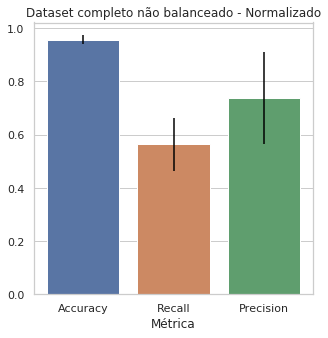

In [24]:
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 15})
fig_unbalanced = plt.figure(figsize=(5, 5))

# Medias dos melhores params
df_mean_unbalanced =  pd.DataFrame(mean_unbalanced).rename_axis('Métrica').reset_index().rename(columns = {0: 'Value'}) 

#plot
ax = sns.barplot(x="Métrica", y="Value", data=df_mean_unbalanced, ci = None)
plt.title('Dataset completo não balanceado - Normalizado')


plt.errorbar(x=[0],y=mean_unbalanced[0],yerr= (acc_max_unbalanced - mean_unbalanced[0]) , fmt='none', color = 'black')
plt.errorbar(x=[1],y=mean_unbalanced[1],yerr= (rec_max_unbalanced - mean_unbalanced[1]) , fmt='none', color = 'black')
plt.errorbar(x=[2],y=mean_unbalanced[2],yerr= (pre_max_unbalanced - mean_unbalanced[2]) , fmt='none', color = 'black')

fig_unbalanced.savefig('Dataset completo nao balanceado - Normalizado - MLP', bbox_inches='tight', dpi=600)

ax.set(ylabel='')

### Dataset Balanceado

[Text(157.00000000000003, 0.5, '')]

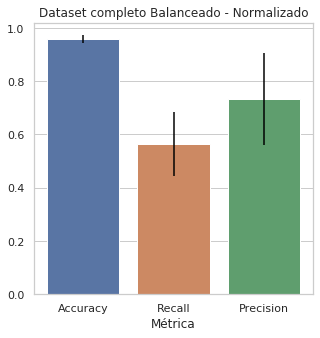

In [25]:
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 15})
fig_balanced = plt.figure(figsize=(5, 5))

# Medias dos melhores params
df_mean_balanced =  pd.DataFrame(mean_balanced).rename_axis('Métrica').reset_index().rename(columns = {0: 'Value'}) 

#plot
ax = sns.barplot(x="Métrica", y="Value", data=df_mean_balanced, ci = None)
plt.title('Dataset completo Balanceado - Normalizado')


plt.errorbar(x=[0],y=mean_balanced[0],yerr= (acc_max_balanced - mean_balanced[0]) , fmt='none', color = 'black')
plt.errorbar(x=[1],y=mean_balanced[1],yerr= (rec_max_balanced - mean_balanced[1]) , fmt='none', color = 'black')
plt.errorbar(x=[2],y=mean_balanced[2],yerr= (pre_max_balanced - mean_balanced[2]) , fmt='none', color = 'black')

fig_balanced.savefig('Dataset completo balanceado - Normalizado - MLP', bbox_inches='tight', dpi=600)

ax.set(ylabel='')

## Armazena os Resultados para Gráfico Comparativo

In [26]:
path_to_save = '../../../model_results/'

# Leitura dos resultados anteriores
all_models_results = pd.read_excel(path_to_save+'all_models_results.xlsx')

for metrica in df_mean_unbalanced.index:
    result = [
    '8',
    'MLPClassifier',
    'Dataset Completo Desbalanceado - Normalizado',
    max_alpha_unbalanced,
    df_mean_unbalanced.loc[metrica]['Métrica'],
    df_mean_unbalanced.loc[metrica]['Value'],
    
    ]
    aux_df = (pd.DataFrame(result).T).rename(columns = {0: 'Atividade', 1: 'Algoritmo', 2: 'Condicao',
                                                        3: 'Melhores_Params', 4:'Metrica', 5: 'Valor'})
    all_models_results = all_models_results.append(aux_df, ignore_index=True)

# deleta da memoria
del result, aux_df

# Dataset Completo Balanceado
for metrica in df_mean_balanced.index:
    result = [
    '8',
    'MLPClassifier',
    'Dataset Completo Balanceado - Normalizado',
    max_alpha_balanced,
    df_mean_balanced.loc[metrica]['Métrica'],
    df_mean_balanced.loc[metrica]['Value']
    ]
    aux_df = (pd.DataFrame(result).T).rename(columns = {0: 'Atividade', 1: 'Algoritmo', 2: 'Condicao', 
                                                        3: 'Melhores_Params', 4:'Metrica', 5: 'Valor'})
    all_models_results = all_models_results.append(aux_df, ignore_index=True)

display(all_models_results)

# salva os resultados novos
try:
    all_models_results.to_excel(path_to_save+'all_models_results.xlsx', index=False)
    print('Resultados salvos com sucesso')
except Exception as e:
    print('Erro {}'.format(e))

,Atividade,Algoritmo,Condicao,Melhores_Params,Metrica,Valor
0,7,SVC,Dataset Completo Desbalanceado - Nao Normalizado,"('linear', 1, 'scale')",Accuracy,0.960383
1,7,SVC,Dataset Completo Desbalanceado - Nao Normalizado,"('linear', 1, 'scale')",Recall,0.86
2,7,SVC,Dataset Completo Desbalanceado - Nao Normalizado,"('linear', 1, 'scale')",Precision,0.677579
3,7,SVC,Dataset Completo Balanceado - Nao Normalizado,"('rbf', 100, '0.0001')",Accuracy,0.962709
4,7,SVC,Dataset Completo Balanceado - Nao Normalizado,"('rbf', 100, '0.0001')",Recall,0.876667
5,7,SVC,Dataset Completo Balanceado - Nao Normalizado,"('rbf', 100, '0.0001')",Precision,0.690079
6,7,SVC,Dataset Completo Desbalanceado - Normalizado,"('rbf', 100, '0.0001')",Accuracy,0.962709
7,7,SVC,Dataset Completo Desbalanceado - Normalizado,"('rbf', 100, '0.0001')",Recall,0.876667
8,7,SVC,Dataset Completo Desbalanceado - Normalizado,"('rbf', 100, '0.0001')",Precision,0.690079
9,7,SVC,Dataset Completo Balanceado - Normalizado,"('rbf', 100, '0.0001')",Accuracy,0.959193


Resultados salvos com sucesso
